In [1]:

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


# from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../..') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。
from util import *

In [2]:
torch.cuda.set_device(1) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
# implementation of PINNsformer
# paper: PINNsFormer: A Transformer-Based Framework For Physics-Informed Neural Networks
# link: https://arxiv.org/abs/2307.11833

import torch
import torch.nn as nn
import pdb

from util import get_clones


#自定义激活函数Wavelet：w1 * sin(x) + w2 * cos(x)
class WaveAct(nn.Module):
    def __init__(self):
        super(WaveAct, self).__init__() 
        #自定义两个可学习参数w1和w2，初始化为1，训练过程中会更新这两个参数
        self.w1 = nn.Parameter(torch.ones(1), requires_grad=True)
        self.w2 = nn.Parameter(torch.ones(1), requires_grad=True)

    def forward(self, x):
        return self.w1 * torch.sin(x)+ self.w2 * torch.cos(x)

#MLP组件，第一层形状为(d_model, d_ff)，第二层形状为(d_ff, d_ff)，第三层形状为(d_ff, d_model)，前两个使用自定义激活函数WaveAct
class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff=256):
        super(FeedForward, self).__init__() 
        self.linear = nn.Sequential(*[
            nn.Linear(d_model, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_model)
        ])

    def forward(self, x):
        return self.linear(x)

#编码器层
class EncoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(EncoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数
        
    def forward(self, x): #形状为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #对输入x应用激活函数
        # pdb.set_trace()
        x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #对自注意力的输出应用激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
        return x 


class DecoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(DecoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) # 多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数

    def forward(self, x, e_outputs): #输入形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #将解码器输入x通过激活函数
        x = x + self.attn(x2, e_outputs, e_outputs)[0] #多头注意力机制，查询为解码器输入经过激活函数后的x2，键和值为编码器的输出e_outputs，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #将自注意力的输出通过激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到解码器的输出
        return x

#编码器层，包含多个堆叠的编码器架构
class Encoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表编码器的头数，N代表包含几个编码器，d_model是数据的嵌入维度（用于每个编码器），heads是头的数量
        super(Encoder, self).__init__()
        self.N = N 
        self.layers = get_clones(EncoderLayer(d_model, heads), N) #N个编码器
        self.act = WaveAct()

    def forward(self, x): #输入一次通过N个编码器，x的形状为(点的数量，序列长度，d_model)
        for i in range(self.N):
            x = self.layers[i](x)
        return self.act(x) #编码器的输出要经过激活函数

#解码器层，包含多个堆叠的解码器架构
class Decoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表解码器的头数，N代表包含几个解码器，d_model是数据的嵌入维度（用于每个解码器），heads是头的数量
        super(Decoder, self).__init__()
        self.N = N
        self.layers = get_clones(DecoderLayer(d_model, heads), N) #N个解码器
        self.act = WaveAct()
        
    def forward(self, x, e_outputs): #输入一次通过N个解码器层，x的形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        for i in range(self.N): #输入和编码器输出依次通过N个解码器
            x = self.layers[i](x, e_outputs) 
        return self.act(x) #解码器的输出要经过激活函数



class DNN(nn.Module):
    def __init__(self, d_out, d_model, d_hidden, N, heads): #接受参数为：d_out代表整个模型的输出的维度（就是最后的mlp层的输出维度），d_model代表每个点的特征嵌入维度，d_hidden代表最后的output layer模块中的隐藏层的维度，N代表编码器和解码器的层数，heads代表多头注意力机制的头数
        super(DNN, self).__init__()

        self.linear_emb = nn.Linear(2, d_model) #线性层，将输入的2维数据映射到d_model维度

        self.encoder = Encoder(d_model, N, heads) #编码器层
        self.decoder = Decoder(d_model, N, heads) #解码器层

        #输出的mlp模块，包含三个线性层，前两个使用自定义激活函数WaveAct，最终将feature从d_model维度映射到d_hidden维度，最后将d_hidden维度映射到d_out维度
        self.linear_hidden = nn.Sequential(*[
            nn.Linear(d_model, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, 2),
        ])
        self.linear_out = nn.Sequential(*[
            WaveAct(),
            nn.Linear(2, d_out)
        ])

    def forward(self, x): #输入的x形状一般为(点的数量, 序列长度, 2)
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output #(点的数量，序列长度，d_out)
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        # output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output_hidden #(点的数量，序列长度，2)

    
   

In [4]:
#set the class of PINN

#定义了一个名为`PhysicsInformedNN'的类，用于实现基于物理的神经网络。
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x0, u0, tb, X_f, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数
        
        
        X0 = np.concatenate((x0,0*x0), 1) # [x0, 0],将x0和0*x0两个数组在第二个维度（即列）上进行了合并。0*x0会生成一个与x0形状相同，但所有元素都为0的数组。因此，X0的结果是一个新的二维数组，其中第一列是x0的值，第二列全为0
        X_lb = np.concatenate((0*tb+lb[0],tb), 1) # [lb[0], tb],将0*tb+lb[0]和tb两个数组在第二个维度（即列）上进行了合并。0*tb+lb[0]会生成一个与tb形状相同，但所有元素都为lb[0]的数组。因此，X_lb的结果是一个新的二维数组，其中第一列全为lb[0]的值，第二列是tb的值。
        X_ub = np.concatenate((0*tb+ub[0],tb), 1) # [ub[0], tb],同上生成一个与tb形状相同，但所有元素都为ub[0]的数组。因此，X_ub的结果是一个新的二维数组，其中第一列全为ub[0]的值，第二列是tb的值

        X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_lb = make_time_sequence(X_lb, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_ub = make_time_sequence(X_ub, num_step=5, step=1e-4)
        X_f = make_time_sequence(X_f, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)


        self.lb = torch.tensor(lb).float().to(device) #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.ub = torch.tensor(ub).float().to(device)


        self.x0 = torch.tensor(X0[:,:, 0:1], requires_grad=True).float().to(device) #将X0的第一列赋值给self.x0（:表示取所有行,0：1实际上表示取第一列，因为python是左闭右开的）,将X0的第二列赋值给self.t0。这样可以在类的其他方法中通过self.x0和self.t0来访问这些值。
        self.t0 = torch.tensor(X0[:,:, 1:2], requires_grad=True).float().to(device) #将x0的第二列赋值给self.t0

        self.x_lb = torch.tensor(X_lb[:,:, 0:1], requires_grad=True).float().to(device) #将X_lb的第一列赋值给self.x_lb
        self.t_lb = torch.tensor(X_lb[:,:, 1:2], requires_grad=True).float().to(device) #将X_lb的第二列赋值给self.t_lb

        self.x_ub = torch.tensor(X_ub[:,:, 0:1], requires_grad=True).float().to(device) #将X_ub的第一列赋值给self.x_ub
        self.t_ub = torch.tensor(X_ub[:,:, 1:2], requires_grad=True).float().to(device) #将X_ub的第二列赋值给self.t_ub
        
        self.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device) #将X_f的第一列赋值给self.x_f
        self.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device) #将X_f的第二列赋值给self.t_f
        
        self.u0 = torch.tensor(u0).float().to(device) #将传入的u0和v0参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u0和self.v0来访问这些值。
        
        
        
        
        # deep neural networks
        self.dnn = DNN(d_out=1, d_hidden=512, d_model=32, N=1, heads=2).to(device) 
        self.dnn.apply(self.init_weights) #初始化模型中线性层的权重和偏置


        self.optimizer_LBFGS = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe')
        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
                

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

    def init_weights(self, m):
        if isinstance(m, nn.Linear): #判断是否是线性层
            torch.nn.init.xavier_uniform(m.weight)
            m.bias.data.fill_(0.01)
    
    #这个函数与下面的net_u函数功能相同，只是不计算梯度，因为在记录每个epoch的error时，使用with torch.no_grad()情况下调用net_u函数会报错，不知道为啥？
    def net_u_error(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        
        return u #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #pytorch中
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u

        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]

        return u,u_x #两个输出(点的数量，序列长度，1)


    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """

        u,u_x=self.net_u(x,t) #调用上面的函数/方法，计算神经网络的输出（两个）以及输出关于输入x的梯度（两个）
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f=u_t-0.0001*u_xx+5*u**3-5*u    #计算f,定义见论文

        return f  #(点的数量，序列长度，1)


    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）

        u0_pred, _  = self.net_u(self.x0, self.t0) #输出(点的数量，序列长度，1)
        u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
        u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #两个输出(点的数量，序列长度，1)
        u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #两个输出(点的数量，序列长度，1)
        f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)

        loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                torch.mean(f_pred ** 2)
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        
        self.iter += 1 #每调用一次损失函数，迭代次数加1


        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中


        return loss #返回loss



    
    #定义了一个名为train的函数/方法，用于训练神经网络。这个方法接受一个参数nIter，表示训练的迭代次数。
    def train(self, nIter, nIterLBFGS):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式

        #先使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            u0_pred, _  = self.net_u(self.x0, self.t0) #输出(点的数量，序列长度，1)
            u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
            u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #两个输出(点的数量，序列长度，1)
            u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #两个输出(点的数量，序列长度，1)
            f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)

            loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean(f_pred ** 2)
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            

            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中


        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   

                                    
    def predict(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u = self.net_u_error(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
            u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
            u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上

        return u #u形状是(点的数量，1)
    
    def residual(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        
        f = self.net_f(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
        f = torch.mean(f, dim=1).reshape(-1,1) #对f在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差
        f = f.detach().cpu().numpy()
        return f #u形状是(点的数量，1)，f形状是(点的数量，1)
    

    def hidden_predict(self, X):#形状(点的数量，序列长度，2)
        x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)
        self.dnn.eval()
        with torch.no_grad():
            hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=-1)) #(点的数量，序列长度，2)
            hidden_output = hidden_output.detach().cpu().numpy()
        # hidden_output_x = hidden_output[:, 0]
        # hidden_output_t = hidden_output[:, 1]
        # hidden_output_x = hidden_output_x.detach().cpu().numpy()
        # hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output #(点的数量，序列长度，2)


In [5]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter): #输入是(点的数量，2)
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    X0 = X
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    xs = []
    X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X = model.hidden_predict(X0) #(点的数量，序列长度，2)
    
    for i in range(num_iter): #循环num_iter次
        X = model.hidden_predict(X) #(点的数量，序列长度，2)
        xs.append(X) #新添加(点的数量，序列长度，2)

    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    X1 = np.concatenate((x1, t1), axis=1) #(N_f_new,2)形状
    X1 = make_time_sequence(X1, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X1 = model.hidden_predict(X1) #(N_f_new,序列长度,2)

    for i in range(num_iter): #循环num_iter次
        X1 = model.hidden_predict(X1) #(N_f_new,序列长度,
        xs1.append(X1) #新添加(N_f_new,序列长度,2)

    

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t,使用chunchaos要注释掉
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=(1,2))
    distances = distances.flatten()







    # #chunchaos方法
    # num_elements_to_average = 20
    # # 提取最后 20 个元素
    # last_20_xs = xs[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # last_20_xs1 = xs1[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # # 存储每个时间步（列表中的每个元素）的混沌度分数
    # step_chaos_scores = []
    # # 遍历最后 20 个元素,zip 将两个列表的对应元素配对
    # for step_xs, step_xs1 in zip(last_20_xs, last_20_xs1):
    #     # step_xs 和 step_xs1 都是形状为 (N_f_new, sequence_length, 2) 的数组/张量
    #     difference_step = step_xs - step_xs1 # 计算差异
    #     # 计算每个数据点在当前步的混沌度分数 (形状 (N_f_new,))
    #     # 假设使用 NumPy 进行计算
    #     step_scores = np.linalg.norm(difference_step, axis=(1, 2))
    #     # 将这 N_f_new 个分数添加到列表中
    #     step_chaos_scores.append(step_scores)

    # # step_chaos_scores 是一个包含 20 个元素的列表，每个元素都是形状为 (N_f_new,) 的 NumPy 数组
    # # 将列表转换成一个单一的 NumPy 数组，形状为 (20, N_f_new)
    # all_step_scores = np.stack(step_chaos_scores)
    # # 现在 all_step_scores 的形状是 (num_elements_to_average, N_f_new)
    # # axis 0 是时间步 (20)，axis 1 是原始数据点 (N_f_new)
    # # 计算最后 20 个时间步在每个数据点上的平均混沌度分数
    # # 沿着时间步轴 (axis=0) 求平均
    # distances = np.mean(all_step_scores, axis=0)
    # # 结果形状是 (N_f_new,)







    return distances

In [6]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

#设置噪声水平为0
noise = 0.0        

# Doman bounds，定义两个一维数组lb和ub，问题域是一个二维空间，其中 x 的范围是 -5 到 5，t 的范围是 0 到 π/2(竖着的)
lb = np.array([-1.0, 0.0])
ub = np.array([1.0, 1.0])
#定义三个整数，分别表示初始条件点数量、边界条件点数量和配位点的数量（这些点用于训练神经网络）
N0 = 500
N_b = 100
N_f = 5000


#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

###########################

#从0~数组x的行数(256)中随机选择N0个数，replace=False表示不允许重复选择，最后将这N0个数赋值给idx_x
idx_x = np.linspace(0, x.shape[0]-1, N0, dtype='int') #生成一个从0到x.shape[0]-1的等差数列，长度为x.shape[0]，数据类型为整型
# idx_x = np.random.choice(x.shape[0], N0, replace=False)
#从x中选择N0个对应的行(idx_x对应的行)，最后将这N0行赋值给x0
x0 = x[idx_x,:]
#从Exact_u中选择N0个对应的行(idx_x对应的行)的第一列元素，最后将这N0个元素赋值给u0
# u0 = Exact[idx_x,0:1]
u0 = Exact[0:1,idx_x].T

#从0~数组t的行数中随机选择N_b个数，replace=False表示不允许重复选择，最后将这N_b个数赋值给idx_t
idx_t = np.linspace(0, t.shape[0]-1, N_b, dtype='int') #生成一个从0到t.shape[0]-1的等差数列，长度为t.shape[0]，数据类型为整型
# idx_t = np.random.choice(t.shape[0], N_b, replace=False)
#从t中选择N_b个对应的行(idx_t对应的行)，最后将这N_b行赋值给tb
tb = t[idx_t,:]

error = [] #创建一个空列表，用于存储误差
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

nIter = 10000 #设置迭代次数为10000
nIterLBFGS = 1000 #设置LBFGS迭代次数为500(其实是1000次)

for seed in seeds:
    set_seed(seed) #设置随机种子

    # --- 2. 初始化 ---
    N_f_1 = N_f // 20
    X_f_train = lb + (ub - lb) * lhs(2, N_f_1)
    model = PhysicsInformedNN(x0, u0, tb, X_f_train, lb, ub)

    # 【新】创建巨大、固定的候选点池
    N_f_candidate = N_f * 2
    X_f_candidate = lb + (ub - lb) * lhs(2, N_f_candidate)
    is_point_selected_mask = np.zeros(N_f_candidate, dtype=bool) #布尔掩码，形状是(N_f_candidate,)，初始值为False，表示所有点都未被选择
    

    # --- 3. 初始训练 ---
    start_time = time.time()
    model.train(nIter // 20, 0)

    # --- 4. 主动学习循环 ---
    # 计算总轮数,这里是19
    num_active_rounds = (nIter - nIter // 20) // (nIter // 20)
    # 每轮训练中记录的检查点数量，其实就是后面的T
    num_checkpoints_per_round = 10
    # 两次检查点之间的训练迭代次数
    epochs_between_checkpoints = (nIter // 20) // num_checkpoints_per_round

    # 用于存储每一轮最终预测的全局历史
    global_final_predictions = []

    for i in range(num_active_rounds):        
        # a. 训练并记录预测历史
        prediction_history = []
        # 记录当前模型在整个候选池上的预测输出
        
        for j in range(num_checkpoints_per_round):
            model.train(epochs_between_checkpoints, 0)
            
            # 记录当前模型在整个候选池上的预测输出
            predictions = model.predict(X_f_candidate) # 返回 (N, 1) 的Numpy数组
            # prediction_history.append(predictions.flatten()) # 存为一维数组，每个元素形状为 (N, ) 
            prediction_history.append(predictions) # 存为二维数组，每个元素形状为 (N, 1)
        local_prediction_history = prediction_history

        # b. 计算不稳定性分数 g(x) = Σ v_t * a_t(x)
        # 将历史记录转为矩阵 (T+1, N_candidates,1)
        local_history_matrix = np.array(local_prediction_history)
        T_local, num_candidates, _ = local_history_matrix.shape #T表示共存储了多少个模型的预测结果，num_candidates表示候选点的数量

        # 获取最终预测u_T(x)
        local_final_prediction = local_history_matrix[-1, :, :] # (N_candidates, 1) 的数组

        # 计算不一致性矩阵 a_t(x) = |u_t(x) - u_T(x)|
        # 利用 NumPy 的广播机制高效计算，具体为(T, N_candidates,1)-(N_candidates,1)（相当于用T个元素分别和最后一个元素相减）,最后得到的形状是(T, N_candidates)
        # disagreement_matrix_A = np.abs(prediction_history_matrix - final_prediction_vec)
        local_disagreement = np.linalg.norm(local_history_matrix - local_final_prediction, ord=2, axis=-1)

        # 计算时间权重向量 v_t = (t/T)^k
        t_local = np.arange(1, T_local + 1) #形状是(T,)的数组
        k_local = 1.0  # 权重指数，可以作为超参数调整
        v_local = (t_local / T_local) ** k_local #形状是(T,)

        # 计算最终不稳定性分数 g(x)
        # g = V^T * A (矩阵乘法概念)
        # 实际操作：将权重向量V变形以进行逐元素乘法，然后在时间轴上求和
        # v_local（也就是V）的形状是(T,)，local_disagreement（也就是A）的形状是(T, N_candidates)
        # V[:, np.newaxis] 将V变为 (T, 1)，可以与A进行广播乘法
        g_micro = np.sum(v_local[:, np.newaxis] * local_disagreement, axis=0) #求和前形状为 (T, N_candidates)，求和后形状为(N_candidates,)

        
        # c. 更新并计算【宏观不稳定性 g_macro】
        # ------------------------------------------------------------------
        # 将本轮的最终预测加入全局历史列表
        global_final_predictions.append(local_final_prediction)
        
        g_macro = np.zeros(num_candidates) # 如果历史太短，宏观不稳定性为0
        
        # 只有当全局历史足够长时（至少有两次最终预测），计算才有意义
        if len(global_final_predictions) > 1:
            global_history_matrix = np.array(global_final_predictions)
            T_global, _, _ = global_history_matrix.shape # T_global 是当前的主动学习轮数 i+1
            
            # 使用全局最新的预测作为基准
            global_final_prediction = global_history_matrix[-1, :, :]
            
            # 计算宏观不一致性
            global_disagreement = np.linalg.norm(global_history_matrix - global_final_prediction, ord=2, axis=-1)
            
            # 【宏观 t, k】
            t_global = np.arange(1, T_global + 1)
            k_macro = 2.0 # 宏观时间尺度上，可以给后期变化更大的惩罚，所以k可以更大
            v_global = (t_global / T_global) ** k_macro
            
            # 计算宏观不稳定性分数
            g_macro = np.sum(v_global[:, np.newaxis] * global_disagreement, axis=0)


        # d. 融合分数
        # ------------------------------------------------------------------
        # 在融合前，对两种分数进行归一化，使其尺度相当，避免其中一个主导
        # 这是一个很好的实践，可以防止数值问题
        if np.std(g_micro) > 1e-6:
            g_micro_norm = (g_micro - np.mean(g_micro)) / np.std(g_micro)
        else:
            g_micro_norm = np.zeros_like(g_micro)

        if np.std(g_macro) > 1e-6:
            g_macro_norm = (g_macro - np.mean(g_macro)) / np.std(g_macro)
        else:
            g_macro_norm = np.zeros_like(g_macro)
            
        # 设置融合权重
        w_micro = 0.5
        w_macro = 0.5
        
        instability_scores_g = w_micro * g_micro_norm + w_macro * g_macro_norm



        batch_size = N_f_candidate // 10 # 设置批处理大小为候选点数量的十分之一，避免显存爆炸
        all_residuals = [] # 创建一个空列表来存储每个批次的残差结果


        # 循环处理每个批次
        for i in range(0, N_f_candidate, batch_size):
            # 获取当前批次的数据
            X_batch = X_f_candidate[i : i + batch_size]
            
            # 对当前批次计算残差
            # model.residual 内部的计算量大大减小，不会爆显存了
            residual_batch = model.residual(X_batch) # 返回 (batch_size, 1) 的 NumPy 数组
            
            # 将当前批次的结果添加到列表中
            all_residuals.append(residual_batch)

        # 将所有批次的结果拼接成一个大的 NumPy 数组
        residual = np.vstack(all_residuals) # vstack 用于垂直堆叠

        # --- 后续处理不变 ---
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        # 将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()



        #进行归一化
        epsilon = 1e-5
        
        norm_residual = np.linalg.norm(abs_residual)
        if norm_residual > epsilon:
            abs_residual = abs_residual / norm_residual
        else:
            abs_residual = np.zeros_like(abs_residual)
        # norm_distances = np.linalg.norm(distances)
        # if norm_distances > epsilon:
        #     distances = distances / norm_distances
        # else:
        #     distances = np.zeros_like(distances)

        norm_instability = np.linalg.norm(instability_scores_g)
        if norm_instability > epsilon:
            instability_scores_g = instability_scores_g / norm_instability
        else:
            instability_scores_g = np.zeros_like(instability_scores_g)

        xinxi = abs_residual #将残差和不稳定性分数相加，得到新的分数


        # e. 选择新的点
        # 屏蔽已选中的点，防止重复选择
        xinxi[is_point_selected_mask] = -1.0
        
        # 找出分数最高的 N_f_1 个点的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:]
        
        # 提取新点
        X_f_train_topk = X_f_candidate[topk_indices]
        
        # f. 更新训练集和掩码
        X_f_train = np.vstack((X_f_train, X_f_train_topk))
        is_point_selected_mask[topk_indices] = True


        # e. 更新模型内部的配位点
        X_f = make_time_sequence(X_f_train, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        
        #配位点数据
        model.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)


    model.train(0, nIterLBFGS) #训练模型500次

    #获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time                
    #打印训练所需时间
    print('Training time: %.4f' % (elapsed))





    #用训练好的模型进行预测，返回四个值（均为数组）    
    u_pred = model.predict(X_star)

    #计算误差（基于2范数）        
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)

    #打印误差
    print('Error u: %e' % (error_u))

    #将误差添加到error列表中

    #计算误差（基于2范数）
    error.append(error_u) #计算误差，然后将误差添加到error列表中
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE


# #使用griddata函数将X_star、u_pred、v_pred和h_pred插值到网格上，得到U_pred、V_pred和H_pred
# U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')

# #同上，使用griddata函数将X_star、f_u_pred和f_v_pred插值到网格上，得到FU_pred和FV_pred
# F_pred = griddata(X_star, f_pred.flatten(), (X, T), method='cubic')


 

/tmp/ipykernel_3638418/1233458799.py:56: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(m.weight)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<00:59,  8.37it/s]

Adam:   1%|          | 5/500 [00:00<00:20, 23.92it/s]

Adam:   2%|▏         | 9/500 [00:00<00:17, 27.39it/s]

Adam:   3%|▎         | 13/500 [00:00<00:16, 30.40it/s]

Adam:   3%|▎         | 17/500 [00:00<00:15, 31.93it/s]

Adam:   4%|▍         | 21/500 [00:00<00:14, 33.08it/s]

Adam:   5%|▌         | 25/500 [00:00<00:14, 33.86it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 34.41it/s]

Adam:   7%|▋         | 33/500 [00:01<00:13, 34.72it/s]

Adam:   7%|▋         | 37/500 [00:01<00:13, 35.00it/s]

Adam:   8%|▊         | 41/500 [00:01<00:13, 34.51it/s]

Adam:   9%|▉         | 45/500 [00:01<00:13, 34.77it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 34.88it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 35.05it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 35.19it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 34.59it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 34.54it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:12, 34.84it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:12, 35.07it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:12, 35.09it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:11, 35.33it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:11, 35.40it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 34.58it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 34.06it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:11, 34.54it/s]

Adam:  20%|██        | 101/500 [00:02<00:11, 34.82it/s]

Adam:  21%|██        | 105/500 [00:03<00:11, 34.93it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:11, 34.94it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:11, 35.07it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:10, 35.08it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 35.19it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 35.02it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 35.20it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 35.31it/s]

Adam:  27%|██▋       | 137/500 [00:04<00:10, 34.24it/s]

Adam:  28%|██▊       | 141/500 [00:04<00:10, 34.80it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:10, 34.34it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:10, 34.51it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 34.85it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 35.04it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 35.20it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 34.80it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 35.04it/s]

Adam:  35%|███▍      | 173/500 [00:05<00:10, 32.54it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:09, 33.01it/s]

Adam:  36%|███▌      | 181/500 [00:05<00:09, 33.68it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:09, 34.11it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:09, 33.72it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 34.27it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 34.66it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 34.80it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 34.97it/s]

Adam:  42%|████▏     | 209/500 [00:06<00:08, 34.85it/s]

Adam:  43%|████▎     | 213/500 [00:06<00:08, 34.63it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:08, 34.81it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 34.90it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 34.78it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 34.98it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 35.23it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 35.35it/s]

Adam:  48%|████▊     | 241/500 [00:07<00:07, 35.44it/s]

Adam:  49%|████▉     | 245/500 [00:07<00:07, 35.02it/s]

Adam:  50%|████▉     | 249/500 [00:07<00:07, 33.39it/s]

Adam:  51%|█████     | 253/500 [00:07<00:07, 33.88it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:07, 33.40it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:07, 34.00it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 33.85it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 34.26it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 34.66it/s]

Adam:  55%|█████▌    | 277/500 [00:08<00:06, 33.83it/s]

Adam:  56%|█████▌    | 281/500 [00:08<00:06, 34.20it/s]

Adam:  57%|█████▋    | 285/500 [00:08<00:06, 34.61it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:06, 34.60it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 34.53it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:06, 33.82it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 34.29it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 34.73it/s]

Adam:  62%|██████▏   | 309/500 [00:09<00:05, 34.96it/s]

Adam:  63%|██████▎   | 313/500 [00:09<00:05, 35.18it/s]

Adam:  63%|██████▎   | 317/500 [00:09<00:05, 35.17it/s]

Adam:  64%|██████▍   | 321/500 [00:09<00:05, 35.18it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:05, 34.77it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 34.89it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 35.07it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 33.35it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 33.34it/s]

Adam:  69%|██████▉   | 345/500 [00:10<00:04, 33.89it/s]

Adam:  70%|██████▉   | 349/500 [00:10<00:04, 34.10it/s]

Adam:  71%|███████   | 353/500 [00:10<00:04, 34.31it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:04, 34.44it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:04, 34.57it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 34.75it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 34.95it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 35.10it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 35.20it/s]

Adam:  76%|███████▌  | 381/500 [00:11<00:03, 35.35it/s]

Adam:  77%|███████▋  | 385/500 [00:11<00:03, 35.45it/s]

Adam:  78%|███████▊  | 389/500 [00:11<00:03, 35.40it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:03, 35.40it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:03, 34.14it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 34.56it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 34.18it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 34.21it/s]

Adam:  83%|████████▎ | 413/500 [00:12<00:02, 34.60it/s]

Adam:  83%|████████▎ | 417/500 [00:12<00:02, 34.88it/s]

Adam:  84%|████████▍ | 421/500 [00:12<00:02, 35.00it/s]

Adam:  85%|████████▌ | 425/500 [00:12<00:02, 33.55it/s]

Adam:  86%|████████▌ | 429/500 [00:12<00:02, 34.10it/s]

Adam:  87%|████████▋ | 433/500 [00:12<00:02, 33.15it/s]

Adam:  87%|████████▋ | 437/500 [00:12<00:01, 32.86it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 33.62it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 34.13it/s]

Adam:  90%|████████▉ | 449/500 [00:13<00:01, 34.45it/s]

Adam:  91%|█████████ | 453/500 [00:13<00:01, 34.18it/s]

Adam:  91%|█████████▏| 457/500 [00:13<00:01, 34.43it/s]

Adam:  92%|█████████▏| 461/500 [00:13<00:01, 34.32it/s]

Adam:  93%|█████████▎| 465/500 [00:13<00:01, 34.54it/s]

Adam:  94%|█████████▍| 469/500 [00:13<00:00, 34.84it/s]

Adam:  95%|█████████▍| 473/500 [00:13<00:00, 35.04it/s]

Adam:  95%|█████████▌| 477/500 [00:13<00:00, 35.11it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 35.22it/s]

Adam:  97%|█████████▋| 485/500 [00:14<00:00, 35.27it/s]

Adam:  98%|█████████▊| 489/500 [00:14<00:00, 35.32it/s]

Adam:  99%|█████████▊| 493/500 [00:14<00:00, 34.19it/s]

Adam:  99%|█████████▉| 497/500 [00:14<00:00, 34.56it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.21it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.45it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.81it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.80it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.63it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 36.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.10it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.79it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.34it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.01it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.24it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.60it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.79it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.24it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.54it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.82it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.33it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.77it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.95it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.80it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.57it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.18it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.64it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.91it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.33it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.25it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.31it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.22it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.19it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.52it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.66it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.21it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.40it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.60it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.43it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.71it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.11it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.35it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.42it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.25it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.25it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.20it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.29it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.46it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.90it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.96it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.55it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.23it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.21it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.62it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.25it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.38it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.81it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.60it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.76it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.65it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.19it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.97it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.72it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.20it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.56it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.27it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.12it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.56it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.08it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.36it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.82it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.16it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.20it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.36it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.36it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.39it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.37it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.43it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.34it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.87it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.61it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.75it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.92it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.86it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.89it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.63it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.86it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.00it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.98it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.77it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.29it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.92it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.77it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.05it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.17it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.00it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.14it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.23it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 36.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.28it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.23it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.44it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.29it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.63it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.86it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.70it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.75it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.64it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.36it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.88it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.98it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.88it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.00it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.94it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.67it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.50it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.21it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.56it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.45it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.15it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.87it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.55it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.12it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.42it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 32.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 32.94it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 33.29it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 34.09it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 34.58it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 33.50it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 34.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 34.35it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 34.52it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 34.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.51it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.17it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.91it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 32.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.58it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.78it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.82it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.72it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.94it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.30it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.10it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.21it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.12it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.21it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.69it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.82it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.54it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.02it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.15it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.36it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 31.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.21it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.43it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.63it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.28it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.26it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.08it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.25it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.33it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.34it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.35it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 31.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 32.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 32.78it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 32.95it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 32.71it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 32.92it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 32.75it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 32.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 32.16it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 32.50it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 32.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.83it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.25it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.59it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.82it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.63it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.73it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.22it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.84it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.83it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 31.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.93it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.36it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.64it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.73it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.61it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.85it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.10it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.15it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.28it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.85it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.53it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.95it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.35it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.63it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.84it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.74it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.78it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.84it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.06it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.47it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.46it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 27.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.27it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.15it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.19it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.14it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.49it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.00it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.87it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.18it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.50it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.84it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.19it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.52it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.55it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.52it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.19it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.09it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.00it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.65it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.64it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.57it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.04it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.30it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.20it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.49it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.55it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.03it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.12it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.58it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.65it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.73it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.78it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.44it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.57it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.65it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.68it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.45it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.74it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.73it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.75it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.73it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.79it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.42it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.56it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.56it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.39it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.35it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.63it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.03it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.39it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.53it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.64it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.47it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.64it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.70it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.72it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.74it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.75it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.80it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.56it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.58it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.41it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.99it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.67it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.62it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.72it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.80it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.79it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.72it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.68it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.63it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.31it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.63it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.69it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.06it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.24it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.38it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.61it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.74it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.73it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.73it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.72it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.74it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.78it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.79it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.10it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.90it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.59it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.58it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.45it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.08it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.38it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.43it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.14it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.63it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 22.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 24.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 24.95it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 25.21it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 25.37it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 25.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:00, 25.48it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 25.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 25.31it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 25.46it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 25.47it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 25.55it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 25.55it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 25.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.51it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.83it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.21it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.43it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.51it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.42it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.60it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.78it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.19it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.63it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.28it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.37it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.51it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.30it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.38it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.95it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.65it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.64it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.16it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.55it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.82it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.00it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.03it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.72it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.81it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.00it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.79it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.79it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.79it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.57it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.44it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.56it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.66it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.41it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.52it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.60it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.69it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.42it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.64it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.76it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.76it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.59it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.62it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.63it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.39it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.86it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.02it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.43it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.54it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.24it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.53it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.61it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.60it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.56it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.64it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.41it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.71it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.64it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.54it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.33it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.74it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.76it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.69it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.78it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.46it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.69it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.61it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.67it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.71it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.76it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.75it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.34it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.40it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.53it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.06it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.39it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.47it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.51it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.54it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.64it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.70it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.75it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.68it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.67it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.66it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.56it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.63it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.63it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.28it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.59it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.65it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.65it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.35it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.84it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.84it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.60it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.60it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.77it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.78it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.77it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.79it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.29it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.88it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.99it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.89it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.90it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 15.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.06it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.89it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.82it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.07it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.82it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.84it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.48it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.67it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.36it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.71it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.76it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.03it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.09it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.06it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.27it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.37it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.38it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.39it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.40it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.32it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.39it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.40it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.41it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.41it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.41it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.37it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.39it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.41it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.68it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.65it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.67it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.70it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.70it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.71it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.70it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.69it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.70it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.71it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.68it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.66it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.67it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.51it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.50it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.65it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.52it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.71it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.70it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.71it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.51it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.69it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.65it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.65it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  9.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.05it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.21it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:02<48:42,  2.93s/it]

LBFGS:   0%|          | 2/1000 [00:05<45:17,  2.72s/it]

LBFGS:   0%|          | 3/1000 [00:06<32:42,  1.97s/it]

LBFGS:   0%|          | 4/1000 [00:09<36:49,  2.22s/it]

LBFGS:   0%|          | 5/1000 [00:11<39:11,  2.36s/it]

LBFGS:   1%|          | 6/1000 [00:14<42:01,  2.54s/it]

LBFGS:   1%|          | 7/1000 [00:17<44:30,  2.69s/it]

LBFGS:   1%|          | 8/1000 [00:20<46:05,  2.79s/it]

LBFGS:   1%|          | 9/1000 [00:23<44:44,  2.71s/it]

LBFGS:   1%|          | 10/1000 [00:26<46:03,  2.79s/it]

LBFGS:   1%|          | 11/1000 [00:29<46:59,  2.85s/it]

LBFGS:   1%|          | 12/1000 [00:31<45:55,  2.79s/it]

LBFGS:   1%|▏         | 13/1000 [00:34<46:19,  2.82s/it]

LBFGS:   1%|▏         | 14/1000 [00:37<46:00,  2.80s/it]

LBFGS:   2%|▏         | 15/1000 [00:40<46:54,  2.86s/it]

LBFGS:   2%|▏         | 16/1000 [00:43<46:57,  2.86s/it]

LBFGS:   2%|▏         | 17/1000 [00:46<47:32,  2.90s/it]

LBFGS:   2%|▏         | 18/1000 [00:49<47:27,  2.90s/it]

LBFGS:   2%|▏         | 19/1000 [00:52<48:23,  2.96s/it]

LBFGS:   2%|▏         | 20/1000 [00:55<48:29,  2.97s/it]

LBFGS:   2%|▏         | 21/1000 [00:58<48:26,  2.97s/it]

LBFGS:   2%|▏         | 22/1000 [01:01<48:30,  2.98s/it]

LBFGS:   2%|▏         | 23/1000 [01:04<47:28,  2.92s/it]

LBFGS:   2%|▏         | 24/1000 [01:06<46:47,  2.88s/it]

LBFGS:   2%|▎         | 25/1000 [01:09<46:14,  2.85s/it]

LBFGS:   3%|▎         | 26/1000 [01:12<46:21,  2.86s/it]

LBFGS:   3%|▎         | 27/1000 [01:15<45:54,  2.83s/it]

LBFGS:   3%|▎         | 28/1000 [01:17<44:26,  2.74s/it]

LBFGS:   3%|▎         | 29/1000 [01:20<44:37,  2.76s/it]

LBFGS:   3%|▎         | 30/1000 [01:23<44:36,  2.76s/it]

LBFGS:   3%|▎         | 31/1000 [01:25<44:01,  2.73s/it]

LBFGS:   3%|▎         | 32/1000 [01:28<43:03,  2.67s/it]

LBFGS:   3%|▎         | 33/1000 [01:31<42:20,  2.63s/it]

LBFGS:   3%|▎         | 34/1000 [01:33<42:23,  2.63s/it]

LBFGS:   4%|▎         | 35/1000 [01:36<42:26,  2.64s/it]

LBFGS:   4%|▎         | 36/1000 [01:39<42:26,  2.64s/it]

LBFGS:   4%|▎         | 37/1000 [01:41<41:54,  2.61s/it]

LBFGS:   4%|▍         | 38/1000 [01:44<42:04,  2.62s/it]

LBFGS:   4%|▍         | 39/1000 [01:46<41:35,  2.60s/it]

LBFGS:   4%|▍         | 40/1000 [01:49<41:13,  2.58s/it]

LBFGS:   4%|▍         | 41/1000 [01:51<41:34,  2.60s/it]

LBFGS:   4%|▍         | 42/1000 [01:54<43:23,  2.72s/it]

LBFGS:   4%|▍         | 43/1000 [01:57<44:39,  2.80s/it]

LBFGS:   4%|▍         | 44/1000 [02:00<45:02,  2.83s/it]

LBFGS:   4%|▍         | 45/1000 [02:03<44:12,  2.78s/it]

LBFGS:   5%|▍         | 46/1000 [02:06<44:05,  2.77s/it]

LBFGS:   5%|▍         | 47/1000 [02:09<45:05,  2.84s/it]

LBFGS:   5%|▍         | 48/1000 [02:12<45:14,  2.85s/it]

LBFGS:   5%|▍         | 49/1000 [02:14<45:20,  2.86s/it]

LBFGS:   5%|▌         | 50/1000 [02:17<44:52,  2.83s/it]

LBFGS:   5%|▌         | 51/1000 [02:20<44:02,  2.78s/it]

LBFGS:   5%|▌         | 52/1000 [02:23<44:00,  2.79s/it]

LBFGS:   5%|▌         | 53/1000 [02:26<45:03,  2.85s/it]

LBFGS:   5%|▌         | 54/1000 [02:28<44:08,  2.80s/it]

LBFGS:   6%|▌         | 55/1000 [02:31<44:02,  2.80s/it]

LBFGS:   6%|▌         | 56/1000 [02:34<44:27,  2.83s/it]

LBFGS:   6%|▌         | 57/1000 [02:37<44:11,  2.81s/it]

LBFGS:   6%|▌         | 58/1000 [02:40<43:33,  2.77s/it]

LBFGS:   6%|▌         | 59/1000 [02:42<44:07,  2.81s/it]

LBFGS:   6%|▌         | 60/1000 [02:45<43:26,  2.77s/it]

LBFGS:   6%|▌         | 61/1000 [02:48<44:36,  2.85s/it]

LBFGS:   6%|▌         | 62/1000 [02:51<45:18,  2.90s/it]

LBFGS:   6%|▋         | 63/1000 [02:54<44:45,  2.87s/it]

LBFGS:   6%|▋         | 64/1000 [02:57<44:52,  2.88s/it]

LBFGS:   6%|▋         | 65/1000 [03:00<43:50,  2.81s/it]

LBFGS:   7%|▋         | 66/1000 [03:03<45:17,  2.91s/it]

LBFGS:   7%|▋         | 67/1000 [03:06<45:09,  2.90s/it]

LBFGS:   7%|▋         | 68/1000 [03:08<43:27,  2.80s/it]

LBFGS:   7%|▋         | 69/1000 [03:11<42:13,  2.72s/it]

LBFGS:   7%|▋         | 70/1000 [03:13<42:27,  2.74s/it]

LBFGS:   7%|▋         | 71/1000 [03:17<44:12,  2.86s/it]

LBFGS:   7%|▋         | 72/1000 [03:20<44:50,  2.90s/it]

LBFGS:   7%|▋         | 73/1000 [03:23<45:48,  2.97s/it]

LBFGS:   7%|▋         | 74/1000 [03:26<45:27,  2.95s/it]

LBFGS:   8%|▊         | 75/1000 [03:28<44:12,  2.87s/it]

LBFGS:   8%|▊         | 76/1000 [03:31<44:22,  2.88s/it]

LBFGS:   8%|▊         | 77/1000 [03:34<42:47,  2.78s/it]

LBFGS:   8%|▊         | 78/1000 [03:36<42:21,  2.76s/it]

LBFGS:   8%|▊         | 79/1000 [03:39<43:31,  2.84s/it]

LBFGS:   8%|▊         | 80/1000 [03:42<43:49,  2.86s/it]

LBFGS:   8%|▊         | 81/1000 [03:45<43:25,  2.83s/it]

LBFGS:   8%|▊         | 82/1000 [03:48<42:37,  2.79s/it]

LBFGS:   8%|▊         | 83/1000 [03:51<43:11,  2.83s/it]

LBFGS:   8%|▊         | 84/1000 [03:54<43:58,  2.88s/it]

LBFGS:   8%|▊         | 85/1000 [03:57<44:01,  2.89s/it]

LBFGS:   9%|▊         | 86/1000 [04:00<44:30,  2.92s/it]

LBFGS:   9%|▊         | 87/1000 [04:03<44:24,  2.92s/it]

LBFGS:   9%|▉         | 88/1000 [04:05<43:48,  2.88s/it]

LBFGS:   9%|▉         | 89/1000 [04:08<44:50,  2.95s/it]

LBFGS:   9%|▉         | 90/1000 [04:11<43:58,  2.90s/it]

LBFGS:   9%|▉         | 91/1000 [04:14<44:28,  2.94s/it]

LBFGS:   9%|▉         | 92/1000 [04:17<45:19,  2.99s/it]

LBFGS:   9%|▉         | 93/1000 [04:20<44:47,  2.96s/it]

LBFGS:   9%|▉         | 94/1000 [04:23<43:24,  2.87s/it]

LBFGS:  10%|▉         | 95/1000 [04:26<42:25,  2.81s/it]

LBFGS:  10%|▉         | 96/1000 [04:29<42:50,  2.84s/it]

LBFGS:  10%|▉         | 97/1000 [04:32<44:07,  2.93s/it]

LBFGS:  10%|▉         | 98/1000 [04:34<42:52,  2.85s/it]

LBFGS:  10%|▉         | 99/1000 [04:37<43:02,  2.87s/it]

LBFGS:  10%|█         | 100/1000 [04:40<42:39,  2.84s/it]

LBFGS:  10%|█         | 101/1000 [04:43<42:20,  2.83s/it]

LBFGS:  10%|█         | 102/1000 [04:46<43:10,  2.88s/it]

LBFGS:  10%|█         | 103/1000 [04:48<42:08,  2.82s/it]

LBFGS:  10%|█         | 104/1000 [04:52<42:59,  2.88s/it]

LBFGS:  10%|█         | 105/1000 [04:54<41:29,  2.78s/it]

LBFGS:  11%|█         | 106/1000 [04:57<41:24,  2.78s/it]

LBFGS:  11%|█         | 107/1000 [05:00<42:55,  2.88s/it]

LBFGS:  11%|█         | 108/1000 [05:03<43:25,  2.92s/it]

LBFGS:  11%|█         | 109/1000 [05:06<43:47,  2.95s/it]

LBFGS:  11%|█         | 110/1000 [05:09<43:58,  2.97s/it]

LBFGS:  11%|█         | 111/1000 [05:12<44:07,  2.98s/it]

LBFGS:  11%|█         | 112/1000 [05:15<44:11,  2.99s/it]

LBFGS:  11%|█▏        | 113/1000 [05:18<44:16,  2.99s/it]

LBFGS:  11%|█▏        | 114/1000 [05:21<43:15,  2.93s/it]

LBFGS:  12%|█▏        | 115/1000 [05:24<43:08,  2.92s/it]

LBFGS:  12%|█▏        | 116/1000 [05:26<41:58,  2.85s/it]

LBFGS:  12%|█▏        | 117/1000 [05:29<42:47,  2.91s/it]

LBFGS:  12%|█▏        | 118/1000 [05:32<43:13,  2.94s/it]

LBFGS:  12%|█▏        | 119/1000 [05:35<42:26,  2.89s/it]

LBFGS:  12%|█▏        | 120/1000 [05:38<41:22,  2.82s/it]

LBFGS:  12%|█▏        | 121/1000 [05:41<42:11,  2.88s/it]

LBFGS:  12%|█▏        | 122/1000 [05:44<43:10,  2.95s/it]

LBFGS:  12%|█▏        | 123/1000 [05:47<43:24,  2.97s/it]

LBFGS:  12%|█▏        | 124/1000 [05:50<43:29,  2.98s/it]

LBFGS:  12%|█▎        | 125/1000 [05:53<43:34,  2.99s/it]

LBFGS:  13%|█▎        | 126/1000 [05:56<43:36,  2.99s/it]

LBFGS:  13%|█▎        | 127/1000 [05:59<43:07,  2.96s/it]

LBFGS:  13%|█▎        | 128/1000 [06:02<42:17,  2.91s/it]

LBFGS:  13%|█▎        | 129/1000 [06:05<42:16,  2.91s/it]

LBFGS:  13%|█▎        | 130/1000 [06:08<42:10,  2.91s/it]

LBFGS:  13%|█▎        | 131/1000 [06:10<42:04,  2.91s/it]

LBFGS:  13%|█▎        | 132/1000 [06:13<41:59,  2.90s/it]

LBFGS:  13%|█▎        | 133/1000 [06:16<40:54,  2.83s/it]

LBFGS:  13%|█▎        | 134/1000 [06:19<42:14,  2.93s/it]

LBFGS:  14%|█▎        | 135/1000 [06:22<42:32,  2.95s/it]

LBFGS:  14%|█▎        | 136/1000 [06:25<41:45,  2.90s/it]

LBFGS:  14%|█▎        | 137/1000 [06:28<44:03,  3.06s/it]

LBFGS:  14%|█▍        | 138/1000 [06:30<37:21,  2.60s/it]

LBFGS:  14%|█▍        | 139/1000 [06:31<29:38,  2.07s/it]

LBFGS:  14%|█▍        | 140/1000 [06:32<24:13,  1.69s/it]

LBFGS:  14%|█▍        | 141/1000 [06:32<20:28,  1.43s/it]

LBFGS:  14%|█▍        | 142/1000 [06:33<17:49,  1.25s/it]

LBFGS:  14%|█▍        | 143/1000 [06:34<15:58,  1.12s/it]

LBFGS:  14%|█▍        | 144/1000 [06:35<14:39,  1.03s/it]

LBFGS:  14%|█▍        | 145/1000 [06:36<13:44,  1.04it/s]

LBFGS:  15%|█▍        | 146/1000 [06:36<13:06,  1.09it/s]

LBFGS:  15%|█▍        | 147/1000 [06:37<12:38,  1.12it/s]

LBFGS:  15%|█▍        | 148/1000 [06:38<12:20,  1.15it/s]

LBFGS:  15%|█▍        | 149/1000 [06:39<12:07,  1.17it/s]

LBFGS:  15%|█▌        | 150/1000 [06:40<11:56,  1.19it/s]

LBFGS:  15%|█▌        | 151/1000 [06:41<11:51,  1.19it/s]

LBFGS:  15%|█▌        | 152/1000 [06:41<11:44,  1.20it/s]

LBFGS:  15%|█▌        | 153/1000 [06:42<11:39,  1.21it/s]

LBFGS:  15%|█▌        | 154/1000 [06:43<11:39,  1.21it/s]

LBFGS:  16%|█▌        | 155/1000 [06:44<11:36,  1.21it/s]

LBFGS:  16%|█▌        | 156/1000 [06:45<11:34,  1.22it/s]

LBFGS:  16%|█▌        | 157/1000 [06:45<11:32,  1.22it/s]

LBFGS:  16%|█▌        | 158/1000 [06:46<11:32,  1.22it/s]

LBFGS:  16%|█▌        | 159/1000 [06:47<11:29,  1.22it/s]

LBFGS:  16%|█▌        | 160/1000 [06:48<11:27,  1.22it/s]

LBFGS:  16%|█▌        | 161/1000 [06:49<11:25,  1.22it/s]

LBFGS:  16%|█▌        | 162/1000 [06:50<11:24,  1.22it/s]

LBFGS:  16%|█▋        | 163/1000 [06:50<11:24,  1.22it/s]

LBFGS:  16%|█▋        | 164/1000 [06:51<11:23,  1.22it/s]

LBFGS:  16%|█▋        | 165/1000 [06:52<11:22,  1.22it/s]

LBFGS:  17%|█▋        | 166/1000 [06:53<11:21,  1.22it/s]

LBFGS:  17%|█▋        | 167/1000 [06:54<11:19,  1.23it/s]

LBFGS:  17%|█▋        | 168/1000 [06:54<11:19,  1.23it/s]

LBFGS:  17%|█▋        | 169/1000 [06:55<11:19,  1.22it/s]

LBFGS:  17%|█▋        | 170/1000 [06:56<11:17,  1.22it/s]

LBFGS:  17%|█▋        | 171/1000 [06:57<11:17,  1.22it/s]

LBFGS:  17%|█▋        | 172/1000 [06:58<11:16,  1.22it/s]

LBFGS:  17%|█▋        | 173/1000 [06:59<11:15,  1.22it/s]

LBFGS:  17%|█▋        | 174/1000 [06:59<11:15,  1.22it/s]

LBFGS:  18%|█▊        | 175/1000 [07:00<11:14,  1.22it/s]

LBFGS:  18%|█▊        | 176/1000 [07:01<11:14,  1.22it/s]

LBFGS:  18%|█▊        | 177/1000 [07:02<11:14,  1.22it/s]

LBFGS:  18%|█▊        | 178/1000 [07:03<11:12,  1.22it/s]

LBFGS:  18%|█▊        | 179/1000 [07:03<11:12,  1.22it/s]

LBFGS:  18%|█▊        | 180/1000 [07:04<11:10,  1.22it/s]

LBFGS:  18%|█▊        | 181/1000 [07:05<11:11,  1.22it/s]

LBFGS:  18%|█▊        | 182/1000 [07:06<11:10,  1.22it/s]

LBFGS:  18%|█▊        | 183/1000 [07:07<11:09,  1.22it/s]

LBFGS:  18%|█▊        | 184/1000 [07:08<11:07,  1.22it/s]

LBFGS:  18%|█▊        | 185/1000 [07:08<11:05,  1.22it/s]

LBFGS:  19%|█▊        | 186/1000 [07:09<11:04,  1.23it/s]

LBFGS:  19%|█▊        | 187/1000 [07:10<11:03,  1.23it/s]

LBFGS:  19%|█▉        | 188/1000 [07:11<11:02,  1.23it/s]

LBFGS:  19%|█▉        | 189/1000 [07:12<11:03,  1.22it/s]

LBFGS:  19%|█▉        | 190/1000 [07:12<11:03,  1.22it/s]

LBFGS:  19%|█▉        | 191/1000 [07:13<11:02,  1.22it/s]

LBFGS:  19%|█▉        | 192/1000 [07:14<11:00,  1.22it/s]

LBFGS:  19%|█▉        | 193/1000 [07:15<11:00,  1.22it/s]

LBFGS:  19%|█▉        | 194/1000 [07:16<10:58,  1.22it/s]

LBFGS:  20%|█▉        | 195/1000 [07:17<11:00,  1.22it/s]

LBFGS:  20%|█▉        | 196/1000 [07:17<10:58,  1.22it/s]

LBFGS:  20%|█▉        | 197/1000 [07:18<10:56,  1.22it/s]

LBFGS:  20%|█▉        | 198/1000 [07:19<10:55,  1.22it/s]

LBFGS:  20%|█▉        | 199/1000 [07:20<10:54,  1.22it/s]

LBFGS:  20%|██        | 200/1000 [07:21<10:54,  1.22it/s]

LBFGS:  20%|██        | 201/1000 [07:21<10:52,  1.22it/s]

LBFGS:  20%|██        | 202/1000 [07:22<10:51,  1.22it/s]

LBFGS:  20%|██        | 203/1000 [07:23<10:50,  1.23it/s]

LBFGS:  20%|██        | 204/1000 [07:24<10:49,  1.23it/s]

LBFGS:  20%|██        | 205/1000 [07:25<10:48,  1.23it/s]

LBFGS:  21%|██        | 206/1000 [07:26<10:49,  1.22it/s]

LBFGS:  21%|██        | 207/1000 [07:26<10:48,  1.22it/s]

LBFGS:  21%|██        | 208/1000 [07:27<10:49,  1.22it/s]

LBFGS:  21%|██        | 209/1000 [07:28<10:48,  1.22it/s]

LBFGS:  21%|██        | 210/1000 [07:29<10:47,  1.22it/s]

LBFGS:  21%|██        | 211/1000 [07:30<10:45,  1.22it/s]

LBFGS:  21%|██        | 212/1000 [07:30<10:43,  1.22it/s]

LBFGS:  21%|██▏       | 213/1000 [07:31<10:43,  1.22it/s]

LBFGS:  21%|██▏       | 214/1000 [07:32<10:41,  1.22it/s]

LBFGS:  22%|██▏       | 215/1000 [07:33<10:41,  1.22it/s]

LBFGS:  22%|██▏       | 216/1000 [07:34<10:40,  1.22it/s]

LBFGS:  22%|██▏       | 217/1000 [07:35<10:40,  1.22it/s]

LBFGS:  22%|██▏       | 218/1000 [07:35<10:39,  1.22it/s]

LBFGS:  22%|██▏       | 219/1000 [07:36<10:38,  1.22it/s]

LBFGS:  22%|██▏       | 220/1000 [07:37<10:37,  1.22it/s]

LBFGS:  22%|██▏       | 221/1000 [07:38<10:36,  1.22it/s]

LBFGS:  22%|██▏       | 222/1000 [07:39<10:34,  1.23it/s]

LBFGS:  22%|██▏       | 223/1000 [07:39<10:33,  1.23it/s]

LBFGS:  22%|██▏       | 224/1000 [07:40<10:32,  1.23it/s]

LBFGS:  22%|██▎       | 225/1000 [07:41<10:31,  1.23it/s]

LBFGS:  23%|██▎       | 226/1000 [07:42<10:33,  1.22it/s]

LBFGS:  23%|██▎       | 227/1000 [07:43<10:31,  1.22it/s]

LBFGS:  23%|██▎       | 228/1000 [07:43<10:31,  1.22it/s]

LBFGS:  23%|██▎       | 229/1000 [07:44<10:29,  1.22it/s]

LBFGS:  23%|██▎       | 230/1000 [07:45<10:28,  1.23it/s]

LBFGS:  23%|██▎       | 231/1000 [07:46<10:27,  1.23it/s]

LBFGS:  23%|██▎       | 232/1000 [07:47<10:26,  1.23it/s]

LBFGS:  23%|██▎       | 233/1000 [07:48<10:25,  1.23it/s]

LBFGS:  23%|██▎       | 234/1000 [07:48<10:26,  1.22it/s]

LBFGS:  24%|██▎       | 235/1000 [07:49<10:25,  1.22it/s]

LBFGS:  24%|██▎       | 236/1000 [07:50<10:24,  1.22it/s]

LBFGS:  24%|██▎       | 237/1000 [07:51<10:23,  1.22it/s]

LBFGS:  24%|██▍       | 238/1000 [07:52<10:22,  1.22it/s]

LBFGS:  24%|██▍       | 239/1000 [07:52<10:21,  1.22it/s]

LBFGS:  24%|██▍       | 240/1000 [07:53<10:22,  1.22it/s]

LBFGS:  24%|██▍       | 241/1000 [07:54<10:21,  1.22it/s]

LBFGS:  24%|██▍       | 242/1000 [07:55<10:20,  1.22it/s]

LBFGS:  24%|██▍       | 243/1000 [07:56<10:18,  1.22it/s]

LBFGS:  24%|██▍       | 244/1000 [07:57<10:17,  1.22it/s]

LBFGS:  24%|██▍       | 245/1000 [07:57<10:17,  1.22it/s]

LBFGS:  25%|██▍       | 246/1000 [07:58<10:16,  1.22it/s]

LBFGS:  25%|██▍       | 247/1000 [07:59<10:16,  1.22it/s]

LBFGS:  25%|██▍       | 248/1000 [08:00<10:14,  1.22it/s]

LBFGS:  25%|██▍       | 249/1000 [08:01<10:14,  1.22it/s]

LBFGS:  25%|██▌       | 250/1000 [08:01<10:13,  1.22it/s]

LBFGS:  25%|██▌       | 251/1000 [08:02<10:13,  1.22it/s]

LBFGS:  25%|██▌       | 252/1000 [08:03<10:13,  1.22it/s]

LBFGS:  25%|██▌       | 253/1000 [08:04<10:11,  1.22it/s]

LBFGS:  25%|██▌       | 254/1000 [08:05<10:09,  1.22it/s]

LBFGS:  26%|██▌       | 255/1000 [08:06<10:12,  1.22it/s]

LBFGS:  26%|██▌       | 256/1000 [08:06<10:10,  1.22it/s]

LBFGS:  26%|██▌       | 257/1000 [08:07<10:08,  1.22it/s]

LBFGS:  26%|██▌       | 258/1000 [08:08<10:06,  1.22it/s]

LBFGS:  26%|██▌       | 259/1000 [08:09<10:06,  1.22it/s]

LBFGS:  26%|██▌       | 260/1000 [08:10<10:05,  1.22it/s]

LBFGS:  26%|██▌       | 261/1000 [08:10<10:03,  1.22it/s]

LBFGS:  26%|██▌       | 262/1000 [08:11<10:02,  1.23it/s]

LBFGS:  26%|██▋       | 263/1000 [08:12<10:01,  1.23it/s]

LBFGS:  26%|██▋       | 264/1000 [08:13<09:59,  1.23it/s]

LBFGS:  26%|██▋       | 265/1000 [08:14<09:58,  1.23it/s]

LBFGS:  27%|██▋       | 266/1000 [08:15<09:59,  1.22it/s]

LBFGS:  27%|██▋       | 267/1000 [08:15<09:58,  1.22it/s]

LBFGS:  27%|██▋       | 268/1000 [08:16<09:57,  1.23it/s]

LBFGS:  27%|██▋       | 269/1000 [08:17<09:57,  1.22it/s]

LBFGS:  27%|██▋       | 270/1000 [08:18<09:56,  1.22it/s]

LBFGS:  27%|██▋       | 271/1000 [08:19<09:54,  1.23it/s]

LBFGS:  27%|██▋       | 272/1000 [08:19<09:53,  1.23it/s]

LBFGS:  27%|██▋       | 273/1000 [08:20<09:54,  1.22it/s]

LBFGS:  27%|██▋       | 274/1000 [08:21<09:53,  1.22it/s]

LBFGS:  28%|██▊       | 275/1000 [08:22<09:51,  1.22it/s]

LBFGS:  28%|██▊       | 276/1000 [08:23<09:50,  1.23it/s]

LBFGS:  28%|██▊       | 277/1000 [08:24<09:49,  1.23it/s]

LBFGS:  28%|██▊       | 278/1000 [08:24<09:48,  1.23it/s]

LBFGS:  28%|██▊       | 279/1000 [08:25<09:49,  1.22it/s]

LBFGS:  28%|██▊       | 280/1000 [08:26<09:48,  1.22it/s]

LBFGS:  28%|██▊       | 281/1000 [08:27<09:47,  1.22it/s]

LBFGS:  28%|██▊       | 282/1000 [08:28<09:45,  1.23it/s]

LBFGS:  28%|██▊       | 283/1000 [08:28<09:46,  1.22it/s]

LBFGS:  28%|██▊       | 284/1000 [08:29<09:44,  1.22it/s]

LBFGS:  28%|██▊       | 285/1000 [08:30<09:44,  1.22it/s]

LBFGS:  29%|██▊       | 286/1000 [08:31<09:43,  1.22it/s]

LBFGS:  29%|██▊       | 287/1000 [08:32<09:42,  1.22it/s]

LBFGS:  29%|██▉       | 288/1000 [08:33<09:41,  1.22it/s]

LBFGS:  29%|██▉       | 289/1000 [08:33<09:41,  1.22it/s]

LBFGS:  29%|██▉       | 290/1000 [08:34<09:40,  1.22it/s]

LBFGS:  29%|██▉       | 291/1000 [08:35<09:39,  1.22it/s]

LBFGS:  29%|██▉       | 292/1000 [08:36<09:38,  1.22it/s]

LBFGS:  29%|██▉       | 293/1000 [08:37<09:37,  1.22it/s]

LBFGS:  29%|██▉       | 294/1000 [08:37<09:36,  1.23it/s]

LBFGS:  30%|██▉       | 295/1000 [08:38<09:35,  1.23it/s]

LBFGS:  30%|██▉       | 296/1000 [08:39<09:34,  1.23it/s]

LBFGS:  30%|██▉       | 297/1000 [08:40<09:34,  1.22it/s]

LBFGS:  30%|██▉       | 298/1000 [08:41<09:33,  1.22it/s]

LBFGS:  30%|██▉       | 299/1000 [08:42<09:34,  1.22it/s]

LBFGS:  30%|███       | 300/1000 [08:42<09:33,  1.22it/s]

LBFGS:  30%|███       | 301/1000 [08:43<09:33,  1.22it/s]

LBFGS:  30%|███       | 302/1000 [08:44<09:32,  1.22it/s]

LBFGS:  30%|███       | 303/1000 [08:45<09:30,  1.22it/s]

LBFGS:  30%|███       | 304/1000 [08:46<09:29,  1.22it/s]

LBFGS:  30%|███       | 305/1000 [08:46<09:28,  1.22it/s]

LBFGS:  31%|███       | 306/1000 [08:47<09:27,  1.22it/s]

LBFGS:  31%|███       | 307/1000 [08:48<09:26,  1.22it/s]

LBFGS:  31%|███       | 308/1000 [08:49<09:25,  1.22it/s]

LBFGS:  31%|███       | 309/1000 [08:50<09:24,  1.22it/s]

LBFGS:  31%|███       | 310/1000 [08:51<09:23,  1.22it/s]

LBFGS:  31%|███       | 311/1000 [08:51<09:22,  1.22it/s]

LBFGS:  31%|███       | 312/1000 [08:52<09:21,  1.23it/s]

LBFGS:  31%|███▏      | 313/1000 [08:53<09:21,  1.22it/s]

LBFGS:  31%|███▏      | 314/1000 [08:54<09:21,  1.22it/s]

LBFGS:  32%|███▏      | 315/1000 [08:55<09:20,  1.22it/s]

LBFGS:  32%|███▏      | 316/1000 [08:55<09:19,  1.22it/s]

LBFGS:  32%|███▏      | 317/1000 [08:56<09:18,  1.22it/s]

LBFGS:  32%|███▏      | 318/1000 [08:57<09:17,  1.22it/s]

LBFGS:  32%|███▏      | 319/1000 [08:58<09:16,  1.22it/s]

LBFGS:  32%|███▏      | 320/1000 [08:59<09:16,  1.22it/s]

LBFGS:  32%|███▏      | 321/1000 [09:00<09:15,  1.22it/s]

LBFGS:  32%|███▏      | 322/1000 [09:00<09:14,  1.22it/s]

LBFGS:  32%|███▏      | 323/1000 [09:01<09:12,  1.22it/s]

LBFGS:  32%|███▏      | 324/1000 [09:02<09:11,  1.23it/s]

LBFGS:  32%|███▎      | 325/1000 [09:03<09:11,  1.22it/s]

LBFGS:  33%|███▎      | 326/1000 [09:04<09:11,  1.22it/s]

LBFGS:  33%|███▎      | 327/1000 [09:04<09:10,  1.22it/s]

LBFGS:  33%|███▎      | 328/1000 [09:05<09:09,  1.22it/s]

LBFGS:  33%|███▎      | 329/1000 [09:06<09:09,  1.22it/s]

LBFGS:  33%|███▎      | 330/1000 [09:07<09:07,  1.22it/s]

LBFGS:  33%|███▎      | 331/1000 [09:08<09:06,  1.22it/s]

LBFGS:  33%|███▎      | 332/1000 [09:08<09:05,  1.22it/s]

LBFGS:  33%|███▎      | 333/1000 [09:09<09:04,  1.22it/s]

LBFGS:  33%|███▎      | 334/1000 [09:10<09:03,  1.22it/s]

LBFGS:  34%|███▎      | 335/1000 [09:11<09:02,  1.23it/s]

LBFGS:  34%|███▎      | 336/1000 [09:12<09:04,  1.22it/s]

LBFGS:  34%|███▎      | 337/1000 [09:13<09:04,  1.22it/s]

LBFGS:  34%|███▍      | 338/1000 [09:13<09:04,  1.22it/s]

LBFGS:  34%|███▍      | 339/1000 [09:14<09:01,  1.22it/s]

LBFGS:  34%|███▍      | 340/1000 [09:15<09:01,  1.22it/s]

LBFGS:  34%|███▍      | 341/1000 [09:16<09:01,  1.22it/s]

LBFGS:  34%|███▍      | 342/1000 [09:17<08:59,  1.22it/s]

LBFGS:  34%|███▍      | 343/1000 [09:18<08:57,  1.22it/s]

LBFGS:  34%|███▍      | 344/1000 [09:18<08:58,  1.22it/s]

LBFGS:  34%|███▍      | 345/1000 [09:19<08:56,  1.22it/s]

LBFGS:  35%|███▍      | 346/1000 [09:20<08:55,  1.22it/s]

LBFGS:  35%|███▍      | 347/1000 [09:21<08:55,  1.22it/s]

LBFGS:  35%|███▍      | 348/1000 [09:22<08:55,  1.22it/s]

LBFGS:  35%|███▍      | 349/1000 [09:22<08:54,  1.22it/s]

LBFGS:  35%|███▌      | 350/1000 [09:23<08:52,  1.22it/s]

LBFGS:  35%|███▌      | 351/1000 [09:24<08:51,  1.22it/s]

LBFGS:  35%|███▌      | 352/1000 [09:25<08:50,  1.22it/s]

LBFGS:  35%|███▌      | 353/1000 [09:26<08:48,  1.22it/s]

LBFGS:  35%|███▌      | 354/1000 [09:27<08:47,  1.22it/s]

LBFGS:  36%|███▌      | 355/1000 [09:27<08:48,  1.22it/s]

LBFGS:  36%|███▌      | 356/1000 [09:28<08:46,  1.22it/s]

LBFGS:  36%|███▌      | 357/1000 [09:29<08:46,  1.22it/s]

LBFGS:  36%|███▌      | 358/1000 [09:30<08:45,  1.22it/s]

LBFGS:  36%|███▌      | 359/1000 [09:31<08:45,  1.22it/s]

LBFGS:  36%|███▌      | 360/1000 [09:31<08:43,  1.22it/s]

LBFGS:  36%|███▌      | 361/1000 [09:32<08:43,  1.22it/s]

LBFGS:  36%|███▌      | 362/1000 [09:33<08:43,  1.22it/s]

LBFGS:  36%|███▋      | 363/1000 [09:34<08:41,  1.22it/s]

LBFGS:  36%|███▋      | 364/1000 [09:35<08:41,  1.22it/s]

LBFGS:  36%|███▋      | 365/1000 [09:36<08:39,  1.22it/s]

LBFGS:  37%|███▋      | 366/1000 [09:36<08:37,  1.22it/s]

LBFGS:  37%|███▋      | 367/1000 [09:37<08:36,  1.23it/s]

LBFGS:  37%|███▋      | 368/1000 [09:38<08:35,  1.23it/s]

LBFGS:  37%|███▋      | 369/1000 [09:39<08:35,  1.22it/s]

LBFGS:  37%|███▋      | 370/1000 [09:40<08:34,  1.22it/s]

LBFGS:  37%|███▋      | 371/1000 [09:40<08:33,  1.22it/s]

LBFGS:  37%|███▋      | 372/1000 [09:41<08:34,  1.22it/s]

LBFGS:  37%|███▋      | 373/1000 [09:42<08:32,  1.22it/s]

LBFGS:  37%|███▋      | 374/1000 [09:43<08:32,  1.22it/s]

LBFGS:  38%|███▊      | 375/1000 [09:44<08:30,  1.22it/s]

LBFGS:  38%|███▊      | 376/1000 [09:45<08:30,  1.22it/s]

LBFGS:  38%|███▊      | 377/1000 [09:45<08:29,  1.22it/s]

LBFGS:  38%|███▊      | 378/1000 [09:46<08:28,  1.22it/s]

LBFGS:  38%|███▊      | 379/1000 [09:47<08:28,  1.22it/s]

LBFGS:  38%|███▊      | 380/1000 [09:48<08:28,  1.22it/s]

LBFGS:  38%|███▊      | 381/1000 [09:49<08:26,  1.22it/s]

LBFGS:  38%|███▊      | 382/1000 [09:49<08:27,  1.22it/s]

LBFGS:  38%|███▊      | 383/1000 [09:50<08:25,  1.22it/s]

LBFGS:  38%|███▊      | 384/1000 [09:51<08:25,  1.22it/s]

LBFGS:  38%|███▊      | 385/1000 [09:52<08:23,  1.22it/s]

LBFGS:  39%|███▊      | 386/1000 [09:53<08:22,  1.22it/s]

LBFGS:  39%|███▊      | 387/1000 [09:54<08:21,  1.22it/s]

LBFGS:  39%|███▉      | 388/1000 [09:54<08:21,  1.22it/s]

LBFGS:  39%|███▉      | 389/1000 [09:55<08:19,  1.22it/s]

LBFGS:  39%|███▉      | 390/1000 [09:56<08:19,  1.22it/s]

LBFGS:  39%|███▉      | 391/1000 [09:57<08:17,  1.22it/s]

LBFGS:  39%|███▉      | 392/1000 [09:58<08:17,  1.22it/s]

LBFGS:  39%|███▉      | 393/1000 [09:58<08:16,  1.22it/s]

LBFGS:  39%|███▉      | 394/1000 [09:59<08:15,  1.22it/s]

LBFGS:  40%|███▉      | 395/1000 [10:00<08:14,  1.22it/s]

LBFGS:  40%|███▉      | 396/1000 [10:01<08:14,  1.22it/s]

LBFGS:  40%|███▉      | 397/1000 [10:02<08:13,  1.22it/s]

LBFGS:  40%|███▉      | 398/1000 [10:03<08:12,  1.22it/s]

LBFGS:  40%|███▉      | 399/1000 [10:03<08:11,  1.22it/s]

LBFGS:  40%|████      | 400/1000 [10:04<08:11,  1.22it/s]

LBFGS:  40%|████      | 401/1000 [10:05<08:10,  1.22it/s]

LBFGS:  40%|████      | 402/1000 [10:06<08:09,  1.22it/s]

LBFGS:  40%|████      | 403/1000 [10:07<08:09,  1.22it/s]

LBFGS:  40%|████      | 404/1000 [10:07<08:08,  1.22it/s]

LBFGS:  40%|████      | 405/1000 [10:08<08:07,  1.22it/s]

LBFGS:  41%|████      | 406/1000 [10:09<08:06,  1.22it/s]

LBFGS:  41%|████      | 407/1000 [10:10<08:04,  1.22it/s]

LBFGS:  41%|████      | 408/1000 [10:11<08:05,  1.22it/s]

LBFGS:  41%|████      | 409/1000 [10:12<08:04,  1.22it/s]

LBFGS:  41%|████      | 410/1000 [10:12<08:04,  1.22it/s]

LBFGS:  41%|████      | 411/1000 [10:13<08:03,  1.22it/s]

LBFGS:  41%|████      | 412/1000 [10:14<08:01,  1.22it/s]

LBFGS:  41%|████▏     | 413/1000 [10:15<08:02,  1.22it/s]

LBFGS:  41%|████▏     | 414/1000 [10:16<08:00,  1.22it/s]

LBFGS:  42%|████▏     | 415/1000 [10:16<08:01,  1.22it/s]

LBFGS:  42%|████▏     | 416/1000 [10:17<07:59,  1.22it/s]

LBFGS:  42%|████▏     | 417/1000 [10:18<07:58,  1.22it/s]

LBFGS:  42%|████▏     | 418/1000 [10:19<07:58,  1.22it/s]

LBFGS:  42%|████▏     | 419/1000 [10:20<07:56,  1.22it/s]

LBFGS:  42%|████▏     | 420/1000 [10:21<07:54,  1.22it/s]

LBFGS:  42%|████▏     | 421/1000 [10:21<07:54,  1.22it/s]

LBFGS:  42%|████▏     | 422/1000 [10:22<07:53,  1.22it/s]

LBFGS:  42%|████▏     | 423/1000 [10:23<07:51,  1.22it/s]

LBFGS:  42%|████▏     | 424/1000 [10:24<07:50,  1.22it/s]

LBFGS:  42%|████▎     | 425/1000 [10:25<07:49,  1.22it/s]

LBFGS:  43%|████▎     | 426/1000 [10:25<07:48,  1.22it/s]

LBFGS:  43%|████▎     | 427/1000 [10:26<07:48,  1.22it/s]

LBFGS:  43%|████▎     | 428/1000 [10:27<07:47,  1.22it/s]

LBFGS:  43%|████▎     | 429/1000 [10:28<07:46,  1.22it/s]

LBFGS:  43%|████▎     | 430/1000 [10:29<07:46,  1.22it/s]

LBFGS:  43%|████▎     | 431/1000 [10:30<07:45,  1.22it/s]

LBFGS:  43%|████▎     | 432/1000 [10:30<07:44,  1.22it/s]

LBFGS:  43%|████▎     | 433/1000 [10:31<07:43,  1.22it/s]

LBFGS:  43%|████▎     | 434/1000 [10:32<07:42,  1.22it/s]

LBFGS:  44%|████▎     | 435/1000 [10:33<07:42,  1.22it/s]

LBFGS:  44%|████▎     | 436/1000 [10:34<07:41,  1.22it/s]

LBFGS:  44%|████▎     | 437/1000 [10:34<07:39,  1.22it/s]

LBFGS:  44%|████▍     | 438/1000 [10:35<07:38,  1.23it/s]

LBFGS:  44%|████▍     | 439/1000 [10:36<07:37,  1.23it/s]

LBFGS:  44%|████▍     | 440/1000 [10:37<07:38,  1.22it/s]

LBFGS:  44%|████▍     | 441/1000 [10:38<07:36,  1.22it/s]

LBFGS:  44%|████▍     | 442/1000 [10:39<07:35,  1.23it/s]

LBFGS:  44%|████▍     | 443/1000 [10:39<07:34,  1.23it/s]

LBFGS:  44%|████▍     | 444/1000 [10:40<07:33,  1.23it/s]

LBFGS:  44%|████▍     | 445/1000 [10:41<07:32,  1.23it/s]

LBFGS:  45%|████▍     | 446/1000 [10:42<07:32,  1.22it/s]

LBFGS:  45%|████▍     | 447/1000 [10:43<07:31,  1.22it/s]

LBFGS:  45%|████▍     | 448/1000 [10:43<07:33,  1.22it/s]

LBFGS:  45%|████▍     | 449/1000 [10:44<07:32,  1.22it/s]

LBFGS:  45%|████▌     | 450/1000 [10:45<07:30,  1.22it/s]

LBFGS:  45%|████▌     | 451/1000 [10:46<07:29,  1.22it/s]

LBFGS:  45%|████▌     | 452/1000 [10:47<07:28,  1.22it/s]

LBFGS:  45%|████▌     | 453/1000 [10:48<07:28,  1.22it/s]

LBFGS:  45%|████▌     | 454/1000 [10:48<07:28,  1.22it/s]

LBFGS:  46%|████▌     | 455/1000 [10:49<07:26,  1.22it/s]

LBFGS:  46%|████▌     | 456/1000 [10:50<07:26,  1.22it/s]

LBFGS:  46%|████▌     | 457/1000 [10:51<07:24,  1.22it/s]

LBFGS:  46%|████▌     | 458/1000 [10:52<07:23,  1.22it/s]

LBFGS:  46%|████▌     | 459/1000 [10:52<07:22,  1.22it/s]

LBFGS:  46%|████▌     | 460/1000 [10:53<07:22,  1.22it/s]

LBFGS:  46%|████▌     | 461/1000 [10:54<07:20,  1.22it/s]

LBFGS:  46%|████▌     | 462/1000 [10:55<07:21,  1.22it/s]

LBFGS:  46%|████▋     | 463/1000 [10:56<07:21,  1.22it/s]

LBFGS:  46%|████▋     | 464/1000 [10:57<07:19,  1.22it/s]

LBFGS:  46%|████▋     | 465/1000 [10:57<07:18,  1.22it/s]

LBFGS:  47%|████▋     | 466/1000 [10:58<07:18,  1.22it/s]

LBFGS:  47%|████▋     | 467/1000 [10:59<07:17,  1.22it/s]

LBFGS:  47%|████▋     | 468/1000 [11:00<07:15,  1.22it/s]

LBFGS:  47%|████▋     | 469/1000 [11:01<07:16,  1.22it/s]

LBFGS:  47%|████▋     | 470/1000 [11:01<07:14,  1.22it/s]

LBFGS:  47%|████▋     | 471/1000 [11:02<07:12,  1.22it/s]

LBFGS:  47%|████▋     | 472/1000 [11:03<07:11,  1.22it/s]

LBFGS:  47%|████▋     | 473/1000 [11:04<07:10,  1.22it/s]

LBFGS:  47%|████▋     | 474/1000 [11:05<07:09,  1.22it/s]

LBFGS:  48%|████▊     | 475/1000 [11:06<07:09,  1.22it/s]

LBFGS:  48%|████▊     | 476/1000 [11:06<07:08,  1.22it/s]

LBFGS:  48%|████▊     | 477/1000 [11:07<07:07,  1.22it/s]

LBFGS:  48%|████▊     | 478/1000 [11:08<07:06,  1.23it/s]

LBFGS:  48%|████▊     | 479/1000 [11:09<07:05,  1.23it/s]

LBFGS:  48%|████▊     | 480/1000 [11:10<07:04,  1.23it/s]

LBFGS:  48%|████▊     | 481/1000 [11:10<07:03,  1.23it/s]

LBFGS:  48%|████▊     | 482/1000 [11:11<07:02,  1.23it/s]

LBFGS:  48%|████▊     | 483/1000 [11:12<07:02,  1.22it/s]

LBFGS:  48%|████▊     | 484/1000 [11:13<07:01,  1.22it/s]

LBFGS:  48%|████▊     | 485/1000 [11:14<07:02,  1.22it/s]

LBFGS:  49%|████▊     | 486/1000 [11:15<07:01,  1.22it/s]

LBFGS:  49%|████▊     | 487/1000 [11:15<07:00,  1.22it/s]

LBFGS:  49%|████▉     | 488/1000 [11:16<06:58,  1.22it/s]

LBFGS:  49%|████▉     | 489/1000 [11:17<06:57,  1.22it/s]

LBFGS:  49%|████▉     | 490/1000 [11:18<06:56,  1.22it/s]

LBFGS:  49%|████▉     | 491/1000 [11:19<06:55,  1.22it/s]

LBFGS:  49%|████▉     | 492/1000 [11:19<06:55,  1.22it/s]

LBFGS:  49%|████▉     | 493/1000 [11:20<06:54,  1.22it/s]

LBFGS:  49%|████▉     | 494/1000 [11:21<06:53,  1.22it/s]

LBFGS:  50%|████▉     | 495/1000 [11:22<06:52,  1.22it/s]

LBFGS:  50%|████▉     | 496/1000 [11:23<06:52,  1.22it/s]

LBFGS:  50%|████▉     | 497/1000 [11:24<06:51,  1.22it/s]

LBFGS:  50%|████▉     | 498/1000 [11:24<06:50,  1.22it/s]

LBFGS:  50%|████▉     | 499/1000 [11:25<06:48,  1.23it/s]

LBFGS:  50%|█████     | 500/1000 [11:26<06:49,  1.22it/s]

LBFGS:  50%|█████     | 501/1000 [11:27<06:48,  1.22it/s]

LBFGS:  50%|█████     | 502/1000 [11:28<06:47,  1.22it/s]

LBFGS:  50%|█████     | 503/1000 [11:28<06:46,  1.22it/s]

LBFGS:  50%|█████     | 504/1000 [11:29<06:46,  1.22it/s]

LBFGS:  50%|█████     | 505/1000 [11:30<06:45,  1.22it/s]

LBFGS:  51%|█████     | 506/1000 [11:31<06:43,  1.22it/s]

LBFGS:  51%|█████     | 507/1000 [11:32<06:42,  1.22it/s]

LBFGS:  51%|█████     | 508/1000 [11:33<06:41,  1.22it/s]

LBFGS:  51%|█████     | 509/1000 [11:33<06:41,  1.22it/s]

LBFGS:  51%|█████     | 510/1000 [11:34<06:40,  1.22it/s]

LBFGS:  51%|█████     | 511/1000 [11:35<06:39,  1.23it/s]

LBFGS:  51%|█████     | 512/1000 [11:36<06:38,  1.23it/s]

LBFGS:  51%|█████▏    | 513/1000 [11:37<06:38,  1.22it/s]

LBFGS:  51%|█████▏    | 514/1000 [11:37<06:37,  1.22it/s]

LBFGS:  52%|█████▏    | 515/1000 [11:38<06:36,  1.22it/s]

LBFGS:  52%|█████▏    | 516/1000 [11:39<06:36,  1.22it/s]

LBFGS:  52%|█████▏    | 517/1000 [11:40<06:34,  1.22it/s]

LBFGS:  52%|█████▏    | 518/1000 [11:41<06:34,  1.22it/s]

LBFGS:  52%|█████▏    | 519/1000 [11:42<06:33,  1.22it/s]

LBFGS:  52%|█████▏    | 520/1000 [11:42<06:31,  1.23it/s]

LBFGS:  52%|█████▏    | 521/1000 [11:43<06:30,  1.23it/s]

LBFGS:  52%|█████▏    | 522/1000 [11:44<06:29,  1.23it/s]

LBFGS:  52%|█████▏    | 523/1000 [11:45<06:29,  1.23it/s]

LBFGS:  52%|█████▏    | 524/1000 [11:46<06:29,  1.22it/s]

LBFGS:  52%|█████▎    | 525/1000 [11:46<06:28,  1.22it/s]

LBFGS:  53%|█████▎    | 526/1000 [11:47<06:27,  1.22it/s]

LBFGS:  53%|█████▎    | 527/1000 [11:48<06:25,  1.23it/s]

LBFGS:  53%|█████▎    | 528/1000 [11:49<06:26,  1.22it/s]

LBFGS:  53%|█████▎    | 529/1000 [11:50<06:26,  1.22it/s]

LBFGS:  53%|█████▎    | 530/1000 [11:51<06:24,  1.22it/s]

LBFGS:  53%|█████▎    | 531/1000 [11:51<06:24,  1.22it/s]

LBFGS:  53%|█████▎    | 532/1000 [11:52<06:22,  1.22it/s]

LBFGS:  53%|█████▎    | 533/1000 [11:53<06:21,  1.22it/s]

LBFGS:  53%|█████▎    | 534/1000 [11:54<06:21,  1.22it/s]

LBFGS:  54%|█████▎    | 535/1000 [11:55<06:20,  1.22it/s]

LBFGS:  54%|█████▎    | 536/1000 [11:55<06:18,  1.22it/s]

LBFGS:  54%|█████▎    | 537/1000 [11:56<06:18,  1.22it/s]

LBFGS:  54%|█████▍    | 538/1000 [11:57<06:18,  1.22it/s]

LBFGS:  54%|█████▍    | 539/1000 [11:58<06:18,  1.22it/s]

LBFGS:  54%|█████▍    | 540/1000 [11:59<06:16,  1.22it/s]

LBFGS:  54%|█████▍    | 541/1000 [12:00<06:15,  1.22it/s]

LBFGS:  54%|█████▍    | 542/1000 [12:00<06:14,  1.22it/s]

LBFGS:  54%|█████▍    | 543/1000 [12:01<06:13,  1.22it/s]

LBFGS:  54%|█████▍    | 544/1000 [12:02<06:13,  1.22it/s]

LBFGS:  55%|█████▍    | 545/1000 [12:03<06:13,  1.22it/s]

LBFGS:  55%|█████▍    | 546/1000 [12:04<06:12,  1.22it/s]

LBFGS:  55%|█████▍    | 547/1000 [12:04<06:11,  1.22it/s]

LBFGS:  55%|█████▍    | 548/1000 [12:05<06:09,  1.22it/s]

LBFGS:  55%|█████▍    | 549/1000 [12:06<06:08,  1.22it/s]

LBFGS:  55%|█████▌    | 550/1000 [12:07<06:07,  1.23it/s]

LBFGS:  55%|█████▌    | 551/1000 [12:08<06:06,  1.23it/s]

LBFGS:  55%|█████▌    | 552/1000 [12:09<06:05,  1.23it/s]

LBFGS:  55%|█████▌    | 553/1000 [12:09<06:04,  1.23it/s]

LBFGS:  55%|█████▌    | 554/1000 [12:10<06:04,  1.22it/s]

LBFGS:  56%|█████▌    | 555/1000 [12:11<06:03,  1.22it/s]

LBFGS:  56%|█████▌    | 556/1000 [12:12<06:03,  1.22it/s]

LBFGS:  56%|█████▌    | 557/1000 [12:13<06:02,  1.22it/s]

LBFGS:  56%|█████▌    | 558/1000 [12:13<06:01,  1.22it/s]

LBFGS:  56%|█████▌    | 559/1000 [12:14<06:00,  1.22it/s]

LBFGS:  56%|█████▌    | 560/1000 [12:15<05:59,  1.22it/s]

LBFGS:  56%|█████▌    | 561/1000 [12:16<05:58,  1.22it/s]

LBFGS:  56%|█████▌    | 562/1000 [12:17<05:57,  1.22it/s]

LBFGS:  56%|█████▋    | 563/1000 [12:17<05:56,  1.23it/s]

LBFGS:  56%|█████▋    | 564/1000 [12:18<05:56,  1.22it/s]

LBFGS:  56%|█████▋    | 565/1000 [12:19<05:56,  1.22it/s]

LBFGS:  57%|█████▋    | 566/1000 [12:20<05:55,  1.22it/s]

LBFGS:  57%|█████▋    | 567/1000 [12:21<05:54,  1.22it/s]

LBFGS:  57%|█████▋    | 568/1000 [12:22<05:53,  1.22it/s]

LBFGS:  57%|█████▋    | 569/1000 [12:22<05:52,  1.22it/s]

LBFGS:  57%|█████▋    | 570/1000 [12:23<05:51,  1.22it/s]

LBFGS:  57%|█████▋    | 571/1000 [12:24<05:50,  1.22it/s]

LBFGS:  57%|█████▋    | 572/1000 [12:25<05:49,  1.22it/s]

LBFGS:  57%|█████▋    | 573/1000 [12:26<05:50,  1.22it/s]

LBFGS:  57%|█████▋    | 574/1000 [12:27<05:49,  1.22it/s]

LBFGS:  57%|█████▊    | 575/1000 [12:27<05:48,  1.22it/s]

LBFGS:  58%|█████▊    | 576/1000 [12:28<05:47,  1.22it/s]

LBFGS:  58%|█████▊    | 577/1000 [12:29<05:46,  1.22it/s]

LBFGS:  58%|█████▊    | 578/1000 [12:30<05:45,  1.22it/s]

LBFGS:  58%|█████▊    | 579/1000 [12:31<05:44,  1.22it/s]

LBFGS:  58%|█████▊    | 580/1000 [12:31<05:43,  1.22it/s]

LBFGS:  58%|█████▊    | 581/1000 [12:32<05:42,  1.22it/s]

LBFGS:  58%|█████▊    | 582/1000 [12:33<05:41,  1.23it/s]

LBFGS:  58%|█████▊    | 583/1000 [12:34<05:40,  1.22it/s]

LBFGS:  58%|█████▊    | 584/1000 [12:35<05:39,  1.22it/s]

LBFGS:  58%|█████▊    | 585/1000 [12:35<05:38,  1.23it/s]

LBFGS:  59%|█████▊    | 586/1000 [12:36<05:38,  1.22it/s]

LBFGS:  59%|█████▊    | 587/1000 [12:37<05:38,  1.22it/s]

LBFGS:  59%|█████▉    | 588/1000 [12:38<05:37,  1.22it/s]

LBFGS:  59%|█████▉    | 589/1000 [12:39<05:37,  1.22it/s]

LBFGS:  59%|█████▉    | 590/1000 [12:40<05:35,  1.22it/s]

LBFGS:  59%|█████▉    | 591/1000 [12:40<05:35,  1.22it/s]

LBFGS:  59%|█████▉    | 592/1000 [12:41<05:33,  1.22it/s]

LBFGS:  59%|█████▉    | 593/1000 [12:42<05:33,  1.22it/s]

LBFGS:  59%|█████▉    | 594/1000 [12:43<05:31,  1.22it/s]

LBFGS:  60%|█████▉    | 595/1000 [12:44<05:31,  1.22it/s]

LBFGS:  60%|█████▉    | 596/1000 [12:45<05:30,  1.22it/s]

LBFGS:  60%|█████▉    | 597/1000 [12:45<05:29,  1.22it/s]

LBFGS:  60%|█████▉    | 598/1000 [12:46<05:28,  1.22it/s]

LBFGS:  60%|█████▉    | 599/1000 [12:47<05:28,  1.22it/s]

LBFGS:  60%|██████    | 600/1000 [12:48<05:27,  1.22it/s]

LBFGS:  60%|██████    | 601/1000 [12:49<05:26,  1.22it/s]

LBFGS:  60%|██████    | 602/1000 [12:49<05:25,  1.22it/s]

LBFGS:  60%|██████    | 603/1000 [12:50<05:24,  1.22it/s]

LBFGS:  60%|██████    | 604/1000 [12:51<05:23,  1.22it/s]

LBFGS:  60%|██████    | 605/1000 [12:52<05:22,  1.22it/s]

LBFGS:  61%|██████    | 606/1000 [12:53<05:23,  1.22it/s]

LBFGS:  61%|██████    | 607/1000 [12:54<05:22,  1.22it/s]

LBFGS:  61%|██████    | 608/1000 [12:54<05:21,  1.22it/s]

LBFGS:  61%|██████    | 609/1000 [12:55<05:19,  1.22it/s]

LBFGS:  61%|██████    | 610/1000 [12:56<05:18,  1.22it/s]

LBFGS:  61%|██████    | 611/1000 [12:57<05:17,  1.22it/s]

LBFGS:  61%|██████    | 612/1000 [12:58<05:16,  1.22it/s]

LBFGS:  61%|██████▏   | 613/1000 [12:58<05:16,  1.22it/s]

LBFGS:  61%|██████▏   | 614/1000 [12:59<05:15,  1.22it/s]

LBFGS:  62%|██████▏   | 615/1000 [13:00<05:15,  1.22it/s]

LBFGS:  62%|██████▏   | 616/1000 [13:01<05:14,  1.22it/s]

LBFGS:  62%|██████▏   | 617/1000 [13:02<05:12,  1.22it/s]

LBFGS:  62%|██████▏   | 618/1000 [13:02<05:11,  1.23it/s]

LBFGS:  62%|██████▏   | 619/1000 [13:03<05:11,  1.22it/s]

LBFGS:  62%|██████▏   | 620/1000 [13:04<05:10,  1.23it/s]

LBFGS:  62%|██████▏   | 621/1000 [13:05<05:09,  1.23it/s]

LBFGS:  62%|██████▏   | 622/1000 [13:06<05:08,  1.22it/s]

LBFGS:  62%|██████▏   | 623/1000 [13:07<05:08,  1.22it/s]

LBFGS:  62%|██████▏   | 624/1000 [13:07<05:07,  1.22it/s]

LBFGS:  62%|██████▎   | 625/1000 [13:08<05:06,  1.22it/s]

LBFGS:  63%|██████▎   | 626/1000 [13:09<05:05,  1.23it/s]

LBFGS:  63%|██████▎   | 627/1000 [13:10<05:04,  1.23it/s]

LBFGS:  63%|██████▎   | 628/1000 [13:11<05:03,  1.23it/s]

LBFGS:  63%|██████▎   | 629/1000 [13:11<05:02,  1.23it/s]

LBFGS:  63%|██████▎   | 630/1000 [13:12<05:01,  1.23it/s]

LBFGS:  63%|██████▎   | 631/1000 [13:13<05:00,  1.23it/s]

LBFGS:  63%|██████▎   | 632/1000 [13:14<04:59,  1.23it/s]

LBFGS:  63%|██████▎   | 633/1000 [13:15<04:59,  1.23it/s]

LBFGS:  63%|██████▎   | 634/1000 [13:16<04:58,  1.23it/s]

LBFGS:  64%|██████▎   | 635/1000 [13:16<04:57,  1.23it/s]

LBFGS:  64%|██████▎   | 636/1000 [13:17<04:56,  1.23it/s]

LBFGS:  64%|██████▎   | 637/1000 [13:18<04:55,  1.23it/s]

LBFGS:  64%|██████▍   | 638/1000 [13:19<04:55,  1.23it/s]

LBFGS:  64%|██████▍   | 639/1000 [13:20<04:54,  1.23it/s]

LBFGS:  64%|██████▍   | 640/1000 [13:20<04:53,  1.23it/s]

LBFGS:  64%|██████▍   | 641/1000 [13:21<04:52,  1.23it/s]

LBFGS:  64%|██████▍   | 642/1000 [13:22<04:52,  1.23it/s]

LBFGS:  64%|██████▍   | 643/1000 [13:23<04:51,  1.23it/s]

LBFGS:  64%|██████▍   | 644/1000 [13:24<04:50,  1.23it/s]

LBFGS:  64%|██████▍   | 645/1000 [13:25<04:50,  1.22it/s]

LBFGS:  65%|██████▍   | 646/1000 [13:25<04:49,  1.22it/s]

LBFGS:  65%|██████▍   | 647/1000 [13:26<04:48,  1.22it/s]

LBFGS:  65%|██████▍   | 648/1000 [13:27<04:47,  1.22it/s]

LBFGS:  65%|██████▍   | 649/1000 [13:28<04:46,  1.22it/s]

LBFGS:  65%|██████▌   | 650/1000 [13:29<04:47,  1.22it/s]

LBFGS:  65%|██████▌   | 651/1000 [13:29<04:46,  1.22it/s]

LBFGS:  65%|██████▌   | 652/1000 [13:30<04:46,  1.22it/s]

LBFGS:  65%|██████▌   | 653/1000 [13:31<04:44,  1.22it/s]

LBFGS:  65%|██████▌   | 654/1000 [13:32<04:43,  1.22it/s]

LBFGS:  66%|██████▌   | 655/1000 [13:33<04:44,  1.21it/s]

LBFGS:  66%|██████▌   | 656/1000 [13:34<04:42,  1.22it/s]

LBFGS:  66%|██████▌   | 657/1000 [13:34<04:40,  1.22it/s]

LBFGS:  66%|██████▌   | 658/1000 [13:35<04:39,  1.22it/s]

LBFGS:  66%|██████▌   | 659/1000 [13:36<04:38,  1.22it/s]

LBFGS:  66%|██████▌   | 660/1000 [13:37<04:37,  1.23it/s]

LBFGS:  66%|██████▌   | 661/1000 [13:38<04:37,  1.22it/s]

LBFGS:  66%|██████▌   | 662/1000 [13:38<04:35,  1.22it/s]

LBFGS:  66%|██████▋   | 663/1000 [13:39<04:35,  1.22it/s]

LBFGS:  66%|██████▋   | 664/1000 [13:40<04:34,  1.22it/s]

LBFGS:  66%|██████▋   | 665/1000 [13:41<04:33,  1.22it/s]

LBFGS:  67%|██████▋   | 666/1000 [13:42<04:32,  1.23it/s]

LBFGS:  67%|██████▋   | 667/1000 [13:43<04:31,  1.23it/s]

LBFGS:  67%|██████▋   | 668/1000 [13:43<04:31,  1.22it/s]

LBFGS:  67%|██████▋   | 669/1000 [13:44<04:30,  1.22it/s]

LBFGS:  67%|██████▋   | 670/1000 [13:45<04:29,  1.22it/s]

LBFGS:  67%|██████▋   | 671/1000 [13:46<04:29,  1.22it/s]

LBFGS:  67%|██████▋   | 672/1000 [13:47<04:28,  1.22it/s]

LBFGS:  67%|██████▋   | 673/1000 [13:47<04:27,  1.22it/s]

LBFGS:  67%|██████▋   | 674/1000 [13:48<04:26,  1.22it/s]

LBFGS:  68%|██████▊   | 675/1000 [13:49<04:25,  1.22it/s]

LBFGS:  68%|██████▊   | 676/1000 [13:50<04:24,  1.23it/s]

LBFGS:  68%|██████▊   | 677/1000 [13:51<04:23,  1.23it/s]

LBFGS:  68%|██████▊   | 678/1000 [13:52<04:22,  1.23it/s]

LBFGS:  68%|██████▊   | 679/1000 [13:52<04:21,  1.23it/s]

LBFGS:  68%|██████▊   | 680/1000 [13:53<04:20,  1.23it/s]

LBFGS:  68%|██████▊   | 681/1000 [13:54<04:19,  1.23it/s]

LBFGS:  68%|██████▊   | 682/1000 [13:55<04:19,  1.23it/s]

LBFGS:  68%|██████▊   | 683/1000 [13:56<04:18,  1.23it/s]

LBFGS:  68%|██████▊   | 684/1000 [13:56<04:19,  1.22it/s]

LBFGS:  68%|██████▊   | 685/1000 [13:57<04:17,  1.22it/s]

LBFGS:  69%|██████▊   | 686/1000 [13:58<04:16,  1.22it/s]

LBFGS:  69%|██████▊   | 687/1000 [13:59<04:16,  1.22it/s]

LBFGS:  69%|██████▉   | 688/1000 [14:00<04:15,  1.22it/s]

LBFGS:  69%|██████▉   | 689/1000 [14:01<04:15,  1.22it/s]

LBFGS:  69%|██████▉   | 690/1000 [14:01<04:14,  1.22it/s]

LBFGS:  69%|██████▉   | 691/1000 [14:02<04:13,  1.22it/s]

LBFGS:  69%|██████▉   | 692/1000 [14:03<04:12,  1.22it/s]

LBFGS:  69%|██████▉   | 693/1000 [14:04<04:11,  1.22it/s]

LBFGS:  69%|██████▉   | 694/1000 [14:05<04:10,  1.22it/s]

LBFGS:  70%|██████▉   | 695/1000 [14:05<04:09,  1.22it/s]

LBFGS:  70%|██████▉   | 696/1000 [14:06<04:08,  1.22it/s]

LBFGS:  70%|██████▉   | 697/1000 [14:07<04:07,  1.22it/s]

LBFGS:  70%|██████▉   | 698/1000 [14:08<04:06,  1.23it/s]

LBFGS:  70%|██████▉   | 699/1000 [14:09<04:05,  1.23it/s]

LBFGS:  70%|███████   | 700/1000 [14:10<04:05,  1.22it/s]

LBFGS:  70%|███████   | 701/1000 [14:10<04:05,  1.22it/s]

LBFGS:  70%|███████   | 702/1000 [14:11<04:04,  1.22it/s]

LBFGS:  70%|███████   | 703/1000 [14:12<04:03,  1.22it/s]

LBFGS:  70%|███████   | 704/1000 [14:13<04:02,  1.22it/s]

LBFGS:  70%|███████   | 705/1000 [14:14<04:01,  1.22it/s]

LBFGS:  71%|███████   | 706/1000 [14:14<04:00,  1.22it/s]

LBFGS:  71%|███████   | 707/1000 [14:15<03:59,  1.22it/s]

LBFGS:  71%|███████   | 708/1000 [14:16<03:58,  1.22it/s]

LBFGS:  71%|███████   | 709/1000 [14:17<03:57,  1.23it/s]

LBFGS:  71%|███████   | 710/1000 [14:18<03:56,  1.22it/s]

LBFGS:  71%|███████   | 711/1000 [14:19<03:55,  1.23it/s]

LBFGS:  71%|███████   | 712/1000 [14:19<03:55,  1.22it/s]

LBFGS:  71%|███████▏  | 713/1000 [14:20<03:55,  1.22it/s]

LBFGS:  71%|███████▏  | 714/1000 [14:21<03:53,  1.22it/s]

LBFGS:  72%|███████▏  | 715/1000 [14:22<03:52,  1.22it/s]

LBFGS:  72%|███████▏  | 716/1000 [14:23<03:52,  1.22it/s]

LBFGS:  72%|███████▏  | 717/1000 [14:23<03:51,  1.22it/s]

LBFGS:  72%|███████▏  | 718/1000 [14:24<03:50,  1.22it/s]

LBFGS:  72%|███████▏  | 719/1000 [14:25<03:50,  1.22it/s]

LBFGS:  72%|███████▏  | 720/1000 [14:26<03:48,  1.22it/s]

LBFGS:  72%|███████▏  | 721/1000 [14:27<03:47,  1.22it/s]

LBFGS:  72%|███████▏  | 722/1000 [14:28<03:47,  1.22it/s]

LBFGS:  72%|███████▏  | 723/1000 [14:28<03:46,  1.22it/s]

LBFGS:  72%|███████▏  | 724/1000 [14:29<03:45,  1.22it/s]

LBFGS:  72%|███████▎  | 725/1000 [14:30<03:44,  1.22it/s]

LBFGS:  73%|███████▎  | 726/1000 [14:31<03:43,  1.23it/s]

LBFGS:  73%|███████▎  | 727/1000 [14:32<03:43,  1.22it/s]

LBFGS:  73%|███████▎  | 728/1000 [14:32<03:42,  1.22it/s]

LBFGS:  73%|███████▎  | 729/1000 [14:33<03:41,  1.23it/s]

LBFGS:  73%|███████▎  | 730/1000 [14:34<03:40,  1.22it/s]

LBFGS:  73%|███████▎  | 731/1000 [14:35<03:39,  1.23it/s]

LBFGS:  73%|███████▎  | 732/1000 [14:36<03:39,  1.22it/s]

LBFGS:  73%|███████▎  | 733/1000 [14:36<03:37,  1.22it/s]

LBFGS:  73%|███████▎  | 734/1000 [14:37<03:37,  1.22it/s]

LBFGS:  74%|███████▎  | 735/1000 [14:38<03:36,  1.22it/s]

LBFGS:  74%|███████▎  | 736/1000 [14:39<03:36,  1.22it/s]

LBFGS:  74%|███████▎  | 737/1000 [14:40<03:35,  1.22it/s]

LBFGS:  74%|███████▍  | 738/1000 [14:41<03:34,  1.22it/s]

LBFGS:  74%|███████▍  | 739/1000 [14:41<03:33,  1.23it/s]

LBFGS:  74%|███████▍  | 740/1000 [14:42<03:32,  1.23it/s]

LBFGS:  74%|███████▍  | 741/1000 [14:43<03:31,  1.23it/s]

LBFGS:  74%|███████▍  | 742/1000 [14:44<03:30,  1.23it/s]

LBFGS:  74%|███████▍  | 743/1000 [14:45<03:30,  1.22it/s]

LBFGS:  74%|███████▍  | 744/1000 [14:45<03:29,  1.22it/s]

LBFGS:  74%|███████▍  | 745/1000 [14:46<03:28,  1.22it/s]

LBFGS:  75%|███████▍  | 746/1000 [14:47<03:27,  1.23it/s]

LBFGS:  75%|███████▍  | 747/1000 [14:48<03:26,  1.23it/s]

LBFGS:  75%|███████▍  | 748/1000 [14:49<03:25,  1.23it/s]

LBFGS:  75%|███████▍  | 749/1000 [14:50<03:24,  1.23it/s]

LBFGS:  75%|███████▌  | 750/1000 [14:50<03:23,  1.23it/s]

LBFGS:  75%|███████▌  | 751/1000 [14:51<03:23,  1.23it/s]

LBFGS:  75%|███████▌  | 752/1000 [14:52<03:22,  1.22it/s]

LBFGS:  75%|███████▌  | 753/1000 [14:53<03:21,  1.22it/s]

LBFGS:  75%|███████▌  | 754/1000 [14:54<03:20,  1.22it/s]

LBFGS:  76%|███████▌  | 755/1000 [14:54<03:19,  1.23it/s]

LBFGS:  76%|███████▌  | 756/1000 [14:55<03:19,  1.23it/s]

LBFGS:  76%|███████▌  | 757/1000 [14:56<03:18,  1.22it/s]

LBFGS:  76%|███████▌  | 758/1000 [14:57<03:17,  1.22it/s]

LBFGS:  76%|███████▌  | 759/1000 [14:58<03:17,  1.22it/s]

LBFGS:  76%|███████▌  | 760/1000 [14:59<03:16,  1.22it/s]

LBFGS:  76%|███████▌  | 761/1000 [14:59<03:15,  1.22it/s]

LBFGS:  76%|███████▌  | 762/1000 [15:00<03:14,  1.22it/s]

LBFGS:  76%|███████▋  | 763/1000 [15:01<03:13,  1.22it/s]

LBFGS:  76%|███████▋  | 764/1000 [15:02<03:12,  1.23it/s]

LBFGS:  76%|███████▋  | 765/1000 [15:03<03:12,  1.22it/s]

LBFGS:  77%|███████▋  | 766/1000 [15:03<03:11,  1.22it/s]

LBFGS:  77%|███████▋  | 767/1000 [15:04<03:10,  1.22it/s]

LBFGS:  77%|███████▋  | 768/1000 [15:05<03:09,  1.23it/s]

LBFGS:  77%|███████▋  | 769/1000 [15:06<03:08,  1.22it/s]

LBFGS:  77%|███████▋  | 770/1000 [15:07<03:08,  1.22it/s]

LBFGS:  77%|███████▋  | 771/1000 [15:08<03:07,  1.22it/s]

LBFGS:  77%|███████▋  | 772/1000 [15:08<03:06,  1.22it/s]

LBFGS:  77%|███████▋  | 773/1000 [15:09<03:05,  1.22it/s]

LBFGS:  77%|███████▋  | 774/1000 [15:10<03:04,  1.22it/s]

LBFGS:  78%|███████▊  | 775/1000 [15:11<03:04,  1.22it/s]

LBFGS:  78%|███████▊  | 776/1000 [15:12<03:03,  1.22it/s]

LBFGS:  78%|███████▊  | 777/1000 [15:12<03:02,  1.22it/s]

LBFGS:  78%|███████▊  | 778/1000 [15:13<03:01,  1.22it/s]

LBFGS:  78%|███████▊  | 779/1000 [15:14<03:00,  1.22it/s]

LBFGS:  78%|███████▊  | 780/1000 [15:15<02:59,  1.22it/s]

LBFGS:  78%|███████▊  | 781/1000 [15:16<02:59,  1.22it/s]

LBFGS:  78%|███████▊  | 782/1000 [15:17<02:58,  1.22it/s]

LBFGS:  78%|███████▊  | 783/1000 [15:17<02:57,  1.22it/s]

LBFGS:  78%|███████▊  | 784/1000 [15:18<02:56,  1.22it/s]

LBFGS:  78%|███████▊  | 785/1000 [15:19<02:55,  1.22it/s]

LBFGS:  79%|███████▊  | 786/1000 [15:20<02:54,  1.22it/s]

LBFGS:  79%|███████▊  | 787/1000 [15:21<02:53,  1.22it/s]

LBFGS:  79%|███████▉  | 788/1000 [15:21<02:53,  1.23it/s]

LBFGS:  79%|███████▉  | 789/1000 [15:22<02:52,  1.23it/s]

LBFGS:  79%|███████▉  | 790/1000 [15:23<02:51,  1.23it/s]

LBFGS:  79%|███████▉  | 791/1000 [15:24<02:50,  1.23it/s]

LBFGS:  79%|███████▉  | 792/1000 [15:25<02:49,  1.23it/s]

LBFGS:  79%|███████▉  | 793/1000 [15:26<02:48,  1.23it/s]

LBFGS:  79%|███████▉  | 794/1000 [15:26<02:47,  1.23it/s]

LBFGS:  80%|███████▉  | 795/1000 [15:27<02:47,  1.22it/s]

LBFGS:  80%|███████▉  | 796/1000 [15:28<02:46,  1.22it/s]

LBFGS:  80%|███████▉  | 797/1000 [15:29<02:45,  1.23it/s]

LBFGS:  80%|███████▉  | 798/1000 [15:30<02:44,  1.22it/s]

LBFGS:  80%|███████▉  | 799/1000 [15:30<02:44,  1.22it/s]

LBFGS:  80%|████████  | 800/1000 [15:31<02:43,  1.23it/s]

LBFGS:  80%|████████  | 801/1000 [15:32<02:42,  1.23it/s]

LBFGS:  80%|████████  | 802/1000 [15:33<02:41,  1.23it/s]

LBFGS:  80%|████████  | 803/1000 [15:34<02:40,  1.23it/s]

LBFGS:  80%|████████  | 804/1000 [15:34<02:40,  1.22it/s]

LBFGS:  80%|████████  | 805/1000 [15:35<02:39,  1.22it/s]

LBFGS:  81%|████████  | 806/1000 [15:36<02:38,  1.22it/s]

LBFGS:  81%|████████  | 807/1000 [15:37<02:37,  1.22it/s]

LBFGS:  81%|████████  | 808/1000 [15:38<02:36,  1.22it/s]

LBFGS:  81%|████████  | 809/1000 [15:39<02:36,  1.22it/s]

LBFGS:  81%|████████  | 810/1000 [15:39<02:35,  1.22it/s]

LBFGS:  81%|████████  | 811/1000 [15:40<02:34,  1.22it/s]

LBFGS:  81%|████████  | 812/1000 [15:41<02:33,  1.22it/s]

LBFGS:  81%|████████▏ | 813/1000 [15:42<02:32,  1.22it/s]

LBFGS:  81%|████████▏ | 814/1000 [15:43<02:31,  1.22it/s]

LBFGS:  82%|████████▏ | 815/1000 [15:43<02:30,  1.23it/s]

LBFGS:  82%|████████▏ | 816/1000 [15:44<02:30,  1.22it/s]

LBFGS:  82%|████████▏ | 817/1000 [15:45<02:29,  1.22it/s]

LBFGS:  82%|████████▏ | 818/1000 [15:46<02:28,  1.23it/s]

LBFGS:  82%|████████▏ | 819/1000 [15:47<02:27,  1.23it/s]

LBFGS:  82%|████████▏ | 820/1000 [15:48<02:26,  1.23it/s]

LBFGS:  82%|████████▏ | 821/1000 [15:48<02:26,  1.23it/s]

LBFGS:  82%|████████▏ | 822/1000 [15:49<02:25,  1.23it/s]

LBFGS:  82%|████████▏ | 823/1000 [15:50<02:24,  1.23it/s]

LBFGS:  82%|████████▏ | 824/1000 [15:51<02:23,  1.23it/s]

LBFGS:  82%|████████▎ | 825/1000 [15:52<02:22,  1.23it/s]

LBFGS:  83%|████████▎ | 826/1000 [15:52<02:21,  1.23it/s]

LBFGS:  83%|████████▎ | 827/1000 [15:53<02:21,  1.22it/s]

LBFGS:  83%|████████▎ | 828/1000 [15:54<02:20,  1.22it/s]

LBFGS:  83%|████████▎ | 829/1000 [15:55<02:19,  1.22it/s]

LBFGS:  83%|████████▎ | 830/1000 [15:56<02:18,  1.22it/s]

LBFGS:  83%|████████▎ | 831/1000 [15:57<02:18,  1.22it/s]

LBFGS:  83%|████████▎ | 832/1000 [15:57<02:17,  1.22it/s]

LBFGS:  83%|████████▎ | 833/1000 [15:58<02:16,  1.22it/s]

LBFGS:  83%|████████▎ | 834/1000 [15:59<02:15,  1.22it/s]

LBFGS:  84%|████████▎ | 835/1000 [16:00<02:14,  1.22it/s]

LBFGS:  84%|████████▎ | 836/1000 [16:01<02:14,  1.22it/s]

LBFGS:  84%|████████▎ | 837/1000 [16:01<02:13,  1.23it/s]

LBFGS:  84%|████████▍ | 838/1000 [16:02<02:12,  1.22it/s]

LBFGS:  84%|████████▍ | 839/1000 [16:03<02:12,  1.22it/s]

LBFGS:  84%|████████▍ | 840/1000 [16:04<02:10,  1.22it/s]

LBFGS:  84%|████████▍ | 841/1000 [16:05<02:09,  1.22it/s]

LBFGS:  84%|████████▍ | 842/1000 [16:06<02:09,  1.22it/s]

LBFGS:  84%|████████▍ | 843/1000 [16:06<02:08,  1.22it/s]

LBFGS:  84%|████████▍ | 844/1000 [16:07<02:08,  1.22it/s]

LBFGS:  84%|████████▍ | 845/1000 [16:08<02:07,  1.22it/s]

LBFGS:  85%|████████▍ | 846/1000 [16:09<02:06,  1.22it/s]

LBFGS:  85%|████████▍ | 847/1000 [16:10<02:05,  1.22it/s]

LBFGS:  85%|████████▍ | 848/1000 [16:10<02:04,  1.22it/s]

LBFGS:  85%|████████▍ | 849/1000 [16:11<02:03,  1.22it/s]

LBFGS:  85%|████████▌ | 850/1000 [16:12<02:02,  1.22it/s]

LBFGS:  85%|████████▌ | 851/1000 [16:13<02:01,  1.23it/s]

LBFGS:  85%|████████▌ | 852/1000 [16:14<02:00,  1.23it/s]

LBFGS:  85%|████████▌ | 853/1000 [16:15<01:59,  1.23it/s]

LBFGS:  85%|████████▌ | 854/1000 [16:15<01:59,  1.22it/s]

LBFGS:  86%|████████▌ | 855/1000 [16:16<01:58,  1.22it/s]

LBFGS:  86%|████████▌ | 856/1000 [16:17<01:57,  1.22it/s]

LBFGS:  86%|████████▌ | 857/1000 [16:18<01:57,  1.22it/s]

LBFGS:  86%|████████▌ | 858/1000 [16:19<01:56,  1.22it/s]

LBFGS:  86%|████████▌ | 859/1000 [16:19<01:55,  1.22it/s]

LBFGS:  86%|████████▌ | 860/1000 [16:20<01:54,  1.22it/s]

LBFGS:  86%|████████▌ | 861/1000 [16:21<01:53,  1.22it/s]

LBFGS:  86%|████████▌ | 862/1000 [16:22<01:52,  1.22it/s]

LBFGS:  86%|████████▋ | 863/1000 [16:23<01:51,  1.22it/s]

LBFGS:  86%|████████▋ | 864/1000 [16:24<01:51,  1.22it/s]

LBFGS:  86%|████████▋ | 865/1000 [16:24<01:50,  1.22it/s]

LBFGS:  87%|████████▋ | 866/1000 [16:25<01:49,  1.22it/s]

LBFGS:  87%|████████▋ | 867/1000 [16:26<01:48,  1.23it/s]

LBFGS:  87%|████████▋ | 868/1000 [16:27<01:47,  1.23it/s]

LBFGS:  87%|████████▋ | 869/1000 [16:28<01:46,  1.23it/s]

LBFGS:  87%|████████▋ | 870/1000 [16:28<01:46,  1.23it/s]

LBFGS:  87%|████████▋ | 871/1000 [16:29<01:45,  1.23it/s]

LBFGS:  87%|████████▋ | 872/1000 [16:30<01:44,  1.22it/s]

LBFGS:  87%|████████▋ | 873/1000 [16:31<01:43,  1.22it/s]

LBFGS:  87%|████████▋ | 874/1000 [16:32<01:43,  1.22it/s]

LBFGS:  88%|████████▊ | 875/1000 [16:33<01:42,  1.22it/s]

LBFGS:  88%|████████▊ | 876/1000 [16:33<01:41,  1.22it/s]

LBFGS:  88%|████████▊ | 877/1000 [16:34<01:40,  1.22it/s]

LBFGS:  88%|████████▊ | 878/1000 [16:35<01:39,  1.23it/s]

LBFGS:  88%|████████▊ | 879/1000 [16:36<01:38,  1.23it/s]

LBFGS:  88%|████████▊ | 880/1000 [16:37<01:37,  1.23it/s]

LBFGS:  88%|████████▊ | 881/1000 [16:37<01:37,  1.23it/s]

LBFGS:  88%|████████▊ | 882/1000 [16:38<01:36,  1.22it/s]

LBFGS:  88%|████████▊ | 883/1000 [16:39<01:35,  1.23it/s]

LBFGS:  88%|████████▊ | 884/1000 [16:40<01:34,  1.22it/s]

LBFGS:  88%|████████▊ | 885/1000 [16:41<01:34,  1.22it/s]

LBFGS:  89%|████████▊ | 886/1000 [16:41<01:33,  1.22it/s]

LBFGS:  89%|████████▊ | 887/1000 [16:42<01:32,  1.22it/s]

LBFGS:  89%|████████▉ | 888/1000 [16:43<01:31,  1.22it/s]

LBFGS:  89%|████████▉ | 889/1000 [16:44<01:31,  1.22it/s]

LBFGS:  89%|████████▉ | 890/1000 [16:45<01:30,  1.22it/s]

LBFGS:  89%|████████▉ | 891/1000 [16:46<01:29,  1.22it/s]

LBFGS:  89%|████████▉ | 892/1000 [16:46<01:28,  1.22it/s]

LBFGS:  89%|████████▉ | 893/1000 [16:47<01:27,  1.22it/s]

LBFGS:  89%|████████▉ | 894/1000 [16:48<01:26,  1.22it/s]

LBFGS:  90%|████████▉ | 895/1000 [16:49<01:25,  1.22it/s]

LBFGS:  90%|████████▉ | 896/1000 [16:50<01:24,  1.23it/s]

LBFGS:  90%|████████▉ | 897/1000 [16:51<01:24,  1.22it/s]

LBFGS:  90%|████████▉ | 898/1000 [16:51<01:23,  1.22it/s]

LBFGS:  90%|████████▉ | 899/1000 [16:52<01:22,  1.22it/s]

LBFGS:  90%|█████████ | 900/1000 [16:53<01:21,  1.22it/s]

LBFGS:  90%|█████████ | 901/1000 [16:54<01:20,  1.22it/s]

LBFGS:  90%|█████████ | 902/1000 [16:55<01:20,  1.22it/s]

LBFGS:  90%|█████████ | 903/1000 [16:55<01:19,  1.23it/s]

LBFGS:  90%|█████████ | 904/1000 [16:56<01:18,  1.23it/s]

LBFGS:  90%|█████████ | 905/1000 [16:57<01:17,  1.22it/s]

LBFGS:  91%|█████████ | 906/1000 [16:58<01:16,  1.22it/s]

LBFGS:  91%|█████████ | 907/1000 [16:59<01:15,  1.23it/s]

LBFGS:  91%|█████████ | 908/1000 [16:59<01:15,  1.22it/s]

LBFGS:  91%|█████████ | 909/1000 [17:00<01:14,  1.22it/s]

LBFGS:  91%|█████████ | 910/1000 [17:01<01:13,  1.22it/s]

LBFGS:  91%|█████████ | 911/1000 [17:02<01:12,  1.22it/s]

LBFGS:  91%|█████████ | 912/1000 [17:03<01:11,  1.22it/s]

LBFGS:  91%|█████████▏| 913/1000 [17:04<01:11,  1.22it/s]

LBFGS:  91%|█████████▏| 914/1000 [17:04<01:10,  1.22it/s]

LBFGS:  92%|█████████▏| 915/1000 [17:05<01:09,  1.22it/s]

LBFGS:  92%|█████████▏| 916/1000 [17:06<01:08,  1.22it/s]

LBFGS:  92%|█████████▏| 917/1000 [17:07<01:07,  1.22it/s]

LBFGS:  92%|█████████▏| 918/1000 [17:08<01:07,  1.22it/s]

LBFGS:  92%|█████████▏| 919/1000 [17:08<01:06,  1.22it/s]

LBFGS:  92%|█████████▏| 920/1000 [17:09<01:05,  1.23it/s]

LBFGS:  92%|█████████▏| 921/1000 [17:10<01:04,  1.22it/s]

LBFGS:  92%|█████████▏| 922/1000 [17:11<01:03,  1.22it/s]

LBFGS:  92%|█████████▏| 923/1000 [17:12<01:03,  1.22it/s]

LBFGS:  92%|█████████▏| 924/1000 [17:13<01:02,  1.22it/s]

LBFGS:  92%|█████████▎| 925/1000 [17:13<01:01,  1.22it/s]

LBFGS:  93%|█████████▎| 926/1000 [17:14<01:00,  1.22it/s]

LBFGS:  93%|█████████▎| 927/1000 [17:15<00:59,  1.22it/s]

LBFGS:  93%|█████████▎| 928/1000 [17:16<00:58,  1.22it/s]

LBFGS:  93%|█████████▎| 929/1000 [17:17<00:58,  1.22it/s]

LBFGS:  93%|█████████▎| 930/1000 [17:17<00:57,  1.22it/s]

LBFGS:  93%|█████████▎| 931/1000 [17:18<00:56,  1.22it/s]

LBFGS:  93%|█████████▎| 932/1000 [17:19<00:55,  1.22it/s]

LBFGS:  93%|█████████▎| 933/1000 [17:20<00:54,  1.22it/s]

LBFGS:  93%|█████████▎| 934/1000 [17:21<00:54,  1.22it/s]

LBFGS:  94%|█████████▎| 935/1000 [17:22<00:53,  1.22it/s]

LBFGS:  94%|█████████▎| 936/1000 [17:22<00:52,  1.22it/s]

LBFGS:  94%|█████████▎| 937/1000 [17:23<00:51,  1.22it/s]

LBFGS:  94%|█████████▍| 938/1000 [17:24<00:50,  1.23it/s]

LBFGS:  94%|█████████▍| 939/1000 [17:25<00:49,  1.23it/s]

LBFGS:  94%|█████████▍| 940/1000 [17:26<00:48,  1.23it/s]

LBFGS:  94%|█████████▍| 941/1000 [17:26<00:48,  1.22it/s]

LBFGS:  94%|█████████▍| 942/1000 [17:27<00:47,  1.23it/s]

LBFGS:  94%|█████████▍| 943/1000 [17:28<00:46,  1.22it/s]

LBFGS:  94%|█████████▍| 944/1000 [17:29<00:45,  1.22it/s]

LBFGS:  94%|█████████▍| 945/1000 [17:30<00:44,  1.22it/s]

LBFGS:  95%|█████████▍| 946/1000 [17:31<00:44,  1.22it/s]

LBFGS:  95%|█████████▍| 947/1000 [17:31<00:43,  1.22it/s]

LBFGS:  95%|█████████▍| 948/1000 [17:32<00:42,  1.22it/s]

LBFGS:  95%|█████████▍| 949/1000 [17:33<00:41,  1.23it/s]

LBFGS:  95%|█████████▌| 950/1000 [17:34<00:40,  1.23it/s]

LBFGS:  95%|█████████▌| 951/1000 [17:35<00:39,  1.23it/s]

LBFGS:  95%|█████████▌| 952/1000 [17:35<00:39,  1.23it/s]

LBFGS:  95%|█████████▌| 953/1000 [17:36<00:38,  1.22it/s]

LBFGS:  95%|█████████▌| 954/1000 [17:37<00:37,  1.22it/s]

LBFGS:  96%|█████████▌| 955/1000 [17:38<00:36,  1.22it/s]

LBFGS:  96%|█████████▌| 956/1000 [17:39<00:36,  1.22it/s]

LBFGS:  96%|█████████▌| 957/1000 [17:40<00:35,  1.22it/s]

LBFGS:  96%|█████████▌| 958/1000 [17:40<00:34,  1.22it/s]

LBFGS:  96%|█████████▌| 959/1000 [17:41<00:33,  1.23it/s]

LBFGS:  96%|█████████▌| 960/1000 [17:42<00:32,  1.23it/s]

LBFGS:  96%|█████████▌| 961/1000 [17:43<00:31,  1.23it/s]

LBFGS:  96%|█████████▌| 962/1000 [17:44<00:31,  1.23it/s]

LBFGS:  96%|█████████▋| 963/1000 [17:44<00:30,  1.22it/s]

LBFGS:  96%|█████████▋| 964/1000 [17:45<00:29,  1.22it/s]

LBFGS:  96%|█████████▋| 965/1000 [17:46<00:28,  1.22it/s]

LBFGS:  97%|█████████▋| 966/1000 [17:47<00:27,  1.22it/s]

LBFGS:  97%|█████████▋| 967/1000 [17:48<00:27,  1.22it/s]

LBFGS:  97%|█████████▋| 968/1000 [17:49<00:26,  1.22it/s]

LBFGS:  97%|█████████▋| 969/1000 [17:49<00:25,  1.22it/s]

LBFGS:  97%|█████████▋| 970/1000 [17:50<00:24,  1.22it/s]

LBFGS:  97%|█████████▋| 971/1000 [17:51<00:23,  1.22it/s]

LBFGS:  97%|█████████▋| 972/1000 [17:52<00:22,  1.22it/s]

LBFGS:  97%|█████████▋| 973/1000 [17:53<00:22,  1.22it/s]

LBFGS:  97%|█████████▋| 974/1000 [17:53<00:21,  1.22it/s]

LBFGS:  98%|█████████▊| 975/1000 [17:54<00:20,  1.22it/s]

LBFGS:  98%|█████████▊| 976/1000 [17:55<00:19,  1.22it/s]

LBFGS:  98%|█████████▊| 977/1000 [17:56<00:18,  1.23it/s]

LBFGS:  98%|█████████▊| 978/1000 [17:57<00:17,  1.23it/s]

LBFGS:  98%|█████████▊| 979/1000 [17:58<00:17,  1.23it/s]

LBFGS:  98%|█████████▊| 980/1000 [17:58<00:16,  1.23it/s]

LBFGS:  98%|█████████▊| 981/1000 [17:59<00:15,  1.23it/s]

LBFGS:  98%|█████████▊| 982/1000 [18:00<00:14,  1.23it/s]

LBFGS:  98%|█████████▊| 983/1000 [18:01<00:13,  1.23it/s]

LBFGS:  98%|█████████▊| 984/1000 [18:02<00:13,  1.23it/s]

LBFGS:  98%|█████████▊| 985/1000 [18:02<00:12,  1.22it/s]

LBFGS:  99%|█████████▊| 986/1000 [18:03<00:11,  1.22it/s]

LBFGS:  99%|█████████▊| 987/1000 [18:04<00:10,  1.22it/s]

LBFGS:  99%|█████████▉| 988/1000 [18:05<00:09,  1.22it/s]

LBFGS:  99%|█████████▉| 989/1000 [18:06<00:08,  1.22it/s]

LBFGS:  99%|█████████▉| 990/1000 [18:07<00:08,  1.22it/s]

LBFGS:  99%|█████████▉| 991/1000 [18:07<00:07,  1.23it/s]

LBFGS:  99%|█████████▉| 992/1000 [18:08<00:06,  1.23it/s]

LBFGS:  99%|█████████▉| 993/1000 [18:09<00:05,  1.22it/s]

LBFGS:  99%|█████████▉| 994/1000 [18:10<00:04,  1.22it/s]

LBFGS: 100%|█████████▉| 995/1000 [18:11<00:04,  1.22it/s]

LBFGS: 100%|█████████▉| 996/1000 [18:11<00:03,  1.22it/s]

LBFGS: 100%|█████████▉| 997/1000 [18:12<00:02,  1.22it/s]

LBFGS: 100%|█████████▉| 998/1000 [18:13<00:01,  1.22it/s]

LBFGS: 100%|█████████▉| 999/1000 [18:14<00:00,  1.22it/s]

LBFGS: 100%|██████████| 1000/1000 [18:15<00:00,  1.22it/s]

LBFGS: 100%|██████████| 1000/1000 [18:15<00:00,  1.10s/it]


/tmp/ipykernel_3638418/1233458799.py:56: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(m.weight)


Training time: 1702.9986
Error u: 6.518662e-01
当前为第9001次循环，种子为0
Error u : 6.518662e-01
MAE: 2.407148e-01
MSE: 2.137511e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 4/500 [00:00<00:15, 31.42it/s]

Adam:   2%|▏         | 8/500 [00:00<00:15, 31.44it/s]

Adam:   2%|▏         | 12/500 [00:00<00:15, 30.91it/s]

Adam:   3%|▎         | 16/500 [00:00<00:15, 31.50it/s]

Adam:   4%|▍         | 20/500 [00:00<00:15, 31.45it/s]

Adam:   5%|▍         | 24/500 [00:00<00:15, 31.72it/s]

Adam:   6%|▌         | 28/500 [00:00<00:14, 31.56it/s]

Adam:   6%|▋         | 32/500 [00:01<00:14, 31.78it/s]

Adam:   7%|▋         | 36/500 [00:01<00:14, 31.83it/s]

Adam:   8%|▊         | 40/500 [00:01<00:14, 31.92it/s]

Adam:   9%|▉         | 44/500 [00:01<00:14, 30.88it/s]

Adam:  10%|▉         | 48/500 [00:01<00:14, 31.27it/s]

Adam:  10%|█         | 52/500 [00:01<00:14, 31.48it/s]

Adam:  11%|█         | 56/500 [00:01<00:14, 31.50it/s]

Adam:  12%|█▏        | 60/500 [00:01<00:13, 31.68it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:13, 31.78it/s]

Adam:  14%|█▎        | 68/500 [00:02<00:14, 30.28it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:13, 30.66it/s]

Adam:  15%|█▌        | 76/500 [00:02<00:13, 31.00it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:13, 31.37it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:13, 31.56it/s]

Adam:  18%|█▊        | 88/500 [00:02<00:13, 31.68it/s]

Adam:  18%|█▊        | 92/500 [00:02<00:12, 31.75it/s]

Adam:  19%|█▉        | 96/500 [00:03<00:12, 31.76it/s]

Adam:  20%|██        | 100/500 [00:03<00:12, 31.83it/s]

Adam:  21%|██        | 104/500 [00:03<00:12, 31.88it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:12, 31.84it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:12, 31.99it/s]

Adam:  23%|██▎       | 116/500 [00:03<00:12, 31.83it/s]

Adam:  24%|██▍       | 120/500 [00:03<00:11, 31.83it/s]

Adam:  25%|██▍       | 124/500 [00:03<00:11, 31.60it/s]

Adam:  26%|██▌       | 128/500 [00:04<00:11, 31.62it/s]

Adam:  26%|██▋       | 132/500 [00:04<00:11, 31.70it/s]

Adam:  27%|██▋       | 136/500 [00:04<00:11, 31.80it/s]

Adam:  28%|██▊       | 140/500 [00:04<00:11, 31.79it/s]

Adam:  29%|██▉       | 144/500 [00:04<00:11, 31.88it/s]

Adam:  30%|██▉       | 148/500 [00:04<00:11, 31.90it/s]

Adam:  30%|███       | 152/500 [00:04<00:10, 31.85it/s]

Adam:  31%|███       | 156/500 [00:04<00:10, 31.87it/s]

Adam:  32%|███▏      | 160/500 [00:05<00:10, 31.92it/s]

Adam:  33%|███▎      | 164/500 [00:05<00:10, 31.85it/s]

Adam:  34%|███▎      | 168/500 [00:05<00:10, 31.95it/s]

Adam:  34%|███▍      | 172/500 [00:05<00:10, 31.90it/s]

Adam:  35%|███▌      | 176/500 [00:05<00:10, 31.99it/s]

Adam:  36%|███▌      | 180/500 [00:05<00:10, 31.94it/s]

Adam:  37%|███▋      | 184/500 [00:05<00:09, 31.92it/s]

Adam:  38%|███▊      | 188/500 [00:05<00:09, 31.67it/s]

Adam:  38%|███▊      | 192/500 [00:06<00:09, 31.19it/s]

Adam:  39%|███▉      | 196/500 [00:06<00:09, 31.31it/s]

Adam:  40%|████      | 200/500 [00:06<00:09, 31.51it/s]

Adam:  41%|████      | 204/500 [00:06<00:09, 31.42it/s]

Adam:  42%|████▏     | 208/500 [00:06<00:09, 31.46it/s]

Adam:  42%|████▏     | 212/500 [00:06<00:09, 31.10it/s]

Adam:  43%|████▎     | 216/500 [00:06<00:09, 31.19it/s]

Adam:  44%|████▍     | 220/500 [00:06<00:08, 31.19it/s]

Adam:  45%|████▍     | 224/500 [00:07<00:08, 30.74it/s]

Adam:  46%|████▌     | 228/500 [00:07<00:08, 30.31it/s]

Adam:  46%|████▋     | 232/500 [00:07<00:08, 30.75it/s]

Adam:  47%|████▋     | 236/500 [00:07<00:08, 31.04it/s]

Adam:  48%|████▊     | 240/500 [00:07<00:08, 31.39it/s]

Adam:  49%|████▉     | 244/500 [00:07<00:08, 31.43it/s]

Adam:  50%|████▉     | 248/500 [00:07<00:07, 31.61it/s]

Adam:  50%|█████     | 252/500 [00:08<00:07, 31.11it/s]

Adam:  51%|█████     | 256/500 [00:08<00:07, 31.42it/s]

Adam:  52%|█████▏    | 260/500 [00:08<00:07, 31.56it/s]

Adam:  53%|█████▎    | 264/500 [00:08<00:07, 31.15it/s]

Adam:  54%|█████▎    | 268/500 [00:08<00:07, 31.40it/s]

Adam:  54%|█████▍    | 272/500 [00:08<00:07, 31.55it/s]

Adam:  55%|█████▌    | 276/500 [00:08<00:07, 30.87it/s]

Adam:  56%|█████▌    | 280/500 [00:08<00:07, 31.25it/s]

Adam:  57%|█████▋    | 284/500 [00:09<00:06, 31.30it/s]

Adam:  58%|█████▊    | 288/500 [00:09<00:06, 31.47it/s]

Adam:  58%|█████▊    | 292/500 [00:09<00:06, 31.63it/s]

Adam:  59%|█████▉    | 296/500 [00:09<00:06, 31.30it/s]

Adam:  60%|██████    | 300/500 [00:09<00:06, 31.51it/s]

Adam:  61%|██████    | 304/500 [00:09<00:06, 31.52it/s]

Adam:  62%|██████▏   | 308/500 [00:09<00:06, 31.65it/s]

Adam:  62%|██████▏   | 312/500 [00:09<00:06, 31.00it/s]

Adam:  63%|██████▎   | 316/500 [00:10<00:05, 31.20it/s]

Adam:  64%|██████▍   | 320/500 [00:10<00:05, 30.59it/s]

Adam:  65%|██████▍   | 324/500 [00:10<00:05, 30.44it/s]

Adam:  66%|██████▌   | 328/500 [00:10<00:05, 30.89it/s]

Adam:  66%|██████▋   | 332/500 [00:10<00:05, 31.23it/s]

Adam:  67%|██████▋   | 336/500 [00:10<00:05, 31.38it/s]

Adam:  68%|██████▊   | 340/500 [00:10<00:05, 31.58it/s]

Adam:  69%|██████▉   | 344/500 [00:10<00:05, 31.15it/s]

Adam:  70%|██████▉   | 348/500 [00:11<00:04, 30.50it/s]

Adam:  70%|███████   | 352/500 [00:11<00:04, 30.88it/s]

Adam:  71%|███████   | 356/500 [00:11<00:04, 30.86it/s]

Adam:  72%|███████▏  | 360/500 [00:11<00:04, 31.16it/s]

Adam:  73%|███████▎  | 364/500 [00:11<00:04, 30.68it/s]

Adam:  74%|███████▎  | 368/500 [00:11<00:04, 30.04it/s]

Adam:  74%|███████▍  | 372/500 [00:11<00:04, 30.55it/s]

Adam:  75%|███████▌  | 376/500 [00:11<00:04, 30.35it/s]

Adam:  76%|███████▌  | 380/500 [00:12<00:04, 29.92it/s]

Adam:  77%|███████▋  | 384/500 [00:12<00:03, 30.15it/s]

Adam:  78%|███████▊  | 388/500 [00:12<00:03, 30.58it/s]

Adam:  78%|███████▊  | 392/500 [00:12<00:03, 30.97it/s]

Adam:  79%|███████▉  | 396/500 [00:12<00:03, 31.19it/s]

Adam:  80%|████████  | 400/500 [00:12<00:03, 31.38it/s]

Adam:  81%|████████  | 404/500 [00:12<00:03, 31.40it/s]

Adam:  82%|████████▏ | 408/500 [00:13<00:02, 31.46it/s]

Adam:  82%|████████▏ | 412/500 [00:13<00:02, 31.52it/s]

Adam:  83%|████████▎ | 416/500 [00:13<00:02, 31.61it/s]

Adam:  84%|████████▍ | 420/500 [00:13<00:02, 31.59it/s]

Adam:  85%|████████▍ | 424/500 [00:13<00:02, 31.69it/s]

Adam:  86%|████████▌ | 428/500 [00:13<00:02, 31.68it/s]

Adam:  86%|████████▋ | 432/500 [00:13<00:02, 31.78it/s]

Adam:  87%|████████▋ | 436/500 [00:13<00:02, 31.78it/s]

Adam:  88%|████████▊ | 440/500 [00:14<00:01, 31.78it/s]

Adam:  89%|████████▉ | 444/500 [00:14<00:01, 31.76it/s]

Adam:  90%|████████▉ | 448/500 [00:14<00:01, 31.75it/s]

Adam:  90%|█████████ | 452/500 [00:14<00:01, 31.71it/s]

Adam:  91%|█████████ | 456/500 [00:14<00:01, 30.91it/s]

Adam:  92%|█████████▏| 460/500 [00:14<00:01, 31.26it/s]

Adam:  93%|█████████▎| 464/500 [00:14<00:01, 30.69it/s]

Adam:  94%|█████████▎| 468/500 [00:14<00:01, 30.75it/s]

Adam:  94%|█████████▍| 472/500 [00:15<00:00, 31.05it/s]

Adam:  95%|█████████▌| 476/500 [00:15<00:00, 31.21it/s]

Adam:  96%|█████████▌| 480/500 [00:15<00:00, 31.44it/s]

Adam:  97%|█████████▋| 484/500 [00:15<00:00, 31.50it/s]

Adam:  98%|█████████▊| 488/500 [00:15<00:00, 31.68it/s]

Adam:  98%|█████████▊| 492/500 [00:15<00:00, 31.34it/s]

Adam:  99%|█████████▉| 496/500 [00:15<00:00, 31.46it/s]

Adam: 100%|██████████| 500/500 [00:15<00:00, 31.63it/s]

Adam: 100%|██████████| 500/500 [00:15<00:00, 31.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.81it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.21it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.17it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.55it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.39it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.54it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.67it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.67it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.80it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.77it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.45it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.56it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.40it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.51it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.05it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.58it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.58it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.59it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.86it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.55it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.03it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.34it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.48it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.35it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.59it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.45it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.21it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.33it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.51it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.12it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.45it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.37it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.47it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.46it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.63it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.00it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.77it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.99it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.84it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.40it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.38it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.52it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.50it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.36it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.63it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.31it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.06it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.39it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.86it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.18it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.26it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.58it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.97it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.17it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.33it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.81it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.34it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.77it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.06it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.20it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.08it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.75it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.29it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.64it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.94it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.50it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.63it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.88it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.24it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.51it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.23it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.23it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.05it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.56it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.98it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.56it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.24it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.71it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.37it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.69it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.89it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.17it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.35it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.39it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.49it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.94it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.60it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.48it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.83it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.05it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.07it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.83it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.17it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.11it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.68it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.99it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.55it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.21it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.97it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.00it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.57it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.27it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 30.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.53it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.41it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.74it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.26it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.16it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.03it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.45it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.59it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.90it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 31.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 31.11it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 31.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.34it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.36it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.39it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.68it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.72it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.83it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.08it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.18it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.60it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.62it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.48it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.81it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.41it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.49it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.48it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.91it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.08it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.44it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.45it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.91it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.10it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.91it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.66it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.98it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 31.17it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 31.33it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 31.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 31.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 31.37it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.30it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.39it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.73it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.04it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.18it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.13it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.66it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 31.00it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.74it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.27it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.13it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.25it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.56it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.56it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.15it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.60it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.89it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.58it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.80it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.16it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.16it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.31it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.40it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.34it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.74it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.10it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.88it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.11it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.10it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.91it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.69it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.58it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.69it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.23it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.26it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.70it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.48it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.98it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.78it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.10it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.91it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.95it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.66it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.66it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.63it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.65it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.76it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.50it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.08it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.23it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.82it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.72it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.90it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.13it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.01it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.60it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.45it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.00it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.28it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.13it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.53it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.21it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.16it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.24it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.40it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.74it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.87it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.80it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.61it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.82it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.63it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.60it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.65it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.38it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.23it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.31it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.44it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.61it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.60it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.26it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.52it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.86it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.84it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.28it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.52it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.84it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.61it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.81it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.34it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.31it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.39it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.34it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.72it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.53it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.54it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.41it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.76it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.61it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.53it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.01it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.60it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.55it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.58it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.16it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.47it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.09it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.24it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.18it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.24it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.24it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.34it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.43it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 22.46it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.82it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.83it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.00it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.16it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.27it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.00it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.86it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.51it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.85it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.68it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.95it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.66it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.04it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.05it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.11it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.21it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.35it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.97it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.91it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.09it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.20it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.65it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.82it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.81it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.15it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.03it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.43it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.01it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.24it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.36it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.41it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.34it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.42it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.80it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.96it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.82it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 18.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.55it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.07it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.29it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.09it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.86it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.97it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.08it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.08it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.37it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.38it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.22it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.92it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.01it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.11it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.20it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.21it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.24it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.76it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.03it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.29it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.64it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.50it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.95it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.26it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.28it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.45it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.89it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.36it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.28it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.42it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.27it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.37it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.34it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.37it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.67it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.51it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.79it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.73it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.27it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.77it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.82it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.75it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.11it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.02it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.00it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.02it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.35it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.32it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.24it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.45it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.39it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.43it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.34it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.37it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.43it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.55it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.50it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.50it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.48it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.04it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  9.00it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.03it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.96it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.92it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.96it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.03it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.97it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.04it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:02<44:45,  2.69s/it]

LBFGS:   0%|          | 2/1000 [00:05<42:38,  2.56s/it]

LBFGS:   0%|          | 3/1000 [00:07<43:05,  2.59s/it]

LBFGS:   0%|          | 4/1000 [00:09<34:31,  2.08s/it]

LBFGS:   0%|          | 5/1000 [00:10<27:37,  1.67s/it]

LBFGS:   1%|          | 6/1000 [00:10<23:28,  1.42s/it]

LBFGS:   1%|          | 7/1000 [00:11<20:55,  1.26s/it]

LBFGS:   1%|          | 8/1000 [00:12<19:11,  1.16s/it]

LBFGS:   1%|          | 9/1000 [00:13<18:00,  1.09s/it]

LBFGS:   1%|          | 10/1000 [00:14<17:11,  1.04s/it]

LBFGS:   1%|          | 11/1000 [00:15<16:38,  1.01s/it]

LBFGS:   1%|          | 12/1000 [00:16<16:15,  1.01it/s]

LBFGS:   1%|▏         | 13/1000 [00:17<16:03,  1.02it/s]

LBFGS:   1%|▏         | 14/1000 [00:18<15:50,  1.04it/s]

LBFGS:   2%|▏         | 15/1000 [00:19<15:43,  1.04it/s]

LBFGS:   2%|▏         | 16/1000 [00:20<15:35,  1.05it/s]

LBFGS:   2%|▏         | 17/1000 [00:21<15:29,  1.06it/s]

LBFGS:   2%|▏         | 18/1000 [00:22<15:27,  1.06it/s]

LBFGS:   2%|▏         | 19/1000 [00:23<15:25,  1.06it/s]

LBFGS:   2%|▏         | 20/1000 [00:24<15:22,  1.06it/s]

LBFGS:   2%|▏         | 21/1000 [00:25<15:19,  1.07it/s]

LBFGS:   2%|▏         | 22/1000 [00:25<15:16,  1.07it/s]

LBFGS:   2%|▏         | 23/1000 [00:26<15:14,  1.07it/s]

LBFGS:   2%|▏         | 24/1000 [00:27<15:12,  1.07it/s]

LBFGS:   2%|▎         | 25/1000 [00:28<15:11,  1.07it/s]

LBFGS:   3%|▎         | 26/1000 [00:29<15:09,  1.07it/s]

LBFGS:   3%|▎         | 27/1000 [00:30<15:09,  1.07it/s]

LBFGS:   3%|▎         | 28/1000 [00:31<15:08,  1.07it/s]

LBFGS:   3%|▎         | 29/1000 [00:32<15:07,  1.07it/s]

LBFGS:   3%|▎         | 30/1000 [00:33<15:06,  1.07it/s]

LBFGS:   3%|▎         | 31/1000 [00:34<15:05,  1.07it/s]

LBFGS:   3%|▎         | 32/1000 [00:35<15:06,  1.07it/s]

LBFGS:   3%|▎         | 33/1000 [00:36<15:05,  1.07it/s]

LBFGS:   3%|▎         | 34/1000 [00:37<15:03,  1.07it/s]

LBFGS:   4%|▎         | 35/1000 [00:38<15:01,  1.07it/s]

LBFGS:   4%|▎         | 36/1000 [00:39<15:02,  1.07it/s]

LBFGS:   4%|▎         | 37/1000 [00:39<15:00,  1.07it/s]

LBFGS:   4%|▍         | 38/1000 [00:40<14:59,  1.07it/s]

LBFGS:   4%|▍         | 39/1000 [00:41<14:57,  1.07it/s]

LBFGS:   4%|▍         | 40/1000 [00:42<14:57,  1.07it/s]

LBFGS:   4%|▍         | 41/1000 [00:43<14:57,  1.07it/s]

LBFGS:   4%|▍         | 42/1000 [00:44<14:56,  1.07it/s]

LBFGS:   4%|▍         | 43/1000 [00:45<14:55,  1.07it/s]

LBFGS:   4%|▍         | 44/1000 [00:46<14:54,  1.07it/s]

LBFGS:   4%|▍         | 45/1000 [00:47<14:54,  1.07it/s]

LBFGS:   5%|▍         | 46/1000 [00:48<14:53,  1.07it/s]

LBFGS:   5%|▍         | 47/1000 [00:49<14:53,  1.07it/s]

LBFGS:   5%|▍         | 48/1000 [00:50<14:52,  1.07it/s]

LBFGS:   5%|▍         | 49/1000 [00:51<14:52,  1.07it/s]

LBFGS:   5%|▌         | 50/1000 [00:52<14:50,  1.07it/s]

LBFGS:   5%|▌         | 51/1000 [00:53<14:53,  1.06it/s]

LBFGS:   5%|▌         | 52/1000 [00:54<14:50,  1.06it/s]

LBFGS:   5%|▌         | 53/1000 [00:54<14:47,  1.07it/s]

LBFGS:   5%|▌         | 54/1000 [00:55<14:47,  1.07it/s]

LBFGS:   6%|▌         | 55/1000 [00:56<14:46,  1.07it/s]

LBFGS:   6%|▌         | 56/1000 [00:57<14:45,  1.07it/s]

LBFGS:   6%|▌         | 57/1000 [00:58<14:44,  1.07it/s]

LBFGS:   6%|▌         | 58/1000 [00:59<14:42,  1.07it/s]

LBFGS:   6%|▌         | 59/1000 [01:00<14:41,  1.07it/s]

LBFGS:   6%|▌         | 60/1000 [01:01<14:42,  1.06it/s]

LBFGS:   6%|▌         | 61/1000 [01:02<14:41,  1.07it/s]

LBFGS:   6%|▌         | 62/1000 [01:03<14:39,  1.07it/s]

LBFGS:   6%|▋         | 63/1000 [01:04<14:38,  1.07it/s]

LBFGS:   6%|▋         | 64/1000 [01:05<14:37,  1.07it/s]

LBFGS:   6%|▋         | 65/1000 [01:06<14:40,  1.06it/s]

LBFGS:   7%|▋         | 66/1000 [01:07<14:37,  1.06it/s]

LBFGS:   7%|▋         | 67/1000 [01:08<14:35,  1.07it/s]

LBFGS:   7%|▋         | 68/1000 [01:09<14:33,  1.07it/s]

LBFGS:   7%|▋         | 69/1000 [01:09<14:31,  1.07it/s]

LBFGS:   7%|▋         | 70/1000 [01:10<14:33,  1.06it/s]

LBFGS:   7%|▋         | 71/1000 [01:11<14:32,  1.06it/s]

LBFGS:   7%|▋         | 72/1000 [01:12<14:32,  1.06it/s]

LBFGS:   7%|▋         | 73/1000 [01:13<14:29,  1.07it/s]

LBFGS:   7%|▋         | 74/1000 [01:14<14:28,  1.07it/s]

LBFGS:   8%|▊         | 75/1000 [01:15<14:26,  1.07it/s]

LBFGS:   8%|▊         | 76/1000 [01:16<14:24,  1.07it/s]

LBFGS:   8%|▊         | 77/1000 [01:17<14:24,  1.07it/s]

LBFGS:   8%|▊         | 78/1000 [01:18<14:22,  1.07it/s]

LBFGS:   8%|▊         | 79/1000 [01:19<14:22,  1.07it/s]

LBFGS:   8%|▊         | 80/1000 [01:20<14:21,  1.07it/s]

LBFGS:   8%|▊         | 81/1000 [01:21<14:22,  1.07it/s]

LBFGS:   8%|▊         | 82/1000 [01:22<14:20,  1.07it/s]

LBFGS:   8%|▊         | 83/1000 [01:23<14:18,  1.07it/s]

LBFGS:   8%|▊         | 84/1000 [01:24<14:16,  1.07it/s]

LBFGS:   8%|▊         | 85/1000 [01:24<14:17,  1.07it/s]

LBFGS:   9%|▊         | 86/1000 [01:25<14:19,  1.06it/s]

LBFGS:   9%|▊         | 87/1000 [01:26<14:19,  1.06it/s]

LBFGS:   9%|▉         | 88/1000 [01:27<14:18,  1.06it/s]

LBFGS:   9%|▉         | 89/1000 [01:28<14:15,  1.06it/s]

LBFGS:   9%|▉         | 90/1000 [01:29<14:15,  1.06it/s]

LBFGS:   9%|▉         | 91/1000 [01:30<14:12,  1.07it/s]

LBFGS:   9%|▉         | 92/1000 [01:31<14:11,  1.07it/s]

LBFGS:   9%|▉         | 93/1000 [01:32<14:10,  1.07it/s]

LBFGS:   9%|▉         | 94/1000 [01:33<14:08,  1.07it/s]

LBFGS:  10%|▉         | 95/1000 [01:34<14:10,  1.06it/s]

LBFGS:  10%|▉         | 96/1000 [01:35<14:10,  1.06it/s]

LBFGS:  10%|▉         | 97/1000 [01:36<14:09,  1.06it/s]

LBFGS:  10%|▉         | 98/1000 [01:37<14:06,  1.07it/s]

LBFGS:  10%|▉         | 99/1000 [01:38<14:05,  1.07it/s]

LBFGS:  10%|█         | 100/1000 [01:39<14:02,  1.07it/s]

LBFGS:  10%|█         | 101/1000 [01:40<14:01,  1.07it/s]

LBFGS:  10%|█         | 102/1000 [01:40<14:00,  1.07it/s]

LBFGS:  10%|█         | 103/1000 [01:41<14:02,  1.07it/s]

LBFGS:  10%|█         | 104/1000 [01:42<13:59,  1.07it/s]

LBFGS:  10%|█         | 105/1000 [01:43<14:00,  1.07it/s]

LBFGS:  11%|█         | 106/1000 [01:44<13:58,  1.07it/s]

LBFGS:  11%|█         | 107/1000 [01:45<13:57,  1.07it/s]

LBFGS:  11%|█         | 108/1000 [01:46<13:57,  1.06it/s]

LBFGS:  11%|█         | 109/1000 [01:47<13:55,  1.07it/s]

LBFGS:  11%|█         | 110/1000 [01:48<13:53,  1.07it/s]

LBFGS:  11%|█         | 111/1000 [01:49<13:51,  1.07it/s]

LBFGS:  11%|█         | 112/1000 [01:50<13:51,  1.07it/s]

LBFGS:  11%|█▏        | 113/1000 [01:51<13:49,  1.07it/s]

LBFGS:  11%|█▏        | 114/1000 [01:52<13:47,  1.07it/s]

LBFGS:  12%|█▏        | 115/1000 [01:53<13:46,  1.07it/s]

LBFGS:  12%|█▏        | 116/1000 [01:54<13:45,  1.07it/s]

LBFGS:  12%|█▏        | 117/1000 [01:54<13:44,  1.07it/s]

LBFGS:  12%|█▏        | 118/1000 [01:55<13:43,  1.07it/s]

LBFGS:  12%|█▏        | 119/1000 [01:56<13:42,  1.07it/s]

LBFGS:  12%|█▏        | 120/1000 [01:57<13:41,  1.07it/s]

LBFGS:  12%|█▏        | 121/1000 [01:58<13:39,  1.07it/s]

LBFGS:  12%|█▏        | 122/1000 [01:59<13:39,  1.07it/s]

LBFGS:  12%|█▏        | 123/1000 [02:00<13:38,  1.07it/s]

LBFGS:  12%|█▏        | 124/1000 [02:01<13:38,  1.07it/s]

LBFGS:  12%|█▎        | 125/1000 [02:02<13:37,  1.07it/s]

LBFGS:  13%|█▎        | 126/1000 [02:03<13:36,  1.07it/s]

LBFGS:  13%|█▎        | 127/1000 [02:04<13:35,  1.07it/s]

LBFGS:  13%|█▎        | 128/1000 [02:05<13:34,  1.07it/s]

LBFGS:  13%|█▎        | 129/1000 [02:06<13:34,  1.07it/s]

LBFGS:  13%|█▎        | 130/1000 [02:07<13:33,  1.07it/s]

LBFGS:  13%|█▎        | 131/1000 [02:08<13:31,  1.07it/s]

LBFGS:  13%|█▎        | 132/1000 [02:08<13:32,  1.07it/s]

LBFGS:  13%|█▎        | 133/1000 [02:09<13:33,  1.07it/s]

LBFGS:  13%|█▎        | 134/1000 [02:10<13:30,  1.07it/s]

LBFGS:  14%|█▎        | 135/1000 [02:11<13:28,  1.07it/s]

LBFGS:  14%|█▎        | 136/1000 [02:12<13:27,  1.07it/s]

LBFGS:  14%|█▎        | 137/1000 [02:13<13:27,  1.07it/s]

LBFGS:  14%|█▍        | 138/1000 [02:14<13:27,  1.07it/s]

LBFGS:  14%|█▍        | 139/1000 [02:15<13:25,  1.07it/s]

LBFGS:  14%|█▍        | 140/1000 [02:16<13:24,  1.07it/s]

LBFGS:  14%|█▍        | 141/1000 [02:17<13:25,  1.07it/s]

LBFGS:  14%|█▍        | 142/1000 [02:18<13:23,  1.07it/s]

LBFGS:  14%|█▍        | 143/1000 [02:19<13:22,  1.07it/s]

LBFGS:  14%|█▍        | 144/1000 [02:20<13:20,  1.07it/s]

LBFGS:  14%|█▍        | 145/1000 [02:21<13:19,  1.07it/s]

LBFGS:  15%|█▍        | 146/1000 [02:22<13:17,  1.07it/s]

LBFGS:  15%|█▍        | 147/1000 [02:23<13:18,  1.07it/s]

LBFGS:  15%|█▍        | 148/1000 [02:23<13:16,  1.07it/s]

LBFGS:  15%|█▍        | 149/1000 [02:24<13:15,  1.07it/s]

LBFGS:  15%|█▌        | 150/1000 [02:25<13:14,  1.07it/s]

LBFGS:  15%|█▌        | 151/1000 [02:26<13:14,  1.07it/s]

LBFGS:  15%|█▌        | 152/1000 [02:27<13:14,  1.07it/s]

LBFGS:  15%|█▌        | 153/1000 [02:28<13:16,  1.06it/s]

LBFGS:  15%|█▌        | 154/1000 [02:29<13:14,  1.06it/s]

LBFGS:  16%|█▌        | 155/1000 [02:30<13:14,  1.06it/s]

LBFGS:  16%|█▌        | 156/1000 [02:31<13:12,  1.06it/s]

LBFGS:  16%|█▌        | 157/1000 [02:32<13:11,  1.07it/s]

LBFGS:  16%|█▌        | 158/1000 [02:33<13:09,  1.07it/s]

LBFGS:  16%|█▌        | 159/1000 [02:34<13:07,  1.07it/s]

LBFGS:  16%|█▌        | 160/1000 [02:35<13:06,  1.07it/s]

LBFGS:  16%|█▌        | 161/1000 [02:36<13:09,  1.06it/s]

LBFGS:  16%|█▌        | 162/1000 [02:37<13:08,  1.06it/s]

LBFGS:  16%|█▋        | 163/1000 [02:38<13:07,  1.06it/s]

LBFGS:  16%|█▋        | 164/1000 [02:38<13:04,  1.07it/s]

LBFGS:  16%|█▋        | 165/1000 [02:39<13:02,  1.07it/s]

LBFGS:  17%|█▋        | 166/1000 [02:40<13:02,  1.07it/s]

LBFGS:  17%|█▋        | 167/1000 [02:41<13:00,  1.07it/s]

LBFGS:  17%|█▋        | 168/1000 [02:42<12:58,  1.07it/s]

LBFGS:  17%|█▋        | 169/1000 [02:43<12:57,  1.07it/s]

LBFGS:  17%|█▋        | 170/1000 [02:44<12:55,  1.07it/s]

LBFGS:  17%|█▋        | 171/1000 [02:45<12:54,  1.07it/s]

LBFGS:  17%|█▋        | 172/1000 [02:46<12:53,  1.07it/s]

LBFGS:  17%|█▋        | 173/1000 [02:47<12:53,  1.07it/s]

LBFGS:  17%|█▋        | 174/1000 [02:48<12:51,  1.07it/s]

LBFGS:  18%|█▊        | 175/1000 [02:49<12:51,  1.07it/s]

LBFGS:  18%|█▊        | 176/1000 [02:50<12:50,  1.07it/s]

LBFGS:  18%|█▊        | 177/1000 [02:51<12:50,  1.07it/s]

LBFGS:  18%|█▊        | 178/1000 [02:52<12:48,  1.07it/s]

LBFGS:  18%|█▊        | 179/1000 [02:53<12:47,  1.07it/s]

LBFGS:  18%|█▊        | 180/1000 [02:53<12:51,  1.06it/s]

LBFGS:  18%|█▊        | 181/1000 [02:54<12:52,  1.06it/s]

LBFGS:  18%|█▊        | 182/1000 [02:55<12:50,  1.06it/s]

LBFGS:  18%|█▊        | 183/1000 [02:56<12:48,  1.06it/s]

LBFGS:  18%|█▊        | 184/1000 [02:57<12:47,  1.06it/s]

LBFGS:  18%|█▊        | 185/1000 [02:58<12:46,  1.06it/s]

LBFGS:  19%|█▊        | 186/1000 [02:59<12:43,  1.07it/s]

LBFGS:  19%|█▊        | 187/1000 [03:00<12:41,  1.07it/s]

LBFGS:  19%|█▉        | 188/1000 [03:01<12:40,  1.07it/s]

LBFGS:  19%|█▉        | 189/1000 [03:02<12:38,  1.07it/s]

LBFGS:  19%|█▉        | 190/1000 [03:03<12:37,  1.07it/s]

LBFGS:  19%|█▉        | 191/1000 [03:04<12:35,  1.07it/s]

LBFGS:  19%|█▉        | 192/1000 [03:05<12:35,  1.07it/s]

LBFGS:  19%|█▉        | 193/1000 [03:06<12:34,  1.07it/s]

LBFGS:  19%|█▉        | 194/1000 [03:07<12:35,  1.07it/s]

LBFGS:  20%|█▉        | 195/1000 [03:08<12:33,  1.07it/s]

LBFGS:  20%|█▉        | 196/1000 [03:08<12:32,  1.07it/s]

LBFGS:  20%|█▉        | 197/1000 [03:09<12:30,  1.07it/s]

LBFGS:  20%|█▉        | 198/1000 [03:10<12:29,  1.07it/s]

LBFGS:  20%|█▉        | 199/1000 [03:11<12:28,  1.07it/s]

LBFGS:  20%|██        | 200/1000 [03:12<12:27,  1.07it/s]

LBFGS:  20%|██        | 201/1000 [03:13<12:28,  1.07it/s]

LBFGS:  20%|██        | 202/1000 [03:14<12:30,  1.06it/s]

LBFGS:  20%|██        | 203/1000 [03:15<12:30,  1.06it/s]

LBFGS:  20%|██        | 204/1000 [03:16<12:28,  1.06it/s]

LBFGS:  20%|██        | 205/1000 [03:17<12:25,  1.07it/s]

LBFGS:  21%|██        | 206/1000 [03:18<12:23,  1.07it/s]

LBFGS:  21%|██        | 207/1000 [03:19<12:21,  1.07it/s]

LBFGS:  21%|██        | 208/1000 [03:20<12:20,  1.07it/s]

LBFGS:  21%|██        | 209/1000 [03:21<12:19,  1.07it/s]

LBFGS:  21%|██        | 210/1000 [03:22<12:17,  1.07it/s]

LBFGS:  21%|██        | 211/1000 [03:22<12:16,  1.07it/s]

LBFGS:  21%|██        | 212/1000 [03:23<12:16,  1.07it/s]

LBFGS:  21%|██▏       | 213/1000 [03:24<12:14,  1.07it/s]

LBFGS:  21%|██▏       | 214/1000 [03:25<12:13,  1.07it/s]

LBFGS:  22%|██▏       | 215/1000 [03:26<12:17,  1.06it/s]

LBFGS:  22%|██▏       | 216/1000 [03:27<12:15,  1.07it/s]

LBFGS:  22%|██▏       | 217/1000 [03:28<12:13,  1.07it/s]

LBFGS:  22%|██▏       | 218/1000 [03:29<12:13,  1.07it/s]

LBFGS:  22%|██▏       | 219/1000 [03:30<12:11,  1.07it/s]

LBFGS:  22%|██▏       | 220/1000 [03:31<12:11,  1.07it/s]

LBFGS:  22%|██▏       | 221/1000 [03:32<12:09,  1.07it/s]

LBFGS:  22%|██▏       | 222/1000 [03:33<12:08,  1.07it/s]

LBFGS:  22%|██▏       | 223/1000 [03:34<12:06,  1.07it/s]

LBFGS:  22%|██▏       | 224/1000 [03:35<12:05,  1.07it/s]

LBFGS:  22%|██▎       | 225/1000 [03:36<12:05,  1.07it/s]

LBFGS:  23%|██▎       | 226/1000 [03:37<12:05,  1.07it/s]

LBFGS:  23%|██▎       | 227/1000 [03:37<12:03,  1.07it/s]

LBFGS:  23%|██▎       | 228/1000 [03:38<12:02,  1.07it/s]

LBFGS:  23%|██▎       | 229/1000 [03:39<12:02,  1.07it/s]

LBFGS:  23%|██▎       | 230/1000 [03:40<12:02,  1.07it/s]

LBFGS:  23%|██▎       | 231/1000 [03:41<12:00,  1.07it/s]

LBFGS:  23%|██▎       | 232/1000 [03:42<11:59,  1.07it/s]

LBFGS:  23%|██▎       | 233/1000 [03:43<11:57,  1.07it/s]

LBFGS:  23%|██▎       | 234/1000 [03:44<11:56,  1.07it/s]

LBFGS:  24%|██▎       | 235/1000 [03:45<11:55,  1.07it/s]

LBFGS:  24%|██▎       | 236/1000 [03:46<11:54,  1.07it/s]

LBFGS:  24%|██▎       | 237/1000 [03:47<11:53,  1.07it/s]

LBFGS:  24%|██▍       | 238/1000 [03:48<11:52,  1.07it/s]

LBFGS:  24%|██▍       | 239/1000 [03:49<11:50,  1.07it/s]

LBFGS:  24%|██▍       | 240/1000 [03:50<11:51,  1.07it/s]

LBFGS:  24%|██▍       | 241/1000 [03:51<11:49,  1.07it/s]

LBFGS:  24%|██▍       | 242/1000 [03:52<11:48,  1.07it/s]

LBFGS:  24%|██▍       | 243/1000 [03:52<11:48,  1.07it/s]

LBFGS:  24%|██▍       | 244/1000 [03:53<11:48,  1.07it/s]

LBFGS:  24%|██▍       | 245/1000 [03:54<11:46,  1.07it/s]

LBFGS:  25%|██▍       | 246/1000 [03:55<11:45,  1.07it/s]

LBFGS:  25%|██▍       | 247/1000 [03:56<11:43,  1.07it/s]

LBFGS:  25%|██▍       | 248/1000 [03:57<11:43,  1.07it/s]

LBFGS:  25%|██▍       | 249/1000 [03:58<11:42,  1.07it/s]

LBFGS:  25%|██▌       | 250/1000 [03:59<11:41,  1.07it/s]

LBFGS:  25%|██▌       | 251/1000 [04:00<11:40,  1.07it/s]

LBFGS:  25%|██▌       | 252/1000 [04:01<11:38,  1.07it/s]

LBFGS:  25%|██▌       | 253/1000 [04:02<11:39,  1.07it/s]

LBFGS:  25%|██▌       | 254/1000 [04:03<11:40,  1.06it/s]

LBFGS:  26%|██▌       | 255/1000 [04:04<11:40,  1.06it/s]

LBFGS:  26%|██▌       | 256/1000 [04:05<11:37,  1.07it/s]

LBFGS:  26%|██▌       | 257/1000 [04:06<11:35,  1.07it/s]

LBFGS:  26%|██▌       | 258/1000 [04:07<11:35,  1.07it/s]

LBFGS:  26%|██▌       | 259/1000 [04:07<11:33,  1.07it/s]

LBFGS:  26%|██▌       | 260/1000 [04:08<11:33,  1.07it/s]

LBFGS:  26%|██▌       | 261/1000 [04:09<11:31,  1.07it/s]

LBFGS:  26%|██▌       | 262/1000 [04:10<11:29,  1.07it/s]

LBFGS:  26%|██▋       | 263/1000 [04:11<11:30,  1.07it/s]

LBFGS:  26%|██▋       | 264/1000 [04:12<11:29,  1.07it/s]

LBFGS:  26%|██▋       | 265/1000 [04:13<11:27,  1.07it/s]

LBFGS:  27%|██▋       | 266/1000 [04:14<11:26,  1.07it/s]

LBFGS:  27%|██▋       | 267/1000 [04:15<11:27,  1.07it/s]

LBFGS:  27%|██▋       | 268/1000 [04:16<11:26,  1.07it/s]

LBFGS:  27%|██▋       | 269/1000 [04:17<11:25,  1.07it/s]

LBFGS:  27%|██▋       | 270/1000 [04:18<11:23,  1.07it/s]

LBFGS:  27%|██▋       | 271/1000 [04:19<11:23,  1.07it/s]

LBFGS:  27%|██▋       | 272/1000 [04:20<11:21,  1.07it/s]

LBFGS:  27%|██▋       | 273/1000 [04:21<11:23,  1.06it/s]

LBFGS:  27%|██▋       | 274/1000 [04:21<11:21,  1.06it/s]

LBFGS:  28%|██▊       | 275/1000 [04:22<11:20,  1.07it/s]

LBFGS:  28%|██▊       | 276/1000 [04:23<11:18,  1.07it/s]

LBFGS:  28%|██▊       | 277/1000 [04:24<11:18,  1.07it/s]

LBFGS:  28%|██▊       | 278/1000 [04:25<11:17,  1.07it/s]

LBFGS:  28%|██▊       | 279/1000 [04:26<11:15,  1.07it/s]

LBFGS:  28%|██▊       | 280/1000 [04:27<11:13,  1.07it/s]

LBFGS:  28%|██▊       | 281/1000 [04:28<11:14,  1.07it/s]

LBFGS:  28%|██▊       | 282/1000 [04:29<11:12,  1.07it/s]

LBFGS:  28%|██▊       | 283/1000 [04:30<11:13,  1.07it/s]

LBFGS:  28%|██▊       | 284/1000 [04:31<11:12,  1.06it/s]

LBFGS:  28%|██▊       | 285/1000 [04:32<11:12,  1.06it/s]

LBFGS:  29%|██▊       | 286/1000 [04:33<11:10,  1.06it/s]

LBFGS:  29%|██▊       | 287/1000 [04:34<11:09,  1.06it/s]

LBFGS:  29%|██▉       | 288/1000 [04:35<11:09,  1.06it/s]

LBFGS:  29%|██▉       | 289/1000 [04:36<11:08,  1.06it/s]

LBFGS:  29%|██▉       | 290/1000 [04:37<11:05,  1.07it/s]

LBFGS:  29%|██▉       | 291/1000 [04:37<11:03,  1.07it/s]

LBFGS:  29%|██▉       | 292/1000 [04:38<11:02,  1.07it/s]

LBFGS:  29%|██▉       | 293/1000 [04:39<11:02,  1.07it/s]

LBFGS:  29%|██▉       | 294/1000 [04:40<11:00,  1.07it/s]

LBFGS:  30%|██▉       | 295/1000 [04:41<10:59,  1.07it/s]

LBFGS:  30%|██▉       | 296/1000 [04:42<10:57,  1.07it/s]

LBFGS:  30%|██▉       | 297/1000 [04:43<10:57,  1.07it/s]

LBFGS:  30%|██▉       | 298/1000 [04:44<10:58,  1.07it/s]

LBFGS:  30%|██▉       | 299/1000 [04:45<10:59,  1.06it/s]

LBFGS:  30%|███       | 300/1000 [04:46<10:56,  1.07it/s]

LBFGS:  30%|███       | 301/1000 [04:47<10:54,  1.07it/s]

LBFGS:  30%|███       | 302/1000 [04:48<10:53,  1.07it/s]

LBFGS:  30%|███       | 303/1000 [04:49<10:51,  1.07it/s]

LBFGS:  30%|███       | 304/1000 [04:50<10:50,  1.07it/s]

LBFGS:  30%|███       | 305/1000 [04:51<10:49,  1.07it/s]

LBFGS:  31%|███       | 306/1000 [04:51<10:48,  1.07it/s]

LBFGS:  31%|███       | 307/1000 [04:52<10:47,  1.07it/s]

LBFGS:  31%|███       | 308/1000 [04:53<10:46,  1.07it/s]

LBFGS:  31%|███       | 309/1000 [04:54<10:45,  1.07it/s]

LBFGS:  31%|███       | 310/1000 [04:55<10:45,  1.07it/s]

LBFGS:  31%|███       | 311/1000 [04:56<10:45,  1.07it/s]

LBFGS:  31%|███       | 312/1000 [04:57<10:44,  1.07it/s]

LBFGS:  31%|███▏      | 313/1000 [04:58<10:43,  1.07it/s]

LBFGS:  31%|███▏      | 314/1000 [04:59<10:42,  1.07it/s]

LBFGS:  32%|███▏      | 315/1000 [05:00<10:40,  1.07it/s]

LBFGS:  32%|███▏      | 316/1000 [05:01<10:39,  1.07it/s]

LBFGS:  32%|███▏      | 317/1000 [05:02<10:40,  1.07it/s]

LBFGS:  32%|███▏      | 318/1000 [05:03<10:38,  1.07it/s]

LBFGS:  32%|███▏      | 319/1000 [05:04<10:38,  1.07it/s]

LBFGS:  32%|███▏      | 320/1000 [05:05<10:36,  1.07it/s]

LBFGS:  32%|███▏      | 321/1000 [05:06<10:36,  1.07it/s]

LBFGS:  32%|███▏      | 322/1000 [05:06<10:35,  1.07it/s]

LBFGS:  32%|███▏      | 323/1000 [05:07<10:34,  1.07it/s]

LBFGS:  32%|███▏      | 324/1000 [05:08<10:33,  1.07it/s]

LBFGS:  32%|███▎      | 325/1000 [05:09<10:33,  1.07it/s]

LBFGS:  33%|███▎      | 326/1000 [05:10<10:32,  1.07it/s]

LBFGS:  33%|███▎      | 327/1000 [05:11<10:31,  1.07it/s]

LBFGS:  33%|███▎      | 328/1000 [05:12<10:30,  1.07it/s]

LBFGS:  33%|███▎      | 329/1000 [05:13<10:28,  1.07it/s]

LBFGS:  33%|███▎      | 330/1000 [05:14<10:28,  1.07it/s]

LBFGS:  33%|███▎      | 331/1000 [05:15<10:26,  1.07it/s]

LBFGS:  33%|███▎      | 332/1000 [05:16<10:25,  1.07it/s]

LBFGS:  33%|███▎      | 333/1000 [05:17<10:24,  1.07it/s]

LBFGS:  33%|███▎      | 334/1000 [05:18<10:24,  1.07it/s]

LBFGS:  34%|███▎      | 335/1000 [05:19<10:22,  1.07it/s]

LBFGS:  34%|███▎      | 336/1000 [05:20<10:21,  1.07it/s]

LBFGS:  34%|███▎      | 337/1000 [05:21<10:21,  1.07it/s]

LBFGS:  34%|███▍      | 338/1000 [05:21<10:19,  1.07it/s]

LBFGS:  34%|███▍      | 339/1000 [05:22<10:18,  1.07it/s]

LBFGS:  34%|███▍      | 340/1000 [05:23<10:17,  1.07it/s]

LBFGS:  34%|███▍      | 341/1000 [05:24<10:16,  1.07it/s]

LBFGS:  34%|███▍      | 342/1000 [05:25<10:17,  1.07it/s]

LBFGS:  34%|███▍      | 343/1000 [05:26<10:15,  1.07it/s]

LBFGS:  34%|███▍      | 344/1000 [05:27<10:15,  1.07it/s]

LBFGS:  34%|███▍      | 345/1000 [05:28<10:14,  1.07it/s]

LBFGS:  35%|███▍      | 346/1000 [05:29<10:14,  1.06it/s]

LBFGS:  35%|███▍      | 347/1000 [05:30<10:15,  1.06it/s]

LBFGS:  35%|███▍      | 348/1000 [05:31<10:12,  1.06it/s]

LBFGS:  35%|███▍      | 349/1000 [05:32<10:11,  1.06it/s]

LBFGS:  35%|███▌      | 350/1000 [05:33<10:09,  1.07it/s]

LBFGS:  35%|███▌      | 351/1000 [05:34<10:07,  1.07it/s]

LBFGS:  35%|███▌      | 352/1000 [05:35<10:08,  1.06it/s]

LBFGS:  35%|███▌      | 353/1000 [05:36<10:09,  1.06it/s]

LBFGS:  35%|███▌      | 354/1000 [05:36<10:06,  1.06it/s]

LBFGS:  36%|███▌      | 355/1000 [05:37<10:05,  1.07it/s]

LBFGS:  36%|███▌      | 356/1000 [05:38<10:04,  1.07it/s]

LBFGS:  36%|███▌      | 357/1000 [05:39<10:02,  1.07it/s]

LBFGS:  36%|███▌      | 358/1000 [05:40<10:00,  1.07it/s]

LBFGS:  36%|███▌      | 359/1000 [05:41<09:59,  1.07it/s]

LBFGS:  36%|███▌      | 360/1000 [05:42<09:58,  1.07it/s]

LBFGS:  36%|███▌      | 361/1000 [05:43<09:58,  1.07it/s]

LBFGS:  36%|███▌      | 362/1000 [05:44<09:59,  1.06it/s]

LBFGS:  36%|███▋      | 363/1000 [05:45<09:58,  1.06it/s]

LBFGS:  36%|███▋      | 364/1000 [05:46<09:56,  1.07it/s]

LBFGS:  36%|███▋      | 365/1000 [05:47<09:54,  1.07it/s]

LBFGS:  37%|███▋      | 366/1000 [05:48<09:53,  1.07it/s]

LBFGS:  37%|███▋      | 367/1000 [05:49<09:53,  1.07it/s]

LBFGS:  37%|███▋      | 368/1000 [05:50<09:51,  1.07it/s]

LBFGS:  37%|███▋      | 369/1000 [05:51<09:49,  1.07it/s]

LBFGS:  37%|███▋      | 370/1000 [05:51<09:48,  1.07it/s]

LBFGS:  37%|███▋      | 371/1000 [05:52<09:47,  1.07it/s]

LBFGS:  37%|███▋      | 372/1000 [05:53<09:46,  1.07it/s]

LBFGS:  37%|███▋      | 373/1000 [05:54<09:46,  1.07it/s]

LBFGS:  37%|███▋      | 374/1000 [05:55<09:45,  1.07it/s]

LBFGS:  38%|███▊      | 375/1000 [05:56<09:46,  1.07it/s]

LBFGS:  38%|███▊      | 376/1000 [05:57<09:45,  1.07it/s]

LBFGS:  38%|███▊      | 377/1000 [05:58<09:44,  1.07it/s]

LBFGS:  38%|███▊      | 378/1000 [05:59<09:42,  1.07it/s]

LBFGS:  38%|███▊      | 379/1000 [06:00<09:41,  1.07it/s]

LBFGS:  38%|███▊      | 380/1000 [06:01<09:40,  1.07it/s]

LBFGS:  38%|███▊      | 381/1000 [06:02<09:39,  1.07it/s]

LBFGS:  38%|███▊      | 382/1000 [06:03<09:37,  1.07it/s]

LBFGS:  38%|███▊      | 383/1000 [06:04<09:36,  1.07it/s]

LBFGS:  38%|███▊      | 384/1000 [06:05<09:38,  1.06it/s]

LBFGS:  38%|███▊      | 385/1000 [06:06<09:38,  1.06it/s]

LBFGS:  39%|███▊      | 386/1000 [06:06<09:35,  1.07it/s]

LBFGS:  39%|███▊      | 387/1000 [06:07<09:34,  1.07it/s]

LBFGS:  39%|███▉      | 388/1000 [06:08<09:33,  1.07it/s]

LBFGS:  39%|███▉      | 389/1000 [06:09<09:31,  1.07it/s]

LBFGS:  39%|███▉      | 390/1000 [06:10<09:30,  1.07it/s]

LBFGS:  39%|███▉      | 391/1000 [06:11<09:31,  1.07it/s]

LBFGS:  39%|███▉      | 392/1000 [06:12<09:30,  1.07it/s]

LBFGS:  39%|███▉      | 393/1000 [06:13<09:29,  1.07it/s]

LBFGS:  39%|███▉      | 394/1000 [06:14<09:27,  1.07it/s]

LBFGS:  40%|███▉      | 395/1000 [06:15<09:27,  1.07it/s]

LBFGS:  40%|███▉      | 396/1000 [06:16<09:26,  1.07it/s]

LBFGS:  40%|███▉      | 397/1000 [06:17<09:25,  1.07it/s]

LBFGS:  40%|███▉      | 398/1000 [06:18<09:23,  1.07it/s]

LBFGS:  40%|███▉      | 399/1000 [06:19<09:22,  1.07it/s]

LBFGS:  40%|████      | 400/1000 [06:20<09:21,  1.07it/s]

LBFGS:  40%|████      | 401/1000 [06:20<09:20,  1.07it/s]

LBFGS:  40%|████      | 402/1000 [06:21<09:19,  1.07it/s]

LBFGS:  40%|████      | 403/1000 [06:22<09:18,  1.07it/s]

LBFGS:  40%|████      | 404/1000 [06:23<09:16,  1.07it/s]

LBFGS:  40%|████      | 405/1000 [06:24<09:16,  1.07it/s]

LBFGS:  41%|████      | 406/1000 [06:25<09:15,  1.07it/s]

LBFGS:  41%|████      | 407/1000 [06:26<09:14,  1.07it/s]

LBFGS:  41%|████      | 408/1000 [06:27<09:14,  1.07it/s]

LBFGS:  41%|████      | 409/1000 [06:28<09:13,  1.07it/s]

LBFGS:  41%|████      | 410/1000 [06:29<09:14,  1.06it/s]

LBFGS:  41%|████      | 411/1000 [06:30<09:12,  1.07it/s]

LBFGS:  41%|████      | 412/1000 [06:31<09:10,  1.07it/s]

LBFGS:  41%|████▏     | 413/1000 [06:32<09:10,  1.07it/s]

LBFGS:  41%|████▏     | 414/1000 [06:33<09:08,  1.07it/s]

LBFGS:  42%|████▏     | 415/1000 [06:34<09:07,  1.07it/s]

LBFGS:  42%|████▏     | 416/1000 [06:35<09:06,  1.07it/s]

LBFGS:  42%|████▏     | 417/1000 [06:35<09:04,  1.07it/s]

LBFGS:  42%|████▏     | 418/1000 [06:36<09:04,  1.07it/s]

LBFGS:  42%|████▏     | 419/1000 [06:37<09:03,  1.07it/s]

LBFGS:  42%|████▏     | 420/1000 [06:38<09:03,  1.07it/s]

LBFGS:  42%|████▏     | 421/1000 [06:39<09:03,  1.06it/s]

LBFGS:  42%|████▏     | 422/1000 [06:40<09:02,  1.06it/s]

LBFGS:  42%|████▏     | 423/1000 [06:41<09:01,  1.07it/s]

LBFGS:  42%|████▏     | 424/1000 [06:42<08:59,  1.07it/s]

LBFGS:  42%|████▎     | 425/1000 [06:43<08:58,  1.07it/s]

LBFGS:  43%|████▎     | 426/1000 [06:44<08:59,  1.06it/s]

LBFGS:  43%|████▎     | 427/1000 [06:45<08:58,  1.06it/s]

LBFGS:  43%|████▎     | 428/1000 [06:46<08:56,  1.07it/s]

LBFGS:  43%|████▎     | 429/1000 [06:47<08:55,  1.07it/s]

LBFGS:  43%|████▎     | 430/1000 [06:48<08:53,  1.07it/s]

LBFGS:  43%|████▎     | 431/1000 [06:49<08:52,  1.07it/s]

LBFGS:  43%|████▎     | 432/1000 [06:50<08:50,  1.07it/s]

LBFGS:  43%|████▎     | 433/1000 [06:50<08:49,  1.07it/s]

LBFGS:  43%|████▎     | 434/1000 [06:51<08:49,  1.07it/s]

LBFGS:  44%|████▎     | 435/1000 [06:52<08:50,  1.07it/s]

LBFGS:  44%|████▎     | 436/1000 [06:53<08:49,  1.06it/s]

LBFGS:  44%|████▎     | 437/1000 [06:54<08:48,  1.07it/s]

LBFGS:  44%|████▍     | 438/1000 [06:55<08:46,  1.07it/s]

LBFGS:  44%|████▍     | 439/1000 [06:56<08:44,  1.07it/s]

LBFGS:  44%|████▍     | 440/1000 [06:57<08:43,  1.07it/s]

LBFGS:  44%|████▍     | 441/1000 [06:58<08:42,  1.07it/s]

LBFGS:  44%|████▍     | 442/1000 [06:59<08:41,  1.07it/s]

LBFGS:  44%|████▍     | 443/1000 [07:00<08:40,  1.07it/s]

LBFGS:  44%|████▍     | 444/1000 [07:01<08:40,  1.07it/s]

LBFGS:  44%|████▍     | 445/1000 [07:02<08:38,  1.07it/s]

LBFGS:  45%|████▍     | 446/1000 [07:03<08:37,  1.07it/s]

LBFGS:  45%|████▍     | 447/1000 [07:04<08:36,  1.07it/s]

LBFGS:  45%|████▍     | 448/1000 [07:05<08:35,  1.07it/s]

LBFGS:  45%|████▍     | 449/1000 [07:05<08:35,  1.07it/s]

LBFGS:  45%|████▌     | 450/1000 [07:06<08:34,  1.07it/s]

LBFGS:  45%|████▌     | 451/1000 [07:07<08:32,  1.07it/s]

LBFGS:  45%|████▌     | 452/1000 [07:08<08:33,  1.07it/s]

LBFGS:  45%|████▌     | 453/1000 [07:09<08:32,  1.07it/s]

LBFGS:  45%|████▌     | 454/1000 [07:10<08:30,  1.07it/s]

LBFGS:  46%|████▌     | 455/1000 [07:11<08:29,  1.07it/s]

LBFGS:  46%|████▌     | 456/1000 [07:12<08:28,  1.07it/s]

LBFGS:  46%|████▌     | 457/1000 [07:13<08:27,  1.07it/s]

LBFGS:  46%|████▌     | 458/1000 [07:14<08:26,  1.07it/s]

LBFGS:  46%|████▌     | 459/1000 [07:15<08:25,  1.07it/s]

LBFGS:  46%|████▌     | 460/1000 [07:16<08:24,  1.07it/s]

LBFGS:  46%|████▌     | 461/1000 [07:17<08:24,  1.07it/s]

LBFGS:  46%|████▌     | 462/1000 [07:18<08:24,  1.07it/s]

LBFGS:  46%|████▋     | 463/1000 [07:19<08:24,  1.07it/s]

LBFGS:  46%|████▋     | 464/1000 [07:19<08:24,  1.06it/s]

LBFGS:  46%|████▋     | 465/1000 [07:20<08:22,  1.07it/s]

LBFGS:  47%|████▋     | 466/1000 [07:21<08:20,  1.07it/s]

LBFGS:  47%|████▋     | 467/1000 [07:22<08:19,  1.07it/s]

LBFGS:  47%|████▋     | 468/1000 [07:23<08:17,  1.07it/s]

LBFGS:  47%|████▋     | 469/1000 [07:24<08:16,  1.07it/s]

LBFGS:  47%|████▋     | 470/1000 [07:25<08:15,  1.07it/s]

LBFGS:  47%|████▋     | 471/1000 [07:26<08:14,  1.07it/s]

LBFGS:  47%|████▋     | 472/1000 [07:27<08:13,  1.07it/s]

LBFGS:  47%|████▋     | 473/1000 [07:28<08:14,  1.07it/s]

LBFGS:  47%|████▋     | 474/1000 [07:29<08:13,  1.06it/s]

LBFGS:  48%|████▊     | 475/1000 [07:30<08:13,  1.06it/s]

LBFGS:  48%|████▊     | 476/1000 [07:31<08:11,  1.07it/s]

LBFGS:  48%|████▊     | 477/1000 [07:32<08:09,  1.07it/s]

LBFGS:  48%|████▊     | 478/1000 [07:33<08:08,  1.07it/s]

LBFGS:  48%|████▊     | 479/1000 [07:34<08:07,  1.07it/s]

LBFGS:  48%|████▊     | 480/1000 [07:34<08:05,  1.07it/s]

LBFGS:  48%|████▊     | 481/1000 [07:35<08:07,  1.07it/s]

LBFGS:  48%|████▊     | 482/1000 [07:36<08:05,  1.07it/s]

LBFGS:  48%|████▊     | 483/1000 [07:37<08:05,  1.07it/s]

LBFGS:  48%|████▊     | 484/1000 [07:38<08:05,  1.06it/s]

LBFGS:  48%|████▊     | 485/1000 [07:39<08:03,  1.06it/s]

LBFGS:  49%|████▊     | 486/1000 [07:40<08:01,  1.07it/s]

LBFGS:  49%|████▊     | 487/1000 [07:41<08:00,  1.07it/s]

LBFGS:  49%|████▉     | 488/1000 [07:42<07:59,  1.07it/s]

LBFGS:  49%|████▉     | 489/1000 [07:43<07:58,  1.07it/s]

LBFGS:  49%|████▉     | 490/1000 [07:44<07:56,  1.07it/s]

LBFGS:  49%|████▉     | 491/1000 [07:45<07:55,  1.07it/s]

LBFGS:  49%|████▉     | 492/1000 [07:46<07:54,  1.07it/s]

LBFGS:  49%|████▉     | 493/1000 [07:47<07:54,  1.07it/s]

LBFGS:  49%|████▉     | 494/1000 [07:48<07:55,  1.06it/s]

LBFGS:  50%|████▉     | 495/1000 [07:49<07:53,  1.07it/s]

LBFGS:  50%|████▉     | 496/1000 [07:49<07:52,  1.07it/s]

LBFGS:  50%|████▉     | 497/1000 [07:50<07:50,  1.07it/s]

LBFGS:  50%|████▉     | 498/1000 [07:51<07:49,  1.07it/s]

LBFGS:  50%|████▉     | 499/1000 [07:52<07:47,  1.07it/s]

LBFGS:  50%|█████     | 500/1000 [07:53<07:48,  1.07it/s]

LBFGS:  50%|█████     | 501/1000 [07:54<07:46,  1.07it/s]

LBFGS:  50%|█████     | 502/1000 [07:55<07:45,  1.07it/s]

LBFGS:  50%|█████     | 503/1000 [07:56<07:44,  1.07it/s]

LBFGS:  50%|█████     | 504/1000 [07:57<07:44,  1.07it/s]

LBFGS:  50%|█████     | 505/1000 [07:58<07:43,  1.07it/s]

LBFGS:  51%|█████     | 506/1000 [07:59<07:43,  1.07it/s]

LBFGS:  51%|█████     | 507/1000 [08:00<07:41,  1.07it/s]

LBFGS:  51%|█████     | 508/1000 [08:01<07:40,  1.07it/s]

LBFGS:  51%|█████     | 509/1000 [08:02<07:39,  1.07it/s]

LBFGS:  51%|█████     | 510/1000 [08:03<07:37,  1.07it/s]

LBFGS:  51%|█████     | 511/1000 [08:03<07:37,  1.07it/s]

LBFGS:  51%|█████     | 512/1000 [08:04<07:39,  1.06it/s]

LBFGS:  51%|█████▏    | 513/1000 [08:05<07:38,  1.06it/s]

LBFGS:  51%|█████▏    | 514/1000 [08:06<07:36,  1.06it/s]

LBFGS:  52%|█████▏    | 515/1000 [08:07<07:34,  1.07it/s]

LBFGS:  52%|█████▏    | 516/1000 [08:08<07:33,  1.07it/s]

LBFGS:  52%|█████▏    | 517/1000 [08:09<07:31,  1.07it/s]

LBFGS:  52%|█████▏    | 518/1000 [08:10<07:30,  1.07it/s]

LBFGS:  52%|█████▏    | 519/1000 [08:11<07:29,  1.07it/s]

LBFGS:  52%|█████▏    | 520/1000 [08:12<07:28,  1.07it/s]

LBFGS:  52%|█████▏    | 521/1000 [08:13<07:29,  1.06it/s]

LBFGS:  52%|█████▏    | 522/1000 [08:14<07:29,  1.06it/s]

LBFGS:  52%|█████▏    | 523/1000 [08:15<07:27,  1.07it/s]

LBFGS:  52%|█████▏    | 524/1000 [08:16<07:26,  1.07it/s]

LBFGS:  52%|█████▎    | 525/1000 [08:17<07:27,  1.06it/s]

LBFGS:  53%|█████▎    | 526/1000 [08:18<07:26,  1.06it/s]

LBFGS:  53%|█████▎    | 527/1000 [08:19<07:24,  1.06it/s]

LBFGS:  53%|█████▎    | 528/1000 [08:19<07:24,  1.06it/s]

LBFGS:  53%|█████▎    | 529/1000 [08:20<07:21,  1.07it/s]

LBFGS:  53%|█████▎    | 530/1000 [08:21<07:20,  1.07it/s]

LBFGS:  53%|█████▎    | 531/1000 [08:22<07:18,  1.07it/s]

LBFGS:  53%|█████▎    | 532/1000 [08:23<07:17,  1.07it/s]

LBFGS:  53%|█████▎    | 533/1000 [08:24<07:18,  1.07it/s]

LBFGS:  53%|█████▎    | 534/1000 [08:25<07:17,  1.06it/s]

LBFGS:  54%|█████▎    | 535/1000 [08:26<07:16,  1.06it/s]

LBFGS:  54%|█████▎    | 536/1000 [08:27<07:15,  1.07it/s]

LBFGS:  54%|█████▎    | 537/1000 [08:28<07:13,  1.07it/s]

LBFGS:  54%|█████▍    | 538/1000 [08:29<07:12,  1.07it/s]

LBFGS:  54%|█████▍    | 539/1000 [08:30<07:10,  1.07it/s]

LBFGS:  54%|█████▍    | 540/1000 [08:31<07:10,  1.07it/s]

LBFGS:  54%|█████▍    | 541/1000 [08:32<07:09,  1.07it/s]

LBFGS:  54%|█████▍    | 542/1000 [08:33<07:07,  1.07it/s]

LBFGS:  54%|█████▍    | 543/1000 [08:33<07:06,  1.07it/s]

LBFGS:  54%|█████▍    | 544/1000 [08:34<07:06,  1.07it/s]

LBFGS:  55%|█████▍    | 545/1000 [08:35<07:06,  1.07it/s]

LBFGS:  55%|█████▍    | 546/1000 [08:36<07:04,  1.07it/s]

LBFGS:  55%|█████▍    | 547/1000 [08:37<07:03,  1.07it/s]

LBFGS:  55%|█████▍    | 548/1000 [08:38<07:02,  1.07it/s]

LBFGS:  55%|█████▍    | 549/1000 [08:39<07:01,  1.07it/s]

LBFGS:  55%|█████▌    | 550/1000 [08:40<07:00,  1.07it/s]

LBFGS:  55%|█████▌    | 551/1000 [08:41<07:00,  1.07it/s]

LBFGS:  55%|█████▌    | 552/1000 [08:42<06:58,  1.07it/s]

LBFGS:  55%|█████▌    | 553/1000 [08:43<06:57,  1.07it/s]

LBFGS:  55%|█████▌    | 554/1000 [08:44<06:56,  1.07it/s]

LBFGS:  56%|█████▌    | 555/1000 [08:45<06:55,  1.07it/s]

LBFGS:  56%|█████▌    | 556/1000 [08:46<06:54,  1.07it/s]

LBFGS:  56%|█████▌    | 557/1000 [08:47<06:54,  1.07it/s]

LBFGS:  56%|█████▌    | 558/1000 [08:48<06:53,  1.07it/s]

LBFGS:  56%|█████▌    | 559/1000 [08:48<06:52,  1.07it/s]

LBFGS:  56%|█████▌    | 560/1000 [08:49<06:51,  1.07it/s]

LBFGS:  56%|█████▌    | 561/1000 [08:50<06:50,  1.07it/s]

LBFGS:  56%|█████▌    | 562/1000 [08:51<06:49,  1.07it/s]

LBFGS:  56%|█████▋    | 563/1000 [08:52<06:48,  1.07it/s]

LBFGS:  56%|█████▋    | 564/1000 [08:53<06:47,  1.07it/s]

LBFGS:  56%|█████▋    | 565/1000 [08:54<06:46,  1.07it/s]

LBFGS:  57%|█████▋    | 566/1000 [08:55<06:45,  1.07it/s]

LBFGS:  57%|█████▋    | 567/1000 [08:56<06:44,  1.07it/s]

LBFGS:  57%|█████▋    | 568/1000 [08:57<06:46,  1.06it/s]

LBFGS:  57%|█████▋    | 569/1000 [08:58<06:44,  1.07it/s]

LBFGS:  57%|█████▋    | 570/1000 [08:59<06:43,  1.06it/s]

LBFGS:  57%|█████▋    | 571/1000 [09:00<06:42,  1.07it/s]

LBFGS:  57%|█████▋    | 572/1000 [09:01<06:42,  1.06it/s]

LBFGS:  57%|█████▋    | 573/1000 [09:02<06:41,  1.06it/s]

LBFGS:  57%|█████▋    | 574/1000 [09:03<06:39,  1.07it/s]

LBFGS:  57%|█████▊    | 575/1000 [09:03<06:38,  1.07it/s]

LBFGS:  58%|█████▊    | 576/1000 [09:04<06:37,  1.07it/s]

LBFGS:  58%|█████▊    | 577/1000 [09:05<06:35,  1.07it/s]

LBFGS:  58%|█████▊    | 578/1000 [09:06<06:34,  1.07it/s]

LBFGS:  58%|█████▊    | 579/1000 [09:07<06:33,  1.07it/s]

LBFGS:  58%|█████▊    | 580/1000 [09:08<06:32,  1.07it/s]

LBFGS:  58%|█████▊    | 581/1000 [09:09<06:31,  1.07it/s]

LBFGS:  58%|█████▊    | 582/1000 [09:10<06:30,  1.07it/s]

LBFGS:  58%|█████▊    | 583/1000 [09:11<06:29,  1.07it/s]

LBFGS:  58%|█████▊    | 584/1000 [09:12<06:29,  1.07it/s]

LBFGS:  58%|█████▊    | 585/1000 [09:13<06:27,  1.07it/s]

LBFGS:  59%|█████▊    | 586/1000 [09:14<06:26,  1.07it/s]

LBFGS:  59%|█████▊    | 587/1000 [09:15<06:25,  1.07it/s]

LBFGS:  59%|█████▉    | 588/1000 [09:16<06:24,  1.07it/s]

LBFGS:  59%|█████▉    | 589/1000 [09:17<06:23,  1.07it/s]

LBFGS:  59%|█████▉    | 590/1000 [09:17<06:22,  1.07it/s]

LBFGS:  59%|█████▉    | 591/1000 [09:18<06:21,  1.07it/s]

LBFGS:  59%|█████▉    | 592/1000 [09:19<06:20,  1.07it/s]

LBFGS:  59%|█████▉    | 593/1000 [09:20<06:20,  1.07it/s]

LBFGS:  59%|█████▉    | 594/1000 [09:21<06:19,  1.07it/s]

LBFGS:  60%|█████▉    | 595/1000 [09:22<06:17,  1.07it/s]

LBFGS:  60%|█████▉    | 596/1000 [09:23<06:17,  1.07it/s]

LBFGS:  60%|█████▉    | 597/1000 [09:24<06:16,  1.07it/s]

LBFGS:  60%|█████▉    | 598/1000 [09:25<06:15,  1.07it/s]

LBFGS:  60%|█████▉    | 599/1000 [09:26<06:14,  1.07it/s]

LBFGS:  60%|██████    | 600/1000 [09:27<06:15,  1.06it/s]

LBFGS:  60%|██████    | 601/1000 [09:28<06:16,  1.06it/s]

LBFGS:  60%|██████    | 602/1000 [09:29<06:15,  1.06it/s]

LBFGS:  60%|██████    | 603/1000 [09:30<06:14,  1.06it/s]

LBFGS:  60%|██████    | 604/1000 [09:31<06:12,  1.06it/s]

LBFGS:  60%|██████    | 605/1000 [09:32<06:11,  1.06it/s]

LBFGS:  61%|██████    | 606/1000 [09:32<06:09,  1.07it/s]

LBFGS:  61%|██████    | 607/1000 [09:33<06:08,  1.07it/s]

LBFGS:  61%|██████    | 608/1000 [09:34<06:07,  1.07it/s]

LBFGS:  61%|██████    | 609/1000 [09:35<06:06,  1.07it/s]

LBFGS:  61%|██████    | 610/1000 [09:36<06:05,  1.07it/s]

LBFGS:  61%|██████    | 611/1000 [09:37<06:04,  1.07it/s]

LBFGS:  61%|██████    | 612/1000 [09:38<06:03,  1.07it/s]

LBFGS:  61%|██████▏   | 613/1000 [09:39<06:01,  1.07it/s]

LBFGS:  61%|██████▏   | 614/1000 [09:40<06:00,  1.07it/s]

LBFGS:  62%|██████▏   | 615/1000 [09:41<05:59,  1.07it/s]

LBFGS:  62%|██████▏   | 616/1000 [09:42<05:58,  1.07it/s]

LBFGS:  62%|██████▏   | 617/1000 [09:43<05:57,  1.07it/s]

LBFGS:  62%|██████▏   | 618/1000 [09:44<05:57,  1.07it/s]

LBFGS:  62%|██████▏   | 619/1000 [09:45<05:56,  1.07it/s]

LBFGS:  62%|██████▏   | 620/1000 [09:46<05:55,  1.07it/s]

LBFGS:  62%|██████▏   | 621/1000 [09:46<05:54,  1.07it/s]

LBFGS:  62%|██████▏   | 622/1000 [09:47<05:53,  1.07it/s]

LBFGS:  62%|██████▏   | 623/1000 [09:48<05:52,  1.07it/s]

LBFGS:  62%|██████▏   | 624/1000 [09:49<05:51,  1.07it/s]

LBFGS:  62%|██████▎   | 625/1000 [09:50<05:50,  1.07it/s]

LBFGS:  63%|██████▎   | 626/1000 [09:51<05:49,  1.07it/s]

LBFGS:  63%|██████▎   | 627/1000 [09:52<05:49,  1.07it/s]

LBFGS:  63%|██████▎   | 628/1000 [09:53<05:47,  1.07it/s]

LBFGS:  63%|██████▎   | 629/1000 [09:54<05:46,  1.07it/s]

LBFGS:  63%|██████▎   | 630/1000 [09:55<05:45,  1.07it/s]

LBFGS:  63%|██████▎   | 631/1000 [09:56<05:44,  1.07it/s]

LBFGS:  63%|██████▎   | 632/1000 [09:57<05:43,  1.07it/s]

LBFGS:  63%|██████▎   | 633/1000 [09:58<05:44,  1.07it/s]

LBFGS:  63%|██████▎   | 634/1000 [09:59<05:42,  1.07it/s]

LBFGS:  64%|██████▎   | 635/1000 [10:00<05:41,  1.07it/s]

LBFGS:  64%|██████▎   | 636/1000 [10:01<05:40,  1.07it/s]

LBFGS:  64%|██████▎   | 637/1000 [10:01<05:39,  1.07it/s]

LBFGS:  64%|██████▍   | 638/1000 [10:02<05:39,  1.07it/s]

LBFGS:  64%|██████▍   | 639/1000 [10:03<05:38,  1.07it/s]

LBFGS:  64%|██████▍   | 640/1000 [10:04<05:37,  1.07it/s]

LBFGS:  64%|██████▍   | 641/1000 [10:05<05:36,  1.07it/s]

LBFGS:  64%|██████▍   | 642/1000 [10:06<05:34,  1.07it/s]

LBFGS:  64%|██████▍   | 643/1000 [10:07<05:33,  1.07it/s]

LBFGS:  64%|██████▍   | 644/1000 [10:08<05:32,  1.07it/s]

LBFGS:  64%|██████▍   | 645/1000 [10:09<05:31,  1.07it/s]

LBFGS:  65%|██████▍   | 646/1000 [10:10<05:30,  1.07it/s]

LBFGS:  65%|██████▍   | 647/1000 [10:11<05:29,  1.07it/s]

LBFGS:  65%|██████▍   | 648/1000 [10:12<05:28,  1.07it/s]

LBFGS:  65%|██████▍   | 649/1000 [10:13<05:28,  1.07it/s]

LBFGS:  65%|██████▌   | 650/1000 [10:14<05:27,  1.07it/s]

LBFGS:  65%|██████▌   | 651/1000 [10:15<05:26,  1.07it/s]

LBFGS:  65%|██████▌   | 652/1000 [10:15<05:25,  1.07it/s]

LBFGS:  65%|██████▌   | 653/1000 [10:16<05:24,  1.07it/s]

LBFGS:  65%|██████▌   | 654/1000 [10:17<05:24,  1.07it/s]

LBFGS:  66%|██████▌   | 655/1000 [10:18<05:22,  1.07it/s]

LBFGS:  66%|██████▌   | 656/1000 [10:19<05:21,  1.07it/s]

LBFGS:  66%|██████▌   | 657/1000 [10:20<05:20,  1.07it/s]

LBFGS:  66%|██████▌   | 658/1000 [10:21<05:20,  1.07it/s]

LBFGS:  66%|██████▌   | 659/1000 [10:22<05:19,  1.07it/s]

LBFGS:  66%|██████▌   | 660/1000 [10:23<05:18,  1.07it/s]

LBFGS:  66%|██████▌   | 661/1000 [10:24<05:18,  1.06it/s]

LBFGS:  66%|██████▌   | 662/1000 [10:25<05:17,  1.06it/s]

LBFGS:  66%|██████▋   | 663/1000 [10:26<05:16,  1.07it/s]

LBFGS:  66%|██████▋   | 664/1000 [10:27<05:15,  1.07it/s]

LBFGS:  66%|██████▋   | 665/1000 [10:28<05:13,  1.07it/s]

LBFGS:  67%|██████▋   | 666/1000 [10:29<05:12,  1.07it/s]

LBFGS:  67%|██████▋   | 667/1000 [10:30<05:11,  1.07it/s]

LBFGS:  67%|██████▋   | 668/1000 [10:30<05:11,  1.07it/s]

LBFGS:  67%|██████▋   | 669/1000 [10:31<05:10,  1.07it/s]

LBFGS:  67%|██████▋   | 670/1000 [10:32<05:09,  1.07it/s]

LBFGS:  67%|██████▋   | 671/1000 [10:33<05:09,  1.06it/s]

LBFGS:  67%|██████▋   | 672/1000 [10:34<05:07,  1.07it/s]

LBFGS:  67%|██████▋   | 673/1000 [10:35<05:06,  1.07it/s]

LBFGS:  67%|██████▋   | 674/1000 [10:36<05:05,  1.07it/s]

LBFGS:  68%|██████▊   | 675/1000 [10:37<05:03,  1.07it/s]

LBFGS:  68%|██████▊   | 676/1000 [10:38<05:03,  1.07it/s]

LBFGS:  68%|██████▊   | 677/1000 [10:39<05:01,  1.07it/s]

LBFGS:  68%|██████▊   | 678/1000 [10:40<05:00,  1.07it/s]

LBFGS:  68%|██████▊   | 679/1000 [10:41<05:00,  1.07it/s]

LBFGS:  68%|██████▊   | 680/1000 [10:42<04:59,  1.07it/s]

LBFGS:  68%|██████▊   | 681/1000 [10:43<04:58,  1.07it/s]

LBFGS:  68%|██████▊   | 682/1000 [10:44<04:58,  1.07it/s]

LBFGS:  68%|██████▊   | 683/1000 [10:45<04:56,  1.07it/s]

LBFGS:  68%|██████▊   | 684/1000 [10:45<04:55,  1.07it/s]

LBFGS:  68%|██████▊   | 685/1000 [10:46<04:54,  1.07it/s]

LBFGS:  69%|██████▊   | 686/1000 [10:47<04:53,  1.07it/s]

LBFGS:  69%|██████▊   | 687/1000 [10:48<04:52,  1.07it/s]

LBFGS:  69%|██████▉   | 688/1000 [10:49<04:51,  1.07it/s]

LBFGS:  69%|██████▉   | 689/1000 [10:50<04:51,  1.07it/s]

LBFGS:  69%|██████▉   | 690/1000 [10:51<04:50,  1.07it/s]

LBFGS:  69%|██████▉   | 691/1000 [10:52<04:49,  1.07it/s]

LBFGS:  69%|██████▉   | 692/1000 [10:53<04:48,  1.07it/s]

LBFGS:  69%|██████▉   | 693/1000 [10:54<04:47,  1.07it/s]

LBFGS:  69%|██████▉   | 694/1000 [10:55<04:45,  1.07it/s]

LBFGS:  70%|██████▉   | 695/1000 [10:56<04:45,  1.07it/s]

LBFGS:  70%|██████▉   | 696/1000 [10:57<04:44,  1.07it/s]

LBFGS:  70%|██████▉   | 697/1000 [10:58<04:43,  1.07it/s]

LBFGS:  70%|██████▉   | 698/1000 [10:59<04:43,  1.07it/s]

LBFGS:  70%|██████▉   | 699/1000 [10:59<04:41,  1.07it/s]

LBFGS:  70%|███████   | 700/1000 [11:00<04:40,  1.07it/s]

LBFGS:  70%|███████   | 701/1000 [11:01<04:40,  1.07it/s]

LBFGS:  70%|███████   | 702/1000 [11:02<04:38,  1.07it/s]

LBFGS:  70%|███████   | 703/1000 [11:03<04:38,  1.07it/s]

LBFGS:  70%|███████   | 704/1000 [11:04<04:36,  1.07it/s]

LBFGS:  70%|███████   | 705/1000 [11:05<04:35,  1.07it/s]

LBFGS:  71%|███████   | 706/1000 [11:06<04:35,  1.07it/s]

LBFGS:  71%|███████   | 707/1000 [11:07<04:33,  1.07it/s]

LBFGS:  71%|███████   | 708/1000 [11:08<04:32,  1.07it/s]

LBFGS:  71%|███████   | 709/1000 [11:09<04:31,  1.07it/s]

LBFGS:  71%|███████   | 710/1000 [11:10<04:30,  1.07it/s]

LBFGS:  71%|███████   | 711/1000 [11:11<04:29,  1.07it/s]

LBFGS:  71%|███████   | 712/1000 [11:12<04:28,  1.07it/s]

LBFGS:  71%|███████▏  | 713/1000 [11:13<04:27,  1.07it/s]

LBFGS:  71%|███████▏  | 714/1000 [11:14<04:26,  1.07it/s]

LBFGS:  72%|███████▏  | 715/1000 [11:14<04:26,  1.07it/s]

LBFGS:  72%|███████▏  | 716/1000 [11:15<04:25,  1.07it/s]

LBFGS:  72%|███████▏  | 717/1000 [11:16<04:24,  1.07it/s]

LBFGS:  72%|███████▏  | 718/1000 [11:17<04:23,  1.07it/s]

LBFGS:  72%|███████▏  | 719/1000 [11:18<04:22,  1.07it/s]

LBFGS:  72%|███████▏  | 720/1000 [11:19<04:22,  1.07it/s]

LBFGS:  72%|███████▏  | 721/1000 [11:20<04:21,  1.07it/s]

LBFGS:  72%|███████▏  | 722/1000 [11:21<04:20,  1.07it/s]

LBFGS:  72%|███████▏  | 723/1000 [11:22<04:20,  1.06it/s]

LBFGS:  72%|███████▏  | 724/1000 [11:23<04:18,  1.07it/s]

LBFGS:  72%|███████▎  | 725/1000 [11:24<04:18,  1.06it/s]

LBFGS:  73%|███████▎  | 726/1000 [11:25<04:17,  1.07it/s]

LBFGS:  73%|███████▎  | 727/1000 [11:26<04:16,  1.07it/s]

LBFGS:  73%|███████▎  | 728/1000 [11:27<04:14,  1.07it/s]

LBFGS:  73%|███████▎  | 729/1000 [11:28<04:13,  1.07it/s]

LBFGS:  73%|███████▎  | 730/1000 [11:29<04:12,  1.07it/s]

LBFGS:  73%|███████▎  | 731/1000 [11:29<04:11,  1.07it/s]

LBFGS:  73%|███████▎  | 732/1000 [11:30<04:11,  1.07it/s]

LBFGS:  73%|███████▎  | 733/1000 [11:31<04:09,  1.07it/s]

LBFGS:  73%|███████▎  | 734/1000 [11:32<04:09,  1.07it/s]

LBFGS:  74%|███████▎  | 735/1000 [11:33<04:08,  1.07it/s]

LBFGS:  74%|███████▎  | 736/1000 [11:34<04:07,  1.07it/s]

LBFGS:  74%|███████▎  | 737/1000 [11:35<04:06,  1.07it/s]

LBFGS:  74%|███████▍  | 738/1000 [11:36<04:05,  1.07it/s]

LBFGS:  74%|███████▍  | 739/1000 [11:37<04:04,  1.07it/s]

LBFGS:  74%|███████▍  | 740/1000 [11:38<04:03,  1.07it/s]

LBFGS:  74%|███████▍  | 741/1000 [11:39<04:02,  1.07it/s]

LBFGS:  74%|███████▍  | 742/1000 [11:40<04:01,  1.07it/s]

LBFGS:  74%|███████▍  | 743/1000 [11:41<03:59,  1.07it/s]

LBFGS:  74%|███████▍  | 744/1000 [11:42<03:59,  1.07it/s]

LBFGS:  74%|███████▍  | 745/1000 [11:43<03:58,  1.07it/s]

LBFGS:  75%|███████▍  | 746/1000 [11:43<03:58,  1.07it/s]

LBFGS:  75%|███████▍  | 747/1000 [11:44<03:56,  1.07it/s]

LBFGS:  75%|███████▍  | 748/1000 [11:45<03:55,  1.07it/s]

LBFGS:  75%|███████▍  | 749/1000 [11:46<03:54,  1.07it/s]

LBFGS:  75%|███████▌  | 750/1000 [11:47<03:53,  1.07it/s]

LBFGS:  75%|███████▌  | 751/1000 [11:48<03:52,  1.07it/s]

LBFGS:  75%|███████▌  | 752/1000 [11:49<03:52,  1.07it/s]

LBFGS:  75%|███████▌  | 753/1000 [11:50<03:51,  1.07it/s]

LBFGS:  75%|███████▌  | 754/1000 [11:51<03:50,  1.07it/s]

LBFGS:  76%|███████▌  | 755/1000 [11:52<03:49,  1.07it/s]

LBFGS:  76%|███████▌  | 756/1000 [11:53<03:48,  1.07it/s]

LBFGS:  76%|███████▌  | 757/1000 [11:54<03:47,  1.07it/s]

LBFGS:  76%|███████▌  | 758/1000 [11:55<03:46,  1.07it/s]

LBFGS:  76%|███████▌  | 759/1000 [11:56<03:45,  1.07it/s]

LBFGS:  76%|███████▌  | 760/1000 [11:57<03:44,  1.07it/s]

LBFGS:  76%|███████▌  | 761/1000 [11:58<03:43,  1.07it/s]

LBFGS:  76%|███████▌  | 762/1000 [11:58<03:42,  1.07it/s]

LBFGS:  76%|███████▋  | 763/1000 [11:59<03:41,  1.07it/s]

LBFGS:  76%|███████▋  | 764/1000 [12:00<03:40,  1.07it/s]

LBFGS:  76%|███████▋  | 765/1000 [12:01<03:40,  1.06it/s]

LBFGS:  77%|███████▋  | 766/1000 [12:02<03:39,  1.06it/s]

LBFGS:  77%|███████▋  | 767/1000 [12:03<03:38,  1.07it/s]

LBFGS:  77%|███████▋  | 768/1000 [12:04<03:37,  1.07it/s]

LBFGS:  77%|███████▋  | 769/1000 [12:05<03:36,  1.07it/s]

LBFGS:  77%|███████▋  | 770/1000 [12:06<03:35,  1.07it/s]

LBFGS:  77%|███████▋  | 771/1000 [12:07<03:34,  1.07it/s]

LBFGS:  77%|███████▋  | 772/1000 [12:08<03:33,  1.07it/s]

LBFGS:  77%|███████▋  | 773/1000 [12:09<03:32,  1.07it/s]

LBFGS:  77%|███████▋  | 774/1000 [12:10<03:31,  1.07it/s]

LBFGS:  78%|███████▊  | 775/1000 [12:11<03:30,  1.07it/s]

LBFGS:  78%|███████▊  | 776/1000 [12:12<03:29,  1.07it/s]

LBFGS:  78%|███████▊  | 777/1000 [12:13<03:28,  1.07it/s]

LBFGS:  78%|███████▊  | 778/1000 [12:13<03:27,  1.07it/s]

LBFGS:  78%|███████▊  | 779/1000 [12:14<03:26,  1.07it/s]

LBFGS:  78%|███████▊  | 780/1000 [12:15<03:25,  1.07it/s]

LBFGS:  78%|███████▊  | 781/1000 [12:16<03:24,  1.07it/s]

LBFGS:  78%|███████▊  | 782/1000 [12:17<03:24,  1.07it/s]

LBFGS:  78%|███████▊  | 783/1000 [12:18<03:23,  1.07it/s]

LBFGS:  78%|███████▊  | 784/1000 [12:19<03:22,  1.07it/s]

LBFGS:  78%|███████▊  | 785/1000 [12:20<03:21,  1.07it/s]

LBFGS:  79%|███████▊  | 786/1000 [12:21<03:20,  1.07it/s]

LBFGS:  79%|███████▊  | 787/1000 [12:22<03:19,  1.07it/s]

LBFGS:  79%|███████▉  | 788/1000 [12:23<03:18,  1.07it/s]

LBFGS:  79%|███████▉  | 789/1000 [12:24<03:17,  1.07it/s]

LBFGS:  79%|███████▉  | 790/1000 [12:25<03:16,  1.07it/s]

LBFGS:  79%|███████▉  | 791/1000 [12:26<03:16,  1.07it/s]

LBFGS:  79%|███████▉  | 792/1000 [12:27<03:15,  1.06it/s]

LBFGS:  79%|███████▉  | 793/1000 [12:28<03:14,  1.06it/s]

LBFGS:  79%|███████▉  | 794/1000 [12:28<03:13,  1.07it/s]

LBFGS:  80%|███████▉  | 795/1000 [12:29<03:12,  1.07it/s]

LBFGS:  80%|███████▉  | 796/1000 [12:30<03:11,  1.07it/s]

LBFGS:  80%|███████▉  | 797/1000 [12:31<03:10,  1.07it/s]

LBFGS:  80%|███████▉  | 798/1000 [12:32<03:09,  1.07it/s]

LBFGS:  80%|███████▉  | 799/1000 [12:33<03:07,  1.07it/s]

LBFGS:  80%|████████  | 800/1000 [12:34<03:06,  1.07it/s]

LBFGS:  80%|████████  | 801/1000 [12:35<03:05,  1.07it/s]

LBFGS:  80%|████████  | 802/1000 [12:36<03:05,  1.07it/s]

LBFGS:  80%|████████  | 803/1000 [12:37<03:04,  1.07it/s]

LBFGS:  80%|████████  | 804/1000 [12:38<03:03,  1.07it/s]

LBFGS:  80%|████████  | 805/1000 [12:39<03:02,  1.07it/s]

LBFGS:  81%|████████  | 806/1000 [12:40<03:01,  1.07it/s]

LBFGS:  81%|████████  | 807/1000 [12:41<03:00,  1.07it/s]

LBFGS:  81%|████████  | 808/1000 [12:42<02:59,  1.07it/s]

LBFGS:  81%|████████  | 809/1000 [12:42<02:58,  1.07it/s]

LBFGS:  81%|████████  | 810/1000 [12:43<02:58,  1.07it/s]

LBFGS:  81%|████████  | 811/1000 [12:44<02:57,  1.06it/s]

LBFGS:  81%|████████  | 812/1000 [12:45<02:56,  1.07it/s]

LBFGS:  81%|████████▏ | 813/1000 [12:46<02:55,  1.06it/s]

LBFGS:  81%|████████▏ | 814/1000 [12:47<02:54,  1.06it/s]

LBFGS:  82%|████████▏ | 815/1000 [12:48<02:53,  1.06it/s]

LBFGS:  82%|████████▏ | 816/1000 [12:49<02:52,  1.07it/s]

LBFGS:  82%|████████▏ | 817/1000 [12:50<02:51,  1.07it/s]

LBFGS:  82%|████████▏ | 818/1000 [12:51<02:50,  1.07it/s]

LBFGS:  82%|████████▏ | 819/1000 [12:52<02:49,  1.07it/s]

LBFGS:  82%|████████▏ | 820/1000 [12:53<02:48,  1.07it/s]

LBFGS:  82%|████████▏ | 821/1000 [12:54<02:47,  1.07it/s]

LBFGS:  82%|████████▏ | 822/1000 [12:55<02:46,  1.07it/s]

LBFGS:  82%|████████▏ | 823/1000 [12:56<02:45,  1.07it/s]

LBFGS:  82%|████████▏ | 824/1000 [12:57<02:44,  1.07it/s]

LBFGS:  82%|████████▎ | 825/1000 [12:57<02:43,  1.07it/s]

LBFGS:  83%|████████▎ | 826/1000 [12:58<02:42,  1.07it/s]

LBFGS:  83%|████████▎ | 827/1000 [12:59<02:41,  1.07it/s]

LBFGS:  83%|████████▎ | 828/1000 [13:00<02:41,  1.07it/s]

LBFGS:  83%|████████▎ | 829/1000 [13:01<02:40,  1.07it/s]

LBFGS:  83%|████████▎ | 830/1000 [13:02<02:39,  1.07it/s]

LBFGS:  83%|████████▎ | 831/1000 [13:03<02:38,  1.07it/s]

LBFGS:  83%|████████▎ | 832/1000 [13:04<02:37,  1.07it/s]

LBFGS:  83%|████████▎ | 833/1000 [13:05<02:36,  1.07it/s]

LBFGS:  83%|████████▎ | 834/1000 [13:06<02:35,  1.07it/s]

LBFGS:  84%|████████▎ | 835/1000 [13:07<02:34,  1.07it/s]

LBFGS:  84%|████████▎ | 836/1000 [13:08<02:33,  1.07it/s]

LBFGS:  84%|████████▎ | 837/1000 [13:09<02:32,  1.07it/s]

LBFGS:  84%|████████▍ | 838/1000 [13:10<02:31,  1.07it/s]

LBFGS:  84%|████████▍ | 839/1000 [13:11<02:30,  1.07it/s]

LBFGS:  84%|████████▍ | 840/1000 [13:11<02:29,  1.07it/s]

LBFGS:  84%|████████▍ | 841/1000 [13:12<02:28,  1.07it/s]

LBFGS:  84%|████████▍ | 842/1000 [13:13<02:28,  1.07it/s]

LBFGS:  84%|████████▍ | 843/1000 [13:14<02:27,  1.07it/s]

LBFGS:  84%|████████▍ | 844/1000 [13:15<02:26,  1.07it/s]

LBFGS:  84%|████████▍ | 845/1000 [13:16<02:25,  1.07it/s]

LBFGS:  85%|████████▍ | 846/1000 [13:17<02:24,  1.07it/s]

LBFGS:  85%|████████▍ | 847/1000 [13:18<02:23,  1.07it/s]

LBFGS:  85%|████████▍ | 848/1000 [13:19<02:22,  1.07it/s]

LBFGS:  85%|████████▍ | 849/1000 [13:20<02:21,  1.07it/s]

LBFGS:  85%|████████▌ | 850/1000 [13:21<02:20,  1.07it/s]

LBFGS:  85%|████████▌ | 851/1000 [13:22<02:19,  1.07it/s]

LBFGS:  85%|████████▌ | 852/1000 [13:23<02:18,  1.07it/s]

LBFGS:  85%|████████▌ | 853/1000 [13:24<02:17,  1.07it/s]

LBFGS:  85%|████████▌ | 854/1000 [13:25<02:16,  1.07it/s]

LBFGS:  86%|████████▌ | 855/1000 [13:26<02:15,  1.07it/s]

LBFGS:  86%|████████▌ | 856/1000 [13:26<02:14,  1.07it/s]

LBFGS:  86%|████████▌ | 857/1000 [13:27<02:13,  1.07it/s]

LBFGS:  86%|████████▌ | 858/1000 [13:28<02:12,  1.07it/s]

LBFGS:  86%|████████▌ | 859/1000 [13:29<02:11,  1.07it/s]

LBFGS:  86%|████████▌ | 860/1000 [13:30<02:10,  1.07it/s]

LBFGS:  86%|████████▌ | 861/1000 [13:31<02:09,  1.07it/s]

LBFGS:  86%|████████▌ | 862/1000 [13:32<02:08,  1.07it/s]

LBFGS:  86%|████████▋ | 863/1000 [13:33<02:07,  1.07it/s]

LBFGS:  86%|████████▋ | 864/1000 [13:34<02:06,  1.07it/s]

LBFGS:  86%|████████▋ | 865/1000 [13:35<02:05,  1.07it/s]

LBFGS:  87%|████████▋ | 866/1000 [13:36<02:05,  1.07it/s]

LBFGS:  87%|████████▋ | 867/1000 [13:37<02:04,  1.07it/s]

LBFGS:  87%|████████▋ | 868/1000 [13:38<02:03,  1.07it/s]

LBFGS:  87%|████████▋ | 869/1000 [13:39<02:02,  1.07it/s]

LBFGS:  87%|████████▋ | 870/1000 [13:40<02:01,  1.07it/s]

LBFGS:  87%|████████▋ | 871/1000 [13:40<02:00,  1.07it/s]

LBFGS:  87%|████████▋ | 872/1000 [13:41<01:59,  1.07it/s]

LBFGS:  87%|████████▋ | 873/1000 [13:42<01:58,  1.07it/s]

LBFGS:  87%|████████▋ | 874/1000 [13:43<01:57,  1.07it/s]

LBFGS:  88%|████████▊ | 875/1000 [13:44<01:56,  1.07it/s]

LBFGS:  88%|████████▊ | 876/1000 [13:45<01:55,  1.07it/s]

LBFGS:  88%|████████▊ | 877/1000 [13:46<01:55,  1.07it/s]

LBFGS:  88%|████████▊ | 878/1000 [13:47<01:54,  1.06it/s]

LBFGS:  88%|████████▊ | 879/1000 [13:48<01:53,  1.07it/s]

LBFGS:  88%|████████▊ | 880/1000 [13:49<01:52,  1.07it/s]

LBFGS:  88%|████████▊ | 881/1000 [13:50<01:51,  1.07it/s]

LBFGS:  88%|████████▊ | 882/1000 [13:51<01:50,  1.07it/s]

LBFGS:  88%|████████▊ | 883/1000 [13:52<01:49,  1.07it/s]

LBFGS:  88%|████████▊ | 884/1000 [13:53<01:48,  1.07it/s]

LBFGS:  88%|████████▊ | 885/1000 [13:54<01:47,  1.07it/s]

LBFGS:  89%|████████▊ | 886/1000 [13:55<01:46,  1.07it/s]

LBFGS:  89%|████████▊ | 887/1000 [13:55<01:45,  1.07it/s]

LBFGS:  89%|████████▉ | 888/1000 [13:56<01:45,  1.07it/s]

LBFGS:  89%|████████▉ | 889/1000 [13:57<01:44,  1.07it/s]

LBFGS:  89%|████████▉ | 890/1000 [13:58<01:42,  1.07it/s]

LBFGS:  89%|████████▉ | 891/1000 [13:59<01:41,  1.07it/s]

LBFGS:  89%|████████▉ | 892/1000 [14:00<01:40,  1.07it/s]

LBFGS:  89%|████████▉ | 893/1000 [14:01<01:39,  1.07it/s]

LBFGS:  89%|████████▉ | 894/1000 [14:02<01:39,  1.07it/s]

LBFGS:  90%|████████▉ | 895/1000 [14:03<01:38,  1.07it/s]

LBFGS:  90%|████████▉ | 896/1000 [14:04<01:37,  1.07it/s]

LBFGS:  90%|████████▉ | 897/1000 [14:05<01:36,  1.07it/s]

LBFGS:  90%|████████▉ | 898/1000 [14:06<01:36,  1.06it/s]

LBFGS:  90%|████████▉ | 899/1000 [14:07<01:35,  1.06it/s]

LBFGS:  90%|█████████ | 900/1000 [14:08<01:33,  1.06it/s]

LBFGS:  90%|█████████ | 901/1000 [14:09<01:32,  1.07it/s]

LBFGS:  90%|█████████ | 902/1000 [14:10<01:31,  1.07it/s]

LBFGS:  90%|█████████ | 903/1000 [14:10<01:30,  1.07it/s]

LBFGS:  90%|█████████ | 904/1000 [14:11<01:29,  1.07it/s]

LBFGS:  90%|█████████ | 905/1000 [14:12<01:28,  1.07it/s]

LBFGS:  91%|█████████ | 906/1000 [14:13<01:28,  1.07it/s]

LBFGS:  91%|█████████ | 907/1000 [14:14<01:27,  1.07it/s]

LBFGS:  91%|█████████ | 908/1000 [14:15<01:26,  1.07it/s]

LBFGS:  91%|█████████ | 909/1000 [14:16<01:25,  1.07it/s]

LBFGS:  91%|█████████ | 910/1000 [14:17<01:24,  1.07it/s]

LBFGS:  91%|█████████ | 911/1000 [14:18<01:23,  1.07it/s]

LBFGS:  91%|█████████ | 912/1000 [14:19<01:22,  1.07it/s]

LBFGS:  91%|█████████▏| 913/1000 [14:20<01:21,  1.07it/s]

LBFGS:  91%|█████████▏| 914/1000 [14:21<01:20,  1.07it/s]

LBFGS:  92%|█████████▏| 915/1000 [14:22<01:19,  1.07it/s]

LBFGS:  92%|█████████▏| 916/1000 [14:23<01:18,  1.07it/s]

LBFGS:  92%|█████████▏| 917/1000 [14:24<01:17,  1.07it/s]

LBFGS:  92%|█████████▏| 918/1000 [14:25<01:16,  1.07it/s]

LBFGS:  92%|█████████▏| 919/1000 [14:25<01:15,  1.07it/s]

LBFGS:  92%|█████████▏| 920/1000 [14:26<01:15,  1.06it/s]

LBFGS:  92%|█████████▏| 921/1000 [14:27<01:14,  1.06it/s]

LBFGS:  92%|█████████▏| 922/1000 [14:28<01:13,  1.07it/s]

LBFGS:  92%|█████████▏| 923/1000 [14:29<01:12,  1.07it/s]

LBFGS:  92%|█████████▏| 924/1000 [14:30<01:11,  1.07it/s]

LBFGS:  92%|█████████▎| 925/1000 [14:31<01:10,  1.07it/s]

LBFGS:  93%|█████████▎| 926/1000 [14:32<01:09,  1.07it/s]

LBFGS:  93%|█████████▎| 927/1000 [14:33<01:08,  1.07it/s]

LBFGS:  93%|█████████▎| 928/1000 [14:34<01:07,  1.07it/s]

LBFGS:  93%|█████████▎| 929/1000 [14:35<01:06,  1.07it/s]

LBFGS:  93%|█████████▎| 930/1000 [14:36<01:05,  1.07it/s]

LBFGS:  93%|█████████▎| 931/1000 [14:37<01:04,  1.07it/s]

LBFGS:  93%|█████████▎| 932/1000 [14:38<01:03,  1.07it/s]

LBFGS:  93%|█████████▎| 933/1000 [14:39<01:02,  1.07it/s]

LBFGS:  93%|█████████▎| 934/1000 [14:39<01:01,  1.07it/s]

LBFGS:  94%|█████████▎| 935/1000 [14:40<01:00,  1.07it/s]

LBFGS:  94%|█████████▎| 936/1000 [14:41<00:59,  1.07it/s]

LBFGS:  94%|█████████▎| 937/1000 [14:42<00:58,  1.07it/s]

LBFGS:  94%|█████████▍| 938/1000 [14:43<00:57,  1.07it/s]

LBFGS:  94%|█████████▍| 939/1000 [14:44<00:57,  1.07it/s]

LBFGS:  94%|█████████▍| 940/1000 [14:45<00:56,  1.07it/s]

LBFGS:  94%|█████████▍| 941/1000 [14:46<00:55,  1.07it/s]

LBFGS:  94%|█████████▍| 942/1000 [14:47<00:54,  1.07it/s]

LBFGS:  94%|█████████▍| 943/1000 [14:48<00:53,  1.07it/s]

LBFGS:  94%|█████████▍| 944/1000 [14:49<00:52,  1.07it/s]

LBFGS:  94%|█████████▍| 945/1000 [14:50<00:51,  1.07it/s]

LBFGS:  95%|█████████▍| 946/1000 [14:51<00:50,  1.07it/s]

LBFGS:  95%|█████████▍| 947/1000 [14:52<00:49,  1.07it/s]

LBFGS:  95%|█████████▍| 948/1000 [14:53<00:48,  1.07it/s]

LBFGS:  95%|█████████▍| 949/1000 [14:54<00:47,  1.07it/s]

LBFGS:  95%|█████████▌| 950/1000 [14:54<00:46,  1.07it/s]

LBFGS:  95%|█████████▌| 951/1000 [14:55<00:45,  1.07it/s]

LBFGS:  95%|█████████▌| 952/1000 [14:56<00:44,  1.07it/s]

LBFGS:  95%|█████████▌| 953/1000 [14:57<00:43,  1.07it/s]

LBFGS:  95%|█████████▌| 954/1000 [14:58<00:43,  1.07it/s]

LBFGS:  96%|█████████▌| 955/1000 [14:59<00:42,  1.06it/s]

LBFGS:  96%|█████████▌| 956/1000 [15:00<00:41,  1.06it/s]

LBFGS:  96%|█████████▌| 957/1000 [15:01<00:40,  1.06it/s]

LBFGS:  96%|█████████▌| 958/1000 [15:02<00:39,  1.06it/s]

LBFGS:  96%|█████████▌| 959/1000 [15:03<00:38,  1.07it/s]

LBFGS:  96%|█████████▌| 960/1000 [15:04<00:37,  1.07it/s]

LBFGS:  96%|█████████▌| 961/1000 [15:05<00:36,  1.07it/s]

LBFGS:  96%|█████████▌| 962/1000 [15:06<00:35,  1.07it/s]

LBFGS:  96%|█████████▋| 963/1000 [15:07<00:34,  1.07it/s]

LBFGS:  96%|█████████▋| 964/1000 [15:08<00:33,  1.07it/s]

LBFGS:  96%|█████████▋| 965/1000 [15:09<00:32,  1.07it/s]

LBFGS:  97%|█████████▋| 966/1000 [15:09<00:31,  1.07it/s]

LBFGS:  97%|█████████▋| 967/1000 [15:10<00:30,  1.07it/s]

LBFGS:  97%|█████████▋| 968/1000 [15:11<00:29,  1.07it/s]

LBFGS:  97%|█████████▋| 969/1000 [15:12<00:28,  1.07it/s]

LBFGS:  97%|█████████▋| 970/1000 [15:13<00:28,  1.07it/s]

LBFGS:  97%|█████████▋| 971/1000 [15:14<00:27,  1.07it/s]

LBFGS:  97%|█████████▋| 972/1000 [15:15<00:26,  1.07it/s]

LBFGS:  97%|█████████▋| 973/1000 [15:16<00:25,  1.07it/s]

LBFGS:  97%|█████████▋| 974/1000 [15:17<00:24,  1.07it/s]

LBFGS:  98%|█████████▊| 975/1000 [15:18<00:23,  1.07it/s]

LBFGS:  98%|█████████▊| 976/1000 [15:19<00:22,  1.07it/s]

LBFGS:  98%|█████████▊| 977/1000 [15:20<00:21,  1.07it/s]

LBFGS:  98%|█████████▊| 978/1000 [15:21<00:20,  1.07it/s]

LBFGS:  98%|█████████▊| 979/1000 [15:22<00:19,  1.07it/s]

LBFGS:  98%|█████████▊| 980/1000 [15:23<00:18,  1.07it/s]

LBFGS:  98%|█████████▊| 981/1000 [15:23<00:17,  1.07it/s]

LBFGS:  98%|█████████▊| 982/1000 [15:24<00:16,  1.06it/s]

LBFGS:  98%|█████████▊| 983/1000 [15:25<00:15,  1.07it/s]

LBFGS:  98%|█████████▊| 984/1000 [15:26<00:15,  1.07it/s]

LBFGS:  98%|█████████▊| 985/1000 [15:27<00:14,  1.07it/s]

LBFGS:  99%|█████████▊| 986/1000 [15:28<00:13,  1.07it/s]

LBFGS:  99%|█████████▊| 987/1000 [15:29<00:12,  1.07it/s]

LBFGS:  99%|█████████▉| 988/1000 [15:30<00:11,  1.07it/s]

LBFGS:  99%|█████████▉| 989/1000 [15:31<00:10,  1.07it/s]

LBFGS:  99%|█████████▉| 990/1000 [15:32<00:09,  1.07it/s]

LBFGS:  99%|█████████▉| 991/1000 [15:33<00:08,  1.07it/s]

LBFGS:  99%|█████████▉| 992/1000 [15:34<00:07,  1.07it/s]

LBFGS:  99%|█████████▉| 993/1000 [15:35<00:06,  1.07it/s]

LBFGS:  99%|█████████▉| 994/1000 [15:36<00:05,  1.07it/s]

LBFGS: 100%|█████████▉| 995/1000 [15:37<00:04,  1.07it/s]

LBFGS: 100%|█████████▉| 996/1000 [15:38<00:03,  1.07it/s]

LBFGS: 100%|█████████▉| 997/1000 [15:38<00:02,  1.07it/s]

LBFGS: 100%|█████████▉| 998/1000 [15:39<00:01,  1.07it/s]

LBFGS: 100%|█████████▉| 999/1000 [15:40<00:00,  1.07it/s]

LBFGS: 100%|██████████| 1000/1000 [15:41<00:00,  1.07it/s]

LBFGS: 100%|██████████| 1000/1000 [15:41<00:00,  1.06it/s]

Training time: 1563.9060
Error u: 9.959356e-01
当前为第9001次循环，种子为1
Error u : 9.959356e-01
MAE: 5.916716e-01
MSE: 4.989464e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<27:17,  3.28s/it]

Adam:   1%|          | 5/500 [00:03<04:15,  1.94it/s]

Adam:   2%|▏         | 9/500 [00:03<02:02,  4.00it/s]

Adam:   3%|▎         | 13/500 [00:03<01:15,  6.49it/s]

Adam:   3%|▎         | 17/500 [00:03<00:51,  9.36it/s]

Adam:   4%|▍         | 21/500 [00:03<00:38, 12.50it/s]

Adam:   5%|▌         | 25/500 [00:04<00:30, 15.72it/s]

Adam:   6%|▌         | 29/500 [00:04<00:25, 18.84it/s]

Adam:   7%|▋         | 33/500 [00:04<00:21, 21.63it/s]

Adam:   7%|▋         | 37/500 [00:04<00:19, 24.03it/s]

Adam:   8%|▊         | 41/500 [00:04<00:17, 25.50it/s]

Adam:   9%|▉         | 45/500 [00:04<00:17, 26.15it/s]

Adam:  10%|▉         | 49/500 [00:04<00:16, 27.64it/s]

Adam:  11%|█         | 53/500 [00:04<00:15, 28.60it/s]

Adam:  11%|█▏        | 57/500 [00:05<00:14, 29.56it/s]

Adam:  12%|█▏        | 61/500 [00:05<00:14, 30.09it/s]

Adam:  13%|█▎        | 65/500 [00:05<00:14, 30.57it/s]

Adam:  14%|█▍        | 69/500 [00:05<00:14, 30.29it/s]

Adam:  15%|█▍        | 73/500 [00:05<00:13, 30.60it/s]

Adam:  15%|█▌        | 77/500 [00:05<00:13, 31.06it/s]

Adam:  16%|█▌        | 81/500 [00:05<00:13, 31.39it/s]

Adam:  17%|█▋        | 85/500 [00:05<00:13, 31.59it/s]

Adam:  18%|█▊        | 89/500 [00:06<00:12, 31.69it/s]

Adam:  19%|█▊        | 93/500 [00:06<00:12, 31.66it/s]

Adam:  19%|█▉        | 97/500 [00:06<00:12, 31.76it/s]

Adam:  20%|██        | 101/500 [00:06<00:12, 31.53it/s]

Adam:  21%|██        | 105/500 [00:06<00:12, 31.72it/s]

Adam:  22%|██▏       | 109/500 [00:06<00:12, 31.17it/s]

Adam:  23%|██▎       | 113/500 [00:06<00:12, 31.39it/s]

Adam:  23%|██▎       | 117/500 [00:06<00:12, 31.50it/s]

Adam:  24%|██▍       | 121/500 [00:07<00:12, 30.32it/s]

Adam:  25%|██▌       | 125/500 [00:07<00:12, 30.03it/s]

Adam:  26%|██▌       | 129/500 [00:07<00:12, 30.31it/s]

Adam:  27%|██▋       | 133/500 [00:07<00:12, 30.21it/s]

Adam:  27%|██▋       | 137/500 [00:07<00:11, 30.71it/s]

Adam:  28%|██▊       | 141/500 [00:07<00:11, 30.26it/s]

Adam:  29%|██▉       | 145/500 [00:07<00:11, 30.75it/s]

Adam:  30%|██▉       | 149/500 [00:08<00:11, 31.06it/s]

Adam:  31%|███       | 153/500 [00:08<00:11, 31.28it/s]

Adam:  31%|███▏      | 157/500 [00:08<00:10, 31.44it/s]

Adam:  32%|███▏      | 161/500 [00:08<00:10, 31.59it/s]

Adam:  33%|███▎      | 165/500 [00:08<00:10, 31.70it/s]

Adam:  34%|███▍      | 169/500 [00:08<00:10, 31.79it/s]

Adam:  35%|███▍      | 173/500 [00:08<00:10, 31.24it/s]

Adam:  35%|███▌      | 177/500 [00:08<00:10, 31.39it/s]

Adam:  36%|███▌      | 181/500 [00:09<00:10, 31.41it/s]

Adam:  37%|███▋      | 185/500 [00:09<00:09, 31.59it/s]

Adam:  38%|███▊      | 189/500 [00:09<00:09, 31.58it/s]

Adam:  39%|███▊      | 193/500 [00:09<00:09, 31.78it/s]

Adam:  39%|███▉      | 197/500 [00:09<00:09, 31.69it/s]

Adam:  40%|████      | 201/500 [00:09<00:09, 31.77it/s]

Adam:  41%|████      | 205/500 [00:09<00:09, 31.71it/s]

Adam:  42%|████▏     | 209/500 [00:09<00:09, 31.56it/s]

Adam:  43%|████▎     | 213/500 [00:10<00:09, 31.71it/s]

Adam:  43%|████▎     | 217/500 [00:10<00:09, 31.21it/s]

Adam:  44%|████▍     | 221/500 [00:10<00:08, 31.34it/s]

Adam:  45%|████▌     | 225/500 [00:10<00:08, 31.51it/s]

Adam:  46%|████▌     | 229/500 [00:10<00:08, 31.33it/s]

Adam:  47%|████▋     | 233/500 [00:10<00:08, 31.23it/s]

Adam:  47%|████▋     | 237/500 [00:10<00:08, 31.36it/s]

Adam:  48%|████▊     | 241/500 [00:10<00:08, 31.57it/s]

Adam:  49%|████▉     | 245/500 [00:11<00:08, 31.62it/s]

Adam:  50%|████▉     | 249/500 [00:11<00:07, 31.74it/s]

Adam:  51%|█████     | 253/500 [00:11<00:07, 31.29it/s]

Adam:  51%|█████▏    | 257/500 [00:11<00:07, 31.46it/s]

Adam:  52%|█████▏    | 261/500 [00:11<00:07, 31.17it/s]

Adam:  53%|█████▎    | 265/500 [00:11<00:07, 31.16it/s]

Adam:  54%|█████▍    | 269/500 [00:11<00:07, 31.37it/s]

Adam:  55%|█████▍    | 273/500 [00:11<00:07, 31.52it/s]

Adam:  55%|█████▌    | 277/500 [00:12<00:07, 31.57it/s]

Adam:  56%|█████▌    | 281/500 [00:12<00:06, 31.55it/s]

Adam:  57%|█████▋    | 285/500 [00:12<00:06, 31.55it/s]

Adam:  58%|█████▊    | 289/500 [00:12<00:06, 31.36it/s]

Adam:  59%|█████▊    | 293/500 [00:12<00:06, 31.17it/s]

Adam:  59%|█████▉    | 297/500 [00:12<00:06, 31.41it/s]

Adam:  60%|██████    | 301/500 [00:12<00:06, 30.81it/s]

Adam:  61%|██████    | 305/500 [00:12<00:06, 31.16it/s]

Adam:  62%|██████▏   | 309/500 [00:13<00:06, 31.28it/s]

Adam:  63%|██████▎   | 313/500 [00:13<00:05, 31.45it/s]

Adam:  63%|██████▎   | 317/500 [00:13<00:05, 31.04it/s]

Adam:  64%|██████▍   | 321/500 [00:13<00:05, 30.99it/s]

Adam:  65%|██████▌   | 325/500 [00:13<00:05, 31.22it/s]

Adam:  66%|██████▌   | 329/500 [00:13<00:05, 30.69it/s]

Adam:  67%|██████▋   | 333/500 [00:13<00:05, 30.95it/s]

Adam:  67%|██████▋   | 337/500 [00:14<00:05, 31.22it/s]

Adam:  68%|██████▊   | 341/500 [00:14<00:05, 31.37it/s]

Adam:  69%|██████▉   | 345/500 [00:14<00:04, 31.47it/s]

Adam:  70%|██████▉   | 349/500 [00:14<00:04, 31.50it/s]

Adam:  71%|███████   | 353/500 [00:14<00:04, 31.53it/s]

Adam:  71%|███████▏  | 357/500 [00:14<00:04, 31.59it/s]

Adam:  72%|███████▏  | 361/500 [00:14<00:04, 31.17it/s]

Adam:  73%|███████▎  | 365/500 [00:14<00:04, 31.00it/s]

Adam:  74%|███████▍  | 369/500 [00:15<00:04, 31.20it/s]

Adam:  75%|███████▍  | 373/500 [00:15<00:04, 30.44it/s]

Adam:  75%|███████▌  | 377/500 [00:15<00:04, 30.72it/s]

Adam:  76%|███████▌  | 381/500 [00:15<00:03, 31.06it/s]

Adam:  77%|███████▋  | 385/500 [00:15<00:03, 31.05it/s]

Adam:  78%|███████▊  | 389/500 [00:15<00:03, 31.29it/s]

Adam:  79%|███████▊  | 393/500 [00:15<00:03, 31.36it/s]

Adam:  79%|███████▉  | 397/500 [00:15<00:03, 31.53it/s]

Adam:  80%|████████  | 401/500 [00:16<00:03, 31.56it/s]

Adam:  81%|████████  | 405/500 [00:16<00:02, 31.69it/s]

Adam:  82%|████████▏ | 409/500 [00:16<00:02, 31.66it/s]

Adam:  83%|████████▎ | 413/500 [00:16<00:02, 31.78it/s]

Adam:  83%|████████▎ | 417/500 [00:16<00:02, 31.75it/s]

Adam:  84%|████████▍ | 421/500 [00:16<00:02, 31.81it/s]

Adam:  85%|████████▌ | 425/500 [00:16<00:02, 31.61it/s]

Adam:  86%|████████▌ | 429/500 [00:16<00:02, 31.62it/s]

Adam:  87%|████████▋ | 433/500 [00:17<00:02, 31.56it/s]

Adam:  87%|████████▋ | 437/500 [00:17<00:02, 31.39it/s]

Adam:  88%|████████▊ | 441/500 [00:17<00:01, 31.47it/s]

Adam:  89%|████████▉ | 445/500 [00:17<00:01, 31.57it/s]

Adam:  90%|████████▉ | 449/500 [00:17<00:01, 30.90it/s]

Adam:  91%|█████████ | 453/500 [00:17<00:01, 31.18it/s]

Adam:  91%|█████████▏| 457/500 [00:17<00:01, 31.30it/s]

Adam:  92%|█████████▏| 461/500 [00:17<00:01, 31.17it/s]

Adam:  93%|█████████▎| 465/500 [00:18<00:01, 30.83it/s]

Adam:  94%|█████████▍| 469/500 [00:18<00:00, 31.15it/s]

Adam:  95%|█████████▍| 473/500 [00:18<00:00, 31.16it/s]

Adam:  95%|█████████▌| 477/500 [00:18<00:00, 31.28it/s]

Adam:  96%|█████████▌| 481/500 [00:18<00:00, 31.44it/s]

Adam:  97%|█████████▋| 485/500 [00:18<00:00, 31.46it/s]

Adam:  98%|█████████▊| 489/500 [00:18<00:00, 31.47it/s]

Adam:  99%|█████████▊| 493/500 [00:18<00:00, 31.43it/s]

Adam:  99%|█████████▉| 497/500 [00:19<00:00, 31.49it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 26.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.62it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.48it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.00it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.16it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.80it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.81it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.01it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.24it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.59it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.55it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.26it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.45it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.33it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.49it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.43it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.45it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.69it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.97it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 30.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 31.21it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 31.27it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 31.48it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.61it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.80it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 31.15it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.30it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 31.14it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.62it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.91it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.22it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.19it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.37it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.24it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.13it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.29it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.51it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.27it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.32it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 26.95it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.37it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.15it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.57it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.72it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 31.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.26it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.50it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.52it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.61it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.95it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.88it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.15it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.36it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.46it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.57it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.19it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.37it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.32it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.10it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.57it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.53it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.91it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.74it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.09it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.87it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.64it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.29it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.00it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.49it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.29it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.18it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.51it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.62it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.21it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.23it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.33it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.39it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.47it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.45it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.45it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.42it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.50it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.18it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.92it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.49it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.04it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.22it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 30.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 31.08it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 31.31it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 31.18it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 31.31it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 31.33it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.95it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.50it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.46it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.88it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.87it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.18it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.26it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.28it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.38it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.59it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.25it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.47it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.80it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.91it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 31.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.80it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.97it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.00it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.11it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.65it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.23it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.67it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.92it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.35it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.39it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.69it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.91it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.56it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.67it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.33it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.03it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.89it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.71it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.27it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.35it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.19it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.59it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.97it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.43it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.65it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.62it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.60it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.99it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.54it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.21it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.46it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.78it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.14it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.37it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.90it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.74it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.19it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.62it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.98it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.01it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.20it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.28it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.98it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 30.09it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.53it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.84it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 31.10it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.88it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.69it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.16it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.73it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.85it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.99it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.59it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.84it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.13it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.60it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.62it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.53it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.22it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.66it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.97it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.13it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.89it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.05it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.40it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.44it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.51it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.78it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.26it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.60it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.43it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.22it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.08it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.21it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.49it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.46it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.78it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.83it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.77it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.26it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.29it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.73it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.96it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.66it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.92it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.82it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.96it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.06it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.82it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.22it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.98it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.72it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.14it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.10it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.31it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.83it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.10it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.54it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.77it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.07it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.20it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.99it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.01it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.67it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.18it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.91it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.07it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.16it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.14it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.91it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.67it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.87it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.89it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.36it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.92it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.90it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.51it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.16it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.52it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.30it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.96it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.39it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.43it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.51it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.52it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.60it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.74it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.35it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.29it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.14it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.24it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.33it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.54it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.40it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.50it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.41it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.96it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.92it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.13it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.82it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.79it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.09it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.71it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.54it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.76it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.04it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.13it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.30it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.35it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.43it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.59it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.81it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.86it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.02it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.16it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.86it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.92it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.19it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.45it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.00it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.10it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.85it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.66it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.59it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.89it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.11it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.16it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.02it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.42it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.47it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.50it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.44it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.46it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.48it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.50it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.50it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.49it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.37it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.36it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.32it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.40it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.32it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.13it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.22it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.23it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.26it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.25it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.29it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.05it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.28it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.93it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.06it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.16it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.08it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.43it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.30it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.43it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.13it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.83it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.63it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.94it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.83it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.18it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.27it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.35it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.39it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.25it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.85it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.93it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.10it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.16it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.27it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.34it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.15it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.96it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.29it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.18it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.28it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.35it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.40it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.39it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.39it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.40it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.42it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.43it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.43it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.51it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.36it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.28it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.44it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.43it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.57it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.47it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.51it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.50it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.82it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.48it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.81it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.43it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.82it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.77it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.84it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 15.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.30it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.29it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.21it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.27it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.31it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.32it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.34it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.34it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.29it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.28it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.23it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.26it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.30it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.29it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.28it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.21it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.28it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.30it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.50it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.55it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.49it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.28it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.56it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.06it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.09it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.89it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.97it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.93it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.97it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.03it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.94it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.04it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:02<46:51,  2.81s/it]

LBFGS:   0%|          | 2/1000 [00:05<43:35,  2.62s/it]

LBFGS:   0%|          | 3/1000 [00:07<43:31,  2.62s/it]

LBFGS:   0%|          | 4/1000 [00:10<42:54,  2.58s/it]

LBFGS:   0%|          | 5/1000 [00:12<42:35,  2.57s/it]

LBFGS:   1%|          | 6/1000 [00:15<42:34,  2.57s/it]

LBFGS:   1%|          | 7/1000 [00:18<43:03,  2.60s/it]

LBFGS:   1%|          | 8/1000 [00:20<43:26,  2.63s/it]

LBFGS:   1%|          | 9/1000 [00:23<43:05,  2.61s/it]

LBFGS:   1%|          | 10/1000 [00:26<42:50,  2.60s/it]

LBFGS:   1%|          | 11/1000 [00:28<42:33,  2.58s/it]

LBFGS:   1%|          | 12/1000 [00:31<42:27,  2.58s/it]

LBFGS:   1%|▏         | 13/1000 [00:33<42:15,  2.57s/it]

LBFGS:   1%|▏         | 14/1000 [00:36<42:08,  2.56s/it]

LBFGS:   2%|▏         | 15/1000 [00:38<42:36,  2.60s/it]

LBFGS:   2%|▏         | 16/1000 [00:41<43:00,  2.62s/it]

LBFGS:   2%|▏         | 17/1000 [00:44<42:37,  2.60s/it]

LBFGS:   2%|▏         | 18/1000 [00:46<43:33,  2.66s/it]

LBFGS:   2%|▏         | 19/1000 [00:49<42:57,  2.63s/it]

LBFGS:   2%|▏         | 20/1000 [00:52<43:43,  2.68s/it]

LBFGS:   2%|▏         | 21/1000 [00:55<44:46,  2.74s/it]

LBFGS:   2%|▏         | 22/1000 [00:57<43:53,  2.69s/it]

LBFGS:   2%|▏         | 23/1000 [01:00<44:51,  2.76s/it]

LBFGS:   2%|▏         | 24/1000 [01:03<45:01,  2.77s/it]

LBFGS:   2%|▎         | 25/1000 [01:06<45:40,  2.81s/it]

LBFGS:   3%|▎         | 26/1000 [01:09<46:39,  2.87s/it]

LBFGS:   3%|▎         | 27/1000 [01:12<46:11,  2.85s/it]

LBFGS:   3%|▎         | 28/1000 [01:14<45:24,  2.80s/it]

LBFGS:   3%|▎         | 29/1000 [01:17<45:19,  2.80s/it]

LBFGS:   3%|▎         | 30/1000 [01:20<46:19,  2.87s/it]

LBFGS:   3%|▎         | 31/1000 [01:23<47:04,  2.91s/it]

LBFGS:   3%|▎         | 32/1000 [01:26<47:36,  2.95s/it]

LBFGS:   3%|▎         | 33/1000 [01:29<47:54,  2.97s/it]

LBFGS:   3%|▎         | 34/1000 [01:32<48:07,  2.99s/it]

LBFGS:   4%|▎         | 35/1000 [01:35<46:35,  2.90s/it]

LBFGS:   4%|▎         | 36/1000 [01:38<47:10,  2.94s/it]

LBFGS:   4%|▎         | 37/1000 [01:41<45:15,  2.82s/it]

LBFGS:   4%|▍         | 38/1000 [01:43<43:54,  2.74s/it]

LBFGS:   4%|▍         | 39/1000 [01:46<45:13,  2.82s/it]

LBFGS:   4%|▍         | 40/1000 [01:49<46:41,  2.92s/it]

LBFGS:   4%|▍         | 41/1000 [01:52<46:35,  2.92s/it]

LBFGS:   4%|▍         | 42/1000 [01:55<46:29,  2.91s/it]

LBFGS:   4%|▍         | 43/1000 [01:58<46:23,  2.91s/it]

LBFGS:   4%|▍         | 44/1000 [02:01<45:43,  2.87s/it]

LBFGS:   4%|▍         | 45/1000 [02:01<34:52,  2.19s/it]

LBFGS:   5%|▍         | 46/1000 [02:04<38:17,  2.41s/it]

LBFGS:   5%|▍         | 47/1000 [02:06<36:58,  2.33s/it]

LBFGS:   5%|▍         | 48/1000 [02:07<29:44,  1.87s/it]

LBFGS:   5%|▍         | 49/1000 [02:08<24:41,  1.56s/it]

LBFGS:   5%|▌         | 50/1000 [02:09<21:13,  1.34s/it]

LBFGS:   5%|▌         | 51/1000 [02:10<18:43,  1.18s/it]

LBFGS:   5%|▌         | 52/1000 [02:11<16:59,  1.08s/it]

LBFGS:   5%|▌         | 53/1000 [02:11<15:45,  1.00it/s]

LBFGS:   5%|▌         | 54/1000 [02:12<14:53,  1.06it/s]

LBFGS:   6%|▌         | 55/1000 [02:13<14:17,  1.10it/s]

LBFGS:   6%|▌         | 56/1000 [02:14<13:52,  1.13it/s]

LBFGS:   6%|▌         | 57/1000 [02:15<13:34,  1.16it/s]

LBFGS:   6%|▌         | 58/1000 [02:15<13:21,  1.18it/s]

LBFGS:   6%|▌         | 59/1000 [02:16<13:13,  1.19it/s]

LBFGS:   6%|▌         | 60/1000 [02:17<13:07,  1.19it/s]

LBFGS:   6%|▌         | 61/1000 [02:18<13:01,  1.20it/s]

LBFGS:   6%|▌         | 62/1000 [02:19<12:59,  1.20it/s]

LBFGS:   6%|▋         | 63/1000 [02:20<12:55,  1.21it/s]

LBFGS:   6%|▋         | 64/1000 [02:20<12:53,  1.21it/s]

LBFGS:   6%|▋         | 65/1000 [02:21<12:50,  1.21it/s]

LBFGS:   7%|▋         | 66/1000 [02:22<12:48,  1.21it/s]

LBFGS:   7%|▋         | 67/1000 [02:23<12:46,  1.22it/s]

LBFGS:   7%|▋         | 68/1000 [02:24<12:45,  1.22it/s]

LBFGS:   7%|▋         | 69/1000 [02:25<12:44,  1.22it/s]

LBFGS:   7%|▋         | 70/1000 [02:25<12:45,  1.22it/s]

LBFGS:   7%|▋         | 71/1000 [02:26<12:45,  1.21it/s]

LBFGS:   7%|▋         | 72/1000 [02:27<12:44,  1.21it/s]

LBFGS:   7%|▋         | 73/1000 [02:28<12:44,  1.21it/s]

LBFGS:   7%|▋         | 74/1000 [02:29<12:42,  1.21it/s]

LBFGS:   8%|▊         | 75/1000 [02:29<12:41,  1.21it/s]

LBFGS:   8%|▊         | 76/1000 [02:30<12:40,  1.22it/s]

LBFGS:   8%|▊         | 77/1000 [02:31<12:38,  1.22it/s]

LBFGS:   8%|▊         | 78/1000 [02:32<12:37,  1.22it/s]

LBFGS:   8%|▊         | 79/1000 [02:33<12:37,  1.22it/s]

LBFGS:   8%|▊         | 80/1000 [02:34<12:39,  1.21it/s]

LBFGS:   8%|▊         | 81/1000 [02:34<12:36,  1.21it/s]

LBFGS:   8%|▊         | 82/1000 [02:35<12:35,  1.21it/s]

LBFGS:   8%|▊         | 83/1000 [02:36<12:35,  1.21it/s]

LBFGS:   8%|▊         | 84/1000 [02:37<12:33,  1.22it/s]

LBFGS:   8%|▊         | 85/1000 [02:38<12:33,  1.21it/s]

LBFGS:   9%|▊         | 86/1000 [02:39<12:31,  1.22it/s]

LBFGS:   9%|▊         | 87/1000 [02:39<12:29,  1.22it/s]

LBFGS:   9%|▉         | 88/1000 [02:40<12:32,  1.21it/s]

LBFGS:   9%|▉         | 89/1000 [02:41<12:29,  1.22it/s]

LBFGS:   9%|▉         | 90/1000 [02:42<12:27,  1.22it/s]

LBFGS:   9%|▉         | 91/1000 [02:43<12:27,  1.22it/s]

LBFGS:   9%|▉         | 92/1000 [02:43<12:26,  1.22it/s]

LBFGS:   9%|▉         | 93/1000 [02:44<12:26,  1.21it/s]

LBFGS:   9%|▉         | 94/1000 [02:45<12:24,  1.22it/s]

LBFGS:  10%|▉         | 95/1000 [02:46<12:24,  1.22it/s]

LBFGS:  10%|▉         | 96/1000 [02:47<12:26,  1.21it/s]

LBFGS:  10%|▉         | 97/1000 [02:48<12:25,  1.21it/s]

LBFGS:  10%|▉         | 98/1000 [02:48<12:23,  1.21it/s]

LBFGS:  10%|▉         | 99/1000 [02:49<12:21,  1.21it/s]

LBFGS:  10%|█         | 100/1000 [02:50<12:19,  1.22it/s]

LBFGS:  10%|█         | 101/1000 [02:51<12:18,  1.22it/s]

LBFGS:  10%|█         | 102/1000 [02:52<12:17,  1.22it/s]

LBFGS:  10%|█         | 103/1000 [02:53<12:18,  1.22it/s]

LBFGS:  10%|█         | 104/1000 [02:53<12:21,  1.21it/s]

LBFGS:  10%|█         | 105/1000 [02:54<12:18,  1.21it/s]

LBFGS:  11%|█         | 106/1000 [02:55<12:15,  1.21it/s]

LBFGS:  11%|█         | 107/1000 [02:56<12:13,  1.22it/s]

LBFGS:  11%|█         | 108/1000 [02:57<12:15,  1.21it/s]

LBFGS:  11%|█         | 109/1000 [02:57<12:13,  1.21it/s]

LBFGS:  11%|█         | 110/1000 [02:58<12:12,  1.21it/s]

LBFGS:  11%|█         | 111/1000 [02:59<12:10,  1.22it/s]

LBFGS:  11%|█         | 112/1000 [03:00<12:10,  1.21it/s]

LBFGS:  11%|█▏        | 113/1000 [03:01<12:09,  1.22it/s]

LBFGS:  11%|█▏        | 114/1000 [03:02<12:08,  1.22it/s]

LBFGS:  12%|█▏        | 115/1000 [03:02<12:06,  1.22it/s]

LBFGS:  12%|█▏        | 116/1000 [03:03<12:06,  1.22it/s]

LBFGS:  12%|█▏        | 117/1000 [03:04<12:06,  1.22it/s]

LBFGS:  12%|█▏        | 118/1000 [03:05<12:04,  1.22it/s]

LBFGS:  12%|█▏        | 119/1000 [03:06<12:04,  1.22it/s]

LBFGS:  12%|█▏        | 120/1000 [03:06<12:02,  1.22it/s]

LBFGS:  12%|█▏        | 121/1000 [03:07<12:02,  1.22it/s]

LBFGS:  12%|█▏        | 122/1000 [03:08<12:01,  1.22it/s]

LBFGS:  12%|█▏        | 123/1000 [03:09<11:59,  1.22it/s]

LBFGS:  12%|█▏        | 124/1000 [03:10<12:00,  1.22it/s]

LBFGS:  12%|█▎        | 125/1000 [03:11<11:59,  1.22it/s]

LBFGS:  13%|█▎        | 126/1000 [03:11<11:58,  1.22it/s]

LBFGS:  13%|█▎        | 127/1000 [03:12<11:56,  1.22it/s]

LBFGS:  13%|█▎        | 128/1000 [03:13<11:56,  1.22it/s]

LBFGS:  13%|█▎        | 129/1000 [03:14<11:54,  1.22it/s]

LBFGS:  13%|█▎        | 130/1000 [03:15<11:55,  1.22it/s]

LBFGS:  13%|█▎        | 131/1000 [03:16<11:55,  1.21it/s]

LBFGS:  13%|█▎        | 132/1000 [03:16<11:53,  1.22it/s]

LBFGS:  13%|█▎        | 133/1000 [03:17<11:53,  1.22it/s]

LBFGS:  13%|█▎        | 134/1000 [03:18<11:51,  1.22it/s]

LBFGS:  14%|█▎        | 135/1000 [03:19<11:50,  1.22it/s]

LBFGS:  14%|█▎        | 136/1000 [03:20<11:48,  1.22it/s]

LBFGS:  14%|█▎        | 137/1000 [03:20<11:50,  1.21it/s]

LBFGS:  14%|█▍        | 138/1000 [03:21<11:49,  1.21it/s]

LBFGS:  14%|█▍        | 139/1000 [03:22<11:47,  1.22it/s]

LBFGS:  14%|█▍        | 140/1000 [03:23<11:48,  1.21it/s]

LBFGS:  14%|█▍        | 141/1000 [03:24<11:46,  1.22it/s]

LBFGS:  14%|█▍        | 142/1000 [03:25<11:46,  1.21it/s]

LBFGS:  14%|█▍        | 143/1000 [03:25<11:44,  1.22it/s]

LBFGS:  14%|█▍        | 144/1000 [03:26<11:44,  1.21it/s]

LBFGS:  14%|█▍        | 145/1000 [03:27<11:43,  1.22it/s]

LBFGS:  15%|█▍        | 146/1000 [03:28<11:42,  1.21it/s]

LBFGS:  15%|█▍        | 147/1000 [03:29<11:42,  1.21it/s]

LBFGS:  15%|█▍        | 148/1000 [03:30<11:40,  1.22it/s]

LBFGS:  15%|█▍        | 149/1000 [03:30<11:38,  1.22it/s]

LBFGS:  15%|█▌        | 150/1000 [03:31<11:37,  1.22it/s]

LBFGS:  15%|█▌        | 151/1000 [03:32<11:37,  1.22it/s]

LBFGS:  15%|█▌        | 152/1000 [03:33<11:37,  1.21it/s]

LBFGS:  15%|█▌        | 153/1000 [03:34<11:36,  1.22it/s]

LBFGS:  15%|█▌        | 154/1000 [03:34<11:34,  1.22it/s]

LBFGS:  16%|█▌        | 155/1000 [03:35<11:33,  1.22it/s]

LBFGS:  16%|█▌        | 156/1000 [03:36<11:33,  1.22it/s]

LBFGS:  16%|█▌        | 157/1000 [03:37<11:31,  1.22it/s]

LBFGS:  16%|█▌        | 158/1000 [03:38<11:31,  1.22it/s]

LBFGS:  16%|█▌        | 159/1000 [03:39<11:29,  1.22it/s]

LBFGS:  16%|█▌        | 160/1000 [03:39<11:29,  1.22it/s]

LBFGS:  16%|█▌        | 161/1000 [03:40<11:28,  1.22it/s]

LBFGS:  16%|█▌        | 162/1000 [03:41<11:31,  1.21it/s]

LBFGS:  16%|█▋        | 163/1000 [03:42<11:29,  1.21it/s]

LBFGS:  16%|█▋        | 164/1000 [03:43<11:27,  1.22it/s]

LBFGS:  16%|█▋        | 165/1000 [03:43<11:25,  1.22it/s]

LBFGS:  17%|█▋        | 166/1000 [03:44<11:25,  1.22it/s]

LBFGS:  17%|█▋        | 167/1000 [03:45<11:23,  1.22it/s]

LBFGS:  17%|█▋        | 168/1000 [03:46<11:23,  1.22it/s]

LBFGS:  17%|█▋        | 169/1000 [03:47<11:23,  1.22it/s]

LBFGS:  17%|█▋        | 170/1000 [03:48<11:21,  1.22it/s]

LBFGS:  17%|█▋        | 171/1000 [03:48<11:20,  1.22it/s]

LBFGS:  17%|█▋        | 172/1000 [03:49<11:20,  1.22it/s]

LBFGS:  17%|█▋        | 173/1000 [03:50<11:18,  1.22it/s]

LBFGS:  17%|█▋        | 174/1000 [03:51<11:19,  1.22it/s]

LBFGS:  18%|█▊        | 175/1000 [03:52<11:18,  1.22it/s]

LBFGS:  18%|█▊        | 176/1000 [03:53<11:18,  1.21it/s]

LBFGS:  18%|█▊        | 177/1000 [03:53<11:17,  1.22it/s]

LBFGS:  18%|█▊        | 178/1000 [03:54<11:18,  1.21it/s]

LBFGS:  18%|█▊        | 179/1000 [03:55<11:16,  1.21it/s]

LBFGS:  18%|█▊        | 180/1000 [03:56<11:15,  1.21it/s]

LBFGS:  18%|█▊        | 181/1000 [03:57<11:15,  1.21it/s]

LBFGS:  18%|█▊        | 182/1000 [03:57<11:14,  1.21it/s]

LBFGS:  18%|█▊        | 183/1000 [03:58<11:12,  1.22it/s]

LBFGS:  18%|█▊        | 184/1000 [03:59<11:10,  1.22it/s]

LBFGS:  18%|█▊        | 185/1000 [04:00<11:11,  1.21it/s]

LBFGS:  19%|█▊        | 186/1000 [04:01<11:10,  1.21it/s]

LBFGS:  19%|█▊        | 187/1000 [04:02<11:09,  1.21it/s]

LBFGS:  19%|█▉        | 188/1000 [04:02<11:09,  1.21it/s]

LBFGS:  19%|█▉        | 189/1000 [04:03<11:09,  1.21it/s]

LBFGS:  19%|█▉        | 190/1000 [04:04<11:09,  1.21it/s]

LBFGS:  19%|█▉        | 191/1000 [04:05<11:06,  1.21it/s]

LBFGS:  19%|█▉        | 192/1000 [04:06<11:05,  1.21it/s]

LBFGS:  19%|█▉        | 193/1000 [04:07<11:05,  1.21it/s]

LBFGS:  19%|█▉        | 194/1000 [04:07<11:03,  1.22it/s]

LBFGS:  20%|█▉        | 195/1000 [04:08<11:02,  1.22it/s]

LBFGS:  20%|█▉        | 196/1000 [04:09<11:01,  1.22it/s]

LBFGS:  20%|█▉        | 197/1000 [04:10<11:01,  1.21it/s]

LBFGS:  20%|█▉        | 198/1000 [04:11<10:59,  1.22it/s]

LBFGS:  20%|█▉        | 199/1000 [04:11<10:58,  1.22it/s]

LBFGS:  20%|██        | 200/1000 [04:12<10:57,  1.22it/s]

LBFGS:  20%|██        | 201/1000 [04:13<10:55,  1.22it/s]

LBFGS:  20%|██        | 202/1000 [04:14<10:55,  1.22it/s]

LBFGS:  20%|██        | 203/1000 [04:15<10:53,  1.22it/s]

LBFGS:  20%|██        | 204/1000 [04:16<10:52,  1.22it/s]

LBFGS:  20%|██        | 205/1000 [04:16<10:52,  1.22it/s]

LBFGS:  21%|██        | 206/1000 [04:17<10:51,  1.22it/s]

LBFGS:  21%|██        | 207/1000 [04:18<10:50,  1.22it/s]

LBFGS:  21%|██        | 208/1000 [04:19<10:49,  1.22it/s]

LBFGS:  21%|██        | 209/1000 [04:20<10:48,  1.22it/s]

LBFGS:  21%|██        | 210/1000 [04:20<10:47,  1.22it/s]

LBFGS:  21%|██        | 211/1000 [04:21<10:46,  1.22it/s]

LBFGS:  21%|██        | 212/1000 [04:22<10:47,  1.22it/s]

LBFGS:  21%|██▏       | 213/1000 [04:23<10:46,  1.22it/s]

LBFGS:  21%|██▏       | 214/1000 [04:24<10:46,  1.22it/s]

LBFGS:  22%|██▏       | 215/1000 [04:25<10:46,  1.22it/s]

LBFGS:  22%|██▏       | 216/1000 [04:25<10:45,  1.22it/s]

LBFGS:  22%|██▏       | 217/1000 [04:26<10:44,  1.22it/s]

LBFGS:  22%|██▏       | 218/1000 [04:27<10:44,  1.21it/s]

LBFGS:  22%|██▏       | 219/1000 [04:28<10:42,  1.22it/s]

LBFGS:  22%|██▏       | 220/1000 [04:29<10:41,  1.22it/s]

LBFGS:  22%|██▏       | 221/1000 [04:30<10:40,  1.22it/s]

LBFGS:  22%|██▏       | 222/1000 [04:30<10:39,  1.22it/s]

LBFGS:  22%|██▏       | 223/1000 [04:31<10:40,  1.21it/s]

LBFGS:  22%|██▏       | 224/1000 [04:32<10:37,  1.22it/s]

LBFGS:  22%|██▎       | 225/1000 [04:33<10:37,  1.22it/s]

LBFGS:  23%|██▎       | 226/1000 [04:34<10:35,  1.22it/s]

LBFGS:  23%|██▎       | 227/1000 [04:34<10:36,  1.21it/s]

LBFGS:  23%|██▎       | 228/1000 [04:35<10:35,  1.21it/s]

LBFGS:  23%|██▎       | 229/1000 [04:36<10:33,  1.22it/s]

LBFGS:  23%|██▎       | 230/1000 [04:37<10:33,  1.21it/s]

LBFGS:  23%|██▎       | 231/1000 [04:38<10:31,  1.22it/s]

LBFGS:  23%|██▎       | 232/1000 [04:39<10:30,  1.22it/s]

LBFGS:  23%|██▎       | 233/1000 [04:39<10:30,  1.22it/s]

LBFGS:  23%|██▎       | 234/1000 [04:40<10:29,  1.22it/s]

LBFGS:  24%|██▎       | 235/1000 [04:41<10:28,  1.22it/s]

LBFGS:  24%|██▎       | 236/1000 [04:42<10:28,  1.22it/s]

LBFGS:  24%|██▎       | 237/1000 [04:43<10:27,  1.22it/s]

LBFGS:  24%|██▍       | 238/1000 [04:44<10:27,  1.21it/s]

LBFGS:  24%|██▍       | 239/1000 [04:44<10:25,  1.22it/s]

LBFGS:  24%|██▍       | 240/1000 [04:45<10:24,  1.22it/s]

LBFGS:  24%|██▍       | 241/1000 [04:46<10:23,  1.22it/s]

LBFGS:  24%|██▍       | 242/1000 [04:47<10:22,  1.22it/s]

LBFGS:  24%|██▍       | 243/1000 [04:48<10:21,  1.22it/s]

LBFGS:  24%|██▍       | 244/1000 [04:48<10:19,  1.22it/s]

LBFGS:  24%|██▍       | 245/1000 [04:49<10:21,  1.21it/s]

LBFGS:  25%|██▍       | 246/1000 [04:50<10:19,  1.22it/s]

LBFGS:  25%|██▍       | 247/1000 [04:51<10:18,  1.22it/s]

LBFGS:  25%|██▍       | 248/1000 [04:52<10:17,  1.22it/s]

LBFGS:  25%|██▍       | 249/1000 [04:53<10:16,  1.22it/s]

LBFGS:  25%|██▌       | 250/1000 [04:53<10:16,  1.22it/s]

LBFGS:  25%|██▌       | 251/1000 [04:54<10:16,  1.21it/s]

LBFGS:  25%|██▌       | 252/1000 [04:55<10:14,  1.22it/s]

LBFGS:  25%|██▌       | 253/1000 [04:56<10:15,  1.21it/s]

LBFGS:  25%|██▌       | 254/1000 [04:57<10:13,  1.22it/s]

LBFGS:  26%|██▌       | 255/1000 [04:58<10:13,  1.21it/s]

LBFGS:  26%|██▌       | 256/1000 [04:58<10:11,  1.22it/s]

LBFGS:  26%|██▌       | 257/1000 [04:59<10:10,  1.22it/s]

LBFGS:  26%|██▌       | 258/1000 [05:00<10:11,  1.21it/s]

LBFGS:  26%|██▌       | 259/1000 [05:01<10:09,  1.22it/s]

LBFGS:  26%|██▌       | 260/1000 [05:02<10:08,  1.22it/s]

LBFGS:  26%|██▌       | 261/1000 [05:02<10:07,  1.22it/s]

LBFGS:  26%|██▌       | 262/1000 [05:03<10:05,  1.22it/s]

LBFGS:  26%|██▋       | 263/1000 [05:04<10:04,  1.22it/s]

LBFGS:  26%|██▋       | 264/1000 [05:05<10:03,  1.22it/s]

LBFGS:  26%|██▋       | 265/1000 [05:06<10:04,  1.22it/s]

LBFGS:  27%|██▋       | 266/1000 [05:07<10:03,  1.22it/s]

LBFGS:  27%|██▋       | 267/1000 [05:07<10:08,  1.20it/s]

LBFGS:  27%|██▋       | 268/1000 [05:08<10:06,  1.21it/s]

LBFGS:  27%|██▋       | 269/1000 [05:09<10:03,  1.21it/s]

LBFGS:  27%|██▋       | 270/1000 [05:10<10:01,  1.21it/s]

LBFGS:  27%|██▋       | 271/1000 [05:11<09:59,  1.22it/s]

LBFGS:  27%|██▋       | 272/1000 [05:11<09:57,  1.22it/s]

LBFGS:  27%|██▋       | 273/1000 [05:12<09:56,  1.22it/s]

LBFGS:  27%|██▋       | 274/1000 [05:13<09:55,  1.22it/s]

LBFGS:  28%|██▊       | 275/1000 [05:14<09:55,  1.22it/s]

LBFGS:  28%|██▊       | 276/1000 [05:15<09:55,  1.22it/s]

LBFGS:  28%|██▊       | 277/1000 [05:16<09:55,  1.22it/s]

LBFGS:  28%|██▊       | 278/1000 [05:16<09:53,  1.22it/s]

LBFGS:  28%|██▊       | 279/1000 [05:17<09:52,  1.22it/s]

LBFGS:  28%|██▊       | 280/1000 [05:18<09:51,  1.22it/s]

LBFGS:  28%|██▊       | 281/1000 [05:19<09:49,  1.22it/s]

LBFGS:  28%|██▊       | 282/1000 [05:20<09:49,  1.22it/s]

LBFGS:  28%|██▊       | 283/1000 [05:21<09:48,  1.22it/s]

LBFGS:  28%|██▊       | 284/1000 [05:21<09:47,  1.22it/s]

LBFGS:  28%|██▊       | 285/1000 [05:22<09:47,  1.22it/s]

LBFGS:  29%|██▊       | 286/1000 [05:23<09:46,  1.22it/s]

LBFGS:  29%|██▊       | 287/1000 [05:24<09:45,  1.22it/s]

LBFGS:  29%|██▉       | 288/1000 [05:25<09:45,  1.22it/s]

LBFGS:  29%|██▉       | 289/1000 [05:25<09:44,  1.22it/s]

LBFGS:  29%|██▉       | 290/1000 [05:26<09:44,  1.22it/s]

LBFGS:  29%|██▉       | 291/1000 [05:27<09:43,  1.21it/s]

LBFGS:  29%|██▉       | 292/1000 [05:28<09:42,  1.22it/s]

LBFGS:  29%|██▉       | 293/1000 [05:29<09:40,  1.22it/s]

LBFGS:  29%|██▉       | 294/1000 [05:30<09:39,  1.22it/s]

LBFGS:  30%|██▉       | 295/1000 [05:30<09:39,  1.22it/s]

LBFGS:  30%|██▉       | 296/1000 [05:31<09:38,  1.22it/s]

LBFGS:  30%|██▉       | 297/1000 [05:32<09:36,  1.22it/s]

LBFGS:  30%|██▉       | 298/1000 [05:33<09:37,  1.22it/s]

LBFGS:  30%|██▉       | 299/1000 [05:34<09:36,  1.22it/s]

LBFGS:  30%|███       | 300/1000 [05:34<09:36,  1.21it/s]

LBFGS:  30%|███       | 301/1000 [05:35<09:34,  1.22it/s]

LBFGS:  30%|███       | 302/1000 [05:36<09:33,  1.22it/s]

LBFGS:  30%|███       | 303/1000 [05:37<09:31,  1.22it/s]

LBFGS:  30%|███       | 304/1000 [05:38<09:31,  1.22it/s]

LBFGS:  30%|███       | 305/1000 [05:39<09:31,  1.22it/s]

LBFGS:  31%|███       | 306/1000 [05:39<09:30,  1.22it/s]

LBFGS:  31%|███       | 307/1000 [05:40<09:29,  1.22it/s]

LBFGS:  31%|███       | 308/1000 [05:41<09:28,  1.22it/s]

LBFGS:  31%|███       | 309/1000 [05:42<09:26,  1.22it/s]

LBFGS:  31%|███       | 310/1000 [05:43<09:25,  1.22it/s]

LBFGS:  31%|███       | 311/1000 [05:44<09:26,  1.22it/s]

LBFGS:  31%|███       | 312/1000 [05:44<09:24,  1.22it/s]

LBFGS:  31%|███▏      | 313/1000 [05:45<09:25,  1.22it/s]

LBFGS:  31%|███▏      | 314/1000 [05:46<09:23,  1.22it/s]

LBFGS:  32%|███▏      | 315/1000 [05:47<09:22,  1.22it/s]

LBFGS:  32%|███▏      | 316/1000 [05:48<09:21,  1.22it/s]

LBFGS:  32%|███▏      | 317/1000 [05:48<09:26,  1.21it/s]

LBFGS:  32%|███▏      | 318/1000 [05:49<09:24,  1.21it/s]

LBFGS:  32%|███▏      | 319/1000 [05:50<09:23,  1.21it/s]

LBFGS:  32%|███▏      | 320/1000 [05:51<09:22,  1.21it/s]

LBFGS:  32%|███▏      | 321/1000 [05:52<09:21,  1.21it/s]

LBFGS:  32%|███▏      | 322/1000 [05:53<09:20,  1.21it/s]

LBFGS:  32%|███▏      | 323/1000 [05:53<09:19,  1.21it/s]

LBFGS:  32%|███▏      | 324/1000 [05:54<09:18,  1.21it/s]

LBFGS:  32%|███▎      | 325/1000 [05:55<09:17,  1.21it/s]

LBFGS:  33%|███▎      | 326/1000 [05:56<09:16,  1.21it/s]

LBFGS:  33%|███▎      | 327/1000 [05:57<09:15,  1.21it/s]

LBFGS:  33%|███▎      | 328/1000 [05:58<09:14,  1.21it/s]

LBFGS:  33%|███▎      | 329/1000 [05:58<09:13,  1.21it/s]

LBFGS:  33%|███▎      | 330/1000 [05:59<09:14,  1.21it/s]

LBFGS:  33%|███▎      | 331/1000 [06:00<09:14,  1.21it/s]

LBFGS:  33%|███▎      | 332/1000 [06:01<09:13,  1.21it/s]

LBFGS:  33%|███▎      | 333/1000 [06:02<09:11,  1.21it/s]

LBFGS:  33%|███▎      | 334/1000 [06:03<09:10,  1.21it/s]

LBFGS:  34%|███▎      | 335/1000 [06:03<09:09,  1.21it/s]

LBFGS:  34%|███▎      | 336/1000 [06:04<09:08,  1.21it/s]

LBFGS:  34%|███▎      | 337/1000 [06:05<09:08,  1.21it/s]

LBFGS:  34%|███▍      | 338/1000 [06:06<09:07,  1.21it/s]

LBFGS:  34%|███▍      | 339/1000 [06:07<09:05,  1.21it/s]

LBFGS:  34%|███▍      | 340/1000 [06:07<09:03,  1.21it/s]

LBFGS:  34%|███▍      | 341/1000 [06:08<09:03,  1.21it/s]

LBFGS:  34%|███▍      | 342/1000 [06:09<09:02,  1.21it/s]

LBFGS:  34%|███▍      | 343/1000 [06:10<09:01,  1.21it/s]

LBFGS:  34%|███▍      | 344/1000 [06:11<08:59,  1.22it/s]

LBFGS:  34%|███▍      | 345/1000 [06:12<09:00,  1.21it/s]

LBFGS:  35%|███▍      | 346/1000 [06:12<08:59,  1.21it/s]

LBFGS:  35%|███▍      | 347/1000 [06:13<08:59,  1.21it/s]

LBFGS:  35%|███▍      | 348/1000 [06:14<08:59,  1.21it/s]

LBFGS:  35%|███▍      | 349/1000 [06:15<08:58,  1.21it/s]

LBFGS:  35%|███▌      | 350/1000 [06:16<08:57,  1.21it/s]

LBFGS:  35%|███▌      | 351/1000 [06:17<08:56,  1.21it/s]

LBFGS:  35%|███▌      | 352/1000 [06:17<08:55,  1.21it/s]

LBFGS:  35%|███▌      | 353/1000 [06:18<08:53,  1.21it/s]

LBFGS:  35%|███▌      | 354/1000 [06:19<08:52,  1.21it/s]

LBFGS:  36%|███▌      | 355/1000 [06:20<08:51,  1.21it/s]

LBFGS:  36%|███▌      | 356/1000 [06:21<08:51,  1.21it/s]

LBFGS:  36%|███▌      | 357/1000 [06:22<08:49,  1.21it/s]

LBFGS:  36%|███▌      | 358/1000 [06:22<08:49,  1.21it/s]

LBFGS:  36%|███▌      | 359/1000 [06:23<08:48,  1.21it/s]

LBFGS:  36%|███▌      | 360/1000 [06:24<08:49,  1.21it/s]

LBFGS:  36%|███▌      | 361/1000 [06:25<08:48,  1.21it/s]

LBFGS:  36%|███▌      | 362/1000 [06:26<08:47,  1.21it/s]

LBFGS:  36%|███▋      | 363/1000 [06:26<08:48,  1.21it/s]

LBFGS:  36%|███▋      | 364/1000 [06:27<08:46,  1.21it/s]

LBFGS:  36%|███▋      | 365/1000 [06:28<08:44,  1.21it/s]

LBFGS:  37%|███▋      | 366/1000 [06:29<08:42,  1.21it/s]

LBFGS:  37%|███▋      | 367/1000 [06:30<08:41,  1.21it/s]

LBFGS:  37%|███▋      | 368/1000 [06:31<08:42,  1.21it/s]

LBFGS:  37%|███▋      | 369/1000 [06:31<08:41,  1.21it/s]

LBFGS:  37%|███▋      | 370/1000 [06:32<08:40,  1.21it/s]

LBFGS:  37%|███▋      | 371/1000 [06:33<08:40,  1.21it/s]

LBFGS:  37%|███▋      | 372/1000 [06:34<08:39,  1.21it/s]

LBFGS:  37%|███▋      | 373/1000 [06:35<08:37,  1.21it/s]

LBFGS:  37%|███▋      | 374/1000 [06:36<08:37,  1.21it/s]

LBFGS:  38%|███▊      | 375/1000 [06:36<08:35,  1.21it/s]

LBFGS:  38%|███▊      | 376/1000 [06:37<08:35,  1.21it/s]

LBFGS:  38%|███▊      | 377/1000 [06:38<08:33,  1.21it/s]

LBFGS:  38%|███▊      | 378/1000 [06:39<08:32,  1.21it/s]

LBFGS:  38%|███▊      | 379/1000 [06:40<08:31,  1.21it/s]

LBFGS:  38%|███▊      | 380/1000 [06:41<08:31,  1.21it/s]

LBFGS:  38%|███▊      | 381/1000 [06:41<08:30,  1.21it/s]

LBFGS:  38%|███▊      | 382/1000 [06:42<08:30,  1.21it/s]

LBFGS:  38%|███▊      | 383/1000 [06:43<08:28,  1.21it/s]

LBFGS:  38%|███▊      | 384/1000 [06:44<08:28,  1.21it/s]

LBFGS:  38%|███▊      | 385/1000 [06:45<08:26,  1.21it/s]

LBFGS:  39%|███▊      | 386/1000 [06:45<08:27,  1.21it/s]

LBFGS:  39%|███▊      | 387/1000 [06:46<08:26,  1.21it/s]

LBFGS:  39%|███▉      | 388/1000 [06:47<08:25,  1.21it/s]

LBFGS:  39%|███▉      | 389/1000 [06:48<08:23,  1.21it/s]

LBFGS:  39%|███▉      | 390/1000 [06:49<08:24,  1.21it/s]

LBFGS:  39%|███▉      | 391/1000 [06:50<08:23,  1.21it/s]

LBFGS:  39%|███▉      | 392/1000 [06:50<08:22,  1.21it/s]

LBFGS:  39%|███▉      | 393/1000 [06:51<08:22,  1.21it/s]

LBFGS:  39%|███▉      | 394/1000 [06:52<08:21,  1.21it/s]

LBFGS:  40%|███▉      | 395/1000 [06:53<08:19,  1.21it/s]

LBFGS:  40%|███▉      | 396/1000 [06:54<08:19,  1.21it/s]

LBFGS:  40%|███▉      | 397/1000 [06:55<08:19,  1.21it/s]

LBFGS:  40%|███▉      | 398/1000 [06:55<08:18,  1.21it/s]

LBFGS:  40%|███▉      | 399/1000 [06:56<08:18,  1.20it/s]

LBFGS:  40%|████      | 400/1000 [06:57<08:17,  1.21it/s]

LBFGS:  40%|████      | 401/1000 [06:58<08:16,  1.21it/s]

LBFGS:  40%|████      | 402/1000 [06:59<08:15,  1.21it/s]

LBFGS:  40%|████      | 403/1000 [07:00<08:13,  1.21it/s]

LBFGS:  40%|████      | 404/1000 [07:00<08:12,  1.21it/s]

LBFGS:  40%|████      | 405/1000 [07:01<08:12,  1.21it/s]

LBFGS:  41%|████      | 406/1000 [07:02<08:11,  1.21it/s]

LBFGS:  41%|████      | 407/1000 [07:03<08:10,  1.21it/s]

LBFGS:  41%|████      | 408/1000 [07:04<08:10,  1.21it/s]

LBFGS:  41%|████      | 409/1000 [07:04<08:09,  1.21it/s]

LBFGS:  41%|████      | 410/1000 [07:05<08:08,  1.21it/s]

LBFGS:  41%|████      | 411/1000 [07:06<08:06,  1.21it/s]

LBFGS:  41%|████      | 412/1000 [07:07<08:07,  1.21it/s]

LBFGS:  41%|████▏     | 413/1000 [07:08<08:06,  1.21it/s]

LBFGS:  41%|████▏     | 414/1000 [07:09<08:04,  1.21it/s]

LBFGS:  42%|████▏     | 415/1000 [07:09<08:03,  1.21it/s]

LBFGS:  42%|████▏     | 416/1000 [07:10<08:02,  1.21it/s]

LBFGS:  42%|████▏     | 417/1000 [07:11<08:02,  1.21it/s]

LBFGS:  42%|████▏     | 418/1000 [07:12<08:03,  1.20it/s]

LBFGS:  42%|████▏     | 419/1000 [07:13<08:00,  1.21it/s]

LBFGS:  42%|████▏     | 420/1000 [07:14<08:00,  1.21it/s]

LBFGS:  42%|████▏     | 421/1000 [07:14<07:58,  1.21it/s]

LBFGS:  42%|████▏     | 422/1000 [07:15<07:57,  1.21it/s]

LBFGS:  42%|████▏     | 423/1000 [07:16<07:56,  1.21it/s]

LBFGS:  42%|████▏     | 424/1000 [07:17<07:55,  1.21it/s]

LBFGS:  42%|████▎     | 425/1000 [07:18<07:54,  1.21it/s]

LBFGS:  43%|████▎     | 426/1000 [07:19<07:53,  1.21it/s]

LBFGS:  43%|████▎     | 427/1000 [07:19<07:53,  1.21it/s]

LBFGS:  43%|████▎     | 428/1000 [07:20<07:51,  1.21it/s]

LBFGS:  43%|████▎     | 429/1000 [07:21<07:52,  1.21it/s]

LBFGS:  43%|████▎     | 430/1000 [07:22<07:50,  1.21it/s]

LBFGS:  43%|████▎     | 431/1000 [07:23<07:51,  1.21it/s]

LBFGS:  43%|████▎     | 432/1000 [07:24<07:51,  1.20it/s]

LBFGS:  43%|████▎     | 433/1000 [07:24<07:49,  1.21it/s]

LBFGS:  43%|████▎     | 434/1000 [07:25<07:48,  1.21it/s]

LBFGS:  44%|████▎     | 435/1000 [07:26<07:48,  1.21it/s]

LBFGS:  44%|████▎     | 436/1000 [07:27<07:48,  1.20it/s]

LBFGS:  44%|████▎     | 437/1000 [07:28<07:46,  1.21it/s]

LBFGS:  44%|████▍     | 438/1000 [07:28<07:45,  1.21it/s]

LBFGS:  44%|████▍     | 439/1000 [07:29<07:43,  1.21it/s]

LBFGS:  44%|████▍     | 440/1000 [07:30<07:41,  1.21it/s]

LBFGS:  44%|████▍     | 441/1000 [07:31<07:42,  1.21it/s]

LBFGS:  44%|████▍     | 442/1000 [07:32<07:41,  1.21it/s]

LBFGS:  44%|████▍     | 443/1000 [07:33<07:40,  1.21it/s]

LBFGS:  44%|████▍     | 444/1000 [07:33<07:40,  1.21it/s]

LBFGS:  44%|████▍     | 445/1000 [07:34<07:38,  1.21it/s]

LBFGS:  45%|████▍     | 446/1000 [07:35<07:37,  1.21it/s]

LBFGS:  45%|████▍     | 447/1000 [07:36<07:37,  1.21it/s]

LBFGS:  45%|████▍     | 448/1000 [07:37<07:35,  1.21it/s]

LBFGS:  45%|████▍     | 449/1000 [07:38<07:35,  1.21it/s]

LBFGS:  45%|████▌     | 450/1000 [07:38<07:34,  1.21it/s]

LBFGS:  45%|████▌     | 451/1000 [07:39<07:34,  1.21it/s]

LBFGS:  45%|████▌     | 452/1000 [07:40<07:32,  1.21it/s]

LBFGS:  45%|████▌     | 453/1000 [07:41<07:30,  1.21it/s]

LBFGS:  45%|████▌     | 454/1000 [07:42<07:30,  1.21it/s]

LBFGS:  46%|████▌     | 455/1000 [07:43<07:29,  1.21it/s]

LBFGS:  46%|████▌     | 456/1000 [07:43<07:28,  1.21it/s]

LBFGS:  46%|████▌     | 457/1000 [07:44<07:27,  1.21it/s]

LBFGS:  46%|████▌     | 458/1000 [07:45<07:26,  1.21it/s]

LBFGS:  46%|████▌     | 459/1000 [07:46<07:25,  1.21it/s]

LBFGS:  46%|████▌     | 460/1000 [07:47<07:24,  1.22it/s]

LBFGS:  46%|████▌     | 461/1000 [07:47<07:23,  1.22it/s]

LBFGS:  46%|████▌     | 462/1000 [07:48<07:22,  1.22it/s]

LBFGS:  46%|████▋     | 463/1000 [07:49<07:21,  1.22it/s]

LBFGS:  46%|████▋     | 464/1000 [07:50<07:21,  1.22it/s]

LBFGS:  46%|████▋     | 465/1000 [07:51<07:21,  1.21it/s]

LBFGS:  47%|████▋     | 466/1000 [07:52<07:20,  1.21it/s]

LBFGS:  47%|████▋     | 467/1000 [07:52<07:20,  1.21it/s]

LBFGS:  47%|████▋     | 468/1000 [07:53<07:19,  1.21it/s]

LBFGS:  47%|████▋     | 469/1000 [07:54<07:17,  1.21it/s]

LBFGS:  47%|████▋     | 470/1000 [07:55<07:16,  1.21it/s]

LBFGS:  47%|████▋     | 471/1000 [07:56<07:15,  1.21it/s]

LBFGS:  47%|████▋     | 472/1000 [07:57<07:15,  1.21it/s]

LBFGS:  47%|████▋     | 473/1000 [07:57<07:14,  1.21it/s]

LBFGS:  47%|████▋     | 474/1000 [07:58<07:13,  1.21it/s]

LBFGS:  48%|████▊     | 475/1000 [07:59<07:11,  1.22it/s]

LBFGS:  48%|████▊     | 476/1000 [08:00<07:10,  1.22it/s]

LBFGS:  48%|████▊     | 477/1000 [08:01<07:11,  1.21it/s]

LBFGS:  48%|████▊     | 478/1000 [08:01<07:09,  1.21it/s]

LBFGS:  48%|████▊     | 479/1000 [08:02<07:09,  1.21it/s]

LBFGS:  48%|████▊     | 480/1000 [08:03<07:08,  1.21it/s]

LBFGS:  48%|████▊     | 481/1000 [08:04<07:07,  1.21it/s]

LBFGS:  48%|████▊     | 482/1000 [08:05<07:06,  1.21it/s]

LBFGS:  48%|████▊     | 483/1000 [08:06<07:07,  1.21it/s]

LBFGS:  48%|████▊     | 484/1000 [08:06<07:06,  1.21it/s]

LBFGS:  48%|████▊     | 485/1000 [08:07<07:05,  1.21it/s]

LBFGS:  49%|████▊     | 486/1000 [08:08<07:03,  1.21it/s]

LBFGS:  49%|████▊     | 487/1000 [08:09<07:03,  1.21it/s]

LBFGS:  49%|████▉     | 488/1000 [08:10<07:02,  1.21it/s]

LBFGS:  49%|████▉     | 489/1000 [08:11<07:01,  1.21it/s]

LBFGS:  49%|████▉     | 490/1000 [08:11<07:02,  1.21it/s]

LBFGS:  49%|████▉     | 491/1000 [08:12<07:00,  1.21it/s]

LBFGS:  49%|████▉     | 492/1000 [08:13<06:59,  1.21it/s]

LBFGS:  49%|████▉     | 493/1000 [08:14<06:58,  1.21it/s]

LBFGS:  49%|████▉     | 494/1000 [08:15<06:58,  1.21it/s]

LBFGS:  50%|████▉     | 495/1000 [08:16<06:57,  1.21it/s]

LBFGS:  50%|████▉     | 496/1000 [08:16<06:57,  1.21it/s]

LBFGS:  50%|████▉     | 497/1000 [08:17<06:56,  1.21it/s]

LBFGS:  50%|████▉     | 498/1000 [08:18<06:56,  1.21it/s]

LBFGS:  50%|████▉     | 499/1000 [08:19<06:56,  1.20it/s]

LBFGS:  50%|█████     | 500/1000 [08:20<06:54,  1.21it/s]

LBFGS:  50%|█████     | 501/1000 [08:20<06:52,  1.21it/s]

LBFGS:  50%|█████     | 502/1000 [08:21<06:50,  1.21it/s]

LBFGS:  50%|█████     | 503/1000 [08:22<06:49,  1.21it/s]

LBFGS:  50%|█████     | 504/1000 [08:23<06:48,  1.22it/s]

LBFGS:  50%|█████     | 505/1000 [08:24<06:48,  1.21it/s]

LBFGS:  51%|█████     | 506/1000 [08:25<06:48,  1.21it/s]

LBFGS:  51%|█████     | 507/1000 [08:25<06:47,  1.21it/s]

LBFGS:  51%|█████     | 508/1000 [08:26<06:47,  1.21it/s]

LBFGS:  51%|█████     | 509/1000 [08:27<06:46,  1.21it/s]

LBFGS:  51%|█████     | 510/1000 [08:28<06:44,  1.21it/s]

LBFGS:  51%|█████     | 511/1000 [08:29<06:43,  1.21it/s]

LBFGS:  51%|█████     | 512/1000 [08:30<06:43,  1.21it/s]

LBFGS:  51%|█████▏    | 513/1000 [08:30<06:42,  1.21it/s]

LBFGS:  51%|█████▏    | 514/1000 [08:31<06:41,  1.21it/s]

LBFGS:  52%|█████▏    | 515/1000 [08:32<06:39,  1.21it/s]

LBFGS:  52%|█████▏    | 516/1000 [08:33<06:39,  1.21it/s]

LBFGS:  52%|█████▏    | 517/1000 [08:34<06:39,  1.21it/s]

LBFGS:  52%|█████▏    | 518/1000 [08:35<06:39,  1.21it/s]

LBFGS:  52%|█████▏    | 519/1000 [08:35<06:37,  1.21it/s]

LBFGS:  52%|█████▏    | 520/1000 [08:36<06:37,  1.21it/s]

LBFGS:  52%|█████▏    | 521/1000 [08:37<06:36,  1.21it/s]

LBFGS:  52%|█████▏    | 522/1000 [08:38<06:35,  1.21it/s]

LBFGS:  52%|█████▏    | 523/1000 [08:39<06:34,  1.21it/s]

LBFGS:  52%|█████▏    | 524/1000 [08:39<06:32,  1.21it/s]

LBFGS:  52%|█████▎    | 525/1000 [08:40<06:31,  1.21it/s]

LBFGS:  53%|█████▎    | 526/1000 [08:41<06:30,  1.21it/s]

LBFGS:  53%|█████▎    | 527/1000 [08:42<06:30,  1.21it/s]

LBFGS:  53%|█████▎    | 528/1000 [08:43<06:29,  1.21it/s]

LBFGS:  53%|█████▎    | 529/1000 [08:44<06:29,  1.21it/s]

LBFGS:  53%|█████▎    | 530/1000 [08:44<06:27,  1.21it/s]

LBFGS:  53%|█████▎    | 531/1000 [08:45<06:26,  1.21it/s]

LBFGS:  53%|█████▎    | 532/1000 [08:46<06:26,  1.21it/s]

LBFGS:  53%|█████▎    | 533/1000 [08:47<06:24,  1.21it/s]

LBFGS:  53%|█████▎    | 534/1000 [08:48<06:24,  1.21it/s]

LBFGS:  54%|█████▎    | 535/1000 [08:49<06:23,  1.21it/s]

LBFGS:  54%|█████▎    | 536/1000 [08:49<06:22,  1.21it/s]

LBFGS:  54%|█████▎    | 537/1000 [08:50<06:21,  1.21it/s]

LBFGS:  54%|█████▍    | 538/1000 [08:51<06:20,  1.22it/s]

LBFGS:  54%|█████▍    | 539/1000 [08:52<06:20,  1.21it/s]

LBFGS:  54%|█████▍    | 540/1000 [08:53<06:19,  1.21it/s]

LBFGS:  54%|█████▍    | 541/1000 [08:54<06:20,  1.21it/s]

LBFGS:  54%|█████▍    | 542/1000 [08:54<06:18,  1.21it/s]

LBFGS:  54%|█████▍    | 543/1000 [08:55<06:17,  1.21it/s]

LBFGS:  54%|█████▍    | 544/1000 [08:56<06:16,  1.21it/s]

LBFGS:  55%|█████▍    | 545/1000 [08:57<06:16,  1.21it/s]

LBFGS:  55%|█████▍    | 546/1000 [08:58<06:14,  1.21it/s]

LBFGS:  55%|█████▍    | 547/1000 [08:58<06:13,  1.21it/s]

LBFGS:  55%|█████▍    | 548/1000 [08:59<06:12,  1.21it/s]

LBFGS:  55%|█████▍    | 549/1000 [09:00<06:11,  1.21it/s]

LBFGS:  55%|█████▌    | 550/1000 [09:01<06:10,  1.21it/s]

LBFGS:  55%|█████▌    | 551/1000 [09:02<06:09,  1.22it/s]

LBFGS:  55%|█████▌    | 552/1000 [09:03<06:09,  1.21it/s]

LBFGS:  55%|█████▌    | 553/1000 [09:03<06:08,  1.21it/s]

LBFGS:  55%|█████▌    | 554/1000 [09:04<06:07,  1.21it/s]

LBFGS:  56%|█████▌    | 555/1000 [09:05<06:06,  1.21it/s]

LBFGS:  56%|█████▌    | 556/1000 [09:06<06:06,  1.21it/s]

LBFGS:  56%|█████▌    | 557/1000 [09:07<06:05,  1.21it/s]

LBFGS:  56%|█████▌    | 558/1000 [09:08<06:04,  1.21it/s]

LBFGS:  56%|█████▌    | 559/1000 [09:08<06:02,  1.22it/s]

LBFGS:  56%|█████▌    | 560/1000 [09:09<06:01,  1.22it/s]

LBFGS:  56%|█████▌    | 561/1000 [09:10<06:00,  1.22it/s]

LBFGS:  56%|█████▌    | 562/1000 [09:11<06:01,  1.21it/s]

LBFGS:  56%|█████▋    | 563/1000 [09:12<06:00,  1.21it/s]

LBFGS:  56%|█████▋    | 564/1000 [09:12<06:00,  1.21it/s]

LBFGS:  56%|█████▋    | 565/1000 [09:13<05:59,  1.21it/s]

LBFGS:  57%|█████▋    | 566/1000 [09:14<05:58,  1.21it/s]

LBFGS:  57%|█████▋    | 567/1000 [09:15<05:56,  1.21it/s]

LBFGS:  57%|█████▋    | 568/1000 [09:16<05:55,  1.21it/s]

LBFGS:  57%|█████▋    | 569/1000 [09:17<05:54,  1.21it/s]

LBFGS:  57%|█████▋    | 570/1000 [09:17<05:53,  1.22it/s]

LBFGS:  57%|█████▋    | 571/1000 [09:18<05:54,  1.21it/s]

LBFGS:  57%|█████▋    | 572/1000 [09:19<05:52,  1.21it/s]

LBFGS:  57%|█████▋    | 573/1000 [09:20<05:51,  1.22it/s]

LBFGS:  57%|█████▋    | 574/1000 [09:21<05:50,  1.22it/s]

LBFGS:  57%|█████▊    | 575/1000 [09:22<05:49,  1.22it/s]

LBFGS:  58%|█████▊    | 576/1000 [09:22<05:48,  1.22it/s]

LBFGS:  58%|█████▊    | 577/1000 [09:23<05:48,  1.21it/s]

LBFGS:  58%|█████▊    | 578/1000 [09:24<05:47,  1.21it/s]

LBFGS:  58%|█████▊    | 579/1000 [09:25<05:46,  1.21it/s]

LBFGS:  58%|█████▊    | 580/1000 [09:26<05:46,  1.21it/s]

LBFGS:  58%|█████▊    | 581/1000 [09:26<05:44,  1.21it/s]

LBFGS:  58%|█████▊    | 582/1000 [09:27<05:45,  1.21it/s]

LBFGS:  58%|█████▊    | 583/1000 [09:28<05:43,  1.21it/s]

LBFGS:  58%|█████▊    | 584/1000 [09:29<05:42,  1.21it/s]

LBFGS:  58%|█████▊    | 585/1000 [09:30<05:42,  1.21it/s]

LBFGS:  59%|█████▊    | 586/1000 [09:31<05:42,  1.21it/s]

LBFGS:  59%|█████▊    | 587/1000 [09:31<05:41,  1.21it/s]

LBFGS:  59%|█████▉    | 588/1000 [09:32<05:39,  1.21it/s]

LBFGS:  59%|█████▉    | 589/1000 [09:33<05:38,  1.21it/s]

LBFGS:  59%|█████▉    | 590/1000 [09:34<05:39,  1.21it/s]

LBFGS:  59%|█████▉    | 591/1000 [09:35<05:38,  1.21it/s]

LBFGS:  59%|█████▉    | 592/1000 [09:36<05:36,  1.21it/s]

LBFGS:  59%|█████▉    | 593/1000 [09:36<05:36,  1.21it/s]

LBFGS:  59%|█████▉    | 594/1000 [09:37<05:35,  1.21it/s]

LBFGS:  60%|█████▉    | 595/1000 [09:38<05:34,  1.21it/s]

LBFGS:  60%|█████▉    | 596/1000 [09:39<05:33,  1.21it/s]

LBFGS:  60%|█████▉    | 597/1000 [09:40<05:32,  1.21it/s]

LBFGS:  60%|█████▉    | 598/1000 [09:41<05:32,  1.21it/s]

LBFGS:  60%|█████▉    | 599/1000 [09:41<05:31,  1.21it/s]

LBFGS:  60%|██████    | 600/1000 [09:42<05:31,  1.21it/s]

LBFGS:  60%|██████    | 601/1000 [09:43<05:29,  1.21it/s]

LBFGS:  60%|██████    | 602/1000 [09:44<05:30,  1.21it/s]

LBFGS:  60%|██████    | 603/1000 [09:45<05:29,  1.21it/s]

LBFGS:  60%|██████    | 604/1000 [09:45<05:27,  1.21it/s]

LBFGS:  60%|██████    | 605/1000 [09:46<05:25,  1.21it/s]

LBFGS:  61%|██████    | 606/1000 [09:47<05:24,  1.21it/s]

LBFGS:  61%|██████    | 607/1000 [09:48<05:23,  1.21it/s]

LBFGS:  61%|██████    | 608/1000 [09:49<05:22,  1.21it/s]

LBFGS:  61%|██████    | 609/1000 [09:50<05:21,  1.22it/s]

LBFGS:  61%|██████    | 610/1000 [09:50<05:21,  1.21it/s]

LBFGS:  61%|██████    | 611/1000 [09:51<05:19,  1.22it/s]

LBFGS:  61%|██████    | 612/1000 [09:52<05:18,  1.22it/s]

LBFGS:  61%|██████▏   | 613/1000 [09:53<05:18,  1.22it/s]

LBFGS:  61%|██████▏   | 614/1000 [09:54<05:17,  1.22it/s]

LBFGS:  62%|██████▏   | 615/1000 [09:55<05:16,  1.22it/s]

LBFGS:  62%|██████▏   | 616/1000 [09:55<05:16,  1.21it/s]

LBFGS:  62%|██████▏   | 617/1000 [09:56<05:15,  1.21it/s]

LBFGS:  62%|██████▏   | 618/1000 [09:57<05:15,  1.21it/s]

LBFGS:  62%|██████▏   | 619/1000 [09:58<05:14,  1.21it/s]

LBFGS:  62%|██████▏   | 620/1000 [09:59<05:13,  1.21it/s]

LBFGS:  62%|██████▏   | 621/1000 [09:59<05:12,  1.21it/s]

LBFGS:  62%|██████▏   | 622/1000 [10:00<05:11,  1.21it/s]

LBFGS:  62%|██████▏   | 623/1000 [10:01<05:10,  1.21it/s]

LBFGS:  62%|██████▏   | 624/1000 [10:02<05:10,  1.21it/s]

LBFGS:  62%|██████▎   | 625/1000 [10:03<05:09,  1.21it/s]

LBFGS:  63%|██████▎   | 626/1000 [10:04<05:08,  1.21it/s]

LBFGS:  63%|██████▎   | 627/1000 [10:04<05:08,  1.21it/s]

LBFGS:  63%|██████▎   | 628/1000 [10:05<05:07,  1.21it/s]

LBFGS:  63%|██████▎   | 629/1000 [10:06<05:06,  1.21it/s]

LBFGS:  63%|██████▎   | 630/1000 [10:07<05:06,  1.21it/s]

LBFGS:  63%|██████▎   | 631/1000 [10:08<05:11,  1.19it/s]

LBFGS:  63%|██████▎   | 632/1000 [10:09<05:08,  1.19it/s]

LBFGS:  63%|██████▎   | 633/1000 [10:09<05:05,  1.20it/s]

LBFGS:  63%|██████▎   | 634/1000 [10:10<05:03,  1.20it/s]

LBFGS:  64%|██████▎   | 635/1000 [10:11<05:02,  1.21it/s]

LBFGS:  64%|██████▎   | 636/1000 [10:12<05:01,  1.21it/s]

LBFGS:  64%|██████▎   | 637/1000 [10:13<05:00,  1.21it/s]

LBFGS:  64%|██████▍   | 638/1000 [10:14<04:59,  1.21it/s]

LBFGS:  64%|██████▍   | 639/1000 [10:14<04:58,  1.21it/s]

LBFGS:  64%|██████▍   | 640/1000 [10:15<04:57,  1.21it/s]

LBFGS:  64%|██████▍   | 641/1000 [10:16<04:56,  1.21it/s]

LBFGS:  64%|██████▍   | 642/1000 [10:17<04:55,  1.21it/s]

LBFGS:  64%|██████▍   | 643/1000 [10:18<04:54,  1.21it/s]

LBFGS:  64%|██████▍   | 644/1000 [10:19<04:54,  1.21it/s]

LBFGS:  64%|██████▍   | 645/1000 [10:19<04:53,  1.21it/s]

LBFGS:  65%|██████▍   | 646/1000 [10:20<04:51,  1.21it/s]

LBFGS:  65%|██████▍   | 647/1000 [10:21<04:50,  1.21it/s]

LBFGS:  65%|██████▍   | 648/1000 [10:22<04:49,  1.22it/s]

LBFGS:  65%|██████▍   | 649/1000 [10:23<04:48,  1.22it/s]

LBFGS:  65%|██████▌   | 650/1000 [10:23<04:48,  1.21it/s]

LBFGS:  65%|██████▌   | 651/1000 [10:24<04:47,  1.21it/s]

LBFGS:  65%|██████▌   | 652/1000 [10:25<04:46,  1.22it/s]

LBFGS:  65%|██████▌   | 653/1000 [10:26<04:45,  1.22it/s]

LBFGS:  65%|██████▌   | 654/1000 [10:27<04:44,  1.22it/s]

LBFGS:  66%|██████▌   | 655/1000 [10:28<04:44,  1.21it/s]

LBFGS:  66%|██████▌   | 656/1000 [10:28<04:44,  1.21it/s]

LBFGS:  66%|██████▌   | 657/1000 [10:29<04:43,  1.21it/s]

LBFGS:  66%|██████▌   | 658/1000 [10:30<04:41,  1.21it/s]

LBFGS:  66%|██████▌   | 659/1000 [10:31<04:40,  1.21it/s]

LBFGS:  66%|██████▌   | 660/1000 [10:32<04:40,  1.21it/s]

LBFGS:  66%|██████▌   | 661/1000 [10:33<04:40,  1.21it/s]

LBFGS:  66%|██████▌   | 662/1000 [10:33<04:39,  1.21it/s]

LBFGS:  66%|██████▋   | 663/1000 [10:34<04:38,  1.21it/s]

LBFGS:  66%|██████▋   | 664/1000 [10:35<04:37,  1.21it/s]

LBFGS:  66%|██████▋   | 665/1000 [10:36<04:36,  1.21it/s]

LBFGS:  67%|██████▋   | 666/1000 [10:37<04:35,  1.21it/s]

LBFGS:  67%|██████▋   | 667/1000 [10:37<04:35,  1.21it/s]

LBFGS:  67%|██████▋   | 668/1000 [10:38<04:34,  1.21it/s]

LBFGS:  67%|██████▋   | 669/1000 [10:39<04:33,  1.21it/s]

LBFGS:  67%|██████▋   | 670/1000 [10:40<04:32,  1.21it/s]

LBFGS:  67%|██████▋   | 671/1000 [10:41<04:31,  1.21it/s]

LBFGS:  67%|██████▋   | 672/1000 [10:42<04:29,  1.22it/s]

LBFGS:  67%|██████▋   | 673/1000 [10:42<04:29,  1.21it/s]

LBFGS:  67%|██████▋   | 674/1000 [10:43<04:28,  1.22it/s]

LBFGS:  68%|██████▊   | 675/1000 [10:44<04:28,  1.21it/s]

LBFGS:  68%|██████▊   | 676/1000 [10:45<04:26,  1.21it/s]

LBFGS:  68%|██████▊   | 677/1000 [10:46<04:26,  1.21it/s]

LBFGS:  68%|██████▊   | 678/1000 [10:47<04:25,  1.21it/s]

LBFGS:  68%|██████▊   | 679/1000 [10:47<04:24,  1.21it/s]

LBFGS:  68%|██████▊   | 680/1000 [10:48<04:23,  1.22it/s]

LBFGS:  68%|██████▊   | 681/1000 [10:49<04:22,  1.21it/s]

LBFGS:  68%|██████▊   | 682/1000 [10:50<04:22,  1.21it/s]

LBFGS:  68%|██████▊   | 683/1000 [10:51<04:21,  1.21it/s]

LBFGS:  68%|██████▊   | 684/1000 [10:52<04:20,  1.21it/s]

LBFGS:  68%|██████▊   | 685/1000 [10:52<04:19,  1.21it/s]

LBFGS:  69%|██████▊   | 686/1000 [10:53<04:19,  1.21it/s]

LBFGS:  69%|██████▊   | 687/1000 [10:54<04:18,  1.21it/s]

LBFGS:  69%|██████▉   | 688/1000 [10:55<04:17,  1.21it/s]

LBFGS:  69%|██████▉   | 689/1000 [10:56<04:16,  1.21it/s]

LBFGS:  69%|██████▉   | 690/1000 [10:56<04:15,  1.22it/s]

LBFGS:  69%|██████▉   | 691/1000 [10:57<04:14,  1.22it/s]

LBFGS:  69%|██████▉   | 692/1000 [10:58<04:13,  1.22it/s]

LBFGS:  69%|██████▉   | 693/1000 [10:59<04:12,  1.22it/s]

LBFGS:  69%|██████▉   | 694/1000 [11:00<04:11,  1.22it/s]

LBFGS:  70%|██████▉   | 695/1000 [11:01<04:10,  1.22it/s]

LBFGS:  70%|██████▉   | 696/1000 [11:01<04:09,  1.22it/s]

LBFGS:  70%|██████▉   | 697/1000 [11:02<04:08,  1.22it/s]

LBFGS:  70%|██████▉   | 698/1000 [11:03<04:08,  1.22it/s]

LBFGS:  70%|██████▉   | 699/1000 [11:04<04:07,  1.22it/s]

LBFGS:  70%|███████   | 700/1000 [11:05<04:07,  1.21it/s]

LBFGS:  70%|███████   | 701/1000 [11:05<04:06,  1.21it/s]

LBFGS:  70%|███████   | 702/1000 [11:06<04:05,  1.21it/s]

LBFGS:  70%|███████   | 703/1000 [11:07<04:05,  1.21it/s]

LBFGS:  70%|███████   | 704/1000 [11:08<04:04,  1.21it/s]

LBFGS:  70%|███████   | 705/1000 [11:09<04:03,  1.21it/s]

LBFGS:  71%|███████   | 706/1000 [11:10<04:02,  1.21it/s]

LBFGS:  71%|███████   | 707/1000 [11:10<04:02,  1.21it/s]

LBFGS:  71%|███████   | 708/1000 [11:11<04:01,  1.21it/s]

LBFGS:  71%|███████   | 709/1000 [11:12<04:00,  1.21it/s]

LBFGS:  71%|███████   | 710/1000 [11:13<03:59,  1.21it/s]

LBFGS:  71%|███████   | 711/1000 [11:14<03:58,  1.21it/s]

LBFGS:  71%|███████   | 712/1000 [11:15<03:57,  1.21it/s]

LBFGS:  71%|███████▏  | 713/1000 [11:15<03:56,  1.21it/s]

LBFGS:  71%|███████▏  | 714/1000 [11:16<03:55,  1.21it/s]

LBFGS:  72%|███████▏  | 715/1000 [11:17<03:54,  1.21it/s]

LBFGS:  72%|███████▏  | 716/1000 [11:18<03:53,  1.22it/s]

LBFGS:  72%|███████▏  | 717/1000 [11:19<03:53,  1.21it/s]

LBFGS:  72%|███████▏  | 718/1000 [11:20<03:52,  1.22it/s]

LBFGS:  72%|███████▏  | 719/1000 [11:20<03:51,  1.22it/s]

LBFGS:  72%|███████▏  | 720/1000 [11:21<03:50,  1.22it/s]

LBFGS:  72%|███████▏  | 721/1000 [11:22<03:50,  1.21it/s]

LBFGS:  72%|███████▏  | 722/1000 [11:23<03:49,  1.21it/s]

LBFGS:  72%|███████▏  | 723/1000 [11:24<03:48,  1.21it/s]

LBFGS:  72%|███████▏  | 724/1000 [11:24<03:47,  1.21it/s]

LBFGS:  72%|███████▎  | 725/1000 [11:25<03:46,  1.21it/s]

LBFGS:  73%|███████▎  | 726/1000 [11:26<03:45,  1.21it/s]

LBFGS:  73%|███████▎  | 727/1000 [11:27<03:45,  1.21it/s]

LBFGS:  73%|███████▎  | 728/1000 [11:28<03:44,  1.21it/s]

LBFGS:  73%|███████▎  | 729/1000 [11:29<03:43,  1.21it/s]

LBFGS:  73%|███████▎  | 730/1000 [11:29<03:42,  1.21it/s]

LBFGS:  73%|███████▎  | 731/1000 [11:30<03:42,  1.21it/s]

LBFGS:  73%|███████▎  | 732/1000 [11:31<03:41,  1.21it/s]

LBFGS:  73%|███████▎  | 733/1000 [11:32<03:40,  1.21it/s]

LBFGS:  73%|███████▎  | 734/1000 [11:33<03:39,  1.21it/s]

LBFGS:  74%|███████▎  | 735/1000 [11:34<03:38,  1.21it/s]

LBFGS:  74%|███████▎  | 736/1000 [11:34<03:37,  1.21it/s]

LBFGS:  74%|███████▎  | 737/1000 [11:35<03:36,  1.21it/s]

LBFGS:  74%|███████▍  | 738/1000 [11:36<03:35,  1.21it/s]

LBFGS:  74%|███████▍  | 739/1000 [11:37<03:35,  1.21it/s]

LBFGS:  74%|███████▍  | 740/1000 [11:38<03:34,  1.21it/s]

LBFGS:  74%|███████▍  | 741/1000 [11:38<03:34,  1.21it/s]

LBFGS:  74%|███████▍  | 742/1000 [11:39<03:33,  1.21it/s]

LBFGS:  74%|███████▍  | 743/1000 [11:40<03:31,  1.21it/s]

LBFGS:  74%|███████▍  | 744/1000 [11:41<03:31,  1.21it/s]

LBFGS:  74%|███████▍  | 745/1000 [11:42<03:30,  1.21it/s]

LBFGS:  75%|███████▍  | 746/1000 [11:43<03:29,  1.21it/s]

LBFGS:  75%|███████▍  | 747/1000 [11:43<03:28,  1.21it/s]

LBFGS:  75%|███████▍  | 748/1000 [11:44<03:28,  1.21it/s]

LBFGS:  75%|███████▍  | 749/1000 [11:45<03:27,  1.21it/s]

LBFGS:  75%|███████▌  | 750/1000 [11:46<03:26,  1.21it/s]

LBFGS:  75%|███████▌  | 751/1000 [11:47<03:26,  1.21it/s]

LBFGS:  75%|███████▌  | 752/1000 [11:48<03:25,  1.21it/s]

LBFGS:  75%|███████▌  | 753/1000 [11:48<03:23,  1.21it/s]

LBFGS:  75%|███████▌  | 754/1000 [11:49<03:22,  1.21it/s]

LBFGS:  76%|███████▌  | 755/1000 [11:50<03:21,  1.21it/s]

LBFGS:  76%|███████▌  | 756/1000 [11:51<03:21,  1.21it/s]

LBFGS:  76%|███████▌  | 757/1000 [11:52<03:20,  1.21it/s]

LBFGS:  76%|███████▌  | 758/1000 [11:53<03:19,  1.21it/s]

LBFGS:  76%|███████▌  | 759/1000 [11:53<03:18,  1.21it/s]

LBFGS:  76%|███████▌  | 760/1000 [11:54<03:17,  1.21it/s]

LBFGS:  76%|███████▌  | 761/1000 [11:55<03:16,  1.22it/s]

LBFGS:  76%|███████▌  | 762/1000 [11:56<03:15,  1.22it/s]

LBFGS:  76%|███████▋  | 763/1000 [11:57<03:14,  1.22it/s]

LBFGS:  76%|███████▋  | 764/1000 [11:57<03:13,  1.22it/s]

LBFGS:  76%|███████▋  | 765/1000 [11:58<03:13,  1.21it/s]

LBFGS:  77%|███████▋  | 766/1000 [11:59<03:12,  1.22it/s]

LBFGS:  77%|███████▋  | 767/1000 [12:00<03:12,  1.21it/s]

LBFGS:  77%|███████▋  | 768/1000 [12:01<03:11,  1.21it/s]

LBFGS:  77%|███████▋  | 769/1000 [12:02<03:11,  1.21it/s]

LBFGS:  77%|███████▋  | 770/1000 [12:02<03:09,  1.21it/s]

LBFGS:  77%|███████▋  | 771/1000 [12:03<03:08,  1.21it/s]

LBFGS:  77%|███████▋  | 772/1000 [12:04<03:08,  1.21it/s]

LBFGS:  77%|███████▋  | 773/1000 [12:05<03:07,  1.21it/s]

LBFGS:  77%|███████▋  | 774/1000 [12:06<03:06,  1.21it/s]

LBFGS:  78%|███████▊  | 775/1000 [12:07<03:05,  1.22it/s]

LBFGS:  78%|███████▊  | 776/1000 [12:07<03:04,  1.22it/s]

LBFGS:  78%|███████▊  | 777/1000 [12:08<03:03,  1.21it/s]

LBFGS:  78%|███████▊  | 778/1000 [12:09<03:03,  1.21it/s]

LBFGS:  78%|███████▊  | 779/1000 [12:10<03:02,  1.21it/s]

LBFGS:  78%|███████▊  | 780/1000 [12:11<03:01,  1.21it/s]

LBFGS:  78%|███████▊  | 781/1000 [12:11<03:00,  1.21it/s]

LBFGS:  78%|███████▊  | 782/1000 [12:12<02:59,  1.21it/s]

LBFGS:  78%|███████▊  | 783/1000 [12:13<02:59,  1.21it/s]

LBFGS:  78%|███████▊  | 784/1000 [12:14<02:58,  1.21it/s]

LBFGS:  78%|███████▊  | 785/1000 [12:15<02:57,  1.21it/s]

LBFGS:  79%|███████▊  | 786/1000 [12:16<02:56,  1.21it/s]

LBFGS:  79%|███████▊  | 787/1000 [12:16<02:56,  1.21it/s]

LBFGS:  79%|███████▉  | 788/1000 [12:17<02:55,  1.21it/s]

LBFGS:  79%|███████▉  | 789/1000 [12:18<02:54,  1.21it/s]

LBFGS:  79%|███████▉  | 790/1000 [12:19<02:53,  1.21it/s]

LBFGS:  79%|███████▉  | 791/1000 [12:20<02:52,  1.21it/s]

LBFGS:  79%|███████▉  | 792/1000 [12:21<02:51,  1.22it/s]

LBFGS:  79%|███████▉  | 793/1000 [12:21<02:50,  1.22it/s]

LBFGS:  79%|███████▉  | 794/1000 [12:22<02:49,  1.22it/s]

LBFGS:  80%|███████▉  | 795/1000 [12:23<02:48,  1.21it/s]

LBFGS:  80%|███████▉  | 796/1000 [12:24<02:48,  1.21it/s]

LBFGS:  80%|███████▉  | 797/1000 [12:25<02:47,  1.21it/s]

LBFGS:  80%|███████▉  | 798/1000 [12:25<02:46,  1.21it/s]

LBFGS:  80%|███████▉  | 799/1000 [12:26<02:45,  1.22it/s]

LBFGS:  80%|████████  | 800/1000 [12:27<02:44,  1.22it/s]

LBFGS:  80%|████████  | 801/1000 [12:28<02:44,  1.21it/s]

LBFGS:  80%|████████  | 802/1000 [12:29<02:43,  1.21it/s]

LBFGS:  80%|████████  | 803/1000 [12:30<02:42,  1.22it/s]

LBFGS:  80%|████████  | 804/1000 [12:30<02:41,  1.22it/s]

LBFGS:  80%|████████  | 805/1000 [12:31<02:40,  1.22it/s]

LBFGS:  81%|████████  | 806/1000 [12:32<02:39,  1.21it/s]

LBFGS:  81%|████████  | 807/1000 [12:33<02:38,  1.21it/s]

LBFGS:  81%|████████  | 808/1000 [12:34<02:37,  1.22it/s]

LBFGS:  81%|████████  | 809/1000 [12:35<02:36,  1.22it/s]

LBFGS:  81%|████████  | 810/1000 [12:35<02:36,  1.22it/s]

LBFGS:  81%|████████  | 811/1000 [12:36<02:35,  1.21it/s]

LBFGS:  81%|████████  | 812/1000 [12:37<02:34,  1.21it/s]

LBFGS:  81%|████████▏ | 813/1000 [12:38<02:34,  1.21it/s]

LBFGS:  81%|████████▏ | 814/1000 [12:39<02:33,  1.21it/s]

LBFGS:  82%|████████▏ | 815/1000 [12:39<02:32,  1.21it/s]

LBFGS:  82%|████████▏ | 816/1000 [12:40<02:31,  1.21it/s]

LBFGS:  82%|████████▏ | 817/1000 [12:41<02:30,  1.22it/s]

LBFGS:  82%|████████▏ | 818/1000 [12:42<02:29,  1.21it/s]

LBFGS:  82%|████████▏ | 819/1000 [12:43<02:29,  1.21it/s]

LBFGS:  82%|████████▏ | 820/1000 [12:44<02:28,  1.21it/s]

LBFGS:  82%|████████▏ | 821/1000 [12:44<02:27,  1.21it/s]

LBFGS:  82%|████████▏ | 822/1000 [12:45<02:26,  1.22it/s]

LBFGS:  82%|████████▏ | 823/1000 [12:46<02:25,  1.21it/s]

LBFGS:  82%|████████▏ | 824/1000 [12:47<02:24,  1.22it/s]

LBFGS:  82%|████████▎ | 825/1000 [12:48<02:23,  1.22it/s]

LBFGS:  83%|████████▎ | 826/1000 [12:49<02:22,  1.22it/s]

LBFGS:  83%|████████▎ | 827/1000 [12:49<02:22,  1.21it/s]

LBFGS:  83%|████████▎ | 828/1000 [12:50<02:22,  1.21it/s]

LBFGS:  83%|████████▎ | 829/1000 [12:51<02:21,  1.21it/s]

LBFGS:  83%|████████▎ | 830/1000 [12:52<02:20,  1.21it/s]

LBFGS:  83%|████████▎ | 831/1000 [12:53<02:19,  1.21it/s]

LBFGS:  83%|████████▎ | 832/1000 [12:53<02:18,  1.21it/s]

LBFGS:  83%|████████▎ | 833/1000 [12:54<02:18,  1.21it/s]

LBFGS:  83%|████████▎ | 834/1000 [12:55<02:17,  1.21it/s]

LBFGS:  84%|████████▎ | 835/1000 [12:56<02:16,  1.21it/s]

LBFGS:  84%|████████▎ | 836/1000 [12:57<02:15,  1.21it/s]

LBFGS:  84%|████████▎ | 837/1000 [12:58<02:14,  1.21it/s]

LBFGS:  84%|████████▍ | 838/1000 [12:58<02:13,  1.21it/s]

LBFGS:  84%|████████▍ | 839/1000 [12:59<02:12,  1.21it/s]

LBFGS:  84%|████████▍ | 840/1000 [13:00<02:11,  1.21it/s]

LBFGS:  84%|████████▍ | 841/1000 [13:01<02:10,  1.22it/s]

LBFGS:  84%|████████▍ | 842/1000 [13:02<02:09,  1.22it/s]

LBFGS:  84%|████████▍ | 843/1000 [13:03<02:09,  1.22it/s]

LBFGS:  84%|████████▍ | 844/1000 [13:03<02:08,  1.22it/s]

LBFGS:  84%|████████▍ | 845/1000 [13:04<02:07,  1.21it/s]

LBFGS:  85%|████████▍ | 846/1000 [13:05<02:06,  1.21it/s]

LBFGS:  85%|████████▍ | 847/1000 [13:06<02:05,  1.21it/s]

LBFGS:  85%|████████▍ | 848/1000 [13:07<02:05,  1.21it/s]

LBFGS:  85%|████████▍ | 849/1000 [13:08<02:04,  1.21it/s]

LBFGS:  85%|████████▌ | 850/1000 [13:08<02:03,  1.22it/s]

LBFGS:  85%|████████▌ | 851/1000 [13:09<02:02,  1.22it/s]

LBFGS:  85%|████████▌ | 852/1000 [13:10<02:02,  1.21it/s]

LBFGS:  85%|████████▌ | 853/1000 [13:11<02:01,  1.21it/s]

LBFGS:  85%|████████▌ | 854/1000 [13:12<02:00,  1.21it/s]

LBFGS:  86%|████████▌ | 855/1000 [13:12<01:59,  1.21it/s]

LBFGS:  86%|████████▌ | 856/1000 [13:13<01:58,  1.21it/s]

LBFGS:  86%|████████▌ | 857/1000 [13:14<01:58,  1.21it/s]

LBFGS:  86%|████████▌ | 858/1000 [13:15<01:56,  1.21it/s]

LBFGS:  86%|████████▌ | 859/1000 [13:16<01:56,  1.21it/s]

LBFGS:  86%|████████▌ | 860/1000 [13:17<01:55,  1.21it/s]

LBFGS:  86%|████████▌ | 861/1000 [13:17<01:54,  1.22it/s]

LBFGS:  86%|████████▌ | 862/1000 [13:18<01:53,  1.21it/s]

LBFGS:  86%|████████▋ | 863/1000 [13:19<01:53,  1.21it/s]

LBFGS:  86%|████████▋ | 864/1000 [13:20<01:52,  1.21it/s]

LBFGS:  86%|████████▋ | 865/1000 [13:21<01:51,  1.21it/s]

LBFGS:  87%|████████▋ | 866/1000 [13:22<01:50,  1.21it/s]

LBFGS:  87%|████████▋ | 867/1000 [13:22<01:49,  1.22it/s]

LBFGS:  87%|████████▋ | 868/1000 [13:23<01:48,  1.22it/s]

LBFGS:  87%|████████▋ | 869/1000 [13:24<01:47,  1.21it/s]

LBFGS:  87%|████████▋ | 870/1000 [13:25<01:47,  1.21it/s]

LBFGS:  87%|████████▋ | 871/1000 [13:26<01:46,  1.21it/s]

LBFGS:  87%|████████▋ | 872/1000 [13:26<01:45,  1.21it/s]

LBFGS:  87%|████████▋ | 873/1000 [13:27<01:44,  1.22it/s]

LBFGS:  87%|████████▋ | 874/1000 [13:28<01:43,  1.22it/s]

LBFGS:  88%|████████▊ | 875/1000 [13:29<01:42,  1.22it/s]

LBFGS:  88%|████████▊ | 876/1000 [13:30<01:41,  1.22it/s]

LBFGS:  88%|████████▊ | 877/1000 [13:31<01:41,  1.22it/s]

LBFGS:  88%|████████▊ | 878/1000 [13:31<01:40,  1.22it/s]

LBFGS:  88%|████████▊ | 879/1000 [13:32<01:39,  1.22it/s]

LBFGS:  88%|████████▊ | 880/1000 [13:33<01:38,  1.21it/s]

LBFGS:  88%|████████▊ | 881/1000 [13:34<01:38,  1.21it/s]

LBFGS:  88%|████████▊ | 882/1000 [13:35<01:37,  1.21it/s]

LBFGS:  88%|████████▊ | 883/1000 [13:36<01:36,  1.21it/s]

LBFGS:  88%|████████▊ | 884/1000 [13:36<01:35,  1.21it/s]

LBFGS:  88%|████████▊ | 885/1000 [13:37<01:35,  1.21it/s]

LBFGS:  89%|████████▊ | 886/1000 [13:38<01:34,  1.21it/s]

LBFGS:  89%|████████▊ | 887/1000 [13:39<01:33,  1.21it/s]

LBFGS:  89%|████████▉ | 888/1000 [13:40<01:32,  1.21it/s]

LBFGS:  89%|████████▉ | 889/1000 [13:40<01:31,  1.22it/s]

LBFGS:  89%|████████▉ | 890/1000 [13:41<01:30,  1.22it/s]

LBFGS:  89%|████████▉ | 891/1000 [13:42<01:29,  1.22it/s]

LBFGS:  89%|████████▉ | 892/1000 [13:43<01:28,  1.22it/s]

LBFGS:  89%|████████▉ | 893/1000 [13:44<01:28,  1.21it/s]

LBFGS:  89%|████████▉ | 894/1000 [13:45<01:27,  1.21it/s]

LBFGS:  90%|████████▉ | 895/1000 [13:45<01:26,  1.22it/s]

LBFGS:  90%|████████▉ | 896/1000 [13:46<01:25,  1.22it/s]

LBFGS:  90%|████████▉ | 897/1000 [13:47<01:24,  1.22it/s]

LBFGS:  90%|████████▉ | 898/1000 [13:48<01:23,  1.22it/s]

LBFGS:  90%|████████▉ | 899/1000 [13:49<01:23,  1.22it/s]

LBFGS:  90%|█████████ | 900/1000 [13:50<01:22,  1.21it/s]

LBFGS:  90%|█████████ | 901/1000 [13:50<01:21,  1.21it/s]

LBFGS:  90%|█████████ | 902/1000 [13:51<01:21,  1.21it/s]

LBFGS:  90%|█████████ | 903/1000 [13:52<01:20,  1.21it/s]

LBFGS:  90%|█████████ | 904/1000 [13:53<01:19,  1.21it/s]

LBFGS:  90%|█████████ | 905/1000 [13:54<01:18,  1.21it/s]

LBFGS:  91%|█████████ | 906/1000 [13:54<01:17,  1.21it/s]

LBFGS:  91%|█████████ | 907/1000 [13:55<01:16,  1.21it/s]

LBFGS:  91%|█████████ | 908/1000 [13:56<01:15,  1.21it/s]

LBFGS:  91%|█████████ | 909/1000 [13:57<01:14,  1.22it/s]

LBFGS:  91%|█████████ | 910/1000 [13:58<01:13,  1.22it/s]

LBFGS:  91%|█████████ | 911/1000 [13:59<01:13,  1.21it/s]

LBFGS:  91%|█████████ | 912/1000 [13:59<01:12,  1.22it/s]

LBFGS:  91%|█████████▏| 913/1000 [14:00<01:11,  1.21it/s]

LBFGS:  91%|█████████▏| 914/1000 [14:01<01:10,  1.21it/s]

LBFGS:  92%|█████████▏| 915/1000 [14:02<01:10,  1.21it/s]

LBFGS:  92%|█████████▏| 916/1000 [14:03<01:09,  1.21it/s]

LBFGS:  92%|█████████▏| 917/1000 [14:04<01:08,  1.22it/s]

LBFGS:  92%|█████████▏| 918/1000 [14:04<01:07,  1.22it/s]

LBFGS:  92%|█████████▏| 919/1000 [14:05<01:06,  1.22it/s]

LBFGS:  92%|█████████▏| 920/1000 [14:06<01:05,  1.22it/s]

LBFGS:  92%|█████████▏| 921/1000 [14:07<01:04,  1.22it/s]

LBFGS:  92%|█████████▏| 922/1000 [14:08<01:04,  1.22it/s]

LBFGS:  92%|█████████▏| 923/1000 [14:08<01:03,  1.22it/s]

LBFGS:  92%|█████████▏| 924/1000 [14:09<01:02,  1.22it/s]

LBFGS:  92%|█████████▎| 925/1000 [14:10<01:01,  1.22it/s]

LBFGS:  93%|█████████▎| 926/1000 [14:11<01:00,  1.22it/s]

LBFGS:  93%|█████████▎| 927/1000 [14:12<00:59,  1.22it/s]

LBFGS:  93%|█████████▎| 928/1000 [14:13<00:59,  1.22it/s]

LBFGS:  93%|█████████▎| 929/1000 [14:13<00:58,  1.22it/s]

LBFGS:  93%|█████████▎| 930/1000 [14:14<00:57,  1.22it/s]

LBFGS:  93%|█████████▎| 931/1000 [14:15<00:56,  1.22it/s]

LBFGS:  93%|█████████▎| 932/1000 [14:16<00:55,  1.22it/s]

LBFGS:  93%|█████████▎| 933/1000 [14:17<00:55,  1.22it/s]

LBFGS:  93%|█████████▎| 934/1000 [14:17<00:54,  1.22it/s]

LBFGS:  94%|█████████▎| 935/1000 [14:18<00:53,  1.22it/s]

LBFGS:  94%|█████████▎| 936/1000 [14:19<00:52,  1.21it/s]

LBFGS:  94%|█████████▎| 937/1000 [14:20<00:51,  1.22it/s]

LBFGS:  94%|█████████▍| 938/1000 [14:21<00:50,  1.22it/s]

LBFGS:  94%|█████████▍| 939/1000 [14:22<00:50,  1.21it/s]

LBFGS:  94%|█████████▍| 940/1000 [14:22<00:49,  1.21it/s]

LBFGS:  94%|█████████▍| 941/1000 [14:23<00:48,  1.21it/s]

LBFGS:  94%|█████████▍| 942/1000 [14:24<00:47,  1.21it/s]

LBFGS:  94%|█████████▍| 943/1000 [14:25<00:46,  1.22it/s]

LBFGS:  94%|█████████▍| 944/1000 [14:26<00:46,  1.21it/s]

LBFGS:  94%|█████████▍| 945/1000 [14:27<00:45,  1.22it/s]

LBFGS:  95%|█████████▍| 946/1000 [14:27<00:44,  1.22it/s]

LBFGS:  95%|█████████▍| 947/1000 [14:28<00:43,  1.22it/s]

LBFGS:  95%|█████████▍| 948/1000 [14:29<00:42,  1.22it/s]

LBFGS:  95%|█████████▍| 949/1000 [14:30<00:41,  1.22it/s]

LBFGS:  95%|█████████▌| 950/1000 [14:31<00:41,  1.22it/s]

LBFGS:  95%|█████████▌| 951/1000 [14:31<00:40,  1.21it/s]

LBFGS:  95%|█████████▌| 952/1000 [14:32<00:39,  1.22it/s]

LBFGS:  95%|█████████▌| 953/1000 [14:33<00:38,  1.22it/s]

LBFGS:  95%|█████████▌| 954/1000 [14:34<00:37,  1.22it/s]

LBFGS:  96%|█████████▌| 955/1000 [14:35<00:36,  1.22it/s]

LBFGS:  96%|█████████▌| 956/1000 [14:36<00:36,  1.22it/s]

LBFGS:  96%|█████████▌| 957/1000 [14:36<00:35,  1.22it/s]

LBFGS:  96%|█████████▌| 958/1000 [14:37<00:34,  1.22it/s]

LBFGS:  96%|█████████▌| 959/1000 [14:38<00:33,  1.22it/s]

LBFGS:  96%|█████████▌| 960/1000 [14:39<00:32,  1.21it/s]

LBFGS:  96%|█████████▌| 961/1000 [14:40<00:32,  1.21it/s]

LBFGS:  96%|█████████▌| 962/1000 [14:41<00:31,  1.21it/s]

LBFGS:  96%|█████████▋| 963/1000 [14:41<00:30,  1.21it/s]

LBFGS:  96%|█████████▋| 964/1000 [14:42<00:29,  1.21it/s]

LBFGS:  96%|█████████▋| 965/1000 [14:43<00:28,  1.22it/s]

LBFGS:  97%|█████████▋| 966/1000 [14:44<00:28,  1.21it/s]

LBFGS:  97%|█████████▋| 967/1000 [14:45<00:27,  1.22it/s]

LBFGS:  97%|█████████▋| 968/1000 [14:45<00:26,  1.22it/s]

LBFGS:  97%|█████████▋| 969/1000 [14:46<00:25,  1.22it/s]

LBFGS:  97%|█████████▋| 970/1000 [14:47<00:24,  1.22it/s]

LBFGS:  97%|█████████▋| 971/1000 [14:48<00:23,  1.22it/s]

LBFGS:  97%|█████████▋| 972/1000 [14:49<00:23,  1.22it/s]

LBFGS:  97%|█████████▋| 973/1000 [14:50<00:22,  1.22it/s]

LBFGS:  97%|█████████▋| 974/1000 [14:50<00:21,  1.22it/s]

LBFGS:  98%|█████████▊| 975/1000 [14:51<00:20,  1.22it/s]

LBFGS:  98%|█████████▊| 976/1000 [14:52<00:19,  1.22it/s]

LBFGS:  98%|█████████▊| 977/1000 [14:53<00:18,  1.22it/s]

LBFGS:  98%|█████████▊| 978/1000 [14:54<00:18,  1.22it/s]

LBFGS:  98%|█████████▊| 979/1000 [14:55<00:17,  1.22it/s]

LBFGS:  98%|█████████▊| 980/1000 [14:55<00:16,  1.21it/s]

LBFGS:  98%|█████████▊| 981/1000 [14:56<00:15,  1.21it/s]

LBFGS:  98%|█████████▊| 982/1000 [14:57<00:14,  1.21it/s]

LBFGS:  98%|█████████▊| 983/1000 [14:58<00:14,  1.21it/s]

LBFGS:  98%|█████████▊| 984/1000 [14:59<00:13,  1.21it/s]

LBFGS:  98%|█████████▊| 985/1000 [14:59<00:12,  1.21it/s]

LBFGS:  99%|█████████▊| 986/1000 [15:00<00:11,  1.21it/s]

LBFGS:  99%|█████████▊| 987/1000 [15:01<00:10,  1.21it/s]

LBFGS:  99%|█████████▉| 988/1000 [15:02<00:09,  1.21it/s]

LBFGS:  99%|█████████▉| 989/1000 [15:03<00:09,  1.21it/s]

LBFGS:  99%|█████████▉| 990/1000 [15:04<00:08,  1.21it/s]

LBFGS:  99%|█████████▉| 991/1000 [15:04<00:07,  1.22it/s]

LBFGS:  99%|█████████▉| 992/1000 [15:05<00:06,  1.22it/s]

LBFGS:  99%|█████████▉| 993/1000 [15:06<00:05,  1.22it/s]

LBFGS:  99%|█████████▉| 994/1000 [15:07<00:04,  1.22it/s]

LBFGS: 100%|█████████▉| 995/1000 [15:08<00:04,  1.22it/s]

LBFGS: 100%|█████████▉| 996/1000 [15:09<00:03,  1.22it/s]

LBFGS: 100%|█████████▉| 997/1000 [15:09<00:02,  1.22it/s]

LBFGS: 100%|█████████▉| 998/1000 [15:10<00:01,  1.21it/s]

LBFGS: 100%|█████████▉| 999/1000 [15:11<00:00,  1.22it/s]

LBFGS: 100%|██████████| 1000/1000 [15:12<00:00,  1.21it/s]

LBFGS: 100%|██████████| 1000/1000 [15:12<00:00,  1.10it/s]

Training time: 1537.2147
Error u: 6.782110e-01
当前为第9001次循环，种子为12
Error u : 6.782110e-01
MAE: 2.497250e-01
MSE: 2.313775e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<23:16,  2.80s/it]

Adam:   1%|          | 5/500 [00:02<03:40,  2.25it/s]

Adam:   2%|▏         | 8/500 [00:03<02:03,  3.99it/s]

Adam:   2%|▏         | 12/500 [00:03<01:11,  6.81it/s]

Adam:   3%|▎         | 16/500 [00:03<00:48,  9.95it/s]

Adam:   4%|▍         | 20/500 [00:03<00:36, 13.29it/s]

Adam:   5%|▍         | 24/500 [00:03<00:28, 16.63it/s]

Adam:   6%|▌         | 28/500 [00:03<00:23, 19.76it/s]

Adam:   6%|▋         | 32/500 [00:03<00:20, 22.40it/s]

Adam:   7%|▋         | 36/500 [00:03<00:19, 23.81it/s]

Adam:   8%|▊         | 40/500 [00:04<00:18, 25.54it/s]

Adam:   9%|▉         | 44/500 [00:04<00:16, 27.16it/s]

Adam:  10%|▉         | 48/500 [00:04<00:16, 28.18it/s]

Adam:  10%|█         | 52/500 [00:04<00:15, 29.20it/s]

Adam:  11%|█         | 56/500 [00:04<00:14, 29.93it/s]

Adam:  12%|█▏        | 60/500 [00:04<00:14, 30.53it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:14, 30.93it/s]

Adam:  14%|█▎        | 68/500 [00:04<00:13, 31.28it/s]

Adam:  14%|█▍        | 72/500 [00:05<00:13, 31.24it/s]

Adam:  15%|█▌        | 76/500 [00:05<00:14, 29.64it/s]

Adam:  16%|█▌        | 80/500 [00:05<00:14, 29.75it/s]

Adam:  17%|█▋        | 84/500 [00:05<00:13, 30.35it/s]

Adam:  18%|█▊        | 88/500 [00:05<00:13, 29.77it/s]

Adam:  18%|█▊        | 92/500 [00:05<00:13, 30.40it/s]

Adam:  19%|█▉        | 96/500 [00:05<00:13, 30.86it/s]

Adam:  20%|██        | 100/500 [00:06<00:12, 30.88it/s]

Adam:  21%|██        | 104/500 [00:06<00:13, 29.35it/s]

Adam:  22%|██▏       | 108/500 [00:06<00:13, 30.02it/s]

Adam:  22%|██▏       | 112/500 [00:06<00:13, 28.89it/s]

Adam:  23%|██▎       | 116/500 [00:06<00:13, 29.49it/s]

Adam:  24%|██▍       | 119/500 [00:06<00:13, 29.03it/s]

Adam:  24%|██▍       | 122/500 [00:06<00:12, 29.25it/s]

Adam:  25%|██▌       | 126/500 [00:06<00:12, 30.11it/s]

Adam:  26%|██▌       | 130/500 [00:07<00:12, 30.68it/s]

Adam:  27%|██▋       | 134/500 [00:07<00:11, 30.92it/s]

Adam:  28%|██▊       | 138/500 [00:07<00:11, 31.13it/s]

Adam:  28%|██▊       | 142/500 [00:07<00:11, 31.26it/s]

Adam:  29%|██▉       | 146/500 [00:07<00:11, 30.85it/s]

Adam:  30%|███       | 150/500 [00:07<00:11, 30.91it/s]

Adam:  31%|███       | 154/500 [00:07<00:11, 30.54it/s]

Adam:  32%|███▏      | 158/500 [00:07<00:11, 30.83it/s]

Adam:  32%|███▏      | 162/500 [00:08<00:10, 31.15it/s]

Adam:  33%|███▎      | 166/500 [00:08<00:10, 31.30it/s]

Adam:  34%|███▍      | 170/500 [00:08<00:10, 30.68it/s]

Adam:  35%|███▍      | 174/500 [00:08<00:10, 30.92it/s]

Adam:  36%|███▌      | 178/500 [00:08<00:10, 31.19it/s]

Adam:  36%|███▋      | 182/500 [00:08<00:10, 31.32it/s]

Adam:  37%|███▋      | 186/500 [00:08<00:09, 31.47it/s]

Adam:  38%|███▊      | 190/500 [00:08<00:09, 31.39it/s]

Adam:  39%|███▉      | 194/500 [00:09<00:09, 31.25it/s]

Adam:  40%|███▉      | 198/500 [00:09<00:09, 31.17it/s]

Adam:  40%|████      | 202/500 [00:09<00:09, 30.78it/s]

Adam:  41%|████      | 206/500 [00:09<00:09, 31.01it/s]

Adam:  42%|████▏     | 210/500 [00:09<00:09, 31.30it/s]

Adam:  43%|████▎     | 214/500 [00:09<00:09, 31.30it/s]

Adam:  44%|████▎     | 218/500 [00:09<00:08, 31.46it/s]

Adam:  44%|████▍     | 222/500 [00:09<00:08, 31.08it/s]

Adam:  45%|████▌     | 226/500 [00:10<00:08, 31.23it/s]

Adam:  46%|████▌     | 230/500 [00:10<00:08, 31.36it/s]

Adam:  47%|████▋     | 234/500 [00:10<00:08, 31.54it/s]

Adam:  48%|████▊     | 238/500 [00:10<00:08, 31.43it/s]

Adam:  48%|████▊     | 242/500 [00:10<00:08, 31.57it/s]

Adam:  49%|████▉     | 246/500 [00:10<00:08, 31.63it/s]

Adam:  50%|█████     | 250/500 [00:10<00:07, 31.67it/s]

Adam:  51%|█████     | 254/500 [00:11<00:07, 31.17it/s]

Adam:  52%|█████▏    | 258/500 [00:11<00:07, 30.43it/s]

Adam:  52%|█████▏    | 262/500 [00:11<00:07, 29.98it/s]

Adam:  53%|█████▎    | 266/500 [00:11<00:07, 30.37it/s]

Adam:  54%|█████▍    | 270/500 [00:11<00:07, 30.07it/s]

Adam:  55%|█████▍    | 274/500 [00:11<00:07, 30.59it/s]

Adam:  56%|█████▌    | 278/500 [00:11<00:07, 29.59it/s]

Adam:  56%|█████▋    | 282/500 [00:11<00:07, 30.00it/s]

Adam:  57%|█████▋    | 286/500 [00:12<00:07, 30.28it/s]

Adam:  58%|█████▊    | 290/500 [00:12<00:06, 30.70it/s]

Adam:  59%|█████▉    | 294/500 [00:12<00:06, 30.72it/s]

Adam:  60%|█████▉    | 298/500 [00:12<00:06, 30.93it/s]

Adam:  60%|██████    | 302/500 [00:12<00:06, 31.22it/s]

Adam:  61%|██████    | 306/500 [00:12<00:06, 31.00it/s]

Adam:  62%|██████▏   | 310/500 [00:12<00:06, 31.18it/s]

Adam:  63%|██████▎   | 314/500 [00:12<00:06, 29.96it/s]

Adam:  64%|██████▎   | 318/500 [00:13<00:06, 30.23it/s]

Adam:  64%|██████▍   | 322/500 [00:13<00:05, 30.45it/s]

Adam:  65%|██████▌   | 326/500 [00:13<00:05, 29.66it/s]

Adam:  66%|██████▌   | 330/500 [00:13<00:05, 29.70it/s]

Adam:  67%|██████▋   | 334/500 [00:13<00:05, 30.00it/s]

Adam:  68%|██████▊   | 338/500 [00:13<00:05, 30.57it/s]

Adam:  68%|██████▊   | 342/500 [00:13<00:05, 30.71it/s]

Adam:  69%|██████▉   | 346/500 [00:14<00:05, 30.61it/s]

Adam:  70%|███████   | 350/500 [00:14<00:04, 30.64it/s]

Adam:  71%|███████   | 354/500 [00:14<00:04, 30.89it/s]

Adam:  72%|███████▏  | 358/500 [00:14<00:04, 30.82it/s]

Adam:  72%|███████▏  | 362/500 [00:14<00:04, 31.05it/s]

Adam:  73%|███████▎  | 366/500 [00:14<00:04, 31.17it/s]

Adam:  74%|███████▍  | 370/500 [00:14<00:04, 31.35it/s]

Adam:  75%|███████▍  | 374/500 [00:14<00:04, 31.17it/s]

Adam:  76%|███████▌  | 378/500 [00:15<00:04, 30.26it/s]

Adam:  76%|███████▋  | 382/500 [00:15<00:03, 30.13it/s]

Adam:  77%|███████▋  | 386/500 [00:15<00:03, 30.27it/s]

Adam:  78%|███████▊  | 390/500 [00:15<00:03, 30.59it/s]

Adam:  79%|███████▉  | 394/500 [00:15<00:03, 30.91it/s]

Adam:  80%|███████▉  | 398/500 [00:15<00:03, 31.15it/s]

Adam:  80%|████████  | 402/500 [00:15<00:03, 30.41it/s]

Adam:  81%|████████  | 406/500 [00:16<00:03, 30.26it/s]

Adam:  82%|████████▏ | 410/500 [00:16<00:02, 30.53it/s]

Adam:  83%|████████▎ | 414/500 [00:16<00:02, 30.76it/s]

Adam:  84%|████████▎ | 418/500 [00:16<00:02, 30.96it/s]

Adam:  84%|████████▍ | 422/500 [00:16<00:02, 31.09it/s]

Adam:  85%|████████▌ | 426/500 [00:16<00:02, 30.89it/s]

Adam:  86%|████████▌ | 430/500 [00:16<00:02, 30.52it/s]

Adam:  87%|████████▋ | 434/500 [00:16<00:02, 30.87it/s]

Adam:  88%|████████▊ | 438/500 [00:17<00:02, 30.80it/s]

Adam:  88%|████████▊ | 442/500 [00:17<00:01, 30.33it/s]

Adam:  89%|████████▉ | 446/500 [00:17<00:01, 30.58it/s]

Adam:  90%|█████████ | 450/500 [00:17<00:01, 30.84it/s]

Adam:  91%|█████████ | 454/500 [00:17<00:01, 30.92it/s]

Adam:  92%|█████████▏| 458/500 [00:17<00:01, 30.65it/s]

Adam:  92%|█████████▏| 462/500 [00:17<00:01, 30.97it/s]

Adam:  93%|█████████▎| 466/500 [00:17<00:01, 29.34it/s]

Adam:  94%|█████████▍| 469/500 [00:18<00:01, 29.01it/s]

Adam:  95%|█████████▍| 473/500 [00:18<00:00, 29.49it/s]

Adam:  95%|█████████▌| 476/500 [00:18<00:00, 29.51it/s]

Adam:  96%|█████████▌| 479/500 [00:18<00:00, 29.55it/s]

Adam:  97%|█████████▋| 483/500 [00:18<00:00, 29.91it/s]

Adam:  97%|█████████▋| 486/500 [00:18<00:00, 29.30it/s]

Adam:  98%|█████████▊| 490/500 [00:18<00:00, 30.11it/s]

Adam:  99%|█████████▉| 494/500 [00:18<00:00, 30.02it/s]

Adam: 100%|█████████▉| 498/500 [00:19<00:00, 30.56it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 26.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.91it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.11it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.76it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.76it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.61it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.97it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.73it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.95it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.80it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.98it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.97it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.33it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.56it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.68it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.75it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.06it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.85it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.06it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.26it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.97it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 27.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.87it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.42it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 31.04it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.60it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.47it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 27.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.86it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.10it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.41it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.32it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.44it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.36it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.19it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.22it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.14it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.98it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.58it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.16it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.26it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.95it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.83it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.50it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.70it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.95it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.82it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.82it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.55it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.14it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.51it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.45it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.52it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.42it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.13it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.63it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.80it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.10it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.75it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.88it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.88it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.84it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.14it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.63it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.59it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.12it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.07it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.82it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.54it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.73it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.92it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.06it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.94it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.44it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.08it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.30it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.48it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.17it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.12it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.89it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.09it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.95it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.57it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.80it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.86it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.84it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.86it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 31.10it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 31.01it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 31.20it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.76it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.95it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.38it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.84it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.01it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.34it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.27it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.64it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.48it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.90it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.40it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.53it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.47it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.84it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.87it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 31.00it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.36it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.59it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.72it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.97it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.46it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.85it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 31.07it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 31.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 31.21it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 31.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 31.33it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.41it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.56it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.77it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.58it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.35it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.05it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.48it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.63it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.06it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.23it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.44it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.13it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.19it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.31it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.60it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.75it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.06it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.16it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.34it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.29it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.31it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.15it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.28it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.00it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.21it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.28it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.29it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.38it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.91it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.01it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.37it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.92it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.89it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.53it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.32it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.22it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.01it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.59it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.05it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.89it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.79it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.44it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.00it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.38it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.66it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.10it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.31it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.25it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.33it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.37it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.30it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.52it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.73it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.63it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.37it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.63it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.01it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.53it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.86it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.54it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.08it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.35it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.34it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.35it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.01it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.13it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.90it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.95it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.41it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.43it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.55it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.70it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.54it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 31.02it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.68it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.78it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.54it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.91it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.52it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.20it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.08it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.65it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.85it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.97it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.12it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.63it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.86it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.10it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.99it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.13it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.63it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.41it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.65it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.65it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.75it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.89it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.82it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.52it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.55it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.00it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.07it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.92it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.21it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.03it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.68it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.96it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.40it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.95it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.18it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.14it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.63it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.21it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.72it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.33it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.24it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.56it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.90it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.20it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.64it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.80it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.80it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.81it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.77it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.34it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.01it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.50it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.56it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.76it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.39it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.62it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.85it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.47it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.99it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.52it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.86it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.13it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.43it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.77it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.32it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.13it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.18it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.07it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.19it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.70it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.92it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.20it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.09it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.00it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.18it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.77it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.84it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.75it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.93it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.16it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.31it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.97it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.03it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.01it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.02it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.84it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.07it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.63it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.22it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.16it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.26it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.66it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.11it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.05it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.37it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.86it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.98it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.19it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.31it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.41it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.40it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.11it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.01it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.15it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.01it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.15it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.08it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.88it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.07it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.82it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.94it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.73it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.98it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.93it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.88it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.06it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.49it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.48it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.99it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.42it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.02it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.22it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.16it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.37it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.37it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.67it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.56it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.28it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.36it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.29it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.27it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.32it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.34it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.33it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.35it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.34it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.27it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.29it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.34it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.33it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.37it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.38it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.39it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.38it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.37it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.37it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.36it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.37it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.42it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.56it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.39it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.37it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.41it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.45it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.49it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.36it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.34it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.49it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.55it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.51it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.93it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.05it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.99it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.92it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.98it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.03it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.95it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:02<48:54,  2.94s/it]

LBFGS:   0%|          | 2/1000 [00:05<48:51,  2.94s/it]

LBFGS:   0%|          | 3/1000 [00:08<47:12,  2.84s/it]

LBFGS:   0%|          | 4/1000 [00:11<45:01,  2.71s/it]

LBFGS:   0%|          | 5/1000 [00:13<44:39,  2.69s/it]

LBFGS:   1%|          | 6/1000 [00:16<44:27,  2.68s/it]

LBFGS:   1%|          | 7/1000 [00:19<44:21,  2.68s/it]

LBFGS:   1%|          | 8/1000 [00:21<43:38,  2.64s/it]

LBFGS:   1%|          | 9/1000 [00:24<43:44,  2.65s/it]

LBFGS:   1%|          | 10/1000 [00:27<45:34,  2.76s/it]

LBFGS:   1%|          | 11/1000 [00:27<32:49,  1.99s/it]

LBFGS:   1%|          | 12/1000 [00:30<36:46,  2.23s/it]

LBFGS:   1%|▏         | 13/1000 [00:30<27:23,  1.67s/it]

LBFGS:   1%|▏         | 14/1000 [00:33<33:33,  2.04s/it]

LBFGS:   2%|▏         | 15/1000 [00:36<36:44,  2.24s/it]

LBFGS:   2%|▏         | 16/1000 [00:39<42:46,  2.61s/it]

LBFGS:   2%|▏         | 17/1000 [00:40<33:20,  2.03s/it]

LBFGS:   2%|▏         | 18/1000 [00:41<26:44,  1.63s/it]

LBFGS:   2%|▏         | 19/1000 [00:41<22:11,  1.36s/it]

LBFGS:   2%|▏         | 20/1000 [00:42<18:57,  1.16s/it]

LBFGS:   2%|▏         | 21/1000 [00:43<16:41,  1.02s/it]

LBFGS:   2%|▏         | 22/1000 [00:44<15:07,  1.08it/s]

LBFGS:   2%|▏         | 23/1000 [00:44<14:00,  1.16it/s]

LBFGS:   2%|▏         | 24/1000 [00:45<13:18,  1.22it/s]

LBFGS:   2%|▎         | 25/1000 [00:46<12:44,  1.27it/s]

LBFGS:   3%|▎         | 26/1000 [00:46<12:20,  1.32it/s]

LBFGS:   3%|▎         | 27/1000 [00:47<12:02,  1.35it/s]

LBFGS:   3%|▎         | 28/1000 [00:48<11:51,  1.37it/s]

LBFGS:   3%|▎         | 29/1000 [00:48<11:42,  1.38it/s]

LBFGS:   3%|▎         | 30/1000 [00:49<11:35,  1.39it/s]

LBFGS:   3%|▎         | 31/1000 [00:50<11:30,  1.40it/s]

LBFGS:   3%|▎         | 32/1000 [00:51<11:27,  1.41it/s]

LBFGS:   3%|▎         | 33/1000 [00:51<11:24,  1.41it/s]

LBFGS:   3%|▎         | 34/1000 [00:52<11:22,  1.42it/s]

LBFGS:   4%|▎         | 35/1000 [00:53<11:20,  1.42it/s]

LBFGS:   4%|▎         | 36/1000 [00:53<11:18,  1.42it/s]

LBFGS:   4%|▎         | 37/1000 [00:54<11:17,  1.42it/s]

LBFGS:   4%|▍         | 38/1000 [00:55<11:16,  1.42it/s]

LBFGS:   4%|▍         | 39/1000 [00:56<11:15,  1.42it/s]

LBFGS:   4%|▍         | 40/1000 [00:56<11:15,  1.42it/s]

LBFGS:   4%|▍         | 41/1000 [00:57<11:15,  1.42it/s]

LBFGS:   4%|▍         | 42/1000 [00:58<11:17,  1.41it/s]

LBFGS:   4%|▍         | 43/1000 [00:58<11:15,  1.42it/s]

LBFGS:   4%|▍         | 44/1000 [00:59<11:18,  1.41it/s]

LBFGS:   4%|▍         | 45/1000 [01:00<11:15,  1.41it/s]

LBFGS:   5%|▍         | 46/1000 [01:00<11:12,  1.42it/s]

LBFGS:   5%|▍         | 47/1000 [01:01<11:11,  1.42it/s]

LBFGS:   5%|▍         | 48/1000 [01:02<11:12,  1.42it/s]

LBFGS:   5%|▍         | 49/1000 [01:03<11:10,  1.42it/s]

LBFGS:   5%|▌         | 50/1000 [01:03<11:08,  1.42it/s]

LBFGS:   5%|▌         | 51/1000 [01:04<11:08,  1.42it/s]

LBFGS:   5%|▌         | 52/1000 [01:05<11:07,  1.42it/s]

LBFGS:   5%|▌         | 53/1000 [01:05<11:06,  1.42it/s]

LBFGS:   5%|▌         | 54/1000 [01:06<11:06,  1.42it/s]

LBFGS:   6%|▌         | 55/1000 [01:07<11:04,  1.42it/s]

LBFGS:   6%|▌         | 56/1000 [01:07<11:03,  1.42it/s]

LBFGS:   6%|▌         | 57/1000 [01:08<11:03,  1.42it/s]

LBFGS:   6%|▌         | 58/1000 [01:09<11:03,  1.42it/s]

LBFGS:   6%|▌         | 59/1000 [01:10<11:02,  1.42it/s]

LBFGS:   6%|▌         | 60/1000 [01:10<11:02,  1.42it/s]

LBFGS:   6%|▌         | 61/1000 [01:11<11:01,  1.42it/s]

LBFGS:   6%|▌         | 62/1000 [01:12<11:01,  1.42it/s]

LBFGS:   6%|▋         | 63/1000 [01:12<11:02,  1.41it/s]

LBFGS:   6%|▋         | 64/1000 [01:13<11:01,  1.42it/s]

LBFGS:   6%|▋         | 65/1000 [01:14<11:02,  1.41it/s]

LBFGS:   7%|▋         | 66/1000 [01:15<11:00,  1.42it/s]

LBFGS:   7%|▋         | 67/1000 [01:15<10:58,  1.42it/s]

LBFGS:   7%|▋         | 68/1000 [01:16<10:56,  1.42it/s]

LBFGS:   7%|▋         | 69/1000 [01:17<10:55,  1.42it/s]

LBFGS:   7%|▋         | 70/1000 [01:17<10:57,  1.42it/s]

LBFGS:   7%|▋         | 71/1000 [01:18<10:57,  1.41it/s]

LBFGS:   7%|▋         | 72/1000 [01:19<10:56,  1.41it/s]

LBFGS:   7%|▋         | 73/1000 [01:19<10:54,  1.42it/s]

LBFGS:   7%|▋         | 74/1000 [01:20<10:52,  1.42it/s]

LBFGS:   8%|▊         | 75/1000 [01:21<10:53,  1.42it/s]

LBFGS:   8%|▊         | 76/1000 [01:22<10:51,  1.42it/s]

LBFGS:   8%|▊         | 77/1000 [01:22<10:51,  1.42it/s]

LBFGS:   8%|▊         | 78/1000 [01:23<10:49,  1.42it/s]

LBFGS:   8%|▊         | 79/1000 [01:24<10:48,  1.42it/s]

LBFGS:   8%|▊         | 80/1000 [01:24<10:48,  1.42it/s]

LBFGS:   8%|▊         | 81/1000 [01:25<10:47,  1.42it/s]

LBFGS:   8%|▊         | 82/1000 [01:26<10:45,  1.42it/s]

LBFGS:   8%|▊         | 83/1000 [01:27<10:46,  1.42it/s]

LBFGS:   8%|▊         | 84/1000 [01:27<10:44,  1.42it/s]

LBFGS:   8%|▊         | 85/1000 [01:28<10:43,  1.42it/s]

LBFGS:   9%|▊         | 86/1000 [01:29<10:42,  1.42it/s]

LBFGS:   9%|▊         | 87/1000 [01:29<10:44,  1.42it/s]

LBFGS:   9%|▉         | 88/1000 [01:30<10:42,  1.42it/s]

LBFGS:   9%|▉         | 89/1000 [01:31<10:41,  1.42it/s]

LBFGS:   9%|▉         | 90/1000 [01:31<10:40,  1.42it/s]

LBFGS:   9%|▉         | 91/1000 [01:32<10:39,  1.42it/s]

LBFGS:   9%|▉         | 92/1000 [01:33<10:39,  1.42it/s]

LBFGS:   9%|▉         | 93/1000 [01:34<10:40,  1.42it/s]

LBFGS:   9%|▉         | 94/1000 [01:34<10:38,  1.42it/s]

LBFGS:  10%|▉         | 95/1000 [01:35<10:37,  1.42it/s]

LBFGS:  10%|▉         | 96/1000 [01:36<10:38,  1.42it/s]

LBFGS:  10%|▉         | 97/1000 [01:36<10:36,  1.42it/s]

LBFGS:  10%|▉         | 98/1000 [01:37<10:36,  1.42it/s]

LBFGS:  10%|▉         | 99/1000 [01:38<10:35,  1.42it/s]

LBFGS:  10%|█         | 100/1000 [01:39<10:33,  1.42it/s]

LBFGS:  10%|█         | 101/1000 [01:39<10:32,  1.42it/s]

LBFGS:  10%|█         | 102/1000 [01:40<10:32,  1.42it/s]

LBFGS:  10%|█         | 103/1000 [01:41<10:33,  1.42it/s]

LBFGS:  10%|█         | 104/1000 [01:41<10:32,  1.42it/s]

LBFGS:  10%|█         | 105/1000 [01:42<10:31,  1.42it/s]

LBFGS:  11%|█         | 106/1000 [01:43<10:29,  1.42it/s]

LBFGS:  11%|█         | 107/1000 [01:43<10:29,  1.42it/s]

LBFGS:  11%|█         | 108/1000 [01:44<10:29,  1.42it/s]

LBFGS:  11%|█         | 109/1000 [01:45<10:27,  1.42it/s]

LBFGS:  11%|█         | 110/1000 [01:46<10:27,  1.42it/s]

LBFGS:  11%|█         | 111/1000 [01:46<10:26,  1.42it/s]

LBFGS:  11%|█         | 112/1000 [01:47<10:25,  1.42it/s]

LBFGS:  11%|█▏        | 113/1000 [01:48<10:24,  1.42it/s]

LBFGS:  11%|█▏        | 114/1000 [01:48<10:23,  1.42it/s]

LBFGS:  12%|█▏        | 115/1000 [01:49<10:22,  1.42it/s]

LBFGS:  12%|█▏        | 116/1000 [01:50<10:23,  1.42it/s]

LBFGS:  12%|█▏        | 117/1000 [01:50<10:21,  1.42it/s]

LBFGS:  12%|█▏        | 118/1000 [01:51<10:22,  1.42it/s]

LBFGS:  12%|█▏        | 119/1000 [01:52<10:20,  1.42it/s]

LBFGS:  12%|█▏        | 120/1000 [01:53<10:19,  1.42it/s]

LBFGS:  12%|█▏        | 121/1000 [01:53<10:19,  1.42it/s]

LBFGS:  12%|█▏        | 122/1000 [01:54<10:17,  1.42it/s]

LBFGS:  12%|█▏        | 123/1000 [01:55<10:16,  1.42it/s]

LBFGS:  12%|█▏        | 124/1000 [01:55<10:16,  1.42it/s]

LBFGS:  12%|█▎        | 125/1000 [01:56<10:16,  1.42it/s]

LBFGS:  13%|█▎        | 126/1000 [01:57<10:14,  1.42it/s]

LBFGS:  13%|█▎        | 127/1000 [01:58<10:16,  1.42it/s]

LBFGS:  13%|█▎        | 128/1000 [01:58<10:14,  1.42it/s]

LBFGS:  13%|█▎        | 129/1000 [01:59<10:13,  1.42it/s]

LBFGS:  13%|█▎        | 130/1000 [02:00<10:12,  1.42it/s]

LBFGS:  13%|█▎        | 131/1000 [02:00<10:12,  1.42it/s]

LBFGS:  13%|█▎        | 132/1000 [02:01<10:10,  1.42it/s]

LBFGS:  13%|█▎        | 133/1000 [02:02<10:12,  1.41it/s]

LBFGS:  13%|█▎        | 134/1000 [02:02<10:11,  1.42it/s]

LBFGS:  14%|█▎        | 135/1000 [02:03<10:11,  1.41it/s]

LBFGS:  14%|█▎        | 136/1000 [02:04<10:10,  1.41it/s]

LBFGS:  14%|█▎        | 137/1000 [02:05<10:08,  1.42it/s]

LBFGS:  14%|█▍        | 138/1000 [02:05<10:08,  1.42it/s]

LBFGS:  14%|█▍        | 139/1000 [02:06<10:07,  1.42it/s]

LBFGS:  14%|█▍        | 140/1000 [02:07<10:05,  1.42it/s]

LBFGS:  14%|█▍        | 141/1000 [02:07<10:06,  1.42it/s]

LBFGS:  14%|█▍        | 142/1000 [02:08<10:06,  1.41it/s]

LBFGS:  14%|█▍        | 143/1000 [02:09<10:05,  1.41it/s]

LBFGS:  14%|█▍        | 144/1000 [02:10<10:04,  1.42it/s]

LBFGS:  14%|█▍        | 145/1000 [02:10<10:07,  1.41it/s]

LBFGS:  15%|█▍        | 146/1000 [02:11<10:05,  1.41it/s]

LBFGS:  15%|█▍        | 147/1000 [02:12<10:03,  1.41it/s]

LBFGS:  15%|█▍        | 148/1000 [02:12<10:03,  1.41it/s]

LBFGS:  15%|█▍        | 149/1000 [02:13<10:01,  1.41it/s]

LBFGS:  15%|█▌        | 150/1000 [02:14<09:59,  1.42it/s]

LBFGS:  15%|█▌        | 151/1000 [02:14<09:59,  1.42it/s]

LBFGS:  15%|█▌        | 152/1000 [02:15<09:58,  1.42it/s]

LBFGS:  15%|█▌        | 153/1000 [02:16<09:56,  1.42it/s]

LBFGS:  15%|█▌        | 154/1000 [02:17<09:57,  1.42it/s]

LBFGS:  16%|█▌        | 155/1000 [02:17<09:55,  1.42it/s]

LBFGS:  16%|█▌        | 156/1000 [02:18<09:54,  1.42it/s]

LBFGS:  16%|█▌        | 157/1000 [02:19<09:55,  1.42it/s]

LBFGS:  16%|█▌        | 158/1000 [02:19<09:53,  1.42it/s]

LBFGS:  16%|█▌        | 159/1000 [02:20<09:52,  1.42it/s]

LBFGS:  16%|█▌        | 160/1000 [02:21<09:52,  1.42it/s]

LBFGS:  16%|█▌        | 161/1000 [02:22<09:50,  1.42it/s]

LBFGS:  16%|█▌        | 162/1000 [02:22<09:51,  1.42it/s]

LBFGS:  16%|█▋        | 163/1000 [02:23<09:50,  1.42it/s]

LBFGS:  16%|█▋        | 164/1000 [02:24<09:48,  1.42it/s]

LBFGS:  16%|█▋        | 165/1000 [02:24<09:49,  1.42it/s]

LBFGS:  17%|█▋        | 166/1000 [02:25<09:47,  1.42it/s]

LBFGS:  17%|█▋        | 167/1000 [02:26<09:46,  1.42it/s]

LBFGS:  17%|█▋        | 168/1000 [02:26<09:47,  1.42it/s]

LBFGS:  17%|█▋        | 169/1000 [02:27<09:45,  1.42it/s]

LBFGS:  17%|█▋        | 170/1000 [02:28<09:44,  1.42it/s]

LBFGS:  17%|█▋        | 171/1000 [02:29<09:44,  1.42it/s]

LBFGS:  17%|█▋        | 172/1000 [02:29<09:43,  1.42it/s]

LBFGS:  17%|█▋        | 173/1000 [02:30<09:42,  1.42it/s]

LBFGS:  17%|█▋        | 174/1000 [02:31<09:41,  1.42it/s]

LBFGS:  18%|█▊        | 175/1000 [02:31<09:40,  1.42it/s]

LBFGS:  18%|█▊        | 176/1000 [02:32<09:39,  1.42it/s]

LBFGS:  18%|█▊        | 177/1000 [02:33<09:38,  1.42it/s]

LBFGS:  18%|█▊        | 178/1000 [02:34<09:40,  1.42it/s]

LBFGS:  18%|█▊        | 179/1000 [02:34<09:38,  1.42it/s]

LBFGS:  18%|█▊        | 180/1000 [02:35<09:38,  1.42it/s]

LBFGS:  18%|█▊        | 181/1000 [02:36<09:37,  1.42it/s]

LBFGS:  18%|█▊        | 182/1000 [02:36<09:36,  1.42it/s]

LBFGS:  18%|█▊        | 183/1000 [02:37<09:36,  1.42it/s]

LBFGS:  18%|█▊        | 184/1000 [02:38<09:35,  1.42it/s]

LBFGS:  18%|█▊        | 185/1000 [02:38<09:33,  1.42it/s]

LBFGS:  19%|█▊        | 186/1000 [02:39<09:32,  1.42it/s]

LBFGS:  19%|█▊        | 187/1000 [02:40<09:31,  1.42it/s]

LBFGS:  19%|█▉        | 188/1000 [02:41<09:30,  1.42it/s]

LBFGS:  19%|█▉        | 189/1000 [02:41<09:29,  1.42it/s]

LBFGS:  19%|█▉        | 190/1000 [02:42<09:28,  1.42it/s]

LBFGS:  19%|█▉        | 191/1000 [02:43<09:28,  1.42it/s]

LBFGS:  19%|█▉        | 192/1000 [02:43<09:27,  1.42it/s]

LBFGS:  19%|█▉        | 193/1000 [02:44<09:27,  1.42it/s]

LBFGS:  19%|█▉        | 194/1000 [02:45<09:27,  1.42it/s]

LBFGS:  20%|█▉        | 195/1000 [02:45<09:26,  1.42it/s]

LBFGS:  20%|█▉        | 196/1000 [02:46<09:26,  1.42it/s]

LBFGS:  20%|█▉        | 197/1000 [02:47<09:25,  1.42it/s]

LBFGS:  20%|█▉        | 198/1000 [02:48<09:24,  1.42it/s]

LBFGS:  20%|█▉        | 199/1000 [02:48<09:24,  1.42it/s]

LBFGS:  20%|██        | 200/1000 [02:49<09:22,  1.42it/s]

LBFGS:  20%|██        | 201/1000 [02:50<09:21,  1.42it/s]

LBFGS:  20%|██        | 202/1000 [02:50<09:23,  1.42it/s]

LBFGS:  20%|██        | 203/1000 [02:51<09:23,  1.41it/s]

LBFGS:  20%|██        | 204/1000 [02:52<09:21,  1.42it/s]

LBFGS:  20%|██        | 205/1000 [02:53<09:20,  1.42it/s]

LBFGS:  21%|██        | 206/1000 [02:53<09:19,  1.42it/s]

LBFGS:  21%|██        | 207/1000 [02:54<09:19,  1.42it/s]

LBFGS:  21%|██        | 208/1000 [02:55<09:18,  1.42it/s]

LBFGS:  21%|██        | 209/1000 [02:55<09:16,  1.42it/s]

LBFGS:  21%|██        | 210/1000 [02:56<09:16,  1.42it/s]

LBFGS:  21%|██        | 211/1000 [02:57<09:16,  1.42it/s]

LBFGS:  21%|██        | 212/1000 [02:57<09:15,  1.42it/s]

LBFGS:  21%|██▏       | 213/1000 [02:58<09:14,  1.42it/s]

LBFGS:  21%|██▏       | 214/1000 [02:59<09:14,  1.42it/s]

LBFGS:  22%|██▏       | 215/1000 [03:00<09:13,  1.42it/s]

LBFGS:  22%|██▏       | 216/1000 [03:00<09:12,  1.42it/s]

LBFGS:  22%|██▏       | 217/1000 [03:01<09:11,  1.42it/s]

LBFGS:  22%|██▏       | 218/1000 [03:02<09:10,  1.42it/s]

LBFGS:  22%|██▏       | 219/1000 [03:02<09:09,  1.42it/s]

LBFGS:  22%|██▏       | 220/1000 [03:03<09:08,  1.42it/s]

LBFGS:  22%|██▏       | 221/1000 [03:04<09:07,  1.42it/s]

LBFGS:  22%|██▏       | 222/1000 [03:05<09:07,  1.42it/s]

LBFGS:  22%|██▏       | 223/1000 [03:05<09:07,  1.42it/s]

LBFGS:  22%|██▏       | 224/1000 [03:06<09:05,  1.42it/s]

LBFGS:  22%|██▎       | 225/1000 [03:07<09:05,  1.42it/s]

LBFGS:  23%|██▎       | 226/1000 [03:07<09:04,  1.42it/s]

LBFGS:  23%|██▎       | 227/1000 [03:08<09:03,  1.42it/s]

LBFGS:  23%|██▎       | 228/1000 [03:09<09:02,  1.42it/s]

LBFGS:  23%|██▎       | 229/1000 [03:09<09:02,  1.42it/s]

LBFGS:  23%|██▎       | 230/1000 [03:10<09:02,  1.42it/s]

LBFGS:  23%|██▎       | 231/1000 [03:11<09:00,  1.42it/s]

LBFGS:  23%|██▎       | 232/1000 [03:12<09:01,  1.42it/s]

LBFGS:  23%|██▎       | 233/1000 [03:12<08:59,  1.42it/s]

LBFGS:  23%|██▎       | 234/1000 [03:13<08:59,  1.42it/s]

LBFGS:  24%|██▎       | 235/1000 [03:14<08:58,  1.42it/s]

LBFGS:  24%|██▎       | 236/1000 [03:14<08:57,  1.42it/s]

LBFGS:  24%|██▎       | 237/1000 [03:15<08:57,  1.42it/s]

LBFGS:  24%|██▍       | 238/1000 [03:16<08:56,  1.42it/s]

LBFGS:  24%|██▍       | 239/1000 [03:16<08:55,  1.42it/s]

LBFGS:  24%|██▍       | 240/1000 [03:17<08:56,  1.42it/s]

LBFGS:  24%|██▍       | 241/1000 [03:18<08:55,  1.42it/s]

LBFGS:  24%|██▍       | 242/1000 [03:19<08:54,  1.42it/s]

LBFGS:  24%|██▍       | 243/1000 [03:19<08:55,  1.41it/s]

LBFGS:  24%|██▍       | 244/1000 [03:20<08:53,  1.42it/s]

LBFGS:  24%|██▍       | 245/1000 [03:21<08:52,  1.42it/s]

LBFGS:  25%|██▍       | 246/1000 [03:21<08:51,  1.42it/s]

LBFGS:  25%|██▍       | 247/1000 [03:22<08:50,  1.42it/s]

LBFGS:  25%|██▍       | 248/1000 [03:23<08:49,  1.42it/s]

LBFGS:  25%|██▍       | 249/1000 [03:24<08:48,  1.42it/s]

LBFGS:  25%|██▌       | 250/1000 [03:24<08:47,  1.42it/s]

LBFGS:  25%|██▌       | 251/1000 [03:25<08:46,  1.42it/s]

LBFGS:  25%|██▌       | 252/1000 [03:26<08:47,  1.42it/s]

LBFGS:  25%|██▌       | 253/1000 [03:26<08:46,  1.42it/s]

LBFGS:  25%|██▌       | 254/1000 [03:27<08:44,  1.42it/s]

LBFGS:  26%|██▌       | 255/1000 [03:28<08:43,  1.42it/s]

LBFGS:  26%|██▌       | 256/1000 [03:28<08:43,  1.42it/s]

LBFGS:  26%|██▌       | 257/1000 [03:29<08:42,  1.42it/s]

LBFGS:  26%|██▌       | 258/1000 [03:30<08:41,  1.42it/s]

LBFGS:  26%|██▌       | 259/1000 [03:31<08:40,  1.42it/s]

LBFGS:  26%|██▌       | 260/1000 [03:31<08:41,  1.42it/s]

LBFGS:  26%|██▌       | 261/1000 [03:32<08:40,  1.42it/s]

LBFGS:  26%|██▌       | 262/1000 [03:33<08:39,  1.42it/s]

LBFGS:  26%|██▋       | 263/1000 [03:33<08:39,  1.42it/s]

LBFGS:  26%|██▋       | 264/1000 [03:34<08:39,  1.42it/s]

LBFGS:  26%|██▋       | 265/1000 [03:35<08:39,  1.41it/s]

LBFGS:  27%|██▋       | 266/1000 [03:35<08:38,  1.42it/s]

LBFGS:  27%|██▋       | 267/1000 [03:36<08:37,  1.42it/s]

LBFGS:  27%|██▋       | 268/1000 [03:37<08:36,  1.42it/s]

LBFGS:  27%|██▋       | 269/1000 [03:38<08:35,  1.42it/s]

LBFGS:  27%|██▋       | 270/1000 [03:38<08:36,  1.41it/s]

LBFGS:  27%|██▋       | 271/1000 [03:39<08:34,  1.42it/s]

LBFGS:  27%|██▋       | 272/1000 [03:40<08:33,  1.42it/s]

LBFGS:  27%|██▋       | 273/1000 [03:40<08:33,  1.42it/s]

LBFGS:  27%|██▋       | 274/1000 [03:41<08:33,  1.41it/s]

LBFGS:  28%|██▊       | 275/1000 [03:42<08:32,  1.42it/s]

LBFGS:  28%|██▊       | 276/1000 [03:43<08:30,  1.42it/s]

LBFGS:  28%|██▊       | 277/1000 [03:43<08:29,  1.42it/s]

LBFGS:  28%|██▊       | 278/1000 [03:44<08:28,  1.42it/s]

LBFGS:  28%|██▊       | 279/1000 [03:45<08:29,  1.42it/s]

LBFGS:  28%|██▊       | 280/1000 [03:45<08:28,  1.42it/s]

LBFGS:  28%|██▊       | 281/1000 [03:46<08:27,  1.42it/s]

LBFGS:  28%|██▊       | 282/1000 [03:47<08:26,  1.42it/s]

LBFGS:  28%|██▊       | 283/1000 [03:47<08:24,  1.42it/s]

LBFGS:  28%|██▊       | 284/1000 [03:48<08:24,  1.42it/s]

LBFGS:  28%|██▊       | 285/1000 [03:49<08:23,  1.42it/s]

LBFGS:  29%|██▊       | 286/1000 [03:50<08:22,  1.42it/s]

LBFGS:  29%|██▊       | 287/1000 [03:50<08:21,  1.42it/s]

LBFGS:  29%|██▉       | 288/1000 [03:51<08:20,  1.42it/s]

LBFGS:  29%|██▉       | 289/1000 [03:52<08:19,  1.42it/s]

LBFGS:  29%|██▉       | 290/1000 [03:52<08:19,  1.42it/s]

LBFGS:  29%|██▉       | 291/1000 [03:53<08:18,  1.42it/s]

LBFGS:  29%|██▉       | 292/1000 [03:54<08:18,  1.42it/s]

LBFGS:  29%|██▉       | 293/1000 [03:55<08:17,  1.42it/s]

LBFGS:  29%|██▉       | 294/1000 [03:55<08:16,  1.42it/s]

LBFGS:  30%|██▉       | 295/1000 [03:56<08:15,  1.42it/s]

LBFGS:  30%|██▉       | 296/1000 [03:57<08:14,  1.42it/s]

LBFGS:  30%|██▉       | 297/1000 [03:57<08:15,  1.42it/s]

LBFGS:  30%|██▉       | 298/1000 [03:58<08:14,  1.42it/s]

LBFGS:  30%|██▉       | 299/1000 [03:59<08:14,  1.42it/s]

LBFGS:  30%|███       | 300/1000 [03:59<08:12,  1.42it/s]

LBFGS:  30%|███       | 301/1000 [04:00<08:12,  1.42it/s]

LBFGS:  30%|███       | 302/1000 [04:01<08:12,  1.42it/s]

LBFGS:  30%|███       | 303/1000 [04:02<08:10,  1.42it/s]

LBFGS:  30%|███       | 304/1000 [04:02<08:09,  1.42it/s]

LBFGS:  30%|███       | 305/1000 [04:03<08:10,  1.42it/s]

LBFGS:  31%|███       | 306/1000 [04:04<08:09,  1.42it/s]

LBFGS:  31%|███       | 307/1000 [04:04<08:07,  1.42it/s]

LBFGS:  31%|███       | 308/1000 [04:05<08:08,  1.42it/s]

LBFGS:  31%|███       | 309/1000 [04:06<08:06,  1.42it/s]

LBFGS:  31%|███       | 310/1000 [04:06<08:06,  1.42it/s]

LBFGS:  31%|███       | 311/1000 [04:07<08:07,  1.41it/s]

LBFGS:  31%|███       | 312/1000 [04:08<08:05,  1.42it/s]

LBFGS:  31%|███▏      | 313/1000 [04:09<08:04,  1.42it/s]

LBFGS:  31%|███▏      | 314/1000 [04:09<08:04,  1.42it/s]

LBFGS:  32%|███▏      | 315/1000 [04:10<08:02,  1.42it/s]

LBFGS:  32%|███▏      | 316/1000 [04:11<08:01,  1.42it/s]

LBFGS:  32%|███▏      | 317/1000 [04:11<08:00,  1.42it/s]

LBFGS:  32%|███▏      | 318/1000 [04:12<07:59,  1.42it/s]

LBFGS:  32%|███▏      | 319/1000 [04:13<08:01,  1.41it/s]

LBFGS:  32%|███▏      | 320/1000 [04:14<07:59,  1.42it/s]

LBFGS:  32%|███▏      | 321/1000 [04:14<07:58,  1.42it/s]

LBFGS:  32%|███▏      | 322/1000 [04:15<07:57,  1.42it/s]

LBFGS:  32%|███▏      | 323/1000 [04:16<07:56,  1.42it/s]

LBFGS:  32%|███▏      | 324/1000 [04:16<07:55,  1.42it/s]

LBFGS:  32%|███▎      | 325/1000 [04:17<07:54,  1.42it/s]

LBFGS:  33%|███▎      | 326/1000 [04:18<07:53,  1.42it/s]

LBFGS:  33%|███▎      | 327/1000 [04:18<07:52,  1.42it/s]

LBFGS:  33%|███▎      | 328/1000 [04:19<07:52,  1.42it/s]

LBFGS:  33%|███▎      | 329/1000 [04:20<07:51,  1.42it/s]

LBFGS:  33%|███▎      | 330/1000 [04:21<07:51,  1.42it/s]

LBFGS:  33%|███▎      | 331/1000 [04:21<07:52,  1.42it/s]

LBFGS:  33%|███▎      | 332/1000 [04:22<07:50,  1.42it/s]

LBFGS:  33%|███▎      | 333/1000 [04:23<07:49,  1.42it/s]

LBFGS:  33%|███▎      | 334/1000 [04:23<07:49,  1.42it/s]

LBFGS:  34%|███▎      | 335/1000 [04:24<07:48,  1.42it/s]

LBFGS:  34%|███▎      | 336/1000 [04:25<07:47,  1.42it/s]

LBFGS:  34%|███▎      | 337/1000 [04:26<07:46,  1.42it/s]

LBFGS:  34%|███▍      | 338/1000 [04:26<07:46,  1.42it/s]

LBFGS:  34%|███▍      | 339/1000 [04:27<07:46,  1.42it/s]

LBFGS:  34%|███▍      | 340/1000 [04:28<07:46,  1.41it/s]

LBFGS:  34%|███▍      | 341/1000 [04:28<07:45,  1.42it/s]

LBFGS:  34%|███▍      | 342/1000 [04:29<07:45,  1.41it/s]

LBFGS:  34%|███▍      | 343/1000 [04:30<07:43,  1.42it/s]

LBFGS:  34%|███▍      | 344/1000 [04:30<07:42,  1.42it/s]

LBFGS:  34%|███▍      | 345/1000 [04:31<07:41,  1.42it/s]

LBFGS:  35%|███▍      | 346/1000 [04:32<07:41,  1.42it/s]

LBFGS:  35%|███▍      | 347/1000 [04:33<07:40,  1.42it/s]

LBFGS:  35%|███▍      | 348/1000 [04:33<07:39,  1.42it/s]

LBFGS:  35%|███▍      | 349/1000 [04:34<07:38,  1.42it/s]

LBFGS:  35%|███▌      | 350/1000 [04:35<07:37,  1.42it/s]

LBFGS:  35%|███▌      | 351/1000 [04:35<07:37,  1.42it/s]

LBFGS:  35%|███▌      | 352/1000 [04:36<07:36,  1.42it/s]

LBFGS:  35%|███▌      | 353/1000 [04:37<07:35,  1.42it/s]

LBFGS:  35%|███▌      | 354/1000 [04:38<07:34,  1.42it/s]

LBFGS:  36%|███▌      | 355/1000 [04:38<07:34,  1.42it/s]

LBFGS:  36%|███▌      | 356/1000 [04:39<07:33,  1.42it/s]

LBFGS:  36%|███▌      | 357/1000 [04:40<07:33,  1.42it/s]

LBFGS:  36%|███▌      | 358/1000 [04:40<07:32,  1.42it/s]

LBFGS:  36%|███▌      | 359/1000 [04:41<07:31,  1.42it/s]

LBFGS:  36%|███▌      | 360/1000 [04:42<07:31,  1.42it/s]

LBFGS:  36%|███▌      | 361/1000 [04:42<07:30,  1.42it/s]

LBFGS:  36%|███▌      | 362/1000 [04:43<07:29,  1.42it/s]

LBFGS:  36%|███▋      | 363/1000 [04:44<07:28,  1.42it/s]

LBFGS:  36%|███▋      | 364/1000 [04:45<07:27,  1.42it/s]

LBFGS:  36%|███▋      | 365/1000 [04:45<07:26,  1.42it/s]

LBFGS:  37%|███▋      | 366/1000 [04:46<07:28,  1.41it/s]

LBFGS:  37%|███▋      | 367/1000 [04:47<07:27,  1.41it/s]

LBFGS:  37%|███▋      | 368/1000 [04:47<07:26,  1.42it/s]

LBFGS:  37%|███▋      | 369/1000 [04:48<07:25,  1.42it/s]

LBFGS:  37%|███▋      | 370/1000 [04:49<07:23,  1.42it/s]

LBFGS:  37%|███▋      | 371/1000 [04:49<07:22,  1.42it/s]

LBFGS:  37%|███▋      | 372/1000 [04:50<07:25,  1.41it/s]

LBFGS:  37%|███▋      | 373/1000 [04:51<07:23,  1.41it/s]

LBFGS:  37%|███▋      | 374/1000 [04:52<07:23,  1.41it/s]

LBFGS:  38%|███▊      | 375/1000 [04:52<07:22,  1.41it/s]

LBFGS:  38%|███▊      | 376/1000 [04:53<07:21,  1.41it/s]

LBFGS:  38%|███▊      | 377/1000 [04:54<07:19,  1.42it/s]

LBFGS:  38%|███▊      | 378/1000 [04:54<07:18,  1.42it/s]

LBFGS:  38%|███▊      | 379/1000 [04:55<07:17,  1.42it/s]

LBFGS:  38%|███▊      | 380/1000 [04:56<07:17,  1.42it/s]

LBFGS:  38%|███▊      | 381/1000 [04:57<07:16,  1.42it/s]

LBFGS:  38%|███▊      | 382/1000 [04:57<07:15,  1.42it/s]

LBFGS:  38%|███▊      | 383/1000 [04:58<07:14,  1.42it/s]

LBFGS:  38%|███▊      | 384/1000 [04:59<07:14,  1.42it/s]

LBFGS:  38%|███▊      | 385/1000 [04:59<07:12,  1.42it/s]

LBFGS:  39%|███▊      | 386/1000 [05:00<07:13,  1.42it/s]

LBFGS:  39%|███▊      | 387/1000 [05:01<07:11,  1.42it/s]

LBFGS:  39%|███▉      | 388/1000 [05:01<07:10,  1.42it/s]

LBFGS:  39%|███▉      | 389/1000 [05:02<07:09,  1.42it/s]

LBFGS:  39%|███▉      | 390/1000 [05:03<07:09,  1.42it/s]

LBFGS:  39%|███▉      | 391/1000 [05:04<07:08,  1.42it/s]

LBFGS:  39%|███▉      | 392/1000 [05:04<07:07,  1.42it/s]

LBFGS:  39%|███▉      | 393/1000 [05:05<07:07,  1.42it/s]

LBFGS:  39%|███▉      | 394/1000 [05:06<07:06,  1.42it/s]

LBFGS:  40%|███▉      | 395/1000 [05:06<07:06,  1.42it/s]

LBFGS:  40%|███▉      | 396/1000 [05:07<07:06,  1.42it/s]

LBFGS:  40%|███▉      | 397/1000 [05:08<07:05,  1.42it/s]

LBFGS:  40%|███▉      | 398/1000 [05:09<07:06,  1.41it/s]

LBFGS:  40%|███▉      | 399/1000 [05:09<07:08,  1.40it/s]

LBFGS:  40%|████      | 400/1000 [05:10<07:07,  1.40it/s]

LBFGS:  40%|████      | 401/1000 [05:11<07:06,  1.40it/s]

LBFGS:  40%|████      | 402/1000 [05:11<07:04,  1.41it/s]

LBFGS:  40%|████      | 403/1000 [05:12<07:02,  1.41it/s]

LBFGS:  40%|████      | 404/1000 [05:13<07:00,  1.42it/s]

LBFGS:  40%|████      | 405/1000 [05:13<06:59,  1.42it/s]

LBFGS:  41%|████      | 406/1000 [05:14<06:58,  1.42it/s]

LBFGS:  41%|████      | 407/1000 [05:15<06:57,  1.42it/s]

LBFGS:  41%|████      | 408/1000 [05:16<06:56,  1.42it/s]

LBFGS:  41%|████      | 409/1000 [05:16<06:55,  1.42it/s]

LBFGS:  41%|████      | 410/1000 [05:17<06:54,  1.42it/s]

LBFGS:  41%|████      | 411/1000 [05:18<06:54,  1.42it/s]

LBFGS:  41%|████      | 412/1000 [05:18<06:53,  1.42it/s]

LBFGS:  41%|████▏     | 413/1000 [05:19<06:54,  1.42it/s]

LBFGS:  41%|████▏     | 414/1000 [05:20<06:53,  1.42it/s]

LBFGS:  42%|████▏     | 415/1000 [05:21<06:52,  1.42it/s]

LBFGS:  42%|████▏     | 416/1000 [05:21<06:51,  1.42it/s]

LBFGS:  42%|████▏     | 417/1000 [05:22<06:50,  1.42it/s]

LBFGS:  42%|████▏     | 418/1000 [05:23<06:50,  1.42it/s]

LBFGS:  42%|████▏     | 419/1000 [05:23<06:49,  1.42it/s]

LBFGS:  42%|████▏     | 420/1000 [05:24<06:48,  1.42it/s]

LBFGS:  42%|████▏     | 421/1000 [05:25<06:47,  1.42it/s]

LBFGS:  42%|████▏     | 422/1000 [05:25<06:46,  1.42it/s]

LBFGS:  42%|████▏     | 423/1000 [05:26<06:46,  1.42it/s]

LBFGS:  42%|████▏     | 424/1000 [05:27<06:45,  1.42it/s]

LBFGS:  42%|████▎     | 425/1000 [05:28<06:44,  1.42it/s]

LBFGS:  43%|████▎     | 426/1000 [05:28<06:43,  1.42it/s]

LBFGS:  43%|████▎     | 427/1000 [05:29<06:43,  1.42it/s]

LBFGS:  43%|████▎     | 428/1000 [05:30<06:42,  1.42it/s]

LBFGS:  43%|████▎     | 429/1000 [05:30<06:41,  1.42it/s]

LBFGS:  43%|████▎     | 430/1000 [05:31<06:40,  1.42it/s]

LBFGS:  43%|████▎     | 431/1000 [05:32<06:41,  1.42it/s]

LBFGS:  43%|████▎     | 432/1000 [05:33<06:40,  1.42it/s]

LBFGS:  43%|████▎     | 433/1000 [05:33<06:39,  1.42it/s]

LBFGS:  43%|████▎     | 434/1000 [05:34<06:39,  1.42it/s]

LBFGS:  44%|████▎     | 435/1000 [05:35<06:39,  1.42it/s]

LBFGS:  44%|████▎     | 436/1000 [05:35<06:38,  1.42it/s]

LBFGS:  44%|████▎     | 437/1000 [05:36<06:37,  1.42it/s]

LBFGS:  44%|████▍     | 438/1000 [05:37<06:36,  1.42it/s]

LBFGS:  44%|████▍     | 439/1000 [05:37<06:35,  1.42it/s]

LBFGS:  44%|████▍     | 440/1000 [05:38<06:34,  1.42it/s]

LBFGS:  44%|████▍     | 441/1000 [05:39<06:35,  1.41it/s]

LBFGS:  44%|████▍     | 442/1000 [05:40<06:33,  1.42it/s]

LBFGS:  44%|████▍     | 443/1000 [05:40<06:33,  1.42it/s]

LBFGS:  44%|████▍     | 444/1000 [05:41<06:32,  1.42it/s]

LBFGS:  44%|████▍     | 445/1000 [05:42<06:33,  1.41it/s]

LBFGS:  45%|████▍     | 446/1000 [05:42<06:32,  1.41it/s]

LBFGS:  45%|████▍     | 447/1000 [05:43<06:30,  1.42it/s]

LBFGS:  45%|████▍     | 448/1000 [05:44<06:30,  1.41it/s]

LBFGS:  45%|████▍     | 449/1000 [05:45<06:29,  1.41it/s]

LBFGS:  45%|████▌     | 450/1000 [05:45<06:30,  1.41it/s]

LBFGS:  45%|████▌     | 451/1000 [05:46<06:28,  1.41it/s]

LBFGS:  45%|████▌     | 452/1000 [05:47<06:27,  1.41it/s]

LBFGS:  45%|████▌     | 453/1000 [05:47<06:26,  1.42it/s]

LBFGS:  45%|████▌     | 454/1000 [05:48<06:25,  1.42it/s]

LBFGS:  46%|████▌     | 455/1000 [05:49<06:24,  1.42it/s]

LBFGS:  46%|████▌     | 456/1000 [05:49<06:24,  1.42it/s]

LBFGS:  46%|████▌     | 457/1000 [05:50<06:25,  1.41it/s]

LBFGS:  46%|████▌     | 458/1000 [05:51<06:24,  1.41it/s]

LBFGS:  46%|████▌     | 459/1000 [05:52<06:22,  1.41it/s]

LBFGS:  46%|████▌     | 460/1000 [05:52<06:21,  1.42it/s]

LBFGS:  46%|████▌     | 461/1000 [05:53<06:19,  1.42it/s]

LBFGS:  46%|████▌     | 462/1000 [05:54<06:18,  1.42it/s]

LBFGS:  46%|████▋     | 463/1000 [05:54<06:18,  1.42it/s]

LBFGS:  46%|████▋     | 464/1000 [05:55<06:17,  1.42it/s]

LBFGS:  46%|████▋     | 465/1000 [05:56<06:16,  1.42it/s]

LBFGS:  47%|████▋     | 466/1000 [05:57<06:15,  1.42it/s]

LBFGS:  47%|████▋     | 467/1000 [05:57<06:15,  1.42it/s]

LBFGS:  47%|████▋     | 468/1000 [05:58<06:14,  1.42it/s]

LBFGS:  47%|████▋     | 469/1000 [05:59<06:14,  1.42it/s]

LBFGS:  47%|████▋     | 470/1000 [05:59<06:13,  1.42it/s]

LBFGS:  47%|████▋     | 471/1000 [06:00<06:13,  1.42it/s]

LBFGS:  47%|████▋     | 472/1000 [06:01<06:14,  1.41it/s]

LBFGS:  47%|████▋     | 473/1000 [06:01<06:12,  1.41it/s]

LBFGS:  47%|████▋     | 474/1000 [06:02<06:11,  1.42it/s]

LBFGS:  48%|████▊     | 475/1000 [06:03<06:10,  1.42it/s]

LBFGS:  48%|████▊     | 476/1000 [06:04<06:09,  1.42it/s]

LBFGS:  48%|████▊     | 477/1000 [06:04<06:08,  1.42it/s]

LBFGS:  48%|████▊     | 478/1000 [06:05<06:07,  1.42it/s]

LBFGS:  48%|████▊     | 479/1000 [06:06<06:06,  1.42it/s]

LBFGS:  48%|████▊     | 480/1000 [06:06<06:06,  1.42it/s]

LBFGS:  48%|████▊     | 481/1000 [06:07<06:06,  1.42it/s]

LBFGS:  48%|████▊     | 482/1000 [06:08<06:04,  1.42it/s]

LBFGS:  48%|████▊     | 483/1000 [06:09<06:03,  1.42it/s]

LBFGS:  48%|████▊     | 484/1000 [06:09<06:03,  1.42it/s]

LBFGS:  48%|████▊     | 485/1000 [06:10<06:03,  1.42it/s]

LBFGS:  49%|████▊     | 486/1000 [06:11<06:02,  1.42it/s]

LBFGS:  49%|████▊     | 487/1000 [06:11<06:02,  1.42it/s]

LBFGS:  49%|████▉     | 488/1000 [06:12<06:00,  1.42it/s]

LBFGS:  49%|████▉     | 489/1000 [06:13<05:59,  1.42it/s]

LBFGS:  49%|████▉     | 490/1000 [06:13<06:00,  1.42it/s]

LBFGS:  49%|████▉     | 491/1000 [06:14<05:59,  1.42it/s]

LBFGS:  49%|████▉     | 492/1000 [06:15<05:59,  1.41it/s]

LBFGS:  49%|████▉     | 493/1000 [06:16<05:58,  1.42it/s]

LBFGS:  49%|████▉     | 494/1000 [06:16<05:56,  1.42it/s]

LBFGS:  50%|████▉     | 495/1000 [06:17<05:56,  1.42it/s]

LBFGS:  50%|████▉     | 496/1000 [06:18<05:55,  1.42it/s]

LBFGS:  50%|████▉     | 497/1000 [06:18<05:54,  1.42it/s]

LBFGS:  50%|████▉     | 498/1000 [06:19<05:53,  1.42it/s]

LBFGS:  50%|████▉     | 499/1000 [06:20<05:52,  1.42it/s]

LBFGS:  50%|█████     | 500/1000 [06:20<05:51,  1.42it/s]

LBFGS:  50%|█████     | 501/1000 [06:21<05:51,  1.42it/s]

LBFGS:  50%|█████     | 502/1000 [06:22<05:50,  1.42it/s]

LBFGS:  50%|█████     | 503/1000 [06:23<05:51,  1.42it/s]

LBFGS:  50%|█████     | 504/1000 [06:23<05:50,  1.42it/s]

LBFGS:  50%|█████     | 505/1000 [06:24<05:49,  1.42it/s]

LBFGS:  51%|█████     | 506/1000 [06:25<05:48,  1.42it/s]

LBFGS:  51%|█████     | 507/1000 [06:25<05:48,  1.42it/s]

LBFGS:  51%|█████     | 508/1000 [06:26<05:47,  1.42it/s]

LBFGS:  51%|█████     | 509/1000 [06:27<05:46,  1.42it/s]

LBFGS:  51%|█████     | 510/1000 [06:28<05:46,  1.41it/s]

LBFGS:  51%|█████     | 511/1000 [06:28<05:45,  1.42it/s]

LBFGS:  51%|█████     | 512/1000 [06:29<05:44,  1.42it/s]

LBFGS:  51%|█████▏    | 513/1000 [06:30<05:43,  1.42it/s]

LBFGS:  51%|█████▏    | 514/1000 [06:30<05:42,  1.42it/s]

LBFGS:  52%|█████▏    | 515/1000 [06:31<05:42,  1.41it/s]

LBFGS:  52%|█████▏    | 516/1000 [06:32<05:42,  1.41it/s]

LBFGS:  52%|█████▏    | 517/1000 [06:32<05:41,  1.41it/s]

LBFGS:  52%|█████▏    | 518/1000 [06:33<05:40,  1.41it/s]

LBFGS:  52%|█████▏    | 519/1000 [06:34<05:39,  1.42it/s]

LBFGS:  52%|█████▏    | 520/1000 [06:35<05:38,  1.42it/s]

LBFGS:  52%|█████▏    | 521/1000 [06:35<05:38,  1.41it/s]

LBFGS:  52%|█████▏    | 522/1000 [06:36<05:38,  1.41it/s]

LBFGS:  52%|█████▏    | 523/1000 [06:37<05:37,  1.41it/s]

LBFGS:  52%|█████▏    | 524/1000 [06:37<05:36,  1.42it/s]

LBFGS:  52%|█████▎    | 525/1000 [06:38<05:35,  1.42it/s]

LBFGS:  53%|█████▎    | 526/1000 [06:39<05:34,  1.42it/s]

LBFGS:  53%|█████▎    | 527/1000 [06:40<05:34,  1.41it/s]

LBFGS:  53%|█████▎    | 528/1000 [06:40<05:34,  1.41it/s]

LBFGS:  53%|█████▎    | 529/1000 [06:41<05:33,  1.41it/s]

LBFGS:  53%|█████▎    | 530/1000 [06:42<05:32,  1.41it/s]

LBFGS:  53%|█████▎    | 531/1000 [06:42<05:32,  1.41it/s]

LBFGS:  53%|█████▎    | 532/1000 [06:43<05:31,  1.41it/s]

LBFGS:  53%|█████▎    | 533/1000 [06:44<05:30,  1.41it/s]

LBFGS:  53%|█████▎    | 534/1000 [06:45<05:30,  1.41it/s]

LBFGS:  54%|█████▎    | 535/1000 [06:45<05:29,  1.41it/s]

LBFGS:  54%|█████▎    | 536/1000 [06:46<05:28,  1.41it/s]

LBFGS:  54%|█████▎    | 537/1000 [06:47<05:27,  1.41it/s]

LBFGS:  54%|█████▍    | 538/1000 [06:47<05:26,  1.41it/s]

LBFGS:  54%|█████▍    | 539/1000 [06:48<05:25,  1.41it/s]

LBFGS:  54%|█████▍    | 540/1000 [06:49<05:25,  1.41it/s]

LBFGS:  54%|█████▍    | 541/1000 [06:49<05:25,  1.41it/s]

LBFGS:  54%|█████▍    | 542/1000 [06:50<05:25,  1.41it/s]

LBFGS:  54%|█████▍    | 543/1000 [06:51<05:23,  1.41it/s]

LBFGS:  54%|█████▍    | 544/1000 [06:52<05:22,  1.41it/s]

LBFGS:  55%|█████▍    | 545/1000 [06:52<05:22,  1.41it/s]

LBFGS:  55%|█████▍    | 546/1000 [06:53<05:21,  1.41it/s]

LBFGS:  55%|█████▍    | 547/1000 [06:54<05:20,  1.41it/s]

LBFGS:  55%|█████▍    | 548/1000 [06:54<05:19,  1.42it/s]

LBFGS:  55%|█████▍    | 549/1000 [06:55<05:19,  1.41it/s]

LBFGS:  55%|█████▌    | 550/1000 [06:56<05:18,  1.41it/s]

LBFGS:  55%|█████▌    | 551/1000 [06:57<05:16,  1.42it/s]

LBFGS:  55%|█████▌    | 552/1000 [06:57<05:15,  1.42it/s]

LBFGS:  55%|█████▌    | 553/1000 [06:58<05:14,  1.42it/s]

LBFGS:  55%|█████▌    | 554/1000 [06:59<05:13,  1.42it/s]

LBFGS:  56%|█████▌    | 555/1000 [06:59<05:14,  1.42it/s]

LBFGS:  56%|█████▌    | 556/1000 [07:00<05:14,  1.41it/s]

LBFGS:  56%|█████▌    | 557/1000 [07:01<05:13,  1.41it/s]

LBFGS:  56%|█████▌    | 558/1000 [07:01<05:12,  1.42it/s]

LBFGS:  56%|█████▌    | 559/1000 [07:02<05:11,  1.42it/s]

LBFGS:  56%|█████▌    | 560/1000 [07:03<05:10,  1.42it/s]

LBFGS:  56%|█████▌    | 561/1000 [07:04<05:09,  1.42it/s]

LBFGS:  56%|█████▌    | 562/1000 [07:04<05:09,  1.41it/s]

LBFGS:  56%|█████▋    | 563/1000 [07:05<05:08,  1.42it/s]

LBFGS:  56%|█████▋    | 564/1000 [07:06<05:07,  1.42it/s]

LBFGS:  56%|█████▋    | 565/1000 [07:06<05:07,  1.42it/s]

LBFGS:  57%|█████▋    | 566/1000 [07:07<05:06,  1.42it/s]

LBFGS:  57%|█████▋    | 567/1000 [07:08<05:05,  1.42it/s]

LBFGS:  57%|█████▋    | 568/1000 [07:09<05:05,  1.42it/s]

LBFGS:  57%|█████▋    | 569/1000 [07:09<05:03,  1.42it/s]

LBFGS:  57%|█████▋    | 570/1000 [07:10<05:02,  1.42it/s]

LBFGS:  57%|█████▋    | 571/1000 [07:11<05:02,  1.42it/s]

LBFGS:  57%|█████▋    | 572/1000 [07:11<05:01,  1.42it/s]

LBFGS:  57%|█████▋    | 573/1000 [07:12<05:01,  1.42it/s]

LBFGS:  57%|█████▋    | 574/1000 [07:13<05:00,  1.42it/s]

LBFGS:  57%|█████▊    | 575/1000 [07:13<04:59,  1.42it/s]

LBFGS:  58%|█████▊    | 576/1000 [07:14<04:58,  1.42it/s]

LBFGS:  58%|█████▊    | 577/1000 [07:15<04:57,  1.42it/s]

LBFGS:  58%|█████▊    | 578/1000 [07:16<04:56,  1.42it/s]

LBFGS:  58%|█████▊    | 579/1000 [07:16<04:56,  1.42it/s]

LBFGS:  58%|█████▊    | 580/1000 [07:17<04:55,  1.42it/s]

LBFGS:  58%|█████▊    | 581/1000 [07:18<04:54,  1.42it/s]

LBFGS:  58%|█████▊    | 582/1000 [07:18<04:53,  1.42it/s]

LBFGS:  58%|█████▊    | 583/1000 [07:19<04:53,  1.42it/s]

LBFGS:  58%|█████▊    | 584/1000 [07:20<04:52,  1.42it/s]

LBFGS:  58%|█████▊    | 585/1000 [07:21<04:52,  1.42it/s]

LBFGS:  59%|█████▊    | 586/1000 [07:21<04:52,  1.41it/s]

LBFGS:  59%|█████▊    | 587/1000 [07:22<04:52,  1.41it/s]

LBFGS:  59%|█████▉    | 588/1000 [07:23<04:52,  1.41it/s]

LBFGS:  59%|█████▉    | 589/1000 [07:23<04:50,  1.41it/s]

LBFGS:  59%|█████▉    | 590/1000 [07:24<04:49,  1.41it/s]

LBFGS:  59%|█████▉    | 591/1000 [07:25<04:48,  1.42it/s]

LBFGS:  59%|█████▉    | 592/1000 [07:25<04:47,  1.42it/s]

LBFGS:  59%|█████▉    | 593/1000 [07:26<04:47,  1.41it/s]

LBFGS:  59%|█████▉    | 594/1000 [07:27<04:46,  1.42it/s]

LBFGS:  60%|█████▉    | 595/1000 [07:28<04:45,  1.42it/s]

LBFGS:  60%|█████▉    | 596/1000 [07:28<04:45,  1.42it/s]

LBFGS:  60%|█████▉    | 597/1000 [07:29<04:44,  1.42it/s]

LBFGS:  60%|█████▉    | 598/1000 [07:30<04:44,  1.41it/s]

LBFGS:  60%|█████▉    | 599/1000 [07:30<04:44,  1.41it/s]

LBFGS:  60%|██████    | 600/1000 [07:31<04:43,  1.41it/s]

LBFGS:  60%|██████    | 601/1000 [07:32<04:41,  1.42it/s]

LBFGS:  60%|██████    | 602/1000 [07:33<04:40,  1.42it/s]

LBFGS:  60%|██████    | 603/1000 [07:33<04:39,  1.42it/s]

LBFGS:  60%|██████    | 604/1000 [07:34<04:39,  1.42it/s]

LBFGS:  60%|██████    | 605/1000 [07:35<04:38,  1.42it/s]

LBFGS:  61%|██████    | 606/1000 [07:35<04:37,  1.42it/s]

LBFGS:  61%|██████    | 607/1000 [07:36<04:37,  1.42it/s]

LBFGS:  61%|██████    | 608/1000 [07:37<04:36,  1.42it/s]

LBFGS:  61%|██████    | 609/1000 [07:37<04:35,  1.42it/s]

LBFGS:  61%|██████    | 610/1000 [07:38<04:34,  1.42it/s]

LBFGS:  61%|██████    | 611/1000 [07:39<04:33,  1.42it/s]

LBFGS:  61%|██████    | 612/1000 [07:40<04:32,  1.42it/s]

LBFGS:  61%|██████▏   | 613/1000 [07:40<04:32,  1.42it/s]

LBFGS:  61%|██████▏   | 614/1000 [07:41<04:31,  1.42it/s]

LBFGS:  62%|██████▏   | 615/1000 [07:42<04:30,  1.42it/s]

LBFGS:  62%|██████▏   | 616/1000 [07:42<04:30,  1.42it/s]

LBFGS:  62%|██████▏   | 617/1000 [07:43<04:29,  1.42it/s]

LBFGS:  62%|██████▏   | 618/1000 [07:44<04:29,  1.42it/s]

LBFGS:  62%|██████▏   | 619/1000 [07:45<04:29,  1.42it/s]

LBFGS:  62%|██████▏   | 620/1000 [07:45<04:28,  1.42it/s]

LBFGS:  62%|██████▏   | 621/1000 [07:46<04:27,  1.42it/s]

LBFGS:  62%|██████▏   | 622/1000 [07:47<04:26,  1.42it/s]

LBFGS:  62%|██████▏   | 623/1000 [07:47<04:25,  1.42it/s]

LBFGS:  62%|██████▏   | 624/1000 [07:48<04:25,  1.42it/s]

LBFGS:  62%|██████▎   | 625/1000 [07:49<04:24,  1.42it/s]

LBFGS:  63%|██████▎   | 626/1000 [07:49<04:23,  1.42it/s]

LBFGS:  63%|██████▎   | 627/1000 [07:50<04:22,  1.42it/s]

LBFGS:  63%|██████▎   | 628/1000 [07:51<04:21,  1.42it/s]

LBFGS:  63%|██████▎   | 629/1000 [07:52<04:20,  1.42it/s]

LBFGS:  63%|██████▎   | 630/1000 [07:52<04:20,  1.42it/s]

LBFGS:  63%|██████▎   | 631/1000 [07:53<04:19,  1.42it/s]

LBFGS:  63%|██████▎   | 632/1000 [07:54<04:19,  1.42it/s]

LBFGS:  63%|██████▎   | 633/1000 [07:54<04:18,  1.42it/s]

LBFGS:  63%|██████▎   | 634/1000 [07:55<04:17,  1.42it/s]

LBFGS:  64%|██████▎   | 635/1000 [07:56<04:16,  1.42it/s]

LBFGS:  64%|██████▎   | 636/1000 [07:56<04:15,  1.42it/s]

LBFGS:  64%|██████▎   | 637/1000 [07:57<04:15,  1.42it/s]

LBFGS:  64%|██████▍   | 638/1000 [07:58<04:14,  1.42it/s]

LBFGS:  64%|██████▍   | 639/1000 [07:59<04:13,  1.42it/s]

LBFGS:  64%|██████▍   | 640/1000 [07:59<04:12,  1.42it/s]

LBFGS:  64%|██████▍   | 641/1000 [08:00<04:12,  1.42it/s]

LBFGS:  64%|██████▍   | 642/1000 [08:01<04:11,  1.42it/s]

LBFGS:  64%|██████▍   | 643/1000 [08:01<04:11,  1.42it/s]

LBFGS:  64%|██████▍   | 644/1000 [08:02<04:10,  1.42it/s]

LBFGS:  64%|██████▍   | 645/1000 [08:03<04:10,  1.42it/s]

LBFGS:  65%|██████▍   | 646/1000 [08:04<04:09,  1.42it/s]

LBFGS:  65%|██████▍   | 647/1000 [08:04<04:08,  1.42it/s]

LBFGS:  65%|██████▍   | 648/1000 [08:05<04:08,  1.42it/s]

LBFGS:  65%|██████▍   | 649/1000 [08:06<04:07,  1.42it/s]

LBFGS:  65%|██████▌   | 650/1000 [08:06<04:06,  1.42it/s]

LBFGS:  65%|██████▌   | 651/1000 [08:07<04:05,  1.42it/s]

LBFGS:  65%|██████▌   | 652/1000 [08:08<04:04,  1.42it/s]

LBFGS:  65%|██████▌   | 653/1000 [08:08<04:04,  1.42it/s]

LBFGS:  65%|██████▌   | 654/1000 [08:09<04:03,  1.42it/s]

LBFGS:  66%|██████▌   | 655/1000 [08:10<04:02,  1.42it/s]

LBFGS:  66%|██████▌   | 656/1000 [08:11<04:01,  1.42it/s]

LBFGS:  66%|██████▌   | 657/1000 [08:11<04:01,  1.42it/s]

LBFGS:  66%|██████▌   | 658/1000 [08:12<04:00,  1.42it/s]

LBFGS:  66%|██████▌   | 659/1000 [08:13<04:00,  1.42it/s]

LBFGS:  66%|██████▌   | 660/1000 [08:13<03:59,  1.42it/s]

LBFGS:  66%|██████▌   | 661/1000 [08:14<03:59,  1.42it/s]

LBFGS:  66%|██████▌   | 662/1000 [08:15<03:58,  1.42it/s]

LBFGS:  66%|██████▋   | 663/1000 [08:15<03:57,  1.42it/s]

LBFGS:  66%|██████▋   | 664/1000 [08:16<03:56,  1.42it/s]

LBFGS:  66%|██████▋   | 665/1000 [08:17<03:56,  1.42it/s]

LBFGS:  67%|██████▋   | 666/1000 [08:18<03:55,  1.42it/s]

LBFGS:  67%|██████▋   | 667/1000 [08:18<03:54,  1.42it/s]

LBFGS:  67%|██████▋   | 668/1000 [08:19<03:53,  1.42it/s]

LBFGS:  67%|██████▋   | 669/1000 [08:20<03:52,  1.42it/s]

LBFGS:  67%|██████▋   | 670/1000 [08:20<03:52,  1.42it/s]

LBFGS:  67%|██████▋   | 671/1000 [08:21<03:51,  1.42it/s]

LBFGS:  67%|██████▋   | 672/1000 [08:22<03:50,  1.42it/s]

LBFGS:  67%|██████▋   | 673/1000 [08:23<03:49,  1.42it/s]

LBFGS:  67%|██████▋   | 674/1000 [08:23<03:49,  1.42it/s]

LBFGS:  68%|██████▊   | 675/1000 [08:24<03:48,  1.42it/s]

LBFGS:  68%|██████▊   | 676/1000 [08:25<03:47,  1.42it/s]

LBFGS:  68%|██████▊   | 677/1000 [08:25<03:47,  1.42it/s]

LBFGS:  68%|██████▊   | 678/1000 [08:26<03:46,  1.42it/s]

LBFGS:  68%|██████▊   | 679/1000 [08:27<03:46,  1.42it/s]

LBFGS:  68%|██████▊   | 680/1000 [08:27<03:45,  1.42it/s]

LBFGS:  68%|██████▊   | 681/1000 [08:28<03:46,  1.41it/s]

LBFGS:  68%|██████▊   | 682/1000 [08:29<03:45,  1.41it/s]

LBFGS:  68%|██████▊   | 683/1000 [08:30<03:44,  1.41it/s]

LBFGS:  68%|██████▊   | 684/1000 [08:30<03:43,  1.42it/s]

LBFGS:  68%|██████▊   | 685/1000 [08:31<03:42,  1.42it/s]

LBFGS:  69%|██████▊   | 686/1000 [08:32<03:41,  1.42it/s]

LBFGS:  69%|██████▊   | 687/1000 [08:32<03:41,  1.42it/s]

LBFGS:  69%|██████▉   | 688/1000 [08:33<03:40,  1.42it/s]

LBFGS:  69%|██████▉   | 689/1000 [08:34<03:39,  1.42it/s]

LBFGS:  69%|██████▉   | 690/1000 [08:35<03:38,  1.42it/s]

LBFGS:  69%|██████▉   | 691/1000 [08:35<03:37,  1.42it/s]

LBFGS:  69%|██████▉   | 692/1000 [08:36<03:36,  1.42it/s]

LBFGS:  69%|██████▉   | 693/1000 [08:37<03:35,  1.42it/s]

LBFGS:  69%|██████▉   | 694/1000 [08:37<03:35,  1.42it/s]

LBFGS:  70%|██████▉   | 695/1000 [08:38<03:34,  1.42it/s]

LBFGS:  70%|██████▉   | 696/1000 [08:39<03:33,  1.42it/s]

LBFGS:  70%|██████▉   | 697/1000 [08:39<03:33,  1.42it/s]

LBFGS:  70%|██████▉   | 698/1000 [08:40<03:32,  1.42it/s]

LBFGS:  70%|██████▉   | 699/1000 [08:41<03:32,  1.42it/s]

LBFGS:  70%|███████   | 700/1000 [08:42<03:31,  1.42it/s]

LBFGS:  70%|███████   | 701/1000 [08:42<03:30,  1.42it/s]

LBFGS:  70%|███████   | 702/1000 [08:43<03:30,  1.42it/s]

LBFGS:  70%|███████   | 703/1000 [08:44<03:29,  1.42it/s]

LBFGS:  70%|███████   | 704/1000 [08:44<03:29,  1.41it/s]

LBFGS:  70%|███████   | 705/1000 [08:45<03:28,  1.41it/s]

LBFGS:  71%|███████   | 706/1000 [08:46<03:27,  1.41it/s]

LBFGS:  71%|███████   | 707/1000 [08:47<03:27,  1.41it/s]

LBFGS:  71%|███████   | 708/1000 [08:47<03:26,  1.42it/s]

LBFGS:  71%|███████   | 709/1000 [08:48<03:25,  1.42it/s]

LBFGS:  71%|███████   | 710/1000 [08:49<03:24,  1.42it/s]

LBFGS:  71%|███████   | 711/1000 [08:49<03:23,  1.42it/s]

LBFGS:  71%|███████   | 712/1000 [08:50<03:22,  1.42it/s]

LBFGS:  71%|███████▏  | 713/1000 [08:51<03:21,  1.42it/s]

LBFGS:  71%|███████▏  | 714/1000 [08:51<03:21,  1.42it/s]

LBFGS:  72%|███████▏  | 715/1000 [08:52<03:20,  1.42it/s]

LBFGS:  72%|███████▏  | 716/1000 [08:53<03:19,  1.42it/s]

LBFGS:  72%|███████▏  | 717/1000 [08:54<03:18,  1.42it/s]

LBFGS:  72%|███████▏  | 718/1000 [08:54<03:18,  1.42it/s]

LBFGS:  72%|███████▏  | 719/1000 [08:55<03:17,  1.42it/s]

LBFGS:  72%|███████▏  | 720/1000 [08:56<03:17,  1.42it/s]

LBFGS:  72%|███████▏  | 721/1000 [08:56<03:16,  1.42it/s]

LBFGS:  72%|███████▏  | 722/1000 [08:57<03:15,  1.42it/s]

LBFGS:  72%|███████▏  | 723/1000 [08:58<03:15,  1.42it/s]

LBFGS:  72%|███████▏  | 724/1000 [08:58<03:15,  1.41it/s]

LBFGS:  72%|███████▎  | 725/1000 [08:59<03:14,  1.41it/s]

LBFGS:  73%|███████▎  | 726/1000 [09:00<03:13,  1.42it/s]

LBFGS:  73%|███████▎  | 727/1000 [09:01<03:12,  1.42it/s]

LBFGS:  73%|███████▎  | 728/1000 [09:01<03:11,  1.42it/s]

LBFGS:  73%|███████▎  | 729/1000 [09:02<03:10,  1.42it/s]

LBFGS:  73%|███████▎  | 730/1000 [09:03<03:09,  1.42it/s]

LBFGS:  73%|███████▎  | 731/1000 [09:03<03:09,  1.42it/s]

LBFGS:  73%|███████▎  | 732/1000 [09:04<03:08,  1.42it/s]

LBFGS:  73%|███████▎  | 733/1000 [09:05<03:07,  1.42it/s]

LBFGS:  73%|███████▎  | 734/1000 [09:06<03:06,  1.42it/s]

LBFGS:  74%|███████▎  | 735/1000 [09:06<03:06,  1.42it/s]

LBFGS:  74%|███████▎  | 736/1000 [09:07<03:05,  1.42it/s]

LBFGS:  74%|███████▎  | 737/1000 [09:08<03:04,  1.42it/s]

LBFGS:  74%|███████▍  | 738/1000 [09:08<03:04,  1.42it/s]

LBFGS:  74%|███████▍  | 739/1000 [09:09<03:03,  1.42it/s]

LBFGS:  74%|███████▍  | 740/1000 [09:10<03:02,  1.42it/s]

LBFGS:  74%|███████▍  | 741/1000 [09:10<03:02,  1.42it/s]

LBFGS:  74%|███████▍  | 742/1000 [09:11<03:02,  1.42it/s]

LBFGS:  74%|███████▍  | 743/1000 [09:12<03:02,  1.41it/s]

LBFGS:  74%|███████▍  | 744/1000 [09:13<03:01,  1.41it/s]

LBFGS:  74%|███████▍  | 745/1000 [09:13<03:00,  1.41it/s]

LBFGS:  75%|███████▍  | 746/1000 [09:14<02:59,  1.41it/s]

LBFGS:  75%|███████▍  | 747/1000 [09:15<02:58,  1.42it/s]

LBFGS:  75%|███████▍  | 748/1000 [09:15<02:57,  1.42it/s]

LBFGS:  75%|███████▍  | 749/1000 [09:16<02:56,  1.42it/s]

LBFGS:  75%|███████▌  | 750/1000 [09:17<02:56,  1.42it/s]

LBFGS:  75%|███████▌  | 751/1000 [09:18<02:55,  1.42it/s]

LBFGS:  75%|███████▌  | 752/1000 [09:18<02:54,  1.42it/s]

LBFGS:  75%|███████▌  | 753/1000 [09:19<02:53,  1.42it/s]

LBFGS:  75%|███████▌  | 754/1000 [09:20<02:52,  1.42it/s]

LBFGS:  76%|███████▌  | 755/1000 [09:20<02:52,  1.42it/s]

LBFGS:  76%|███████▌  | 756/1000 [09:21<02:52,  1.42it/s]

LBFGS:  76%|███████▌  | 757/1000 [09:22<02:51,  1.42it/s]

LBFGS:  76%|███████▌  | 758/1000 [09:22<02:50,  1.42it/s]

LBFGS:  76%|███████▌  | 759/1000 [09:23<02:49,  1.42it/s]

LBFGS:  76%|███████▌  | 760/1000 [09:24<02:48,  1.42it/s]

LBFGS:  76%|███████▌  | 761/1000 [09:25<02:48,  1.42it/s]

LBFGS:  76%|███████▌  | 762/1000 [09:25<02:47,  1.42it/s]

LBFGS:  76%|███████▋  | 763/1000 [09:26<02:46,  1.42it/s]

LBFGS:  76%|███████▋  | 764/1000 [09:27<02:45,  1.42it/s]

LBFGS:  76%|███████▋  | 765/1000 [09:27<02:45,  1.42it/s]

LBFGS:  77%|███████▋  | 766/1000 [09:28<02:44,  1.42it/s]

LBFGS:  77%|███████▋  | 767/1000 [09:29<02:43,  1.42it/s]

LBFGS:  77%|███████▋  | 768/1000 [09:29<02:43,  1.42it/s]

LBFGS:  77%|███████▋  | 769/1000 [09:30<02:42,  1.42it/s]

LBFGS:  77%|███████▋  | 770/1000 [09:31<02:41,  1.42it/s]

LBFGS:  77%|███████▋  | 771/1000 [09:32<02:40,  1.42it/s]

LBFGS:  77%|███████▋  | 772/1000 [09:32<02:40,  1.42it/s]

LBFGS:  77%|███████▋  | 773/1000 [09:33<02:39,  1.42it/s]

LBFGS:  77%|███████▋  | 774/1000 [09:34<02:39,  1.42it/s]

LBFGS:  78%|███████▊  | 775/1000 [09:34<02:38,  1.42it/s]

LBFGS:  78%|███████▊  | 776/1000 [09:35<02:37,  1.42it/s]

LBFGS:  78%|███████▊  | 777/1000 [09:36<02:36,  1.42it/s]

LBFGS:  78%|███████▊  | 778/1000 [09:36<02:36,  1.42it/s]

LBFGS:  78%|███████▊  | 779/1000 [09:37<02:35,  1.42it/s]

LBFGS:  78%|███████▊  | 780/1000 [09:38<02:34,  1.42it/s]

LBFGS:  78%|███████▊  | 781/1000 [09:39<02:33,  1.42it/s]

LBFGS:  78%|███████▊  | 782/1000 [09:39<02:33,  1.42it/s]

LBFGS:  78%|███████▊  | 783/1000 [09:40<02:32,  1.42it/s]

LBFGS:  78%|███████▊  | 784/1000 [09:41<02:31,  1.42it/s]

LBFGS:  78%|███████▊  | 785/1000 [09:41<02:31,  1.42it/s]

LBFGS:  79%|███████▊  | 786/1000 [09:42<02:30,  1.42it/s]

LBFGS:  79%|███████▊  | 787/1000 [09:43<02:29,  1.42it/s]

LBFGS:  79%|███████▉  | 788/1000 [09:44<02:28,  1.42it/s]

LBFGS:  79%|███████▉  | 789/1000 [09:44<02:28,  1.42it/s]

LBFGS:  79%|███████▉  | 790/1000 [09:45<02:28,  1.41it/s]

LBFGS:  79%|███████▉  | 791/1000 [09:46<02:27,  1.42it/s]

LBFGS:  79%|███████▉  | 792/1000 [09:46<02:26,  1.42it/s]

LBFGS:  79%|███████▉  | 793/1000 [09:47<02:25,  1.42it/s]

LBFGS:  79%|███████▉  | 794/1000 [09:48<02:25,  1.42it/s]

LBFGS:  80%|███████▉  | 795/1000 [09:48<02:24,  1.42it/s]

LBFGS:  80%|███████▉  | 796/1000 [09:49<02:23,  1.42it/s]

LBFGS:  80%|███████▉  | 797/1000 [09:50<02:22,  1.42it/s]

LBFGS:  80%|███████▉  | 798/1000 [09:51<02:22,  1.42it/s]

LBFGS:  80%|███████▉  | 799/1000 [09:51<02:21,  1.42it/s]

LBFGS:  80%|████████  | 800/1000 [09:52<02:20,  1.42it/s]

LBFGS:  80%|████████  | 801/1000 [09:53<02:19,  1.42it/s]

LBFGS:  80%|████████  | 802/1000 [09:53<02:19,  1.42it/s]

LBFGS:  80%|████████  | 803/1000 [09:54<02:18,  1.42it/s]

LBFGS:  80%|████████  | 804/1000 [09:55<02:17,  1.42it/s]

LBFGS:  80%|████████  | 805/1000 [09:55<02:17,  1.42it/s]

LBFGS:  81%|████████  | 806/1000 [09:56<02:16,  1.42it/s]

LBFGS:  81%|████████  | 807/1000 [09:57<02:15,  1.42it/s]

LBFGS:  81%|████████  | 808/1000 [09:58<02:15,  1.42it/s]

LBFGS:  81%|████████  | 809/1000 [09:58<02:14,  1.42it/s]

LBFGS:  81%|████████  | 810/1000 [09:59<02:13,  1.42it/s]

LBFGS:  81%|████████  | 811/1000 [10:00<02:12,  1.42it/s]

LBFGS:  81%|████████  | 812/1000 [10:00<02:12,  1.42it/s]

LBFGS:  81%|████████▏ | 813/1000 [10:01<02:11,  1.42it/s]

LBFGS:  81%|████████▏ | 814/1000 [10:02<02:10,  1.42it/s]

LBFGS:  82%|████████▏ | 815/1000 [10:03<02:09,  1.42it/s]

LBFGS:  82%|████████▏ | 816/1000 [10:03<02:09,  1.42it/s]

LBFGS:  82%|████████▏ | 817/1000 [10:04<02:08,  1.42it/s]

LBFGS:  82%|████████▏ | 818/1000 [10:05<02:08,  1.42it/s]

LBFGS:  82%|████████▏ | 819/1000 [10:05<02:07,  1.42it/s]

LBFGS:  82%|████████▏ | 820/1000 [10:06<02:07,  1.42it/s]

LBFGS:  82%|████████▏ | 821/1000 [10:07<02:06,  1.42it/s]

LBFGS:  82%|████████▏ | 822/1000 [10:07<02:05,  1.42it/s]

LBFGS:  82%|████████▏ | 823/1000 [10:08<02:04,  1.42it/s]

LBFGS:  82%|████████▏ | 824/1000 [10:09<02:04,  1.42it/s]

LBFGS:  82%|████████▎ | 825/1000 [10:10<02:03,  1.41it/s]

LBFGS:  83%|████████▎ | 826/1000 [10:10<02:03,  1.41it/s]

LBFGS:  83%|████████▎ | 827/1000 [10:11<02:02,  1.41it/s]

LBFGS:  83%|████████▎ | 828/1000 [10:12<02:01,  1.42it/s]

LBFGS:  83%|████████▎ | 829/1000 [10:12<02:00,  1.42it/s]

LBFGS:  83%|████████▎ | 830/1000 [10:13<01:59,  1.42it/s]

LBFGS:  83%|████████▎ | 831/1000 [10:14<01:58,  1.42it/s]

LBFGS:  83%|████████▎ | 832/1000 [10:15<01:58,  1.42it/s]

LBFGS:  83%|████████▎ | 833/1000 [10:15<01:57,  1.42it/s]

LBFGS:  83%|████████▎ | 834/1000 [10:16<01:56,  1.42it/s]

LBFGS:  84%|████████▎ | 835/1000 [10:17<01:56,  1.42it/s]

LBFGS:  84%|████████▎ | 836/1000 [10:17<01:55,  1.42it/s]

LBFGS:  84%|████████▎ | 837/1000 [10:18<01:54,  1.42it/s]

LBFGS:  84%|████████▍ | 838/1000 [10:19<01:54,  1.42it/s]

LBFGS:  84%|████████▍ | 839/1000 [10:19<01:53,  1.42it/s]

LBFGS:  84%|████████▍ | 840/1000 [10:20<01:52,  1.42it/s]

LBFGS:  84%|████████▍ | 841/1000 [10:21<01:52,  1.42it/s]

LBFGS:  84%|████████▍ | 842/1000 [10:22<01:51,  1.42it/s]

LBFGS:  84%|████████▍ | 843/1000 [10:22<01:50,  1.42it/s]

LBFGS:  84%|████████▍ | 844/1000 [10:23<01:50,  1.42it/s]

LBFGS:  84%|████████▍ | 845/1000 [10:24<01:49,  1.42it/s]

LBFGS:  85%|████████▍ | 846/1000 [10:24<01:48,  1.41it/s]

LBFGS:  85%|████████▍ | 847/1000 [10:25<01:48,  1.41it/s]

LBFGS:  85%|████████▍ | 848/1000 [10:26<01:47,  1.41it/s]

LBFGS:  85%|████████▍ | 849/1000 [10:27<01:46,  1.41it/s]

LBFGS:  85%|████████▌ | 850/1000 [10:27<01:45,  1.42it/s]

LBFGS:  85%|████████▌ | 851/1000 [10:28<01:45,  1.42it/s]

LBFGS:  85%|████████▌ | 852/1000 [10:29<01:44,  1.42it/s]

LBFGS:  85%|████████▌ | 853/1000 [10:29<01:43,  1.42it/s]

LBFGS:  85%|████████▌ | 854/1000 [10:30<01:42,  1.42it/s]

LBFGS:  86%|████████▌ | 855/1000 [10:31<01:42,  1.42it/s]

LBFGS:  86%|████████▌ | 856/1000 [10:31<01:41,  1.42it/s]

LBFGS:  86%|████████▌ | 857/1000 [10:32<01:40,  1.42it/s]

LBFGS:  86%|████████▌ | 858/1000 [10:33<01:40,  1.42it/s]

LBFGS:  86%|████████▌ | 859/1000 [10:34<01:39,  1.41it/s]

LBFGS:  86%|████████▌ | 860/1000 [10:34<01:39,  1.41it/s]

LBFGS:  86%|████████▌ | 861/1000 [10:35<01:38,  1.42it/s]

LBFGS:  86%|████████▌ | 862/1000 [10:36<01:37,  1.42it/s]

LBFGS:  86%|████████▋ | 863/1000 [10:36<01:36,  1.42it/s]

LBFGS:  86%|████████▋ | 864/1000 [10:37<01:36,  1.42it/s]

LBFGS:  86%|████████▋ | 865/1000 [10:38<01:35,  1.41it/s]

LBFGS:  87%|████████▋ | 866/1000 [10:39<01:34,  1.41it/s]

LBFGS:  87%|████████▋ | 867/1000 [10:39<01:34,  1.41it/s]

LBFGS:  87%|████████▋ | 868/1000 [10:40<01:33,  1.41it/s]

LBFGS:  87%|████████▋ | 869/1000 [10:41<01:32,  1.42it/s]

LBFGS:  87%|████████▋ | 870/1000 [10:41<01:31,  1.42it/s]

LBFGS:  87%|████████▋ | 871/1000 [10:42<01:30,  1.42it/s]

LBFGS:  87%|████████▋ | 872/1000 [10:43<01:30,  1.42it/s]

LBFGS:  87%|████████▋ | 873/1000 [10:43<01:29,  1.42it/s]

LBFGS:  87%|████████▋ | 874/1000 [10:44<01:28,  1.42it/s]

LBFGS:  88%|████████▊ | 875/1000 [10:45<01:27,  1.42it/s]

LBFGS:  88%|████████▊ | 876/1000 [10:46<01:27,  1.42it/s]

LBFGS:  88%|████████▊ | 877/1000 [10:46<01:26,  1.42it/s]

LBFGS:  88%|████████▊ | 878/1000 [10:47<01:26,  1.42it/s]

LBFGS:  88%|████████▊ | 879/1000 [10:48<01:25,  1.42it/s]

LBFGS:  88%|████████▊ | 880/1000 [10:48<01:24,  1.42it/s]

LBFGS:  88%|████████▊ | 881/1000 [10:49<01:23,  1.42it/s]

LBFGS:  88%|████████▊ | 882/1000 [10:50<01:23,  1.42it/s]

LBFGS:  88%|████████▊ | 883/1000 [10:51<01:22,  1.42it/s]

LBFGS:  88%|████████▊ | 884/1000 [10:51<01:22,  1.41it/s]

LBFGS:  88%|████████▊ | 885/1000 [10:52<01:21,  1.41it/s]

LBFGS:  89%|████████▊ | 886/1000 [10:53<01:20,  1.41it/s]

LBFGS:  89%|████████▊ | 887/1000 [10:53<01:20,  1.41it/s]

LBFGS:  89%|████████▉ | 888/1000 [10:54<01:19,  1.41it/s]

LBFGS:  89%|████████▉ | 889/1000 [10:55<01:18,  1.41it/s]

LBFGS:  89%|████████▉ | 890/1000 [10:55<01:17,  1.42it/s]

LBFGS:  89%|████████▉ | 891/1000 [10:56<01:16,  1.42it/s]

LBFGS:  89%|████████▉ | 892/1000 [10:57<01:16,  1.42it/s]

LBFGS:  89%|████████▉ | 893/1000 [10:58<01:15,  1.42it/s]

LBFGS:  89%|████████▉ | 894/1000 [10:58<01:14,  1.42it/s]

LBFGS:  90%|████████▉ | 895/1000 [10:59<01:13,  1.42it/s]

LBFGS:  90%|████████▉ | 896/1000 [11:00<01:13,  1.42it/s]

LBFGS:  90%|████████▉ | 897/1000 [11:00<01:12,  1.42it/s]

LBFGS:  90%|████████▉ | 898/1000 [11:01<01:11,  1.42it/s]

LBFGS:  90%|████████▉ | 899/1000 [11:02<01:11,  1.42it/s]

LBFGS:  90%|█████████ | 900/1000 [11:03<01:10,  1.42it/s]

LBFGS:  90%|█████████ | 901/1000 [11:03<01:09,  1.42it/s]

LBFGS:  90%|█████████ | 902/1000 [11:04<01:09,  1.42it/s]

LBFGS:  90%|█████████ | 903/1000 [11:05<01:08,  1.42it/s]

LBFGS:  90%|█████████ | 904/1000 [11:05<01:07,  1.42it/s]

LBFGS:  90%|█████████ | 905/1000 [11:06<01:06,  1.42it/s]

LBFGS:  91%|█████████ | 906/1000 [11:07<01:06,  1.42it/s]

LBFGS:  91%|█████████ | 907/1000 [11:07<01:05,  1.42it/s]

LBFGS:  91%|█████████ | 908/1000 [11:08<01:04,  1.42it/s]

LBFGS:  91%|█████████ | 909/1000 [11:09<01:04,  1.42it/s]

LBFGS:  91%|█████████ | 910/1000 [11:10<01:03,  1.42it/s]

LBFGS:  91%|█████████ | 911/1000 [11:10<01:02,  1.42it/s]

LBFGS:  91%|█████████ | 912/1000 [11:11<01:01,  1.42it/s]

LBFGS:  91%|█████████▏| 913/1000 [11:12<01:01,  1.42it/s]

LBFGS:  91%|█████████▏| 914/1000 [11:12<01:00,  1.42it/s]

LBFGS:  92%|█████████▏| 915/1000 [11:13<00:59,  1.42it/s]

LBFGS:  92%|█████████▏| 916/1000 [11:14<00:59,  1.42it/s]

LBFGS:  92%|█████████▏| 917/1000 [11:14<00:58,  1.42it/s]

LBFGS:  92%|█████████▏| 918/1000 [11:15<00:57,  1.42it/s]

LBFGS:  92%|█████████▏| 919/1000 [11:16<00:57,  1.42it/s]

LBFGS:  92%|█████████▏| 920/1000 [11:17<00:56,  1.42it/s]

LBFGS:  92%|█████████▏| 921/1000 [11:17<00:55,  1.42it/s]

LBFGS:  92%|█████████▏| 922/1000 [11:18<00:55,  1.42it/s]

LBFGS:  92%|█████████▏| 923/1000 [11:19<00:54,  1.41it/s]

LBFGS:  92%|█████████▏| 924/1000 [11:19<00:53,  1.42it/s]

LBFGS:  92%|█████████▎| 925/1000 [11:20<00:52,  1.42it/s]

LBFGS:  93%|█████████▎| 926/1000 [11:21<00:52,  1.42it/s]

LBFGS:  93%|█████████▎| 927/1000 [11:22<00:51,  1.42it/s]

LBFGS:  93%|█████████▎| 928/1000 [11:22<00:50,  1.42it/s]

LBFGS:  93%|█████████▎| 929/1000 [11:23<00:49,  1.42it/s]

LBFGS:  93%|█████████▎| 930/1000 [11:24<00:49,  1.42it/s]

LBFGS:  93%|█████████▎| 931/1000 [11:24<00:48,  1.42it/s]

LBFGS:  93%|█████████▎| 932/1000 [11:25<00:47,  1.42it/s]

LBFGS:  93%|█████████▎| 933/1000 [11:26<00:47,  1.42it/s]

LBFGS:  93%|█████████▎| 934/1000 [11:26<00:46,  1.42it/s]

LBFGS:  94%|█████████▎| 935/1000 [11:27<00:45,  1.42it/s]

LBFGS:  94%|█████████▎| 936/1000 [11:28<00:45,  1.42it/s]

LBFGS:  94%|█████████▎| 937/1000 [11:29<00:44,  1.42it/s]

LBFGS:  94%|█████████▍| 938/1000 [11:29<00:43,  1.42it/s]

LBFGS:  94%|█████████▍| 939/1000 [11:30<00:42,  1.42it/s]

LBFGS:  94%|█████████▍| 940/1000 [11:31<00:42,  1.42it/s]

LBFGS:  94%|█████████▍| 941/1000 [11:31<00:41,  1.42it/s]

LBFGS:  94%|█████████▍| 942/1000 [11:32<00:40,  1.42it/s]

LBFGS:  94%|█████████▍| 943/1000 [11:33<00:40,  1.42it/s]

LBFGS:  94%|█████████▍| 944/1000 [11:34<00:39,  1.42it/s]

LBFGS:  94%|█████████▍| 945/1000 [11:34<00:38,  1.42it/s]

LBFGS:  95%|█████████▍| 946/1000 [11:35<00:38,  1.42it/s]

LBFGS:  95%|█████████▍| 947/1000 [11:36<00:37,  1.42it/s]

LBFGS:  95%|█████████▍| 948/1000 [11:36<00:36,  1.42it/s]

LBFGS:  95%|█████████▍| 949/1000 [11:37<00:35,  1.42it/s]

LBFGS:  95%|█████████▌| 950/1000 [11:38<00:35,  1.42it/s]

LBFGS:  95%|█████████▌| 951/1000 [11:38<00:34,  1.42it/s]

LBFGS:  95%|█████████▌| 952/1000 [11:39<00:33,  1.42it/s]

LBFGS:  95%|█████████▌| 953/1000 [11:40<00:33,  1.42it/s]

LBFGS:  95%|█████████▌| 954/1000 [11:41<00:32,  1.42it/s]

LBFGS:  96%|█████████▌| 955/1000 [11:41<00:31,  1.42it/s]

LBFGS:  96%|█████████▌| 956/1000 [11:42<00:31,  1.42it/s]

LBFGS:  96%|█████████▌| 957/1000 [11:43<00:30,  1.42it/s]

LBFGS:  96%|█████████▌| 958/1000 [11:43<00:29,  1.42it/s]

LBFGS:  96%|█████████▌| 959/1000 [11:44<00:28,  1.42it/s]

LBFGS:  96%|█████████▌| 960/1000 [11:45<00:28,  1.42it/s]

LBFGS:  96%|█████████▌| 961/1000 [11:45<00:27,  1.42it/s]

LBFGS:  96%|█████████▌| 962/1000 [11:46<00:26,  1.42it/s]

LBFGS:  96%|█████████▋| 963/1000 [11:47<00:26,  1.42it/s]

LBFGS:  96%|█████████▋| 964/1000 [11:48<00:25,  1.42it/s]

LBFGS:  96%|█████████▋| 965/1000 [11:48<00:24,  1.42it/s]

LBFGS:  97%|█████████▋| 966/1000 [11:49<00:23,  1.42it/s]

LBFGS:  97%|█████████▋| 967/1000 [11:50<00:23,  1.42it/s]

LBFGS:  97%|█████████▋| 968/1000 [11:50<00:22,  1.42it/s]

LBFGS:  97%|█████████▋| 969/1000 [11:51<00:21,  1.42it/s]

LBFGS:  97%|█████████▋| 970/1000 [11:52<00:21,  1.42it/s]

LBFGS:  97%|█████████▋| 971/1000 [11:53<00:20,  1.42it/s]

LBFGS:  97%|█████████▋| 972/1000 [11:53<00:19,  1.42it/s]

LBFGS:  97%|█████████▋| 973/1000 [11:54<00:19,  1.42it/s]

LBFGS:  97%|█████████▋| 974/1000 [11:55<00:18,  1.42it/s]

LBFGS:  98%|█████████▊| 975/1000 [11:55<00:17,  1.42it/s]

LBFGS:  98%|█████████▊| 976/1000 [11:56<00:16,  1.42it/s]

LBFGS:  98%|█████████▊| 977/1000 [11:57<00:16,  1.42it/s]

LBFGS:  98%|█████████▊| 978/1000 [11:57<00:15,  1.42it/s]

LBFGS:  98%|█████████▊| 979/1000 [11:58<00:14,  1.42it/s]

LBFGS:  98%|█████████▊| 980/1000 [11:59<00:14,  1.42it/s]

LBFGS:  98%|█████████▊| 981/1000 [12:00<00:13,  1.42it/s]

LBFGS:  98%|█████████▊| 982/1000 [12:00<00:12,  1.42it/s]

LBFGS:  98%|█████████▊| 983/1000 [12:01<00:11,  1.42it/s]

LBFGS:  98%|█████████▊| 984/1000 [12:02<00:11,  1.42it/s]

LBFGS:  98%|█████████▊| 985/1000 [12:02<00:10,  1.42it/s]

LBFGS:  99%|█████████▊| 986/1000 [12:03<00:09,  1.42it/s]

LBFGS:  99%|█████████▊| 987/1000 [12:04<00:09,  1.42it/s]

LBFGS:  99%|█████████▉| 988/1000 [12:04<00:08,  1.42it/s]

LBFGS:  99%|█████████▉| 989/1000 [12:05<00:07,  1.42it/s]

LBFGS:  99%|█████████▉| 990/1000 [12:06<00:07,  1.42it/s]

LBFGS:  99%|█████████▉| 991/1000 [12:07<00:06,  1.42it/s]

LBFGS:  99%|█████████▉| 992/1000 [12:07<00:05,  1.42it/s]

LBFGS:  99%|█████████▉| 993/1000 [12:08<00:04,  1.42it/s]

LBFGS:  99%|█████████▉| 994/1000 [12:09<00:04,  1.42it/s]

LBFGS: 100%|█████████▉| 995/1000 [12:09<00:03,  1.42it/s]

LBFGS: 100%|█████████▉| 996/1000 [12:10<00:02,  1.42it/s]

LBFGS: 100%|█████████▉| 997/1000 [12:11<00:02,  1.42it/s]

LBFGS: 100%|█████████▉| 998/1000 [12:12<00:01,  1.42it/s]

LBFGS: 100%|█████████▉| 999/1000 [12:12<00:00,  1.42it/s]

LBFGS: 100%|██████████| 1000/1000 [12:13<00:00,  1.42it/s]

LBFGS: 100%|██████████| 1000/1000 [12:13<00:00,  1.36it/s]

Training time: 1359.3708
Error u: 9.942550e-01
当前为第9001次循环，种子为33
Error u : 9.942550e-01
MAE: 5.903903e-01
MSE: 4.972639e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<22:26,  2.70s/it]

Adam:   1%|          | 5/500 [00:02<03:32,  2.33it/s]

Adam:   2%|▏         | 9/500 [00:02<01:43,  4.73it/s]

Adam:   3%|▎         | 13/500 [00:03<01:04,  7.57it/s]

Adam:   3%|▎         | 17/500 [00:03<00:45, 10.70it/s]

Adam:   4%|▍         | 21/500 [00:03<00:34, 14.02it/s]

Adam:   5%|▌         | 25/500 [00:03<00:27, 17.30it/s]

Adam:   6%|▌         | 29/500 [00:03<00:23, 20.29it/s]

Adam:   7%|▋         | 33/500 [00:03<00:20, 22.96it/s]

Adam:   7%|▋         | 37/500 [00:03<00:18, 25.11it/s]

Adam:   8%|▊         | 41/500 [00:03<00:17, 26.85it/s]

Adam:   9%|▉         | 45/500 [00:04<00:16, 27.74it/s]

Adam:  10%|▉         | 49/500 [00:04<00:15, 28.91it/s]

Adam:  11%|█         | 53/500 [00:04<00:15, 29.29it/s]

Adam:  11%|█▏        | 57/500 [00:04<00:14, 29.91it/s]

Adam:  12%|█▏        | 61/500 [00:04<00:14, 30.53it/s]

Adam:  13%|█▎        | 65/500 [00:04<00:14, 30.64it/s]

Adam:  14%|█▍        | 69/500 [00:04<00:13, 31.03it/s]

Adam:  15%|█▍        | 73/500 [00:04<00:13, 31.16it/s]

Adam:  15%|█▌        | 77/500 [00:05<00:13, 31.44it/s]

Adam:  16%|█▌        | 81/500 [00:05<00:13, 31.52it/s]

Adam:  17%|█▋        | 85/500 [00:05<00:13, 30.87it/s]

Adam:  18%|█▊        | 89/500 [00:05<00:13, 31.17it/s]

Adam:  19%|█▊        | 93/500 [00:05<00:12, 31.35it/s]

Adam:  19%|█▉        | 97/500 [00:05<00:12, 31.12it/s]

Adam:  20%|██        | 101/500 [00:05<00:12, 31.15it/s]

Adam:  21%|██        | 105/500 [00:06<00:12, 30.97it/s]

Adam:  22%|██▏       | 109/500 [00:06<00:12, 31.05it/s]

Adam:  23%|██▎       | 113/500 [00:06<00:12, 31.38it/s]

Adam:  23%|██▎       | 117/500 [00:06<00:12, 30.66it/s]

Adam:  24%|██▍       | 121/500 [00:06<00:12, 31.09it/s]

Adam:  25%|██▌       | 125/500 [00:06<00:12, 30.68it/s]

Adam:  26%|██▌       | 129/500 [00:06<00:11, 31.05it/s]

Adam:  27%|██▋       | 133/500 [00:06<00:12, 30.57it/s]

Adam:  27%|██▋       | 137/500 [00:07<00:12, 29.52it/s]

Adam:  28%|██▊       | 141/500 [00:07<00:11, 30.14it/s]

Adam:  29%|██▉       | 145/500 [00:07<00:11, 30.71it/s]

Adam:  30%|██▉       | 149/500 [00:07<00:11, 29.80it/s]

Adam:  31%|███       | 153/500 [00:07<00:11, 30.38it/s]

Adam:  31%|███▏      | 157/500 [00:07<00:11, 30.65it/s]

Adam:  32%|███▏      | 161/500 [00:07<00:10, 30.98it/s]

Adam:  33%|███▎      | 165/500 [00:07<00:10, 31.16it/s]

Adam:  34%|███▍      | 169/500 [00:08<00:10, 31.42it/s]

Adam:  35%|███▍      | 173/500 [00:08<00:10, 31.53it/s]

Adam:  35%|███▌      | 177/500 [00:08<00:10, 31.64it/s]

Adam:  36%|███▌      | 181/500 [00:08<00:10, 31.13it/s]

Adam:  37%|███▋      | 185/500 [00:08<00:10, 31.09it/s]

Adam:  38%|███▊      | 189/500 [00:08<00:10, 30.27it/s]

Adam:  39%|███▊      | 193/500 [00:08<00:10, 29.90it/s]

Adam:  39%|███▉      | 197/500 [00:09<00:09, 30.42it/s]

Adam:  40%|████      | 201/500 [00:09<00:09, 30.93it/s]

Adam:  41%|████      | 205/500 [00:09<00:09, 30.36it/s]

Adam:  42%|████▏     | 209/500 [00:09<00:09, 30.86it/s]

Adam:  43%|████▎     | 213/500 [00:09<00:09, 30.52it/s]

Adam:  43%|████▎     | 217/500 [00:09<00:09, 30.82it/s]

Adam:  44%|████▍     | 221/500 [00:09<00:09, 30.77it/s]

Adam:  45%|████▌     | 225/500 [00:09<00:09, 30.46it/s]

Adam:  46%|████▌     | 229/500 [00:10<00:08, 30.90it/s]

Adam:  47%|████▋     | 233/500 [00:10<00:08, 31.16it/s]

Adam:  47%|████▋     | 237/500 [00:10<00:08, 31.47it/s]

Adam:  48%|████▊     | 241/500 [00:10<00:08, 31.50it/s]

Adam:  49%|████▉     | 245/500 [00:10<00:08, 31.70it/s]

Adam:  50%|████▉     | 249/500 [00:10<00:07, 31.77it/s]

Adam:  51%|█████     | 253/500 [00:10<00:07, 31.70it/s]

Adam:  51%|█████▏    | 257/500 [00:10<00:07, 31.74it/s]

Adam:  52%|█████▏    | 261/500 [00:11<00:07, 31.53it/s]

Adam:  53%|█████▎    | 265/500 [00:11<00:07, 31.67it/s]

Adam:  54%|█████▍    | 269/500 [00:11<00:07, 31.42it/s]

Adam:  55%|█████▍    | 273/500 [00:11<00:07, 31.53it/s]

Adam:  55%|█████▌    | 277/500 [00:11<00:07, 31.64it/s]

Adam:  56%|█████▌    | 281/500 [00:11<00:06, 31.69it/s]

Adam:  57%|█████▋    | 285/500 [00:11<00:06, 31.69it/s]

Adam:  58%|█████▊    | 289/500 [00:11<00:06, 31.63it/s]

Adam:  59%|█████▊    | 293/500 [00:12<00:06, 31.83it/s]

Adam:  59%|█████▉    | 297/500 [00:12<00:06, 31.05it/s]

Adam:  60%|██████    | 301/500 [00:12<00:06, 31.33it/s]

Adam:  61%|██████    | 305/500 [00:12<00:06, 31.15it/s]

Adam:  62%|██████▏   | 309/500 [00:12<00:06, 31.27it/s]

Adam:  63%|██████▎   | 313/500 [00:12<00:05, 31.39it/s]

Adam:  63%|██████▎   | 317/500 [00:12<00:05, 31.08it/s]

Adam:  64%|██████▍   | 321/500 [00:12<00:05, 31.27it/s]

Adam:  65%|██████▌   | 325/500 [00:13<00:05, 30.52it/s]

Adam:  66%|██████▌   | 329/500 [00:13<00:05, 30.89it/s]

Adam:  67%|██████▋   | 333/500 [00:13<00:05, 30.76it/s]

Adam:  67%|██████▋   | 337/500 [00:13<00:05, 31.12it/s]

Adam:  68%|██████▊   | 341/500 [00:13<00:05, 30.75it/s]

Adam:  69%|██████▉   | 345/500 [00:13<00:05, 30.76it/s]

Adam:  70%|██████▉   | 349/500 [00:13<00:04, 31.09it/s]

Adam:  71%|███████   | 353/500 [00:14<00:04, 30.41it/s]

Adam:  71%|███████▏  | 357/500 [00:14<00:04, 30.82it/s]

Adam:  72%|███████▏  | 361/500 [00:14<00:04, 31.17it/s]

Adam:  73%|███████▎  | 365/500 [00:14<00:04, 31.25it/s]

Adam:  74%|███████▍  | 369/500 [00:14<00:04, 31.38it/s]

Adam:  75%|███████▍  | 373/500 [00:14<00:04, 30.94it/s]

Adam:  75%|███████▌  | 377/500 [00:14<00:03, 31.09it/s]

Adam:  76%|███████▌  | 381/500 [00:14<00:03, 31.17it/s]

Adam:  77%|███████▋  | 385/500 [00:15<00:03, 31.41it/s]

Adam:  78%|███████▊  | 389/500 [00:15<00:03, 31.23it/s]

Adam:  79%|███████▊  | 393/500 [00:15<00:03, 31.49it/s]

Adam:  79%|███████▉  | 397/500 [00:15<00:03, 30.89it/s]

Adam:  80%|████████  | 401/500 [00:15<00:03, 31.25it/s]

Adam:  81%|████████  | 405/500 [00:15<00:03, 31.00it/s]

Adam:  82%|████████▏ | 409/500 [00:15<00:02, 30.86it/s]

Adam:  83%|████████▎ | 413/500 [00:15<00:02, 31.10it/s]

Adam:  83%|████████▎ | 417/500 [00:16<00:02, 30.92it/s]

Adam:  84%|████████▍ | 421/500 [00:16<00:02, 30.96it/s]

Adam:  85%|████████▌ | 425/500 [00:16<00:02, 31.30it/s]

Adam:  86%|████████▌ | 429/500 [00:16<00:02, 31.51it/s]

Adam:  87%|████████▋ | 433/500 [00:16<00:02, 31.67it/s]

Adam:  87%|████████▋ | 437/500 [00:16<00:02, 31.14it/s]

Adam:  88%|████████▊ | 441/500 [00:16<00:01, 30.99it/s]

Adam:  89%|████████▉ | 445/500 [00:16<00:01, 29.74it/s]

Adam:  90%|████████▉ | 449/500 [00:17<00:01, 30.39it/s]

Adam:  91%|█████████ | 453/500 [00:17<00:01, 30.72it/s]

Adam:  91%|█████████▏| 457/500 [00:17<00:01, 31.00it/s]

Adam:  92%|█████████▏| 461/500 [00:17<00:01, 31.25it/s]

Adam:  93%|█████████▎| 465/500 [00:17<00:01, 31.43it/s]

Adam:  94%|█████████▍| 469/500 [00:17<00:00, 31.48it/s]

Adam:  95%|█████████▍| 473/500 [00:17<00:00, 31.56it/s]

Adam:  95%|█████████▌| 477/500 [00:17<00:00, 31.27it/s]

Adam:  96%|█████████▌| 481/500 [00:18<00:00, 30.14it/s]

Adam:  97%|█████████▋| 485/500 [00:18<00:00, 30.31it/s]

Adam:  98%|█████████▊| 489/500 [00:18<00:00, 30.78it/s]

Adam:  99%|█████████▊| 493/500 [00:18<00:00, 30.80it/s]

Adam:  99%|█████████▉| 497/500 [00:18<00:00, 31.08it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 26.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.87it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.63it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.71it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.82it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.03it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.55it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.72it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.32it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.80it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.97it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.74it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.32it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.54it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.35it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.97it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.64it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.91it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.30it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.44it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.50it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.68it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.62it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.66it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.77it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.00it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.25it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.99it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.04it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.35it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.97it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.26it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.92it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.45it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.00it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.28it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.43it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.35it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.77it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.19it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.83it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.01it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.19it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.96it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.59it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 30.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 30.76it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.99it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 31.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.70it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.96it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 31.26it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 31.09it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 31.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.41it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.50it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.68it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.58it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.57it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.19it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.70it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.53it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.74it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.17it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.33it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.39it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.46it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.11it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.36it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.15it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.28it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.60it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.02it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.33it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.30it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.37it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.49it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.71it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.96it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.52it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.73it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.95it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.24it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.32it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.18it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.25it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.43it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.12it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.95it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.15it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.30it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.89it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 31.16it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.19it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.68it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 31.10it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.21it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.93it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.64it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.84it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.08it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.31it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.19it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.10it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.30it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.43it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.67it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.00it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.08it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.16it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.37it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.39it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.45it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.05it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.15it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.26it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.09it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.21it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.07it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.18it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.81it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.72it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.22it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.94it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.57it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.81it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.96it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.66it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.48it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.94it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.35it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.65it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.56it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.39it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.50it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.76it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.54it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.53it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.67it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.94it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.59it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.23it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.71it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.93it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.18it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.23it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.29it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.87it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.01it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.31it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.35it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.93it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.27it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.81it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.97it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.10it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.89it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.99it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.03it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.56it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.88it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.06it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.39it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.23it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.35it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.04it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.70it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.92it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.68it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.86it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.02it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.18it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.25it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.01it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.11it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.16it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.13it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.04it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.10it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.07it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.51it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.77it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.23it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.42it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.96it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.45it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.11it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.58it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.22it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.56it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.16it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.40it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.69it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.35it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.74it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.98it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.09it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.67it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.08it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.61it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.87it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.83it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.05it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.77it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.86it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.57it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.97it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.64it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.61it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.81it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.98it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.37it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.51it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.17it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.96it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.71it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.10it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.98it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.80it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.09it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.24it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.67it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.00it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.33it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.39it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.67it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.87it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.10it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.31it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.41it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.07it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.23it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.82it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.36it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.51it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.36it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.52it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.98it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.86it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.19it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.22it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.20it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.10it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.51it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.51it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.53it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.83it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.07it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.81it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.82it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.03it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.21it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.06it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.34it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.61it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.42it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.48it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.51it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.51it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.50it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.76it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.06it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.44it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.51it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.00it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.38it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.45it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.36it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.28it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.65it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.10it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.65it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.45it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.19it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.38it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.44it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.41it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.47it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.41it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.46it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 22.51it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.62it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.57it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.39it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.44it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.43it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.26it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.40it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.43it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.44it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.15it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.25it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.32it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.97it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.78it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.37it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.43it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.36it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.43it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.34it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.07it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.15it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.24it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.35it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.37it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.36it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.37it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.12it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.94it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.66it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.80it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.19it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.32it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.42it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.41it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.02it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.15it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.19it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.27it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.00it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.96it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.08it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.12it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.23it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.20it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.25it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.75it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.24it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.93it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.65it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.07it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.25it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 20.27it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.37it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.23it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.29it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.32it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.57it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.23it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.89it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.48it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.55it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.44it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.56it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.28it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.78it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.81it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.63it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.68it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.81it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.74it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.77it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.27it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.56it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.37it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.37it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.11it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 12.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.00it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.30it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.30it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.32it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.32it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.33it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.34it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.30it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.32it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.28it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.27it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.28it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.30it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.26it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.05it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.35it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.31it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.34it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.26it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.20it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.26it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.33it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.34it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.33it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.33it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.34it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.35it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.24it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.28it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.25it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.28it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.56it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.43it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.47it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.43it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.63it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.39it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.48it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.52it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.04it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  9.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.00it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.06it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.87it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.00it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.04it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.03it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:02<42:49,  2.57s/it]

LBFGS:   0%|          | 2/1000 [00:05<41:52,  2.52s/it]

LBFGS:   0%|          | 3/1000 [00:07<43:31,  2.62s/it]

LBFGS:   0%|          | 4/1000 [00:10<43:38,  2.63s/it]

LBFGS:   0%|          | 5/1000 [00:13<44:31,  2.68s/it]

LBFGS:   1%|          | 6/1000 [00:16<46:19,  2.80s/it]

LBFGS:   1%|          | 7/1000 [00:19<46:49,  2.83s/it]

LBFGS:   1%|          | 8/1000 [00:21<45:42,  2.76s/it]

LBFGS:   1%|          | 9/1000 [00:22<34:25,  2.08s/it]

LBFGS:   1%|          | 10/1000 [00:22<26:45,  1.62s/it]

LBFGS:   1%|          | 11/1000 [00:23<21:30,  1.31s/it]

LBFGS:   1%|          | 12/1000 [00:24<17:53,  1.09s/it]

LBFGS:   1%|▏         | 13/1000 [00:24<15:24,  1.07it/s]

LBFGS:   1%|▏         | 14/1000 [00:25<13:40,  1.20it/s]

LBFGS:   2%|▏         | 15/1000 [00:25<12:29,  1.31it/s]

LBFGS:   2%|▏         | 16/1000 [00:26<11:36,  1.41it/s]

LBFGS:   2%|▏         | 17/1000 [00:27<11:00,  1.49it/s]

LBFGS:   2%|▏         | 18/1000 [00:27<10:34,  1.55it/s]

LBFGS:   2%|▏         | 19/1000 [00:28<10:16,  1.59it/s]

LBFGS:   2%|▏         | 20/1000 [00:28<10:05,  1.62it/s]

LBFGS:   2%|▏         | 21/1000 [00:29<09:55,  1.64it/s]

LBFGS:   2%|▏         | 22/1000 [00:29<09:48,  1.66it/s]

LBFGS:   2%|▏         | 23/1000 [00:30<09:43,  1.68it/s]

LBFGS:   2%|▏         | 24/1000 [00:31<09:39,  1.68it/s]

LBFGS:   2%|▎         | 25/1000 [00:31<09:36,  1.69it/s]

LBFGS:   3%|▎         | 26/1000 [00:32<09:34,  1.69it/s]

LBFGS:   3%|▎         | 27/1000 [00:32<09:33,  1.70it/s]

LBFGS:   3%|▎         | 28/1000 [00:33<09:32,  1.70it/s]

LBFGS:   3%|▎         | 29/1000 [00:34<09:32,  1.69it/s]

LBFGS:   3%|▎         | 30/1000 [00:34<09:32,  1.69it/s]

LBFGS:   3%|▎         | 31/1000 [00:35<09:31,  1.70it/s]

LBFGS:   3%|▎         | 32/1000 [00:35<09:29,  1.70it/s]

LBFGS:   3%|▎         | 33/1000 [00:36<09:30,  1.69it/s]

LBFGS:   3%|▎         | 34/1000 [00:37<09:29,  1.70it/s]

LBFGS:   4%|▎         | 35/1000 [00:37<09:27,  1.70it/s]

LBFGS:   4%|▎         | 36/1000 [00:38<09:27,  1.70it/s]

LBFGS:   4%|▎         | 37/1000 [00:38<09:28,  1.69it/s]

LBFGS:   4%|▍         | 38/1000 [00:39<09:28,  1.69it/s]

LBFGS:   4%|▍         | 39/1000 [00:40<09:26,  1.69it/s]

LBFGS:   4%|▍         | 40/1000 [00:40<09:25,  1.70it/s]

LBFGS:   4%|▍         | 41/1000 [00:41<09:24,  1.70it/s]

LBFGS:   4%|▍         | 42/1000 [00:41<09:24,  1.70it/s]

LBFGS:   4%|▍         | 43/1000 [00:42<09:26,  1.69it/s]

LBFGS:   4%|▍         | 44/1000 [00:42<09:25,  1.69it/s]

LBFGS:   4%|▍         | 45/1000 [00:43<09:25,  1.69it/s]

LBFGS:   5%|▍         | 46/1000 [00:44<09:23,  1.69it/s]

LBFGS:   5%|▍         | 47/1000 [00:44<09:23,  1.69it/s]

LBFGS:   5%|▍         | 48/1000 [00:45<09:21,  1.70it/s]

LBFGS:   5%|▍         | 49/1000 [00:45<09:20,  1.70it/s]

LBFGS:   5%|▌         | 50/1000 [00:46<09:18,  1.70it/s]

LBFGS:   5%|▌         | 51/1000 [00:47<09:17,  1.70it/s]

LBFGS:   5%|▌         | 52/1000 [00:47<09:16,  1.70it/s]

LBFGS:   5%|▌         | 53/1000 [00:48<09:17,  1.70it/s]

LBFGS:   5%|▌         | 54/1000 [00:48<09:15,  1.70it/s]

LBFGS:   6%|▌         | 55/1000 [00:49<09:14,  1.70it/s]

LBFGS:   6%|▌         | 56/1000 [00:50<09:14,  1.70it/s]

LBFGS:   6%|▌         | 57/1000 [00:50<09:13,  1.70it/s]

LBFGS:   6%|▌         | 58/1000 [00:51<09:13,  1.70it/s]

LBFGS:   6%|▌         | 59/1000 [00:51<09:12,  1.70it/s]

LBFGS:   6%|▌         | 60/1000 [00:52<09:13,  1.70it/s]

LBFGS:   6%|▌         | 61/1000 [00:52<09:11,  1.70it/s]

LBFGS:   6%|▌         | 62/1000 [00:53<09:11,  1.70it/s]

LBFGS:   6%|▋         | 63/1000 [00:54<09:10,  1.70it/s]

LBFGS:   6%|▋         | 64/1000 [00:54<09:09,  1.70it/s]

LBFGS:   6%|▋         | 65/1000 [00:55<09:09,  1.70it/s]

LBFGS:   7%|▋         | 66/1000 [00:55<09:08,  1.70it/s]

LBFGS:   7%|▋         | 67/1000 [00:56<09:07,  1.70it/s]

LBFGS:   7%|▋         | 68/1000 [00:57<09:06,  1.70it/s]

LBFGS:   7%|▋         | 69/1000 [00:57<09:07,  1.70it/s]

LBFGS:   7%|▋         | 70/1000 [00:58<09:07,  1.70it/s]

LBFGS:   7%|▋         | 71/1000 [00:58<09:06,  1.70it/s]

LBFGS:   7%|▋         | 72/1000 [00:59<09:05,  1.70it/s]

LBFGS:   7%|▋         | 73/1000 [01:00<09:07,  1.69it/s]

LBFGS:   7%|▋         | 74/1000 [01:00<09:05,  1.70it/s]

LBFGS:   8%|▊         | 75/1000 [01:01<09:04,  1.70it/s]

LBFGS:   8%|▊         | 76/1000 [01:01<09:03,  1.70it/s]

LBFGS:   8%|▊         | 77/1000 [01:02<09:03,  1.70it/s]

LBFGS:   8%|▊         | 78/1000 [01:02<09:03,  1.70it/s]

LBFGS:   8%|▊         | 79/1000 [01:03<09:02,  1.70it/s]

LBFGS:   8%|▊         | 80/1000 [01:04<09:01,  1.70it/s]

LBFGS:   8%|▊         | 81/1000 [01:04<08:59,  1.70it/s]

LBFGS:   8%|▊         | 82/1000 [01:05<08:59,  1.70it/s]

LBFGS:   8%|▊         | 83/1000 [01:05<08:58,  1.70it/s]

LBFGS:   8%|▊         | 84/1000 [01:06<08:57,  1.70it/s]

LBFGS:   8%|▊         | 85/1000 [01:07<08:56,  1.71it/s]

LBFGS:   9%|▊         | 86/1000 [01:07<08:55,  1.71it/s]

LBFGS:   9%|▊         | 87/1000 [01:08<08:56,  1.70it/s]

LBFGS:   9%|▉         | 88/1000 [01:08<08:55,  1.70it/s]

LBFGS:   9%|▉         | 89/1000 [01:09<08:56,  1.70it/s]

LBFGS:   9%|▉         | 90/1000 [01:10<08:57,  1.69it/s]

LBFGS:   9%|▉         | 91/1000 [01:10<08:55,  1.70it/s]

LBFGS:   9%|▉         | 92/1000 [01:11<08:54,  1.70it/s]

LBFGS:   9%|▉         | 93/1000 [01:11<08:58,  1.68it/s]

LBFGS:   9%|▉         | 94/1000 [01:12<08:57,  1.69it/s]

LBFGS:  10%|▉         | 95/1000 [01:12<08:57,  1.68it/s]

LBFGS:  10%|▉         | 96/1000 [01:13<08:57,  1.68it/s]

LBFGS:  10%|▉         | 97/1000 [01:14<08:54,  1.69it/s]

LBFGS:  10%|▉         | 98/1000 [01:14<08:52,  1.69it/s]

LBFGS:  10%|▉         | 99/1000 [01:15<08:51,  1.70it/s]

LBFGS:  10%|█         | 100/1000 [01:15<08:50,  1.70it/s]

LBFGS:  10%|█         | 101/1000 [01:16<08:49,  1.70it/s]

LBFGS:  10%|█         | 102/1000 [01:17<08:48,  1.70it/s]

LBFGS:  10%|█         | 103/1000 [01:17<08:49,  1.70it/s]

LBFGS:  10%|█         | 104/1000 [01:18<08:47,  1.70it/s]

LBFGS:  10%|█         | 105/1000 [01:18<08:46,  1.70it/s]

LBFGS:  11%|█         | 106/1000 [01:19<08:46,  1.70it/s]

LBFGS:  11%|█         | 107/1000 [01:20<08:45,  1.70it/s]

LBFGS:  11%|█         | 108/1000 [01:20<08:43,  1.70it/s]

LBFGS:  11%|█         | 109/1000 [01:21<08:42,  1.70it/s]

LBFGS:  11%|█         | 110/1000 [01:21<08:42,  1.70it/s]

LBFGS:  11%|█         | 111/1000 [01:22<08:41,  1.71it/s]

LBFGS:  11%|█         | 112/1000 [01:22<08:40,  1.71it/s]

LBFGS:  11%|█▏        | 113/1000 [01:23<08:39,  1.71it/s]

LBFGS:  11%|█▏        | 114/1000 [01:24<08:40,  1.70it/s]

LBFGS:  12%|█▏        | 115/1000 [01:24<08:41,  1.70it/s]

LBFGS:  12%|█▏        | 116/1000 [01:25<08:40,  1.70it/s]

LBFGS:  12%|█▏        | 117/1000 [01:25<08:40,  1.70it/s]

LBFGS:  12%|█▏        | 118/1000 [01:26<08:40,  1.70it/s]

LBFGS:  12%|█▏        | 119/1000 [01:27<08:38,  1.70it/s]

LBFGS:  12%|█▏        | 120/1000 [01:27<08:37,  1.70it/s]

LBFGS:  12%|█▏        | 121/1000 [01:28<08:36,  1.70it/s]

LBFGS:  12%|█▏        | 122/1000 [01:28<08:36,  1.70it/s]

LBFGS:  12%|█▏        | 123/1000 [01:29<08:37,  1.69it/s]

LBFGS:  12%|█▏        | 124/1000 [01:30<08:37,  1.69it/s]

LBFGS:  12%|█▎        | 125/1000 [01:30<08:35,  1.70it/s]

LBFGS:  13%|█▎        | 126/1000 [01:31<08:34,  1.70it/s]

LBFGS:  13%|█▎        | 127/1000 [01:31<08:33,  1.70it/s]

LBFGS:  13%|█▎        | 128/1000 [01:32<08:33,  1.70it/s]

LBFGS:  13%|█▎        | 129/1000 [01:32<08:36,  1.69it/s]

LBFGS:  13%|█▎        | 130/1000 [01:33<08:33,  1.69it/s]

LBFGS:  13%|█▎        | 131/1000 [01:34<08:33,  1.69it/s]

LBFGS:  13%|█▎        | 132/1000 [01:34<08:32,  1.69it/s]

LBFGS:  13%|█▎        | 133/1000 [01:35<08:34,  1.69it/s]

LBFGS:  13%|█▎        | 134/1000 [01:35<08:32,  1.69it/s]

LBFGS:  14%|█▎        | 135/1000 [01:36<08:31,  1.69it/s]

LBFGS:  14%|█▎        | 136/1000 [01:37<08:32,  1.69it/s]

LBFGS:  14%|█▎        | 137/1000 [01:37<08:33,  1.68it/s]

LBFGS:  14%|█▍        | 138/1000 [01:38<08:31,  1.69it/s]

LBFGS:  14%|█▍        | 139/1000 [01:38<08:31,  1.68it/s]

LBFGS:  14%|█▍        | 140/1000 [01:39<08:31,  1.68it/s]

LBFGS:  14%|█▍        | 141/1000 [01:40<08:28,  1.69it/s]

LBFGS:  14%|█▍        | 142/1000 [01:40<08:28,  1.69it/s]

LBFGS:  14%|█▍        | 143/1000 [01:41<08:26,  1.69it/s]

LBFGS:  14%|█▍        | 144/1000 [01:41<08:25,  1.69it/s]

LBFGS:  14%|█▍        | 145/1000 [01:42<08:23,  1.70it/s]

LBFGS:  15%|█▍        | 146/1000 [01:43<08:22,  1.70it/s]

LBFGS:  15%|█▍        | 147/1000 [01:43<08:21,  1.70it/s]

LBFGS:  15%|█▍        | 148/1000 [01:44<08:20,  1.70it/s]

LBFGS:  15%|█▍        | 149/1000 [01:44<08:19,  1.70it/s]

LBFGS:  15%|█▌        | 150/1000 [01:45<08:19,  1.70it/s]

LBFGS:  15%|█▌        | 151/1000 [01:45<08:18,  1.70it/s]

LBFGS:  15%|█▌        | 152/1000 [01:46<08:17,  1.70it/s]

LBFGS:  15%|█▌        | 153/1000 [01:47<08:17,  1.70it/s]

LBFGS:  15%|█▌        | 154/1000 [01:47<08:17,  1.70it/s]

LBFGS:  16%|█▌        | 155/1000 [01:48<08:16,  1.70it/s]

LBFGS:  16%|█▌        | 156/1000 [01:48<08:15,  1.70it/s]

LBFGS:  16%|█▌        | 157/1000 [01:49<08:14,  1.71it/s]

LBFGS:  16%|█▌        | 158/1000 [01:50<08:13,  1.71it/s]

LBFGS:  16%|█▌        | 159/1000 [01:50<08:13,  1.71it/s]

LBFGS:  16%|█▌        | 160/1000 [01:51<08:13,  1.70it/s]

LBFGS:  16%|█▌        | 161/1000 [01:51<08:14,  1.70it/s]

LBFGS:  16%|█▌        | 162/1000 [01:52<08:12,  1.70it/s]

LBFGS:  16%|█▋        | 163/1000 [01:53<08:11,  1.70it/s]

LBFGS:  16%|█▋        | 164/1000 [01:53<08:10,  1.70it/s]

LBFGS:  16%|█▋        | 165/1000 [01:54<08:13,  1.69it/s]

LBFGS:  17%|█▋        | 166/1000 [01:54<08:13,  1.69it/s]

LBFGS:  17%|█▋        | 167/1000 [01:55<08:11,  1.69it/s]

LBFGS:  17%|█▋        | 168/1000 [01:55<08:10,  1.70it/s]

LBFGS:  17%|█▋        | 169/1000 [01:56<08:10,  1.69it/s]

LBFGS:  17%|█▋        | 170/1000 [01:57<08:09,  1.70it/s]

LBFGS:  17%|█▋        | 171/1000 [01:57<08:08,  1.70it/s]

LBFGS:  17%|█▋        | 172/1000 [01:58<08:07,  1.70it/s]

LBFGS:  17%|█▋        | 173/1000 [01:58<08:06,  1.70it/s]

LBFGS:  17%|█▋        | 174/1000 [01:59<08:06,  1.70it/s]

LBFGS:  18%|█▊        | 175/1000 [02:00<08:05,  1.70it/s]

LBFGS:  18%|█▊        | 176/1000 [02:00<08:04,  1.70it/s]

LBFGS:  18%|█▊        | 177/1000 [02:01<08:05,  1.70it/s]

LBFGS:  18%|█▊        | 178/1000 [02:01<08:03,  1.70it/s]

LBFGS:  18%|█▊        | 179/1000 [02:02<08:02,  1.70it/s]

LBFGS:  18%|█▊        | 180/1000 [02:03<08:01,  1.70it/s]

LBFGS:  18%|█▊        | 181/1000 [02:03<08:00,  1.70it/s]

LBFGS:  18%|█▊        | 182/1000 [02:04<08:00,  1.70it/s]

LBFGS:  18%|█▊        | 183/1000 [02:04<08:00,  1.70it/s]

LBFGS:  18%|█▊        | 184/1000 [02:05<07:59,  1.70it/s]

LBFGS:  18%|█▊        | 185/1000 [02:05<08:00,  1.70it/s]

LBFGS:  19%|█▊        | 186/1000 [02:06<07:58,  1.70it/s]

LBFGS:  19%|█▊        | 187/1000 [02:07<07:57,  1.70it/s]

LBFGS:  19%|█▉        | 188/1000 [02:07<07:56,  1.70it/s]

LBFGS:  19%|█▉        | 189/1000 [02:08<07:56,  1.70it/s]

LBFGS:  19%|█▉        | 190/1000 [02:08<07:57,  1.70it/s]

LBFGS:  19%|█▉        | 191/1000 [02:09<07:56,  1.70it/s]

LBFGS:  19%|█▉        | 192/1000 [02:10<07:56,  1.70it/s]

LBFGS:  19%|█▉        | 193/1000 [02:10<07:55,  1.70it/s]

LBFGS:  19%|█▉        | 194/1000 [02:11<07:54,  1.70it/s]

LBFGS:  20%|█▉        | 195/1000 [02:11<07:56,  1.69it/s]

LBFGS:  20%|█▉        | 196/1000 [02:12<07:54,  1.69it/s]

LBFGS:  20%|█▉        | 197/1000 [02:13<07:53,  1.70it/s]

LBFGS:  20%|█▉        | 198/1000 [02:13<07:52,  1.70it/s]

LBFGS:  20%|█▉        | 199/1000 [02:14<07:51,  1.70it/s]

LBFGS:  20%|██        | 200/1000 [02:14<07:50,  1.70it/s]

LBFGS:  20%|██        | 201/1000 [02:15<07:49,  1.70it/s]

LBFGS:  20%|██        | 202/1000 [02:15<07:50,  1.70it/s]

LBFGS:  20%|██        | 203/1000 [02:16<07:49,  1.70it/s]

LBFGS:  20%|██        | 204/1000 [02:17<07:49,  1.70it/s]

LBFGS:  20%|██        | 205/1000 [02:17<07:47,  1.70it/s]

LBFGS:  21%|██        | 206/1000 [02:18<07:49,  1.69it/s]

LBFGS:  21%|██        | 207/1000 [02:18<07:47,  1.70it/s]

LBFGS:  21%|██        | 208/1000 [02:19<07:46,  1.70it/s]

LBFGS:  21%|██        | 209/1000 [02:20<07:44,  1.70it/s]

LBFGS:  21%|██        | 210/1000 [02:20<07:44,  1.70it/s]

LBFGS:  21%|██        | 211/1000 [02:21<07:43,  1.70it/s]

LBFGS:  21%|██        | 212/1000 [02:21<07:42,  1.70it/s]

LBFGS:  21%|██▏       | 213/1000 [02:22<07:42,  1.70it/s]

LBFGS:  21%|██▏       | 214/1000 [02:23<07:44,  1.69it/s]

LBFGS:  22%|██▏       | 215/1000 [02:23<07:42,  1.70it/s]

LBFGS:  22%|██▏       | 216/1000 [02:24<07:41,  1.70it/s]

LBFGS:  22%|██▏       | 217/1000 [02:24<07:40,  1.70it/s]

LBFGS:  22%|██▏       | 218/1000 [02:25<07:40,  1.70it/s]

LBFGS:  22%|██▏       | 219/1000 [02:26<07:39,  1.70it/s]

LBFGS:  22%|██▏       | 220/1000 [02:26<07:38,  1.70it/s]

LBFGS:  22%|██▏       | 221/1000 [02:27<07:37,  1.70it/s]

LBFGS:  22%|██▏       | 222/1000 [02:27<07:38,  1.70it/s]

LBFGS:  22%|██▏       | 223/1000 [02:28<07:39,  1.69it/s]

LBFGS:  22%|██▏       | 224/1000 [02:28<07:37,  1.69it/s]

LBFGS:  22%|██▎       | 225/1000 [02:29<07:36,  1.70it/s]

LBFGS:  23%|██▎       | 226/1000 [02:30<07:36,  1.70it/s]

LBFGS:  23%|██▎       | 227/1000 [02:30<07:34,  1.70it/s]

LBFGS:  23%|██▎       | 228/1000 [02:31<07:34,  1.70it/s]

LBFGS:  23%|██▎       | 229/1000 [02:31<07:34,  1.70it/s]

LBFGS:  23%|██▎       | 230/1000 [02:32<07:33,  1.70it/s]

LBFGS:  23%|██▎       | 231/1000 [02:33<07:32,  1.70it/s]

LBFGS:  23%|██▎       | 232/1000 [02:33<07:32,  1.70it/s]

LBFGS:  23%|██▎       | 233/1000 [02:34<07:31,  1.70it/s]

LBFGS:  23%|██▎       | 234/1000 [02:34<07:30,  1.70it/s]

LBFGS:  24%|██▎       | 235/1000 [02:35<07:30,  1.70it/s]

LBFGS:  24%|██▎       | 236/1000 [02:36<07:29,  1.70it/s]

LBFGS:  24%|██▎       | 237/1000 [02:36<07:27,  1.70it/s]

LBFGS:  24%|██▍       | 238/1000 [02:37<07:27,  1.70it/s]

LBFGS:  24%|██▍       | 239/1000 [02:37<07:26,  1.71it/s]

LBFGS:  24%|██▍       | 240/1000 [02:38<07:25,  1.71it/s]

LBFGS:  24%|██▍       | 241/1000 [02:38<07:24,  1.71it/s]

LBFGS:  24%|██▍       | 242/1000 [02:39<07:24,  1.71it/s]

LBFGS:  24%|██▍       | 243/1000 [02:40<07:24,  1.70it/s]

LBFGS:  24%|██▍       | 244/1000 [02:40<07:25,  1.70it/s]

LBFGS:  24%|██▍       | 245/1000 [02:41<07:24,  1.70it/s]

LBFGS:  25%|██▍       | 246/1000 [02:41<07:23,  1.70it/s]

LBFGS:  25%|██▍       | 247/1000 [02:42<07:22,  1.70it/s]

LBFGS:  25%|██▍       | 248/1000 [02:43<07:21,  1.70it/s]

LBFGS:  25%|██▍       | 249/1000 [02:43<07:20,  1.70it/s]

LBFGS:  25%|██▌       | 250/1000 [02:44<07:20,  1.70it/s]

LBFGS:  25%|██▌       | 251/1000 [02:44<07:19,  1.70it/s]

LBFGS:  25%|██▌       | 252/1000 [02:45<07:20,  1.70it/s]

LBFGS:  25%|██▌       | 253/1000 [02:45<07:19,  1.70it/s]

LBFGS:  25%|██▌       | 254/1000 [02:46<07:18,  1.70it/s]

LBFGS:  26%|██▌       | 255/1000 [02:47<07:18,  1.70it/s]

LBFGS:  26%|██▌       | 256/1000 [02:47<07:17,  1.70it/s]

LBFGS:  26%|██▌       | 257/1000 [02:48<07:19,  1.69it/s]

LBFGS:  26%|██▌       | 258/1000 [02:48<07:20,  1.68it/s]

LBFGS:  26%|██▌       | 259/1000 [02:49<07:18,  1.69it/s]

LBFGS:  26%|██▌       | 260/1000 [02:50<07:19,  1.68it/s]

LBFGS:  26%|██▌       | 261/1000 [02:50<07:19,  1.68it/s]

LBFGS:  26%|██▌       | 262/1000 [02:51<07:18,  1.68it/s]

LBFGS:  26%|██▋       | 263/1000 [02:51<07:16,  1.69it/s]

LBFGS:  26%|██▋       | 264/1000 [02:52<07:15,  1.69it/s]

LBFGS:  26%|██▋       | 265/1000 [02:53<07:14,  1.69it/s]

LBFGS:  27%|██▋       | 266/1000 [02:53<07:12,  1.70it/s]

LBFGS:  27%|██▋       | 267/1000 [02:54<07:11,  1.70it/s]

LBFGS:  27%|██▋       | 268/1000 [02:54<07:10,  1.70it/s]

LBFGS:  27%|██▋       | 269/1000 [02:55<07:08,  1.70it/s]

LBFGS:  27%|██▋       | 270/1000 [02:56<07:09,  1.70it/s]

LBFGS:  27%|██▋       | 271/1000 [02:56<07:08,  1.70it/s]

LBFGS:  27%|██▋       | 272/1000 [02:57<07:07,  1.70it/s]

LBFGS:  27%|██▋       | 273/1000 [02:57<07:08,  1.70it/s]

LBFGS:  27%|██▋       | 274/1000 [02:58<07:07,  1.70it/s]

LBFGS:  28%|██▊       | 275/1000 [02:58<07:06,  1.70it/s]

LBFGS:  28%|██▊       | 276/1000 [02:59<07:05,  1.70it/s]

LBFGS:  28%|██▊       | 277/1000 [03:00<07:04,  1.70it/s]

LBFGS:  28%|██▊       | 278/1000 [03:00<07:03,  1.70it/s]

LBFGS:  28%|██▊       | 279/1000 [03:01<07:02,  1.70it/s]

LBFGS:  28%|██▊       | 280/1000 [03:01<07:02,  1.71it/s]

LBFGS:  28%|██▊       | 281/1000 [03:02<07:01,  1.71it/s]

LBFGS:  28%|██▊       | 282/1000 [03:03<07:02,  1.70it/s]

LBFGS:  28%|██▊       | 283/1000 [03:03<07:01,  1.70it/s]

LBFGS:  28%|██▊       | 284/1000 [03:04<07:02,  1.70it/s]

LBFGS:  28%|██▊       | 285/1000 [03:04<07:04,  1.69it/s]

LBFGS:  29%|██▊       | 286/1000 [03:05<07:02,  1.69it/s]

LBFGS:  29%|██▊       | 287/1000 [03:06<07:00,  1.70it/s]

LBFGS:  29%|██▉       | 288/1000 [03:06<06:58,  1.70it/s]

LBFGS:  29%|██▉       | 289/1000 [03:07<06:57,  1.70it/s]

LBFGS:  29%|██▉       | 290/1000 [03:07<06:57,  1.70it/s]

LBFGS:  29%|██▉       | 291/1000 [03:08<06:57,  1.70it/s]

LBFGS:  29%|██▉       | 292/1000 [03:08<06:56,  1.70it/s]

LBFGS:  29%|██▉       | 293/1000 [03:09<06:56,  1.70it/s]

LBFGS:  29%|██▉       | 294/1000 [03:10<06:55,  1.70it/s]

LBFGS:  30%|██▉       | 295/1000 [03:10<06:56,  1.69it/s]

LBFGS:  30%|██▉       | 296/1000 [03:11<06:54,  1.70it/s]

LBFGS:  30%|██▉       | 297/1000 [03:11<06:53,  1.70it/s]

LBFGS:  30%|██▉       | 298/1000 [03:12<06:52,  1.70it/s]

LBFGS:  30%|██▉       | 299/1000 [03:13<06:53,  1.70it/s]

LBFGS:  30%|███       | 300/1000 [03:13<06:52,  1.70it/s]

LBFGS:  30%|███       | 301/1000 [03:14<06:53,  1.69it/s]

LBFGS:  30%|███       | 302/1000 [03:14<06:51,  1.69it/s]

LBFGS:  30%|███       | 303/1000 [03:15<06:51,  1.69it/s]

LBFGS:  30%|███       | 304/1000 [03:16<06:50,  1.70it/s]

LBFGS:  30%|███       | 305/1000 [03:16<06:50,  1.69it/s]

LBFGS:  31%|███       | 306/1000 [03:17<06:48,  1.70it/s]

LBFGS:  31%|███       | 307/1000 [03:17<06:47,  1.70it/s]

LBFGS:  31%|███       | 308/1000 [03:18<06:46,  1.70it/s]

LBFGS:  31%|███       | 309/1000 [03:19<06:46,  1.70it/s]

LBFGS:  31%|███       | 310/1000 [03:19<06:45,  1.70it/s]

LBFGS:  31%|███       | 311/1000 [03:20<06:46,  1.70it/s]

LBFGS:  31%|███       | 312/1000 [03:20<06:44,  1.70it/s]

LBFGS:  31%|███▏      | 313/1000 [03:21<06:43,  1.70it/s]

LBFGS:  31%|███▏      | 314/1000 [03:21<06:42,  1.70it/s]

LBFGS:  32%|███▏      | 315/1000 [03:22<06:43,  1.70it/s]

LBFGS:  32%|███▏      | 316/1000 [03:23<06:42,  1.70it/s]

LBFGS:  32%|███▏      | 317/1000 [03:23<06:41,  1.70it/s]

LBFGS:  32%|███▏      | 318/1000 [03:24<06:41,  1.70it/s]

LBFGS:  32%|███▏      | 319/1000 [03:24<06:40,  1.70it/s]

LBFGS:  32%|███▏      | 320/1000 [03:25<06:43,  1.69it/s]

LBFGS:  32%|███▏      | 321/1000 [03:26<06:41,  1.69it/s]

LBFGS:  32%|███▏      | 322/1000 [03:26<06:39,  1.70it/s]

LBFGS:  32%|███▏      | 323/1000 [03:27<06:38,  1.70it/s]

LBFGS:  32%|███▏      | 324/1000 [03:27<06:39,  1.69it/s]

LBFGS:  32%|███▎      | 325/1000 [03:28<06:37,  1.70it/s]

LBFGS:  33%|███▎      | 326/1000 [03:29<06:37,  1.70it/s]

LBFGS:  33%|███▎      | 327/1000 [03:29<06:37,  1.69it/s]

LBFGS:  33%|███▎      | 328/1000 [03:30<06:36,  1.69it/s]

LBFGS:  33%|███▎      | 329/1000 [03:30<06:36,  1.69it/s]

LBFGS:  33%|███▎      | 330/1000 [03:31<06:36,  1.69it/s]

LBFGS:  33%|███▎      | 331/1000 [03:31<06:34,  1.69it/s]

LBFGS:  33%|███▎      | 332/1000 [03:32<06:33,  1.70it/s]

LBFGS:  33%|███▎      | 333/1000 [03:33<06:32,  1.70it/s]

LBFGS:  33%|███▎      | 334/1000 [03:33<06:32,  1.70it/s]

LBFGS:  34%|███▎      | 335/1000 [03:34<06:32,  1.70it/s]

LBFGS:  34%|███▎      | 336/1000 [03:34<06:30,  1.70it/s]

LBFGS:  34%|███▎      | 337/1000 [03:35<06:29,  1.70it/s]

LBFGS:  34%|███▍      | 338/1000 [03:36<06:28,  1.70it/s]

LBFGS:  34%|███▍      | 339/1000 [03:36<06:28,  1.70it/s]

LBFGS:  34%|███▍      | 340/1000 [03:37<06:27,  1.70it/s]

LBFGS:  34%|███▍      | 341/1000 [03:37<06:26,  1.70it/s]

LBFGS:  34%|███▍      | 342/1000 [03:38<06:25,  1.70it/s]

LBFGS:  34%|███▍      | 343/1000 [03:39<06:25,  1.71it/s]

LBFGS:  34%|███▍      | 344/1000 [03:39<06:24,  1.71it/s]

LBFGS:  34%|███▍      | 345/1000 [03:40<06:24,  1.70it/s]

LBFGS:  35%|███▍      | 346/1000 [03:40<06:24,  1.70it/s]

LBFGS:  35%|███▍      | 347/1000 [03:41<06:24,  1.70it/s]

LBFGS:  35%|███▍      | 348/1000 [03:41<06:24,  1.70it/s]

LBFGS:  35%|███▍      | 349/1000 [03:42<06:23,  1.70it/s]

LBFGS:  35%|███▌      | 350/1000 [03:43<06:24,  1.69it/s]

LBFGS:  35%|███▌      | 351/1000 [03:43<06:22,  1.70it/s]

LBFGS:  35%|███▌      | 352/1000 [03:44<06:21,  1.70it/s]

LBFGS:  35%|███▌      | 353/1000 [03:44<06:20,  1.70it/s]

LBFGS:  35%|███▌      | 354/1000 [03:45<06:19,  1.70it/s]

LBFGS:  36%|███▌      | 355/1000 [03:46<06:18,  1.70it/s]

LBFGS:  36%|███▌      | 356/1000 [03:46<06:18,  1.70it/s]

LBFGS:  36%|███▌      | 357/1000 [03:47<06:17,  1.70it/s]

LBFGS:  36%|███▌      | 358/1000 [03:47<06:16,  1.70it/s]

LBFGS:  36%|███▌      | 359/1000 [03:48<06:16,  1.70it/s]

LBFGS:  36%|███▌      | 360/1000 [03:49<06:15,  1.70it/s]

LBFGS:  36%|███▌      | 361/1000 [03:49<06:14,  1.71it/s]

LBFGS:  36%|███▌      | 362/1000 [03:50<06:14,  1.70it/s]

LBFGS:  36%|███▋      | 363/1000 [03:50<06:13,  1.71it/s]

LBFGS:  36%|███▋      | 364/1000 [03:51<06:12,  1.71it/s]

LBFGS:  36%|███▋      | 365/1000 [03:51<06:12,  1.71it/s]

LBFGS:  37%|███▋      | 366/1000 [03:52<06:11,  1.71it/s]

LBFGS:  37%|███▋      | 367/1000 [03:53<06:11,  1.71it/s]

LBFGS:  37%|███▋      | 368/1000 [03:53<06:10,  1.71it/s]

LBFGS:  37%|███▋      | 369/1000 [03:54<06:09,  1.71it/s]

LBFGS:  37%|███▋      | 370/1000 [03:54<06:09,  1.71it/s]

LBFGS:  37%|███▋      | 371/1000 [03:55<06:08,  1.71it/s]

LBFGS:  37%|███▋      | 372/1000 [03:56<06:08,  1.70it/s]

LBFGS:  37%|███▋      | 373/1000 [03:56<06:07,  1.70it/s]

LBFGS:  37%|███▋      | 374/1000 [03:57<06:07,  1.70it/s]

LBFGS:  38%|███▊      | 375/1000 [03:57<06:07,  1.70it/s]

LBFGS:  38%|███▊      | 376/1000 [03:58<06:07,  1.70it/s]

LBFGS:  38%|███▊      | 377/1000 [03:58<06:06,  1.70it/s]

LBFGS:  38%|███▊      | 378/1000 [03:59<06:06,  1.70it/s]

LBFGS:  38%|███▊      | 379/1000 [04:00<06:05,  1.70it/s]

LBFGS:  38%|███▊      | 380/1000 [04:00<06:06,  1.69it/s]

LBFGS:  38%|███▊      | 381/1000 [04:01<06:04,  1.70it/s]

LBFGS:  38%|███▊      | 382/1000 [04:01<06:04,  1.70it/s]

LBFGS:  38%|███▊      | 383/1000 [04:02<06:02,  1.70it/s]

LBFGS:  38%|███▊      | 384/1000 [04:03<06:02,  1.70it/s]

LBFGS:  38%|███▊      | 385/1000 [04:03<06:01,  1.70it/s]

LBFGS:  39%|███▊      | 386/1000 [04:04<06:02,  1.70it/s]

LBFGS:  39%|███▊      | 387/1000 [04:04<06:00,  1.70it/s]

LBFGS:  39%|███▉      | 388/1000 [04:05<05:59,  1.70it/s]

LBFGS:  39%|███▉      | 389/1000 [04:06<05:58,  1.70it/s]

LBFGS:  39%|███▉      | 390/1000 [04:06<05:58,  1.70it/s]

LBFGS:  39%|███▉      | 391/1000 [04:07<05:57,  1.70it/s]

LBFGS:  39%|███▉      | 392/1000 [04:07<05:56,  1.70it/s]

LBFGS:  39%|███▉      | 393/1000 [04:08<05:55,  1.71it/s]

LBFGS:  39%|███▉      | 394/1000 [04:08<05:55,  1.70it/s]

LBFGS:  40%|███▉      | 395/1000 [04:09<05:55,  1.70it/s]

LBFGS:  40%|███▉      | 396/1000 [04:10<05:54,  1.70it/s]

LBFGS:  40%|███▉      | 397/1000 [04:10<05:54,  1.70it/s]

LBFGS:  40%|███▉      | 398/1000 [04:11<05:53,  1.70it/s]

LBFGS:  40%|███▉      | 399/1000 [04:11<05:54,  1.69it/s]

LBFGS:  40%|████      | 400/1000 [04:12<05:53,  1.70it/s]

LBFGS:  40%|████      | 401/1000 [04:13<05:52,  1.70it/s]

LBFGS:  40%|████      | 402/1000 [04:13<05:51,  1.70it/s]

LBFGS:  40%|████      | 403/1000 [04:14<05:51,  1.70it/s]

LBFGS:  40%|████      | 404/1000 [04:14<05:50,  1.70it/s]

LBFGS:  40%|████      | 405/1000 [04:15<05:49,  1.70it/s]

LBFGS:  41%|████      | 406/1000 [04:16<05:48,  1.70it/s]

LBFGS:  41%|████      | 407/1000 [04:16<05:48,  1.70it/s]

LBFGS:  41%|████      | 408/1000 [04:17<05:47,  1.70it/s]

LBFGS:  41%|████      | 409/1000 [04:17<05:48,  1.70it/s]

LBFGS:  41%|████      | 410/1000 [04:18<05:47,  1.70it/s]

LBFGS:  41%|████      | 411/1000 [04:18<05:47,  1.70it/s]

LBFGS:  41%|████      | 412/1000 [04:19<05:45,  1.70it/s]

LBFGS:  41%|████▏     | 413/1000 [04:20<05:45,  1.70it/s]

LBFGS:  41%|████▏     | 414/1000 [04:20<05:44,  1.70it/s]

LBFGS:  42%|████▏     | 415/1000 [04:21<05:43,  1.70it/s]

LBFGS:  42%|████▏     | 416/1000 [04:21<05:42,  1.70it/s]

LBFGS:  42%|████▏     | 417/1000 [04:22<05:41,  1.71it/s]

LBFGS:  42%|████▏     | 418/1000 [04:23<05:42,  1.70it/s]

LBFGS:  42%|████▏     | 419/1000 [04:23<05:41,  1.70it/s]

LBFGS:  42%|████▏     | 420/1000 [04:24<05:40,  1.70it/s]

LBFGS:  42%|████▏     | 421/1000 [04:24<05:39,  1.70it/s]

LBFGS:  42%|████▏     | 422/1000 [04:25<05:38,  1.71it/s]

LBFGS:  42%|████▏     | 423/1000 [04:26<05:38,  1.71it/s]

LBFGS:  42%|████▏     | 424/1000 [04:26<05:37,  1.71it/s]

LBFGS:  42%|████▎     | 425/1000 [04:27<05:37,  1.71it/s]

LBFGS:  43%|████▎     | 426/1000 [04:27<05:36,  1.71it/s]

LBFGS:  43%|████▎     | 427/1000 [04:28<05:35,  1.71it/s]

LBFGS:  43%|████▎     | 428/1000 [04:28<05:35,  1.70it/s]

LBFGS:  43%|████▎     | 429/1000 [04:29<05:35,  1.70it/s]

LBFGS:  43%|████▎     | 430/1000 [04:30<05:36,  1.70it/s]

LBFGS:  43%|████▎     | 431/1000 [04:30<05:37,  1.68it/s]

LBFGS:  43%|████▎     | 432/1000 [04:31<05:36,  1.69it/s]

LBFGS:  43%|████▎     | 433/1000 [04:31<05:35,  1.69it/s]

LBFGS:  43%|████▎     | 434/1000 [04:32<05:34,  1.69it/s]

LBFGS:  44%|████▎     | 435/1000 [04:33<05:33,  1.70it/s]

LBFGS:  44%|████▎     | 436/1000 [04:33<05:32,  1.70it/s]

LBFGS:  44%|████▎     | 437/1000 [04:34<05:32,  1.70it/s]

LBFGS:  44%|████▍     | 438/1000 [04:34<05:31,  1.70it/s]

LBFGS:  44%|████▍     | 439/1000 [04:35<05:30,  1.70it/s]

LBFGS:  44%|████▍     | 440/1000 [04:36<05:29,  1.70it/s]

LBFGS:  44%|████▍     | 441/1000 [04:36<05:28,  1.70it/s]

LBFGS:  44%|████▍     | 442/1000 [04:37<05:27,  1.70it/s]

LBFGS:  44%|████▍     | 443/1000 [04:37<05:26,  1.70it/s]

LBFGS:  44%|████▍     | 444/1000 [04:38<05:26,  1.71it/s]

LBFGS:  44%|████▍     | 445/1000 [04:38<05:25,  1.70it/s]

LBFGS:  45%|████▍     | 446/1000 [04:39<05:24,  1.70it/s]

LBFGS:  45%|████▍     | 447/1000 [04:40<05:24,  1.70it/s]

LBFGS:  45%|████▍     | 448/1000 [04:40<05:23,  1.71it/s]

LBFGS:  45%|████▍     | 449/1000 [04:41<05:23,  1.71it/s]

LBFGS:  45%|████▌     | 450/1000 [04:41<05:22,  1.70it/s]

LBFGS:  45%|████▌     | 451/1000 [04:42<05:22,  1.70it/s]

LBFGS:  45%|████▌     | 452/1000 [04:43<05:22,  1.70it/s]

LBFGS:  45%|████▌     | 453/1000 [04:43<05:21,  1.70it/s]

LBFGS:  45%|████▌     | 454/1000 [04:44<05:20,  1.70it/s]

LBFGS:  46%|████▌     | 455/1000 [04:44<05:20,  1.70it/s]

LBFGS:  46%|████▌     | 456/1000 [04:45<05:21,  1.69it/s]

LBFGS:  46%|████▌     | 457/1000 [04:46<05:21,  1.69it/s]

LBFGS:  46%|████▌     | 458/1000 [04:46<05:20,  1.69it/s]

LBFGS:  46%|████▌     | 459/1000 [04:47<05:19,  1.69it/s]

LBFGS:  46%|████▌     | 460/1000 [04:47<05:18,  1.70it/s]

LBFGS:  46%|████▌     | 461/1000 [04:48<05:17,  1.70it/s]

LBFGS:  46%|████▌     | 462/1000 [04:48<05:16,  1.70it/s]

LBFGS:  46%|████▋     | 463/1000 [04:49<05:15,  1.70it/s]

LBFGS:  46%|████▋     | 464/1000 [04:50<05:14,  1.70it/s]

LBFGS:  46%|████▋     | 465/1000 [04:50<05:13,  1.70it/s]

LBFGS:  47%|████▋     | 466/1000 [04:51<05:13,  1.71it/s]

LBFGS:  47%|████▋     | 467/1000 [04:51<05:12,  1.70it/s]

LBFGS:  47%|████▋     | 468/1000 [04:52<05:12,  1.70it/s]

LBFGS:  47%|████▋     | 469/1000 [04:53<05:12,  1.70it/s]

LBFGS:  47%|████▋     | 470/1000 [04:53<05:11,  1.70it/s]

LBFGS:  47%|████▋     | 471/1000 [04:54<05:11,  1.70it/s]

LBFGS:  47%|████▋     | 472/1000 [04:54<05:10,  1.70it/s]

LBFGS:  47%|████▋     | 473/1000 [04:55<05:09,  1.70it/s]

LBFGS:  47%|████▋     | 474/1000 [04:56<05:08,  1.70it/s]

LBFGS:  48%|████▊     | 475/1000 [04:56<05:08,  1.70it/s]

LBFGS:  48%|████▊     | 476/1000 [04:57<05:07,  1.71it/s]

LBFGS:  48%|████▊     | 477/1000 [04:57<05:06,  1.71it/s]

LBFGS:  48%|████▊     | 478/1000 [04:58<05:06,  1.70it/s]

LBFGS:  48%|████▊     | 479/1000 [04:58<05:06,  1.70it/s]

LBFGS:  48%|████▊     | 480/1000 [04:59<05:06,  1.70it/s]

LBFGS:  48%|████▊     | 481/1000 [05:00<05:06,  1.70it/s]

LBFGS:  48%|████▊     | 482/1000 [05:00<05:04,  1.70it/s]

LBFGS:  48%|████▊     | 483/1000 [05:01<05:05,  1.69it/s]

LBFGS:  48%|████▊     | 484/1000 [05:01<05:04,  1.69it/s]

LBFGS:  48%|████▊     | 485/1000 [05:02<05:04,  1.69it/s]

LBFGS:  49%|████▊     | 486/1000 [05:03<05:03,  1.70it/s]

LBFGS:  49%|████▊     | 487/1000 [05:03<05:03,  1.69it/s]

LBFGS:  49%|████▉     | 488/1000 [05:04<05:02,  1.69it/s]

LBFGS:  49%|████▉     | 489/1000 [05:04<05:01,  1.69it/s]

LBFGS:  49%|████▉     | 490/1000 [05:05<05:01,  1.69it/s]

LBFGS:  49%|████▉     | 491/1000 [05:06<05:01,  1.69it/s]

LBFGS:  49%|████▉     | 492/1000 [05:06<05:01,  1.69it/s]

LBFGS:  49%|████▉     | 493/1000 [05:07<05:02,  1.68it/s]

LBFGS:  49%|████▉     | 494/1000 [05:07<04:59,  1.69it/s]

LBFGS:  50%|████▉     | 495/1000 [05:08<04:58,  1.69it/s]

LBFGS:  50%|████▉     | 496/1000 [05:09<04:57,  1.69it/s]

LBFGS:  50%|████▉     | 497/1000 [05:09<04:56,  1.70it/s]

LBFGS:  50%|████▉     | 498/1000 [05:10<04:56,  1.69it/s]

LBFGS:  50%|████▉     | 499/1000 [05:10<04:55,  1.70it/s]

LBFGS:  50%|█████     | 500/1000 [05:11<04:55,  1.69it/s]

LBFGS:  50%|█████     | 501/1000 [05:11<04:55,  1.69it/s]

LBFGS:  50%|█████     | 502/1000 [05:12<04:54,  1.69it/s]

LBFGS:  50%|█████     | 503/1000 [05:13<04:53,  1.69it/s]

LBFGS:  50%|█████     | 504/1000 [05:13<04:52,  1.70it/s]

LBFGS:  50%|█████     | 505/1000 [05:14<04:51,  1.70it/s]

LBFGS:  51%|█████     | 506/1000 [05:14<04:50,  1.70it/s]

LBFGS:  51%|█████     | 507/1000 [05:15<04:49,  1.70it/s]

LBFGS:  51%|█████     | 508/1000 [05:16<04:49,  1.70it/s]

LBFGS:  51%|█████     | 509/1000 [05:16<04:48,  1.70it/s]

LBFGS:  51%|█████     | 510/1000 [05:17<04:47,  1.70it/s]

LBFGS:  51%|█████     | 511/1000 [05:17<04:46,  1.70it/s]

LBFGS:  51%|█████     | 512/1000 [05:18<04:46,  1.71it/s]

LBFGS:  51%|█████▏    | 513/1000 [05:19<04:45,  1.71it/s]

LBFGS:  51%|█████▏    | 514/1000 [05:19<04:44,  1.71it/s]

LBFGS:  52%|█████▏    | 515/1000 [05:20<04:44,  1.71it/s]

LBFGS:  52%|█████▏    | 516/1000 [05:20<04:43,  1.70it/s]

LBFGS:  52%|█████▏    | 517/1000 [05:21<04:43,  1.70it/s]

LBFGS:  52%|█████▏    | 518/1000 [05:21<04:43,  1.70it/s]

LBFGS:  52%|█████▏    | 519/1000 [05:22<04:43,  1.70it/s]

LBFGS:  52%|█████▏    | 520/1000 [05:23<04:42,  1.70it/s]

LBFGS:  52%|█████▏    | 521/1000 [05:23<04:41,  1.70it/s]

LBFGS:  52%|█████▏    | 522/1000 [05:24<04:40,  1.70it/s]

LBFGS:  52%|█████▏    | 523/1000 [05:24<04:40,  1.70it/s]

LBFGS:  52%|█████▏    | 524/1000 [05:25<04:39,  1.70it/s]

LBFGS:  52%|█████▎    | 525/1000 [05:26<04:38,  1.70it/s]

LBFGS:  53%|█████▎    | 526/1000 [05:26<04:38,  1.70it/s]

LBFGS:  53%|█████▎    | 527/1000 [05:27<04:37,  1.70it/s]

LBFGS:  53%|█████▎    | 528/1000 [05:27<04:36,  1.70it/s]

LBFGS:  53%|█████▎    | 529/1000 [05:28<04:36,  1.70it/s]

LBFGS:  53%|█████▎    | 530/1000 [05:29<04:35,  1.70it/s]

LBFGS:  53%|█████▎    | 531/1000 [05:29<04:36,  1.70it/s]

LBFGS:  53%|█████▎    | 532/1000 [05:30<04:35,  1.70it/s]

LBFGS:  53%|█████▎    | 533/1000 [05:30<04:34,  1.70it/s]

LBFGS:  53%|█████▎    | 534/1000 [05:31<04:33,  1.70it/s]

LBFGS:  54%|█████▎    | 535/1000 [05:31<04:32,  1.70it/s]

LBFGS:  54%|█████▎    | 536/1000 [05:32<04:32,  1.70it/s]

LBFGS:  54%|█████▎    | 537/1000 [05:33<04:31,  1.70it/s]

LBFGS:  54%|█████▍    | 538/1000 [05:33<04:31,  1.70it/s]

LBFGS:  54%|█████▍    | 539/1000 [05:34<04:31,  1.70it/s]

LBFGS:  54%|█████▍    | 540/1000 [05:34<04:30,  1.70it/s]

LBFGS:  54%|█████▍    | 541/1000 [05:35<04:29,  1.70it/s]

LBFGS:  54%|█████▍    | 542/1000 [05:36<04:30,  1.69it/s]

LBFGS:  54%|█████▍    | 543/1000 [05:36<04:29,  1.69it/s]

LBFGS:  54%|█████▍    | 544/1000 [05:37<04:28,  1.70it/s]

LBFGS:  55%|█████▍    | 545/1000 [05:37<04:30,  1.68it/s]

LBFGS:  55%|█████▍    | 546/1000 [05:38<04:29,  1.69it/s]

LBFGS:  55%|█████▍    | 547/1000 [05:39<04:27,  1.69it/s]

LBFGS:  55%|█████▍    | 548/1000 [05:39<04:26,  1.70it/s]

LBFGS:  55%|█████▍    | 549/1000 [05:40<04:25,  1.70it/s]

LBFGS:  55%|█████▌    | 550/1000 [05:40<04:25,  1.69it/s]

LBFGS:  55%|█████▌    | 551/1000 [05:41<04:24,  1.70it/s]

LBFGS:  55%|█████▌    | 552/1000 [05:41<04:24,  1.70it/s]

LBFGS:  55%|█████▌    | 553/1000 [05:42<04:23,  1.70it/s]

LBFGS:  55%|█████▌    | 554/1000 [05:43<04:22,  1.70it/s]

LBFGS:  56%|█████▌    | 555/1000 [05:43<04:21,  1.70it/s]

LBFGS:  56%|█████▌    | 556/1000 [05:44<04:21,  1.70it/s]

LBFGS:  56%|█████▌    | 557/1000 [05:44<04:21,  1.70it/s]

LBFGS:  56%|█████▌    | 558/1000 [05:45<04:20,  1.70it/s]

LBFGS:  56%|█████▌    | 559/1000 [05:46<04:19,  1.70it/s]

LBFGS:  56%|█████▌    | 560/1000 [05:46<04:18,  1.70it/s]

LBFGS:  56%|█████▌    | 561/1000 [05:47<04:19,  1.69it/s]

LBFGS:  56%|█████▌    | 562/1000 [05:47<04:19,  1.69it/s]

LBFGS:  56%|█████▋    | 563/1000 [05:48<04:18,  1.69it/s]

LBFGS:  56%|█████▋    | 564/1000 [05:49<04:17,  1.70it/s]

LBFGS:  56%|█████▋    | 565/1000 [05:49<04:15,  1.70it/s]

LBFGS:  57%|█████▋    | 566/1000 [05:50<04:15,  1.70it/s]

LBFGS:  57%|█████▋    | 567/1000 [05:50<04:14,  1.70it/s]

LBFGS:  57%|█████▋    | 568/1000 [05:51<04:13,  1.70it/s]

LBFGS:  57%|█████▋    | 569/1000 [05:51<04:12,  1.71it/s]

LBFGS:  57%|█████▋    | 570/1000 [05:52<04:12,  1.71it/s]

LBFGS:  57%|█████▋    | 571/1000 [05:53<04:11,  1.71it/s]

LBFGS:  57%|█████▋    | 572/1000 [05:53<04:10,  1.71it/s]

LBFGS:  57%|█████▋    | 573/1000 [05:54<04:10,  1.71it/s]

LBFGS:  57%|█████▋    | 574/1000 [05:54<04:09,  1.71it/s]

LBFGS:  57%|█████▊    | 575/1000 [05:55<04:09,  1.71it/s]

LBFGS:  58%|█████▊    | 576/1000 [05:56<04:08,  1.71it/s]

LBFGS:  58%|█████▊    | 577/1000 [05:56<04:07,  1.71it/s]

LBFGS:  58%|█████▊    | 578/1000 [05:57<04:07,  1.71it/s]

LBFGS:  58%|█████▊    | 579/1000 [05:57<04:07,  1.70it/s]

LBFGS:  58%|█████▊    | 580/1000 [05:58<04:07,  1.70it/s]

LBFGS:  58%|█████▊    | 581/1000 [05:59<04:06,  1.70it/s]

LBFGS:  58%|█████▊    | 582/1000 [05:59<04:06,  1.69it/s]

LBFGS:  58%|█████▊    | 583/1000 [06:00<04:05,  1.70it/s]

LBFGS:  58%|█████▊    | 584/1000 [06:00<04:05,  1.69it/s]

LBFGS:  58%|█████▊    | 585/1000 [06:01<04:05,  1.69it/s]

LBFGS:  59%|█████▊    | 586/1000 [06:01<04:04,  1.70it/s]

LBFGS:  59%|█████▊    | 587/1000 [06:02<04:04,  1.69it/s]

LBFGS:  59%|█████▉    | 588/1000 [06:03<04:03,  1.70it/s]

LBFGS:  59%|█████▉    | 589/1000 [06:03<04:02,  1.70it/s]

LBFGS:  59%|█████▉    | 590/1000 [06:04<04:01,  1.70it/s]

LBFGS:  59%|█████▉    | 591/1000 [06:04<04:00,  1.70it/s]

LBFGS:  59%|█████▉    | 592/1000 [06:05<03:59,  1.70it/s]

LBFGS:  59%|█████▉    | 593/1000 [06:06<03:58,  1.70it/s]

LBFGS:  59%|█████▉    | 594/1000 [06:06<03:58,  1.70it/s]

LBFGS:  60%|█████▉    | 595/1000 [06:07<03:57,  1.70it/s]

LBFGS:  60%|█████▉    | 596/1000 [06:07<03:56,  1.70it/s]

LBFGS:  60%|█████▉    | 597/1000 [06:08<03:56,  1.70it/s]

LBFGS:  60%|█████▉    | 598/1000 [06:09<03:55,  1.70it/s]

LBFGS:  60%|█████▉    | 599/1000 [06:09<03:55,  1.71it/s]

LBFGS:  60%|██████    | 600/1000 [06:10<03:54,  1.70it/s]

LBFGS:  60%|██████    | 601/1000 [06:10<03:54,  1.71it/s]

LBFGS:  60%|██████    | 602/1000 [06:11<03:53,  1.70it/s]

LBFGS:  60%|██████    | 603/1000 [06:11<03:52,  1.70it/s]

LBFGS:  60%|██████    | 604/1000 [06:12<03:52,  1.70it/s]

LBFGS:  60%|██████    | 605/1000 [06:13<03:51,  1.70it/s]

LBFGS:  61%|██████    | 606/1000 [06:13<03:53,  1.69it/s]

LBFGS:  61%|██████    | 607/1000 [06:14<03:53,  1.69it/s]

LBFGS:  61%|██████    | 608/1000 [06:14<03:52,  1.69it/s]

LBFGS:  61%|██████    | 609/1000 [06:15<03:51,  1.69it/s]

LBFGS:  61%|██████    | 610/1000 [06:16<03:50,  1.69it/s]

LBFGS:  61%|██████    | 611/1000 [06:16<03:50,  1.69it/s]

LBFGS:  61%|██████    | 612/1000 [06:17<03:49,  1.69it/s]

LBFGS:  61%|██████▏   | 613/1000 [06:17<03:48,  1.69it/s]

LBFGS:  61%|██████▏   | 614/1000 [06:18<03:47,  1.69it/s]

LBFGS:  62%|██████▏   | 615/1000 [06:19<03:47,  1.70it/s]

LBFGS:  62%|██████▏   | 616/1000 [06:19<03:46,  1.69it/s]

LBFGS:  62%|██████▏   | 617/1000 [06:20<03:45,  1.70it/s]

LBFGS:  62%|██████▏   | 618/1000 [06:20<03:44,  1.70it/s]

LBFGS:  62%|██████▏   | 619/1000 [06:21<03:44,  1.70it/s]

LBFGS:  62%|██████▏   | 620/1000 [06:22<03:45,  1.69it/s]

LBFGS:  62%|██████▏   | 621/1000 [06:22<03:44,  1.69it/s]

LBFGS:  62%|██████▏   | 622/1000 [06:23<03:43,  1.69it/s]

LBFGS:  62%|██████▏   | 623/1000 [06:23<03:42,  1.69it/s]

LBFGS:  62%|██████▏   | 624/1000 [06:24<03:41,  1.70it/s]

LBFGS:  62%|██████▎   | 625/1000 [06:24<03:40,  1.70it/s]

LBFGS:  63%|██████▎   | 626/1000 [06:25<03:39,  1.70it/s]

LBFGS:  63%|██████▎   | 627/1000 [06:26<03:39,  1.70it/s]

LBFGS:  63%|██████▎   | 628/1000 [06:26<03:38,  1.70it/s]

LBFGS:  63%|██████▎   | 629/1000 [06:27<03:37,  1.70it/s]

LBFGS:  63%|██████▎   | 630/1000 [06:27<03:36,  1.71it/s]

LBFGS:  63%|██████▎   | 631/1000 [06:28<03:36,  1.71it/s]

LBFGS:  63%|██████▎   | 632/1000 [06:29<03:36,  1.70it/s]

LBFGS:  63%|██████▎   | 633/1000 [06:29<03:35,  1.70it/s]

LBFGS:  63%|██████▎   | 634/1000 [06:30<03:34,  1.70it/s]

LBFGS:  64%|██████▎   | 635/1000 [06:30<03:34,  1.70it/s]

LBFGS:  64%|██████▎   | 636/1000 [06:31<03:34,  1.70it/s]

LBFGS:  64%|██████▎   | 637/1000 [06:32<03:33,  1.70it/s]

LBFGS:  64%|██████▍   | 638/1000 [06:32<03:32,  1.70it/s]

LBFGS:  64%|██████▍   | 639/1000 [06:33<03:32,  1.70it/s]

LBFGS:  64%|██████▍   | 640/1000 [06:33<03:31,  1.70it/s]

LBFGS:  64%|██████▍   | 641/1000 [06:34<03:30,  1.70it/s]

LBFGS:  64%|██████▍   | 642/1000 [06:34<03:30,  1.70it/s]

LBFGS:  64%|██████▍   | 643/1000 [06:35<03:29,  1.70it/s]

LBFGS:  64%|██████▍   | 644/1000 [06:36<03:29,  1.70it/s]

LBFGS:  64%|██████▍   | 645/1000 [06:36<03:29,  1.70it/s]

LBFGS:  65%|██████▍   | 646/1000 [06:37<03:28,  1.70it/s]

LBFGS:  65%|██████▍   | 647/1000 [06:37<03:27,  1.70it/s]

LBFGS:  65%|██████▍   | 648/1000 [06:38<03:26,  1.70it/s]

LBFGS:  65%|██████▍   | 649/1000 [06:39<03:26,  1.70it/s]

LBFGS:  65%|██████▌   | 650/1000 [06:39<03:25,  1.70it/s]

LBFGS:  65%|██████▌   | 651/1000 [06:40<03:25,  1.70it/s]

LBFGS:  65%|██████▌   | 652/1000 [06:40<03:24,  1.70it/s]

LBFGS:  65%|██████▌   | 653/1000 [06:41<03:23,  1.70it/s]

LBFGS:  65%|██████▌   | 654/1000 [06:42<03:23,  1.70it/s]

LBFGS:  66%|██████▌   | 655/1000 [06:42<03:22,  1.70it/s]

LBFGS:  66%|██████▌   | 656/1000 [06:43<03:22,  1.70it/s]

LBFGS:  66%|██████▌   | 657/1000 [06:43<03:21,  1.70it/s]

LBFGS:  66%|██████▌   | 658/1000 [06:44<03:20,  1.70it/s]

LBFGS:  66%|██████▌   | 659/1000 [06:44<03:20,  1.70it/s]

LBFGS:  66%|██████▌   | 660/1000 [06:45<03:20,  1.70it/s]

LBFGS:  66%|██████▌   | 661/1000 [06:46<03:19,  1.70it/s]

LBFGS:  66%|██████▌   | 662/1000 [06:46<03:18,  1.70it/s]

LBFGS:  66%|██████▋   | 663/1000 [06:47<03:18,  1.70it/s]

LBFGS:  66%|██████▋   | 664/1000 [06:47<03:17,  1.70it/s]

LBFGS:  66%|██████▋   | 665/1000 [06:48<03:17,  1.70it/s]

LBFGS:  67%|██████▋   | 666/1000 [06:49<03:17,  1.69it/s]

LBFGS:  67%|██████▋   | 667/1000 [06:49<03:16,  1.69it/s]

LBFGS:  67%|██████▋   | 668/1000 [06:50<03:16,  1.69it/s]

LBFGS:  67%|██████▋   | 669/1000 [06:50<03:15,  1.69it/s]

LBFGS:  67%|██████▋   | 670/1000 [06:51<03:14,  1.70it/s]

LBFGS:  67%|██████▋   | 671/1000 [06:52<03:13,  1.70it/s]

LBFGS:  67%|██████▋   | 672/1000 [06:52<03:13,  1.70it/s]

LBFGS:  67%|██████▋   | 673/1000 [06:53<03:12,  1.70it/s]

LBFGS:  67%|██████▋   | 674/1000 [06:53<03:12,  1.69it/s]

LBFGS:  68%|██████▊   | 675/1000 [06:54<03:12,  1.69it/s]

LBFGS:  68%|██████▊   | 676/1000 [06:54<03:12,  1.69it/s]

LBFGS:  68%|██████▊   | 677/1000 [06:55<03:11,  1.69it/s]

LBFGS:  68%|██████▊   | 678/1000 [06:56<03:10,  1.69it/s]

LBFGS:  68%|██████▊   | 679/1000 [06:56<03:09,  1.69it/s]

LBFGS:  68%|██████▊   | 680/1000 [06:57<03:08,  1.69it/s]

LBFGS:  68%|██████▊   | 681/1000 [06:57<03:08,  1.69it/s]

LBFGS:  68%|██████▊   | 682/1000 [06:58<03:08,  1.68it/s]

LBFGS:  68%|██████▊   | 683/1000 [06:59<03:07,  1.69it/s]

LBFGS:  68%|██████▊   | 684/1000 [06:59<03:06,  1.69it/s]

LBFGS:  68%|██████▊   | 685/1000 [07:00<03:05,  1.69it/s]

LBFGS:  69%|██████▊   | 686/1000 [07:00<03:05,  1.70it/s]

LBFGS:  69%|██████▊   | 687/1000 [07:01<03:04,  1.70it/s]

LBFGS:  69%|██████▉   | 688/1000 [07:02<03:03,  1.70it/s]

LBFGS:  69%|██████▉   | 689/1000 [07:02<03:02,  1.70it/s]

LBFGS:  69%|██████▉   | 690/1000 [07:03<03:02,  1.70it/s]

LBFGS:  69%|██████▉   | 691/1000 [07:03<03:01,  1.70it/s]

LBFGS:  69%|██████▉   | 692/1000 [07:04<03:00,  1.70it/s]

LBFGS:  69%|██████▉   | 693/1000 [07:05<03:00,  1.70it/s]

LBFGS:  69%|██████▉   | 694/1000 [07:05<03:00,  1.69it/s]

LBFGS:  70%|██████▉   | 695/1000 [07:06<02:59,  1.70it/s]

LBFGS:  70%|██████▉   | 696/1000 [07:06<02:58,  1.70it/s]

LBFGS:  70%|██████▉   | 697/1000 [07:07<02:58,  1.70it/s]

LBFGS:  70%|██████▉   | 698/1000 [07:07<02:57,  1.70it/s]

LBFGS:  70%|██████▉   | 699/1000 [07:08<02:56,  1.70it/s]

LBFGS:  70%|███████   | 700/1000 [07:09<02:56,  1.70it/s]

LBFGS:  70%|███████   | 701/1000 [07:09<02:55,  1.70it/s]

LBFGS:  70%|███████   | 702/1000 [07:10<02:55,  1.70it/s]

LBFGS:  70%|███████   | 703/1000 [07:10<02:54,  1.70it/s]

LBFGS:  70%|███████   | 704/1000 [07:11<02:53,  1.70it/s]

LBFGS:  70%|███████   | 705/1000 [07:12<02:54,  1.69it/s]

LBFGS:  71%|███████   | 706/1000 [07:12<02:53,  1.69it/s]

LBFGS:  71%|███████   | 707/1000 [07:13<02:53,  1.69it/s]

LBFGS:  71%|███████   | 708/1000 [07:13<02:52,  1.69it/s]

LBFGS:  71%|███████   | 709/1000 [07:14<02:52,  1.69it/s]

LBFGS:  71%|███████   | 710/1000 [07:15<02:51,  1.69it/s]

LBFGS:  71%|███████   | 711/1000 [07:15<02:50,  1.70it/s]

LBFGS:  71%|███████   | 712/1000 [07:16<02:49,  1.70it/s]

LBFGS:  71%|███████▏  | 713/1000 [07:16<02:48,  1.70it/s]

LBFGS:  71%|███████▏  | 714/1000 [07:17<02:48,  1.70it/s]

LBFGS:  72%|███████▏  | 715/1000 [07:17<02:47,  1.70it/s]

LBFGS:  72%|███████▏  | 716/1000 [07:18<02:47,  1.70it/s]

LBFGS:  72%|███████▏  | 717/1000 [07:19<02:46,  1.70it/s]

LBFGS:  72%|███████▏  | 718/1000 [07:19<02:45,  1.70it/s]

LBFGS:  72%|███████▏  | 719/1000 [07:20<02:45,  1.70it/s]

LBFGS:  72%|███████▏  | 720/1000 [07:20<02:44,  1.70it/s]

LBFGS:  72%|███████▏  | 721/1000 [07:21<02:43,  1.70it/s]

LBFGS:  72%|███████▏  | 722/1000 [07:22<02:43,  1.70it/s]

LBFGS:  72%|███████▏  | 723/1000 [07:22<02:42,  1.70it/s]

LBFGS:  72%|███████▏  | 724/1000 [07:23<02:41,  1.70it/s]

LBFGS:  72%|███████▎  | 725/1000 [07:23<02:41,  1.70it/s]

LBFGS:  73%|███████▎  | 726/1000 [07:24<02:40,  1.70it/s]

LBFGS:  73%|███████▎  | 727/1000 [07:25<02:40,  1.70it/s]

LBFGS:  73%|███████▎  | 728/1000 [07:25<02:39,  1.71it/s]

LBFGS:  73%|███████▎  | 729/1000 [07:26<02:38,  1.71it/s]

LBFGS:  73%|███████▎  | 730/1000 [07:26<02:38,  1.70it/s]

LBFGS:  73%|███████▎  | 731/1000 [07:27<02:37,  1.70it/s]

LBFGS:  73%|███████▎  | 732/1000 [07:27<02:37,  1.70it/s]

LBFGS:  73%|███████▎  | 733/1000 [07:28<02:37,  1.70it/s]

LBFGS:  73%|███████▎  | 734/1000 [07:29<02:36,  1.70it/s]

LBFGS:  74%|███████▎  | 735/1000 [07:29<02:35,  1.70it/s]

LBFGS:  74%|███████▎  | 736/1000 [07:30<02:35,  1.70it/s]

LBFGS:  74%|███████▎  | 737/1000 [07:30<02:35,  1.69it/s]

LBFGS:  74%|███████▍  | 738/1000 [07:31<02:34,  1.69it/s]

LBFGS:  74%|███████▍  | 739/1000 [07:32<02:34,  1.69it/s]

LBFGS:  74%|███████▍  | 740/1000 [07:32<02:33,  1.69it/s]

LBFGS:  74%|███████▍  | 741/1000 [07:33<02:32,  1.70it/s]

LBFGS:  74%|███████▍  | 742/1000 [07:33<02:32,  1.70it/s]

LBFGS:  74%|███████▍  | 743/1000 [07:34<02:31,  1.70it/s]

LBFGS:  74%|███████▍  | 744/1000 [07:35<02:31,  1.69it/s]

LBFGS:  74%|███████▍  | 745/1000 [07:35<02:30,  1.70it/s]

LBFGS:  75%|███████▍  | 746/1000 [07:36<02:29,  1.70it/s]

LBFGS:  75%|███████▍  | 747/1000 [07:36<02:29,  1.69it/s]

LBFGS:  75%|███████▍  | 748/1000 [07:37<02:28,  1.70it/s]

LBFGS:  75%|███████▍  | 749/1000 [07:37<02:28,  1.69it/s]

LBFGS:  75%|███████▌  | 750/1000 [07:38<02:27,  1.69it/s]

LBFGS:  75%|███████▌  | 751/1000 [07:39<02:27,  1.69it/s]

LBFGS:  75%|███████▌  | 752/1000 [07:39<02:26,  1.69it/s]

LBFGS:  75%|███████▌  | 753/1000 [07:40<02:25,  1.70it/s]

LBFGS:  75%|███████▌  | 754/1000 [07:40<02:24,  1.70it/s]

LBFGS:  76%|███████▌  | 755/1000 [07:41<02:24,  1.70it/s]

LBFGS:  76%|███████▌  | 756/1000 [07:42<02:23,  1.70it/s]

LBFGS:  76%|███████▌  | 757/1000 [07:42<02:22,  1.70it/s]

LBFGS:  76%|███████▌  | 758/1000 [07:43<02:22,  1.70it/s]

LBFGS:  76%|███████▌  | 759/1000 [07:43<02:21,  1.70it/s]

LBFGS:  76%|███████▌  | 760/1000 [07:44<02:20,  1.71it/s]

LBFGS:  76%|███████▌  | 761/1000 [07:45<02:20,  1.70it/s]

LBFGS:  76%|███████▌  | 762/1000 [07:45<02:19,  1.70it/s]

LBFGS:  76%|███████▋  | 763/1000 [07:46<02:19,  1.70it/s]

LBFGS:  76%|███████▋  | 764/1000 [07:46<02:18,  1.70it/s]

LBFGS:  76%|███████▋  | 765/1000 [07:47<02:19,  1.69it/s]

LBFGS:  77%|███████▋  | 766/1000 [07:47<02:18,  1.69it/s]

LBFGS:  77%|███████▋  | 767/1000 [07:48<02:17,  1.69it/s]

LBFGS:  77%|███████▋  | 768/1000 [07:49<02:16,  1.69it/s]

LBFGS:  77%|███████▋  | 769/1000 [07:49<02:16,  1.70it/s]

LBFGS:  77%|███████▋  | 770/1000 [07:50<02:15,  1.70it/s]

LBFGS:  77%|███████▋  | 771/1000 [07:50<02:15,  1.69it/s]

LBFGS:  77%|███████▋  | 772/1000 [07:51<02:14,  1.70it/s]

LBFGS:  77%|███████▋  | 773/1000 [07:52<02:13,  1.70it/s]

LBFGS:  77%|███████▋  | 774/1000 [07:52<02:13,  1.70it/s]

LBFGS:  78%|███████▊  | 775/1000 [07:53<02:12,  1.70it/s]

LBFGS:  78%|███████▊  | 776/1000 [07:53<02:12,  1.69it/s]

LBFGS:  78%|███████▊  | 777/1000 [07:54<02:11,  1.69it/s]

LBFGS:  78%|███████▊  | 778/1000 [07:55<02:11,  1.69it/s]

LBFGS:  78%|███████▊  | 779/1000 [07:55<02:10,  1.70it/s]

LBFGS:  78%|███████▊  | 780/1000 [07:56<02:09,  1.70it/s]

LBFGS:  78%|███████▊  | 781/1000 [07:56<02:08,  1.70it/s]

LBFGS:  78%|███████▊  | 782/1000 [07:57<02:07,  1.70it/s]

LBFGS:  78%|███████▊  | 783/1000 [07:57<02:07,  1.70it/s]

LBFGS:  78%|███████▊  | 784/1000 [07:58<02:06,  1.70it/s]

LBFGS:  78%|███████▊  | 785/1000 [07:59<02:06,  1.70it/s]

LBFGS:  79%|███████▊  | 786/1000 [07:59<02:05,  1.71it/s]

LBFGS:  79%|███████▊  | 787/1000 [08:00<02:04,  1.71it/s]

LBFGS:  79%|███████▉  | 788/1000 [08:00<02:04,  1.71it/s]

LBFGS:  79%|███████▉  | 789/1000 [08:01<02:03,  1.71it/s]

LBFGS:  79%|███████▉  | 790/1000 [08:02<02:03,  1.71it/s]

LBFGS:  79%|███████▉  | 791/1000 [08:02<02:02,  1.71it/s]

LBFGS:  79%|███████▉  | 792/1000 [08:03<02:02,  1.70it/s]

LBFGS:  79%|███████▉  | 793/1000 [08:03<02:01,  1.70it/s]

LBFGS:  79%|███████▉  | 794/1000 [08:04<02:01,  1.70it/s]

LBFGS:  80%|███████▉  | 795/1000 [08:05<02:00,  1.70it/s]

LBFGS:  80%|███████▉  | 796/1000 [08:05<01:59,  1.70it/s]

LBFGS:  80%|███████▉  | 797/1000 [08:06<01:59,  1.70it/s]

LBFGS:  80%|███████▉  | 798/1000 [08:06<01:58,  1.70it/s]

LBFGS:  80%|███████▉  | 799/1000 [08:07<01:58,  1.70it/s]

LBFGS:  80%|████████  | 800/1000 [08:07<01:57,  1.70it/s]

LBFGS:  80%|████████  | 801/1000 [08:08<01:56,  1.70it/s]

LBFGS:  80%|████████  | 802/1000 [08:09<01:56,  1.70it/s]

LBFGS:  80%|████████  | 803/1000 [08:09<01:55,  1.70it/s]

LBFGS:  80%|████████  | 804/1000 [08:10<01:54,  1.70it/s]

LBFGS:  80%|████████  | 805/1000 [08:10<01:54,  1.71it/s]

LBFGS:  81%|████████  | 806/1000 [08:11<01:54,  1.70it/s]

LBFGS:  81%|████████  | 807/1000 [08:12<01:53,  1.70it/s]

LBFGS:  81%|████████  | 808/1000 [08:12<01:52,  1.70it/s]

LBFGS:  81%|████████  | 809/1000 [08:13<01:52,  1.70it/s]

LBFGS:  81%|████████  | 810/1000 [08:13<01:51,  1.70it/s]

LBFGS:  81%|████████  | 811/1000 [08:14<01:51,  1.70it/s]

LBFGS:  81%|████████  | 812/1000 [08:15<01:50,  1.70it/s]

LBFGS:  81%|████████▏ | 813/1000 [08:15<01:49,  1.70it/s]

LBFGS:  81%|████████▏ | 814/1000 [08:16<01:49,  1.70it/s]

LBFGS:  82%|████████▏ | 815/1000 [08:16<01:48,  1.70it/s]

LBFGS:  82%|████████▏ | 816/1000 [08:17<01:48,  1.70it/s]

LBFGS:  82%|████████▏ | 817/1000 [08:17<01:47,  1.70it/s]

LBFGS:  82%|████████▏ | 818/1000 [08:18<01:46,  1.70it/s]

LBFGS:  82%|████████▏ | 819/1000 [08:19<01:46,  1.70it/s]

LBFGS:  82%|████████▏ | 820/1000 [08:19<01:45,  1.70it/s]

LBFGS:  82%|████████▏ | 821/1000 [08:20<01:45,  1.70it/s]

LBFGS:  82%|████████▏ | 822/1000 [08:20<01:44,  1.70it/s]

LBFGS:  82%|████████▏ | 823/1000 [08:21<01:44,  1.70it/s]

LBFGS:  82%|████████▏ | 824/1000 [08:22<01:43,  1.70it/s]

LBFGS:  82%|████████▎ | 825/1000 [08:22<01:42,  1.70it/s]

LBFGS:  83%|████████▎ | 826/1000 [08:23<01:42,  1.70it/s]

LBFGS:  83%|████████▎ | 827/1000 [08:23<01:41,  1.70it/s]

LBFGS:  83%|████████▎ | 828/1000 [08:24<01:40,  1.71it/s]

LBFGS:  83%|████████▎ | 829/1000 [08:25<01:40,  1.69it/s]

LBFGS:  83%|████████▎ | 830/1000 [08:25<01:40,  1.70it/s]

LBFGS:  83%|████████▎ | 831/1000 [08:26<01:39,  1.70it/s]

LBFGS:  83%|████████▎ | 832/1000 [08:26<01:38,  1.70it/s]

LBFGS:  83%|████████▎ | 833/1000 [08:27<01:38,  1.70it/s]

LBFGS:  83%|████████▎ | 834/1000 [08:27<01:37,  1.70it/s]

LBFGS:  84%|████████▎ | 835/1000 [08:28<01:36,  1.70it/s]

LBFGS:  84%|████████▎ | 836/1000 [08:29<01:36,  1.70it/s]

LBFGS:  84%|████████▎ | 837/1000 [08:29<01:35,  1.70it/s]

LBFGS:  84%|████████▍ | 838/1000 [08:30<01:35,  1.70it/s]

LBFGS:  84%|████████▍ | 839/1000 [08:30<01:34,  1.70it/s]

LBFGS:  84%|████████▍ | 840/1000 [08:31<01:34,  1.70it/s]

LBFGS:  84%|████████▍ | 841/1000 [08:32<01:33,  1.70it/s]

LBFGS:  84%|████████▍ | 842/1000 [08:32<01:32,  1.70it/s]

LBFGS:  84%|████████▍ | 843/1000 [08:33<01:32,  1.70it/s]

LBFGS:  84%|████████▍ | 844/1000 [08:33<01:31,  1.70it/s]

LBFGS:  84%|████████▍ | 845/1000 [08:34<01:31,  1.70it/s]

LBFGS:  85%|████████▍ | 846/1000 [08:35<01:30,  1.70it/s]

LBFGS:  85%|████████▍ | 847/1000 [08:35<01:29,  1.70it/s]

LBFGS:  85%|████████▍ | 848/1000 [08:36<01:29,  1.70it/s]

LBFGS:  85%|████████▍ | 849/1000 [08:36<01:28,  1.70it/s]

LBFGS:  85%|████████▌ | 850/1000 [08:37<01:28,  1.70it/s]

LBFGS:  85%|████████▌ | 851/1000 [08:37<01:27,  1.70it/s]

LBFGS:  85%|████████▌ | 852/1000 [08:38<01:26,  1.71it/s]

LBFGS:  85%|████████▌ | 853/1000 [08:39<01:26,  1.70it/s]

LBFGS:  85%|████████▌ | 854/1000 [08:39<01:25,  1.70it/s]

LBFGS:  86%|████████▌ | 855/1000 [08:40<01:25,  1.70it/s]

LBFGS:  86%|████████▌ | 856/1000 [08:40<01:24,  1.70it/s]

LBFGS:  86%|████████▌ | 857/1000 [08:41<01:24,  1.70it/s]

LBFGS:  86%|████████▌ | 858/1000 [08:42<01:23,  1.70it/s]

LBFGS:  86%|████████▌ | 859/1000 [08:42<01:22,  1.70it/s]

LBFGS:  86%|████████▌ | 860/1000 [08:43<01:22,  1.70it/s]

LBFGS:  86%|████████▌ | 861/1000 [08:43<01:21,  1.70it/s]

LBFGS:  86%|████████▌ | 862/1000 [08:44<01:21,  1.70it/s]

LBFGS:  86%|████████▋ | 863/1000 [08:44<01:20,  1.70it/s]

LBFGS:  86%|████████▋ | 864/1000 [08:45<01:19,  1.70it/s]

LBFGS:  86%|████████▋ | 865/1000 [08:46<01:19,  1.70it/s]

LBFGS:  87%|████████▋ | 866/1000 [08:46<01:18,  1.70it/s]

LBFGS:  87%|████████▋ | 867/1000 [08:47<01:18,  1.69it/s]

LBFGS:  87%|████████▋ | 868/1000 [08:47<01:17,  1.69it/s]

LBFGS:  87%|████████▋ | 869/1000 [08:48<01:17,  1.70it/s]

LBFGS:  87%|████████▋ | 870/1000 [08:49<01:16,  1.70it/s]

LBFGS:  87%|████████▋ | 871/1000 [08:49<01:16,  1.70it/s]

LBFGS:  87%|████████▋ | 872/1000 [08:50<01:15,  1.70it/s]

LBFGS:  87%|████████▋ | 873/1000 [08:50<01:14,  1.70it/s]

LBFGS:  87%|████████▋ | 874/1000 [08:51<01:14,  1.70it/s]

LBFGS:  88%|████████▊ | 875/1000 [08:52<01:13,  1.70it/s]

LBFGS:  88%|████████▊ | 876/1000 [08:52<01:12,  1.70it/s]

LBFGS:  88%|████████▊ | 877/1000 [08:53<01:12,  1.70it/s]

LBFGS:  88%|████████▊ | 878/1000 [08:53<01:11,  1.71it/s]

LBFGS:  88%|████████▊ | 879/1000 [08:54<01:10,  1.71it/s]

LBFGS:  88%|████████▊ | 880/1000 [08:54<01:10,  1.71it/s]

LBFGS:  88%|████████▊ | 881/1000 [08:55<01:09,  1.71it/s]

LBFGS:  88%|████████▊ | 882/1000 [08:56<01:09,  1.71it/s]

LBFGS:  88%|████████▊ | 883/1000 [08:56<01:08,  1.71it/s]

LBFGS:  88%|████████▊ | 884/1000 [08:57<01:07,  1.71it/s]

LBFGS:  88%|████████▊ | 885/1000 [08:57<01:07,  1.71it/s]

LBFGS:  89%|████████▊ | 886/1000 [08:58<01:06,  1.70it/s]

LBFGS:  89%|████████▊ | 887/1000 [08:59<01:06,  1.70it/s]

LBFGS:  89%|████████▉ | 888/1000 [08:59<01:05,  1.70it/s]

LBFGS:  89%|████████▉ | 889/1000 [09:00<01:05,  1.70it/s]

LBFGS:  89%|████████▉ | 890/1000 [09:00<01:04,  1.70it/s]

LBFGS:  89%|████████▉ | 891/1000 [09:01<01:04,  1.70it/s]

LBFGS:  89%|████████▉ | 892/1000 [09:02<01:03,  1.70it/s]

LBFGS:  89%|████████▉ | 893/1000 [09:02<01:02,  1.70it/s]

LBFGS:  89%|████████▉ | 894/1000 [09:03<01:02,  1.70it/s]

LBFGS:  90%|████████▉ | 895/1000 [09:03<01:01,  1.70it/s]

LBFGS:  90%|████████▉ | 896/1000 [09:04<01:01,  1.70it/s]

LBFGS:  90%|████████▉ | 897/1000 [09:04<01:00,  1.70it/s]

LBFGS:  90%|████████▉ | 898/1000 [09:05<00:59,  1.70it/s]

LBFGS:  90%|████████▉ | 899/1000 [09:06<00:59,  1.70it/s]

LBFGS:  90%|█████████ | 900/1000 [09:06<00:58,  1.71it/s]

LBFGS:  90%|█████████ | 901/1000 [09:07<00:58,  1.70it/s]

LBFGS:  90%|█████████ | 902/1000 [09:07<00:57,  1.70it/s]

LBFGS:  90%|█████████ | 903/1000 [09:08<00:56,  1.70it/s]

LBFGS:  90%|█████████ | 904/1000 [09:09<00:56,  1.70it/s]

LBFGS:  90%|█████████ | 905/1000 [09:09<00:55,  1.70it/s]

LBFGS:  91%|█████████ | 906/1000 [09:10<00:55,  1.70it/s]

LBFGS:  91%|█████████ | 907/1000 [09:10<00:54,  1.69it/s]

LBFGS:  91%|█████████ | 908/1000 [09:11<00:54,  1.69it/s]

LBFGS:  91%|█████████ | 909/1000 [09:12<00:53,  1.70it/s]

LBFGS:  91%|█████████ | 910/1000 [09:12<00:53,  1.70it/s]

LBFGS:  91%|█████████ | 911/1000 [09:13<00:52,  1.69it/s]

LBFGS:  91%|█████████ | 912/1000 [09:13<00:51,  1.70it/s]

LBFGS:  91%|█████████▏| 913/1000 [09:14<00:51,  1.70it/s]

LBFGS:  91%|█████████▏| 914/1000 [09:14<00:50,  1.69it/s]

LBFGS:  92%|█████████▏| 915/1000 [09:15<00:50,  1.69it/s]

LBFGS:  92%|█████████▏| 916/1000 [09:16<00:49,  1.69it/s]

LBFGS:  92%|█████████▏| 917/1000 [09:16<00:48,  1.70it/s]

LBFGS:  92%|█████████▏| 918/1000 [09:17<00:48,  1.69it/s]

LBFGS:  92%|█████████▏| 919/1000 [09:17<00:47,  1.69it/s]

LBFGS:  92%|█████████▏| 920/1000 [09:18<00:47,  1.69it/s]

LBFGS:  92%|█████████▏| 921/1000 [09:19<00:46,  1.68it/s]

LBFGS:  92%|█████████▏| 922/1000 [09:19<00:46,  1.68it/s]

LBFGS:  92%|█████████▏| 923/1000 [09:20<00:45,  1.69it/s]

LBFGS:  92%|█████████▏| 924/1000 [09:20<00:45,  1.69it/s]

LBFGS:  92%|█████████▎| 925/1000 [09:21<00:44,  1.69it/s]

LBFGS:  93%|█████████▎| 926/1000 [09:22<00:43,  1.69it/s]

LBFGS:  93%|█████████▎| 927/1000 [09:22<00:43,  1.69it/s]

LBFGS:  93%|█████████▎| 928/1000 [09:23<00:42,  1.69it/s]

LBFGS:  93%|█████████▎| 929/1000 [09:23<00:42,  1.69it/s]

LBFGS:  93%|█████████▎| 930/1000 [09:24<00:41,  1.69it/s]

LBFGS:  93%|█████████▎| 931/1000 [09:25<00:40,  1.70it/s]

LBFGS:  93%|█████████▎| 932/1000 [09:25<00:39,  1.70it/s]

LBFGS:  93%|█████████▎| 933/1000 [09:26<00:39,  1.70it/s]

LBFGS:  93%|█████████▎| 934/1000 [09:26<00:38,  1.70it/s]

LBFGS:  94%|█████████▎| 935/1000 [09:27<00:38,  1.70it/s]

LBFGS:  94%|█████████▎| 936/1000 [09:27<00:37,  1.70it/s]

LBFGS:  94%|█████████▎| 937/1000 [09:28<00:37,  1.70it/s]

LBFGS:  94%|█████████▍| 938/1000 [09:29<00:36,  1.70it/s]

LBFGS:  94%|█████████▍| 939/1000 [09:29<00:35,  1.70it/s]

LBFGS:  94%|█████████▍| 940/1000 [09:30<00:35,  1.70it/s]

LBFGS:  94%|█████████▍| 941/1000 [09:30<00:34,  1.70it/s]

LBFGS:  94%|█████████▍| 942/1000 [09:31<00:34,  1.70it/s]

LBFGS:  94%|█████████▍| 943/1000 [09:32<00:33,  1.70it/s]

LBFGS:  94%|█████████▍| 944/1000 [09:32<00:32,  1.70it/s]

LBFGS:  94%|█████████▍| 945/1000 [09:33<00:32,  1.70it/s]

LBFGS:  95%|█████████▍| 946/1000 [09:33<00:31,  1.70it/s]

LBFGS:  95%|█████████▍| 947/1000 [09:34<00:31,  1.69it/s]

LBFGS:  95%|█████████▍| 948/1000 [09:35<00:30,  1.70it/s]

LBFGS:  95%|█████████▍| 949/1000 [09:35<00:29,  1.70it/s]

LBFGS:  95%|█████████▌| 950/1000 [09:36<00:29,  1.70it/s]

LBFGS:  95%|█████████▌| 951/1000 [09:36<00:28,  1.70it/s]

LBFGS:  95%|█████████▌| 952/1000 [09:37<00:28,  1.70it/s]

LBFGS:  95%|█████████▌| 953/1000 [09:37<00:27,  1.70it/s]

LBFGS:  95%|█████████▌| 954/1000 [09:38<00:27,  1.70it/s]

LBFGS:  96%|█████████▌| 955/1000 [09:39<00:26,  1.70it/s]

LBFGS:  96%|█████████▌| 956/1000 [09:39<00:25,  1.70it/s]

LBFGS:  96%|█████████▌| 957/1000 [09:40<00:25,  1.70it/s]

LBFGS:  96%|█████████▌| 958/1000 [09:40<00:24,  1.70it/s]

LBFGS:  96%|█████████▌| 959/1000 [09:41<00:24,  1.70it/s]

LBFGS:  96%|█████████▌| 960/1000 [09:42<00:23,  1.69it/s]

LBFGS:  96%|█████████▌| 961/1000 [09:42<00:22,  1.70it/s]

LBFGS:  96%|█████████▌| 962/1000 [09:43<00:22,  1.70it/s]

LBFGS:  96%|█████████▋| 963/1000 [09:43<00:21,  1.70it/s]

LBFGS:  96%|█████████▋| 964/1000 [09:44<00:21,  1.70it/s]

LBFGS:  96%|█████████▋| 965/1000 [09:45<00:20,  1.70it/s]

LBFGS:  97%|█████████▋| 966/1000 [09:45<00:19,  1.71it/s]

LBFGS:  97%|█████████▋| 967/1000 [09:46<00:19,  1.71it/s]

LBFGS:  97%|█████████▋| 968/1000 [09:46<00:18,  1.71it/s]

LBFGS:  97%|█████████▋| 969/1000 [09:47<00:18,  1.71it/s]

LBFGS:  97%|█████████▋| 970/1000 [09:47<00:17,  1.71it/s]

LBFGS:  97%|█████████▋| 971/1000 [09:48<00:17,  1.71it/s]

LBFGS:  97%|█████████▋| 972/1000 [09:49<00:16,  1.71it/s]

LBFGS:  97%|█████████▋| 973/1000 [09:49<00:15,  1.71it/s]

LBFGS:  97%|█████████▋| 974/1000 [09:50<00:15,  1.71it/s]

LBFGS:  98%|█████████▊| 975/1000 [09:50<00:14,  1.71it/s]

LBFGS:  98%|█████████▊| 976/1000 [09:51<00:14,  1.71it/s]

LBFGS:  98%|█████████▊| 977/1000 [09:52<00:13,  1.70it/s]

LBFGS:  98%|█████████▊| 978/1000 [09:52<00:12,  1.70it/s]

LBFGS:  98%|█████████▊| 979/1000 [09:53<00:12,  1.70it/s]

LBFGS:  98%|█████████▊| 980/1000 [09:53<00:11,  1.70it/s]

LBFGS:  98%|█████████▊| 981/1000 [09:54<00:11,  1.70it/s]

LBFGS:  98%|█████████▊| 982/1000 [09:55<00:10,  1.70it/s]

LBFGS:  98%|█████████▊| 983/1000 [09:55<00:09,  1.71it/s]

LBFGS:  98%|█████████▊| 984/1000 [09:56<00:09,  1.71it/s]

LBFGS:  98%|█████████▊| 985/1000 [09:56<00:08,  1.70it/s]

LBFGS:  99%|█████████▊| 986/1000 [09:57<00:08,  1.70it/s]

LBFGS:  99%|█████████▊| 987/1000 [09:57<00:07,  1.70it/s]

LBFGS:  99%|█████████▉| 988/1000 [09:58<00:07,  1.70it/s]

LBFGS:  99%|█████████▉| 989/1000 [09:59<00:06,  1.70it/s]

LBFGS:  99%|█████████▉| 990/1000 [09:59<00:05,  1.71it/s]

LBFGS:  99%|█████████▉| 991/1000 [10:00<00:05,  1.70it/s]

LBFGS:  99%|█████████▉| 992/1000 [10:00<00:04,  1.70it/s]

LBFGS:  99%|█████████▉| 993/1000 [10:01<00:04,  1.70it/s]

LBFGS:  99%|█████████▉| 994/1000 [10:02<00:03,  1.70it/s]

LBFGS: 100%|█████████▉| 995/1000 [10:02<00:02,  1.70it/s]

LBFGS: 100%|█████████▉| 996/1000 [10:03<00:02,  1.70it/s]

LBFGS: 100%|█████████▉| 997/1000 [10:03<00:01,  1.70it/s]

LBFGS: 100%|█████████▉| 998/1000 [10:04<00:01,  1.70it/s]

LBFGS: 100%|█████████▉| 999/1000 [10:05<00:00,  1.70it/s]

LBFGS: 100%|██████████| 1000/1000 [10:05<00:00,  1.69it/s]

LBFGS: 100%|██████████| 1000/1000 [10:05<00:00,  1.65it/s]

Training time: 1229.5962
Error u: 9.925626e-01
当前为第9001次循环，种子为123
Error u : 9.925626e-01
MAE: 5.909491e-01
MSE: 4.955726e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<22:41,  2.73s/it]

Adam:   1%|          | 4/500 [00:02<04:29,  1.84it/s]

Adam:   1%|▏         | 7/500 [00:02<02:13,  3.70it/s]

Adam:   2%|▏         | 11/500 [00:03<01:13,  6.69it/s]

Adam:   3%|▎         | 15/500 [00:03<00:48, 10.01it/s]

Adam:   4%|▍         | 19/500 [00:03<00:35, 13.49it/s]

Adam:   5%|▍         | 23/500 [00:03<00:28, 16.89it/s]

Adam:   5%|▌         | 27/500 [00:03<00:23, 20.02it/s]

Adam:   6%|▌         | 31/500 [00:03<00:20, 22.77it/s]

Adam:   7%|▋         | 35/500 [00:03<00:18, 25.03it/s]

Adam:   8%|▊         | 39/500 [00:03<00:17, 26.70it/s]

Adam:   9%|▊         | 43/500 [00:04<00:16, 27.74it/s]

Adam:   9%|▉         | 47/500 [00:04<00:15, 28.55it/s]

Adam:  10%|█         | 51/500 [00:04<00:15, 29.51it/s]

Adam:  11%|█         | 55/500 [00:04<00:14, 30.13it/s]

Adam:  12%|█▏        | 59/500 [00:04<00:14, 30.64it/s]

Adam:  13%|█▎        | 63/500 [00:04<00:14, 30.39it/s]

Adam:  13%|█▎        | 67/500 [00:04<00:14, 30.82it/s]

Adam:  14%|█▍        | 71/500 [00:04<00:13, 31.17it/s]

Adam:  15%|█▌        | 75/500 [00:05<00:13, 31.21it/s]

Adam:  16%|█▌        | 79/500 [00:05<00:13, 31.45it/s]

Adam:  17%|█▋        | 83/500 [00:05<00:13, 30.96it/s]

Adam:  17%|█▋        | 87/500 [00:05<00:13, 30.86it/s]

Adam:  18%|█▊        | 91/500 [00:05<00:13, 31.04it/s]

Adam:  19%|█▉        | 95/500 [00:05<00:12, 31.31it/s]

Adam:  20%|█▉        | 99/500 [00:05<00:13, 30.41it/s]

Adam:  21%|██        | 103/500 [00:05<00:12, 30.66it/s]

Adam:  21%|██▏       | 107/500 [00:06<00:12, 31.10it/s]

Adam:  22%|██▏       | 111/500 [00:06<00:12, 31.37it/s]

Adam:  23%|██▎       | 115/500 [00:06<00:12, 31.50it/s]

Adam:  24%|██▍       | 119/500 [00:06<00:12, 31.59it/s]

Adam:  25%|██▍       | 123/500 [00:06<00:12, 30.37it/s]

Adam:  25%|██▌       | 127/500 [00:06<00:12, 30.79it/s]

Adam:  26%|██▌       | 131/500 [00:06<00:11, 30.83it/s]

Adam:  27%|██▋       | 135/500 [00:07<00:11, 31.20it/s]

Adam:  28%|██▊       | 139/500 [00:07<00:11, 31.00it/s]

Adam:  29%|██▊       | 143/500 [00:07<00:11, 31.35it/s]

Adam:  29%|██▉       | 147/500 [00:07<00:11, 31.43it/s]

Adam:  30%|███       | 151/500 [00:07<00:11, 31.64it/s]

Adam:  31%|███       | 155/500 [00:07<00:10, 31.65it/s]

Adam:  32%|███▏      | 159/500 [00:07<00:10, 31.51it/s]

Adam:  33%|███▎      | 163/500 [00:07<00:10, 31.65it/s]

Adam:  33%|███▎      | 167/500 [00:08<00:10, 31.64it/s]

Adam:  34%|███▍      | 171/500 [00:08<00:10, 31.73it/s]

Adam:  35%|███▌      | 175/500 [00:08<00:10, 30.56it/s]

Adam:  36%|███▌      | 179/500 [00:08<00:10, 30.72it/s]

Adam:  37%|███▋      | 183/500 [00:08<00:10, 31.14it/s]

Adam:  37%|███▋      | 187/500 [00:08<00:10, 30.52it/s]

Adam:  38%|███▊      | 191/500 [00:08<00:09, 30.98it/s]

Adam:  39%|███▉      | 195/500 [00:08<00:09, 30.65it/s]

Adam:  40%|███▉      | 199/500 [00:09<00:09, 31.12it/s]

Adam:  41%|████      | 203/500 [00:09<00:09, 30.58it/s]

Adam:  41%|████▏     | 207/500 [00:09<00:09, 30.99it/s]

Adam:  42%|████▏     | 211/500 [00:09<00:09, 30.57it/s]

Adam:  43%|████▎     | 215/500 [00:09<00:09, 30.53it/s]

Adam:  44%|████▍     | 219/500 [00:09<00:09, 30.72it/s]

Adam:  45%|████▍     | 223/500 [00:09<00:08, 31.11it/s]

Adam:  45%|████▌     | 227/500 [00:09<00:08, 31.38it/s]

Adam:  46%|████▌     | 231/500 [00:10<00:08, 31.59it/s]

Adam:  47%|████▋     | 235/500 [00:10<00:08, 30.76it/s]

Adam:  48%|████▊     | 239/500 [00:10<00:08, 31.09it/s]

Adam:  49%|████▊     | 243/500 [00:10<00:08, 30.63it/s]

Adam:  49%|████▉     | 247/500 [00:10<00:08, 30.96it/s]

Adam:  50%|█████     | 251/500 [00:10<00:07, 31.22it/s]

Adam:  51%|█████     | 255/500 [00:10<00:07, 31.31it/s]

Adam:  52%|█████▏    | 259/500 [00:11<00:07, 30.32it/s]

Adam:  53%|█████▎    | 263/500 [00:11<00:07, 30.80it/s]

Adam:  53%|█████▎    | 267/500 [00:11<00:07, 30.74it/s]

Adam:  54%|█████▍    | 271/500 [00:11<00:07, 30.71it/s]

Adam:  55%|█████▌    | 275/500 [00:11<00:07, 31.05it/s]

Adam:  56%|█████▌    | 279/500 [00:11<00:07, 30.32it/s]

Adam:  57%|█████▋    | 283/500 [00:11<00:07, 30.82it/s]

Adam:  57%|█████▋    | 287/500 [00:11<00:06, 31.03it/s]

Adam:  58%|█████▊    | 291/500 [00:12<00:06, 31.25it/s]

Adam:  59%|█████▉    | 295/500 [00:12<00:06, 30.26it/s]

Adam:  60%|█████▉    | 299/500 [00:12<00:06, 30.24it/s]

Adam:  61%|██████    | 303/500 [00:12<00:06, 30.69it/s]

Adam:  61%|██████▏   | 307/500 [00:12<00:06, 30.50it/s]

Adam:  62%|██████▏   | 311/500 [00:12<00:06, 30.88it/s]

Adam:  63%|██████▎   | 315/500 [00:12<00:05, 31.10it/s]

Adam:  64%|██████▍   | 319/500 [00:12<00:05, 31.37it/s]

Adam:  65%|██████▍   | 323/500 [00:13<00:05, 31.45it/s]

Adam:  65%|██████▌   | 327/500 [00:13<00:05, 31.59it/s]

Adam:  66%|██████▌   | 331/500 [00:13<00:05, 31.51it/s]

Adam:  67%|██████▋   | 335/500 [00:13<00:05, 31.62it/s]

Adam:  68%|██████▊   | 339/500 [00:13<00:05, 31.02it/s]

Adam:  69%|██████▊   | 343/500 [00:13<00:05, 31.00it/s]

Adam:  69%|██████▉   | 347/500 [00:13<00:04, 30.72it/s]

Adam:  70%|███████   | 351/500 [00:13<00:04, 30.94it/s]

Adam:  71%|███████   | 355/500 [00:14<00:04, 31.24it/s]

Adam:  72%|███████▏  | 359/500 [00:14<00:04, 31.40it/s]

Adam:  73%|███████▎  | 363/500 [00:14<00:04, 31.51it/s]

Adam:  73%|███████▎  | 367/500 [00:14<00:04, 31.55it/s]

Adam:  74%|███████▍  | 371/500 [00:14<00:04, 31.67it/s]

Adam:  75%|███████▌  | 375/500 [00:14<00:03, 31.67it/s]

Adam:  76%|███████▌  | 379/500 [00:14<00:03, 31.79it/s]

Adam:  77%|███████▋  | 383/500 [00:14<00:03, 31.81it/s]

Adam:  77%|███████▋  | 387/500 [00:15<00:03, 31.79it/s]

Adam:  78%|███████▊  | 391/500 [00:15<00:03, 30.31it/s]

Adam:  79%|███████▉  | 395/500 [00:15<00:03, 30.15it/s]

Adam:  80%|███████▉  | 399/500 [00:15<00:03, 29.98it/s]

Adam:  81%|████████  | 403/500 [00:15<00:03, 29.81it/s]

Adam:  81%|████████▏ | 407/500 [00:15<00:03, 30.44it/s]

Adam:  82%|████████▏ | 411/500 [00:15<00:02, 30.71it/s]

Adam:  83%|████████▎ | 415/500 [00:16<00:02, 31.09it/s]

Adam:  84%|████████▍ | 419/500 [00:16<00:02, 31.28it/s]

Adam:  85%|████████▍ | 423/500 [00:16<00:02, 31.47it/s]

Adam:  85%|████████▌ | 427/500 [00:16<00:02, 31.36it/s]

Adam:  86%|████████▌ | 431/500 [00:16<00:02, 31.47it/s]

Adam:  87%|████████▋ | 435/500 [00:16<00:02, 31.50it/s]

Adam:  88%|████████▊ | 439/500 [00:16<00:02, 30.34it/s]

Adam:  89%|████████▊ | 443/500 [00:16<00:01, 29.08it/s]

Adam:  89%|████████▉ | 447/500 [00:17<00:01, 29.85it/s]

Adam:  90%|█████████ | 451/500 [00:17<00:01, 29.85it/s]

Adam:  91%|█████████ | 454/500 [00:17<00:01, 29.68it/s]

Adam:  92%|█████████▏| 458/500 [00:17<00:01, 30.08it/s]

Adam:  92%|█████████▏| 462/500 [00:17<00:01, 30.59it/s]

Adam:  93%|█████████▎| 466/500 [00:17<00:01, 30.89it/s]

Adam:  94%|█████████▍| 470/500 [00:17<00:00, 31.24it/s]

Adam:  95%|█████████▍| 474/500 [00:17<00:00, 31.09it/s]

Adam:  96%|█████████▌| 478/500 [00:18<00:00, 31.31it/s]

Adam:  96%|█████████▋| 482/500 [00:18<00:00, 31.45it/s]

Adam:  97%|█████████▋| 486/500 [00:18<00:00, 31.48it/s]

Adam:  98%|█████████▊| 490/500 [00:18<00:00, 31.61it/s]

Adam:  99%|█████████▉| 494/500 [00:18<00:00, 31.61it/s]

Adam: 100%|█████████▉| 498/500 [00:18<00:00, 31.68it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 26.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.84it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.79it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.81it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.68it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.73it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.78it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.37it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.43it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.55it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.90it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.09it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.66it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.66it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.76it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.71it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.47it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.08it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.32it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.33it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.40it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.00it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.78it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.04it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.15it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.97it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.19it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.26it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.36it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.50it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.52it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.98it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.14it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.67it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.36it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.54it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.73it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.90it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.29it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.47it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.43it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.61it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.65it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.80it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.69it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.94it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.94it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.19it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.36it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.49it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.68it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.89it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.67it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.60it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.30it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 30.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 30.68it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.97it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 31.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.73it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 31.05it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 31.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 31.16it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 30.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.30it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.40it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.45it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.79it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.67it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.84it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.13it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.55it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.82it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.98it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.37it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.52it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.72it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 30.39it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.48it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.76it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 31.00it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 31.21it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 31.28it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 31.43it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.78it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.13it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.15it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.72it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.67it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.89it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.17it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.71it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.10it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.16it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.16it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.45it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.01it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.77it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.84it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.05it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.79it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 31.06it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 31.22it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 31.32it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 31.39it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 31.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 31.43it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.58it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.81it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.03it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.92it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.19it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.43it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.20it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.30it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 27.82it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.75it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.29it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.18it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.55it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.27it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.62it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.92it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.84it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.33it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.21it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.35it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.93it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.12it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.41it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.73it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.14it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.51it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.51it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.29it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.99it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.85it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.20it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.56it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.48it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.33it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.47it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.07it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.57it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.83it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.90it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.87it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.91it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.58it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.00it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.08it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.96it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.16it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.98it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.61it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.74it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.06it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.88it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.70it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.14it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.53it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.55it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.94it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.36it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.44it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.71it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.81it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.35it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.40it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.21it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.41it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.43it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.30it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.30it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.03it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.53it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.73it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.99it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.08it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.65it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.86it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.03it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.23it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.64it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.62it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.48it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.45it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.61it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.03it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.51it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.71it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.00it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.45it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.40it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.38it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.30it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.34it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.33it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.19it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.17it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.15it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.16it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.10it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.06it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.61it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.34it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.47it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.49it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.90it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.92it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.05it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.36it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.71it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.60it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.26it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.45it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.66it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.54it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.03it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.71it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.77it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.64it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.78it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.05it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.03it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.66it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.52it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.86it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.35it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.30it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.36it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.58it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.31it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.90it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.13it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.28it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.15it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.87it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.28it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.30it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.57it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.57it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.61it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.43it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.98it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.41it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.02it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.00it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.92it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.19it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.21it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.61it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.35it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.43it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.40it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.41it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.41it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.36it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.80it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.64it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.26it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.31it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.38it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.13it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.73it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.81it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.54it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.50it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.61it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.02it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.43it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.26it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.49it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.67it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.61it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.08it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.52it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.52it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.35it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.39it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.36it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.91it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.66it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.11it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.30it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.36it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.12it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.23it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.31it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.33it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.37it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.40it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.41it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.42it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.44it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.43it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.43it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 20.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.89it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.94it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.75it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.94it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.05it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.44it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.48it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.91it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.34it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.71it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.96it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.31it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.74it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.85it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.92it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.13it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.34it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.75it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.05it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.47it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.61it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.94it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.57it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.52it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.83it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.85it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.03it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.11it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.62it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.90it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.98it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.18it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.29it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.31it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.32it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.31it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.31it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.09it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.09it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.31it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.13it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.10it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.82it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.89it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.16it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.92it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.78it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.28it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.94it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.99it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.11it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.96it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 12.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.22it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.13it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.23it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.26it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.18it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.35it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.22it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.24it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.31it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.32it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.27it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.26it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.28it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.14it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.46it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.41it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.46it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.36it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.55it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.39it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.52it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.54it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.43it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.64it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.39it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.50it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.44it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.02it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.07it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.07it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.96it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.96it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.01it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.02it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.94it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.96it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.09it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.00it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:02<42:49,  2.57s/it]

LBFGS:   0%|          | 2/1000 [00:05<43:11,  2.60s/it]

LBFGS:   0%|          | 3/1000 [00:07<42:27,  2.56s/it]

LBFGS:   0%|          | 4/1000 [00:10<43:48,  2.64s/it]

LBFGS:   0%|          | 5/1000 [00:13<43:14,  2.61s/it]

LBFGS:   1%|          | 6/1000 [00:15<43:00,  2.60s/it]

LBFGS:   1%|          | 7/1000 [00:18<42:49,  2.59s/it]

LBFGS:   1%|          | 8/1000 [00:21<45:08,  2.73s/it]

LBFGS:   1%|          | 9/1000 [00:23<45:27,  2.75s/it]

LBFGS:   1%|          | 10/1000 [00:26<45:39,  2.77s/it]

LBFGS:   1%|          | 11/1000 [00:29<47:35,  2.89s/it]

LBFGS:   1%|          | 12/1000 [00:32<48:13,  2.93s/it]

LBFGS:   1%|▏         | 13/1000 [00:36<48:42,  2.96s/it]

LBFGS:   1%|▏         | 14/1000 [00:39<49:00,  2.98s/it]

LBFGS:   2%|▏         | 15/1000 [00:42<49:08,  2.99s/it]

LBFGS:   2%|▏         | 16/1000 [00:44<48:06,  2.93s/it]

LBFGS:   2%|▏         | 17/1000 [00:47<48:25,  2.96s/it]

LBFGS:   2%|▏         | 18/1000 [00:50<48:43,  2.98s/it]

LBFGS:   2%|▏         | 19/1000 [00:53<48:46,  2.98s/it]

LBFGS:   2%|▏         | 20/1000 [00:56<48:55,  3.00s/it]

LBFGS:   2%|▏         | 21/1000 [00:59<49:03,  3.01s/it]

LBFGS:   2%|▏         | 22/1000 [01:02<48:52,  3.00s/it]

LBFGS:   2%|▏         | 23/1000 [01:05<48:50,  3.00s/it]

LBFGS:   2%|▏         | 24/1000 [01:08<47:49,  2.94s/it]

LBFGS:   2%|▎         | 25/1000 [01:11<47:02,  2.90s/it]

LBFGS:   3%|▎         | 26/1000 [01:14<46:32,  2.87s/it]

LBFGS:   3%|▎         | 27/1000 [01:16<45:00,  2.78s/it]

LBFGS:   3%|▎         | 28/1000 [01:19<43:53,  2.71s/it]

LBFGS:   3%|▎         | 29/1000 [01:21<43:07,  2.66s/it]

LBFGS:   3%|▎         | 30/1000 [01:24<42:36,  2.64s/it]

LBFGS:   3%|▎         | 31/1000 [01:27<42:12,  2.61s/it]

LBFGS:   3%|▎         | 32/1000 [01:29<41:51,  2.59s/it]

LBFGS:   3%|▎         | 33/1000 [01:32<42:45,  2.65s/it]

LBFGS:   3%|▎         | 34/1000 [01:35<43:26,  2.70s/it]

LBFGS:   4%|▎         | 35/1000 [01:38<44:26,  2.76s/it]

LBFGS:   4%|▎         | 36/1000 [01:40<43:57,  2.74s/it]

LBFGS:   4%|▎         | 37/1000 [01:43<43:02,  2.68s/it]

LBFGS:   4%|▍         | 38/1000 [01:45<42:25,  2.65s/it]

LBFGS:   4%|▍         | 39/1000 [01:48<41:57,  2.62s/it]

LBFGS:   4%|▍         | 40/1000 [01:51<42:45,  2.67s/it]

LBFGS:   4%|▍         | 41/1000 [01:53<42:11,  2.64s/it]

LBFGS:   4%|▍         | 42/1000 [01:56<42:18,  2.65s/it]

LBFGS:   4%|▍         | 43/1000 [01:59<42:26,  2.66s/it]

LBFGS:   4%|▍         | 44/1000 [02:01<41:56,  2.63s/it]

LBFGS:   4%|▍         | 45/1000 [02:04<42:04,  2.64s/it]

LBFGS:   5%|▍         | 46/1000 [02:07<43:51,  2.76s/it]

LBFGS:   5%|▍         | 47/1000 [02:10<44:04,  2.78s/it]

LBFGS:   5%|▍         | 48/1000 [02:13<44:43,  2.82s/it]

LBFGS:   5%|▍         | 49/1000 [02:16<45:37,  2.88s/it]

LBFGS:   5%|▌         | 50/1000 [02:18<44:01,  2.78s/it]

LBFGS:   5%|▌         | 51/1000 [02:21<44:34,  2.82s/it]

LBFGS:   5%|▌         | 52/1000 [02:24<45:00,  2.85s/it]

LBFGS:   5%|▌         | 53/1000 [02:27<44:40,  2.83s/it]

LBFGS:   5%|▌         | 54/1000 [02:30<45:00,  2.85s/it]

LBFGS:   6%|▌         | 55/1000 [02:33<45:13,  2.87s/it]

LBFGS:   6%|▌         | 56/1000 [02:36<45:19,  2.88s/it]

LBFGS:   6%|▌         | 57/1000 [02:38<43:49,  2.79s/it]

LBFGS:   6%|▌         | 58/1000 [02:41<43:19,  2.76s/it]

LBFGS:   6%|▌         | 59/1000 [02:44<43:28,  2.77s/it]

LBFGS:   6%|▌         | 60/1000 [02:47<44:33,  2.84s/it]

LBFGS:   6%|▌         | 61/1000 [02:49<43:46,  2.80s/it]

LBFGS:   6%|▌         | 62/1000 [02:52<43:07,  2.76s/it]

LBFGS:   6%|▋         | 63/1000 [02:55<44:18,  2.84s/it]

LBFGS:   6%|▋         | 64/1000 [02:58<43:35,  2.79s/it]

LBFGS:   6%|▋         | 65/1000 [03:00<43:02,  2.76s/it]

LBFGS:   7%|▋         | 66/1000 [03:03<43:07,  2.77s/it]

LBFGS:   7%|▋         | 67/1000 [03:06<44:22,  2.85s/it]

LBFGS:   7%|▋         | 68/1000 [03:09<43:32,  2.80s/it]

LBFGS:   7%|▋         | 69/1000 [03:12<44:28,  2.87s/it]

LBFGS:   7%|▋         | 70/1000 [03:15<44:39,  2.88s/it]

LBFGS:   7%|▋         | 71/1000 [03:18<43:40,  2.82s/it]

LBFGS:   7%|▋         | 72/1000 [03:21<44:03,  2.85s/it]

LBFGS:   7%|▋         | 73/1000 [03:23<42:42,  2.76s/it]

LBFGS:   7%|▋         | 74/1000 [03:26<43:51,  2.84s/it]

LBFGS:   8%|▊         | 75/1000 [03:29<44:41,  2.90s/it]

LBFGS:   8%|▊         | 76/1000 [03:32<43:04,  2.80s/it]

LBFGS:   8%|▊         | 77/1000 [03:35<42:58,  2.79s/it]

LBFGS:   8%|▊         | 78/1000 [03:36<38:25,  2.50s/it]

LBFGS:   8%|▊         | 79/1000 [03:38<33:58,  2.21s/it]

LBFGS:   8%|▊         | 80/1000 [03:38<26:27,  1.73s/it]

LBFGS:   8%|▊         | 81/1000 [03:39<21:11,  1.38s/it]

LBFGS:   8%|▊         | 82/1000 [03:40<17:31,  1.15s/it]

LBFGS:   8%|▊         | 83/1000 [03:40<14:58,  1.02it/s]

LBFGS:   8%|▊         | 84/1000 [03:41<13:09,  1.16it/s]

LBFGS:   8%|▊         | 85/1000 [03:41<11:52,  1.28it/s]

LBFGS:   9%|▊         | 86/1000 [03:42<11:00,  1.38it/s]

LBFGS:   9%|▊         | 87/1000 [03:43<10:23,  1.46it/s]

LBFGS:   9%|▉         | 88/1000 [03:43<10:00,  1.52it/s]

LBFGS:   9%|▉         | 89/1000 [03:44<09:40,  1.57it/s]

LBFGS:   9%|▉         | 90/1000 [03:44<09:25,  1.61it/s]

LBFGS:   9%|▉         | 91/1000 [03:45<09:15,  1.64it/s]

LBFGS:   9%|▉         | 92/1000 [03:46<09:08,  1.65it/s]

LBFGS:   9%|▉         | 93/1000 [03:46<09:03,  1.67it/s]

LBFGS:   9%|▉         | 94/1000 [03:47<09:02,  1.67it/s]

LBFGS:  10%|▉         | 95/1000 [03:47<09:01,  1.67it/s]

LBFGS:  10%|▉         | 96/1000 [03:48<08:58,  1.68it/s]

LBFGS:  10%|▉         | 97/1000 [03:48<08:55,  1.69it/s]

LBFGS:  10%|▉         | 98/1000 [03:49<08:53,  1.69it/s]

LBFGS:  10%|▉         | 99/1000 [03:50<08:51,  1.69it/s]

LBFGS:  10%|█         | 100/1000 [03:50<08:50,  1.70it/s]

LBFGS:  10%|█         | 101/1000 [03:51<08:51,  1.69it/s]

LBFGS:  10%|█         | 102/1000 [03:51<08:51,  1.69it/s]

LBFGS:  10%|█         | 103/1000 [03:52<08:50,  1.69it/s]

LBFGS:  10%|█         | 104/1000 [03:53<08:48,  1.69it/s]

LBFGS:  10%|█         | 105/1000 [03:53<08:49,  1.69it/s]

LBFGS:  11%|█         | 106/1000 [03:54<08:47,  1.69it/s]

LBFGS:  11%|█         | 107/1000 [03:54<08:47,  1.69it/s]

LBFGS:  11%|█         | 108/1000 [03:55<08:45,  1.70it/s]

LBFGS:  11%|█         | 109/1000 [03:56<08:44,  1.70it/s]

LBFGS:  11%|█         | 110/1000 [03:56<08:43,  1.70it/s]

LBFGS:  11%|█         | 111/1000 [03:57<08:42,  1.70it/s]

LBFGS:  11%|█         | 112/1000 [03:57<08:43,  1.70it/s]

LBFGS:  11%|█▏        | 113/1000 [03:58<08:44,  1.69it/s]

LBFGS:  11%|█▏        | 114/1000 [03:59<08:43,  1.69it/s]

LBFGS:  12%|█▏        | 115/1000 [03:59<08:41,  1.70it/s]

LBFGS:  12%|█▏        | 116/1000 [04:00<08:42,  1.69it/s]

LBFGS:  12%|█▏        | 117/1000 [04:00<08:40,  1.70it/s]

LBFGS:  12%|█▏        | 118/1000 [04:01<08:39,  1.70it/s]

LBFGS:  12%|█▏        | 119/1000 [04:01<08:39,  1.70it/s]

LBFGS:  12%|█▏        | 120/1000 [04:02<08:40,  1.69it/s]

LBFGS:  12%|█▏        | 121/1000 [04:03<08:38,  1.70it/s]

LBFGS:  12%|█▏        | 122/1000 [04:03<08:39,  1.69it/s]

LBFGS:  12%|█▏        | 123/1000 [04:04<08:38,  1.69it/s]

LBFGS:  12%|█▏        | 124/1000 [04:04<08:37,  1.69it/s]

LBFGS:  12%|█▎        | 125/1000 [04:05<08:37,  1.69it/s]

LBFGS:  13%|█▎        | 126/1000 [04:06<08:35,  1.70it/s]

LBFGS:  13%|█▎        | 127/1000 [04:06<08:33,  1.70it/s]

LBFGS:  13%|█▎        | 128/1000 [04:07<08:33,  1.70it/s]

LBFGS:  13%|█▎        | 129/1000 [04:07<08:32,  1.70it/s]

LBFGS:  13%|█▎        | 130/1000 [04:08<08:36,  1.69it/s]

LBFGS:  13%|█▎        | 131/1000 [04:09<08:33,  1.69it/s]

LBFGS:  13%|█▎        | 132/1000 [04:09<08:34,  1.69it/s]

LBFGS:  13%|█▎        | 133/1000 [04:10<08:32,  1.69it/s]

LBFGS:  13%|█▎        | 134/1000 [04:10<08:30,  1.70it/s]

LBFGS:  14%|█▎        | 135/1000 [04:11<08:30,  1.69it/s]

LBFGS:  14%|█▎        | 136/1000 [04:11<08:28,  1.70it/s]

LBFGS:  14%|█▎        | 137/1000 [04:12<08:27,  1.70it/s]

LBFGS:  14%|█▍        | 138/1000 [04:13<08:26,  1.70it/s]

LBFGS:  14%|█▍        | 139/1000 [04:13<08:27,  1.70it/s]

LBFGS:  14%|█▍        | 140/1000 [04:14<08:26,  1.70it/s]

LBFGS:  14%|█▍        | 141/1000 [04:14<08:28,  1.69it/s]

LBFGS:  14%|█▍        | 142/1000 [04:15<08:26,  1.69it/s]

LBFGS:  14%|█▍        | 143/1000 [04:16<08:25,  1.70it/s]

LBFGS:  14%|█▍        | 144/1000 [04:16<08:26,  1.69it/s]

LBFGS:  14%|█▍        | 145/1000 [04:17<08:24,  1.69it/s]

LBFGS:  15%|█▍        | 146/1000 [04:17<08:24,  1.69it/s]

LBFGS:  15%|█▍        | 147/1000 [04:18<08:23,  1.69it/s]

LBFGS:  15%|█▍        | 148/1000 [04:19<08:22,  1.70it/s]

LBFGS:  15%|█▍        | 149/1000 [04:19<08:22,  1.70it/s]

LBFGS:  15%|█▌        | 150/1000 [04:20<08:21,  1.70it/s]

LBFGS:  15%|█▌        | 151/1000 [04:20<08:20,  1.70it/s]

LBFGS:  15%|█▌        | 152/1000 [04:21<08:19,  1.70it/s]

LBFGS:  15%|█▌        | 153/1000 [04:22<08:20,  1.69it/s]

LBFGS:  15%|█▌        | 154/1000 [04:22<08:18,  1.70it/s]

LBFGS:  16%|█▌        | 155/1000 [04:23<08:17,  1.70it/s]

LBFGS:  16%|█▌        | 156/1000 [04:23<08:17,  1.70it/s]

LBFGS:  16%|█▌        | 157/1000 [04:24<08:16,  1.70it/s]

LBFGS:  16%|█▌        | 158/1000 [04:24<08:16,  1.70it/s]

LBFGS:  16%|█▌        | 159/1000 [04:25<08:15,  1.70it/s]

LBFGS:  16%|█▌        | 160/1000 [04:26<08:16,  1.69it/s]

LBFGS:  16%|█▌        | 161/1000 [04:26<08:15,  1.69it/s]

LBFGS:  16%|█▌        | 162/1000 [04:27<08:14,  1.69it/s]

LBFGS:  16%|█▋        | 163/1000 [04:27<08:13,  1.70it/s]

LBFGS:  16%|█▋        | 164/1000 [04:28<08:14,  1.69it/s]

LBFGS:  16%|█▋        | 165/1000 [04:29<08:12,  1.70it/s]

LBFGS:  17%|█▋        | 166/1000 [04:29<08:12,  1.69it/s]

LBFGS:  17%|█▋        | 167/1000 [04:30<08:12,  1.69it/s]

LBFGS:  17%|█▋        | 168/1000 [04:30<08:11,  1.69it/s]

LBFGS:  17%|█▋        | 169/1000 [04:31<08:12,  1.69it/s]

LBFGS:  17%|█▋        | 170/1000 [04:32<08:10,  1.69it/s]

LBFGS:  17%|█▋        | 171/1000 [04:32<08:11,  1.69it/s]

LBFGS:  17%|█▋        | 172/1000 [04:33<08:09,  1.69it/s]

LBFGS:  17%|█▋        | 173/1000 [04:33<08:07,  1.70it/s]

LBFGS:  17%|█▋        | 174/1000 [04:34<08:06,  1.70it/s]

LBFGS:  18%|█▊        | 175/1000 [04:35<08:05,  1.70it/s]

LBFGS:  18%|█▊        | 176/1000 [04:35<08:04,  1.70it/s]

LBFGS:  18%|█▊        | 177/1000 [04:36<08:03,  1.70it/s]

LBFGS:  18%|█▊        | 178/1000 [04:36<08:03,  1.70it/s]

LBFGS:  18%|█▊        | 179/1000 [04:37<08:02,  1.70it/s]

LBFGS:  18%|█▊        | 180/1000 [04:37<08:02,  1.70it/s]

LBFGS:  18%|█▊        | 181/1000 [04:38<08:01,  1.70it/s]

LBFGS:  18%|█▊        | 182/1000 [04:39<08:00,  1.70it/s]

LBFGS:  18%|█▊        | 183/1000 [04:39<08:00,  1.70it/s]

LBFGS:  18%|█▊        | 184/1000 [04:40<07:59,  1.70it/s]

LBFGS:  18%|█▊        | 185/1000 [04:40<07:59,  1.70it/s]

LBFGS:  19%|█▊        | 186/1000 [04:41<07:58,  1.70it/s]

LBFGS:  19%|█▊        | 187/1000 [04:42<07:57,  1.70it/s]

LBFGS:  19%|█▉        | 188/1000 [04:42<08:00,  1.69it/s]

LBFGS:  19%|█▉        | 189/1000 [04:43<08:00,  1.69it/s]

LBFGS:  19%|█▉        | 190/1000 [04:43<07:59,  1.69it/s]

LBFGS:  19%|█▉        | 191/1000 [04:44<08:00,  1.69it/s]

LBFGS:  19%|█▉        | 192/1000 [04:45<07:57,  1.69it/s]

LBFGS:  19%|█▉        | 193/1000 [04:45<07:58,  1.69it/s]

LBFGS:  19%|█▉        | 194/1000 [04:46<07:56,  1.69it/s]

LBFGS:  20%|█▉        | 195/1000 [04:46<07:55,  1.69it/s]

LBFGS:  20%|█▉        | 196/1000 [04:47<07:53,  1.70it/s]

LBFGS:  20%|█▉        | 197/1000 [04:47<07:53,  1.70it/s]

LBFGS:  20%|█▉        | 198/1000 [04:48<07:52,  1.70it/s]

LBFGS:  20%|█▉        | 199/1000 [04:49<07:52,  1.70it/s]

LBFGS:  20%|██        | 200/1000 [04:49<07:51,  1.70it/s]

LBFGS:  20%|██        | 201/1000 [04:50<07:51,  1.69it/s]

LBFGS:  20%|██        | 202/1000 [04:50<07:50,  1.70it/s]

LBFGS:  20%|██        | 203/1000 [04:51<07:49,  1.70it/s]

LBFGS:  20%|██        | 204/1000 [04:52<07:47,  1.70it/s]

LBFGS:  20%|██        | 205/1000 [04:52<07:47,  1.70it/s]

LBFGS:  21%|██        | 206/1000 [04:53<07:48,  1.70it/s]

LBFGS:  21%|██        | 207/1000 [04:53<07:48,  1.69it/s]

LBFGS:  21%|██        | 208/1000 [04:54<07:47,  1.69it/s]

LBFGS:  21%|██        | 209/1000 [04:55<07:46,  1.70it/s]

LBFGS:  21%|██        | 210/1000 [04:55<07:45,  1.70it/s]

LBFGS:  21%|██        | 211/1000 [04:56<07:45,  1.70it/s]

LBFGS:  21%|██        | 212/1000 [04:56<07:44,  1.70it/s]

LBFGS:  21%|██▏       | 213/1000 [04:57<07:43,  1.70it/s]

LBFGS:  21%|██▏       | 214/1000 [04:57<07:42,  1.70it/s]

LBFGS:  22%|██▏       | 215/1000 [04:58<07:41,  1.70it/s]

LBFGS:  22%|██▏       | 216/1000 [04:59<07:41,  1.70it/s]

LBFGS:  22%|██▏       | 217/1000 [04:59<07:40,  1.70it/s]

LBFGS:  22%|██▏       | 218/1000 [05:00<07:40,  1.70it/s]

LBFGS:  22%|██▏       | 219/1000 [05:00<07:39,  1.70it/s]

LBFGS:  22%|██▏       | 220/1000 [05:01<07:38,  1.70it/s]

LBFGS:  22%|██▏       | 221/1000 [05:02<07:38,  1.70it/s]

LBFGS:  22%|██▏       | 222/1000 [05:02<07:38,  1.70it/s]

LBFGS:  22%|██▏       | 223/1000 [05:03<07:38,  1.69it/s]

LBFGS:  22%|██▏       | 224/1000 [05:03<07:39,  1.69it/s]

LBFGS:  22%|██▎       | 225/1000 [05:04<07:37,  1.69it/s]

LBFGS:  23%|██▎       | 226/1000 [05:05<07:37,  1.69it/s]

LBFGS:  23%|██▎       | 227/1000 [05:05<07:37,  1.69it/s]

LBFGS:  23%|██▎       | 228/1000 [05:06<07:36,  1.69it/s]

LBFGS:  23%|██▎       | 229/1000 [05:06<07:35,  1.69it/s]

LBFGS:  23%|██▎       | 230/1000 [05:07<07:35,  1.69it/s]

LBFGS:  23%|██▎       | 231/1000 [05:08<07:35,  1.69it/s]

LBFGS:  23%|██▎       | 232/1000 [05:08<07:34,  1.69it/s]

LBFGS:  23%|██▎       | 233/1000 [05:09<07:33,  1.69it/s]

LBFGS:  23%|██▎       | 234/1000 [05:09<07:34,  1.68it/s]

LBFGS:  24%|██▎       | 235/1000 [05:10<07:32,  1.69it/s]

LBFGS:  24%|██▎       | 236/1000 [05:10<07:30,  1.69it/s]

LBFGS:  24%|██▎       | 237/1000 [05:11<07:30,  1.69it/s]

LBFGS:  24%|██▍       | 238/1000 [05:12<07:30,  1.69it/s]

LBFGS:  24%|██▍       | 239/1000 [05:12<07:29,  1.69it/s]

LBFGS:  24%|██▍       | 240/1000 [05:13<07:28,  1.70it/s]

LBFGS:  24%|██▍       | 241/1000 [05:13<07:26,  1.70it/s]

LBFGS:  24%|██▍       | 242/1000 [05:14<07:26,  1.70it/s]

LBFGS:  24%|██▍       | 243/1000 [05:15<07:24,  1.70it/s]

LBFGS:  24%|██▍       | 244/1000 [05:15<07:24,  1.70it/s]

LBFGS:  24%|██▍       | 245/1000 [05:16<07:25,  1.70it/s]

LBFGS:  25%|██▍       | 246/1000 [05:16<07:24,  1.70it/s]

LBFGS:  25%|██▍       | 247/1000 [05:17<07:23,  1.70it/s]

LBFGS:  25%|██▍       | 248/1000 [05:18<07:22,  1.70it/s]

LBFGS:  25%|██▍       | 249/1000 [05:18<07:22,  1.70it/s]

LBFGS:  25%|██▌       | 250/1000 [05:19<07:21,  1.70it/s]

LBFGS:  25%|██▌       | 251/1000 [05:19<07:20,  1.70it/s]

LBFGS:  25%|██▌       | 252/1000 [05:20<07:19,  1.70it/s]

LBFGS:  25%|██▌       | 253/1000 [05:20<07:19,  1.70it/s]

LBFGS:  25%|██▌       | 254/1000 [05:21<07:18,  1.70it/s]

LBFGS:  26%|██▌       | 255/1000 [05:22<07:17,  1.70it/s]

LBFGS:  26%|██▌       | 256/1000 [05:22<07:18,  1.70it/s]

LBFGS:  26%|██▌       | 257/1000 [05:23<07:18,  1.70it/s]

LBFGS:  26%|██▌       | 258/1000 [05:23<07:17,  1.70it/s]

LBFGS:  26%|██▌       | 259/1000 [05:24<07:17,  1.69it/s]

LBFGS:  26%|██▌       | 260/1000 [05:25<07:18,  1.69it/s]

LBFGS:  26%|██▌       | 261/1000 [05:25<07:16,  1.69it/s]

LBFGS:  26%|██▌       | 262/1000 [05:26<07:15,  1.70it/s]

LBFGS:  26%|██▋       | 263/1000 [05:26<07:14,  1.70it/s]

LBFGS:  26%|██▋       | 264/1000 [05:27<07:13,  1.70it/s]

LBFGS:  26%|██▋       | 265/1000 [05:28<07:12,  1.70it/s]

LBFGS:  27%|██▋       | 266/1000 [05:28<07:13,  1.69it/s]

LBFGS:  27%|██▋       | 267/1000 [05:29<07:13,  1.69it/s]

LBFGS:  27%|██▋       | 268/1000 [05:29<07:12,  1.69it/s]

LBFGS:  27%|██▋       | 269/1000 [05:30<07:11,  1.69it/s]

LBFGS:  27%|██▋       | 270/1000 [05:31<07:10,  1.70it/s]

LBFGS:  27%|██▋       | 271/1000 [05:31<07:09,  1.70it/s]

LBFGS:  27%|██▋       | 272/1000 [05:32<07:09,  1.70it/s]

LBFGS:  27%|██▋       | 273/1000 [05:32<07:11,  1.69it/s]

LBFGS:  27%|██▋       | 274/1000 [05:33<07:09,  1.69it/s]

LBFGS:  28%|██▊       | 275/1000 [05:33<07:07,  1.69it/s]

LBFGS:  28%|██▊       | 276/1000 [05:34<07:06,  1.70it/s]

LBFGS:  28%|██▊       | 277/1000 [05:35<07:05,  1.70it/s]

LBFGS:  28%|██▊       | 278/1000 [05:35<07:04,  1.70it/s]

LBFGS:  28%|██▊       | 279/1000 [05:36<07:03,  1.70it/s]

LBFGS:  28%|██▊       | 280/1000 [05:36<07:03,  1.70it/s]

LBFGS:  28%|██▊       | 281/1000 [05:37<07:02,  1.70it/s]

LBFGS:  28%|██▊       | 282/1000 [05:38<07:02,  1.70it/s]

LBFGS:  28%|██▊       | 283/1000 [05:38<07:01,  1.70it/s]

LBFGS:  28%|██▊       | 284/1000 [05:39<07:01,  1.70it/s]

LBFGS:  28%|██▊       | 285/1000 [05:39<07:02,  1.69it/s]

LBFGS:  29%|██▊       | 286/1000 [05:40<07:00,  1.70it/s]

LBFGS:  29%|██▊       | 287/1000 [05:41<06:59,  1.70it/s]

LBFGS:  29%|██▉       | 288/1000 [05:41<06:59,  1.70it/s]

LBFGS:  29%|██▉       | 289/1000 [05:42<06:57,  1.70it/s]

LBFGS:  29%|██▉       | 290/1000 [05:42<06:57,  1.70it/s]

LBFGS:  29%|██▉       | 291/1000 [05:43<06:56,  1.70it/s]

LBFGS:  29%|██▉       | 292/1000 [05:43<06:57,  1.69it/s]

LBFGS:  29%|██▉       | 293/1000 [05:44<06:57,  1.69it/s]

LBFGS:  29%|██▉       | 294/1000 [05:45<06:55,  1.70it/s]

LBFGS:  30%|██▉       | 295/1000 [05:45<06:55,  1.70it/s]

LBFGS:  30%|██▉       | 296/1000 [05:46<06:54,  1.70it/s]

LBFGS:  30%|██▉       | 297/1000 [05:46<06:54,  1.70it/s]

LBFGS:  30%|██▉       | 298/1000 [05:47<06:53,  1.70it/s]

LBFGS:  30%|██▉       | 299/1000 [05:48<06:54,  1.69it/s]

LBFGS:  30%|███       | 300/1000 [05:48<06:52,  1.70it/s]

LBFGS:  30%|███       | 301/1000 [05:49<06:52,  1.69it/s]

LBFGS:  30%|███       | 302/1000 [05:49<06:52,  1.69it/s]

LBFGS:  30%|███       | 303/1000 [05:50<06:50,  1.70it/s]

LBFGS:  30%|███       | 304/1000 [05:51<06:49,  1.70it/s]

LBFGS:  30%|███       | 305/1000 [05:51<06:48,  1.70it/s]

LBFGS:  31%|███       | 306/1000 [05:52<06:47,  1.70it/s]

LBFGS:  31%|███       | 307/1000 [05:52<06:47,  1.70it/s]

LBFGS:  31%|███       | 308/1000 [05:53<06:46,  1.70it/s]

LBFGS:  31%|███       | 309/1000 [05:53<06:46,  1.70it/s]

LBFGS:  31%|███       | 310/1000 [05:54<06:47,  1.69it/s]

LBFGS:  31%|███       | 311/1000 [05:55<06:46,  1.70it/s]

LBFGS:  31%|███       | 312/1000 [05:55<06:45,  1.70it/s]

LBFGS:  31%|███▏      | 313/1000 [05:56<06:45,  1.69it/s]

LBFGS:  31%|███▏      | 314/1000 [05:56<06:44,  1.70it/s]

LBFGS:  32%|███▏      | 315/1000 [05:57<06:43,  1.70it/s]

LBFGS:  32%|███▏      | 316/1000 [05:58<06:42,  1.70it/s]

LBFGS:  32%|███▏      | 317/1000 [05:58<06:41,  1.70it/s]

LBFGS:  32%|███▏      | 318/1000 [05:59<06:40,  1.70it/s]

LBFGS:  32%|███▏      | 319/1000 [05:59<06:40,  1.70it/s]

LBFGS:  32%|███▏      | 320/1000 [06:00<06:39,  1.70it/s]

LBFGS:  32%|███▏      | 321/1000 [06:01<06:39,  1.70it/s]

LBFGS:  32%|███▏      | 322/1000 [06:01<06:40,  1.69it/s]

LBFGS:  32%|███▏      | 323/1000 [06:02<06:38,  1.70it/s]

LBFGS:  32%|███▏      | 324/1000 [06:02<06:38,  1.70it/s]

LBFGS:  32%|███▎      | 325/1000 [06:03<06:37,  1.70it/s]

LBFGS:  33%|███▎      | 326/1000 [06:04<06:36,  1.70it/s]

LBFGS:  33%|███▎      | 327/1000 [06:04<06:36,  1.70it/s]

LBFGS:  33%|███▎      | 328/1000 [06:05<06:35,  1.70it/s]

LBFGS:  33%|███▎      | 329/1000 [06:05<06:35,  1.70it/s]

LBFGS:  33%|███▎      | 330/1000 [06:06<06:36,  1.69it/s]

LBFGS:  33%|███▎      | 331/1000 [06:06<06:34,  1.69it/s]

LBFGS:  33%|███▎      | 332/1000 [06:07<06:34,  1.69it/s]

LBFGS:  33%|███▎      | 333/1000 [06:08<06:32,  1.70it/s]

LBFGS:  33%|███▎      | 334/1000 [06:08<06:32,  1.70it/s]

LBFGS:  34%|███▎      | 335/1000 [06:09<06:31,  1.70it/s]

LBFGS:  34%|███▎      | 336/1000 [06:09<06:32,  1.69it/s]

LBFGS:  34%|███▎      | 337/1000 [06:10<06:31,  1.69it/s]

LBFGS:  34%|███▍      | 338/1000 [06:11<06:29,  1.70it/s]

LBFGS:  34%|███▍      | 339/1000 [06:11<06:29,  1.70it/s]

LBFGS:  34%|███▍      | 340/1000 [06:12<06:29,  1.69it/s]

LBFGS:  34%|███▍      | 341/1000 [06:12<06:29,  1.69it/s]

LBFGS:  34%|███▍      | 342/1000 [06:13<06:28,  1.69it/s]

LBFGS:  34%|███▍      | 343/1000 [06:14<06:27,  1.70it/s]

LBFGS:  34%|███▍      | 344/1000 [06:14<06:26,  1.70it/s]

LBFGS:  34%|███▍      | 345/1000 [06:15<06:25,  1.70it/s]

LBFGS:  35%|███▍      | 346/1000 [06:15<06:24,  1.70it/s]

LBFGS:  35%|███▍      | 347/1000 [06:16<06:23,  1.70it/s]

LBFGS:  35%|███▍      | 348/1000 [06:16<06:22,  1.70it/s]

LBFGS:  35%|███▍      | 349/1000 [06:17<06:22,  1.70it/s]

LBFGS:  35%|███▌      | 350/1000 [06:18<06:21,  1.70it/s]

LBFGS:  35%|███▌      | 351/1000 [06:18<06:21,  1.70it/s]

LBFGS:  35%|███▌      | 352/1000 [06:19<06:20,  1.70it/s]

LBFGS:  35%|███▌      | 353/1000 [06:19<06:19,  1.70it/s]

LBFGS:  35%|███▌      | 354/1000 [06:20<06:20,  1.70it/s]

LBFGS:  36%|███▌      | 355/1000 [06:21<06:20,  1.70it/s]

LBFGS:  36%|███▌      | 356/1000 [06:21<06:20,  1.69it/s]

LBFGS:  36%|███▌      | 357/1000 [06:22<06:18,  1.70it/s]

LBFGS:  36%|███▌      | 358/1000 [06:22<06:17,  1.70it/s]

LBFGS:  36%|███▌      | 359/1000 [06:23<06:16,  1.70it/s]

LBFGS:  36%|███▌      | 360/1000 [06:24<06:15,  1.70it/s]

LBFGS:  36%|███▌      | 361/1000 [06:24<06:15,  1.70it/s]

LBFGS:  36%|███▌      | 362/1000 [06:25<06:14,  1.70it/s]

LBFGS:  36%|███▋      | 363/1000 [06:25<06:15,  1.70it/s]

LBFGS:  36%|███▋      | 364/1000 [06:26<06:14,  1.70it/s]

LBFGS:  36%|███▋      | 365/1000 [06:26<06:13,  1.70it/s]

LBFGS:  37%|███▋      | 366/1000 [06:27<06:12,  1.70it/s]

LBFGS:  37%|███▋      | 367/1000 [06:28<06:12,  1.70it/s]

LBFGS:  37%|███▋      | 368/1000 [06:28<06:11,  1.70it/s]

LBFGS:  37%|███▋      | 369/1000 [06:29<06:12,  1.69it/s]

LBFGS:  37%|███▋      | 370/1000 [06:29<06:12,  1.69it/s]

LBFGS:  37%|███▋      | 371/1000 [06:30<06:10,  1.70it/s]

LBFGS:  37%|███▋      | 372/1000 [06:31<06:09,  1.70it/s]

LBFGS:  37%|███▋      | 373/1000 [06:31<06:09,  1.70it/s]

LBFGS:  37%|███▋      | 374/1000 [06:32<06:08,  1.70it/s]

LBFGS:  38%|███▊      | 375/1000 [06:32<06:07,  1.70it/s]

LBFGS:  38%|███▊      | 376/1000 [06:33<06:06,  1.70it/s]

LBFGS:  38%|███▊      | 377/1000 [06:34<06:06,  1.70it/s]

LBFGS:  38%|███▊      | 378/1000 [06:34<06:05,  1.70it/s]

LBFGS:  38%|███▊      | 379/1000 [06:35<06:04,  1.70it/s]

LBFGS:  38%|███▊      | 380/1000 [06:35<06:03,  1.70it/s]

LBFGS:  38%|███▊      | 381/1000 [06:36<06:03,  1.70it/s]

LBFGS:  38%|███▊      | 382/1000 [06:36<06:03,  1.70it/s]

LBFGS:  38%|███▊      | 383/1000 [06:37<06:02,  1.70it/s]

LBFGS:  38%|███▊      | 384/1000 [06:38<06:02,  1.70it/s]

LBFGS:  38%|███▊      | 385/1000 [06:38<06:02,  1.70it/s]

LBFGS:  39%|███▊      | 386/1000 [06:39<06:01,  1.70it/s]

LBFGS:  39%|███▊      | 387/1000 [06:39<06:02,  1.69it/s]

LBFGS:  39%|███▉      | 388/1000 [06:40<06:01,  1.69it/s]

LBFGS:  39%|███▉      | 389/1000 [06:41<06:00,  1.70it/s]

LBFGS:  39%|███▉      | 390/1000 [06:41<05:59,  1.70it/s]

LBFGS:  39%|███▉      | 391/1000 [06:42<05:58,  1.70it/s]

LBFGS:  39%|███▉      | 392/1000 [06:42<05:58,  1.70it/s]

LBFGS:  39%|███▉      | 393/1000 [06:43<05:57,  1.70it/s]

LBFGS:  39%|███▉      | 394/1000 [06:44<05:56,  1.70it/s]

LBFGS:  40%|███▉      | 395/1000 [06:44<05:55,  1.70it/s]

LBFGS:  40%|███▉      | 396/1000 [06:45<05:54,  1.70it/s]

LBFGS:  40%|███▉      | 397/1000 [06:45<05:54,  1.70it/s]

LBFGS:  40%|███▉      | 398/1000 [06:46<05:53,  1.70it/s]

LBFGS:  40%|███▉      | 399/1000 [06:46<05:54,  1.70it/s]

LBFGS:  40%|████      | 400/1000 [06:47<05:53,  1.70it/s]

LBFGS:  40%|████      | 401/1000 [06:48<05:53,  1.70it/s]

LBFGS:  40%|████      | 402/1000 [06:48<05:52,  1.70it/s]

LBFGS:  40%|████      | 403/1000 [06:49<05:51,  1.70it/s]

LBFGS:  40%|████      | 404/1000 [06:49<05:50,  1.70it/s]

LBFGS:  40%|████      | 405/1000 [06:50<05:49,  1.70it/s]

LBFGS:  41%|████      | 406/1000 [06:51<05:49,  1.70it/s]

LBFGS:  41%|████      | 407/1000 [06:51<05:49,  1.70it/s]

LBFGS:  41%|████      | 408/1000 [06:52<05:48,  1.70it/s]

LBFGS:  41%|████      | 409/1000 [06:52<05:47,  1.70it/s]

LBFGS:  41%|████      | 410/1000 [06:53<05:46,  1.70it/s]

LBFGS:  41%|████      | 411/1000 [06:54<05:46,  1.70it/s]

LBFGS:  41%|████      | 412/1000 [06:54<05:46,  1.70it/s]

LBFGS:  41%|████▏     | 413/1000 [06:55<05:45,  1.70it/s]

LBFGS:  41%|████▏     | 414/1000 [06:55<05:45,  1.69it/s]

LBFGS:  42%|████▏     | 415/1000 [06:56<05:44,  1.70it/s]

LBFGS:  42%|████▏     | 416/1000 [06:56<05:44,  1.69it/s]

LBFGS:  42%|████▏     | 417/1000 [06:57<05:43,  1.70it/s]

LBFGS:  42%|████▏     | 418/1000 [06:58<05:43,  1.69it/s]

LBFGS:  42%|████▏     | 419/1000 [06:58<05:42,  1.70it/s]

LBFGS:  42%|████▏     | 420/1000 [06:59<05:41,  1.70it/s]

LBFGS:  42%|████▏     | 421/1000 [06:59<05:40,  1.70it/s]

LBFGS:  42%|████▏     | 422/1000 [07:00<05:39,  1.70it/s]

LBFGS:  42%|████▏     | 423/1000 [07:01<05:39,  1.70it/s]

LBFGS:  42%|████▏     | 424/1000 [07:01<05:40,  1.69it/s]

LBFGS:  42%|████▎     | 425/1000 [07:02<05:40,  1.69it/s]

LBFGS:  43%|████▎     | 426/1000 [07:02<05:39,  1.69it/s]

LBFGS:  43%|████▎     | 427/1000 [07:03<05:39,  1.69it/s]

LBFGS:  43%|████▎     | 428/1000 [07:04<05:37,  1.69it/s]

LBFGS:  43%|████▎     | 429/1000 [07:04<05:38,  1.69it/s]

LBFGS:  43%|████▎     | 430/1000 [07:05<05:37,  1.69it/s]

LBFGS:  43%|████▎     | 431/1000 [07:05<05:36,  1.69it/s]

LBFGS:  43%|████▎     | 432/1000 [07:06<05:34,  1.70it/s]

LBFGS:  43%|████▎     | 433/1000 [07:07<05:33,  1.70it/s]

LBFGS:  43%|████▎     | 434/1000 [07:07<05:33,  1.70it/s]

LBFGS:  44%|████▎     | 435/1000 [07:08<05:33,  1.69it/s]

LBFGS:  44%|████▎     | 436/1000 [07:08<05:32,  1.70it/s]

LBFGS:  44%|████▎     | 437/1000 [07:09<05:32,  1.69it/s]

LBFGS:  44%|████▍     | 438/1000 [07:09<05:31,  1.69it/s]

LBFGS:  44%|████▍     | 439/1000 [07:10<05:31,  1.69it/s]

LBFGS:  44%|████▍     | 440/1000 [07:11<05:30,  1.69it/s]

LBFGS:  44%|████▍     | 441/1000 [07:11<05:29,  1.70it/s]

LBFGS:  44%|████▍     | 442/1000 [07:12<05:28,  1.70it/s]

LBFGS:  44%|████▍     | 443/1000 [07:12<05:27,  1.70it/s]

LBFGS:  44%|████▍     | 444/1000 [07:13<05:27,  1.70it/s]

LBFGS:  44%|████▍     | 445/1000 [07:14<05:26,  1.70it/s]

LBFGS:  45%|████▍     | 446/1000 [07:14<05:25,  1.70it/s]

LBFGS:  45%|████▍     | 447/1000 [07:15<05:25,  1.70it/s]

LBFGS:  45%|████▍     | 448/1000 [07:15<05:24,  1.70it/s]

LBFGS:  45%|████▍     | 449/1000 [07:16<05:24,  1.70it/s]

LBFGS:  45%|████▌     | 450/1000 [07:17<05:23,  1.70it/s]

LBFGS:  45%|████▌     | 451/1000 [07:17<05:22,  1.70it/s]

LBFGS:  45%|████▌     | 452/1000 [07:18<05:21,  1.70it/s]

LBFGS:  45%|████▌     | 453/1000 [07:18<05:22,  1.70it/s]

LBFGS:  45%|████▌     | 454/1000 [07:19<05:21,  1.70it/s]

LBFGS:  46%|████▌     | 455/1000 [07:19<05:20,  1.70it/s]

LBFGS:  46%|████▌     | 456/1000 [07:20<05:20,  1.70it/s]

LBFGS:  46%|████▌     | 457/1000 [07:21<05:19,  1.70it/s]

LBFGS:  46%|████▌     | 458/1000 [07:21<05:19,  1.70it/s]

LBFGS:  46%|████▌     | 459/1000 [07:22<05:18,  1.70it/s]

LBFGS:  46%|████▌     | 460/1000 [07:22<05:18,  1.70it/s]

LBFGS:  46%|████▌     | 461/1000 [07:23<05:18,  1.69it/s]

LBFGS:  46%|████▌     | 462/1000 [07:24<05:17,  1.70it/s]

LBFGS:  46%|████▋     | 463/1000 [07:24<05:15,  1.70it/s]

LBFGS:  46%|████▋     | 464/1000 [07:25<05:15,  1.70it/s]

LBFGS:  46%|████▋     | 465/1000 [07:25<05:14,  1.70it/s]

LBFGS:  47%|████▋     | 466/1000 [07:26<05:13,  1.70it/s]

LBFGS:  47%|████▋     | 467/1000 [07:27<05:13,  1.70it/s]

LBFGS:  47%|████▋     | 468/1000 [07:27<05:14,  1.69it/s]

LBFGS:  47%|████▋     | 469/1000 [07:28<05:13,  1.69it/s]

LBFGS:  47%|████▋     | 470/1000 [07:28<05:13,  1.69it/s]

LBFGS:  47%|████▋     | 471/1000 [07:29<05:12,  1.69it/s]

LBFGS:  47%|████▋     | 472/1000 [07:29<05:11,  1.70it/s]

LBFGS:  47%|████▋     | 473/1000 [07:30<05:10,  1.70it/s]

LBFGS:  47%|████▋     | 474/1000 [07:31<05:09,  1.70it/s]

LBFGS:  48%|████▊     | 475/1000 [07:31<05:09,  1.70it/s]

LBFGS:  48%|████▊     | 476/1000 [07:32<05:08,  1.70it/s]

LBFGS:  48%|████▊     | 477/1000 [07:32<05:07,  1.70it/s]

LBFGS:  48%|████▊     | 478/1000 [07:33<05:09,  1.69it/s]

LBFGS:  48%|████▊     | 479/1000 [07:34<05:07,  1.69it/s]

LBFGS:  48%|████▊     | 480/1000 [07:34<05:07,  1.69it/s]

LBFGS:  48%|████▊     | 481/1000 [07:35<05:06,  1.69it/s]

LBFGS:  48%|████▊     | 482/1000 [07:35<05:05,  1.70it/s]

LBFGS:  48%|████▊     | 483/1000 [07:36<05:04,  1.70it/s]

LBFGS:  48%|████▊     | 484/1000 [07:37<05:03,  1.70it/s]

LBFGS:  48%|████▊     | 485/1000 [07:37<05:02,  1.70it/s]

LBFGS:  49%|████▊     | 486/1000 [07:38<05:01,  1.70it/s]

LBFGS:  49%|████▊     | 487/1000 [07:38<05:01,  1.70it/s]

LBFGS:  49%|████▉     | 488/1000 [07:39<05:00,  1.70it/s]

LBFGS:  49%|████▉     | 489/1000 [07:39<05:00,  1.70it/s]

LBFGS:  49%|████▉     | 490/1000 [07:40<05:00,  1.70it/s]

LBFGS:  49%|████▉     | 491/1000 [07:41<04:59,  1.70it/s]

LBFGS:  49%|████▉     | 492/1000 [07:41<04:58,  1.70it/s]

LBFGS:  49%|████▉     | 493/1000 [07:42<04:57,  1.70it/s]

LBFGS:  49%|████▉     | 494/1000 [07:42<04:57,  1.70it/s]

LBFGS:  50%|████▉     | 495/1000 [07:43<04:56,  1.70it/s]

LBFGS:  50%|████▉     | 496/1000 [07:44<04:55,  1.70it/s]

LBFGS:  50%|████▉     | 497/1000 [07:44<04:56,  1.70it/s]

LBFGS:  50%|████▉     | 498/1000 [07:45<04:55,  1.70it/s]

LBFGS:  50%|████▉     | 499/1000 [07:45<04:54,  1.70it/s]

LBFGS:  50%|█████     | 500/1000 [07:46<04:53,  1.70it/s]

LBFGS:  50%|█████     | 501/1000 [07:47<04:53,  1.70it/s]

LBFGS:  50%|█████     | 502/1000 [07:47<04:52,  1.70it/s]

LBFGS:  50%|█████     | 503/1000 [07:48<04:51,  1.70it/s]

LBFGS:  50%|█████     | 504/1000 [07:48<04:51,  1.70it/s]

LBFGS:  50%|█████     | 505/1000 [07:49<04:51,  1.70it/s]

LBFGS:  51%|█████     | 506/1000 [07:49<04:50,  1.70it/s]

LBFGS:  51%|█████     | 507/1000 [07:50<04:49,  1.70it/s]

LBFGS:  51%|█████     | 508/1000 [07:51<04:49,  1.70it/s]

LBFGS:  51%|█████     | 509/1000 [07:51<04:48,  1.70it/s]

LBFGS:  51%|█████     | 510/1000 [07:52<04:47,  1.70it/s]

LBFGS:  51%|█████     | 511/1000 [07:52<04:47,  1.70it/s]

LBFGS:  51%|█████     | 512/1000 [07:53<04:47,  1.70it/s]

LBFGS:  51%|█████▏    | 513/1000 [07:54<04:46,  1.70it/s]

LBFGS:  51%|█████▏    | 514/1000 [07:54<04:46,  1.69it/s]

LBFGS:  52%|█████▏    | 515/1000 [07:55<04:46,  1.70it/s]

LBFGS:  52%|█████▏    | 516/1000 [07:55<04:45,  1.69it/s]

LBFGS:  52%|█████▏    | 517/1000 [07:56<04:44,  1.70it/s]

LBFGS:  52%|█████▏    | 518/1000 [07:57<04:43,  1.70it/s]

LBFGS:  52%|█████▏    | 519/1000 [07:57<04:43,  1.70it/s]

LBFGS:  52%|█████▏    | 520/1000 [07:58<04:42,  1.70it/s]

LBFGS:  52%|█████▏    | 521/1000 [07:58<04:41,  1.70it/s]

LBFGS:  52%|█████▏    | 522/1000 [07:59<04:41,  1.70it/s]

LBFGS:  52%|█████▏    | 523/1000 [07:59<04:40,  1.70it/s]

LBFGS:  52%|█████▏    | 524/1000 [08:00<04:40,  1.70it/s]

LBFGS:  52%|█████▎    | 525/1000 [08:01<04:40,  1.70it/s]

LBFGS:  53%|█████▎    | 526/1000 [08:01<04:39,  1.70it/s]

LBFGS:  53%|█████▎    | 527/1000 [08:02<04:39,  1.69it/s]

LBFGS:  53%|█████▎    | 528/1000 [08:02<04:39,  1.69it/s]

LBFGS:  53%|█████▎    | 529/1000 [08:03<04:38,  1.69it/s]

LBFGS:  53%|█████▎    | 530/1000 [08:04<04:37,  1.69it/s]

LBFGS:  53%|█████▎    | 531/1000 [08:04<04:36,  1.70it/s]

LBFGS:  53%|█████▎    | 532/1000 [08:05<04:35,  1.70it/s]

LBFGS:  53%|█████▎    | 533/1000 [08:05<04:35,  1.70it/s]

LBFGS:  53%|█████▎    | 534/1000 [08:06<04:34,  1.70it/s]

LBFGS:  54%|█████▎    | 535/1000 [08:07<04:33,  1.70it/s]

LBFGS:  54%|█████▎    | 536/1000 [08:07<04:33,  1.70it/s]

LBFGS:  54%|█████▎    | 537/1000 [08:08<04:32,  1.70it/s]

LBFGS:  54%|█████▍    | 538/1000 [08:08<04:31,  1.70it/s]

LBFGS:  54%|█████▍    | 539/1000 [08:09<04:31,  1.70it/s]

LBFGS:  54%|█████▍    | 540/1000 [08:10<04:31,  1.70it/s]

LBFGS:  54%|█████▍    | 541/1000 [08:10<04:30,  1.70it/s]

LBFGS:  54%|█████▍    | 542/1000 [08:11<04:29,  1.70it/s]

LBFGS:  54%|█████▍    | 543/1000 [08:11<04:28,  1.70it/s]

LBFGS:  54%|█████▍    | 544/1000 [08:12<04:28,  1.70it/s]

LBFGS:  55%|█████▍    | 545/1000 [08:12<04:27,  1.70it/s]

LBFGS:  55%|█████▍    | 546/1000 [08:13<04:27,  1.70it/s]

LBFGS:  55%|█████▍    | 547/1000 [08:14<04:27,  1.70it/s]

LBFGS:  55%|█████▍    | 548/1000 [08:14<04:26,  1.70it/s]

LBFGS:  55%|█████▍    | 549/1000 [08:15<04:25,  1.70it/s]

LBFGS:  55%|█████▌    | 550/1000 [08:15<04:24,  1.70it/s]

LBFGS:  55%|█████▌    | 551/1000 [08:16<04:23,  1.70it/s]

LBFGS:  55%|█████▌    | 552/1000 [08:17<04:23,  1.70it/s]

LBFGS:  55%|█████▌    | 553/1000 [08:17<04:22,  1.70it/s]

LBFGS:  55%|█████▌    | 554/1000 [08:18<04:22,  1.70it/s]

LBFGS:  56%|█████▌    | 555/1000 [08:18<04:21,  1.70it/s]

LBFGS:  56%|█████▌    | 556/1000 [08:19<04:20,  1.70it/s]

LBFGS:  56%|█████▌    | 557/1000 [08:20<04:20,  1.70it/s]

LBFGS:  56%|█████▌    | 558/1000 [08:20<04:19,  1.70it/s]

LBFGS:  56%|█████▌    | 559/1000 [08:21<04:18,  1.71it/s]

LBFGS:  56%|█████▌    | 560/1000 [08:21<04:18,  1.71it/s]

LBFGS:  56%|█████▌    | 561/1000 [08:22<04:17,  1.71it/s]

LBFGS:  56%|█████▌    | 562/1000 [08:22<04:16,  1.70it/s]

LBFGS:  56%|█████▋    | 563/1000 [08:23<04:16,  1.70it/s]

LBFGS:  56%|█████▋    | 564/1000 [08:24<04:15,  1.70it/s]

LBFGS:  56%|█████▋    | 565/1000 [08:24<04:15,  1.70it/s]

LBFGS:  57%|█████▋    | 566/1000 [08:25<04:14,  1.70it/s]

LBFGS:  57%|█████▋    | 567/1000 [08:25<04:14,  1.70it/s]

LBFGS:  57%|█████▋    | 568/1000 [08:26<04:13,  1.70it/s]

LBFGS:  57%|█████▋    | 569/1000 [08:27<04:13,  1.70it/s]

LBFGS:  57%|█████▋    | 570/1000 [08:27<04:13,  1.70it/s]

LBFGS:  57%|█████▋    | 571/1000 [08:28<04:12,  1.70it/s]

LBFGS:  57%|█████▋    | 572/1000 [08:28<04:12,  1.70it/s]

LBFGS:  57%|█████▋    | 573/1000 [08:29<04:11,  1.70it/s]

LBFGS:  57%|█████▋    | 574/1000 [08:30<04:10,  1.70it/s]

LBFGS:  57%|█████▊    | 575/1000 [08:30<04:09,  1.70it/s]

LBFGS:  58%|█████▊    | 576/1000 [08:31<04:09,  1.70it/s]

LBFGS:  58%|█████▊    | 577/1000 [08:31<04:08,  1.70it/s]

LBFGS:  58%|█████▊    | 578/1000 [08:32<04:08,  1.70it/s]

LBFGS:  58%|█████▊    | 579/1000 [08:32<04:07,  1.70it/s]

LBFGS:  58%|█████▊    | 580/1000 [08:33<04:07,  1.70it/s]

LBFGS:  58%|█████▊    | 581/1000 [08:34<04:07,  1.69it/s]

LBFGS:  58%|█████▊    | 582/1000 [08:34<04:06,  1.70it/s]

LBFGS:  58%|█████▊    | 583/1000 [08:35<04:06,  1.69it/s]

LBFGS:  58%|█████▊    | 584/1000 [08:35<04:05,  1.69it/s]

LBFGS:  58%|█████▊    | 585/1000 [08:36<04:05,  1.69it/s]

LBFGS:  59%|█████▊    | 586/1000 [08:37<04:03,  1.70it/s]

LBFGS:  59%|█████▊    | 587/1000 [08:37<04:04,  1.69it/s]

LBFGS:  59%|█████▉    | 588/1000 [08:38<04:03,  1.70it/s]

LBFGS:  59%|█████▉    | 589/1000 [08:38<04:02,  1.69it/s]

LBFGS:  59%|█████▉    | 590/1000 [08:39<04:02,  1.69it/s]

LBFGS:  59%|█████▉    | 591/1000 [08:40<04:01,  1.70it/s]

LBFGS:  59%|█████▉    | 592/1000 [08:40<04:00,  1.70it/s]

LBFGS:  59%|█████▉    | 593/1000 [08:41<03:59,  1.70it/s]

LBFGS:  59%|█████▉    | 594/1000 [08:41<03:59,  1.70it/s]

LBFGS:  60%|█████▉    | 595/1000 [08:42<03:58,  1.70it/s]

LBFGS:  60%|█████▉    | 596/1000 [08:42<03:57,  1.70it/s]

LBFGS:  60%|█████▉    | 597/1000 [08:43<03:56,  1.70it/s]

LBFGS:  60%|█████▉    | 598/1000 [08:44<03:56,  1.70it/s]

LBFGS:  60%|█████▉    | 599/1000 [08:44<03:56,  1.70it/s]

LBFGS:  60%|██████    | 600/1000 [08:45<03:55,  1.70it/s]

LBFGS:  60%|██████    | 601/1000 [08:45<03:54,  1.70it/s]

LBFGS:  60%|██████    | 602/1000 [08:46<03:54,  1.70it/s]

LBFGS:  60%|██████    | 603/1000 [08:47<03:55,  1.69it/s]

LBFGS:  60%|██████    | 604/1000 [08:47<03:53,  1.69it/s]

LBFGS:  60%|██████    | 605/1000 [08:48<03:52,  1.70it/s]

LBFGS:  61%|██████    | 606/1000 [08:48<03:51,  1.70it/s]

LBFGS:  61%|██████    | 607/1000 [08:49<03:50,  1.70it/s]

LBFGS:  61%|██████    | 608/1000 [08:50<03:50,  1.70it/s]

LBFGS:  61%|██████    | 609/1000 [08:50<03:50,  1.69it/s]

LBFGS:  61%|██████    | 610/1000 [08:51<03:50,  1.69it/s]

LBFGS:  61%|██████    | 611/1000 [08:51<03:49,  1.69it/s]

LBFGS:  61%|██████    | 612/1000 [08:52<03:48,  1.69it/s]

LBFGS:  61%|██████▏   | 613/1000 [08:52<03:47,  1.70it/s]

LBFGS:  61%|██████▏   | 614/1000 [08:53<03:47,  1.70it/s]

LBFGS:  62%|██████▏   | 615/1000 [08:54<03:46,  1.70it/s]

LBFGS:  62%|██████▏   | 616/1000 [08:54<03:45,  1.70it/s]

LBFGS:  62%|██████▏   | 617/1000 [08:55<03:44,  1.70it/s]

LBFGS:  62%|██████▏   | 618/1000 [08:55<03:45,  1.70it/s]

LBFGS:  62%|██████▏   | 619/1000 [08:56<03:44,  1.70it/s]

LBFGS:  62%|██████▏   | 620/1000 [08:57<03:44,  1.69it/s]

LBFGS:  62%|██████▏   | 621/1000 [08:57<03:43,  1.70it/s]

LBFGS:  62%|██████▏   | 622/1000 [08:58<03:42,  1.70it/s]

LBFGS:  62%|██████▏   | 623/1000 [08:58<03:41,  1.70it/s]

LBFGS:  62%|██████▏   | 624/1000 [08:59<03:40,  1.70it/s]

LBFGS:  62%|██████▎   | 625/1000 [09:00<03:40,  1.70it/s]

LBFGS:  63%|██████▎   | 626/1000 [09:00<03:39,  1.70it/s]

LBFGS:  63%|██████▎   | 627/1000 [09:01<03:39,  1.70it/s]

LBFGS:  63%|██████▎   | 628/1000 [09:01<03:38,  1.70it/s]

LBFGS:  63%|██████▎   | 629/1000 [09:02<03:38,  1.70it/s]

LBFGS:  63%|██████▎   | 630/1000 [09:02<03:37,  1.70it/s]

LBFGS:  63%|██████▎   | 631/1000 [09:03<03:36,  1.70it/s]

LBFGS:  63%|██████▎   | 632/1000 [09:04<03:35,  1.70it/s]

LBFGS:  63%|██████▎   | 633/1000 [09:04<03:35,  1.70it/s]

LBFGS:  63%|██████▎   | 634/1000 [09:05<03:34,  1.70it/s]

LBFGS:  64%|██████▎   | 635/1000 [09:05<03:34,  1.70it/s]

LBFGS:  64%|██████▎   | 636/1000 [09:06<03:33,  1.71it/s]

LBFGS:  64%|██████▎   | 637/1000 [09:07<03:33,  1.70it/s]

LBFGS:  64%|██████▍   | 638/1000 [09:07<03:32,  1.70it/s]

LBFGS:  64%|██████▍   | 639/1000 [09:08<03:31,  1.70it/s]

LBFGS:  64%|██████▍   | 640/1000 [09:08<03:31,  1.70it/s]

LBFGS:  64%|██████▍   | 641/1000 [09:09<03:30,  1.70it/s]

LBFGS:  64%|██████▍   | 642/1000 [09:10<03:29,  1.71it/s]

LBFGS:  64%|██████▍   | 643/1000 [09:10<03:29,  1.71it/s]

LBFGS:  64%|██████▍   | 644/1000 [09:11<03:28,  1.71it/s]

LBFGS:  64%|██████▍   | 645/1000 [09:11<03:28,  1.70it/s]

LBFGS:  65%|██████▍   | 646/1000 [09:12<03:27,  1.70it/s]

LBFGS:  65%|██████▍   | 647/1000 [09:12<03:27,  1.70it/s]

LBFGS:  65%|██████▍   | 648/1000 [09:13<03:26,  1.70it/s]

LBFGS:  65%|██████▍   | 649/1000 [09:14<03:26,  1.70it/s]

LBFGS:  65%|██████▌   | 650/1000 [09:14<03:25,  1.70it/s]

LBFGS:  65%|██████▌   | 651/1000 [09:15<03:25,  1.70it/s]

LBFGS:  65%|██████▌   | 652/1000 [09:15<03:24,  1.70it/s]

LBFGS:  65%|██████▌   | 653/1000 [09:16<03:23,  1.70it/s]

LBFGS:  65%|██████▌   | 654/1000 [09:17<03:23,  1.70it/s]

LBFGS:  66%|██████▌   | 655/1000 [09:17<03:22,  1.70it/s]

LBFGS:  66%|██████▌   | 656/1000 [09:18<03:21,  1.70it/s]

LBFGS:  66%|██████▌   | 657/1000 [09:18<03:22,  1.70it/s]

LBFGS:  66%|██████▌   | 658/1000 [09:19<03:21,  1.70it/s]

LBFGS:  66%|██████▌   | 659/1000 [09:20<03:20,  1.70it/s]

LBFGS:  66%|██████▌   | 660/1000 [09:20<03:19,  1.70it/s]

LBFGS:  66%|██████▌   | 661/1000 [09:21<03:18,  1.70it/s]

LBFGS:  66%|██████▌   | 662/1000 [09:21<03:18,  1.70it/s]

LBFGS:  66%|██████▋   | 663/1000 [09:22<03:17,  1.70it/s]

LBFGS:  66%|██████▋   | 664/1000 [09:22<03:17,  1.71it/s]

LBFGS:  66%|██████▋   | 665/1000 [09:23<03:17,  1.70it/s]

LBFGS:  67%|██████▋   | 666/1000 [09:24<03:17,  1.69it/s]

LBFGS:  67%|██████▋   | 667/1000 [09:24<03:16,  1.69it/s]

LBFGS:  67%|██████▋   | 668/1000 [09:25<03:15,  1.70it/s]

LBFGS:  67%|██████▋   | 669/1000 [09:25<03:14,  1.70it/s]

LBFGS:  67%|██████▋   | 670/1000 [09:26<03:13,  1.70it/s]

LBFGS:  67%|██████▋   | 671/1000 [09:27<03:13,  1.70it/s]

LBFGS:  67%|██████▋   | 672/1000 [09:27<03:12,  1.70it/s]

LBFGS:  67%|██████▋   | 673/1000 [09:28<03:11,  1.70it/s]

LBFGS:  67%|██████▋   | 674/1000 [09:28<03:11,  1.70it/s]

LBFGS:  68%|██████▊   | 675/1000 [09:29<03:10,  1.70it/s]

LBFGS:  68%|██████▊   | 676/1000 [09:30<03:10,  1.70it/s]

LBFGS:  68%|██████▊   | 677/1000 [09:30<03:09,  1.70it/s]

LBFGS:  68%|██████▊   | 678/1000 [09:31<03:08,  1.70it/s]

LBFGS:  68%|██████▊   | 679/1000 [09:31<03:08,  1.70it/s]

LBFGS:  68%|██████▊   | 680/1000 [09:32<03:07,  1.70it/s]

LBFGS:  68%|██████▊   | 681/1000 [09:32<03:07,  1.70it/s]

LBFGS:  68%|██████▊   | 682/1000 [09:33<03:06,  1.70it/s]

LBFGS:  68%|██████▊   | 683/1000 [09:34<03:05,  1.70it/s]

LBFGS:  68%|██████▊   | 684/1000 [09:34<03:05,  1.70it/s]

LBFGS:  68%|██████▊   | 685/1000 [09:35<03:04,  1.70it/s]

LBFGS:  69%|██████▊   | 686/1000 [09:35<03:05,  1.69it/s]

LBFGS:  69%|██████▊   | 687/1000 [09:36<03:04,  1.70it/s]

LBFGS:  69%|██████▉   | 688/1000 [09:37<03:03,  1.70it/s]

LBFGS:  69%|██████▉   | 689/1000 [09:37<03:02,  1.70it/s]

LBFGS:  69%|██████▉   | 690/1000 [09:38<03:02,  1.70it/s]

LBFGS:  69%|██████▉   | 691/1000 [09:38<03:01,  1.70it/s]

LBFGS:  69%|██████▉   | 692/1000 [09:39<03:01,  1.70it/s]

LBFGS:  69%|██████▉   | 693/1000 [09:39<03:00,  1.70it/s]

LBFGS:  69%|██████▉   | 694/1000 [09:40<02:59,  1.70it/s]

LBFGS:  70%|██████▉   | 695/1000 [09:41<02:59,  1.70it/s]

LBFGS:  70%|██████▉   | 696/1000 [09:41<02:59,  1.69it/s]

LBFGS:  70%|██████▉   | 697/1000 [09:42<02:58,  1.70it/s]

LBFGS:  70%|██████▉   | 698/1000 [09:42<02:57,  1.70it/s]

LBFGS:  70%|██████▉   | 699/1000 [09:43<02:57,  1.70it/s]

LBFGS:  70%|███████   | 700/1000 [09:44<02:56,  1.70it/s]

LBFGS:  70%|███████   | 701/1000 [09:44<02:55,  1.70it/s]

LBFGS:  70%|███████   | 702/1000 [09:45<02:55,  1.70it/s]

LBFGS:  70%|███████   | 703/1000 [09:45<02:54,  1.70it/s]

LBFGS:  70%|███████   | 704/1000 [09:46<02:54,  1.70it/s]

LBFGS:  70%|███████   | 705/1000 [09:47<02:53,  1.70it/s]

LBFGS:  71%|███████   | 706/1000 [09:47<02:53,  1.70it/s]

LBFGS:  71%|███████   | 707/1000 [09:48<02:52,  1.70it/s]

LBFGS:  71%|███████   | 708/1000 [09:48<02:51,  1.70it/s]

LBFGS:  71%|███████   | 709/1000 [09:49<02:51,  1.70it/s]

LBFGS:  71%|███████   | 710/1000 [09:50<02:50,  1.70it/s]

LBFGS:  71%|███████   | 711/1000 [09:50<02:50,  1.70it/s]

LBFGS:  71%|███████   | 712/1000 [09:51<02:49,  1.70it/s]

LBFGS:  71%|███████▏  | 713/1000 [09:51<02:48,  1.70it/s]

LBFGS:  71%|███████▏  | 714/1000 [09:52<02:48,  1.70it/s]

LBFGS:  72%|███████▏  | 715/1000 [09:52<02:47,  1.70it/s]

LBFGS:  72%|███████▏  | 716/1000 [09:53<02:46,  1.70it/s]

LBFGS:  72%|███████▏  | 717/1000 [09:54<02:46,  1.70it/s]

LBFGS:  72%|███████▏  | 718/1000 [09:54<02:45,  1.70it/s]

LBFGS:  72%|███████▏  | 719/1000 [09:55<02:44,  1.70it/s]

LBFGS:  72%|███████▏  | 720/1000 [09:55<02:44,  1.70it/s]

LBFGS:  72%|███████▏  | 721/1000 [09:56<02:44,  1.70it/s]

LBFGS:  72%|███████▏  | 722/1000 [09:57<02:44,  1.69it/s]

LBFGS:  72%|███████▏  | 723/1000 [09:57<02:43,  1.70it/s]

LBFGS:  72%|███████▏  | 724/1000 [09:58<02:42,  1.70it/s]

LBFGS:  72%|███████▎  | 725/1000 [09:58<02:42,  1.70it/s]

LBFGS:  73%|███████▎  | 726/1000 [09:59<02:41,  1.70it/s]

LBFGS:  73%|███████▎  | 727/1000 [10:00<02:40,  1.70it/s]

LBFGS:  73%|███████▎  | 728/1000 [10:00<02:39,  1.70it/s]

LBFGS:  73%|███████▎  | 729/1000 [10:01<02:39,  1.70it/s]

LBFGS:  73%|███████▎  | 730/1000 [10:01<02:38,  1.70it/s]

LBFGS:  73%|███████▎  | 731/1000 [10:02<02:38,  1.70it/s]

LBFGS:  73%|███████▎  | 732/1000 [10:02<02:38,  1.69it/s]

LBFGS:  73%|███████▎  | 733/1000 [10:03<02:37,  1.70it/s]

LBFGS:  73%|███████▎  | 734/1000 [10:04<02:36,  1.70it/s]

LBFGS:  74%|███████▎  | 735/1000 [10:04<02:36,  1.70it/s]

LBFGS:  74%|███████▎  | 736/1000 [10:05<02:35,  1.69it/s]

LBFGS:  74%|███████▎  | 737/1000 [10:05<02:35,  1.69it/s]

LBFGS:  74%|███████▍  | 738/1000 [10:06<02:35,  1.68it/s]

LBFGS:  74%|███████▍  | 739/1000 [10:07<02:35,  1.68it/s]

LBFGS:  74%|███████▍  | 740/1000 [10:07<02:34,  1.69it/s]

LBFGS:  74%|███████▍  | 741/1000 [10:08<02:33,  1.69it/s]

LBFGS:  74%|███████▍  | 742/1000 [10:08<02:32,  1.69it/s]

LBFGS:  74%|███████▍  | 743/1000 [10:09<02:31,  1.70it/s]

LBFGS:  74%|███████▍  | 744/1000 [10:10<02:30,  1.70it/s]

LBFGS:  74%|███████▍  | 745/1000 [10:10<02:29,  1.70it/s]

LBFGS:  75%|███████▍  | 746/1000 [10:11<02:29,  1.70it/s]

LBFGS:  75%|███████▍  | 747/1000 [10:11<02:28,  1.70it/s]

LBFGS:  75%|███████▍  | 748/1000 [10:12<02:28,  1.70it/s]

LBFGS:  75%|███████▍  | 749/1000 [10:12<02:27,  1.70it/s]

LBFGS:  75%|███████▌  | 750/1000 [10:13<02:27,  1.70it/s]

LBFGS:  75%|███████▌  | 751/1000 [10:14<02:26,  1.70it/s]

LBFGS:  75%|███████▌  | 752/1000 [10:14<02:25,  1.70it/s]

LBFGS:  75%|███████▌  | 753/1000 [10:15<02:25,  1.70it/s]

LBFGS:  75%|███████▌  | 754/1000 [10:15<02:24,  1.70it/s]

LBFGS:  76%|███████▌  | 755/1000 [10:16<02:24,  1.70it/s]

LBFGS:  76%|███████▌  | 756/1000 [10:17<02:23,  1.70it/s]

LBFGS:  76%|███████▌  | 757/1000 [10:17<02:22,  1.70it/s]

LBFGS:  76%|███████▌  | 758/1000 [10:18<02:22,  1.69it/s]

LBFGS:  76%|███████▌  | 759/1000 [10:18<02:22,  1.69it/s]

LBFGS:  76%|███████▌  | 760/1000 [10:19<02:21,  1.69it/s]

LBFGS:  76%|███████▌  | 761/1000 [10:20<02:21,  1.69it/s]

LBFGS:  76%|███████▌  | 762/1000 [10:20<02:20,  1.70it/s]

LBFGS:  76%|███████▋  | 763/1000 [10:21<02:19,  1.69it/s]

LBFGS:  76%|███████▋  | 764/1000 [10:21<02:19,  1.69it/s]

LBFGS:  76%|███████▋  | 765/1000 [10:22<02:18,  1.70it/s]

LBFGS:  77%|███████▋  | 766/1000 [10:23<02:17,  1.70it/s]

LBFGS:  77%|███████▋  | 767/1000 [10:23<02:17,  1.70it/s]

LBFGS:  77%|███████▋  | 768/1000 [10:24<02:17,  1.69it/s]

LBFGS:  77%|███████▋  | 769/1000 [10:24<02:16,  1.70it/s]

LBFGS:  77%|███████▋  | 770/1000 [10:25<02:15,  1.70it/s]

LBFGS:  77%|███████▋  | 771/1000 [10:25<02:14,  1.70it/s]

LBFGS:  77%|███████▋  | 772/1000 [10:26<02:13,  1.70it/s]

LBFGS:  77%|███████▋  | 773/1000 [10:27<02:14,  1.69it/s]

LBFGS:  77%|███████▋  | 774/1000 [10:27<02:13,  1.69it/s]

LBFGS:  78%|███████▊  | 775/1000 [10:28<02:12,  1.70it/s]

LBFGS:  78%|███████▊  | 776/1000 [10:28<02:11,  1.70it/s]

LBFGS:  78%|███████▊  | 777/1000 [10:29<02:11,  1.70it/s]

LBFGS:  78%|███████▊  | 778/1000 [10:30<02:10,  1.70it/s]

LBFGS:  78%|███████▊  | 779/1000 [10:30<02:09,  1.70it/s]

LBFGS:  78%|███████▊  | 780/1000 [10:31<02:09,  1.70it/s]

LBFGS:  78%|███████▊  | 781/1000 [10:31<02:08,  1.70it/s]

LBFGS:  78%|███████▊  | 782/1000 [10:32<02:08,  1.70it/s]

LBFGS:  78%|███████▊  | 783/1000 [10:33<02:07,  1.70it/s]

LBFGS:  78%|███████▊  | 784/1000 [10:33<02:06,  1.70it/s]

LBFGS:  78%|███████▊  | 785/1000 [10:34<02:06,  1.70it/s]

LBFGS:  79%|███████▊  | 786/1000 [10:34<02:05,  1.70it/s]

LBFGS:  79%|███████▊  | 787/1000 [10:35<02:05,  1.70it/s]

LBFGS:  79%|███████▉  | 788/1000 [10:35<02:04,  1.70it/s]

LBFGS:  79%|███████▉  | 789/1000 [10:36<02:04,  1.70it/s]

LBFGS:  79%|███████▉  | 790/1000 [10:37<02:03,  1.70it/s]

LBFGS:  79%|███████▉  | 791/1000 [10:37<02:03,  1.69it/s]

LBFGS:  79%|███████▉  | 792/1000 [10:38<02:02,  1.69it/s]

LBFGS:  79%|███████▉  | 793/1000 [10:38<02:02,  1.70it/s]

LBFGS:  79%|███████▉  | 794/1000 [10:39<02:01,  1.70it/s]

LBFGS:  80%|███████▉  | 795/1000 [10:40<02:00,  1.70it/s]

LBFGS:  80%|███████▉  | 796/1000 [10:40<02:00,  1.70it/s]

LBFGS:  80%|███████▉  | 797/1000 [10:41<01:59,  1.70it/s]

LBFGS:  80%|███████▉  | 798/1000 [10:41<01:58,  1.70it/s]

LBFGS:  80%|███████▉  | 799/1000 [10:42<01:58,  1.70it/s]

LBFGS:  80%|████████  | 800/1000 [10:43<01:57,  1.70it/s]

LBFGS:  80%|████████  | 801/1000 [10:43<01:57,  1.70it/s]

LBFGS:  80%|████████  | 802/1000 [10:44<01:56,  1.70it/s]

LBFGS:  80%|████████  | 803/1000 [10:44<01:55,  1.70it/s]

LBFGS:  80%|████████  | 804/1000 [10:45<01:55,  1.70it/s]

LBFGS:  80%|████████  | 805/1000 [10:45<01:54,  1.70it/s]

LBFGS:  81%|████████  | 806/1000 [10:46<01:53,  1.70it/s]

LBFGS:  81%|████████  | 807/1000 [10:47<01:53,  1.70it/s]

LBFGS:  81%|████████  | 808/1000 [10:47<01:52,  1.70it/s]

LBFGS:  81%|████████  | 809/1000 [10:48<01:52,  1.70it/s]

LBFGS:  81%|████████  | 810/1000 [10:48<01:51,  1.70it/s]

LBFGS:  81%|████████  | 811/1000 [10:49<01:50,  1.70it/s]

LBFGS:  81%|████████  | 812/1000 [10:50<01:50,  1.70it/s]

LBFGS:  81%|████████▏ | 813/1000 [10:50<01:49,  1.70it/s]

LBFGS:  81%|████████▏ | 814/1000 [10:51<01:49,  1.70it/s]

LBFGS:  82%|████████▏ | 815/1000 [10:51<01:48,  1.70it/s]

LBFGS:  82%|████████▏ | 816/1000 [10:52<01:47,  1.71it/s]

LBFGS:  82%|████████▏ | 817/1000 [10:53<01:47,  1.70it/s]

LBFGS:  82%|████████▏ | 818/1000 [10:53<01:47,  1.70it/s]

LBFGS:  82%|████████▏ | 819/1000 [10:54<01:46,  1.70it/s]

LBFGS:  82%|████████▏ | 820/1000 [10:54<01:45,  1.70it/s]

LBFGS:  82%|████████▏ | 821/1000 [10:55<01:45,  1.70it/s]

LBFGS:  82%|████████▏ | 822/1000 [10:55<01:44,  1.70it/s]

LBFGS:  82%|████████▏ | 823/1000 [10:56<01:43,  1.70it/s]

LBFGS:  82%|████████▏ | 824/1000 [10:57<01:43,  1.70it/s]

LBFGS:  82%|████████▎ | 825/1000 [10:57<01:42,  1.70it/s]

LBFGS:  83%|████████▎ | 826/1000 [10:58<01:42,  1.70it/s]

LBFGS:  83%|████████▎ | 827/1000 [10:58<01:41,  1.70it/s]

LBFGS:  83%|████████▎ | 828/1000 [10:59<01:40,  1.70it/s]

LBFGS:  83%|████████▎ | 829/1000 [11:00<01:40,  1.70it/s]

LBFGS:  83%|████████▎ | 830/1000 [11:00<01:39,  1.70it/s]

LBFGS:  83%|████████▎ | 831/1000 [11:01<01:39,  1.70it/s]

LBFGS:  83%|████████▎ | 832/1000 [11:01<01:38,  1.70it/s]

LBFGS:  83%|████████▎ | 833/1000 [11:02<01:37,  1.70it/s]

LBFGS:  83%|████████▎ | 834/1000 [11:02<01:37,  1.70it/s]

LBFGS:  84%|████████▎ | 835/1000 [11:03<01:36,  1.70it/s]

LBFGS:  84%|████████▎ | 836/1000 [11:04<01:36,  1.70it/s]

LBFGS:  84%|████████▎ | 837/1000 [11:04<01:35,  1.70it/s]

LBFGS:  84%|████████▍ | 838/1000 [11:05<01:35,  1.70it/s]

LBFGS:  84%|████████▍ | 839/1000 [11:05<01:34,  1.70it/s]

LBFGS:  84%|████████▍ | 840/1000 [11:06<01:34,  1.70it/s]

LBFGS:  84%|████████▍ | 841/1000 [11:07<01:33,  1.70it/s]

LBFGS:  84%|████████▍ | 842/1000 [11:07<01:32,  1.70it/s]

LBFGS:  84%|████████▍ | 843/1000 [11:08<01:32,  1.70it/s]

LBFGS:  84%|████████▍ | 844/1000 [11:08<01:31,  1.70it/s]

LBFGS:  84%|████████▍ | 845/1000 [11:09<01:31,  1.70it/s]

LBFGS:  85%|████████▍ | 846/1000 [11:10<01:30,  1.70it/s]

LBFGS:  85%|████████▍ | 847/1000 [11:10<01:29,  1.70it/s]

LBFGS:  85%|████████▍ | 848/1000 [11:11<01:29,  1.70it/s]

LBFGS:  85%|████████▍ | 849/1000 [11:11<01:28,  1.70it/s]

LBFGS:  85%|████████▌ | 850/1000 [11:12<01:28,  1.70it/s]

LBFGS:  85%|████████▌ | 851/1000 [11:12<01:27,  1.70it/s]

LBFGS:  85%|████████▌ | 852/1000 [11:13<01:26,  1.70it/s]

LBFGS:  85%|████████▌ | 853/1000 [11:14<01:26,  1.70it/s]

LBFGS:  85%|████████▌ | 854/1000 [11:14<01:25,  1.70it/s]

LBFGS:  86%|████████▌ | 855/1000 [11:15<01:25,  1.70it/s]

LBFGS:  86%|████████▌ | 856/1000 [11:15<01:24,  1.70it/s]

LBFGS:  86%|████████▌ | 857/1000 [11:16<01:23,  1.70it/s]

LBFGS:  86%|████████▌ | 858/1000 [11:17<01:23,  1.70it/s]

LBFGS:  86%|████████▌ | 859/1000 [11:17<01:22,  1.70it/s]

LBFGS:  86%|████████▌ | 860/1000 [11:18<01:22,  1.69it/s]

LBFGS:  86%|████████▌ | 861/1000 [11:18<01:22,  1.69it/s]

LBFGS:  86%|████████▌ | 862/1000 [11:19<01:21,  1.70it/s]

LBFGS:  86%|████████▋ | 863/1000 [11:20<01:20,  1.70it/s]

LBFGS:  86%|████████▋ | 864/1000 [11:20<01:20,  1.70it/s]

LBFGS:  86%|████████▋ | 865/1000 [11:21<01:19,  1.70it/s]

LBFGS:  87%|████████▋ | 866/1000 [11:21<01:19,  1.69it/s]

LBFGS:  87%|████████▋ | 867/1000 [11:22<01:18,  1.69it/s]

LBFGS:  87%|████████▋ | 868/1000 [11:22<01:17,  1.69it/s]

LBFGS:  87%|████████▋ | 869/1000 [11:23<01:17,  1.69it/s]

LBFGS:  87%|████████▋ | 870/1000 [11:24<01:16,  1.70it/s]

LBFGS:  87%|████████▋ | 871/1000 [11:24<01:16,  1.70it/s]

LBFGS:  87%|████████▋ | 872/1000 [11:25<01:15,  1.70it/s]

LBFGS:  87%|████████▋ | 873/1000 [11:25<01:14,  1.70it/s]

LBFGS:  87%|████████▋ | 874/1000 [11:26<01:14,  1.70it/s]

LBFGS:  88%|████████▊ | 875/1000 [11:27<01:13,  1.70it/s]

LBFGS:  88%|████████▊ | 876/1000 [11:27<01:12,  1.70it/s]

LBFGS:  88%|████████▊ | 877/1000 [11:28<01:12,  1.70it/s]

LBFGS:  88%|████████▊ | 878/1000 [11:28<01:11,  1.70it/s]

LBFGS:  88%|████████▊ | 879/1000 [11:29<01:11,  1.70it/s]

LBFGS:  88%|████████▊ | 880/1000 [11:30<01:10,  1.70it/s]

LBFGS:  88%|████████▊ | 881/1000 [11:30<01:09,  1.70it/s]

LBFGS:  88%|████████▊ | 882/1000 [11:31<01:09,  1.70it/s]

LBFGS:  88%|████████▊ | 883/1000 [11:31<01:08,  1.70it/s]

LBFGS:  88%|████████▊ | 884/1000 [11:32<01:08,  1.70it/s]

LBFGS:  88%|████████▊ | 885/1000 [11:32<01:07,  1.70it/s]

LBFGS:  89%|████████▊ | 886/1000 [11:33<01:07,  1.69it/s]

LBFGS:  89%|████████▊ | 887/1000 [11:34<01:06,  1.70it/s]

LBFGS:  89%|████████▉ | 888/1000 [11:34<01:05,  1.70it/s]

LBFGS:  89%|████████▉ | 889/1000 [11:35<01:05,  1.70it/s]

LBFGS:  89%|████████▉ | 890/1000 [11:35<01:04,  1.70it/s]

LBFGS:  89%|████████▉ | 891/1000 [11:36<01:04,  1.70it/s]

LBFGS:  89%|████████▉ | 892/1000 [11:37<01:03,  1.70it/s]

LBFGS:  89%|████████▉ | 893/1000 [11:37<01:02,  1.70it/s]

LBFGS:  89%|████████▉ | 894/1000 [11:38<01:02,  1.70it/s]

LBFGS:  90%|████████▉ | 895/1000 [11:38<01:01,  1.70it/s]

LBFGS:  90%|████████▉ | 896/1000 [11:39<01:01,  1.70it/s]

LBFGS:  90%|████████▉ | 897/1000 [11:40<01:00,  1.70it/s]

LBFGS:  90%|████████▉ | 898/1000 [11:40<00:59,  1.70it/s]

LBFGS:  90%|████████▉ | 899/1000 [11:41<00:59,  1.70it/s]

LBFGS:  90%|█████████ | 900/1000 [11:41<00:58,  1.70it/s]

LBFGS:  90%|█████████ | 901/1000 [11:42<00:58,  1.70it/s]

LBFGS:  90%|█████████ | 902/1000 [11:42<00:57,  1.70it/s]

LBFGS:  90%|█████████ | 903/1000 [11:43<00:57,  1.70it/s]

LBFGS:  90%|█████████ | 904/1000 [11:44<00:56,  1.70it/s]

LBFGS:  90%|█████████ | 905/1000 [11:44<00:55,  1.70it/s]

LBFGS:  91%|█████████ | 906/1000 [11:45<00:55,  1.70it/s]

LBFGS:  91%|█████████ | 907/1000 [11:45<00:54,  1.70it/s]

LBFGS:  91%|█████████ | 908/1000 [11:46<00:54,  1.70it/s]

LBFGS:  91%|█████████ | 909/1000 [11:47<00:53,  1.70it/s]

LBFGS:  91%|█████████ | 910/1000 [11:47<00:52,  1.70it/s]

LBFGS:  91%|█████████ | 911/1000 [11:48<00:52,  1.70it/s]

LBFGS:  91%|█████████ | 912/1000 [11:48<00:51,  1.70it/s]

LBFGS:  91%|█████████▏| 913/1000 [11:49<00:51,  1.70it/s]

LBFGS:  91%|█████████▏| 914/1000 [11:50<00:50,  1.70it/s]

LBFGS:  92%|█████████▏| 915/1000 [11:50<00:49,  1.70it/s]

LBFGS:  92%|█████████▏| 916/1000 [11:51<00:49,  1.70it/s]

LBFGS:  92%|█████████▏| 917/1000 [11:51<00:48,  1.70it/s]

LBFGS:  92%|█████████▏| 918/1000 [11:52<00:48,  1.70it/s]

LBFGS:  92%|█████████▏| 919/1000 [11:52<00:47,  1.70it/s]

LBFGS:  92%|█████████▏| 920/1000 [11:53<00:47,  1.70it/s]

LBFGS:  92%|█████████▏| 921/1000 [11:54<00:46,  1.70it/s]

LBFGS:  92%|█████████▏| 922/1000 [11:54<00:45,  1.70it/s]

LBFGS:  92%|█████████▏| 923/1000 [11:55<00:45,  1.70it/s]

LBFGS:  92%|█████████▏| 924/1000 [11:55<00:44,  1.70it/s]

LBFGS:  92%|█████████▎| 925/1000 [11:56<00:44,  1.70it/s]

LBFGS:  93%|█████████▎| 926/1000 [11:57<00:43,  1.70it/s]

LBFGS:  93%|█████████▎| 927/1000 [11:57<00:42,  1.70it/s]

LBFGS:  93%|█████████▎| 928/1000 [11:58<00:42,  1.70it/s]

LBFGS:  93%|█████████▎| 929/1000 [11:58<00:41,  1.70it/s]

LBFGS:  93%|█████████▎| 930/1000 [11:59<00:41,  1.70it/s]

LBFGS:  93%|█████████▎| 931/1000 [12:00<00:40,  1.70it/s]

LBFGS:  93%|█████████▎| 932/1000 [12:00<00:40,  1.70it/s]

LBFGS:  93%|█████████▎| 933/1000 [12:01<00:39,  1.70it/s]

LBFGS:  93%|█████████▎| 934/1000 [12:01<00:38,  1.70it/s]

LBFGS:  94%|█████████▎| 935/1000 [12:02<00:38,  1.70it/s]

LBFGS:  94%|█████████▎| 936/1000 [12:02<00:37,  1.70it/s]

LBFGS:  94%|█████████▎| 937/1000 [12:03<00:37,  1.70it/s]

LBFGS:  94%|█████████▍| 938/1000 [12:04<00:36,  1.70it/s]

LBFGS:  94%|█████████▍| 939/1000 [12:04<00:35,  1.70it/s]

LBFGS:  94%|█████████▍| 940/1000 [12:05<00:35,  1.70it/s]

LBFGS:  94%|█████████▍| 941/1000 [12:05<00:34,  1.70it/s]

LBFGS:  94%|█████████▍| 942/1000 [12:06<00:34,  1.70it/s]

LBFGS:  94%|█████████▍| 943/1000 [12:07<00:33,  1.70it/s]

LBFGS:  94%|█████████▍| 944/1000 [12:07<00:32,  1.70it/s]

LBFGS:  94%|█████████▍| 945/1000 [12:08<00:32,  1.70it/s]

LBFGS:  95%|█████████▍| 946/1000 [12:08<00:31,  1.70it/s]

LBFGS:  95%|█████████▍| 947/1000 [12:09<00:31,  1.70it/s]

LBFGS:  95%|█████████▍| 948/1000 [12:10<00:30,  1.70it/s]

LBFGS:  95%|█████████▍| 949/1000 [12:10<00:30,  1.70it/s]

LBFGS:  95%|█████████▌| 950/1000 [12:11<00:29,  1.70it/s]

LBFGS:  95%|█████████▌| 951/1000 [12:11<00:28,  1.70it/s]

LBFGS:  95%|█████████▌| 952/1000 [12:12<00:28,  1.70it/s]

LBFGS:  95%|█████████▌| 953/1000 [12:12<00:27,  1.70it/s]

LBFGS:  95%|█████████▌| 954/1000 [12:13<00:27,  1.70it/s]

LBFGS:  96%|█████████▌| 955/1000 [12:14<00:26,  1.70it/s]

LBFGS:  96%|█████████▌| 956/1000 [12:14<00:25,  1.70it/s]

LBFGS:  96%|█████████▌| 957/1000 [12:15<00:25,  1.70it/s]

LBFGS:  96%|█████████▌| 958/1000 [12:15<00:24,  1.70it/s]

LBFGS:  96%|█████████▌| 959/1000 [12:16<00:24,  1.70it/s]

LBFGS:  96%|█████████▌| 960/1000 [12:17<00:23,  1.70it/s]

LBFGS:  96%|█████████▌| 961/1000 [12:17<00:22,  1.70it/s]

LBFGS:  96%|█████████▌| 962/1000 [12:18<00:22,  1.70it/s]

LBFGS:  96%|█████████▋| 963/1000 [12:18<00:21,  1.70it/s]

LBFGS:  96%|█████████▋| 964/1000 [12:19<00:21,  1.70it/s]

LBFGS:  96%|█████████▋| 965/1000 [12:20<00:20,  1.71it/s]

LBFGS:  97%|█████████▋| 966/1000 [12:20<00:19,  1.71it/s]

LBFGS:  97%|█████████▋| 967/1000 [12:21<00:19,  1.70it/s]

LBFGS:  97%|█████████▋| 968/1000 [12:21<00:18,  1.70it/s]

LBFGS:  97%|█████████▋| 969/1000 [12:22<00:18,  1.69it/s]

LBFGS:  97%|█████████▋| 970/1000 [12:22<00:17,  1.70it/s]

LBFGS:  97%|█████████▋| 971/1000 [12:23<00:17,  1.70it/s]

LBFGS:  97%|█████████▋| 972/1000 [12:24<00:16,  1.70it/s]

LBFGS:  97%|█████████▋| 973/1000 [12:24<00:15,  1.70it/s]

LBFGS:  97%|█████████▋| 974/1000 [12:25<00:15,  1.70it/s]

LBFGS:  98%|█████████▊| 975/1000 [12:25<00:14,  1.70it/s]

LBFGS:  98%|█████████▊| 976/1000 [12:26<00:14,  1.70it/s]

LBFGS:  98%|█████████▊| 977/1000 [12:27<00:13,  1.69it/s]

LBFGS:  98%|█████████▊| 978/1000 [12:27<00:12,  1.70it/s]

LBFGS:  98%|█████████▊| 979/1000 [12:28<00:12,  1.70it/s]

LBFGS:  98%|█████████▊| 980/1000 [12:28<00:11,  1.69it/s]

LBFGS:  98%|█████████▊| 981/1000 [12:29<00:11,  1.69it/s]

LBFGS:  98%|█████████▊| 982/1000 [12:30<00:10,  1.70it/s]

LBFGS:  98%|█████████▊| 983/1000 [12:30<00:10,  1.69it/s]

LBFGS:  98%|█████████▊| 984/1000 [12:31<00:09,  1.69it/s]

LBFGS:  98%|█████████▊| 985/1000 [12:31<00:08,  1.69it/s]

LBFGS:  99%|█████████▊| 986/1000 [12:32<00:08,  1.70it/s]

LBFGS:  99%|█████████▊| 987/1000 [12:32<00:07,  1.70it/s]

LBFGS:  99%|█████████▉| 988/1000 [12:33<00:07,  1.70it/s]

LBFGS:  99%|█████████▉| 989/1000 [12:34<00:06,  1.70it/s]

LBFGS:  99%|█████████▉| 990/1000 [12:34<00:05,  1.70it/s]

LBFGS:  99%|█████████▉| 991/1000 [12:35<00:05,  1.70it/s]

LBFGS:  99%|█████████▉| 992/1000 [12:35<00:04,  1.70it/s]

LBFGS:  99%|█████████▉| 993/1000 [12:36<00:04,  1.70it/s]

LBFGS:  99%|█████████▉| 994/1000 [12:37<00:03,  1.70it/s]

LBFGS: 100%|█████████▉| 995/1000 [12:37<00:02,  1.70it/s]

LBFGS: 100%|█████████▉| 996/1000 [12:38<00:02,  1.70it/s]

LBFGS: 100%|█████████▉| 997/1000 [12:38<00:01,  1.70it/s]

LBFGS: 100%|█████████▉| 998/1000 [12:39<00:01,  1.70it/s]

LBFGS: 100%|█████████▉| 999/1000 [12:40<00:00,  1.70it/s]

LBFGS: 100%|██████████| 1000/1000 [12:40<00:00,  1.70it/s]

LBFGS: 100%|██████████| 1000/1000 [12:40<00:00,  1.31it/s]

Training time: 1387.7806
Error u: 6.570777e-01
当前为第9001次循环，种子为321
Error u : 6.570777e-01
MAE: 2.409690e-01
MSE: 2.171825e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<24:04,  2.90s/it]

Adam:   1%|          | 4/500 [00:03<04:45,  1.74it/s]

Adam:   2%|▏         | 8/500 [00:03<02:00,  4.07it/s]

Adam:   2%|▏         | 12/500 [00:03<01:11,  6.84it/s]

Adam:   3%|▎         | 16/500 [00:03<00:48,  9.97it/s]

Adam:   4%|▍         | 20/500 [00:03<00:36, 13.20it/s]

Adam:   5%|▍         | 24/500 [00:03<00:28, 16.49it/s]

Adam:   6%|▌         | 28/500 [00:03<00:24, 19.46it/s]

Adam:   6%|▋         | 32/500 [00:03<00:21, 21.50it/s]

Adam:   7%|▋         | 35/500 [00:04<00:20, 23.09it/s]

Adam:   8%|▊         | 39/500 [00:04<00:18, 25.44it/s]

Adam:   9%|▊         | 43/500 [00:04<00:16, 27.21it/s]

Adam:   9%|▉         | 47/500 [00:04<00:16, 28.27it/s]

Adam:  10%|█         | 51/500 [00:04<00:15, 29.35it/s]

Adam:  11%|█         | 55/500 [00:04<00:15, 29.66it/s]

Adam:  12%|█▏        | 59/500 [00:04<00:14, 30.16it/s]

Adam:  13%|█▎        | 63/500 [00:04<00:14, 30.66it/s]

Adam:  13%|█▎        | 67/500 [00:05<00:14, 30.67it/s]

Adam:  14%|█▍        | 71/500 [00:05<00:14, 29.47it/s]

Adam:  15%|█▌        | 75/500 [00:05<00:14, 30.18it/s]

Adam:  16%|█▌        | 79/500 [00:05<00:13, 30.23it/s]

Adam:  17%|█▋        | 83/500 [00:05<00:13, 30.72it/s]

Adam:  17%|█▋        | 87/500 [00:05<00:13, 31.11it/s]

Adam:  18%|█▊        | 91/500 [00:05<00:13, 30.69it/s]

Adam:  19%|█▉        | 95/500 [00:05<00:13, 31.06it/s]

Adam:  20%|█▉        | 99/500 [00:06<00:12, 31.26it/s]

Adam:  21%|██        | 103/500 [00:06<00:12, 31.01it/s]

Adam:  21%|██▏       | 107/500 [00:06<00:12, 31.27it/s]

Adam:  22%|██▏       | 111/500 [00:06<00:12, 30.06it/s]

Adam:  23%|██▎       | 115/500 [00:06<00:12, 29.88it/s]

Adam:  24%|██▍       | 119/500 [00:06<00:12, 30.56it/s]

Adam:  25%|██▍       | 123/500 [00:06<00:12, 30.99it/s]

Adam:  25%|██▌       | 127/500 [00:06<00:12, 30.75it/s]

Adam:  26%|██▌       | 131/500 [00:07<00:11, 31.05it/s]

Adam:  27%|██▋       | 135/500 [00:07<00:11, 31.36it/s]

Adam:  28%|██▊       | 139/500 [00:07<00:11, 30.66it/s]

Adam:  29%|██▊       | 143/500 [00:07<00:11, 30.75it/s]

Adam:  29%|██▉       | 147/500 [00:07<00:11, 31.03it/s]

Adam:  30%|███       | 151/500 [00:07<00:11, 30.87it/s]

Adam:  31%|███       | 155/500 [00:07<00:11, 31.18it/s]

Adam:  32%|███▏      | 159/500 [00:08<00:10, 31.23it/s]

Adam:  33%|███▎      | 163/500 [00:08<00:10, 31.43it/s]

Adam:  33%|███▎      | 167/500 [00:08<00:10, 31.67it/s]

Adam:  34%|███▍      | 171/500 [00:08<00:10, 30.61it/s]

Adam:  35%|███▌      | 175/500 [00:08<00:10, 30.89it/s]

Adam:  36%|███▌      | 179/500 [00:08<00:10, 31.23it/s]

Adam:  37%|███▋      | 183/500 [00:08<00:10, 31.43it/s]

Adam:  37%|███▋      | 187/500 [00:08<00:09, 31.48it/s]

Adam:  38%|███▊      | 191/500 [00:09<00:09, 31.55it/s]

Adam:  39%|███▉      | 195/500 [00:09<00:09, 31.50it/s]

Adam:  40%|███▉      | 199/500 [00:09<00:09, 31.65it/s]

Adam:  41%|████      | 203/500 [00:09<00:09, 31.07it/s]

Adam:  41%|████▏     | 207/500 [00:09<00:09, 30.80it/s]

Adam:  42%|████▏     | 211/500 [00:09<00:09, 31.13it/s]

Adam:  43%|████▎     | 215/500 [00:09<00:09, 31.14it/s]

Adam:  44%|████▍     | 219/500 [00:09<00:09, 31.19it/s]

Adam:  45%|████▍     | 223/500 [00:10<00:08, 31.35it/s]

Adam:  45%|████▌     | 227/500 [00:10<00:08, 31.01it/s]

Adam:  46%|████▌     | 231/500 [00:10<00:08, 31.18it/s]

Adam:  47%|████▋     | 235/500 [00:10<00:08, 31.32it/s]

Adam:  48%|████▊     | 239/500 [00:10<00:08, 31.52it/s]

Adam:  49%|████▊     | 243/500 [00:10<00:08, 31.61it/s]

Adam:  49%|████▉     | 247/500 [00:10<00:07, 31.69it/s]

Adam:  50%|█████     | 251/500 [00:10<00:08, 30.96it/s]

Adam:  51%|█████     | 255/500 [00:11<00:07, 31.26it/s]

Adam:  52%|█████▏    | 259/500 [00:11<00:07, 31.48it/s]

Adam:  53%|█████▎    | 263/500 [00:11<00:07, 31.43it/s]

Adam:  53%|█████▎    | 267/500 [00:11<00:07, 31.56it/s]

Adam:  54%|█████▍    | 271/500 [00:11<00:07, 31.68it/s]

Adam:  55%|█████▌    | 275/500 [00:11<00:07, 31.72it/s]

Adam:  56%|█████▌    | 279/500 [00:11<00:06, 31.65it/s]

Adam:  57%|█████▋    | 283/500 [00:11<00:06, 31.70it/s]

Adam:  57%|█████▋    | 287/500 [00:12<00:06, 31.82it/s]

Adam:  58%|█████▊    | 291/500 [00:12<00:06, 31.62it/s]

Adam:  59%|█████▉    | 295/500 [00:12<00:06, 30.41it/s]

Adam:  60%|█████▉    | 299/500 [00:12<00:06, 30.80it/s]

Adam:  61%|██████    | 303/500 [00:12<00:06, 31.08it/s]

Adam:  61%|██████▏   | 307/500 [00:12<00:06, 31.31it/s]

Adam:  62%|██████▏   | 311/500 [00:12<00:05, 31.51it/s]

Adam:  63%|██████▎   | 315/500 [00:12<00:05, 31.49it/s]

Adam:  64%|██████▍   | 319/500 [00:13<00:05, 31.62it/s]

Adam:  65%|██████▍   | 323/500 [00:13<00:05, 31.56it/s]

Adam:  65%|██████▌   | 327/500 [00:13<00:05, 31.56it/s]

Adam:  66%|██████▌   | 331/500 [00:13<00:05, 31.38it/s]

Adam:  67%|██████▋   | 335/500 [00:13<00:05, 31.45it/s]

Adam:  68%|██████▊   | 339/500 [00:13<00:05, 31.54it/s]

Adam:  69%|██████▊   | 343/500 [00:13<00:04, 31.66it/s]

Adam:  69%|██████▉   | 347/500 [00:14<00:04, 30.70it/s]

Adam:  70%|███████   | 351/500 [00:14<00:04, 31.04it/s]

Adam:  71%|███████   | 355/500 [00:14<00:04, 31.27it/s]

Adam:  72%|███████▏  | 359/500 [00:14<00:04, 31.33it/s]

Adam:  73%|███████▎  | 363/500 [00:14<00:04, 31.49it/s]

Adam:  73%|███████▎  | 367/500 [00:14<00:04, 31.57it/s]

Adam:  74%|███████▍  | 371/500 [00:14<00:04, 31.66it/s]

Adam:  75%|███████▌  | 375/500 [00:14<00:03, 31.64it/s]

Adam:  76%|███████▌  | 379/500 [00:15<00:03, 31.74it/s]

Adam:  77%|███████▋  | 383/500 [00:15<00:03, 31.76it/s]

Adam:  77%|███████▋  | 387/500 [00:15<00:03, 31.58it/s]

Adam:  78%|███████▊  | 391/500 [00:15<00:03, 31.04it/s]

Adam:  79%|███████▉  | 395/500 [00:15<00:03, 30.92it/s]

Adam:  80%|███████▉  | 399/500 [00:15<00:03, 31.16it/s]

Adam:  81%|████████  | 403/500 [00:15<00:03, 31.30it/s]

Adam:  81%|████████▏ | 407/500 [00:15<00:02, 31.24it/s]

Adam:  82%|████████▏ | 411/500 [00:16<00:02, 30.58it/s]

Adam:  83%|████████▎ | 415/500 [00:16<00:02, 30.38it/s]

Adam:  84%|████████▍ | 419/500 [00:16<00:02, 30.72it/s]

Adam:  85%|████████▍ | 423/500 [00:16<00:02, 31.00it/s]

Adam:  85%|████████▌ | 427/500 [00:16<00:02, 31.21it/s]

Adam:  86%|████████▌ | 431/500 [00:16<00:02, 31.19it/s]

Adam:  87%|████████▋ | 435/500 [00:16<00:02, 31.42it/s]

Adam:  88%|████████▊ | 439/500 [00:16<00:01, 31.21it/s]

Adam:  89%|████████▊ | 443/500 [00:17<00:01, 31.40it/s]

Adam:  89%|████████▉ | 447/500 [00:17<00:01, 31.54it/s]

Adam:  90%|█████████ | 451/500 [00:17<00:01, 31.57it/s]

Adam:  91%|█████████ | 455/500 [00:17<00:01, 31.65it/s]

Adam:  92%|█████████▏| 459/500 [00:17<00:01, 31.68it/s]

Adam:  93%|█████████▎| 463/500 [00:17<00:01, 31.60it/s]

Adam:  93%|█████████▎| 467/500 [00:17<00:01, 31.70it/s]

Adam:  94%|█████████▍| 471/500 [00:17<00:00, 30.96it/s]

Adam:  95%|█████████▌| 475/500 [00:18<00:00, 31.05it/s]

Adam:  96%|█████████▌| 479/500 [00:18<00:00, 31.30it/s]

Adam:  97%|█████████▋| 483/500 [00:18<00:00, 30.82it/s]

Adam:  97%|█████████▋| 487/500 [00:18<00:00, 30.83it/s]

Adam:  98%|█████████▊| 491/500 [00:18<00:00, 31.09it/s]

Adam:  99%|█████████▉| 495/500 [00:18<00:00, 31.31it/s]

Adam: 100%|█████████▉| 499/500 [00:18<00:00, 31.40it/s]

Adam: 100%|██████████| 500/500 [00:18<00:00, 26.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.67it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.87it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.32it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.65it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.30it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.39it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.29it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.67it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.17it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.30it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.40it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.82it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.23it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.05it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.27it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.54it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.59it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.55it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.41it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.30it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.63it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.28it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.60it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.72it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.54it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.84it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.89it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.53it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.91it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.13it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.39it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.43it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.45it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.47it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.20it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.30it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.12it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.31it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.43it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.65it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.95it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.92it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.19it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.30it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.14it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.69it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.96it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.17it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.27it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.44it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.46it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.67it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.93it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.53it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.44it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.15it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.32it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.20it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.45it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.74it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.93it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.15it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.31it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.80it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.99it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.52it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.65it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.79it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.87it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.47it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.18it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.65it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.97it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.36it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.97it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.90it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.60it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.11it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.43it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.12it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.65it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.21it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.97it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.76it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 30.09it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.53it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 31.10it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 31.20it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 31.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 31.32it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.40it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.57it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.23it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.96it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.89it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.70it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.88it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 31.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 31.21it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 31.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 30.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.92it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.74it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.79it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 31.04it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 31.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 31.25it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.25it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.33it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.42it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.22it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.37it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.24it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.76it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.76it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.04it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.81it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 29.49it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.16it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.57it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.13it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.51it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.00it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.96it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.09it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.34it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.28it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.65it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.99it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.86it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.31it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.73it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.09it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.82it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.38it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.20it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.23it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.87it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.62it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.49it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.62it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.98it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.15it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.65it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.93it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.19it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.25it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.77it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.13it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.89it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.61it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.02it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.42it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.80it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.28it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.35it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.30it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.35it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.21it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.17it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.80it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.46it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.77it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.64it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.82it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.70it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.87it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.32it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.41it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.43it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.31it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.20it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.36it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.50it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.05it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.45it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.06it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.15it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.27it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.05it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.91it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.39it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.37it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.63it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.77it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.56it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.16it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.88it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.09it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.26it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.26it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.13it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.74it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.96it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.96it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.59it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.49it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.71it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.87it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.53it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.77it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.92it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.60it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.39it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.78it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.65it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.80it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.91it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.97it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.07it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.48it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.20it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.51it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.14it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.24it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.38it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.22it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.33it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.06it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.23it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.39it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.76it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.14it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.70it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.95it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.03it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.31it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.84it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.53it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.92it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.01it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.20it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.92it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.48it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.28it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.29it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.61it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.67it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.46it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.50it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.24it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.51it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.65it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.34it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.41it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.48it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.46it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.50it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:01, 22.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 23.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 23.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 24.15it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 23.54it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.71it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 23.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 23.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 23.29it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 23.66it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 23.73it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 23.98it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 24.14it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 24.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.39it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.47it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.00it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.61it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.22it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.73it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.36it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.34it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.43it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.50it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.16it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.46it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.11it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.45it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.94it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.00it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.61it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.54it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.95it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.32it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.49it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.72it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.04it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.68it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.45it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.63it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.67it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.59it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.88it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.18it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.24it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.07it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.05it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.28it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.35it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.36it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.40it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.54it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.17it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.19it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.27it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.35it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.97it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.14it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.74it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.96it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.18it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.78it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.15it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.02it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.10it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.14it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.25it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.31it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.40it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.32it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.28it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.87it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.67it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.78it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.58it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.04it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.36it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.25it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.27it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.22it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.36it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.39it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.39it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.21it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.27it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.33it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.27it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.18it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.48it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.59it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.46it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.58it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.15it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.55it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.42it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.89it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.38it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.56it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.35it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.55it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.77it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.85it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.87it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.48it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.82it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.76it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.82it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 14.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.02it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.00it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.37it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.30it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.38it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.38it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.36it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.37it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.37it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.38it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.35it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.35it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.35it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.26it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.21it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.29it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.27it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.24it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.32it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.28it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.30it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.36it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.37it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.24it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.36it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.55it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.55it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.43it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.46it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.37it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.49it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.38it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.60it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.49it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.49it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.50it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.94it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.15it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.97it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.98it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:02<42:52,  2.58s/it]

LBFGS:   0%|          | 2/1000 [00:05<41:53,  2.52s/it]

LBFGS:   0%|          | 3/1000 [00:07<42:32,  2.56s/it]

LBFGS:   0%|          | 4/1000 [00:10<43:46,  2.64s/it]

LBFGS:   0%|          | 5/1000 [00:13<45:56,  2.77s/it]

LBFGS:   1%|          | 6/1000 [00:16<47:14,  2.85s/it]

LBFGS:   1%|          | 7/1000 [00:19<46:47,  2.83s/it]

LBFGS:   1%|          | 8/1000 [00:22<47:41,  2.89s/it]

LBFGS:   1%|          | 9/1000 [00:25<47:08,  2.85s/it]

LBFGS:   1%|          | 10/1000 [00:26<40:24,  2.45s/it]

LBFGS:   1%|          | 11/1000 [00:27<31:35,  1.92s/it]

LBFGS:   1%|          | 12/1000 [00:27<25:28,  1.55s/it]

LBFGS:   1%|▏         | 13/1000 [00:28<21:14,  1.29s/it]

LBFGS:   1%|▏         | 14/1000 [00:29<18:17,  1.11s/it]

LBFGS:   2%|▏         | 15/1000 [00:30<16:14,  1.01it/s]

LBFGS:   2%|▏         | 16/1000 [00:30<14:48,  1.11it/s]

LBFGS:   2%|▏         | 17/1000 [00:31<13:48,  1.19it/s]

LBFGS:   2%|▏         | 18/1000 [00:32<13:06,  1.25it/s]

LBFGS:   2%|▏         | 19/1000 [00:32<12:37,  1.30it/s]

LBFGS:   2%|▏         | 20/1000 [00:33<12:15,  1.33it/s]

LBFGS:   2%|▏         | 21/1000 [00:34<12:00,  1.36it/s]

LBFGS:   2%|▏         | 22/1000 [00:34<11:50,  1.38it/s]

LBFGS:   2%|▏         | 23/1000 [00:35<11:45,  1.39it/s]

LBFGS:   2%|▏         | 24/1000 [00:36<11:39,  1.40it/s]

LBFGS:   2%|▎         | 25/1000 [00:37<11:34,  1.40it/s]

LBFGS:   3%|▎         | 26/1000 [00:37<11:30,  1.41it/s]

LBFGS:   3%|▎         | 27/1000 [00:38<11:28,  1.41it/s]

LBFGS:   3%|▎         | 28/1000 [00:39<11:28,  1.41it/s]

LBFGS:   3%|▎         | 29/1000 [00:39<11:25,  1.42it/s]

LBFGS:   3%|▎         | 30/1000 [00:40<11:23,  1.42it/s]

LBFGS:   3%|▎         | 31/1000 [00:41<11:23,  1.42it/s]

LBFGS:   3%|▎         | 32/1000 [00:42<11:23,  1.42it/s]

LBFGS:   3%|▎         | 33/1000 [00:42<11:22,  1.42it/s]

LBFGS:   3%|▎         | 34/1000 [00:43<11:20,  1.42it/s]

LBFGS:   4%|▎         | 35/1000 [00:44<11:19,  1.42it/s]

LBFGS:   4%|▎         | 36/1000 [00:44<11:19,  1.42it/s]

LBFGS:   4%|▎         | 37/1000 [00:45<11:17,  1.42it/s]

LBFGS:   4%|▍         | 38/1000 [00:46<11:18,  1.42it/s]

LBFGS:   4%|▍         | 39/1000 [00:46<11:16,  1.42it/s]

LBFGS:   4%|▍         | 40/1000 [00:47<11:15,  1.42it/s]

LBFGS:   4%|▍         | 41/1000 [00:48<11:14,  1.42it/s]

LBFGS:   4%|▍         | 42/1000 [00:49<11:14,  1.42it/s]

LBFGS:   4%|▍         | 43/1000 [00:49<11:14,  1.42it/s]

LBFGS:   4%|▍         | 44/1000 [00:50<11:12,  1.42it/s]

LBFGS:   4%|▍         | 45/1000 [00:51<11:11,  1.42it/s]

LBFGS:   5%|▍         | 46/1000 [00:51<11:12,  1.42it/s]

LBFGS:   5%|▍         | 47/1000 [00:52<11:14,  1.41it/s]

LBFGS:   5%|▍         | 48/1000 [00:53<11:11,  1.42it/s]

LBFGS:   5%|▍         | 49/1000 [00:54<11:12,  1.41it/s]

LBFGS:   5%|▌         | 50/1000 [00:54<11:10,  1.42it/s]

LBFGS:   5%|▌         | 51/1000 [00:55<11:08,  1.42it/s]

LBFGS:   5%|▌         | 52/1000 [00:56<11:08,  1.42it/s]

LBFGS:   5%|▌         | 53/1000 [00:56<11:08,  1.42it/s]

LBFGS:   5%|▌         | 54/1000 [00:57<11:06,  1.42it/s]

LBFGS:   6%|▌         | 55/1000 [00:58<11:05,  1.42it/s]

LBFGS:   6%|▌         | 56/1000 [00:58<11:03,  1.42it/s]

LBFGS:   6%|▌         | 57/1000 [00:59<11:02,  1.42it/s]

LBFGS:   6%|▌         | 58/1000 [01:00<11:02,  1.42it/s]

LBFGS:   6%|▌         | 59/1000 [01:01<11:02,  1.42it/s]

LBFGS:   6%|▌         | 60/1000 [01:01<11:01,  1.42it/s]

LBFGS:   6%|▌         | 61/1000 [01:02<11:00,  1.42it/s]

LBFGS:   6%|▌         | 62/1000 [01:03<10:58,  1.42it/s]

LBFGS:   6%|▋         | 63/1000 [01:03<10:58,  1.42it/s]

LBFGS:   6%|▋         | 64/1000 [01:04<10:57,  1.42it/s]

LBFGS:   6%|▋         | 65/1000 [01:05<10:57,  1.42it/s]

LBFGS:   7%|▋         | 66/1000 [01:05<10:56,  1.42it/s]

LBFGS:   7%|▋         | 67/1000 [01:06<10:55,  1.42it/s]

LBFGS:   7%|▋         | 68/1000 [01:07<10:54,  1.42it/s]

LBFGS:   7%|▋         | 69/1000 [01:08<10:53,  1.42it/s]

LBFGS:   7%|▋         | 70/1000 [01:08<10:53,  1.42it/s]

LBFGS:   7%|▋         | 71/1000 [01:09<10:52,  1.42it/s]

LBFGS:   7%|▋         | 72/1000 [01:10<10:52,  1.42it/s]

LBFGS:   7%|▋         | 73/1000 [01:10<10:52,  1.42it/s]

LBFGS:   7%|▋         | 74/1000 [01:11<10:51,  1.42it/s]

LBFGS:   8%|▊         | 75/1000 [01:12<10:50,  1.42it/s]

LBFGS:   8%|▊         | 76/1000 [01:13<10:49,  1.42it/s]

LBFGS:   8%|▊         | 77/1000 [01:13<10:48,  1.42it/s]

LBFGS:   8%|▊         | 78/1000 [01:14<10:48,  1.42it/s]

LBFGS:   8%|▊         | 79/1000 [01:15<10:47,  1.42it/s]

LBFGS:   8%|▊         | 80/1000 [01:15<10:46,  1.42it/s]

LBFGS:   8%|▊         | 81/1000 [01:16<10:45,  1.42it/s]

LBFGS:   8%|▊         | 82/1000 [01:17<10:44,  1.42it/s]

LBFGS:   8%|▊         | 83/1000 [01:17<10:47,  1.42it/s]

LBFGS:   8%|▊         | 84/1000 [01:18<10:49,  1.41it/s]

LBFGS:   8%|▊         | 85/1000 [01:19<10:46,  1.41it/s]

LBFGS:   9%|▊         | 86/1000 [01:20<10:44,  1.42it/s]

LBFGS:   9%|▊         | 87/1000 [01:20<10:43,  1.42it/s]

LBFGS:   9%|▉         | 88/1000 [01:21<10:42,  1.42it/s]

LBFGS:   9%|▉         | 89/1000 [01:22<10:41,  1.42it/s]

LBFGS:   9%|▉         | 90/1000 [01:22<10:40,  1.42it/s]

LBFGS:   9%|▉         | 91/1000 [01:23<10:39,  1.42it/s]

LBFGS:   9%|▉         | 92/1000 [01:24<10:39,  1.42it/s]

LBFGS:   9%|▉         | 93/1000 [01:24<10:38,  1.42it/s]

LBFGS:   9%|▉         | 94/1000 [01:25<10:37,  1.42it/s]

LBFGS:  10%|▉         | 95/1000 [01:26<10:36,  1.42it/s]

LBFGS:  10%|▉         | 96/1000 [01:27<10:35,  1.42it/s]

LBFGS:  10%|▉         | 97/1000 [01:27<10:35,  1.42it/s]

LBFGS:  10%|▉         | 98/1000 [01:28<10:35,  1.42it/s]

LBFGS:  10%|▉         | 99/1000 [01:29<10:35,  1.42it/s]

LBFGS:  10%|█         | 100/1000 [01:29<10:34,  1.42it/s]

LBFGS:  10%|█         | 101/1000 [01:30<10:32,  1.42it/s]

LBFGS:  10%|█         | 102/1000 [01:31<10:32,  1.42it/s]

LBFGS:  10%|█         | 103/1000 [01:32<10:31,  1.42it/s]

LBFGS:  10%|█         | 104/1000 [01:32<10:30,  1.42it/s]

LBFGS:  10%|█         | 105/1000 [01:33<10:29,  1.42it/s]

LBFGS:  11%|█         | 106/1000 [01:34<10:28,  1.42it/s]

LBFGS:  11%|█         | 107/1000 [01:34<10:29,  1.42it/s]

LBFGS:  11%|█         | 108/1000 [01:35<10:28,  1.42it/s]

LBFGS:  11%|█         | 109/1000 [01:36<10:26,  1.42it/s]

LBFGS:  11%|█         | 110/1000 [01:36<10:27,  1.42it/s]

LBFGS:  11%|█         | 111/1000 [01:37<10:29,  1.41it/s]

LBFGS:  11%|█         | 112/1000 [01:38<10:27,  1.42it/s]

LBFGS:  11%|█▏        | 113/1000 [01:39<10:25,  1.42it/s]

LBFGS:  11%|█▏        | 114/1000 [01:39<10:26,  1.41it/s]

LBFGS:  12%|█▏        | 115/1000 [01:40<10:24,  1.42it/s]

LBFGS:  12%|█▏        | 116/1000 [01:41<10:23,  1.42it/s]

LBFGS:  12%|█▏        | 117/1000 [01:41<10:23,  1.42it/s]

LBFGS:  12%|█▏        | 118/1000 [01:42<10:23,  1.41it/s]

LBFGS:  12%|█▏        | 119/1000 [01:43<10:22,  1.42it/s]

LBFGS:  12%|█▏        | 120/1000 [01:44<10:21,  1.42it/s]

LBFGS:  12%|█▏        | 121/1000 [01:44<10:20,  1.42it/s]

LBFGS:  12%|█▏        | 122/1000 [01:45<10:19,  1.42it/s]

LBFGS:  12%|█▏        | 123/1000 [01:46<10:18,  1.42it/s]

LBFGS:  12%|█▏        | 124/1000 [01:46<10:16,  1.42it/s]

LBFGS:  12%|█▎        | 125/1000 [01:47<10:15,  1.42it/s]

LBFGS:  13%|█▎        | 126/1000 [01:48<10:16,  1.42it/s]

LBFGS:  13%|█▎        | 127/1000 [01:48<10:17,  1.41it/s]

LBFGS:  13%|█▎        | 128/1000 [01:49<10:15,  1.42it/s]

LBFGS:  13%|█▎        | 129/1000 [01:50<10:13,  1.42it/s]

LBFGS:  13%|█▎        | 130/1000 [01:51<10:12,  1.42it/s]

LBFGS:  13%|█▎        | 131/1000 [01:51<10:12,  1.42it/s]

LBFGS:  13%|█▎        | 132/1000 [01:52<10:12,  1.42it/s]

LBFGS:  13%|█▎        | 133/1000 [01:53<10:10,  1.42it/s]

LBFGS:  13%|█▎        | 134/1000 [01:53<10:09,  1.42it/s]

LBFGS:  14%|█▎        | 135/1000 [01:54<10:08,  1.42it/s]

LBFGS:  14%|█▎        | 136/1000 [01:55<10:08,  1.42it/s]

LBFGS:  14%|█▎        | 137/1000 [01:55<10:07,  1.42it/s]

LBFGS:  14%|█▍        | 138/1000 [01:56<10:06,  1.42it/s]

LBFGS:  14%|█▍        | 139/1000 [01:57<10:05,  1.42it/s]

LBFGS:  14%|█▍        | 140/1000 [01:58<10:05,  1.42it/s]

LBFGS:  14%|█▍        | 141/1000 [01:58<10:04,  1.42it/s]

LBFGS:  14%|█▍        | 142/1000 [01:59<10:03,  1.42it/s]

LBFGS:  14%|█▍        | 143/1000 [02:00<10:02,  1.42it/s]

LBFGS:  14%|█▍        | 144/1000 [02:00<10:02,  1.42it/s]

LBFGS:  14%|█▍        | 145/1000 [02:01<10:01,  1.42it/s]

LBFGS:  15%|█▍        | 146/1000 [02:02<10:00,  1.42it/s]

LBFGS:  15%|█▍        | 147/1000 [02:03<09:59,  1.42it/s]

LBFGS:  15%|█▍        | 148/1000 [02:03<09:58,  1.42it/s]

LBFGS:  15%|█▍        | 149/1000 [02:04<09:57,  1.42it/s]

LBFGS:  15%|█▌        | 150/1000 [02:05<09:57,  1.42it/s]

LBFGS:  15%|█▌        | 151/1000 [02:05<09:56,  1.42it/s]

LBFGS:  15%|█▌        | 152/1000 [02:06<09:57,  1.42it/s]

LBFGS:  15%|█▌        | 153/1000 [02:07<09:56,  1.42it/s]

LBFGS:  15%|█▌        | 154/1000 [02:07<09:55,  1.42it/s]

LBFGS:  16%|█▌        | 155/1000 [02:08<09:55,  1.42it/s]

LBFGS:  16%|█▌        | 156/1000 [02:09<09:55,  1.42it/s]

LBFGS:  16%|█▌        | 157/1000 [02:10<09:56,  1.41it/s]

LBFGS:  16%|█▌        | 158/1000 [02:10<09:54,  1.42it/s]

LBFGS:  16%|█▌        | 159/1000 [02:11<09:54,  1.41it/s]

LBFGS:  16%|█▌        | 160/1000 [02:12<09:54,  1.41it/s]

LBFGS:  16%|█▌        | 161/1000 [02:12<09:51,  1.42it/s]

LBFGS:  16%|█▌        | 162/1000 [02:13<09:50,  1.42it/s]

LBFGS:  16%|█▋        | 163/1000 [02:14<09:49,  1.42it/s]

LBFGS:  16%|█▋        | 164/1000 [02:15<09:51,  1.41it/s]

LBFGS:  16%|█▋        | 165/1000 [02:15<09:50,  1.41it/s]

LBFGS:  17%|█▋        | 166/1000 [02:16<09:48,  1.42it/s]

LBFGS:  17%|█▋        | 167/1000 [02:17<09:46,  1.42it/s]

LBFGS:  17%|█▋        | 168/1000 [02:17<09:45,  1.42it/s]

LBFGS:  17%|█▋        | 169/1000 [02:18<09:48,  1.41it/s]

LBFGS:  17%|█▋        | 170/1000 [02:19<09:46,  1.41it/s]

LBFGS:  17%|█▋        | 171/1000 [02:19<09:45,  1.42it/s]

LBFGS:  17%|█▋        | 172/1000 [02:20<09:43,  1.42it/s]

LBFGS:  17%|█▋        | 173/1000 [02:21<09:42,  1.42it/s]

LBFGS:  17%|█▋        | 174/1000 [02:22<09:41,  1.42it/s]

LBFGS:  18%|█▊        | 175/1000 [02:22<09:42,  1.42it/s]

LBFGS:  18%|█▊        | 176/1000 [02:23<09:40,  1.42it/s]

LBFGS:  18%|█▊        | 177/1000 [02:24<09:40,  1.42it/s]

LBFGS:  18%|█▊        | 178/1000 [02:24<09:40,  1.42it/s]

LBFGS:  18%|█▊        | 179/1000 [02:25<09:41,  1.41it/s]

LBFGS:  18%|█▊        | 180/1000 [02:26<09:42,  1.41it/s]

LBFGS:  18%|█▊        | 181/1000 [02:27<09:43,  1.40it/s]

LBFGS:  18%|█▊        | 182/1000 [02:27<09:40,  1.41it/s]

LBFGS:  18%|█▊        | 183/1000 [02:28<09:37,  1.41it/s]

LBFGS:  18%|█▊        | 184/1000 [02:29<09:35,  1.42it/s]

LBFGS:  18%|█▊        | 185/1000 [02:29<09:35,  1.42it/s]

LBFGS:  19%|█▊        | 186/1000 [02:30<09:35,  1.41it/s]

LBFGS:  19%|█▊        | 187/1000 [02:31<09:33,  1.42it/s]

LBFGS:  19%|█▉        | 188/1000 [02:31<09:32,  1.42it/s]

LBFGS:  19%|█▉        | 189/1000 [02:32<09:31,  1.42it/s]

LBFGS:  19%|█▉        | 190/1000 [02:33<09:31,  1.42it/s]

LBFGS:  19%|█▉        | 191/1000 [02:34<09:32,  1.41it/s]

LBFGS:  19%|█▉        | 192/1000 [02:34<09:30,  1.42it/s]

LBFGS:  19%|█▉        | 193/1000 [02:35<09:28,  1.42it/s]

LBFGS:  19%|█▉        | 194/1000 [02:36<09:27,  1.42it/s]

LBFGS:  20%|█▉        | 195/1000 [02:36<09:27,  1.42it/s]

LBFGS:  20%|█▉        | 196/1000 [02:37<09:26,  1.42it/s]

LBFGS:  20%|█▉        | 197/1000 [02:38<09:25,  1.42it/s]

LBFGS:  20%|█▉        | 198/1000 [02:39<09:24,  1.42it/s]

LBFGS:  20%|█▉        | 199/1000 [02:39<09:23,  1.42it/s]

LBFGS:  20%|██        | 200/1000 [02:40<09:22,  1.42it/s]

LBFGS:  20%|██        | 201/1000 [02:41<09:21,  1.42it/s]

LBFGS:  20%|██        | 202/1000 [02:41<09:21,  1.42it/s]

LBFGS:  20%|██        | 203/1000 [02:42<09:20,  1.42it/s]

LBFGS:  20%|██        | 204/1000 [02:43<09:20,  1.42it/s]

LBFGS:  20%|██        | 205/1000 [02:43<09:20,  1.42it/s]

LBFGS:  21%|██        | 206/1000 [02:44<09:18,  1.42it/s]

LBFGS:  21%|██        | 207/1000 [02:45<09:18,  1.42it/s]

LBFGS:  21%|██        | 208/1000 [02:46<09:16,  1.42it/s]

LBFGS:  21%|██        | 209/1000 [02:46<09:17,  1.42it/s]

LBFGS:  21%|██        | 210/1000 [02:47<09:16,  1.42it/s]

LBFGS:  21%|██        | 211/1000 [02:48<09:15,  1.42it/s]

LBFGS:  21%|██        | 212/1000 [02:48<09:13,  1.42it/s]

LBFGS:  21%|██▏       | 213/1000 [02:49<09:12,  1.42it/s]

LBFGS:  21%|██▏       | 214/1000 [02:50<09:14,  1.42it/s]

LBFGS:  22%|██▏       | 215/1000 [02:50<09:12,  1.42it/s]

LBFGS:  22%|██▏       | 216/1000 [02:51<09:11,  1.42it/s]

LBFGS:  22%|██▏       | 217/1000 [02:52<09:10,  1.42it/s]

LBFGS:  22%|██▏       | 218/1000 [02:53<09:10,  1.42it/s]

LBFGS:  22%|██▏       | 219/1000 [02:53<09:10,  1.42it/s]

LBFGS:  22%|██▏       | 220/1000 [02:54<09:09,  1.42it/s]

LBFGS:  22%|██▏       | 221/1000 [02:55<09:07,  1.42it/s]

LBFGS:  22%|██▏       | 222/1000 [02:55<09:07,  1.42it/s]

LBFGS:  22%|██▏       | 223/1000 [02:56<09:06,  1.42it/s]

LBFGS:  22%|██▏       | 224/1000 [02:57<09:06,  1.42it/s]

LBFGS:  22%|██▎       | 225/1000 [02:58<09:05,  1.42it/s]

LBFGS:  23%|██▎       | 226/1000 [02:58<09:04,  1.42it/s]

LBFGS:  23%|██▎       | 227/1000 [02:59<09:04,  1.42it/s]

LBFGS:  23%|██▎       | 228/1000 [03:00<09:03,  1.42it/s]

LBFGS:  23%|██▎       | 229/1000 [03:00<09:02,  1.42it/s]

LBFGS:  23%|██▎       | 230/1000 [03:01<09:01,  1.42it/s]

LBFGS:  23%|██▎       | 231/1000 [03:02<09:00,  1.42it/s]

LBFGS:  23%|██▎       | 232/1000 [03:02<08:59,  1.42it/s]

LBFGS:  23%|██▎       | 233/1000 [03:03<08:59,  1.42it/s]

LBFGS:  23%|██▎       | 234/1000 [03:04<08:58,  1.42it/s]

LBFGS:  24%|██▎       | 235/1000 [03:05<08:57,  1.42it/s]

LBFGS:  24%|██▎       | 236/1000 [03:05<08:56,  1.42it/s]

LBFGS:  24%|██▎       | 237/1000 [03:06<08:57,  1.42it/s]

LBFGS:  24%|██▍       | 238/1000 [03:07<08:56,  1.42it/s]

LBFGS:  24%|██▍       | 239/1000 [03:07<08:55,  1.42it/s]

LBFGS:  24%|██▍       | 240/1000 [03:08<08:56,  1.42it/s]

LBFGS:  24%|██▍       | 241/1000 [03:09<08:54,  1.42it/s]

LBFGS:  24%|██▍       | 242/1000 [03:09<08:54,  1.42it/s]

LBFGS:  24%|██▍       | 243/1000 [03:10<08:53,  1.42it/s]

LBFGS:  24%|██▍       | 244/1000 [03:11<08:53,  1.42it/s]

LBFGS:  24%|██▍       | 245/1000 [03:12<08:51,  1.42it/s]

LBFGS:  25%|██▍       | 246/1000 [03:12<08:51,  1.42it/s]

LBFGS:  25%|██▍       | 247/1000 [03:13<08:50,  1.42it/s]

LBFGS:  25%|██▍       | 248/1000 [03:14<08:49,  1.42it/s]

LBFGS:  25%|██▍       | 249/1000 [03:14<08:48,  1.42it/s]

LBFGS:  25%|██▌       | 250/1000 [03:15<08:47,  1.42it/s]

LBFGS:  25%|██▌       | 251/1000 [03:16<08:48,  1.42it/s]

LBFGS:  25%|██▌       | 252/1000 [03:17<08:47,  1.42it/s]

LBFGS:  25%|██▌       | 253/1000 [03:17<08:45,  1.42it/s]

LBFGS:  25%|██▌       | 254/1000 [03:18<08:44,  1.42it/s]

LBFGS:  26%|██▌       | 255/1000 [03:19<08:43,  1.42it/s]

LBFGS:  26%|██▌       | 256/1000 [03:19<08:42,  1.42it/s]

LBFGS:  26%|██▌       | 257/1000 [03:20<08:41,  1.42it/s]

LBFGS:  26%|██▌       | 258/1000 [03:21<08:41,  1.42it/s]

LBFGS:  26%|██▌       | 259/1000 [03:21<08:40,  1.42it/s]

LBFGS:  26%|██▌       | 260/1000 [03:22<08:39,  1.42it/s]

LBFGS:  26%|██▌       | 261/1000 [03:23<08:38,  1.42it/s]

LBFGS:  26%|██▌       | 262/1000 [03:24<08:38,  1.42it/s]

LBFGS:  26%|██▋       | 263/1000 [03:24<08:37,  1.42it/s]

LBFGS:  26%|██▋       | 264/1000 [03:25<08:36,  1.42it/s]

LBFGS:  26%|██▋       | 265/1000 [03:26<08:36,  1.42it/s]

LBFGS:  27%|██▋       | 266/1000 [03:26<08:35,  1.42it/s]

LBFGS:  27%|██▋       | 267/1000 [03:27<08:34,  1.42it/s]

LBFGS:  27%|██▋       | 268/1000 [03:28<08:34,  1.42it/s]

LBFGS:  27%|██▋       | 269/1000 [03:28<08:33,  1.42it/s]

LBFGS:  27%|██▋       | 270/1000 [03:29<08:32,  1.42it/s]

LBFGS:  27%|██▋       | 271/1000 [03:30<08:32,  1.42it/s]

LBFGS:  27%|██▋       | 272/1000 [03:31<08:32,  1.42it/s]

LBFGS:  27%|██▋       | 273/1000 [03:31<08:32,  1.42it/s]

LBFGS:  27%|██▋       | 274/1000 [03:32<08:31,  1.42it/s]

LBFGS:  28%|██▊       | 275/1000 [03:33<08:31,  1.42it/s]

LBFGS:  28%|██▊       | 276/1000 [03:33<08:30,  1.42it/s]

LBFGS:  28%|██▊       | 277/1000 [03:34<08:28,  1.42it/s]

LBFGS:  28%|██▊       | 278/1000 [03:35<08:27,  1.42it/s]

LBFGS:  28%|██▊       | 279/1000 [03:36<08:27,  1.42it/s]

LBFGS:  28%|██▊       | 280/1000 [03:36<08:26,  1.42it/s]

LBFGS:  28%|██▊       | 281/1000 [03:37<08:25,  1.42it/s]

LBFGS:  28%|██▊       | 282/1000 [03:38<08:24,  1.42it/s]

LBFGS:  28%|██▊       | 283/1000 [03:38<08:23,  1.42it/s]

LBFGS:  28%|██▊       | 284/1000 [03:39<08:25,  1.42it/s]

LBFGS:  28%|██▊       | 285/1000 [03:40<08:24,  1.42it/s]

LBFGS:  29%|██▊       | 286/1000 [03:40<08:22,  1.42it/s]

LBFGS:  29%|██▊       | 287/1000 [03:41<08:21,  1.42it/s]

LBFGS:  29%|██▉       | 288/1000 [03:42<08:21,  1.42it/s]

LBFGS:  29%|██▉       | 289/1000 [03:43<08:21,  1.42it/s]

LBFGS:  29%|██▉       | 290/1000 [03:43<08:20,  1.42it/s]

LBFGS:  29%|██▉       | 291/1000 [03:44<08:18,  1.42it/s]

LBFGS:  29%|██▉       | 292/1000 [03:45<08:17,  1.42it/s]

LBFGS:  29%|██▉       | 293/1000 [03:45<08:17,  1.42it/s]

LBFGS:  29%|██▉       | 294/1000 [03:46<08:16,  1.42it/s]

LBFGS:  30%|██▉       | 295/1000 [03:47<08:15,  1.42it/s]

LBFGS:  30%|██▉       | 296/1000 [03:47<08:14,  1.42it/s]

LBFGS:  30%|██▉       | 297/1000 [03:48<08:13,  1.42it/s]

LBFGS:  30%|██▉       | 298/1000 [03:49<08:13,  1.42it/s]

LBFGS:  30%|██▉       | 299/1000 [03:50<08:12,  1.42it/s]

LBFGS:  30%|███       | 300/1000 [03:50<08:11,  1.42it/s]

LBFGS:  30%|███       | 301/1000 [03:51<08:11,  1.42it/s]

LBFGS:  30%|███       | 302/1000 [03:52<08:10,  1.42it/s]

LBFGS:  30%|███       | 303/1000 [03:52<08:09,  1.42it/s]

LBFGS:  30%|███       | 304/1000 [03:53<08:08,  1.42it/s]

LBFGS:  30%|███       | 305/1000 [03:54<08:08,  1.42it/s]

LBFGS:  31%|███       | 306/1000 [03:54<08:07,  1.42it/s]

LBFGS:  31%|███       | 307/1000 [03:55<08:06,  1.42it/s]

LBFGS:  31%|███       | 308/1000 [03:56<08:06,  1.42it/s]

LBFGS:  31%|███       | 309/1000 [03:57<08:07,  1.42it/s]

LBFGS:  31%|███       | 310/1000 [03:57<08:09,  1.41it/s]

LBFGS:  31%|███       | 311/1000 [03:58<08:08,  1.41it/s]

LBFGS:  31%|███       | 312/1000 [03:59<08:06,  1.42it/s]

LBFGS:  31%|███▏      | 313/1000 [03:59<08:05,  1.42it/s]

LBFGS:  31%|███▏      | 314/1000 [04:00<08:03,  1.42it/s]

LBFGS:  32%|███▏      | 315/1000 [04:01<08:04,  1.41it/s]

LBFGS:  32%|███▏      | 316/1000 [04:02<08:04,  1.41it/s]

LBFGS:  32%|███▏      | 317/1000 [04:02<08:03,  1.41it/s]

LBFGS:  32%|███▏      | 318/1000 [04:03<08:01,  1.42it/s]

LBFGS:  32%|███▏      | 319/1000 [04:04<08:00,  1.42it/s]

LBFGS:  32%|███▏      | 320/1000 [04:04<08:00,  1.42it/s]

LBFGS:  32%|███▏      | 321/1000 [04:05<07:58,  1.42it/s]

LBFGS:  32%|███▏      | 322/1000 [04:06<07:57,  1.42it/s]

LBFGS:  32%|███▏      | 323/1000 [04:06<07:57,  1.42it/s]

LBFGS:  32%|███▏      | 324/1000 [04:07<07:55,  1.42it/s]

LBFGS:  32%|███▎      | 325/1000 [04:08<07:54,  1.42it/s]

LBFGS:  33%|███▎      | 326/1000 [04:09<07:53,  1.42it/s]

LBFGS:  33%|███▎      | 327/1000 [04:09<07:53,  1.42it/s]

LBFGS:  33%|███▎      | 328/1000 [04:10<07:52,  1.42it/s]

LBFGS:  33%|███▎      | 329/1000 [04:11<07:51,  1.42it/s]

LBFGS:  33%|███▎      | 330/1000 [04:11<07:51,  1.42it/s]

LBFGS:  33%|███▎      | 331/1000 [04:12<07:50,  1.42it/s]

LBFGS:  33%|███▎      | 332/1000 [04:13<07:49,  1.42it/s]

LBFGS:  33%|███▎      | 333/1000 [04:14<07:48,  1.42it/s]

LBFGS:  33%|███▎      | 334/1000 [04:14<07:47,  1.42it/s]

LBFGS:  34%|███▎      | 335/1000 [04:15<07:47,  1.42it/s]

LBFGS:  34%|███▎      | 336/1000 [04:16<07:46,  1.42it/s]

LBFGS:  34%|███▎      | 337/1000 [04:16<07:46,  1.42it/s]

LBFGS:  34%|███▍      | 338/1000 [04:17<07:45,  1.42it/s]

LBFGS:  34%|███▍      | 339/1000 [04:18<07:44,  1.42it/s]

LBFGS:  34%|███▍      | 340/1000 [04:18<07:44,  1.42it/s]

LBFGS:  34%|███▍      | 341/1000 [04:19<07:43,  1.42it/s]

LBFGS:  34%|███▍      | 342/1000 [04:20<07:42,  1.42it/s]

LBFGS:  34%|███▍      | 343/1000 [04:21<07:43,  1.42it/s]

LBFGS:  34%|███▍      | 344/1000 [04:21<07:42,  1.42it/s]

LBFGS:  34%|███▍      | 345/1000 [04:22<07:41,  1.42it/s]

LBFGS:  35%|███▍      | 346/1000 [04:23<07:39,  1.42it/s]

LBFGS:  35%|███▍      | 347/1000 [04:23<07:38,  1.42it/s]

LBFGS:  35%|███▍      | 348/1000 [04:24<07:40,  1.42it/s]

LBFGS:  35%|███▍      | 349/1000 [04:25<07:39,  1.42it/s]

LBFGS:  35%|███▌      | 350/1000 [04:25<07:37,  1.42it/s]

LBFGS:  35%|███▌      | 351/1000 [04:26<07:36,  1.42it/s]

LBFGS:  35%|███▌      | 352/1000 [04:27<07:35,  1.42it/s]

LBFGS:  35%|███▌      | 353/1000 [04:28<07:35,  1.42it/s]

LBFGS:  35%|███▌      | 354/1000 [04:28<07:36,  1.41it/s]

LBFGS:  36%|███▌      | 355/1000 [04:29<07:35,  1.42it/s]

LBFGS:  36%|███▌      | 356/1000 [04:30<07:33,  1.42it/s]

LBFGS:  36%|███▌      | 357/1000 [04:30<07:32,  1.42it/s]

LBFGS:  36%|███▌      | 358/1000 [04:31<07:33,  1.42it/s]

LBFGS:  36%|███▌      | 359/1000 [04:32<07:33,  1.41it/s]

LBFGS:  36%|███▌      | 360/1000 [04:33<07:31,  1.42it/s]

LBFGS:  36%|███▌      | 361/1000 [04:33<07:30,  1.42it/s]

LBFGS:  36%|███▌      | 362/1000 [04:34<07:28,  1.42it/s]

LBFGS:  36%|███▋      | 363/1000 [04:35<07:30,  1.42it/s]

LBFGS:  36%|███▋      | 364/1000 [04:35<07:29,  1.42it/s]

LBFGS:  36%|███▋      | 365/1000 [04:36<07:27,  1.42it/s]

LBFGS:  37%|███▋      | 366/1000 [04:37<07:26,  1.42it/s]

LBFGS:  37%|███▋      | 367/1000 [04:37<07:25,  1.42it/s]

LBFGS:  37%|███▋      | 368/1000 [04:38<07:24,  1.42it/s]

LBFGS:  37%|███▋      | 369/1000 [04:39<07:23,  1.42it/s]

LBFGS:  37%|███▋      | 370/1000 [04:40<07:22,  1.42it/s]

LBFGS:  37%|███▋      | 371/1000 [04:40<07:24,  1.42it/s]

LBFGS:  37%|███▋      | 372/1000 [04:41<07:24,  1.41it/s]

LBFGS:  37%|███▋      | 373/1000 [04:42<07:24,  1.41it/s]

LBFGS:  37%|███▋      | 374/1000 [04:42<07:22,  1.42it/s]

LBFGS:  38%|███▊      | 375/1000 [04:43<07:20,  1.42it/s]

LBFGS:  38%|███▊      | 376/1000 [04:44<07:19,  1.42it/s]

LBFGS:  38%|███▊      | 377/1000 [04:45<07:18,  1.42it/s]

LBFGS:  38%|███▊      | 378/1000 [04:45<07:17,  1.42it/s]

LBFGS:  38%|███▊      | 379/1000 [04:46<07:16,  1.42it/s]

LBFGS:  38%|███▊      | 380/1000 [04:47<07:15,  1.42it/s]

LBFGS:  38%|███▊      | 381/1000 [04:47<07:15,  1.42it/s]

LBFGS:  38%|███▊      | 382/1000 [04:48<07:14,  1.42it/s]

LBFGS:  38%|███▊      | 383/1000 [04:49<07:13,  1.42it/s]

LBFGS:  38%|███▊      | 384/1000 [04:49<07:13,  1.42it/s]

LBFGS:  38%|███▊      | 385/1000 [04:50<07:12,  1.42it/s]

LBFGS:  39%|███▊      | 386/1000 [04:51<07:13,  1.42it/s]

LBFGS:  39%|███▊      | 387/1000 [04:52<07:14,  1.41it/s]

LBFGS:  39%|███▉      | 388/1000 [04:52<07:12,  1.42it/s]

LBFGS:  39%|███▉      | 389/1000 [04:53<07:10,  1.42it/s]

LBFGS:  39%|███▉      | 390/1000 [04:54<07:10,  1.42it/s]

LBFGS:  39%|███▉      | 391/1000 [04:54<07:10,  1.41it/s]

LBFGS:  39%|███▉      | 392/1000 [04:55<07:11,  1.41it/s]

LBFGS:  39%|███▉      | 393/1000 [04:56<07:09,  1.41it/s]

LBFGS:  39%|███▉      | 394/1000 [04:57<07:08,  1.42it/s]

LBFGS:  40%|███▉      | 395/1000 [04:57<07:06,  1.42it/s]

LBFGS:  40%|███▉      | 396/1000 [04:58<07:06,  1.42it/s]

LBFGS:  40%|███▉      | 397/1000 [04:59<07:05,  1.42it/s]

LBFGS:  40%|███▉      | 398/1000 [04:59<07:04,  1.42it/s]

LBFGS:  40%|███▉      | 399/1000 [05:00<07:03,  1.42it/s]

LBFGS:  40%|████      | 400/1000 [05:01<07:02,  1.42it/s]

LBFGS:  40%|████      | 401/1000 [05:01<07:03,  1.41it/s]

LBFGS:  40%|████      | 402/1000 [05:02<07:03,  1.41it/s]

LBFGS:  40%|████      | 403/1000 [05:03<07:01,  1.42it/s]

LBFGS:  40%|████      | 404/1000 [05:04<07:01,  1.41it/s]

LBFGS:  40%|████      | 405/1000 [05:04<07:00,  1.42it/s]

LBFGS:  41%|████      | 406/1000 [05:05<06:59,  1.42it/s]

LBFGS:  41%|████      | 407/1000 [05:06<06:58,  1.42it/s]

LBFGS:  41%|████      | 408/1000 [05:06<06:57,  1.42it/s]

LBFGS:  41%|████      | 409/1000 [05:07<06:56,  1.42it/s]

LBFGS:  41%|████      | 410/1000 [05:08<06:55,  1.42it/s]

LBFGS:  41%|████      | 411/1000 [05:09<06:54,  1.42it/s]

LBFGS:  41%|████      | 412/1000 [05:09<06:53,  1.42it/s]

LBFGS:  41%|████▏     | 413/1000 [05:10<06:52,  1.42it/s]

LBFGS:  41%|████▏     | 414/1000 [05:11<06:53,  1.42it/s]

LBFGS:  42%|████▏     | 415/1000 [05:11<06:53,  1.42it/s]

LBFGS:  42%|████▏     | 416/1000 [05:12<06:52,  1.41it/s]

LBFGS:  42%|████▏     | 417/1000 [05:13<06:51,  1.42it/s]

LBFGS:  42%|████▏     | 418/1000 [05:13<06:50,  1.42it/s]

LBFGS:  42%|████▏     | 419/1000 [05:14<06:49,  1.42it/s]

LBFGS:  42%|████▏     | 420/1000 [05:15<06:48,  1.42it/s]

LBFGS:  42%|████▏     | 421/1000 [05:16<06:47,  1.42it/s]

LBFGS:  42%|████▏     | 422/1000 [05:16<06:46,  1.42it/s]

LBFGS:  42%|████▏     | 423/1000 [05:17<06:45,  1.42it/s]

LBFGS:  42%|████▏     | 424/1000 [05:18<06:45,  1.42it/s]

LBFGS:  42%|████▎     | 425/1000 [05:18<06:45,  1.42it/s]

LBFGS:  43%|████▎     | 426/1000 [05:19<06:44,  1.42it/s]

LBFGS:  43%|████▎     | 427/1000 [05:20<06:44,  1.42it/s]

LBFGS:  43%|████▎     | 428/1000 [05:21<06:44,  1.41it/s]

LBFGS:  43%|████▎     | 429/1000 [05:21<06:43,  1.42it/s]

LBFGS:  43%|████▎     | 430/1000 [05:22<06:42,  1.42it/s]

LBFGS:  43%|████▎     | 431/1000 [05:23<06:41,  1.42it/s]

LBFGS:  43%|████▎     | 432/1000 [05:23<06:40,  1.42it/s]

LBFGS:  43%|████▎     | 433/1000 [05:24<06:39,  1.42it/s]

LBFGS:  43%|████▎     | 434/1000 [05:25<06:38,  1.42it/s]

LBFGS:  44%|████▎     | 435/1000 [05:25<06:38,  1.42it/s]

LBFGS:  44%|████▎     | 436/1000 [05:26<06:37,  1.42it/s]

LBFGS:  44%|████▎     | 437/1000 [05:27<06:36,  1.42it/s]

LBFGS:  44%|████▍     | 438/1000 [05:28<06:35,  1.42it/s]

LBFGS:  44%|████▍     | 439/1000 [05:28<06:34,  1.42it/s]

LBFGS:  44%|████▍     | 440/1000 [05:29<06:33,  1.42it/s]

LBFGS:  44%|████▍     | 441/1000 [05:30<06:32,  1.42it/s]

LBFGS:  44%|████▍     | 442/1000 [05:30<06:31,  1.42it/s]

LBFGS:  44%|████▍     | 443/1000 [05:31<06:31,  1.42it/s]

LBFGS:  44%|████▍     | 444/1000 [05:32<06:31,  1.42it/s]

LBFGS:  44%|████▍     | 445/1000 [05:32<06:32,  1.42it/s]

LBFGS:  45%|████▍     | 446/1000 [05:33<06:30,  1.42it/s]

LBFGS:  45%|████▍     | 447/1000 [05:34<06:29,  1.42it/s]

LBFGS:  45%|████▍     | 448/1000 [05:35<06:28,  1.42it/s]

LBFGS:  45%|████▍     | 449/1000 [05:35<06:27,  1.42it/s]

LBFGS:  45%|████▌     | 450/1000 [05:36<06:26,  1.42it/s]

LBFGS:  45%|████▌     | 451/1000 [05:37<06:25,  1.42it/s]

LBFGS:  45%|████▌     | 452/1000 [05:37<06:25,  1.42it/s]

LBFGS:  45%|████▌     | 453/1000 [05:38<06:24,  1.42it/s]

LBFGS:  45%|████▌     | 454/1000 [05:39<06:23,  1.42it/s]

LBFGS:  46%|████▌     | 455/1000 [05:39<06:22,  1.42it/s]

LBFGS:  46%|████▌     | 456/1000 [05:40<06:22,  1.42it/s]

LBFGS:  46%|████▌     | 457/1000 [05:41<06:21,  1.42it/s]

LBFGS:  46%|████▌     | 458/1000 [05:42<06:20,  1.42it/s]

LBFGS:  46%|████▌     | 459/1000 [05:42<06:21,  1.42it/s]

LBFGS:  46%|████▌     | 460/1000 [05:43<06:19,  1.42it/s]

LBFGS:  46%|████▌     | 461/1000 [05:44<06:19,  1.42it/s]

LBFGS:  46%|████▌     | 462/1000 [05:44<06:20,  1.42it/s]

LBFGS:  46%|████▋     | 463/1000 [05:45<06:19,  1.42it/s]

LBFGS:  46%|████▋     | 464/1000 [05:46<06:18,  1.42it/s]

LBFGS:  46%|████▋     | 465/1000 [05:47<06:16,  1.42it/s]

LBFGS:  47%|████▋     | 466/1000 [05:47<06:17,  1.42it/s]

LBFGS:  47%|████▋     | 467/1000 [05:48<06:15,  1.42it/s]

LBFGS:  47%|████▋     | 468/1000 [05:49<06:14,  1.42it/s]

LBFGS:  47%|████▋     | 469/1000 [05:49<06:13,  1.42it/s]

LBFGS:  47%|████▋     | 470/1000 [05:50<06:13,  1.42it/s]

LBFGS:  47%|████▋     | 471/1000 [05:51<06:12,  1.42it/s]

LBFGS:  47%|████▋     | 472/1000 [05:51<06:12,  1.42it/s]

LBFGS:  47%|████▋     | 473/1000 [05:52<06:11,  1.42it/s]

LBFGS:  47%|████▋     | 474/1000 [05:53<06:10,  1.42it/s]

LBFGS:  48%|████▊     | 475/1000 [05:54<06:09,  1.42it/s]

LBFGS:  48%|████▊     | 476/1000 [05:54<06:09,  1.42it/s]

LBFGS:  48%|████▊     | 477/1000 [05:55<06:08,  1.42it/s]

LBFGS:  48%|████▊     | 478/1000 [05:56<06:08,  1.42it/s]

LBFGS:  48%|████▊     | 479/1000 [05:56<06:07,  1.42it/s]

LBFGS:  48%|████▊     | 480/1000 [05:57<06:06,  1.42it/s]

LBFGS:  48%|████▊     | 481/1000 [05:58<06:05,  1.42it/s]

LBFGS:  48%|████▊     | 482/1000 [05:59<06:05,  1.42it/s]

LBFGS:  48%|████▊     | 483/1000 [05:59<06:04,  1.42it/s]

LBFGS:  48%|████▊     | 484/1000 [06:00<06:03,  1.42it/s]

LBFGS:  48%|████▊     | 485/1000 [06:01<06:02,  1.42it/s]

LBFGS:  49%|████▊     | 486/1000 [06:01<06:02,  1.42it/s]

LBFGS:  49%|████▊     | 487/1000 [06:02<06:01,  1.42it/s]

LBFGS:  49%|████▉     | 488/1000 [06:03<06:01,  1.42it/s]

LBFGS:  49%|████▉     | 489/1000 [06:03<06:00,  1.42it/s]

LBFGS:  49%|████▉     | 490/1000 [06:04<05:59,  1.42it/s]

LBFGS:  49%|████▉     | 491/1000 [06:05<05:59,  1.42it/s]

LBFGS:  49%|████▉     | 492/1000 [06:06<05:58,  1.42it/s]

LBFGS:  49%|████▉     | 493/1000 [06:06<05:57,  1.42it/s]

LBFGS:  49%|████▉     | 494/1000 [06:07<05:56,  1.42it/s]

LBFGS:  50%|████▉     | 495/1000 [06:08<05:55,  1.42it/s]

LBFGS:  50%|████▉     | 496/1000 [06:08<05:54,  1.42it/s]

LBFGS:  50%|████▉     | 497/1000 [06:09<05:53,  1.42it/s]

LBFGS:  50%|████▉     | 498/1000 [06:10<05:52,  1.42it/s]

LBFGS:  50%|████▉     | 499/1000 [06:10<05:51,  1.42it/s]

LBFGS:  50%|█████     | 500/1000 [06:11<05:53,  1.41it/s]

LBFGS:  50%|█████     | 501/1000 [06:12<05:53,  1.41it/s]

LBFGS:  50%|█████     | 502/1000 [06:13<05:51,  1.42it/s]

LBFGS:  50%|█████     | 503/1000 [06:13<05:51,  1.42it/s]

LBFGS:  50%|█████     | 504/1000 [06:14<05:49,  1.42it/s]

LBFGS:  50%|█████     | 505/1000 [06:15<05:49,  1.42it/s]

LBFGS:  51%|█████     | 506/1000 [06:15<05:49,  1.41it/s]

LBFGS:  51%|█████     | 507/1000 [06:16<05:48,  1.42it/s]

LBFGS:  51%|█████     | 508/1000 [06:17<05:46,  1.42it/s]

LBFGS:  51%|█████     | 509/1000 [06:18<05:45,  1.42it/s]

LBFGS:  51%|█████     | 510/1000 [06:18<05:45,  1.42it/s]

LBFGS:  51%|█████     | 511/1000 [06:19<05:44,  1.42it/s]

LBFGS:  51%|█████     | 512/1000 [06:20<05:43,  1.42it/s]

LBFGS:  51%|█████▏    | 513/1000 [06:20<05:42,  1.42it/s]

LBFGS:  51%|█████▏    | 514/1000 [06:21<05:41,  1.42it/s]

LBFGS:  52%|█████▏    | 515/1000 [06:22<05:41,  1.42it/s]

LBFGS:  52%|█████▏    | 516/1000 [06:22<05:41,  1.42it/s]

LBFGS:  52%|█████▏    | 517/1000 [06:23<05:40,  1.42it/s]

LBFGS:  52%|█████▏    | 518/1000 [06:24<05:39,  1.42it/s]

LBFGS:  52%|█████▏    | 519/1000 [06:25<05:39,  1.42it/s]

LBFGS:  52%|█████▏    | 520/1000 [06:25<05:38,  1.42it/s]

LBFGS:  52%|█████▏    | 521/1000 [06:26<05:37,  1.42it/s]

LBFGS:  52%|█████▏    | 522/1000 [06:27<05:36,  1.42it/s]

LBFGS:  52%|█████▏    | 523/1000 [06:27<05:35,  1.42it/s]

LBFGS:  52%|█████▏    | 524/1000 [06:28<05:35,  1.42it/s]

LBFGS:  52%|█████▎    | 525/1000 [06:29<05:34,  1.42it/s]

LBFGS:  53%|█████▎    | 526/1000 [06:30<05:33,  1.42it/s]

LBFGS:  53%|█████▎    | 527/1000 [06:30<05:33,  1.42it/s]

LBFGS:  53%|█████▎    | 528/1000 [06:31<05:32,  1.42it/s]

LBFGS:  53%|█████▎    | 529/1000 [06:32<05:31,  1.42it/s]

LBFGS:  53%|█████▎    | 530/1000 [06:32<05:30,  1.42it/s]

LBFGS:  53%|█████▎    | 531/1000 [06:33<05:29,  1.42it/s]

LBFGS:  53%|█████▎    | 532/1000 [06:34<05:29,  1.42it/s]

LBFGS:  53%|█████▎    | 533/1000 [06:34<05:28,  1.42it/s]

LBFGS:  53%|█████▎    | 534/1000 [06:35<05:28,  1.42it/s]

LBFGS:  54%|█████▎    | 535/1000 [06:36<05:28,  1.42it/s]

LBFGS:  54%|█████▎    | 536/1000 [06:37<05:27,  1.42it/s]

LBFGS:  54%|█████▎    | 537/1000 [06:37<05:26,  1.42it/s]

LBFGS:  54%|█████▍    | 538/1000 [06:38<05:25,  1.42it/s]

LBFGS:  54%|█████▍    | 539/1000 [06:39<05:25,  1.42it/s]

LBFGS:  54%|█████▍    | 540/1000 [06:39<05:24,  1.42it/s]

LBFGS:  54%|█████▍    | 541/1000 [06:40<05:23,  1.42it/s]

LBFGS:  54%|█████▍    | 542/1000 [06:41<05:22,  1.42it/s]

LBFGS:  54%|█████▍    | 543/1000 [06:42<05:21,  1.42it/s]

LBFGS:  54%|█████▍    | 544/1000 [06:42<05:21,  1.42it/s]

LBFGS:  55%|█████▍    | 545/1000 [06:43<05:21,  1.42it/s]

LBFGS:  55%|█████▍    | 546/1000 [06:44<05:21,  1.41it/s]

LBFGS:  55%|█████▍    | 547/1000 [06:44<05:19,  1.42it/s]

LBFGS:  55%|█████▍    | 548/1000 [06:45<05:18,  1.42it/s]

LBFGS:  55%|█████▍    | 549/1000 [06:46<05:17,  1.42it/s]

LBFGS:  55%|█████▌    | 550/1000 [06:46<05:17,  1.42it/s]

LBFGS:  55%|█████▌    | 551/1000 [06:47<05:16,  1.42it/s]

LBFGS:  55%|█████▌    | 552/1000 [06:48<05:15,  1.42it/s]

LBFGS:  55%|█████▌    | 553/1000 [06:49<05:14,  1.42it/s]

LBFGS:  55%|█████▌    | 554/1000 [06:49<05:13,  1.42it/s]

LBFGS:  56%|█████▌    | 555/1000 [06:50<05:14,  1.41it/s]

LBFGS:  56%|█████▌    | 556/1000 [06:51<05:13,  1.42it/s]

LBFGS:  56%|█████▌    | 557/1000 [06:51<05:12,  1.42it/s]

LBFGS:  56%|█████▌    | 558/1000 [06:52<05:11,  1.42it/s]

LBFGS:  56%|█████▌    | 559/1000 [06:53<05:10,  1.42it/s]

LBFGS:  56%|█████▌    | 560/1000 [06:53<05:09,  1.42it/s]

LBFGS:  56%|█████▌    | 561/1000 [06:54<05:08,  1.42it/s]

LBFGS:  56%|█████▌    | 562/1000 [06:55<05:07,  1.42it/s]

LBFGS:  56%|█████▋    | 563/1000 [06:56<05:06,  1.42it/s]

LBFGS:  56%|█████▋    | 564/1000 [06:56<05:06,  1.42it/s]

LBFGS:  56%|█████▋    | 565/1000 [06:57<05:05,  1.42it/s]

LBFGS:  57%|█████▋    | 566/1000 [06:58<05:04,  1.42it/s]

LBFGS:  57%|█████▋    | 567/1000 [06:58<05:04,  1.42it/s]

LBFGS:  57%|█████▋    | 568/1000 [06:59<05:03,  1.42it/s]

LBFGS:  57%|█████▋    | 569/1000 [07:00<05:02,  1.42it/s]

LBFGS:  57%|█████▋    | 570/1000 [07:01<05:02,  1.42it/s]

LBFGS:  57%|█████▋    | 571/1000 [07:01<05:01,  1.42it/s]

LBFGS:  57%|█████▋    | 572/1000 [07:02<05:01,  1.42it/s]

LBFGS:  57%|█████▋    | 573/1000 [07:03<05:01,  1.42it/s]

LBFGS:  57%|█████▋    | 574/1000 [07:03<05:00,  1.42it/s]

LBFGS:  57%|█████▊    | 575/1000 [07:04<05:00,  1.41it/s]

LBFGS:  58%|█████▊    | 576/1000 [07:05<05:00,  1.41it/s]

LBFGS:  58%|█████▊    | 577/1000 [07:05<04:59,  1.41it/s]

LBFGS:  58%|█████▊    | 578/1000 [07:06<04:58,  1.41it/s]

LBFGS:  58%|█████▊    | 579/1000 [07:07<04:58,  1.41it/s]

LBFGS:  58%|█████▊    | 580/1000 [07:08<04:57,  1.41it/s]

LBFGS:  58%|█████▊    | 581/1000 [07:08<04:56,  1.41it/s]

LBFGS:  58%|█████▊    | 582/1000 [07:09<04:55,  1.41it/s]

LBFGS:  58%|█████▊    | 583/1000 [07:10<04:55,  1.41it/s]

LBFGS:  58%|█████▊    | 584/1000 [07:10<04:54,  1.41it/s]

LBFGS:  58%|█████▊    | 585/1000 [07:11<04:53,  1.41it/s]

LBFGS:  59%|█████▊    | 586/1000 [07:12<04:52,  1.41it/s]

LBFGS:  59%|█████▊    | 587/1000 [07:13<04:52,  1.41it/s]

LBFGS:  59%|█████▉    | 588/1000 [07:13<04:52,  1.41it/s]

LBFGS:  59%|█████▉    | 589/1000 [07:14<04:52,  1.41it/s]

LBFGS:  59%|█████▉    | 590/1000 [07:15<04:50,  1.41it/s]

LBFGS:  59%|█████▉    | 591/1000 [07:15<04:49,  1.41it/s]

LBFGS:  59%|█████▉    | 592/1000 [07:16<04:48,  1.42it/s]

LBFGS:  59%|█████▉    | 593/1000 [07:17<04:46,  1.42it/s]

LBFGS:  59%|█████▉    | 594/1000 [07:18<04:46,  1.42it/s]

LBFGS:  60%|█████▉    | 595/1000 [07:18<04:45,  1.42it/s]

LBFGS:  60%|█████▉    | 596/1000 [07:19<04:44,  1.42it/s]

LBFGS:  60%|█████▉    | 597/1000 [07:20<04:44,  1.42it/s]

LBFGS:  60%|█████▉    | 598/1000 [07:20<04:44,  1.42it/s]

LBFGS:  60%|█████▉    | 599/1000 [07:21<04:43,  1.41it/s]

LBFGS:  60%|██████    | 600/1000 [07:22<04:44,  1.41it/s]

LBFGS:  60%|██████    | 601/1000 [07:22<04:42,  1.41it/s]

LBFGS:  60%|██████    | 602/1000 [07:23<04:42,  1.41it/s]

LBFGS:  60%|██████    | 603/1000 [07:24<04:40,  1.41it/s]

LBFGS:  60%|██████    | 604/1000 [07:25<04:39,  1.42it/s]

LBFGS:  60%|██████    | 605/1000 [07:25<04:38,  1.42it/s]

LBFGS:  61%|██████    | 606/1000 [07:26<04:37,  1.42it/s]

LBFGS:  61%|██████    | 607/1000 [07:27<04:37,  1.41it/s]

LBFGS:  61%|██████    | 608/1000 [07:27<04:38,  1.41it/s]

LBFGS:  61%|██████    | 609/1000 [07:28<04:37,  1.41it/s]

LBFGS:  61%|██████    | 610/1000 [07:29<04:35,  1.41it/s]

LBFGS:  61%|██████    | 611/1000 [07:30<04:35,  1.41it/s]

LBFGS:  61%|██████    | 612/1000 [07:30<04:34,  1.42it/s]

LBFGS:  61%|██████▏   | 613/1000 [07:31<04:33,  1.41it/s]

LBFGS:  61%|██████▏   | 614/1000 [07:32<04:32,  1.42it/s]

LBFGS:  62%|██████▏   | 615/1000 [07:32<04:31,  1.42it/s]

LBFGS:  62%|██████▏   | 616/1000 [07:33<04:30,  1.42it/s]

LBFGS:  62%|██████▏   | 617/1000 [07:34<04:29,  1.42it/s]

LBFGS:  62%|██████▏   | 618/1000 [07:34<04:28,  1.42it/s]

LBFGS:  62%|██████▏   | 619/1000 [07:35<04:27,  1.42it/s]

LBFGS:  62%|██████▏   | 620/1000 [07:36<04:27,  1.42it/s]

LBFGS:  62%|██████▏   | 621/1000 [07:37<04:26,  1.42it/s]

LBFGS:  62%|██████▏   | 622/1000 [07:37<04:25,  1.42it/s]

LBFGS:  62%|██████▏   | 623/1000 [07:38<04:24,  1.42it/s]

LBFGS:  62%|██████▏   | 624/1000 [07:39<04:25,  1.42it/s]

LBFGS:  62%|██████▎   | 625/1000 [07:39<04:24,  1.42it/s]

LBFGS:  63%|██████▎   | 626/1000 [07:40<04:23,  1.42it/s]

LBFGS:  63%|██████▎   | 627/1000 [07:41<04:22,  1.42it/s]

LBFGS:  63%|██████▎   | 628/1000 [07:42<04:21,  1.42it/s]

LBFGS:  63%|██████▎   | 629/1000 [07:42<04:21,  1.42it/s]

LBFGS:  63%|██████▎   | 630/1000 [07:43<04:20,  1.42it/s]

LBFGS:  63%|██████▎   | 631/1000 [07:44<04:20,  1.42it/s]

LBFGS:  63%|██████▎   | 632/1000 [07:44<04:19,  1.42it/s]

LBFGS:  63%|██████▎   | 633/1000 [07:45<04:18,  1.42it/s]

LBFGS:  63%|██████▎   | 634/1000 [07:46<04:17,  1.42it/s]

LBFGS:  64%|██████▎   | 635/1000 [07:46<04:16,  1.42it/s]

LBFGS:  64%|██████▎   | 636/1000 [07:47<04:15,  1.42it/s]

LBFGS:  64%|██████▎   | 637/1000 [07:48<04:15,  1.42it/s]

LBFGS:  64%|██████▍   | 638/1000 [07:49<04:14,  1.42it/s]

LBFGS:  64%|██████▍   | 639/1000 [07:49<04:14,  1.42it/s]

LBFGS:  64%|██████▍   | 640/1000 [07:50<04:13,  1.42it/s]

LBFGS:  64%|██████▍   | 641/1000 [07:51<04:12,  1.42it/s]

LBFGS:  64%|██████▍   | 642/1000 [07:51<04:12,  1.42it/s]

LBFGS:  64%|██████▍   | 643/1000 [07:52<04:12,  1.41it/s]

LBFGS:  64%|██████▍   | 644/1000 [07:53<04:11,  1.41it/s]

LBFGS:  64%|██████▍   | 645/1000 [07:53<04:12,  1.41it/s]

LBFGS:  65%|██████▍   | 646/1000 [07:54<04:10,  1.41it/s]

LBFGS:  65%|██████▍   | 647/1000 [07:55<04:11,  1.41it/s]

LBFGS:  65%|██████▍   | 648/1000 [07:56<04:10,  1.41it/s]

LBFGS:  65%|██████▍   | 649/1000 [07:56<04:09,  1.41it/s]

LBFGS:  65%|██████▌   | 650/1000 [07:57<04:08,  1.41it/s]

LBFGS:  65%|██████▌   | 651/1000 [07:58<04:07,  1.41it/s]

LBFGS:  65%|██████▌   | 652/1000 [07:58<04:06,  1.41it/s]

LBFGS:  65%|██████▌   | 653/1000 [07:59<04:05,  1.41it/s]

LBFGS:  65%|██████▌   | 654/1000 [08:00<04:04,  1.42it/s]

LBFGS:  66%|██████▌   | 655/1000 [08:01<04:03,  1.41it/s]

LBFGS:  66%|██████▌   | 656/1000 [08:01<04:03,  1.41it/s]

LBFGS:  66%|██████▌   | 657/1000 [08:02<04:02,  1.42it/s]

LBFGS:  66%|██████▌   | 658/1000 [08:03<04:01,  1.42it/s]

LBFGS:  66%|██████▌   | 659/1000 [08:03<04:00,  1.42it/s]

LBFGS:  66%|██████▌   | 660/1000 [08:04<03:59,  1.42it/s]

LBFGS:  66%|██████▌   | 661/1000 [08:05<03:58,  1.42it/s]

LBFGS:  66%|██████▌   | 662/1000 [08:06<03:57,  1.42it/s]

LBFGS:  66%|██████▋   | 663/1000 [08:06<03:57,  1.42it/s]

LBFGS:  66%|██████▋   | 664/1000 [08:07<03:56,  1.42it/s]

LBFGS:  66%|██████▋   | 665/1000 [08:08<03:55,  1.42it/s]

LBFGS:  67%|██████▋   | 666/1000 [08:08<03:54,  1.42it/s]

LBFGS:  67%|██████▋   | 667/1000 [08:09<03:53,  1.42it/s]

LBFGS:  67%|██████▋   | 668/1000 [08:10<03:53,  1.42it/s]

LBFGS:  67%|██████▋   | 669/1000 [08:10<03:53,  1.42it/s]

LBFGS:  67%|██████▋   | 670/1000 [08:11<03:52,  1.42it/s]

LBFGS:  67%|██████▋   | 671/1000 [08:12<03:51,  1.42it/s]

LBFGS:  67%|██████▋   | 672/1000 [08:13<03:51,  1.42it/s]

LBFGS:  67%|██████▋   | 673/1000 [08:13<03:50,  1.42it/s]

LBFGS:  67%|██████▋   | 674/1000 [08:14<03:49,  1.42it/s]

LBFGS:  68%|██████▊   | 675/1000 [08:15<03:49,  1.42it/s]

LBFGS:  68%|██████▊   | 676/1000 [08:15<03:48,  1.42it/s]

LBFGS:  68%|██████▊   | 677/1000 [08:16<03:47,  1.42it/s]

LBFGS:  68%|██████▊   | 678/1000 [08:17<03:46,  1.42it/s]

LBFGS:  68%|██████▊   | 679/1000 [08:17<03:46,  1.42it/s]

LBFGS:  68%|██████▊   | 680/1000 [08:18<03:45,  1.42it/s]

LBFGS:  68%|██████▊   | 681/1000 [08:19<03:44,  1.42it/s]

LBFGS:  68%|██████▊   | 682/1000 [08:20<03:43,  1.42it/s]

LBFGS:  68%|██████▊   | 683/1000 [08:20<03:43,  1.42it/s]

LBFGS:  68%|██████▊   | 684/1000 [08:21<03:42,  1.42it/s]

LBFGS:  68%|██████▊   | 685/1000 [08:22<03:41,  1.42it/s]

LBFGS:  69%|██████▊   | 686/1000 [08:22<03:41,  1.42it/s]

LBFGS:  69%|██████▊   | 687/1000 [08:23<03:40,  1.42it/s]

LBFGS:  69%|██████▉   | 688/1000 [08:24<03:41,  1.41it/s]

LBFGS:  69%|██████▉   | 689/1000 [08:25<03:41,  1.41it/s]

LBFGS:  69%|██████▉   | 690/1000 [08:25<03:39,  1.41it/s]

LBFGS:  69%|██████▉   | 691/1000 [08:26<03:38,  1.41it/s]

LBFGS:  69%|██████▉   | 692/1000 [08:27<03:37,  1.41it/s]

LBFGS:  69%|██████▉   | 693/1000 [08:27<03:36,  1.42it/s]

LBFGS:  69%|██████▉   | 694/1000 [08:28<03:35,  1.42it/s]

LBFGS:  70%|██████▉   | 695/1000 [08:29<03:35,  1.42it/s]

LBFGS:  70%|██████▉   | 696/1000 [08:29<03:34,  1.42it/s]

LBFGS:  70%|██████▉   | 697/1000 [08:30<03:33,  1.42it/s]

LBFGS:  70%|██████▉   | 698/1000 [08:31<03:32,  1.42it/s]

LBFGS:  70%|██████▉   | 699/1000 [08:32<03:31,  1.42it/s]

LBFGS:  70%|███████   | 700/1000 [08:32<03:31,  1.42it/s]

LBFGS:  70%|███████   | 701/1000 [08:33<03:30,  1.42it/s]

LBFGS:  70%|███████   | 702/1000 [08:34<03:30,  1.42it/s]

LBFGS:  70%|███████   | 703/1000 [08:34<03:29,  1.42it/s]

LBFGS:  70%|███████   | 704/1000 [08:35<03:28,  1.42it/s]

LBFGS:  70%|███████   | 705/1000 [08:36<03:28,  1.41it/s]

LBFGS:  71%|███████   | 706/1000 [08:37<03:27,  1.42it/s]

LBFGS:  71%|███████   | 707/1000 [08:37<03:26,  1.42it/s]

LBFGS:  71%|███████   | 708/1000 [08:38<03:25,  1.42it/s]

LBFGS:  71%|███████   | 709/1000 [08:39<03:25,  1.42it/s]

LBFGS:  71%|███████   | 710/1000 [08:39<03:24,  1.42it/s]

LBFGS:  71%|███████   | 711/1000 [08:40<03:23,  1.42it/s]

LBFGS:  71%|███████   | 712/1000 [08:41<03:22,  1.42it/s]

LBFGS:  71%|███████▏  | 713/1000 [08:41<03:21,  1.42it/s]

LBFGS:  71%|███████▏  | 714/1000 [08:42<03:20,  1.42it/s]

LBFGS:  72%|███████▏  | 715/1000 [08:43<03:20,  1.42it/s]

LBFGS:  72%|███████▏  | 716/1000 [08:44<03:19,  1.42it/s]

LBFGS:  72%|███████▏  | 717/1000 [08:44<03:19,  1.42it/s]

LBFGS:  72%|███████▏  | 718/1000 [08:45<03:18,  1.42it/s]

LBFGS:  72%|███████▏  | 719/1000 [08:46<03:17,  1.42it/s]

LBFGS:  72%|███████▏  | 720/1000 [08:46<03:16,  1.42it/s]

LBFGS:  72%|███████▏  | 721/1000 [08:47<03:16,  1.42it/s]

LBFGS:  72%|███████▏  | 722/1000 [08:48<03:15,  1.42it/s]

LBFGS:  72%|███████▏  | 723/1000 [08:48<03:15,  1.42it/s]

LBFGS:  72%|███████▏  | 724/1000 [08:49<03:14,  1.42it/s]

LBFGS:  72%|███████▎  | 725/1000 [08:50<03:13,  1.42it/s]

LBFGS:  73%|███████▎  | 726/1000 [08:51<03:12,  1.42it/s]

LBFGS:  73%|███████▎  | 727/1000 [08:51<03:12,  1.42it/s]

LBFGS:  73%|███████▎  | 728/1000 [08:52<03:11,  1.42it/s]

LBFGS:  73%|███████▎  | 729/1000 [08:53<03:10,  1.42it/s]

LBFGS:  73%|███████▎  | 730/1000 [08:53<03:09,  1.42it/s]

LBFGS:  73%|███████▎  | 731/1000 [08:54<03:09,  1.42it/s]

LBFGS:  73%|███████▎  | 732/1000 [08:55<03:09,  1.42it/s]

LBFGS:  73%|███████▎  | 733/1000 [08:56<03:08,  1.42it/s]

LBFGS:  73%|███████▎  | 734/1000 [08:56<03:07,  1.42it/s]

LBFGS:  74%|███████▎  | 735/1000 [08:57<03:06,  1.42it/s]

LBFGS:  74%|███████▎  | 736/1000 [08:58<03:06,  1.42it/s]

LBFGS:  74%|███████▎  | 737/1000 [08:58<03:05,  1.42it/s]

LBFGS:  74%|███████▍  | 738/1000 [08:59<03:04,  1.42it/s]

LBFGS:  74%|███████▍  | 739/1000 [09:00<03:04,  1.42it/s]

LBFGS:  74%|███████▍  | 740/1000 [09:00<03:03,  1.42it/s]

LBFGS:  74%|███████▍  | 741/1000 [09:01<03:02,  1.42it/s]

LBFGS:  74%|███████▍  | 742/1000 [09:02<03:01,  1.42it/s]

LBFGS:  74%|███████▍  | 743/1000 [09:03<03:01,  1.42it/s]

LBFGS:  74%|███████▍  | 744/1000 [09:03<03:00,  1.42it/s]

LBFGS:  74%|███████▍  | 745/1000 [09:04<02:59,  1.42it/s]

LBFGS:  75%|███████▍  | 746/1000 [09:05<02:58,  1.42it/s]

LBFGS:  75%|███████▍  | 747/1000 [09:05<02:58,  1.42it/s]

LBFGS:  75%|███████▍  | 748/1000 [09:06<02:57,  1.42it/s]

LBFGS:  75%|███████▍  | 749/1000 [09:07<02:56,  1.42it/s]

LBFGS:  75%|███████▌  | 750/1000 [09:08<02:56,  1.42it/s]

LBFGS:  75%|███████▌  | 751/1000 [09:08<02:55,  1.42it/s]

LBFGS:  75%|███████▌  | 752/1000 [09:09<02:54,  1.42it/s]

LBFGS:  75%|███████▌  | 753/1000 [09:10<02:54,  1.42it/s]

LBFGS:  75%|███████▌  | 754/1000 [09:10<02:53,  1.42it/s]

LBFGS:  76%|███████▌  | 755/1000 [09:11<02:52,  1.42it/s]

LBFGS:  76%|███████▌  | 756/1000 [09:12<02:52,  1.42it/s]

LBFGS:  76%|███████▌  | 757/1000 [09:12<02:51,  1.42it/s]

LBFGS:  76%|███████▌  | 758/1000 [09:13<02:50,  1.42it/s]

LBFGS:  76%|███████▌  | 759/1000 [09:14<02:49,  1.42it/s]

LBFGS:  76%|███████▌  | 760/1000 [09:15<02:48,  1.42it/s]

LBFGS:  76%|███████▌  | 761/1000 [09:15<02:48,  1.42it/s]

LBFGS:  76%|███████▌  | 762/1000 [09:16<02:47,  1.42it/s]

LBFGS:  76%|███████▋  | 763/1000 [09:17<02:46,  1.42it/s]

LBFGS:  76%|███████▋  | 764/1000 [09:17<02:45,  1.42it/s]

LBFGS:  76%|███████▋  | 765/1000 [09:18<02:45,  1.42it/s]

LBFGS:  77%|███████▋  | 766/1000 [09:19<02:45,  1.42it/s]

LBFGS:  77%|███████▋  | 767/1000 [09:19<02:44,  1.42it/s]

LBFGS:  77%|███████▋  | 768/1000 [09:20<02:43,  1.41it/s]

LBFGS:  77%|███████▋  | 769/1000 [09:21<02:43,  1.42it/s]

LBFGS:  77%|███████▋  | 770/1000 [09:22<02:43,  1.41it/s]

LBFGS:  77%|███████▋  | 771/1000 [09:22<02:42,  1.41it/s]

LBFGS:  77%|███████▋  | 772/1000 [09:23<02:41,  1.42it/s]

LBFGS:  77%|███████▋  | 773/1000 [09:24<02:40,  1.41it/s]

LBFGS:  77%|███████▋  | 774/1000 [09:24<02:39,  1.41it/s]

LBFGS:  78%|███████▊  | 775/1000 [09:25<02:39,  1.41it/s]

LBFGS:  78%|███████▊  | 776/1000 [09:26<02:38,  1.41it/s]

LBFGS:  78%|███████▊  | 777/1000 [09:27<02:38,  1.41it/s]

LBFGS:  78%|███████▊  | 778/1000 [09:27<02:37,  1.41it/s]

LBFGS:  78%|███████▊  | 779/1000 [09:28<02:36,  1.41it/s]

LBFGS:  78%|███████▊  | 780/1000 [09:29<02:36,  1.41it/s]

LBFGS:  78%|███████▊  | 781/1000 [09:29<02:35,  1.41it/s]

LBFGS:  78%|███████▊  | 782/1000 [09:30<02:34,  1.41it/s]

LBFGS:  78%|███████▊  | 783/1000 [09:31<02:34,  1.41it/s]

LBFGS:  78%|███████▊  | 784/1000 [09:32<02:33,  1.41it/s]

LBFGS:  78%|███████▊  | 785/1000 [09:32<02:32,  1.41it/s]

LBFGS:  79%|███████▊  | 786/1000 [09:33<02:31,  1.41it/s]

LBFGS:  79%|███████▊  | 787/1000 [09:34<02:30,  1.41it/s]

LBFGS:  79%|███████▉  | 788/1000 [09:34<02:29,  1.42it/s]

LBFGS:  79%|███████▉  | 789/1000 [09:35<02:28,  1.42it/s]

LBFGS:  79%|███████▉  | 790/1000 [09:36<02:27,  1.42it/s]

LBFGS:  79%|███████▉  | 791/1000 [09:36<02:27,  1.42it/s]

LBFGS:  79%|███████▉  | 792/1000 [09:37<02:26,  1.42it/s]

LBFGS:  79%|███████▉  | 793/1000 [09:38<02:25,  1.42it/s]

LBFGS:  79%|███████▉  | 794/1000 [09:39<02:25,  1.42it/s]

LBFGS:  80%|███████▉  | 795/1000 [09:39<02:24,  1.42it/s]

LBFGS:  80%|███████▉  | 796/1000 [09:40<02:23,  1.42it/s]

LBFGS:  80%|███████▉  | 797/1000 [09:41<02:22,  1.42it/s]

LBFGS:  80%|███████▉  | 798/1000 [09:41<02:22,  1.42it/s]

LBFGS:  80%|███████▉  | 799/1000 [09:42<02:21,  1.42it/s]

LBFGS:  80%|████████  | 800/1000 [09:43<02:20,  1.42it/s]

LBFGS:  80%|████████  | 801/1000 [09:44<02:20,  1.42it/s]

LBFGS:  80%|████████  | 802/1000 [09:44<02:19,  1.42it/s]

LBFGS:  80%|████████  | 803/1000 [09:45<02:18,  1.42it/s]

LBFGS:  80%|████████  | 804/1000 [09:46<02:17,  1.42it/s]

LBFGS:  80%|████████  | 805/1000 [09:46<02:17,  1.42it/s]

LBFGS:  81%|████████  | 806/1000 [09:47<02:16,  1.42it/s]

LBFGS:  81%|████████  | 807/1000 [09:48<02:16,  1.42it/s]

LBFGS:  81%|████████  | 808/1000 [09:48<02:15,  1.42it/s]

LBFGS:  81%|████████  | 809/1000 [09:49<02:14,  1.42it/s]

LBFGS:  81%|████████  | 810/1000 [09:50<02:14,  1.42it/s]

LBFGS:  81%|████████  | 811/1000 [09:51<02:13,  1.42it/s]

LBFGS:  81%|████████  | 812/1000 [09:51<02:12,  1.42it/s]

LBFGS:  81%|████████▏ | 813/1000 [09:52<02:11,  1.42it/s]

LBFGS:  81%|████████▏ | 814/1000 [09:53<02:10,  1.42it/s]

LBFGS:  82%|████████▏ | 815/1000 [09:53<02:10,  1.42it/s]

LBFGS:  82%|████████▏ | 816/1000 [09:54<02:09,  1.42it/s]

LBFGS:  82%|████████▏ | 817/1000 [09:55<02:09,  1.41it/s]

LBFGS:  82%|████████▏ | 818/1000 [09:56<02:09,  1.41it/s]

LBFGS:  82%|████████▏ | 819/1000 [09:56<02:08,  1.41it/s]

LBFGS:  82%|████████▏ | 820/1000 [09:57<02:07,  1.41it/s]

LBFGS:  82%|████████▏ | 821/1000 [09:58<02:06,  1.41it/s]

LBFGS:  82%|████████▏ | 822/1000 [09:58<02:05,  1.41it/s]

LBFGS:  82%|████████▏ | 823/1000 [09:59<02:05,  1.41it/s]

LBFGS:  82%|████████▏ | 824/1000 [10:00<02:04,  1.41it/s]

LBFGS:  82%|████████▎ | 825/1000 [10:00<02:03,  1.42it/s]

LBFGS:  83%|████████▎ | 826/1000 [10:01<02:02,  1.42it/s]

LBFGS:  83%|████████▎ | 827/1000 [10:02<02:01,  1.42it/s]

LBFGS:  83%|████████▎ | 828/1000 [10:03<02:01,  1.42it/s]

LBFGS:  83%|████████▎ | 829/1000 [10:03<02:01,  1.41it/s]

LBFGS:  83%|████████▎ | 830/1000 [10:04<02:00,  1.41it/s]

LBFGS:  83%|████████▎ | 831/1000 [10:05<01:59,  1.42it/s]

LBFGS:  83%|████████▎ | 832/1000 [10:05<01:58,  1.42it/s]

LBFGS:  83%|████████▎ | 833/1000 [10:06<01:57,  1.42it/s]

LBFGS:  83%|████████▎ | 834/1000 [10:07<01:56,  1.42it/s]

LBFGS:  84%|████████▎ | 835/1000 [10:08<01:56,  1.42it/s]

LBFGS:  84%|████████▎ | 836/1000 [10:08<01:55,  1.42it/s]

LBFGS:  84%|████████▎ | 837/1000 [10:09<01:54,  1.42it/s]

LBFGS:  84%|████████▍ | 838/1000 [10:10<01:54,  1.41it/s]

LBFGS:  84%|████████▍ | 839/1000 [10:10<01:53,  1.42it/s]

LBFGS:  84%|████████▍ | 840/1000 [10:11<01:53,  1.41it/s]

LBFGS:  84%|████████▍ | 841/1000 [10:12<01:52,  1.41it/s]

LBFGS:  84%|████████▍ | 842/1000 [10:12<01:51,  1.41it/s]

LBFGS:  84%|████████▍ | 843/1000 [10:13<01:51,  1.41it/s]

LBFGS:  84%|████████▍ | 844/1000 [10:14<01:50,  1.41it/s]

LBFGS:  84%|████████▍ | 845/1000 [10:15<01:50,  1.41it/s]

LBFGS:  85%|████████▍ | 846/1000 [10:15<01:49,  1.41it/s]

LBFGS:  85%|████████▍ | 847/1000 [10:16<01:48,  1.41it/s]

LBFGS:  85%|████████▍ | 848/1000 [10:17<01:48,  1.41it/s]

LBFGS:  85%|████████▍ | 849/1000 [10:17<01:47,  1.40it/s]

LBFGS:  85%|████████▌ | 850/1000 [10:18<01:46,  1.41it/s]

LBFGS:  85%|████████▌ | 851/1000 [10:19<01:45,  1.41it/s]

LBFGS:  85%|████████▌ | 852/1000 [10:20<01:44,  1.41it/s]

LBFGS:  85%|████████▌ | 853/1000 [10:20<01:44,  1.40it/s]

LBFGS:  85%|████████▌ | 854/1000 [10:21<01:43,  1.41it/s]

LBFGS:  86%|████████▌ | 855/1000 [10:22<01:42,  1.41it/s]

LBFGS:  86%|████████▌ | 856/1000 [10:22<01:41,  1.41it/s]

LBFGS:  86%|████████▌ | 857/1000 [10:23<01:41,  1.41it/s]

LBFGS:  86%|████████▌ | 858/1000 [10:24<01:40,  1.41it/s]

LBFGS:  86%|████████▌ | 859/1000 [10:25<01:39,  1.41it/s]

LBFGS:  86%|████████▌ | 860/1000 [10:25<01:38,  1.42it/s]

LBFGS:  86%|████████▌ | 861/1000 [10:26<01:38,  1.42it/s]

LBFGS:  86%|████████▌ | 862/1000 [10:27<01:37,  1.42it/s]

LBFGS:  86%|████████▋ | 863/1000 [10:27<01:36,  1.42it/s]

LBFGS:  86%|████████▋ | 864/1000 [10:28<01:35,  1.42it/s]

LBFGS:  86%|████████▋ | 865/1000 [10:29<01:34,  1.42it/s]

LBFGS:  87%|████████▋ | 866/1000 [10:29<01:34,  1.42it/s]

LBFGS:  87%|████████▋ | 867/1000 [10:30<01:33,  1.42it/s]

LBFGS:  87%|████████▋ | 868/1000 [10:31<01:32,  1.42it/s]

LBFGS:  87%|████████▋ | 869/1000 [10:32<01:32,  1.42it/s]

LBFGS:  87%|████████▋ | 870/1000 [10:32<01:31,  1.42it/s]

LBFGS:  87%|████████▋ | 871/1000 [10:33<01:30,  1.42it/s]

LBFGS:  87%|████████▋ | 872/1000 [10:34<01:30,  1.42it/s]

LBFGS:  87%|████████▋ | 873/1000 [10:34<01:29,  1.42it/s]

LBFGS:  87%|████████▋ | 874/1000 [10:35<01:28,  1.42it/s]

LBFGS:  88%|████████▊ | 875/1000 [10:36<01:28,  1.42it/s]

LBFGS:  88%|████████▊ | 876/1000 [10:36<01:27,  1.42it/s]

LBFGS:  88%|████████▊ | 877/1000 [10:37<01:26,  1.42it/s]

LBFGS:  88%|████████▊ | 878/1000 [10:38<01:25,  1.42it/s]

LBFGS:  88%|████████▊ | 879/1000 [10:39<01:25,  1.42it/s]

LBFGS:  88%|████████▊ | 880/1000 [10:39<01:24,  1.42it/s]

LBFGS:  88%|████████▊ | 881/1000 [10:40<01:23,  1.42it/s]

LBFGS:  88%|████████▊ | 882/1000 [10:41<01:22,  1.42it/s]

LBFGS:  88%|████████▊ | 883/1000 [10:41<01:22,  1.42it/s]

LBFGS:  88%|████████▊ | 884/1000 [10:42<01:21,  1.42it/s]

LBFGS:  88%|████████▊ | 885/1000 [10:43<01:20,  1.42it/s]

LBFGS:  89%|████████▊ | 886/1000 [10:44<01:20,  1.42it/s]

LBFGS:  89%|████████▊ | 887/1000 [10:44<01:19,  1.42it/s]

LBFGS:  89%|████████▉ | 888/1000 [10:45<01:18,  1.42it/s]

LBFGS:  89%|████████▉ | 889/1000 [10:46<01:18,  1.42it/s]

LBFGS:  89%|████████▉ | 890/1000 [10:46<01:17,  1.42it/s]

LBFGS:  89%|████████▉ | 891/1000 [10:47<01:16,  1.42it/s]

LBFGS:  89%|████████▉ | 892/1000 [10:48<01:15,  1.42it/s]

LBFGS:  89%|████████▉ | 893/1000 [10:48<01:15,  1.42it/s]

LBFGS:  89%|████████▉ | 894/1000 [10:49<01:14,  1.42it/s]

LBFGS:  90%|████████▉ | 895/1000 [10:50<01:13,  1.42it/s]

LBFGS:  90%|████████▉ | 896/1000 [10:51<01:13,  1.42it/s]

LBFGS:  90%|████████▉ | 897/1000 [10:51<01:12,  1.42it/s]

LBFGS:  90%|████████▉ | 898/1000 [10:52<01:11,  1.42it/s]

LBFGS:  90%|████████▉ | 899/1000 [10:53<01:11,  1.42it/s]

LBFGS:  90%|█████████ | 900/1000 [10:53<01:10,  1.42it/s]

LBFGS:  90%|█████████ | 901/1000 [10:54<01:09,  1.42it/s]

LBFGS:  90%|█████████ | 902/1000 [10:55<01:08,  1.42it/s]

LBFGS:  90%|█████████ | 903/1000 [10:55<01:08,  1.42it/s]

LBFGS:  90%|█████████ | 904/1000 [10:56<01:07,  1.42it/s]

LBFGS:  90%|█████████ | 905/1000 [10:57<01:06,  1.42it/s]

LBFGS:  91%|█████████ | 906/1000 [10:58<01:06,  1.42it/s]

LBFGS:  91%|█████████ | 907/1000 [10:58<01:05,  1.42it/s]

LBFGS:  91%|█████████ | 908/1000 [10:59<01:04,  1.42it/s]

LBFGS:  91%|█████████ | 909/1000 [11:00<01:04,  1.42it/s]

LBFGS:  91%|█████████ | 910/1000 [11:00<01:03,  1.42it/s]

LBFGS:  91%|█████████ | 911/1000 [11:01<01:02,  1.42it/s]

LBFGS:  91%|█████████ | 912/1000 [11:02<01:01,  1.42it/s]

LBFGS:  91%|█████████▏| 913/1000 [11:03<01:01,  1.42it/s]

LBFGS:  91%|█████████▏| 914/1000 [11:03<01:00,  1.42it/s]

LBFGS:  92%|█████████▏| 915/1000 [11:04<01:00,  1.41it/s]

LBFGS:  92%|█████████▏| 916/1000 [11:05<00:59,  1.41it/s]

LBFGS:  92%|█████████▏| 917/1000 [11:05<00:58,  1.42it/s]

LBFGS:  92%|█████████▏| 918/1000 [11:06<00:57,  1.42it/s]

LBFGS:  92%|█████████▏| 919/1000 [11:07<00:57,  1.41it/s]

LBFGS:  92%|█████████▏| 920/1000 [11:07<00:56,  1.42it/s]

LBFGS:  92%|█████████▏| 921/1000 [11:08<00:55,  1.42it/s]

LBFGS:  92%|█████████▏| 922/1000 [11:09<00:54,  1.42it/s]

LBFGS:  92%|█████████▏| 923/1000 [11:10<00:54,  1.42it/s]

LBFGS:  92%|█████████▏| 924/1000 [11:10<00:53,  1.42it/s]

LBFGS:  92%|█████████▎| 925/1000 [11:11<00:52,  1.42it/s]

LBFGS:  93%|█████████▎| 926/1000 [11:12<00:52,  1.42it/s]

LBFGS:  93%|█████████▎| 927/1000 [11:12<00:51,  1.42it/s]

LBFGS:  93%|█████████▎| 928/1000 [11:13<00:50,  1.42it/s]

LBFGS:  93%|█████████▎| 929/1000 [11:14<00:49,  1.42it/s]

LBFGS:  93%|█████████▎| 930/1000 [11:15<00:49,  1.42it/s]

LBFGS:  93%|█████████▎| 931/1000 [11:15<00:48,  1.42it/s]

LBFGS:  93%|█████████▎| 932/1000 [11:16<00:47,  1.42it/s]

LBFGS:  93%|█████████▎| 933/1000 [11:17<00:47,  1.42it/s]

LBFGS:  93%|█████████▎| 934/1000 [11:17<00:46,  1.42it/s]

LBFGS:  94%|█████████▎| 935/1000 [11:18<00:45,  1.42it/s]

LBFGS:  94%|█████████▎| 936/1000 [11:19<00:45,  1.42it/s]

LBFGS:  94%|█████████▎| 937/1000 [11:19<00:44,  1.42it/s]

LBFGS:  94%|█████████▍| 938/1000 [11:20<00:43,  1.42it/s]

LBFGS:  94%|█████████▍| 939/1000 [11:21<00:43,  1.42it/s]

LBFGS:  94%|█████████▍| 940/1000 [11:22<00:42,  1.42it/s]

LBFGS:  94%|█████████▍| 941/1000 [11:22<00:41,  1.42it/s]

LBFGS:  94%|█████████▍| 942/1000 [11:23<00:40,  1.42it/s]

LBFGS:  94%|█████████▍| 943/1000 [11:24<00:40,  1.42it/s]

LBFGS:  94%|█████████▍| 944/1000 [11:24<00:39,  1.42it/s]

LBFGS:  94%|█████████▍| 945/1000 [11:25<00:38,  1.42it/s]

LBFGS:  95%|█████████▍| 946/1000 [11:26<00:37,  1.42it/s]

LBFGS:  95%|█████████▍| 947/1000 [11:26<00:37,  1.42it/s]

LBFGS:  95%|█████████▍| 948/1000 [11:27<00:36,  1.42it/s]

LBFGS:  95%|█████████▍| 949/1000 [11:28<00:35,  1.42it/s]

LBFGS:  95%|█████████▌| 950/1000 [11:29<00:35,  1.42it/s]

LBFGS:  95%|█████████▌| 951/1000 [11:29<00:34,  1.42it/s]

LBFGS:  95%|█████████▌| 952/1000 [11:30<00:33,  1.42it/s]

LBFGS:  95%|█████████▌| 953/1000 [11:31<00:33,  1.41it/s]

LBFGS:  95%|█████████▌| 954/1000 [11:31<00:32,  1.42it/s]

LBFGS:  96%|█████████▌| 955/1000 [11:32<00:31,  1.42it/s]

LBFGS:  96%|█████████▌| 956/1000 [11:33<00:31,  1.42it/s]

LBFGS:  96%|█████████▌| 957/1000 [11:34<00:30,  1.42it/s]

LBFGS:  96%|█████████▌| 958/1000 [11:34<00:29,  1.42it/s]

LBFGS:  96%|█████████▌| 959/1000 [11:35<00:28,  1.42it/s]

LBFGS:  96%|█████████▌| 960/1000 [11:36<00:28,  1.42it/s]

LBFGS:  96%|█████████▌| 961/1000 [11:36<00:27,  1.42it/s]

LBFGS:  96%|█████████▌| 962/1000 [11:37<00:26,  1.42it/s]

LBFGS:  96%|█████████▋| 963/1000 [11:38<00:26,  1.42it/s]

LBFGS:  96%|█████████▋| 964/1000 [11:38<00:25,  1.42it/s]

LBFGS:  96%|█████████▋| 965/1000 [11:39<00:24,  1.42it/s]

LBFGS:  97%|█████████▋| 966/1000 [11:40<00:23,  1.42it/s]

LBFGS:  97%|█████████▋| 967/1000 [11:41<00:23,  1.42it/s]

LBFGS:  97%|█████████▋| 968/1000 [11:41<00:22,  1.41it/s]

LBFGS:  97%|█████████▋| 969/1000 [11:42<00:21,  1.42it/s]

LBFGS:  97%|█████████▋| 970/1000 [11:43<00:21,  1.42it/s]

LBFGS:  97%|█████████▋| 971/1000 [11:43<00:20,  1.42it/s]

LBFGS:  97%|█████████▋| 972/1000 [11:44<00:19,  1.42it/s]

LBFGS:  97%|█████████▋| 973/1000 [11:45<00:19,  1.42it/s]

LBFGS:  97%|█████████▋| 974/1000 [11:46<00:18,  1.41it/s]

LBFGS:  98%|█████████▊| 975/1000 [11:46<00:17,  1.41it/s]

LBFGS:  98%|█████████▊| 976/1000 [11:47<00:16,  1.41it/s]

LBFGS:  98%|█████████▊| 977/1000 [11:48<00:16,  1.42it/s]

LBFGS:  98%|█████████▊| 978/1000 [11:48<00:15,  1.42it/s]

LBFGS:  98%|█████████▊| 979/1000 [11:49<00:14,  1.42it/s]

LBFGS:  98%|█████████▊| 980/1000 [11:50<00:14,  1.42it/s]

LBFGS:  98%|█████████▊| 981/1000 [11:50<00:13,  1.42it/s]

LBFGS:  98%|█████████▊| 982/1000 [11:51<00:12,  1.42it/s]

LBFGS:  98%|█████████▊| 983/1000 [11:52<00:11,  1.42it/s]

LBFGS:  98%|█████████▊| 984/1000 [11:53<00:11,  1.42it/s]

LBFGS:  98%|█████████▊| 985/1000 [11:53<00:10,  1.42it/s]

LBFGS:  99%|█████████▊| 986/1000 [11:54<00:09,  1.42it/s]

LBFGS:  99%|█████████▊| 987/1000 [11:55<00:09,  1.42it/s]

LBFGS:  99%|█████████▉| 988/1000 [11:55<00:08,  1.42it/s]

LBFGS:  99%|█████████▉| 989/1000 [11:56<00:07,  1.42it/s]

LBFGS:  99%|█████████▉| 990/1000 [11:57<00:07,  1.42it/s]

LBFGS:  99%|█████████▉| 991/1000 [11:58<00:06,  1.42it/s]

LBFGS:  99%|█████████▉| 992/1000 [11:58<00:05,  1.42it/s]

LBFGS:  99%|█████████▉| 993/1000 [11:59<00:04,  1.42it/s]

LBFGS:  99%|█████████▉| 994/1000 [12:00<00:04,  1.42it/s]

LBFGS: 100%|█████████▉| 995/1000 [12:00<00:03,  1.42it/s]

LBFGS: 100%|█████████▉| 996/1000 [12:01<00:02,  1.42it/s]

LBFGS: 100%|█████████▉| 997/1000 [12:02<00:02,  1.42it/s]

LBFGS: 100%|█████████▉| 998/1000 [12:02<00:01,  1.42it/s]

LBFGS: 100%|█████████▉| 999/1000 [12:03<00:00,  1.42it/s]

LBFGS: 100%|██████████| 1000/1000 [12:04<00:00,  1.42it/s]

LBFGS: 100%|██████████| 1000/1000 [12:04<00:00,  1.38it/s]

Training time: 1348.1726
Error u: 9.950413e-01
当前为第9001次循环，种子为1234
Error u : 9.950413e-01
MAE: 5.911245e-01
MSE: 4.980508e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<24:05,  2.90s/it]

Adam:   1%|          | 5/500 [00:03<03:47,  2.18it/s]

Adam:   2%|▏         | 8/500 [00:03<02:06,  3.89it/s]

Adam:   2%|▏         | 12/500 [00:03<01:13,  6.68it/s]

Adam:   3%|▎         | 15/500 [00:03<00:54,  8.95it/s]

Adam:   4%|▍         | 19/500 [00:03<00:38, 12.45it/s]

Adam:   4%|▍         | 22/500 [00:03<00:32, 14.81it/s]

Adam:   5%|▌         | 26/500 [00:03<00:25, 18.31it/s]

Adam:   6%|▌         | 30/500 [00:03<00:21, 21.43it/s]

Adam:   7%|▋         | 34/500 [00:03<00:19, 24.07it/s]

Adam:   8%|▊         | 38/500 [00:04<00:17, 26.13it/s]

Adam:   8%|▊         | 42/500 [00:04<00:16, 27.63it/s]

Adam:   9%|▉         | 46/500 [00:04<00:15, 28.80it/s]

Adam:  10%|█         | 50/500 [00:04<00:15, 29.67it/s]

Adam:  11%|█         | 54/500 [00:04<00:14, 30.40it/s]

Adam:  12%|█▏        | 58/500 [00:04<00:14, 30.83it/s]

Adam:  12%|█▏        | 62/500 [00:04<00:14, 31.17it/s]

Adam:  13%|█▎        | 66/500 [00:04<00:13, 31.43it/s]

Adam:  14%|█▍        | 70/500 [00:05<00:13, 31.49it/s]

Adam:  15%|█▍        | 74/500 [00:05<00:13, 31.63it/s]

Adam:  16%|█▌        | 78/500 [00:05<00:13, 31.10it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:13, 31.40it/s]

Adam:  17%|█▋        | 86/500 [00:05<00:14, 27.90it/s]

Adam:  18%|█▊        | 90/500 [00:05<00:14, 28.96it/s]

Adam:  19%|█▉        | 94/500 [00:05<00:13, 29.80it/s]

Adam:  20%|█▉        | 98/500 [00:06<00:13, 30.26it/s]

Adam:  20%|██        | 102/500 [00:06<00:12, 30.74it/s]

Adam:  21%|██        | 106/500 [00:06<00:12, 30.95it/s]

Adam:  22%|██▏       | 110/500 [00:06<00:12, 31.20it/s]

Adam:  23%|██▎       | 114/500 [00:06<00:12, 31.10it/s]

Adam:  24%|██▎       | 118/500 [00:06<00:12, 30.49it/s]

Adam:  24%|██▍       | 122/500 [00:06<00:12, 30.89it/s]

Adam:  25%|██▌       | 126/500 [00:06<00:12, 30.64it/s]

Adam:  26%|██▌       | 130/500 [00:07<00:11, 30.94it/s]

Adam:  27%|██▋       | 134/500 [00:07<00:11, 31.16it/s]

Adam:  28%|██▊       | 138/500 [00:07<00:11, 30.71it/s]

Adam:  28%|██▊       | 142/500 [00:07<00:11, 30.27it/s]

Adam:  29%|██▉       | 146/500 [00:07<00:11, 30.70it/s]

Adam:  30%|███       | 150/500 [00:07<00:11, 31.05it/s]

Adam:  31%|███       | 154/500 [00:07<00:11, 31.25it/s]

Adam:  32%|███▏      | 158/500 [00:07<00:10, 31.56it/s]

Adam:  32%|███▏      | 162/500 [00:08<00:10, 31.62it/s]

Adam:  33%|███▎      | 166/500 [00:08<00:10, 31.62it/s]

Adam:  34%|███▍      | 170/500 [00:08<00:10, 31.69it/s]

Adam:  35%|███▍      | 174/500 [00:08<00:10, 31.42it/s]

Adam:  36%|███▌      | 178/500 [00:08<00:10, 29.79it/s]

Adam:  36%|███▋      | 182/500 [00:08<00:10, 30.39it/s]

Adam:  37%|███▋      | 186/500 [00:08<00:10, 30.78it/s]

Adam:  38%|███▊      | 190/500 [00:09<00:09, 31.19it/s]

Adam:  39%|███▉      | 194/500 [00:09<00:09, 31.29it/s]

Adam:  40%|███▉      | 198/500 [00:09<00:09, 31.48it/s]

Adam:  40%|████      | 202/500 [00:09<00:09, 31.34it/s]

Adam:  41%|████      | 206/500 [00:09<00:09, 30.11it/s]

Adam:  42%|████▏     | 210/500 [00:09<00:09, 30.66it/s]

Adam:  43%|████▎     | 214/500 [00:09<00:09, 30.78it/s]

Adam:  44%|████▎     | 218/500 [00:09<00:09, 30.93it/s]

Adam:  44%|████▍     | 222/500 [00:10<00:09, 30.55it/s]

Adam:  45%|████▌     | 226/500 [00:10<00:08, 30.71it/s]

Adam:  46%|████▌     | 230/500 [00:10<00:08, 30.63it/s]

Adam:  47%|████▋     | 234/500 [00:10<00:08, 30.31it/s]

Adam:  48%|████▊     | 238/500 [00:10<00:08, 29.85it/s]

Adam:  48%|████▊     | 242/500 [00:10<00:08, 30.33it/s]

Adam:  49%|████▉     | 246/500 [00:10<00:08, 30.76it/s]

Adam:  50%|█████     | 250/500 [00:10<00:08, 30.66it/s]

Adam:  51%|█████     | 254/500 [00:11<00:08, 30.45it/s]

Adam:  52%|█████▏    | 258/500 [00:11<00:07, 30.79it/s]

Adam:  52%|█████▏    | 262/500 [00:11<00:07, 30.35it/s]

Adam:  53%|█████▎    | 266/500 [00:11<00:07, 30.67it/s]

Adam:  54%|█████▍    | 270/500 [00:11<00:07, 31.03it/s]

Adam:  55%|█████▍    | 274/500 [00:11<00:07, 31.22it/s]

Adam:  56%|█████▌    | 278/500 [00:11<00:07, 31.46it/s]

Adam:  56%|█████▋    | 282/500 [00:12<00:06, 31.65it/s]

Adam:  57%|█████▋    | 286/500 [00:12<00:07, 30.30it/s]

Adam:  58%|█████▊    | 290/500 [00:12<00:06, 30.08it/s]

Adam:  59%|█████▉    | 294/500 [00:12<00:06, 30.05it/s]

Adam:  60%|█████▉    | 298/500 [00:12<00:06, 30.57it/s]

Adam:  60%|██████    | 302/500 [00:12<00:06, 30.87it/s]

Adam:  61%|██████    | 306/500 [00:12<00:06, 30.50it/s]

Adam:  62%|██████▏   | 310/500 [00:12<00:06, 30.89it/s]

Adam:  63%|██████▎   | 314/500 [00:13<00:06, 30.04it/s]

Adam:  64%|██████▎   | 318/500 [00:13<00:06, 29.28it/s]

Adam:  64%|██████▍   | 322/500 [00:13<00:05, 29.89it/s]

Adam:  65%|██████▌   | 326/500 [00:13<00:05, 30.45it/s]

Adam:  66%|██████▌   | 330/500 [00:13<00:05, 30.66it/s]

Adam:  67%|██████▋   | 334/500 [00:13<00:05, 30.88it/s]

Adam:  68%|██████▊   | 338/500 [00:13<00:05, 31.17it/s]

Adam:  68%|██████▊   | 342/500 [00:13<00:05, 31.26it/s]

Adam:  69%|██████▉   | 346/500 [00:14<00:04, 31.41it/s]

Adam:  70%|███████   | 350/500 [00:14<00:04, 31.47it/s]

Adam:  71%|███████   | 354/500 [00:14<00:04, 31.50it/s]

Adam:  72%|███████▏  | 358/500 [00:14<00:04, 31.56it/s]

Adam:  72%|███████▏  | 362/500 [00:14<00:04, 31.59it/s]

Adam:  73%|███████▎  | 366/500 [00:14<00:04, 31.27it/s]

Adam:  74%|███████▍  | 370/500 [00:14<00:04, 30.90it/s]

Adam:  75%|███████▍  | 374/500 [00:14<00:04, 31.22it/s]

Adam:  76%|███████▌  | 378/500 [00:15<00:04, 30.00it/s]

Adam:  76%|███████▋  | 382/500 [00:15<00:03, 30.16it/s]

Adam:  77%|███████▋  | 386/500 [00:15<00:03, 30.63it/s]

Adam:  78%|███████▊  | 390/500 [00:15<00:03, 30.43it/s]

Adam:  79%|███████▉  | 394/500 [00:15<00:03, 30.83it/s]

Adam:  80%|███████▉  | 398/500 [00:15<00:03, 31.01it/s]

Adam:  80%|████████  | 402/500 [00:15<00:03, 31.05it/s]

Adam:  81%|████████  | 406/500 [00:16<00:02, 31.33it/s]

Adam:  82%|████████▏ | 410/500 [00:16<00:02, 31.43it/s]

Adam:  83%|████████▎ | 414/500 [00:16<00:02, 30.72it/s]

Adam:  84%|████████▎ | 418/500 [00:16<00:02, 30.98it/s]

Adam:  84%|████████▍ | 422/500 [00:16<00:02, 31.23it/s]

Adam:  85%|████████▌ | 426/500 [00:16<00:02, 31.36it/s]

Adam:  86%|████████▌ | 430/500 [00:16<00:02, 31.47it/s]

Adam:  87%|████████▋ | 434/500 [00:16<00:02, 31.59it/s]

Adam:  88%|████████▊ | 438/500 [00:17<00:01, 31.21it/s]

Adam:  88%|████████▊ | 442/500 [00:17<00:01, 31.34it/s]

Adam:  89%|████████▉ | 446/500 [00:17<00:01, 31.31it/s]

Adam:  90%|█████████ | 450/500 [00:17<00:01, 30.36it/s]

Adam:  91%|█████████ | 454/500 [00:17<00:01, 30.82it/s]

Adam:  92%|█████████▏| 458/500 [00:17<00:01, 29.45it/s]

Adam:  92%|█████████▏| 462/500 [00:17<00:01, 30.11it/s]

Adam:  93%|█████████▎| 466/500 [00:17<00:01, 30.08it/s]

Adam:  94%|█████████▍| 470/500 [00:18<00:00, 30.44it/s]

Adam:  95%|█████████▍| 474/500 [00:18<00:00, 30.63it/s]

Adam:  96%|█████████▌| 478/500 [00:18<00:00, 30.07it/s]

Adam:  96%|█████████▋| 482/500 [00:18<00:00, 30.60it/s]

Adam:  97%|█████████▋| 486/500 [00:18<00:00, 30.01it/s]

Adam:  98%|█████████▊| 490/500 [00:18<00:00, 30.45it/s]

Adam:  99%|█████████▉| 494/500 [00:18<00:00, 30.70it/s]

Adam: 100%|█████████▉| 498/500 [00:19<00:00, 29.81it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 26.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.60it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.95it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.59it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.34it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.01it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.96it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 26.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.49it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.21it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 31.01it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 31.23it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 31.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 31.45it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.59it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.15it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.33it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.31it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.53it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.20it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.81it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.38it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.82it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.77it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.83it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.91it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.22it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.25it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.48it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.24it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.37it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.55it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.94it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.11it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.85it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.09it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.29it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.32it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.34it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.68it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.69it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.37it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.84it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.61it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.99it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.74it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.34it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.82it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.97it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.13it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.28it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.78it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.08it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.59it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.57it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.58it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.69it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.11it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.31it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.40it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.15it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.72it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.91it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.24it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.07it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.29it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.89it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.62it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.24it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.37it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.45it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.35it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.75it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.07it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.75it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.38it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.39it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.51it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.15it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.40it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.32it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.39it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.17it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.42it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.75it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.75it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.94it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.66it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.37it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.78it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.12it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.12it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.34it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.72it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.96it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.14it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.89it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.98it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.66it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.21it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.24it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.34it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.41it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 31.40it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.46it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.47it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.47it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.55it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.51it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.15it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.57it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.85it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.11it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.27it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.44it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.91it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.68it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.99it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.01it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.86it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.69it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.88it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.56it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.91it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.10it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.13it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.04it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.63it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.73it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.01it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.28it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.73it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.65it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.31it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.50it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.77it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.10it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.24it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.15it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.04it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.14it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.28it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.20it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.75it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.04it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.59it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.92it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.37it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.10it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.48it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 31.05it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.87it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 27.25it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.83it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.65it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.26it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.76it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.88it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 31.15it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 31.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.30it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.33it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.88it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.00it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.31it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.27it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.24it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.37it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.99it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.04it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.64it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.93it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.49it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.74it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.80it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.20it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.23it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.30it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.56it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.84it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 31.09it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 31.03it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.77it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.72it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 31.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.20it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.07it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.84it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.64it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.82it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.05it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.96it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.33it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.69it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.74it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.93it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.09it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.20it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.58it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.93it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.01it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.19it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.14it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.99it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.90it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.73it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.55it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.90it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.89it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.94it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.06it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.78it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.61it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.14it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.45it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.08it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.17it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.14it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.19it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.92it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.74it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.14it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.39it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.50it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.46it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.55it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.58it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.57it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.50it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.07it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.29it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.34it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.42it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.71it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.96it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.00it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.95it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.70it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.37it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.03it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.70it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.26it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.41it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.15it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.13it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.79it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.10it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.24it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.66it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.26it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.33it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.16it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.25it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.97it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.40it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.70it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.30it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 23.33it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 23.63it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.92it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 24.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:00, 24.19it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 24.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 24.24it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 24.10it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 24.21it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 24.33it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 24.34it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 23.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.79it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.40it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.74it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.08it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.13it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.04it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.61it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.79it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.50it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.76it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.55it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.72it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.24it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.58it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.12it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.90it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.55it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.08it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.97it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.16it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.84it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.62it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.44it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.35it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.34it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.43it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.44it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.08it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.00it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.38it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.95it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.16it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.60it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.43it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.50it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.32it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.00it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.93it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.70it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.71it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.91it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.09it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.53it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 20.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.81it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.06it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.99it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.08it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.68it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.92it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.87it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.01it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.14it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.83it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.19it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.33it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.20it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.10it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.21it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.22it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.74it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.18it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.02it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.80it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.13it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.08it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.20it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.26it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.34it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.34it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.21it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.35it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.45it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.80it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.22it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.38it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.64it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.62it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.65it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.83it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.46it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.09it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.93it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.38it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.94it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.28it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.05it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.55it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.43it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.49it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 17.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.78it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.85it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.84it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.79it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.45it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.59it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.59it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.65it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.07it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.74it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.77it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.29it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.90it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.21it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.19it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.24it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.30it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.24it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.26it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.28it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.34it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.26it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.18it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.24it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.26it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.33it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.35it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.24it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.29it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.30it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.62it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.49it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.38it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.39it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.50it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.59it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.63it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.50it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.49it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.54it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.56it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.45it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.50it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.49it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.12it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.88it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.88it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.07it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.86it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.93it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.99it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.05it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.04it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.91it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.99it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.06it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.04it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.97it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.99it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:02<45:07,  2.71s/it]

LBFGS:   0%|          | 2/1000 [00:05<42:57,  2.58s/it]

LBFGS:   0%|          | 3/1000 [00:07<42:21,  2.55s/it]

LBFGS:   0%|          | 4/1000 [00:10<42:14,  2.54s/it]

LBFGS:   0%|          | 5/1000 [00:12<42:11,  2.54s/it]

LBFGS:   1%|          | 6/1000 [00:15<42:19,  2.55s/it]

LBFGS:   1%|          | 7/1000 [00:17<42:23,  2.56s/it]

LBFGS:   1%|          | 8/1000 [00:20<42:23,  2.56s/it]

LBFGS:   1%|          | 9/1000 [00:23<42:21,  2.56s/it]

LBFGS:   1%|          | 10/1000 [00:25<42:18,  2.56s/it]

LBFGS:   1%|          | 11/1000 [00:28<42:18,  2.57s/it]

LBFGS:   1%|          | 12/1000 [00:31<43:27,  2.64s/it]

LBFGS:   1%|▏         | 13/1000 [00:33<43:06,  2.62s/it]

LBFGS:   1%|▏         | 14/1000 [00:36<42:50,  2.61s/it]

LBFGS:   2%|▏         | 15/1000 [00:38<43:11,  2.63s/it]

LBFGS:   2%|▏         | 16/1000 [00:41<42:47,  2.61s/it]

LBFGS:   2%|▏         | 17/1000 [00:44<42:41,  2.61s/it]

LBFGS:   2%|▏         | 18/1000 [00:46<42:27,  2.59s/it]

LBFGS:   2%|▏         | 19/1000 [00:49<42:50,  2.62s/it]

LBFGS:   2%|▏         | 20/1000 [00:51<42:40,  2.61s/it]

LBFGS:   2%|▏         | 21/1000 [00:54<43:34,  2.67s/it]

LBFGS:   2%|▏         | 22/1000 [00:57<43:38,  2.68s/it]

LBFGS:   2%|▏         | 23/1000 [00:59<43:03,  2.64s/it]

LBFGS:   2%|▏         | 24/1000 [01:02<43:49,  2.69s/it]

LBFGS:   2%|▎         | 25/1000 [01:05<44:17,  2.73s/it]

LBFGS:   3%|▎         | 26/1000 [01:08<44:39,  2.75s/it]

LBFGS:   3%|▎         | 27/1000 [01:10<43:46,  2.70s/it]

LBFGS:   3%|▎         | 28/1000 [01:13<43:37,  2.69s/it]

LBFGS:   3%|▎         | 29/1000 [01:15<41:20,  2.55s/it]

LBFGS:   3%|▎         | 30/1000 [01:16<32:20,  2.00s/it]

LBFGS:   3%|▎         | 31/1000 [01:17<26:02,  1.61s/it]

LBFGS:   3%|▎         | 32/1000 [01:17<21:40,  1.34s/it]

LBFGS:   3%|▎         | 33/1000 [01:18<18:33,  1.15s/it]

LBFGS:   3%|▎         | 34/1000 [01:19<16:23,  1.02s/it]

LBFGS:   4%|▎         | 35/1000 [01:20<14:52,  1.08it/s]

LBFGS:   4%|▎         | 36/1000 [01:20<13:48,  1.16it/s]

LBFGS:   4%|▎         | 37/1000 [01:21<13:05,  1.23it/s]

LBFGS:   4%|▍         | 38/1000 [01:22<12:32,  1.28it/s]

LBFGS:   4%|▍         | 39/1000 [01:22<12:11,  1.31it/s]

LBFGS:   4%|▍         | 40/1000 [01:23<11:54,  1.34it/s]

LBFGS:   4%|▍         | 41/1000 [01:24<11:42,  1.37it/s]

LBFGS:   4%|▍         | 42/1000 [01:25<11:35,  1.38it/s]

LBFGS:   4%|▍         | 43/1000 [01:25<11:30,  1.39it/s]

LBFGS:   4%|▍         | 44/1000 [01:26<11:25,  1.40it/s]

LBFGS:   4%|▍         | 45/1000 [01:27<11:21,  1.40it/s]

LBFGS:   5%|▍         | 46/1000 [01:27<11:19,  1.40it/s]

LBFGS:   5%|▍         | 47/1000 [01:28<11:21,  1.40it/s]

LBFGS:   5%|▍         | 48/1000 [01:29<11:19,  1.40it/s]

LBFGS:   5%|▍         | 49/1000 [01:30<11:17,  1.40it/s]

LBFGS:   5%|▌         | 50/1000 [01:30<11:16,  1.40it/s]

LBFGS:   5%|▌         | 51/1000 [01:31<11:15,  1.41it/s]

LBFGS:   5%|▌         | 52/1000 [01:32<11:13,  1.41it/s]

LBFGS:   5%|▌         | 53/1000 [01:32<11:11,  1.41it/s]

LBFGS:   5%|▌         | 54/1000 [01:33<11:11,  1.41it/s]

LBFGS:   6%|▌         | 55/1000 [01:34<11:09,  1.41it/s]

LBFGS:   6%|▌         | 56/1000 [01:34<11:07,  1.41it/s]

LBFGS:   6%|▌         | 57/1000 [01:35<11:06,  1.42it/s]

LBFGS:   6%|▌         | 58/1000 [01:36<11:04,  1.42it/s]

LBFGS:   6%|▌         | 59/1000 [01:37<11:04,  1.42it/s]

LBFGS:   6%|▌         | 60/1000 [01:37<11:06,  1.41it/s]

LBFGS:   6%|▌         | 61/1000 [01:38<11:04,  1.41it/s]

LBFGS:   6%|▌         | 62/1000 [01:39<11:03,  1.41it/s]

LBFGS:   6%|▋         | 63/1000 [01:39<11:02,  1.41it/s]

LBFGS:   6%|▋         | 64/1000 [01:40<11:01,  1.42it/s]

LBFGS:   6%|▋         | 65/1000 [01:41<11:00,  1.41it/s]

LBFGS:   7%|▋         | 66/1000 [01:42<11:00,  1.41it/s]

LBFGS:   7%|▋         | 67/1000 [01:42<10:59,  1.41it/s]

LBFGS:   7%|▋         | 68/1000 [01:43<10:59,  1.41it/s]

LBFGS:   7%|▋         | 69/1000 [01:44<10:58,  1.41it/s]

LBFGS:   7%|▋         | 70/1000 [01:44<10:57,  1.41it/s]

LBFGS:   7%|▋         | 71/1000 [01:45<11:00,  1.41it/s]

LBFGS:   7%|▋         | 72/1000 [01:46<10:58,  1.41it/s]

LBFGS:   7%|▋         | 73/1000 [01:46<10:56,  1.41it/s]

LBFGS:   7%|▋         | 74/1000 [01:47<10:54,  1.41it/s]

LBFGS:   8%|▊         | 75/1000 [01:48<10:53,  1.42it/s]

LBFGS:   8%|▊         | 76/1000 [01:49<10:52,  1.42it/s]

LBFGS:   8%|▊         | 77/1000 [01:49<10:51,  1.42it/s]

LBFGS:   8%|▊         | 78/1000 [01:50<10:53,  1.41it/s]

LBFGS:   8%|▊         | 79/1000 [01:51<10:51,  1.41it/s]

LBFGS:   8%|▊         | 80/1000 [01:51<10:50,  1.41it/s]

LBFGS:   8%|▊         | 81/1000 [01:52<10:50,  1.41it/s]

LBFGS:   8%|▊         | 82/1000 [01:53<10:53,  1.41it/s]

LBFGS:   8%|▊         | 83/1000 [01:54<10:51,  1.41it/s]

LBFGS:   8%|▊         | 84/1000 [01:54<10:48,  1.41it/s]

LBFGS:   8%|▊         | 85/1000 [01:55<10:47,  1.41it/s]

LBFGS:   9%|▊         | 86/1000 [01:56<10:46,  1.41it/s]

LBFGS:   9%|▊         | 87/1000 [01:56<10:46,  1.41it/s]

LBFGS:   9%|▉         | 88/1000 [01:57<10:44,  1.41it/s]

LBFGS:   9%|▉         | 89/1000 [01:58<10:47,  1.41it/s]

LBFGS:   9%|▉         | 90/1000 [01:59<10:46,  1.41it/s]

LBFGS:   9%|▉         | 91/1000 [01:59<10:48,  1.40it/s]

LBFGS:   9%|▉         | 92/1000 [02:00<10:45,  1.41it/s]

LBFGS:   9%|▉         | 93/1000 [02:01<10:44,  1.41it/s]

LBFGS:   9%|▉         | 94/1000 [02:01<10:42,  1.41it/s]

LBFGS:  10%|▉         | 95/1000 [02:02<10:42,  1.41it/s]

LBFGS:  10%|▉         | 96/1000 [02:03<10:42,  1.41it/s]

LBFGS:  10%|▉         | 97/1000 [02:04<10:39,  1.41it/s]

LBFGS:  10%|▉         | 98/1000 [02:04<10:38,  1.41it/s]

LBFGS:  10%|▉         | 99/1000 [02:05<10:42,  1.40it/s]

LBFGS:  10%|█         | 100/1000 [02:06<10:39,  1.41it/s]

LBFGS:  10%|█         | 101/1000 [02:06<10:37,  1.41it/s]

LBFGS:  10%|█         | 102/1000 [02:07<10:37,  1.41it/s]

LBFGS:  10%|█         | 103/1000 [02:08<10:36,  1.41it/s]

LBFGS:  10%|█         | 104/1000 [02:08<10:36,  1.41it/s]

LBFGS:  10%|█         | 105/1000 [02:09<10:34,  1.41it/s]

LBFGS:  11%|█         | 106/1000 [02:10<10:32,  1.41it/s]

LBFGS:  11%|█         | 107/1000 [02:11<10:31,  1.41it/s]

LBFGS:  11%|█         | 108/1000 [02:11<10:31,  1.41it/s]

LBFGS:  11%|█         | 109/1000 [02:12<10:29,  1.41it/s]

LBFGS:  11%|█         | 110/1000 [02:13<10:32,  1.41it/s]

LBFGS:  11%|█         | 111/1000 [02:13<10:30,  1.41it/s]

LBFGS:  11%|█         | 112/1000 [02:14<10:30,  1.41it/s]

LBFGS:  11%|█▏        | 113/1000 [02:15<10:28,  1.41it/s]

LBFGS:  11%|█▏        | 114/1000 [02:16<10:29,  1.41it/s]

LBFGS:  12%|█▏        | 115/1000 [02:16<10:28,  1.41it/s]

LBFGS:  12%|█▏        | 116/1000 [02:17<10:26,  1.41it/s]

LBFGS:  12%|█▏        | 117/1000 [02:18<10:25,  1.41it/s]

LBFGS:  12%|█▏        | 118/1000 [02:18<10:24,  1.41it/s]

LBFGS:  12%|█▏        | 119/1000 [02:19<10:22,  1.41it/s]

LBFGS:  12%|█▏        | 120/1000 [02:20<10:22,  1.41it/s]

LBFGS:  12%|█▏        | 121/1000 [02:21<10:21,  1.41it/s]

LBFGS:  12%|█▏        | 122/1000 [02:21<10:20,  1.42it/s]

LBFGS:  12%|█▏        | 123/1000 [02:22<10:20,  1.41it/s]

LBFGS:  12%|█▏        | 124/1000 [02:23<10:22,  1.41it/s]

LBFGS:  12%|█▎        | 125/1000 [02:23<10:22,  1.41it/s]

LBFGS:  13%|█▎        | 126/1000 [02:24<10:20,  1.41it/s]

LBFGS:  13%|█▎        | 127/1000 [02:25<10:20,  1.41it/s]

LBFGS:  13%|█▎        | 128/1000 [02:25<10:18,  1.41it/s]

LBFGS:  13%|█▎        | 129/1000 [02:26<10:19,  1.41it/s]

LBFGS:  13%|█▎        | 130/1000 [02:27<10:19,  1.40it/s]

LBFGS:  13%|█▎        | 131/1000 [02:28<10:17,  1.41it/s]

LBFGS:  13%|█▎        | 132/1000 [02:28<10:15,  1.41it/s]

LBFGS:  13%|█▎        | 133/1000 [02:29<10:16,  1.41it/s]

LBFGS:  13%|█▎        | 134/1000 [02:30<10:15,  1.41it/s]

LBFGS:  14%|█▎        | 135/1000 [02:30<10:13,  1.41it/s]

LBFGS:  14%|█▎        | 136/1000 [02:31<10:13,  1.41it/s]

LBFGS:  14%|█▎        | 137/1000 [02:32<10:10,  1.41it/s]

LBFGS:  14%|█▍        | 138/1000 [02:33<10:09,  1.41it/s]

LBFGS:  14%|█▍        | 139/1000 [02:33<10:07,  1.42it/s]

LBFGS:  14%|█▍        | 140/1000 [02:34<10:09,  1.41it/s]

LBFGS:  14%|█▍        | 141/1000 [02:35<10:08,  1.41it/s]

LBFGS:  14%|█▍        | 142/1000 [02:35<10:07,  1.41it/s]

LBFGS:  14%|█▍        | 143/1000 [02:36<10:06,  1.41it/s]

LBFGS:  14%|█▍        | 144/1000 [02:37<10:06,  1.41it/s]

LBFGS:  14%|█▍        | 145/1000 [02:38<10:06,  1.41it/s]

LBFGS:  15%|█▍        | 146/1000 [02:38<10:04,  1.41it/s]

LBFGS:  15%|█▍        | 147/1000 [02:39<10:02,  1.42it/s]

LBFGS:  15%|█▍        | 148/1000 [02:40<10:03,  1.41it/s]

LBFGS:  15%|█▍        | 149/1000 [02:40<10:01,  1.41it/s]

LBFGS:  15%|█▌        | 150/1000 [02:41<09:59,  1.42it/s]

LBFGS:  15%|█▌        | 151/1000 [02:42<09:59,  1.42it/s]

LBFGS:  15%|█▌        | 152/1000 [02:42<10:00,  1.41it/s]

LBFGS:  15%|█▌        | 153/1000 [02:43<09:58,  1.41it/s]

LBFGS:  15%|█▌        | 154/1000 [02:44<09:57,  1.41it/s]

LBFGS:  16%|█▌        | 155/1000 [02:45<09:56,  1.42it/s]

LBFGS:  16%|█▌        | 156/1000 [02:45<09:55,  1.42it/s]

LBFGS:  16%|█▌        | 157/1000 [02:46<09:54,  1.42it/s]

LBFGS:  16%|█▌        | 158/1000 [02:47<09:56,  1.41it/s]

LBFGS:  16%|█▌        | 159/1000 [02:47<09:56,  1.41it/s]

LBFGS:  16%|█▌        | 160/1000 [02:48<09:54,  1.41it/s]

LBFGS:  16%|█▌        | 161/1000 [02:49<09:52,  1.42it/s]

LBFGS:  16%|█▌        | 162/1000 [02:50<09:52,  1.41it/s]

LBFGS:  16%|█▋        | 163/1000 [02:50<09:51,  1.41it/s]

LBFGS:  16%|█▋        | 164/1000 [02:51<09:51,  1.41it/s]

LBFGS:  16%|█▋        | 165/1000 [02:52<09:49,  1.42it/s]

LBFGS:  17%|█▋        | 166/1000 [02:52<09:51,  1.41it/s]

LBFGS:  17%|█▋        | 167/1000 [02:53<09:50,  1.41it/s]

LBFGS:  17%|█▋        | 168/1000 [02:54<09:48,  1.41it/s]

LBFGS:  17%|█▋        | 169/1000 [02:55<09:48,  1.41it/s]

LBFGS:  17%|█▋        | 170/1000 [02:55<09:48,  1.41it/s]

LBFGS:  17%|█▋        | 171/1000 [02:56<09:48,  1.41it/s]

LBFGS:  17%|█▋        | 172/1000 [02:57<09:46,  1.41it/s]

LBFGS:  17%|█▋        | 173/1000 [02:57<09:49,  1.40it/s]

LBFGS:  17%|█▋        | 174/1000 [02:58<09:47,  1.40it/s]

LBFGS:  18%|█▊        | 175/1000 [02:59<09:45,  1.41it/s]

LBFGS:  18%|█▊        | 176/1000 [02:59<09:45,  1.41it/s]

LBFGS:  18%|█▊        | 177/1000 [03:00<09:44,  1.41it/s]

LBFGS:  18%|█▊        | 178/1000 [03:01<09:43,  1.41it/s]

LBFGS:  18%|█▊        | 179/1000 [03:02<09:41,  1.41it/s]

LBFGS:  18%|█▊        | 180/1000 [03:02<09:42,  1.41it/s]

LBFGS:  18%|█▊        | 181/1000 [03:03<09:40,  1.41it/s]

LBFGS:  18%|█▊        | 182/1000 [03:04<09:40,  1.41it/s]

LBFGS:  18%|█▊        | 183/1000 [03:04<09:41,  1.40it/s]

LBFGS:  18%|█▊        | 184/1000 [03:05<09:39,  1.41it/s]

LBFGS:  18%|█▊        | 185/1000 [03:06<09:38,  1.41it/s]

LBFGS:  19%|█▊        | 186/1000 [03:07<09:37,  1.41it/s]

LBFGS:  19%|█▊        | 187/1000 [03:07<09:36,  1.41it/s]

LBFGS:  19%|█▉        | 188/1000 [03:08<09:34,  1.41it/s]

LBFGS:  19%|█▉        | 189/1000 [03:09<09:34,  1.41it/s]

LBFGS:  19%|█▉        | 190/1000 [03:09<09:35,  1.41it/s]

LBFGS:  19%|█▉        | 191/1000 [03:10<09:34,  1.41it/s]

LBFGS:  19%|█▉        | 192/1000 [03:11<09:34,  1.41it/s]

LBFGS:  19%|█▉        | 193/1000 [03:12<09:33,  1.41it/s]

LBFGS:  19%|█▉        | 194/1000 [03:12<09:31,  1.41it/s]

LBFGS:  20%|█▉        | 195/1000 [03:13<09:29,  1.41it/s]

LBFGS:  20%|█▉        | 196/1000 [03:14<09:28,  1.41it/s]

LBFGS:  20%|█▉        | 197/1000 [03:14<09:28,  1.41it/s]

LBFGS:  20%|█▉        | 198/1000 [03:15<09:29,  1.41it/s]

LBFGS:  20%|█▉        | 199/1000 [03:16<09:27,  1.41it/s]

LBFGS:  20%|██        | 200/1000 [03:17<09:27,  1.41it/s]

LBFGS:  20%|██        | 201/1000 [03:17<09:26,  1.41it/s]

LBFGS:  20%|██        | 202/1000 [03:18<09:25,  1.41it/s]

LBFGS:  20%|██        | 203/1000 [03:19<09:25,  1.41it/s]

LBFGS:  20%|██        | 204/1000 [03:19<09:23,  1.41it/s]

LBFGS:  20%|██        | 205/1000 [03:20<09:21,  1.41it/s]

LBFGS:  21%|██        | 206/1000 [03:21<09:22,  1.41it/s]

LBFGS:  21%|██        | 207/1000 [03:21<09:20,  1.41it/s]

LBFGS:  21%|██        | 208/1000 [03:22<09:20,  1.41it/s]

LBFGS:  21%|██        | 209/1000 [03:23<09:20,  1.41it/s]

LBFGS:  21%|██        | 210/1000 [03:24<09:19,  1.41it/s]

LBFGS:  21%|██        | 211/1000 [03:24<09:18,  1.41it/s]

LBFGS:  21%|██        | 212/1000 [03:25<09:17,  1.41it/s]

LBFGS:  21%|██▏       | 213/1000 [03:26<09:17,  1.41it/s]

LBFGS:  21%|██▏       | 214/1000 [03:26<09:18,  1.41it/s]

LBFGS:  22%|██▏       | 215/1000 [03:27<09:16,  1.41it/s]

LBFGS:  22%|██▏       | 216/1000 [03:28<09:15,  1.41it/s]

LBFGS:  22%|██▏       | 217/1000 [03:29<09:13,  1.41it/s]

LBFGS:  22%|██▏       | 218/1000 [03:29<09:12,  1.41it/s]

LBFGS:  22%|██▏       | 219/1000 [03:30<09:13,  1.41it/s]

LBFGS:  22%|██▏       | 220/1000 [03:31<09:12,  1.41it/s]

LBFGS:  22%|██▏       | 221/1000 [03:31<09:10,  1.41it/s]

LBFGS:  22%|██▏       | 222/1000 [03:32<09:10,  1.41it/s]

LBFGS:  22%|██▏       | 223/1000 [03:33<09:11,  1.41it/s]

LBFGS:  22%|██▏       | 224/1000 [03:34<09:09,  1.41it/s]

LBFGS:  22%|██▎       | 225/1000 [03:34<09:08,  1.41it/s]

LBFGS:  23%|██▎       | 226/1000 [03:35<09:07,  1.41it/s]

LBFGS:  23%|██▎       | 227/1000 [03:36<09:06,  1.42it/s]

LBFGS:  23%|██▎       | 228/1000 [03:36<09:04,  1.42it/s]

LBFGS:  23%|██▎       | 229/1000 [03:37<09:04,  1.42it/s]

LBFGS:  23%|██▎       | 230/1000 [03:38<09:04,  1.41it/s]

LBFGS:  23%|██▎       | 231/1000 [03:38<09:03,  1.42it/s]

LBFGS:  23%|██▎       | 232/1000 [03:39<09:02,  1.42it/s]

LBFGS:  23%|██▎       | 233/1000 [03:40<09:00,  1.42it/s]

LBFGS:  23%|██▎       | 234/1000 [03:41<09:00,  1.42it/s]

LBFGS:  24%|██▎       | 235/1000 [03:41<08:59,  1.42it/s]

LBFGS:  24%|██▎       | 236/1000 [03:42<08:58,  1.42it/s]

LBFGS:  24%|██▎       | 237/1000 [03:43<08:57,  1.42it/s]

LBFGS:  24%|██▍       | 238/1000 [03:43<08:57,  1.42it/s]

LBFGS:  24%|██▍       | 239/1000 [03:44<08:56,  1.42it/s]

LBFGS:  24%|██▍       | 240/1000 [03:45<08:57,  1.42it/s]

LBFGS:  24%|██▍       | 241/1000 [03:46<08:56,  1.41it/s]

LBFGS:  24%|██▍       | 242/1000 [03:46<08:55,  1.42it/s]

LBFGS:  24%|██▍       | 243/1000 [03:47<08:54,  1.42it/s]

LBFGS:  24%|██▍       | 244/1000 [03:48<08:55,  1.41it/s]

LBFGS:  24%|██▍       | 245/1000 [03:48<08:57,  1.41it/s]

LBFGS:  25%|██▍       | 246/1000 [03:49<08:57,  1.40it/s]

LBFGS:  25%|██▍       | 247/1000 [03:50<08:54,  1.41it/s]

LBFGS:  25%|██▍       | 248/1000 [03:50<08:53,  1.41it/s]

LBFGS:  25%|██▍       | 249/1000 [03:51<08:52,  1.41it/s]

LBFGS:  25%|██▌       | 250/1000 [03:52<08:51,  1.41it/s]

LBFGS:  25%|██▌       | 251/1000 [03:53<08:50,  1.41it/s]

LBFGS:  25%|██▌       | 252/1000 [03:53<08:49,  1.41it/s]

LBFGS:  25%|██▌       | 253/1000 [03:54<08:47,  1.42it/s]

LBFGS:  25%|██▌       | 254/1000 [03:55<08:47,  1.41it/s]

LBFGS:  26%|██▌       | 255/1000 [03:55<08:47,  1.41it/s]

LBFGS:  26%|██▌       | 256/1000 [03:56<08:46,  1.41it/s]

LBFGS:  26%|██▌       | 257/1000 [03:57<08:45,  1.41it/s]

LBFGS:  26%|██▌       | 258/1000 [03:58<08:44,  1.42it/s]

LBFGS:  26%|██▌       | 259/1000 [03:58<08:42,  1.42it/s]

LBFGS:  26%|██▌       | 260/1000 [03:59<08:42,  1.42it/s]

LBFGS:  26%|██▌       | 261/1000 [04:00<08:42,  1.41it/s]

LBFGS:  26%|██▌       | 262/1000 [04:00<08:41,  1.42it/s]

LBFGS:  26%|██▋       | 263/1000 [04:01<08:40,  1.42it/s]

LBFGS:  26%|██▋       | 264/1000 [04:02<08:39,  1.42it/s]

LBFGS:  26%|██▋       | 265/1000 [04:02<08:37,  1.42it/s]

LBFGS:  27%|██▋       | 266/1000 [04:03<08:37,  1.42it/s]

LBFGS:  27%|██▋       | 267/1000 [04:04<08:37,  1.42it/s]

LBFGS:  27%|██▋       | 268/1000 [04:05<08:36,  1.42it/s]

LBFGS:  27%|██▋       | 269/1000 [04:05<08:36,  1.42it/s]

LBFGS:  27%|██▋       | 270/1000 [04:06<08:36,  1.41it/s]

LBFGS:  27%|██▋       | 271/1000 [04:07<08:34,  1.42it/s]

LBFGS:  27%|██▋       | 272/1000 [04:07<08:34,  1.42it/s]

LBFGS:  27%|██▋       | 273/1000 [04:08<08:33,  1.42it/s]

LBFGS:  27%|██▋       | 274/1000 [04:09<08:34,  1.41it/s]

LBFGS:  28%|██▊       | 275/1000 [04:10<08:32,  1.41it/s]

LBFGS:  28%|██▊       | 276/1000 [04:10<08:31,  1.42it/s]

LBFGS:  28%|██▊       | 277/1000 [04:11<08:30,  1.42it/s]

LBFGS:  28%|██▊       | 278/1000 [04:12<08:30,  1.41it/s]

LBFGS:  28%|██▊       | 279/1000 [04:12<08:29,  1.42it/s]

LBFGS:  28%|██▊       | 280/1000 [04:13<08:28,  1.42it/s]

LBFGS:  28%|██▊       | 281/1000 [04:14<08:28,  1.41it/s]

LBFGS:  28%|██▊       | 282/1000 [04:15<08:26,  1.42it/s]

LBFGS:  28%|██▊       | 283/1000 [04:15<08:27,  1.41it/s]

LBFGS:  28%|██▊       | 284/1000 [04:16<08:26,  1.41it/s]

LBFGS:  28%|██▊       | 285/1000 [04:17<08:24,  1.42it/s]

LBFGS:  29%|██▊       | 286/1000 [04:17<08:24,  1.42it/s]

LBFGS:  29%|██▊       | 287/1000 [04:18<08:23,  1.42it/s]

LBFGS:  29%|██▉       | 288/1000 [04:19<08:22,  1.42it/s]

LBFGS:  29%|██▉       | 289/1000 [04:19<08:22,  1.41it/s]

LBFGS:  29%|██▉       | 290/1000 [04:20<08:21,  1.41it/s]

LBFGS:  29%|██▉       | 291/1000 [04:21<08:20,  1.42it/s]

LBFGS:  29%|██▉       | 292/1000 [04:22<08:19,  1.42it/s]

LBFGS:  29%|██▉       | 293/1000 [04:22<08:20,  1.41it/s]

LBFGS:  29%|██▉       | 294/1000 [04:23<08:19,  1.41it/s]

LBFGS:  30%|██▉       | 295/1000 [04:24<08:20,  1.41it/s]

LBFGS:  30%|██▉       | 296/1000 [04:24<08:18,  1.41it/s]

LBFGS:  30%|██▉       | 297/1000 [04:25<08:18,  1.41it/s]

LBFGS:  30%|██▉       | 298/1000 [04:26<08:17,  1.41it/s]

LBFGS:  30%|██▉       | 299/1000 [04:27<08:16,  1.41it/s]

LBFGS:  30%|███       | 300/1000 [04:27<08:15,  1.41it/s]

LBFGS:  30%|███       | 301/1000 [04:28<08:14,  1.41it/s]

LBFGS:  30%|███       | 302/1000 [04:29<08:13,  1.41it/s]

LBFGS:  30%|███       | 303/1000 [04:29<08:12,  1.42it/s]

LBFGS:  30%|███       | 304/1000 [04:30<08:11,  1.42it/s]

LBFGS:  30%|███       | 305/1000 [04:31<08:11,  1.41it/s]

LBFGS:  31%|███       | 306/1000 [04:31<08:10,  1.42it/s]

LBFGS:  31%|███       | 307/1000 [04:32<08:09,  1.42it/s]

LBFGS:  31%|███       | 308/1000 [04:33<08:09,  1.41it/s]

LBFGS:  31%|███       | 309/1000 [04:34<08:08,  1.41it/s]

LBFGS:  31%|███       | 310/1000 [04:34<08:08,  1.41it/s]

LBFGS:  31%|███       | 311/1000 [04:35<08:07,  1.41it/s]

LBFGS:  31%|███       | 312/1000 [04:36<08:06,  1.41it/s]

LBFGS:  31%|███▏      | 313/1000 [04:36<08:05,  1.42it/s]

LBFGS:  31%|███▏      | 314/1000 [04:37<08:04,  1.42it/s]

LBFGS:  32%|███▏      | 315/1000 [04:38<08:03,  1.42it/s]

LBFGS:  32%|███▏      | 316/1000 [04:39<08:03,  1.41it/s]

LBFGS:  32%|███▏      | 317/1000 [04:39<08:06,  1.40it/s]

LBFGS:  32%|███▏      | 318/1000 [04:40<08:04,  1.41it/s]

LBFGS:  32%|███▏      | 319/1000 [04:41<08:02,  1.41it/s]

LBFGS:  32%|███▏      | 320/1000 [04:41<08:00,  1.41it/s]

LBFGS:  32%|███▏      | 321/1000 [04:42<07:59,  1.42it/s]

LBFGS:  32%|███▏      | 322/1000 [04:43<07:58,  1.42it/s]

LBFGS:  32%|███▏      | 323/1000 [04:43<07:57,  1.42it/s]

LBFGS:  32%|███▏      | 324/1000 [04:44<07:57,  1.42it/s]

LBFGS:  32%|███▎      | 325/1000 [04:45<07:58,  1.41it/s]

LBFGS:  33%|███▎      | 326/1000 [04:46<07:56,  1.41it/s]

LBFGS:  33%|███▎      | 327/1000 [04:46<07:55,  1.42it/s]

LBFGS:  33%|███▎      | 328/1000 [04:47<07:54,  1.42it/s]

LBFGS:  33%|███▎      | 329/1000 [04:48<07:53,  1.42it/s]

LBFGS:  33%|███▎      | 330/1000 [04:48<07:54,  1.41it/s]

LBFGS:  33%|███▎      | 331/1000 [04:49<07:54,  1.41it/s]

LBFGS:  33%|███▎      | 332/1000 [04:50<07:52,  1.41it/s]

LBFGS:  33%|███▎      | 333/1000 [04:51<07:52,  1.41it/s]

LBFGS:  33%|███▎      | 334/1000 [04:51<07:52,  1.41it/s]

LBFGS:  34%|███▎      | 335/1000 [04:52<07:50,  1.41it/s]

LBFGS:  34%|███▎      | 336/1000 [04:53<07:49,  1.41it/s]

LBFGS:  34%|███▎      | 337/1000 [04:53<07:50,  1.41it/s]

LBFGS:  34%|███▍      | 338/1000 [04:54<07:48,  1.41it/s]

LBFGS:  34%|███▍      | 339/1000 [04:55<07:47,  1.41it/s]

LBFGS:  34%|███▍      | 340/1000 [04:56<07:45,  1.42it/s]

LBFGS:  34%|███▍      | 341/1000 [04:56<07:46,  1.41it/s]

LBFGS:  34%|███▍      | 342/1000 [04:57<07:45,  1.41it/s]

LBFGS:  34%|███▍      | 343/1000 [04:58<07:44,  1.42it/s]

LBFGS:  34%|███▍      | 344/1000 [04:58<07:44,  1.41it/s]

LBFGS:  34%|███▍      | 345/1000 [04:59<07:42,  1.42it/s]

LBFGS:  35%|███▍      | 346/1000 [05:00<07:42,  1.41it/s]

LBFGS:  35%|███▍      | 347/1000 [05:00<07:41,  1.42it/s]

LBFGS:  35%|███▍      | 348/1000 [05:01<07:40,  1.42it/s]

LBFGS:  35%|███▍      | 349/1000 [05:02<07:41,  1.41it/s]

LBFGS:  35%|███▌      | 350/1000 [05:03<07:39,  1.41it/s]

LBFGS:  35%|███▌      | 351/1000 [05:03<07:39,  1.41it/s]

LBFGS:  35%|███▌      | 352/1000 [05:04<07:39,  1.41it/s]

LBFGS:  35%|███▌      | 353/1000 [05:05<07:38,  1.41it/s]

LBFGS:  35%|███▌      | 354/1000 [05:05<07:37,  1.41it/s]

LBFGS:  36%|███▌      | 355/1000 [05:06<07:35,  1.42it/s]

LBFGS:  36%|███▌      | 356/1000 [05:07<07:34,  1.42it/s]

LBFGS:  36%|███▌      | 357/1000 [05:08<07:33,  1.42it/s]

LBFGS:  36%|███▌      | 358/1000 [05:08<07:35,  1.41it/s]

LBFGS:  36%|███▌      | 359/1000 [05:09<07:33,  1.41it/s]

LBFGS:  36%|███▌      | 360/1000 [05:10<07:32,  1.41it/s]

LBFGS:  36%|███▌      | 361/1000 [05:10<07:31,  1.41it/s]

LBFGS:  36%|███▌      | 362/1000 [05:11<07:32,  1.41it/s]

LBFGS:  36%|███▋      | 363/1000 [05:12<07:31,  1.41it/s]

LBFGS:  36%|███▋      | 364/1000 [05:13<07:29,  1.41it/s]

LBFGS:  36%|███▋      | 365/1000 [05:13<07:28,  1.42it/s]

LBFGS:  37%|███▋      | 366/1000 [05:14<07:27,  1.42it/s]

LBFGS:  37%|███▋      | 367/1000 [05:15<07:26,  1.42it/s]

LBFGS:  37%|███▋      | 368/1000 [05:15<07:25,  1.42it/s]

LBFGS:  37%|███▋      | 369/1000 [05:16<07:24,  1.42it/s]

LBFGS:  37%|███▋      | 370/1000 [05:17<07:25,  1.41it/s]

LBFGS:  37%|███▋      | 371/1000 [05:17<07:24,  1.42it/s]

LBFGS:  37%|███▋      | 372/1000 [05:18<07:23,  1.42it/s]

LBFGS:  37%|███▋      | 373/1000 [05:19<07:23,  1.41it/s]

LBFGS:  37%|███▋      | 374/1000 [05:20<07:23,  1.41it/s]

LBFGS:  38%|███▊      | 375/1000 [05:20<07:24,  1.41it/s]

LBFGS:  38%|███▊      | 376/1000 [05:21<07:25,  1.40it/s]

LBFGS:  38%|███▊      | 377/1000 [05:22<07:22,  1.41it/s]

LBFGS:  38%|███▊      | 378/1000 [05:22<07:20,  1.41it/s]

LBFGS:  38%|███▊      | 379/1000 [05:23<07:21,  1.41it/s]

LBFGS:  38%|███▊      | 380/1000 [05:24<07:20,  1.41it/s]

LBFGS:  38%|███▊      | 381/1000 [05:25<07:18,  1.41it/s]

LBFGS:  38%|███▊      | 382/1000 [05:25<07:17,  1.41it/s]

LBFGS:  38%|███▊      | 383/1000 [05:26<07:16,  1.41it/s]

LBFGS:  38%|███▊      | 384/1000 [05:27<07:14,  1.42it/s]

LBFGS:  38%|███▊      | 385/1000 [05:27<07:14,  1.42it/s]

LBFGS:  39%|███▊      | 386/1000 [05:28<07:14,  1.41it/s]

LBFGS:  39%|███▊      | 387/1000 [05:29<07:13,  1.41it/s]

LBFGS:  39%|███▉      | 388/1000 [05:29<07:14,  1.41it/s]

LBFGS:  39%|███▉      | 389/1000 [05:30<07:12,  1.41it/s]

LBFGS:  39%|███▉      | 390/1000 [05:31<07:11,  1.41it/s]

LBFGS:  39%|███▉      | 391/1000 [05:32<07:11,  1.41it/s]

LBFGS:  39%|███▉      | 392/1000 [05:32<07:10,  1.41it/s]

LBFGS:  39%|███▉      | 393/1000 [05:33<07:10,  1.41it/s]

LBFGS:  39%|███▉      | 394/1000 [05:34<07:10,  1.41it/s]

LBFGS:  40%|███▉      | 395/1000 [05:34<07:08,  1.41it/s]

LBFGS:  40%|███▉      | 396/1000 [05:35<07:07,  1.41it/s]

LBFGS:  40%|███▉      | 397/1000 [05:36<07:06,  1.42it/s]

LBFGS:  40%|███▉      | 398/1000 [05:37<07:05,  1.42it/s]

LBFGS:  40%|███▉      | 399/1000 [05:37<07:03,  1.42it/s]

LBFGS:  40%|████      | 400/1000 [05:38<07:02,  1.42it/s]

LBFGS:  40%|████      | 401/1000 [05:39<07:02,  1.42it/s]

LBFGS:  40%|████      | 402/1000 [05:39<07:02,  1.42it/s]

LBFGS:  40%|████      | 403/1000 [05:40<07:01,  1.42it/s]

LBFGS:  40%|████      | 404/1000 [05:41<07:00,  1.42it/s]

LBFGS:  40%|████      | 405/1000 [05:42<06:59,  1.42it/s]

LBFGS:  41%|████      | 406/1000 [05:42<06:58,  1.42it/s]

LBFGS:  41%|████      | 407/1000 [05:43<06:59,  1.41it/s]

LBFGS:  41%|████      | 408/1000 [05:44<06:58,  1.41it/s]

LBFGS:  41%|████      | 409/1000 [05:44<06:57,  1.41it/s]

LBFGS:  41%|████      | 410/1000 [05:45<06:56,  1.42it/s]

LBFGS:  41%|████      | 411/1000 [05:46<06:55,  1.42it/s]

LBFGS:  41%|████      | 412/1000 [05:46<06:56,  1.41it/s]

LBFGS:  41%|████▏     | 413/1000 [05:47<06:54,  1.41it/s]

LBFGS:  41%|████▏     | 414/1000 [05:48<06:53,  1.42it/s]

LBFGS:  42%|████▏     | 415/1000 [05:49<06:53,  1.42it/s]

LBFGS:  42%|████▏     | 416/1000 [05:49<06:52,  1.42it/s]

LBFGS:  42%|████▏     | 417/1000 [05:50<06:51,  1.42it/s]

LBFGS:  42%|████▏     | 418/1000 [05:51<06:50,  1.42it/s]

LBFGS:  42%|████▏     | 419/1000 [05:51<06:50,  1.41it/s]

LBFGS:  42%|████▏     | 420/1000 [05:52<06:50,  1.41it/s]

LBFGS:  42%|████▏     | 421/1000 [05:53<06:49,  1.41it/s]

LBFGS:  42%|████▏     | 422/1000 [05:54<06:49,  1.41it/s]

LBFGS:  42%|████▏     | 423/1000 [05:54<06:48,  1.41it/s]

LBFGS:  42%|████▏     | 424/1000 [05:55<06:48,  1.41it/s]

LBFGS:  42%|████▎     | 425/1000 [05:56<06:47,  1.41it/s]

LBFGS:  43%|████▎     | 426/1000 [05:56<06:45,  1.41it/s]

LBFGS:  43%|████▎     | 427/1000 [05:57<06:45,  1.41it/s]

LBFGS:  43%|████▎     | 428/1000 [05:58<06:44,  1.42it/s]

LBFGS:  43%|████▎     | 429/1000 [05:58<06:42,  1.42it/s]

LBFGS:  43%|████▎     | 430/1000 [05:59<06:42,  1.42it/s]

LBFGS:  43%|████▎     | 431/1000 [06:00<06:42,  1.41it/s]

LBFGS:  43%|████▎     | 432/1000 [06:01<06:41,  1.42it/s]

LBFGS:  43%|████▎     | 433/1000 [06:01<06:39,  1.42it/s]

LBFGS:  43%|████▎     | 434/1000 [06:02<06:38,  1.42it/s]

LBFGS:  44%|████▎     | 435/1000 [06:03<06:38,  1.42it/s]

LBFGS:  44%|████▎     | 436/1000 [06:03<06:37,  1.42it/s]

LBFGS:  44%|████▎     | 437/1000 [06:04<06:37,  1.42it/s]

LBFGS:  44%|████▍     | 438/1000 [06:05<06:36,  1.42it/s]

LBFGS:  44%|████▍     | 439/1000 [06:06<06:36,  1.41it/s]

LBFGS:  44%|████▍     | 440/1000 [06:06<06:35,  1.42it/s]

LBFGS:  44%|████▍     | 441/1000 [06:07<06:34,  1.42it/s]

LBFGS:  44%|████▍     | 442/1000 [06:08<06:33,  1.42it/s]

LBFGS:  44%|████▍     | 443/1000 [06:08<06:32,  1.42it/s]

LBFGS:  44%|████▍     | 444/1000 [06:09<06:31,  1.42it/s]

LBFGS:  44%|████▍     | 445/1000 [06:10<06:31,  1.42it/s]

LBFGS:  45%|████▍     | 446/1000 [06:10<06:30,  1.42it/s]

LBFGS:  45%|████▍     | 447/1000 [06:11<06:29,  1.42it/s]

LBFGS:  45%|████▍     | 448/1000 [06:12<06:30,  1.41it/s]

LBFGS:  45%|████▍     | 449/1000 [06:13<06:31,  1.41it/s]

LBFGS:  45%|████▌     | 450/1000 [06:13<06:29,  1.41it/s]

LBFGS:  45%|████▌     | 451/1000 [06:14<06:28,  1.41it/s]

LBFGS:  45%|████▌     | 452/1000 [06:15<06:27,  1.41it/s]

LBFGS:  45%|████▌     | 453/1000 [06:15<06:26,  1.41it/s]

LBFGS:  45%|████▌     | 454/1000 [06:16<06:25,  1.42it/s]

LBFGS:  46%|████▌     | 455/1000 [06:17<06:24,  1.42it/s]

LBFGS:  46%|████▌     | 456/1000 [06:18<06:24,  1.41it/s]

LBFGS:  46%|████▌     | 457/1000 [06:18<06:24,  1.41it/s]

LBFGS:  46%|████▌     | 458/1000 [06:19<06:22,  1.42it/s]

LBFGS:  46%|████▌     | 459/1000 [06:20<06:22,  1.42it/s]

LBFGS:  46%|████▌     | 460/1000 [06:20<06:21,  1.41it/s]

LBFGS:  46%|████▌     | 461/1000 [06:21<06:21,  1.41it/s]

LBFGS:  46%|████▌     | 462/1000 [06:22<06:20,  1.42it/s]

LBFGS:  46%|████▋     | 463/1000 [06:22<06:19,  1.42it/s]

LBFGS:  46%|████▋     | 464/1000 [06:23<06:19,  1.41it/s]

LBFGS:  46%|████▋     | 465/1000 [06:24<06:18,  1.41it/s]

LBFGS:  47%|████▋     | 466/1000 [06:25<06:17,  1.42it/s]

LBFGS:  47%|████▋     | 467/1000 [06:25<06:16,  1.42it/s]

LBFGS:  47%|████▋     | 468/1000 [06:26<06:15,  1.42it/s]

LBFGS:  47%|████▋     | 469/1000 [06:27<06:14,  1.42it/s]

LBFGS:  47%|████▋     | 470/1000 [06:27<06:14,  1.42it/s]

LBFGS:  47%|████▋     | 471/1000 [06:28<06:14,  1.41it/s]

LBFGS:  47%|████▋     | 472/1000 [06:29<06:13,  1.41it/s]

LBFGS:  47%|████▋     | 473/1000 [06:30<06:12,  1.42it/s]

LBFGS:  47%|████▋     | 474/1000 [06:30<06:13,  1.41it/s]

LBFGS:  48%|████▊     | 475/1000 [06:31<06:11,  1.41it/s]

LBFGS:  48%|████▊     | 476/1000 [06:32<06:10,  1.41it/s]

LBFGS:  48%|████▊     | 477/1000 [06:32<06:09,  1.42it/s]

LBFGS:  48%|████▊     | 478/1000 [06:33<06:09,  1.41it/s]

LBFGS:  48%|████▊     | 479/1000 [06:34<06:08,  1.41it/s]

LBFGS:  48%|████▊     | 480/1000 [06:35<06:07,  1.42it/s]

LBFGS:  48%|████▊     | 481/1000 [06:35<06:06,  1.41it/s]

LBFGS:  48%|████▊     | 482/1000 [06:36<06:05,  1.42it/s]

LBFGS:  48%|████▊     | 483/1000 [06:37<06:05,  1.41it/s]

LBFGS:  48%|████▊     | 484/1000 [06:37<06:04,  1.42it/s]

LBFGS:  48%|████▊     | 485/1000 [06:38<06:04,  1.41it/s]

LBFGS:  49%|████▊     | 486/1000 [06:39<06:04,  1.41it/s]

LBFGS:  49%|████▊     | 487/1000 [06:39<06:03,  1.41it/s]

LBFGS:  49%|████▉     | 488/1000 [06:40<06:01,  1.41it/s]

LBFGS:  49%|████▉     | 489/1000 [06:41<06:02,  1.41it/s]

LBFGS:  49%|████▉     | 490/1000 [06:42<06:00,  1.41it/s]

LBFGS:  49%|████▉     | 491/1000 [06:42<06:00,  1.41it/s]

LBFGS:  49%|████▉     | 492/1000 [06:43<06:01,  1.41it/s]

LBFGS:  49%|████▉     | 493/1000 [06:44<06:00,  1.41it/s]

LBFGS:  49%|████▉     | 494/1000 [06:44<05:58,  1.41it/s]

LBFGS:  50%|████▉     | 495/1000 [06:45<05:57,  1.41it/s]

LBFGS:  50%|████▉     | 496/1000 [06:46<05:57,  1.41it/s]

LBFGS:  50%|████▉     | 497/1000 [06:47<05:56,  1.41it/s]

LBFGS:  50%|████▉     | 498/1000 [06:47<05:55,  1.41it/s]

LBFGS:  50%|████▉     | 499/1000 [06:48<05:55,  1.41it/s]

LBFGS:  50%|█████     | 500/1000 [06:49<05:54,  1.41it/s]

LBFGS:  50%|█████     | 501/1000 [06:49<05:55,  1.40it/s]

LBFGS:  50%|█████     | 502/1000 [06:50<05:53,  1.41it/s]

LBFGS:  50%|█████     | 503/1000 [06:51<05:52,  1.41it/s]

LBFGS:  50%|█████     | 504/1000 [06:52<05:51,  1.41it/s]

LBFGS:  50%|█████     | 505/1000 [06:52<05:49,  1.42it/s]

LBFGS:  51%|█████     | 506/1000 [06:53<05:48,  1.42it/s]

LBFGS:  51%|█████     | 507/1000 [06:54<05:47,  1.42it/s]

LBFGS:  51%|█████     | 508/1000 [06:54<05:48,  1.41it/s]

LBFGS:  51%|█████     | 509/1000 [06:55<05:46,  1.42it/s]

LBFGS:  51%|█████     | 510/1000 [06:56<05:46,  1.41it/s]

LBFGS:  51%|█████     | 511/1000 [06:56<05:45,  1.41it/s]

LBFGS:  51%|█████     | 512/1000 [06:57<05:44,  1.42it/s]

LBFGS:  51%|█████▏    | 513/1000 [06:58<05:43,  1.42it/s]

LBFGS:  51%|█████▏    | 514/1000 [06:59<05:43,  1.41it/s]

LBFGS:  52%|█████▏    | 515/1000 [06:59<05:42,  1.42it/s]

LBFGS:  52%|█████▏    | 516/1000 [07:00<05:42,  1.41it/s]

LBFGS:  52%|█████▏    | 517/1000 [07:01<05:42,  1.41it/s]

LBFGS:  52%|█████▏    | 518/1000 [07:01<05:42,  1.41it/s]

LBFGS:  52%|█████▏    | 519/1000 [07:02<05:40,  1.41it/s]

LBFGS:  52%|█████▏    | 520/1000 [07:03<05:39,  1.42it/s]

LBFGS:  52%|█████▏    | 521/1000 [07:04<05:38,  1.41it/s]

LBFGS:  52%|█████▏    | 522/1000 [07:04<05:37,  1.41it/s]

LBFGS:  52%|█████▏    | 523/1000 [07:05<05:37,  1.41it/s]

LBFGS:  52%|█████▏    | 524/1000 [07:06<05:38,  1.41it/s]

LBFGS:  52%|█████▎    | 525/1000 [07:06<05:37,  1.41it/s]

LBFGS:  53%|█████▎    | 526/1000 [07:07<05:36,  1.41it/s]

LBFGS:  53%|█████▎    | 527/1000 [07:08<05:35,  1.41it/s]

LBFGS:  53%|█████▎    | 528/1000 [07:08<05:34,  1.41it/s]

LBFGS:  53%|█████▎    | 529/1000 [07:09<05:34,  1.41it/s]

LBFGS:  53%|█████▎    | 530/1000 [07:10<05:33,  1.41it/s]

LBFGS:  53%|█████▎    | 531/1000 [07:11<05:32,  1.41it/s]

LBFGS:  53%|█████▎    | 532/1000 [07:11<05:31,  1.41it/s]

LBFGS:  53%|█████▎    | 533/1000 [07:12<05:31,  1.41it/s]

LBFGS:  53%|█████▎    | 534/1000 [07:13<05:29,  1.41it/s]

LBFGS:  54%|█████▎    | 535/1000 [07:13<05:28,  1.41it/s]

LBFGS:  54%|█████▎    | 536/1000 [07:14<05:27,  1.42it/s]

LBFGS:  54%|█████▎    | 537/1000 [07:15<05:27,  1.42it/s]

LBFGS:  54%|█████▍    | 538/1000 [07:16<05:26,  1.42it/s]

LBFGS:  54%|█████▍    | 539/1000 [07:16<05:26,  1.41it/s]

LBFGS:  54%|█████▍    | 540/1000 [07:17<05:25,  1.42it/s]

LBFGS:  54%|█████▍    | 541/1000 [07:18<05:24,  1.42it/s]

LBFGS:  54%|█████▍    | 542/1000 [07:18<05:23,  1.42it/s]

LBFGS:  54%|█████▍    | 543/1000 [07:19<05:23,  1.41it/s]

LBFGS:  54%|█████▍    | 544/1000 [07:20<05:22,  1.41it/s]

LBFGS:  55%|█████▍    | 545/1000 [07:21<05:22,  1.41it/s]

LBFGS:  55%|█████▍    | 546/1000 [07:21<05:21,  1.41it/s]

LBFGS:  55%|█████▍    | 547/1000 [07:22<05:20,  1.41it/s]

LBFGS:  55%|█████▍    | 548/1000 [07:23<05:19,  1.41it/s]

LBFGS:  55%|█████▍    | 549/1000 [07:23<05:19,  1.41it/s]

LBFGS:  55%|█████▌    | 550/1000 [07:24<05:18,  1.41it/s]

LBFGS:  55%|█████▌    | 551/1000 [07:25<05:17,  1.41it/s]

LBFGS:  55%|█████▌    | 552/1000 [07:25<05:16,  1.42it/s]

LBFGS:  55%|█████▌    | 553/1000 [07:26<05:16,  1.41it/s]

LBFGS:  55%|█████▌    | 554/1000 [07:27<05:14,  1.42it/s]

LBFGS:  56%|█████▌    | 555/1000 [07:28<05:14,  1.41it/s]

LBFGS:  56%|█████▌    | 556/1000 [07:28<05:14,  1.41it/s]

LBFGS:  56%|█████▌    | 557/1000 [07:29<05:13,  1.41it/s]

LBFGS:  56%|█████▌    | 558/1000 [07:30<05:12,  1.42it/s]

LBFGS:  56%|█████▌    | 559/1000 [07:30<05:11,  1.42it/s]

LBFGS:  56%|█████▌    | 560/1000 [07:31<05:10,  1.42it/s]

LBFGS:  56%|█████▌    | 561/1000 [07:32<05:09,  1.42it/s]

LBFGS:  56%|█████▌    | 562/1000 [07:33<05:08,  1.42it/s]

LBFGS:  56%|█████▋    | 563/1000 [07:33<05:08,  1.42it/s]

LBFGS:  56%|█████▋    | 564/1000 [07:34<05:07,  1.42it/s]

LBFGS:  56%|█████▋    | 565/1000 [07:35<05:06,  1.42it/s]

LBFGS:  57%|█████▋    | 566/1000 [07:35<05:05,  1.42it/s]

LBFGS:  57%|█████▋    | 567/1000 [07:36<05:05,  1.42it/s]

LBFGS:  57%|█████▋    | 568/1000 [07:37<05:04,  1.42it/s]

LBFGS:  57%|█████▋    | 569/1000 [07:37<05:03,  1.42it/s]

LBFGS:  57%|█████▋    | 570/1000 [07:38<05:03,  1.42it/s]

LBFGS:  57%|█████▋    | 571/1000 [07:39<05:03,  1.41it/s]

LBFGS:  57%|█████▋    | 572/1000 [07:40<05:02,  1.41it/s]

LBFGS:  57%|█████▋    | 573/1000 [07:40<05:01,  1.41it/s]

LBFGS:  57%|█████▋    | 574/1000 [07:41<05:02,  1.41it/s]

LBFGS:  57%|█████▊    | 575/1000 [07:42<05:02,  1.41it/s]

LBFGS:  58%|█████▊    | 576/1000 [07:42<05:00,  1.41it/s]

LBFGS:  58%|█████▊    | 577/1000 [07:43<05:00,  1.41it/s]

LBFGS:  58%|█████▊    | 578/1000 [07:44<04:58,  1.41it/s]

LBFGS:  58%|█████▊    | 579/1000 [07:45<04:57,  1.42it/s]

LBFGS:  58%|█████▊    | 580/1000 [07:45<04:58,  1.41it/s]

LBFGS:  58%|█████▊    | 581/1000 [07:46<04:57,  1.41it/s]

LBFGS:  58%|█████▊    | 582/1000 [07:47<04:56,  1.41it/s]

LBFGS:  58%|█████▊    | 583/1000 [07:47<04:55,  1.41it/s]

LBFGS:  58%|█████▊    | 584/1000 [07:48<04:54,  1.41it/s]

LBFGS:  58%|█████▊    | 585/1000 [07:49<04:52,  1.42it/s]

LBFGS:  59%|█████▊    | 586/1000 [07:50<04:52,  1.42it/s]

LBFGS:  59%|█████▊    | 587/1000 [07:50<04:51,  1.42it/s]

LBFGS:  59%|█████▉    | 588/1000 [07:51<04:50,  1.42it/s]

LBFGS:  59%|█████▉    | 589/1000 [07:52<04:49,  1.42it/s]

LBFGS:  59%|█████▉    | 590/1000 [07:52<04:48,  1.42it/s]

LBFGS:  59%|█████▉    | 591/1000 [07:53<04:48,  1.42it/s]

LBFGS:  59%|█████▉    | 592/1000 [07:54<04:47,  1.42it/s]

LBFGS:  59%|█████▉    | 593/1000 [07:54<04:46,  1.42it/s]

LBFGS:  59%|█████▉    | 594/1000 [07:55<04:46,  1.42it/s]

LBFGS:  60%|█████▉    | 595/1000 [07:56<04:45,  1.42it/s]

LBFGS:  60%|█████▉    | 596/1000 [07:57<04:44,  1.42it/s]

LBFGS:  60%|█████▉    | 597/1000 [07:57<04:43,  1.42it/s]

LBFGS:  60%|█████▉    | 598/1000 [07:58<04:42,  1.42it/s]

LBFGS:  60%|█████▉    | 599/1000 [07:59<04:42,  1.42it/s]

LBFGS:  60%|██████    | 600/1000 [07:59<04:41,  1.42it/s]

LBFGS:  60%|██████    | 601/1000 [08:00<04:40,  1.42it/s]

LBFGS:  60%|██████    | 602/1000 [08:01<04:41,  1.42it/s]

LBFGS:  60%|██████    | 603/1000 [08:01<04:40,  1.42it/s]

LBFGS:  60%|██████    | 604/1000 [08:02<04:39,  1.42it/s]

LBFGS:  60%|██████    | 605/1000 [08:03<04:38,  1.42it/s]

LBFGS:  61%|██████    | 606/1000 [08:04<04:37,  1.42it/s]

LBFGS:  61%|██████    | 607/1000 [08:04<04:37,  1.42it/s]

LBFGS:  61%|██████    | 608/1000 [08:05<04:36,  1.42it/s]

LBFGS:  61%|██████    | 609/1000 [08:06<04:36,  1.42it/s]

LBFGS:  61%|██████    | 610/1000 [08:06<04:35,  1.42it/s]

LBFGS:  61%|██████    | 611/1000 [08:07<04:35,  1.41it/s]

LBFGS:  61%|██████    | 612/1000 [08:08<04:34,  1.42it/s]

LBFGS:  61%|██████▏   | 613/1000 [08:09<04:33,  1.41it/s]

LBFGS:  61%|██████▏   | 614/1000 [08:09<04:34,  1.41it/s]

LBFGS:  62%|██████▏   | 615/1000 [08:10<04:32,  1.41it/s]

LBFGS:  62%|██████▏   | 616/1000 [08:11<04:31,  1.41it/s]

LBFGS:  62%|██████▏   | 617/1000 [08:11<04:31,  1.41it/s]

LBFGS:  62%|██████▏   | 618/1000 [08:12<04:30,  1.41it/s]

LBFGS:  62%|██████▏   | 619/1000 [08:13<04:29,  1.41it/s]

LBFGS:  62%|██████▏   | 620/1000 [08:14<04:28,  1.41it/s]

LBFGS:  62%|██████▏   | 621/1000 [08:14<04:28,  1.41it/s]

LBFGS:  62%|██████▏   | 622/1000 [08:15<04:27,  1.41it/s]

LBFGS:  62%|██████▏   | 623/1000 [08:16<04:26,  1.42it/s]

LBFGS:  62%|██████▏   | 624/1000 [08:16<04:25,  1.42it/s]

LBFGS:  62%|██████▎   | 625/1000 [08:17<04:24,  1.42it/s]

LBFGS:  63%|██████▎   | 626/1000 [08:18<04:23,  1.42it/s]

LBFGS:  63%|██████▎   | 627/1000 [08:18<04:23,  1.41it/s]

LBFGS:  63%|██████▎   | 628/1000 [08:19<04:23,  1.41it/s]

LBFGS:  63%|██████▎   | 629/1000 [08:20<04:22,  1.41it/s]

LBFGS:  63%|██████▎   | 630/1000 [08:21<04:21,  1.41it/s]

LBFGS:  63%|██████▎   | 631/1000 [08:21<04:21,  1.41it/s]

LBFGS:  63%|██████▎   | 632/1000 [08:22<04:20,  1.41it/s]

LBFGS:  63%|██████▎   | 633/1000 [08:23<04:20,  1.41it/s]

LBFGS:  63%|██████▎   | 634/1000 [08:23<04:20,  1.41it/s]

LBFGS:  64%|██████▎   | 635/1000 [08:24<04:19,  1.41it/s]

LBFGS:  64%|██████▎   | 636/1000 [08:25<04:17,  1.41it/s]

LBFGS:  64%|██████▎   | 637/1000 [08:26<04:16,  1.41it/s]

LBFGS:  64%|██████▍   | 638/1000 [08:26<04:15,  1.41it/s]

LBFGS:  64%|██████▍   | 639/1000 [08:27<04:15,  1.41it/s]

LBFGS:  64%|██████▍   | 640/1000 [08:28<04:14,  1.41it/s]

LBFGS:  64%|██████▍   | 641/1000 [08:28<04:13,  1.42it/s]

LBFGS:  64%|██████▍   | 642/1000 [08:29<04:12,  1.42it/s]

LBFGS:  64%|██████▍   | 643/1000 [08:30<04:12,  1.41it/s]

LBFGS:  64%|██████▍   | 644/1000 [08:30<04:11,  1.41it/s]

LBFGS:  64%|██████▍   | 645/1000 [08:31<04:10,  1.42it/s]

LBFGS:  65%|██████▍   | 646/1000 [08:32<04:09,  1.42it/s]

LBFGS:  65%|██████▍   | 647/1000 [08:33<04:09,  1.42it/s]

LBFGS:  65%|██████▍   | 648/1000 [08:33<04:09,  1.41it/s]

LBFGS:  65%|██████▍   | 649/1000 [08:34<04:08,  1.41it/s]

LBFGS:  65%|██████▌   | 650/1000 [08:35<04:07,  1.42it/s]

LBFGS:  65%|██████▌   | 651/1000 [08:35<04:06,  1.42it/s]

LBFGS:  65%|██████▌   | 652/1000 [08:36<04:06,  1.41it/s]

LBFGS:  65%|██████▌   | 653/1000 [08:37<04:05,  1.42it/s]

LBFGS:  65%|██████▌   | 654/1000 [08:38<04:04,  1.42it/s]

LBFGS:  66%|██████▌   | 655/1000 [08:38<04:04,  1.41it/s]

LBFGS:  66%|██████▌   | 656/1000 [08:39<04:04,  1.41it/s]

LBFGS:  66%|██████▌   | 657/1000 [08:40<04:03,  1.41it/s]

LBFGS:  66%|██████▌   | 658/1000 [08:40<04:02,  1.41it/s]

LBFGS:  66%|██████▌   | 659/1000 [08:41<04:01,  1.41it/s]

LBFGS:  66%|██████▌   | 660/1000 [08:42<04:00,  1.41it/s]

LBFGS:  66%|██████▌   | 661/1000 [08:43<03:59,  1.42it/s]

LBFGS:  66%|██████▌   | 662/1000 [08:43<03:59,  1.41it/s]

LBFGS:  66%|██████▋   | 663/1000 [08:44<03:58,  1.41it/s]

LBFGS:  66%|██████▋   | 664/1000 [08:45<03:57,  1.41it/s]

LBFGS:  66%|██████▋   | 665/1000 [08:45<03:56,  1.41it/s]

LBFGS:  67%|██████▋   | 666/1000 [08:46<03:56,  1.41it/s]

LBFGS:  67%|██████▋   | 667/1000 [08:47<03:55,  1.41it/s]

LBFGS:  67%|██████▋   | 668/1000 [08:47<03:54,  1.42it/s]

LBFGS:  67%|██████▋   | 669/1000 [08:48<03:53,  1.42it/s]

LBFGS:  67%|██████▋   | 670/1000 [08:49<03:52,  1.42it/s]

LBFGS:  67%|██████▋   | 671/1000 [08:50<03:52,  1.42it/s]

LBFGS:  67%|██████▋   | 672/1000 [08:50<03:51,  1.42it/s]

LBFGS:  67%|██████▋   | 673/1000 [08:51<03:50,  1.42it/s]

LBFGS:  67%|██████▋   | 674/1000 [08:52<03:50,  1.41it/s]

LBFGS:  68%|██████▊   | 675/1000 [08:52<03:49,  1.42it/s]

LBFGS:  68%|██████▊   | 676/1000 [08:53<03:48,  1.42it/s]

LBFGS:  68%|██████▊   | 677/1000 [08:54<03:48,  1.41it/s]

LBFGS:  68%|██████▊   | 678/1000 [08:55<03:47,  1.41it/s]

LBFGS:  68%|██████▊   | 679/1000 [08:55<03:47,  1.41it/s]

LBFGS:  68%|██████▊   | 680/1000 [08:56<03:46,  1.41it/s]

LBFGS:  68%|██████▊   | 681/1000 [08:57<03:45,  1.41it/s]

LBFGS:  68%|██████▊   | 682/1000 [08:57<03:44,  1.42it/s]

LBFGS:  68%|██████▊   | 683/1000 [08:58<03:44,  1.41it/s]

LBFGS:  68%|██████▊   | 684/1000 [08:59<03:43,  1.42it/s]

LBFGS:  68%|██████▊   | 685/1000 [08:59<03:42,  1.41it/s]

LBFGS:  69%|██████▊   | 686/1000 [09:00<03:41,  1.42it/s]

LBFGS:  69%|██████▊   | 687/1000 [09:01<03:40,  1.42it/s]

LBFGS:  69%|██████▉   | 688/1000 [09:02<03:40,  1.42it/s]

LBFGS:  69%|██████▉   | 689/1000 [09:02<03:39,  1.42it/s]

LBFGS:  69%|██████▉   | 690/1000 [09:03<03:38,  1.42it/s]

LBFGS:  69%|██████▉   | 691/1000 [09:04<03:37,  1.42it/s]

LBFGS:  69%|██████▉   | 692/1000 [09:04<03:37,  1.42it/s]

LBFGS:  69%|██████▉   | 693/1000 [09:05<03:36,  1.42it/s]

LBFGS:  69%|██████▉   | 694/1000 [09:06<03:35,  1.42it/s]

LBFGS:  70%|██████▉   | 695/1000 [09:07<03:34,  1.42it/s]

LBFGS:  70%|██████▉   | 696/1000 [09:07<03:34,  1.42it/s]

LBFGS:  70%|██████▉   | 697/1000 [09:08<03:33,  1.42it/s]

LBFGS:  70%|██████▉   | 698/1000 [09:09<03:33,  1.42it/s]

LBFGS:  70%|██████▉   | 699/1000 [09:09<03:32,  1.42it/s]

LBFGS:  70%|███████   | 700/1000 [09:10<03:31,  1.42it/s]

LBFGS:  70%|███████   | 701/1000 [09:11<03:31,  1.41it/s]

LBFGS:  70%|███████   | 702/1000 [09:11<03:30,  1.42it/s]

LBFGS:  70%|███████   | 703/1000 [09:12<03:30,  1.41it/s]

LBFGS:  70%|███████   | 704/1000 [09:13<03:29,  1.41it/s]

LBFGS:  70%|███████   | 705/1000 [09:14<03:28,  1.41it/s]

LBFGS:  71%|███████   | 706/1000 [09:14<03:28,  1.41it/s]

LBFGS:  71%|███████   | 707/1000 [09:15<03:27,  1.41it/s]

LBFGS:  71%|███████   | 708/1000 [09:16<03:27,  1.41it/s]

LBFGS:  71%|███████   | 709/1000 [09:16<03:25,  1.41it/s]

LBFGS:  71%|███████   | 710/1000 [09:17<03:24,  1.42it/s]

LBFGS:  71%|███████   | 711/1000 [09:18<03:23,  1.42it/s]

LBFGS:  71%|███████   | 712/1000 [09:19<03:23,  1.42it/s]

LBFGS:  71%|███████▏  | 713/1000 [09:19<03:22,  1.42it/s]

LBFGS:  71%|███████▏  | 714/1000 [09:20<03:21,  1.42it/s]

LBFGS:  72%|███████▏  | 715/1000 [09:21<03:20,  1.42it/s]

LBFGS:  72%|███████▏  | 716/1000 [09:21<03:20,  1.42it/s]

LBFGS:  72%|███████▏  | 717/1000 [09:22<03:20,  1.41it/s]

LBFGS:  72%|███████▏  | 718/1000 [09:23<03:19,  1.41it/s]

LBFGS:  72%|███████▏  | 719/1000 [09:23<03:18,  1.41it/s]

LBFGS:  72%|███████▏  | 720/1000 [09:24<03:17,  1.42it/s]

LBFGS:  72%|███████▏  | 721/1000 [09:25<03:17,  1.41it/s]

LBFGS:  72%|███████▏  | 722/1000 [09:26<03:16,  1.41it/s]

LBFGS:  72%|███████▏  | 723/1000 [09:26<03:16,  1.41it/s]

LBFGS:  72%|███████▏  | 724/1000 [09:27<03:15,  1.41it/s]

LBFGS:  72%|███████▎  | 725/1000 [09:28<03:14,  1.42it/s]

LBFGS:  73%|███████▎  | 726/1000 [09:28<03:13,  1.42it/s]

LBFGS:  73%|███████▎  | 727/1000 [09:29<03:13,  1.41it/s]

LBFGS:  73%|███████▎  | 728/1000 [09:30<03:12,  1.42it/s]

LBFGS:  73%|███████▎  | 729/1000 [09:31<03:11,  1.42it/s]

LBFGS:  73%|███████▎  | 730/1000 [09:31<03:10,  1.41it/s]

LBFGS:  73%|███████▎  | 731/1000 [09:32<03:10,  1.41it/s]

LBFGS:  73%|███████▎  | 732/1000 [09:33<03:09,  1.42it/s]

LBFGS:  73%|███████▎  | 733/1000 [09:33<03:08,  1.41it/s]

LBFGS:  73%|███████▎  | 734/1000 [09:34<03:08,  1.41it/s]

LBFGS:  74%|███████▎  | 735/1000 [09:35<03:07,  1.41it/s]

LBFGS:  74%|███████▎  | 736/1000 [09:36<03:06,  1.42it/s]

LBFGS:  74%|███████▎  | 737/1000 [09:36<03:05,  1.42it/s]

LBFGS:  74%|███████▍  | 738/1000 [09:37<03:05,  1.41it/s]

LBFGS:  74%|███████▍  | 739/1000 [09:38<03:04,  1.42it/s]

LBFGS:  74%|███████▍  | 740/1000 [09:38<03:03,  1.42it/s]

LBFGS:  74%|███████▍  | 741/1000 [09:39<03:03,  1.41it/s]

LBFGS:  74%|███████▍  | 742/1000 [09:40<03:02,  1.41it/s]

LBFGS:  74%|███████▍  | 743/1000 [09:40<03:01,  1.42it/s]

LBFGS:  74%|███████▍  | 744/1000 [09:41<03:01,  1.41it/s]

LBFGS:  74%|███████▍  | 745/1000 [09:42<03:00,  1.41it/s]

LBFGS:  75%|███████▍  | 746/1000 [09:43<02:59,  1.41it/s]

LBFGS:  75%|███████▍  | 747/1000 [09:43<02:58,  1.41it/s]

LBFGS:  75%|███████▍  | 748/1000 [09:44<02:58,  1.42it/s]

LBFGS:  75%|███████▍  | 749/1000 [09:45<02:57,  1.41it/s]

LBFGS:  75%|███████▌  | 750/1000 [09:45<02:56,  1.41it/s]

LBFGS:  75%|███████▌  | 751/1000 [09:46<02:56,  1.41it/s]

LBFGS:  75%|███████▌  | 752/1000 [09:47<02:56,  1.41it/s]

LBFGS:  75%|███████▌  | 753/1000 [09:48<02:55,  1.41it/s]

LBFGS:  75%|███████▌  | 754/1000 [09:48<02:54,  1.41it/s]

LBFGS:  76%|███████▌  | 755/1000 [09:49<02:53,  1.41it/s]

LBFGS:  76%|███████▌  | 756/1000 [09:50<02:52,  1.42it/s]

LBFGS:  76%|███████▌  | 757/1000 [09:50<02:52,  1.41it/s]

LBFGS:  76%|███████▌  | 758/1000 [09:51<02:51,  1.41it/s]

LBFGS:  76%|███████▌  | 759/1000 [09:52<02:50,  1.41it/s]

LBFGS:  76%|███████▌  | 760/1000 [09:52<02:49,  1.41it/s]

LBFGS:  76%|███████▌  | 761/1000 [09:53<02:48,  1.42it/s]

LBFGS:  76%|███████▌  | 762/1000 [09:54<02:47,  1.42it/s]

LBFGS:  76%|███████▋  | 763/1000 [09:55<02:47,  1.42it/s]

LBFGS:  76%|███████▋  | 764/1000 [09:55<02:46,  1.42it/s]

LBFGS:  76%|███████▋  | 765/1000 [09:56<02:46,  1.41it/s]

LBFGS:  77%|███████▋  | 766/1000 [09:57<02:46,  1.41it/s]

LBFGS:  77%|███████▋  | 767/1000 [09:57<02:45,  1.41it/s]

LBFGS:  77%|███████▋  | 768/1000 [09:58<02:45,  1.40it/s]

LBFGS:  77%|███████▋  | 769/1000 [09:59<02:44,  1.40it/s]

LBFGS:  77%|███████▋  | 770/1000 [10:00<02:43,  1.41it/s]

LBFGS:  77%|███████▋  | 771/1000 [10:00<02:42,  1.41it/s]

LBFGS:  77%|███████▋  | 772/1000 [10:01<02:41,  1.41it/s]

LBFGS:  77%|███████▋  | 773/1000 [10:02<02:40,  1.41it/s]

LBFGS:  77%|███████▋  | 774/1000 [10:02<02:39,  1.41it/s]

LBFGS:  78%|███████▊  | 775/1000 [10:03<02:38,  1.42it/s]

LBFGS:  78%|███████▊  | 776/1000 [10:04<02:38,  1.42it/s]

LBFGS:  78%|███████▊  | 777/1000 [10:05<02:37,  1.42it/s]

LBFGS:  78%|███████▊  | 778/1000 [10:05<02:36,  1.42it/s]

LBFGS:  78%|███████▊  | 779/1000 [10:06<02:36,  1.41it/s]

LBFGS:  78%|███████▊  | 780/1000 [10:07<02:35,  1.41it/s]

LBFGS:  78%|███████▊  | 781/1000 [10:07<02:35,  1.41it/s]

LBFGS:  78%|███████▊  | 782/1000 [10:08<02:34,  1.41it/s]

LBFGS:  78%|███████▊  | 783/1000 [10:09<02:33,  1.41it/s]

LBFGS:  78%|███████▊  | 784/1000 [10:09<02:32,  1.41it/s]

LBFGS:  78%|███████▊  | 785/1000 [10:10<02:31,  1.42it/s]

LBFGS:  79%|███████▊  | 786/1000 [10:11<02:30,  1.42it/s]

LBFGS:  79%|███████▊  | 787/1000 [10:12<02:30,  1.42it/s]

LBFGS:  79%|███████▉  | 788/1000 [10:12<02:29,  1.42it/s]

LBFGS:  79%|███████▉  | 789/1000 [10:13<02:28,  1.42it/s]

LBFGS:  79%|███████▉  | 790/1000 [10:14<02:28,  1.42it/s]

LBFGS:  79%|███████▉  | 791/1000 [10:14<02:27,  1.42it/s]

LBFGS:  79%|███████▉  | 792/1000 [10:15<02:27,  1.41it/s]

LBFGS:  79%|███████▉  | 793/1000 [10:16<02:26,  1.41it/s]

LBFGS:  79%|███████▉  | 794/1000 [10:17<02:25,  1.41it/s]

LBFGS:  80%|███████▉  | 795/1000 [10:17<02:24,  1.41it/s]

LBFGS:  80%|███████▉  | 796/1000 [10:18<02:24,  1.41it/s]

LBFGS:  80%|███████▉  | 797/1000 [10:19<02:23,  1.42it/s]

LBFGS:  80%|███████▉  | 798/1000 [10:19<02:23,  1.41it/s]

LBFGS:  80%|███████▉  | 799/1000 [10:20<02:22,  1.41it/s]

LBFGS:  80%|████████  | 800/1000 [10:21<02:22,  1.41it/s]

LBFGS:  80%|████████  | 801/1000 [10:22<02:21,  1.41it/s]

LBFGS:  80%|████████  | 802/1000 [10:22<02:20,  1.41it/s]

LBFGS:  80%|████████  | 803/1000 [10:23<02:19,  1.41it/s]

LBFGS:  80%|████████  | 804/1000 [10:24<02:18,  1.41it/s]

LBFGS:  80%|████████  | 805/1000 [10:24<02:17,  1.41it/s]

LBFGS:  81%|████████  | 806/1000 [10:25<02:17,  1.41it/s]

LBFGS:  81%|████████  | 807/1000 [10:26<02:16,  1.41it/s]

LBFGS:  81%|████████  | 808/1000 [10:26<02:15,  1.41it/s]

LBFGS:  81%|████████  | 809/1000 [10:27<02:14,  1.42it/s]

LBFGS:  81%|████████  | 810/1000 [10:28<02:14,  1.42it/s]

LBFGS:  81%|████████  | 811/1000 [10:29<02:13,  1.42it/s]

LBFGS:  81%|████████  | 812/1000 [10:29<02:13,  1.41it/s]

LBFGS:  81%|████████▏ | 813/1000 [10:30<02:12,  1.41it/s]

LBFGS:  81%|████████▏ | 814/1000 [10:31<02:11,  1.42it/s]

LBFGS:  82%|████████▏ | 815/1000 [10:31<02:10,  1.42it/s]

LBFGS:  82%|████████▏ | 816/1000 [10:32<02:09,  1.42it/s]

LBFGS:  82%|████████▏ | 817/1000 [10:33<02:09,  1.41it/s]

LBFGS:  82%|████████▏ | 818/1000 [10:34<02:09,  1.41it/s]

LBFGS:  82%|████████▏ | 819/1000 [10:34<02:08,  1.41it/s]

LBFGS:  82%|████████▏ | 820/1000 [10:35<02:08,  1.41it/s]

LBFGS:  82%|████████▏ | 821/1000 [10:36<02:06,  1.41it/s]

LBFGS:  82%|████████▏ | 822/1000 [10:36<02:06,  1.41it/s]

LBFGS:  82%|████████▏ | 823/1000 [10:37<02:05,  1.41it/s]

LBFGS:  82%|████████▏ | 824/1000 [10:38<02:04,  1.41it/s]

LBFGS:  82%|████████▎ | 825/1000 [10:38<02:03,  1.41it/s]

LBFGS:  83%|████████▎ | 826/1000 [10:39<02:03,  1.41it/s]

LBFGS:  83%|████████▎ | 827/1000 [10:40<02:03,  1.41it/s]

LBFGS:  83%|████████▎ | 828/1000 [10:41<02:02,  1.41it/s]

LBFGS:  83%|████████▎ | 829/1000 [10:41<02:01,  1.41it/s]

LBFGS:  83%|████████▎ | 830/1000 [10:42<02:00,  1.41it/s]

LBFGS:  83%|████████▎ | 831/1000 [10:43<01:59,  1.41it/s]

LBFGS:  83%|████████▎ | 832/1000 [10:43<01:59,  1.41it/s]

LBFGS:  83%|████████▎ | 833/1000 [10:44<01:58,  1.41it/s]

LBFGS:  83%|████████▎ | 834/1000 [10:45<01:57,  1.41it/s]

LBFGS:  84%|████████▎ | 835/1000 [10:46<01:56,  1.41it/s]

LBFGS:  84%|████████▎ | 836/1000 [10:46<01:55,  1.42it/s]

LBFGS:  84%|████████▎ | 837/1000 [10:47<01:55,  1.42it/s]

LBFGS:  84%|████████▍ | 838/1000 [10:48<01:54,  1.42it/s]

LBFGS:  84%|████████▍ | 839/1000 [10:48<01:53,  1.41it/s]

LBFGS:  84%|████████▍ | 840/1000 [10:49<01:53,  1.41it/s]

LBFGS:  84%|████████▍ | 841/1000 [10:50<01:52,  1.41it/s]

LBFGS:  84%|████████▍ | 842/1000 [10:51<01:51,  1.41it/s]

LBFGS:  84%|████████▍ | 843/1000 [10:51<01:51,  1.41it/s]

LBFGS:  84%|████████▍ | 844/1000 [10:52<01:50,  1.41it/s]

LBFGS:  84%|████████▍ | 845/1000 [10:53<01:49,  1.41it/s]

LBFGS:  85%|████████▍ | 846/1000 [10:53<01:48,  1.42it/s]

LBFGS:  85%|████████▍ | 847/1000 [10:54<01:48,  1.42it/s]

LBFGS:  85%|████████▍ | 848/1000 [10:55<01:47,  1.41it/s]

LBFGS:  85%|████████▍ | 849/1000 [10:55<01:46,  1.41it/s]

LBFGS:  85%|████████▌ | 850/1000 [10:56<01:45,  1.42it/s]

LBFGS:  85%|████████▌ | 851/1000 [10:57<01:45,  1.41it/s]

LBFGS:  85%|████████▌ | 852/1000 [10:58<01:44,  1.41it/s]

LBFGS:  85%|████████▌ | 853/1000 [10:58<01:43,  1.41it/s]

LBFGS:  85%|████████▌ | 854/1000 [10:59<01:43,  1.41it/s]

LBFGS:  86%|████████▌ | 855/1000 [11:00<01:42,  1.42it/s]

LBFGS:  86%|████████▌ | 856/1000 [11:00<01:41,  1.42it/s]

LBFGS:  86%|████████▌ | 857/1000 [11:01<01:40,  1.42it/s]

LBFGS:  86%|████████▌ | 858/1000 [11:02<01:40,  1.42it/s]

LBFGS:  86%|████████▌ | 859/1000 [11:03<01:39,  1.41it/s]

LBFGS:  86%|████████▌ | 860/1000 [11:03<01:38,  1.42it/s]

LBFGS:  86%|████████▌ | 861/1000 [11:04<01:38,  1.42it/s]

LBFGS:  86%|████████▌ | 862/1000 [11:05<01:37,  1.41it/s]

LBFGS:  86%|████████▋ | 863/1000 [11:05<01:36,  1.41it/s]

LBFGS:  86%|████████▋ | 864/1000 [11:06<01:36,  1.42it/s]

LBFGS:  86%|████████▋ | 865/1000 [11:07<01:35,  1.41it/s]

LBFGS:  87%|████████▋ | 866/1000 [11:08<01:35,  1.41it/s]

LBFGS:  87%|████████▋ | 867/1000 [11:08<01:34,  1.41it/s]

LBFGS:  87%|████████▋ | 868/1000 [11:09<01:33,  1.41it/s]

LBFGS:  87%|████████▋ | 869/1000 [11:10<01:32,  1.41it/s]

LBFGS:  87%|████████▋ | 870/1000 [11:10<01:32,  1.41it/s]

LBFGS:  87%|████████▋ | 871/1000 [11:11<01:31,  1.41it/s]

LBFGS:  87%|████████▋ | 872/1000 [11:12<01:30,  1.41it/s]

LBFGS:  87%|████████▋ | 873/1000 [11:12<01:29,  1.41it/s]

LBFGS:  87%|████████▋ | 874/1000 [11:13<01:28,  1.42it/s]

LBFGS:  88%|████████▊ | 875/1000 [11:14<01:28,  1.41it/s]

LBFGS:  88%|████████▊ | 876/1000 [11:15<01:27,  1.41it/s]

LBFGS:  88%|████████▊ | 877/1000 [11:15<01:27,  1.41it/s]

LBFGS:  88%|████████▊ | 878/1000 [11:16<01:26,  1.41it/s]

LBFGS:  88%|████████▊ | 879/1000 [11:17<01:25,  1.41it/s]

LBFGS:  88%|████████▊ | 880/1000 [11:17<01:24,  1.41it/s]

LBFGS:  88%|████████▊ | 881/1000 [11:18<01:24,  1.41it/s]

LBFGS:  88%|████████▊ | 882/1000 [11:19<01:23,  1.41it/s]

LBFGS:  88%|████████▊ | 883/1000 [11:20<01:22,  1.42it/s]

LBFGS:  88%|████████▊ | 884/1000 [11:20<01:21,  1.42it/s]

LBFGS:  88%|████████▊ | 885/1000 [11:21<01:21,  1.42it/s]

LBFGS:  89%|████████▊ | 886/1000 [11:22<01:20,  1.42it/s]

LBFGS:  89%|████████▊ | 887/1000 [11:22<01:19,  1.42it/s]

LBFGS:  89%|████████▉ | 888/1000 [11:23<01:19,  1.41it/s]

LBFGS:  89%|████████▉ | 889/1000 [11:24<01:18,  1.41it/s]

LBFGS:  89%|████████▉ | 890/1000 [11:24<01:17,  1.41it/s]

LBFGS:  89%|████████▉ | 891/1000 [11:25<01:16,  1.42it/s]

LBFGS:  89%|████████▉ | 892/1000 [11:26<01:16,  1.42it/s]

LBFGS:  89%|████████▉ | 893/1000 [11:27<01:15,  1.42it/s]

LBFGS:  89%|████████▉ | 894/1000 [11:27<01:14,  1.42it/s]

LBFGS:  90%|████████▉ | 895/1000 [11:28<01:14,  1.42it/s]

LBFGS:  90%|████████▉ | 896/1000 [11:29<01:13,  1.42it/s]

LBFGS:  90%|████████▉ | 897/1000 [11:29<01:12,  1.41it/s]

LBFGS:  90%|████████▉ | 898/1000 [11:30<01:12,  1.41it/s]

LBFGS:  90%|████████▉ | 899/1000 [11:31<01:11,  1.41it/s]

LBFGS:  90%|█████████ | 900/1000 [11:32<01:10,  1.41it/s]

LBFGS:  90%|█████████ | 901/1000 [11:32<01:10,  1.41it/s]

LBFGS:  90%|█████████ | 902/1000 [11:33<01:09,  1.41it/s]

LBFGS:  90%|█████████ | 903/1000 [11:34<01:08,  1.41it/s]

LBFGS:  90%|█████████ | 904/1000 [11:34<01:07,  1.41it/s]

LBFGS:  90%|█████████ | 905/1000 [11:35<01:07,  1.42it/s]

LBFGS:  91%|█████████ | 906/1000 [11:36<01:06,  1.41it/s]

LBFGS:  91%|█████████ | 907/1000 [11:37<01:05,  1.41it/s]

LBFGS:  91%|█████████ | 908/1000 [11:37<01:05,  1.41it/s]

LBFGS:  91%|█████████ | 909/1000 [11:38<01:04,  1.41it/s]

LBFGS:  91%|█████████ | 910/1000 [11:39<01:03,  1.41it/s]

LBFGS:  91%|█████████ | 911/1000 [11:39<01:02,  1.42it/s]

LBFGS:  91%|█████████ | 912/1000 [11:40<01:02,  1.42it/s]

LBFGS:  91%|█████████▏| 913/1000 [11:41<01:01,  1.41it/s]

LBFGS:  91%|█████████▏| 914/1000 [11:41<01:00,  1.42it/s]

LBFGS:  92%|█████████▏| 915/1000 [11:42<00:59,  1.42it/s]

LBFGS:  92%|█████████▏| 916/1000 [11:43<00:59,  1.42it/s]

LBFGS:  92%|█████████▏| 917/1000 [11:44<00:58,  1.42it/s]

LBFGS:  92%|█████████▏| 918/1000 [11:44<00:57,  1.42it/s]

LBFGS:  92%|█████████▏| 919/1000 [11:45<00:57,  1.42it/s]

LBFGS:  92%|█████████▏| 920/1000 [11:46<00:56,  1.42it/s]

LBFGS:  92%|█████████▏| 921/1000 [11:46<00:55,  1.41it/s]

LBFGS:  92%|█████████▏| 922/1000 [11:47<00:55,  1.42it/s]

LBFGS:  92%|█████████▏| 923/1000 [11:48<00:54,  1.42it/s]

LBFGS:  92%|█████████▏| 924/1000 [11:49<00:53,  1.42it/s]

LBFGS:  92%|█████████▎| 925/1000 [11:49<00:52,  1.42it/s]

LBFGS:  93%|█████████▎| 926/1000 [11:50<00:52,  1.42it/s]

LBFGS:  93%|█████████▎| 927/1000 [11:51<00:51,  1.42it/s]

LBFGS:  93%|█████████▎| 928/1000 [11:51<00:50,  1.42it/s]

LBFGS:  93%|█████████▎| 929/1000 [11:52<00:50,  1.41it/s]

LBFGS:  93%|█████████▎| 930/1000 [11:53<00:49,  1.41it/s]

LBFGS:  93%|█████████▎| 931/1000 [11:53<00:48,  1.41it/s]

LBFGS:  93%|█████████▎| 932/1000 [11:54<00:48,  1.41it/s]

LBFGS:  93%|█████████▎| 933/1000 [11:55<00:47,  1.42it/s]

LBFGS:  93%|█████████▎| 934/1000 [11:56<00:46,  1.42it/s]

LBFGS:  94%|█████████▎| 935/1000 [11:56<00:45,  1.42it/s]

LBFGS:  94%|█████████▎| 936/1000 [11:57<00:45,  1.41it/s]

LBFGS:  94%|█████████▎| 937/1000 [11:58<00:44,  1.41it/s]

LBFGS:  94%|█████████▍| 938/1000 [11:58<00:43,  1.41it/s]

LBFGS:  94%|█████████▍| 939/1000 [11:59<00:43,  1.42it/s]

LBFGS:  94%|█████████▍| 940/1000 [12:00<00:42,  1.41it/s]

LBFGS:  94%|█████████▍| 941/1000 [12:01<00:41,  1.42it/s]

LBFGS:  94%|█████████▍| 942/1000 [12:01<00:40,  1.42it/s]

LBFGS:  94%|█████████▍| 943/1000 [12:02<00:40,  1.42it/s]

LBFGS:  94%|█████████▍| 944/1000 [12:03<00:39,  1.42it/s]

LBFGS:  94%|█████████▍| 945/1000 [12:03<00:38,  1.41it/s]

LBFGS:  95%|█████████▍| 946/1000 [12:04<00:38,  1.42it/s]

LBFGS:  95%|█████████▍| 947/1000 [12:05<00:37,  1.41it/s]

LBFGS:  95%|█████████▍| 948/1000 [12:05<00:36,  1.42it/s]

LBFGS:  95%|█████████▍| 949/1000 [12:06<00:36,  1.41it/s]

LBFGS:  95%|█████████▌| 950/1000 [12:07<00:35,  1.41it/s]

LBFGS:  95%|█████████▌| 951/1000 [12:08<00:34,  1.41it/s]

LBFGS:  95%|█████████▌| 952/1000 [12:08<00:33,  1.41it/s]

LBFGS:  95%|█████████▌| 953/1000 [12:09<00:33,  1.42it/s]

LBFGS:  95%|█████████▌| 954/1000 [12:10<00:32,  1.42it/s]

LBFGS:  96%|█████████▌| 955/1000 [12:10<00:31,  1.41it/s]

LBFGS:  96%|█████████▌| 956/1000 [12:11<00:31,  1.41it/s]

LBFGS:  96%|█████████▌| 957/1000 [12:12<00:30,  1.41it/s]

LBFGS:  96%|█████████▌| 958/1000 [12:13<00:29,  1.41it/s]

LBFGS:  96%|█████████▌| 959/1000 [12:13<00:28,  1.41it/s]

LBFGS:  96%|█████████▌| 960/1000 [12:14<00:28,  1.42it/s]

LBFGS:  96%|█████████▌| 961/1000 [12:15<00:27,  1.42it/s]

LBFGS:  96%|█████████▌| 962/1000 [12:15<00:26,  1.42it/s]

LBFGS:  96%|█████████▋| 963/1000 [12:16<00:26,  1.42it/s]

LBFGS:  96%|█████████▋| 964/1000 [12:17<00:25,  1.42it/s]

LBFGS:  96%|█████████▋| 965/1000 [12:17<00:24,  1.41it/s]

LBFGS:  97%|█████████▋| 966/1000 [12:18<00:24,  1.41it/s]

LBFGS:  97%|█████████▋| 967/1000 [12:19<00:23,  1.41it/s]

LBFGS:  97%|█████████▋| 968/1000 [12:20<00:22,  1.42it/s]

LBFGS:  97%|█████████▋| 969/1000 [12:20<00:21,  1.42it/s]

LBFGS:  97%|█████████▋| 970/1000 [12:21<00:21,  1.42it/s]

LBFGS:  97%|█████████▋| 971/1000 [12:22<00:20,  1.42it/s]

LBFGS:  97%|█████████▋| 972/1000 [12:22<00:19,  1.42it/s]

LBFGS:  97%|█████████▋| 973/1000 [12:23<00:19,  1.42it/s]

LBFGS:  97%|█████████▋| 974/1000 [12:24<00:18,  1.41it/s]

LBFGS:  98%|█████████▊| 975/1000 [12:25<00:17,  1.42it/s]

LBFGS:  98%|█████████▊| 976/1000 [12:25<00:16,  1.42it/s]

LBFGS:  98%|█████████▊| 977/1000 [12:26<00:16,  1.42it/s]

LBFGS:  98%|█████████▊| 978/1000 [12:27<00:15,  1.41it/s]

LBFGS:  98%|█████████▊| 979/1000 [12:27<00:14,  1.42it/s]

LBFGS:  98%|█████████▊| 980/1000 [12:28<00:14,  1.42it/s]

LBFGS:  98%|█████████▊| 981/1000 [12:29<00:13,  1.42it/s]

LBFGS:  98%|█████████▊| 982/1000 [12:29<00:12,  1.42it/s]

LBFGS:  98%|█████████▊| 983/1000 [12:30<00:11,  1.42it/s]

LBFGS:  98%|█████████▊| 984/1000 [12:31<00:11,  1.42it/s]

LBFGS:  98%|█████████▊| 985/1000 [12:32<00:10,  1.42it/s]

LBFGS:  99%|█████████▊| 986/1000 [12:32<00:09,  1.42it/s]

LBFGS:  99%|█████████▊| 987/1000 [12:33<00:09,  1.42it/s]

LBFGS:  99%|█████████▉| 988/1000 [12:34<00:08,  1.42it/s]

LBFGS:  99%|█████████▉| 989/1000 [12:34<00:07,  1.42it/s]

LBFGS:  99%|█████████▉| 990/1000 [12:35<00:07,  1.42it/s]

LBFGS:  99%|█████████▉| 991/1000 [12:36<00:06,  1.42it/s]

LBFGS:  99%|█████████▉| 992/1000 [12:37<00:05,  1.42it/s]

LBFGS:  99%|█████████▉| 993/1000 [12:37<00:04,  1.42it/s]

LBFGS:  99%|█████████▉| 994/1000 [12:38<00:04,  1.42it/s]

LBFGS: 100%|█████████▉| 995/1000 [12:39<00:03,  1.41it/s]

LBFGS: 100%|█████████▉| 996/1000 [12:39<00:02,  1.41it/s]

LBFGS: 100%|█████████▉| 997/1000 [12:40<00:02,  1.41it/s]

LBFGS: 100%|█████████▉| 998/1000 [12:41<00:01,  1.42it/s]

LBFGS: 100%|█████████▉| 999/1000 [12:41<00:00,  1.41it/s]

LBFGS: 100%|██████████| 1000/1000 [12:42<00:00,  1.41it/s]

LBFGS: 100%|██████████| 1000/1000 [12:42<00:00,  1.31it/s]

Training time: 1387.8515
Error u: 9.926965e-01
当前为第9001次循环，种子为4321
Error u : 9.926965e-01
MAE: 5.891277e-01
MSE: 4.957063e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<23:01,  2.77s/it]

Adam:   1%|          | 5/500 [00:02<03:37,  2.27it/s]

Adam:   2%|▏         | 9/500 [00:03<01:46,  4.63it/s]

Adam:   3%|▎         | 13/500 [00:03<01:05,  7.42it/s]

Adam:   3%|▎         | 17/500 [00:03<00:45, 10.53it/s]

Adam:   4%|▍         | 21/500 [00:03<00:34, 13.81it/s]

Adam:   5%|▍         | 24/500 [00:03<00:29, 16.14it/s]

Adam:   6%|▌         | 28/500 [00:03<00:24, 19.26it/s]

Adam:   6%|▋         | 32/500 [00:03<00:21, 22.07it/s]

Adam:   7%|▋         | 36/500 [00:03<00:19, 24.15it/s]

Adam:   8%|▊         | 40/500 [00:04<00:17, 26.07it/s]

Adam:   9%|▉         | 44/500 [00:04<00:16, 27.48it/s]

Adam:  10%|▉         | 48/500 [00:04<00:15, 28.68it/s]

Adam:  10%|█         | 52/500 [00:04<00:15, 28.54it/s]

Adam:  11%|█         | 56/500 [00:04<00:15, 29.55it/s]

Adam:  12%|█▏        | 60/500 [00:04<00:14, 29.50it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:14, 30.26it/s]

Adam:  14%|█▎        | 68/500 [00:04<00:14, 29.71it/s]

Adam:  14%|█▍        | 72/500 [00:05<00:14, 30.18it/s]

Adam:  15%|█▌        | 76/500 [00:05<00:13, 30.57it/s]

Adam:  16%|█▌        | 80/500 [00:05<00:13, 30.84it/s]

Adam:  17%|█▋        | 84/500 [00:05<00:13, 31.17it/s]

Adam:  18%|█▊        | 88/500 [00:05<00:13, 31.37it/s]

Adam:  18%|█▊        | 92/500 [00:05<00:12, 31.53it/s]

Adam:  19%|█▉        | 96/500 [00:05<00:13, 31.07it/s]

Adam:  20%|██        | 100/500 [00:05<00:12, 31.33it/s]

Adam:  21%|██        | 104/500 [00:06<00:12, 31.46it/s]

Adam:  22%|██▏       | 108/500 [00:06<00:12, 31.56it/s]

Adam:  22%|██▏       | 112/500 [00:06<00:12, 31.62it/s]

Adam:  23%|██▎       | 116/500 [00:06<00:12, 31.65it/s]

Adam:  24%|██▍       | 120/500 [00:06<00:12, 31.60it/s]

Adam:  25%|██▍       | 124/500 [00:06<00:11, 31.75it/s]

Adam:  26%|██▌       | 128/500 [00:06<00:11, 31.86it/s]

Adam:  26%|██▋       | 132/500 [00:06<00:11, 31.85it/s]

Adam:  27%|██▋       | 136/500 [00:07<00:11, 31.86it/s]

Adam:  28%|██▊       | 140/500 [00:07<00:11, 31.81it/s]

Adam:  29%|██▉       | 144/500 [00:07<00:11, 31.82it/s]

Adam:  30%|██▉       | 148/500 [00:07<00:11, 31.23it/s]

Adam:  30%|███       | 152/500 [00:07<00:11, 31.10it/s]

Adam:  31%|███       | 156/500 [00:07<00:10, 31.40it/s]

Adam:  32%|███▏      | 160/500 [00:07<00:11, 29.86it/s]

Adam:  33%|███▎      | 164/500 [00:08<00:11, 29.59it/s]

Adam:  34%|███▎      | 168/500 [00:08<00:11, 29.89it/s]

Adam:  34%|███▍      | 172/500 [00:08<00:10, 30.44it/s]

Adam:  35%|███▌      | 176/500 [00:08<00:10, 30.84it/s]

Adam:  36%|███▌      | 180/500 [00:08<00:10, 31.08it/s]

Adam:  37%|███▋      | 184/500 [00:08<00:10, 31.30it/s]

Adam:  38%|███▊      | 188/500 [00:08<00:10, 30.89it/s]

Adam:  38%|███▊      | 192/500 [00:08<00:09, 31.23it/s]

Adam:  39%|███▉      | 196/500 [00:09<00:09, 30.83it/s]

Adam:  40%|████      | 200/500 [00:09<00:09, 31.10it/s]

Adam:  41%|████      | 204/500 [00:09<00:09, 31.32it/s]

Adam:  42%|████▏     | 208/500 [00:09<00:09, 30.85it/s]

Adam:  42%|████▏     | 212/500 [00:09<00:09, 30.92it/s]

Adam:  43%|████▎     | 216/500 [00:09<00:09, 31.17it/s]

Adam:  44%|████▍     | 220/500 [00:09<00:09, 31.09it/s]

Adam:  45%|████▍     | 224/500 [00:09<00:08, 31.20it/s]

Adam:  46%|████▌     | 228/500 [00:10<00:09, 30.13it/s]

Adam:  46%|████▋     | 232/500 [00:10<00:08, 30.49it/s]

Adam:  47%|████▋     | 236/500 [00:10<00:08, 30.64it/s]

Adam:  48%|████▊     | 240/500 [00:10<00:08, 31.03it/s]

Adam:  49%|████▉     | 244/500 [00:10<00:08, 30.26it/s]

Adam:  50%|████▉     | 248/500 [00:10<00:08, 30.54it/s]

Adam:  50%|█████     | 252/500 [00:10<00:08, 30.89it/s]

Adam:  51%|█████     | 256/500 [00:10<00:08, 30.42it/s]

Adam:  52%|█████▏    | 260/500 [00:11<00:07, 30.80it/s]

Adam:  53%|█████▎    | 264/500 [00:11<00:07, 31.03it/s]

Adam:  54%|█████▎    | 268/500 [00:11<00:07, 29.36it/s]

Adam:  54%|█████▍    | 271/500 [00:11<00:07, 28.76it/s]

Adam:  55%|█████▌    | 275/500 [00:11<00:07, 29.25it/s]

Adam:  56%|█████▌    | 278/500 [00:11<00:07, 29.39it/s]

Adam:  56%|█████▋    | 282/500 [00:11<00:07, 30.15it/s]

Adam:  57%|█████▋    | 286/500 [00:12<00:07, 29.60it/s]

Adam:  58%|█████▊    | 289/500 [00:12<00:07, 29.32it/s]

Adam:  58%|█████▊    | 292/500 [00:12<00:07, 28.79it/s]

Adam:  59%|█████▉    | 295/500 [00:12<00:07, 28.80it/s]

Adam:  60%|█████▉    | 299/500 [00:12<00:06, 29.74it/s]

Adam:  60%|██████    | 302/500 [00:12<00:06, 29.35it/s]

Adam:  61%|██████    | 306/500 [00:12<00:06, 30.02it/s]

Adam:  62%|██████▏   | 310/500 [00:12<00:06, 30.59it/s]

Adam:  63%|██████▎   | 314/500 [00:12<00:06, 30.30it/s]

Adam:  64%|██████▎   | 318/500 [00:13<00:06, 30.28it/s]

Adam:  64%|██████▍   | 322/500 [00:13<00:05, 30.14it/s]

Adam:  65%|██████▌   | 326/500 [00:13<00:05, 29.63it/s]

Adam:  66%|██████▌   | 329/500 [00:13<00:05, 29.11it/s]

Adam:  66%|██████▋   | 332/500 [00:13<00:05, 28.67it/s]

Adam:  67%|██████▋   | 336/500 [00:13<00:05, 29.65it/s]

Adam:  68%|██████▊   | 339/500 [00:13<00:05, 29.28it/s]

Adam:  69%|██████▊   | 343/500 [00:13<00:05, 30.00it/s]

Adam:  69%|██████▉   | 346/500 [00:14<00:05, 29.70it/s]

Adam:  70%|███████   | 350/500 [00:14<00:04, 30.28it/s]

Adam:  71%|███████   | 354/500 [00:14<00:04, 30.32it/s]

Adam:  72%|███████▏  | 358/500 [00:14<00:04, 30.39it/s]

Adam:  72%|███████▏  | 362/500 [00:14<00:04, 30.41it/s]

Adam:  73%|███████▎  | 366/500 [00:14<00:04, 30.50it/s]

Adam:  74%|███████▍  | 370/500 [00:14<00:04, 30.89it/s]

Adam:  75%|███████▍  | 374/500 [00:14<00:04, 30.45it/s]

Adam:  76%|███████▌  | 378/500 [00:15<00:03, 30.86it/s]

Adam:  76%|███████▋  | 382/500 [00:15<00:03, 30.29it/s]

Adam:  77%|███████▋  | 386/500 [00:15<00:03, 30.62it/s]

Adam:  78%|███████▊  | 390/500 [00:15<00:03, 30.90it/s]

Adam:  79%|███████▉  | 394/500 [00:15<00:03, 30.19it/s]

Adam:  80%|███████▉  | 398/500 [00:15<00:03, 30.55it/s]

Adam:  80%|████████  | 402/500 [00:15<00:03, 30.14it/s]

Adam:  81%|████████  | 406/500 [00:15<00:03, 30.55it/s]

Adam:  82%|████████▏ | 410/500 [00:16<00:02, 30.89it/s]

Adam:  83%|████████▎ | 414/500 [00:16<00:02, 31.10it/s]

Adam:  84%|████████▎ | 418/500 [00:16<00:02, 31.20it/s]

Adam:  84%|████████▍ | 422/500 [00:16<00:02, 31.28it/s]

Adam:  85%|████████▌ | 426/500 [00:16<00:02, 31.48it/s]

Adam:  86%|████████▌ | 430/500 [00:16<00:02, 31.49it/s]

Adam:  87%|████████▋ | 434/500 [00:16<00:02, 31.00it/s]

Adam:  88%|████████▊ | 438/500 [00:17<00:01, 31.13it/s]

Adam:  88%|████████▊ | 442/500 [00:17<00:01, 31.29it/s]

Adam:  89%|████████▉ | 446/500 [00:17<00:01, 31.39it/s]

Adam:  90%|█████████ | 450/500 [00:17<00:01, 31.44it/s]

Adam:  91%|█████████ | 454/500 [00:17<00:01, 31.50it/s]

Adam:  92%|█████████▏| 458/500 [00:17<00:01, 31.59it/s]

Adam:  92%|█████████▏| 462/500 [00:17<00:01, 31.64it/s]

Adam:  93%|█████████▎| 466/500 [00:17<00:01, 31.62it/s]

Adam:  94%|█████████▍| 470/500 [00:18<00:00, 31.45it/s]

Adam:  95%|█████████▍| 474/500 [00:18<00:00, 30.59it/s]

Adam:  96%|█████████▌| 478/500 [00:18<00:00, 30.87it/s]

Adam:  96%|█████████▋| 482/500 [00:18<00:00, 31.02it/s]

Adam:  97%|█████████▋| 486/500 [00:18<00:00, 31.25it/s]

Adam:  98%|█████████▊| 490/500 [00:18<00:00, 31.41it/s]

Adam:  99%|█████████▉| 494/500 [00:18<00:00, 30.90it/s]

Adam: 100%|█████████▉| 498/500 [00:18<00:00, 30.43it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 26.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.68it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.20it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.43it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.11it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.02it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.86it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.77it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.53it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.44it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.21it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.81it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.18it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.39it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.27it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.47it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.10it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.23it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.63it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.07it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.71it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.94it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 28.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.74it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.97it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 31.14it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.64it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.56it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.77it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.08it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.34it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.44it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.77it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.97it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.13it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.34it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.39it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.66it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.40it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.24it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.47it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.65it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.03it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.79it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.42it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.84it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.86it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.01it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.26it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.43it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.35it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.18it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.88it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.65it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.41it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.16it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.32it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.43it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.82it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.06it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.41it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.73it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.93it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.60it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.84it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.68it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.48it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.56it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.27it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.84it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.32it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.30it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.71it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.91it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.58it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.55it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.67it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.69it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.17it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.87it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.98it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.66it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.98it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.98it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.31it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.09it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.99it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.33it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.59it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.89it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.63it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.36it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.11it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.91it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.07it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.22it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.31it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.21it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.29it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.45it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.62it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.89it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.55it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.82it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.96it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.55it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.74it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.45it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.37it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.50it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.16it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.83it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.20it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.38it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.36it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.27it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.99it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.57it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.86it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.88it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.01it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.20it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.21it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.07it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.26it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.08it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.26it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.60it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.79it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.87it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.99it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.14it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.88it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.66it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.41it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 30.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.01it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.69it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.98it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.45it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.66it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.25it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.45it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.10it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.67it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.48it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.47it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.06it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.40it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.01it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.26it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.40it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.68it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.42it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.70it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.00it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.98it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 31.07it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.53it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.50it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.22it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.92it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.01it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.94it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.06it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.99it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.90it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.61it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.18it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.54it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.35it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.74it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.66it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.86it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.71it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.96it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.91it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.09it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.57it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.92it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.07it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.49it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.82it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.09it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.56it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.61it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.87it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.61it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.87it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.69it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.79it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.21it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.77it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.24it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.40it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.35it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.15it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.38it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.55it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.17it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.48it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.60it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.86it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.94it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.06it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.79it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.65it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.83it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.60it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.81it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.00it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.77it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.59it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.70it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.26it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.83it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.19it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.94it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.09it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.90it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.02it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.05it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.09it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.77it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.69it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.59it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.60it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.10it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.76it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.26it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.44it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.26it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.30it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.15it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.87it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.00it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.63it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.73it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.50it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.50it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.92it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.20it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.04it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.13it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.63it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.03it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.55it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.30it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.81it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.62it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.25it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.32it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.10it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.63it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.35it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 21.83it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 22.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 22.95it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 23.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 22.46it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 22.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 23.38it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 23.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 23.26it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 22.65it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.91it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 23.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 23.65it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 23.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.85it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.68it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.07it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.60it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.93it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.75it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.80it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.21it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.29it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.36it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.40it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.09it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.33it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.38it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.69it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.52it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 22.19it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.31it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 22.06it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.46it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.74it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.10it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.93it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.45it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.95it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.63it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.50it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.63it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.86it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.16it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.14it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.21it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.28it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.09it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.64it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.99it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.37it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.17it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.41it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.85it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 20.19it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.89it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.33it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.70it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.96it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.06it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.32it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.45it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.37it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.73it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.59it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.90it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.56it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.57it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.86it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.71it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.03it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 20.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.11it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.30it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.26it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.17it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.26it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.30it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.71it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.92it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.93it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.07it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.98it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.28it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.92it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.34it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.89it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.80it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.59it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.10it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.22it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.31it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.16it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.25it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.32it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.35it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.40it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.21it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.28it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.20it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.04it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.33it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.45it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.50it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.48it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.11it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.28it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.38it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.48it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.32it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.35it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.88it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.29it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.76it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.77it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.68it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.69it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.56it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.70it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.76it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.63it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.28it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.99it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 13.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.00it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 11.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 11.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.01it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.76it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.74it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.91it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  7.51it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  6.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:04,  5.64it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.47it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.12it/s]

Adam:  70%|███████   | 35/50 [00:05<00:01,  7.53it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.82it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  8.30it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.04it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  9.15it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03, 10.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.22it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.44it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.69it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.76it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.84it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.69it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.83it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.31it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.33it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.23it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.97it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.23it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.79it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.80it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.80it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.79it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.78it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.77it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.53it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.59it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.64it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.49it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.50it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.53it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.53it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.61it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.80it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.59it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.78it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.76it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.59it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<52:32,  3.16s/it]

LBFGS:   0%|          | 2/1000 [00:06<52:11,  3.14s/it]

LBFGS:   0%|          | 3/1000 [00:09<52:54,  3.18s/it]

LBFGS:   0%|          | 4/1000 [00:13<55:07,  3.32s/it]

LBFGS:   0%|          | 5/1000 [00:16<56:16,  3.39s/it]

LBFGS:   1%|          | 6/1000 [00:20<57:12,  3.45s/it]

LBFGS:   1%|          | 7/1000 [00:23<57:50,  3.50s/it]

LBFGS:   1%|          | 8/1000 [00:27<58:12,  3.52s/it]

LBFGS:   1%|          | 9/1000 [00:30<58:35,  3.55s/it]

LBFGS:   1%|          | 10/1000 [00:34<58:46,  3.56s/it]

LBFGS:   1%|          | 11/1000 [00:38<58:47,  3.57s/it]

LBFGS:   1%|          | 12/1000 [00:41<58:51,  3.57s/it]

LBFGS:   1%|▏         | 13/1000 [00:45<58:44,  3.57s/it]

LBFGS:   1%|▏         | 14/1000 [00:49<1:01:07,  3.72s/it]

LBFGS:   2%|▏         | 15/1000 [00:53<1:02:59,  3.84s/it]

LBFGS:   2%|▏         | 16/1000 [00:57<1:05:07,  3.97s/it]

LBFGS:   2%|▏         | 17/1000 [01:01<1:06:30,  4.06s/it]

LBFGS:   2%|▏         | 18/1000 [01:06<1:07:00,  4.09s/it]

LBFGS:   2%|▏         | 19/1000 [01:10<1:06:36,  4.07s/it]

LBFGS:   2%|▏         | 20/1000 [01:14<1:06:35,  4.08s/it]

LBFGS:   2%|▏         | 21/1000 [01:18<1:05:39,  4.02s/it]

LBFGS:   2%|▏         | 22/1000 [01:21<1:04:20,  3.95s/it]

LBFGS:   2%|▏         | 23/1000 [01:25<1:02:23,  3.83s/it]

LBFGS:   2%|▏         | 24/1000 [01:29<1:01:10,  3.76s/it]

LBFGS:   2%|▎         | 25/1000 [01:32<1:00:18,  3.71s/it]

LBFGS:   3%|▎         | 26/1000 [01:36<1:00:23,  3.72s/it]

LBFGS:   3%|▎         | 27/1000 [01:39<59:40,  3.68s/it]  

LBFGS:   3%|▎         | 28/1000 [01:43<59:50,  3.69s/it]

LBFGS:   3%|▎         | 29/1000 [01:47<1:00:06,  3.71s/it]

LBFGS:   3%|▎         | 30/1000 [01:51<1:00:13,  3.73s/it]

LBFGS:   3%|▎         | 31/1000 [01:54<59:24,  3.68s/it]  

LBFGS:   3%|▎         | 32/1000 [01:58<58:51,  3.65s/it]

LBFGS:   3%|▎         | 33/1000 [02:02<59:22,  3.68s/it]

LBFGS:   3%|▎         | 34/1000 [02:06<1:00:11,  3.74s/it]

LBFGS:   4%|▎         | 35/1000 [02:09<1:00:06,  3.74s/it]

LBFGS:   4%|▎         | 36/1000 [02:13<59:16,  3.69s/it]  

LBFGS:   4%|▎         | 37/1000 [02:16<58:40,  3.66s/it]

LBFGS:   4%|▍         | 38/1000 [02:20<59:03,  3.68s/it]

LBFGS:   4%|▍         | 39/1000 [02:24<1:00:04,  3.75s/it]

LBFGS:   4%|▍         | 40/1000 [02:28<1:00:04,  3.76s/it]

LBFGS:   4%|▍         | 41/1000 [02:31<59:13,  3.71s/it]  

LBFGS:   4%|▍         | 42/1000 [02:35<58:30,  3.66s/it]

LBFGS:   4%|▍         | 43/1000 [02:39<58:09,  3.65s/it]

LBFGS:   4%|▍         | 44/1000 [02:42<58:45,  3.69s/it]

LBFGS:   4%|▍         | 45/1000 [02:46<58:09,  3.65s/it]

LBFGS:   5%|▍         | 46/1000 [02:50<59:08,  3.72s/it]

LBFGS:   5%|▍         | 47/1000 [02:54<1:00:34,  3.81s/it]

LBFGS:   5%|▍         | 48/1000 [02:58<1:02:17,  3.93s/it]

LBFGS:   5%|▍         | 49/1000 [03:02<1:00:40,  3.83s/it]

LBFGS:   5%|▌         | 50/1000 [03:06<1:02:19,  3.94s/it]

LBFGS:   5%|▌         | 51/1000 [03:10<1:01:21,  3.88s/it]

LBFGS:   5%|▌         | 52/1000 [03:13<1:01:22,  3.88s/it]

LBFGS:   5%|▌         | 53/1000 [03:18<1:02:03,  3.93s/it]

LBFGS:   5%|▌         | 54/1000 [03:21<1:01:07,  3.88s/it]

LBFGS:   6%|▌         | 55/1000 [03:25<1:01:49,  3.93s/it]

LBFGS:   6%|▌         | 56/1000 [03:29<1:01:30,  3.91s/it]

LBFGS:   6%|▌         | 57/1000 [03:33<59:57,  3.81s/it]  

LBFGS:   6%|▌         | 58/1000 [03:36<59:21,  3.78s/it]

LBFGS:   6%|▌         | 59/1000 [03:40<59:02,  3.77s/it]

LBFGS:   6%|▌         | 60/1000 [03:44<58:59,  3.77s/it]

LBFGS:   6%|▌         | 61/1000 [03:48<58:46,  3.76s/it]

LBFGS:   6%|▌         | 62/1000 [03:51<58:36,  3.75s/it]

LBFGS:   6%|▋         | 63/1000 [03:55<58:33,  3.75s/it]

LBFGS:   6%|▋         | 64/1000 [03:59<58:26,  3.75s/it]

LBFGS:   6%|▋         | 65/1000 [04:03<1:00:19,  3.87s/it]

LBFGS:   7%|▋         | 66/1000 [04:07<59:31,  3.82s/it]  

LBFGS:   7%|▋         | 67/1000 [04:11<59:47,  3.85s/it]

LBFGS:   7%|▋         | 68/1000 [04:15<1:01:19,  3.95s/it]

LBFGS:   7%|▋         | 69/1000 [04:19<1:01:38,  3.97s/it]

LBFGS:   7%|▋         | 70/1000 [04:23<1:01:09,  3.95s/it]

LBFGS:   7%|▋         | 71/1000 [04:27<1:02:07,  4.01s/it]

LBFGS:   7%|▋         | 72/1000 [04:31<1:02:08,  4.02s/it]

LBFGS:   7%|▋         | 73/1000 [04:35<1:01:26,  3.98s/it]

LBFGS:   7%|▋         | 74/1000 [04:39<1:02:15,  4.03s/it]

LBFGS:   8%|▊         | 75/1000 [04:43<1:03:06,  4.09s/it]

LBFGS:   8%|▊         | 76/1000 [04:47<1:02:37,  4.07s/it]

LBFGS:   8%|▊         | 77/1000 [04:51<1:03:07,  4.10s/it]

LBFGS:   8%|▊         | 78/1000 [04:56<1:03:25,  4.13s/it]

LBFGS:   8%|▊         | 79/1000 [04:59<1:01:23,  4.00s/it]

LBFGS:   8%|▊         | 80/1000 [05:03<1:01:32,  4.01s/it]

LBFGS:   8%|▊         | 81/1000 [05:07<1:00:09,  3.93s/it]

LBFGS:   8%|▊         | 82/1000 [05:11<1:00:33,  3.96s/it]

LBFGS:   8%|▊         | 83/1000 [05:15<59:28,  3.89s/it]  

LBFGS:   8%|▊         | 84/1000 [05:19<1:00:36,  3.97s/it]

LBFGS:   8%|▊         | 85/1000 [05:23<1:00:08,  3.94s/it]

LBFGS:   9%|▊         | 86/1000 [05:27<59:46,  3.92s/it]  

LBFGS:   9%|▊         | 87/1000 [05:31<1:00:10,  3.95s/it]

LBFGS:   9%|▉         | 88/1000 [05:35<1:00:29,  3.98s/it]

LBFGS:   9%|▉         | 89/1000 [05:39<59:20,  3.91s/it]  

LBFGS:   9%|▉         | 90/1000 [05:43<1:00:31,  3.99s/it]

LBFGS:   9%|▉         | 91/1000 [05:47<59:58,  3.96s/it]  

LBFGS:   9%|▉         | 92/1000 [05:51<1:00:12,  3.98s/it]

LBFGS:   9%|▉         | 93/1000 [05:54<59:01,  3.90s/it]  

LBFGS:   9%|▉         | 94/1000 [05:55<45:59,  3.05s/it]

LBFGS:  10%|▉         | 95/1000 [06:00<50:57,  3.38s/it]

LBFGS:  10%|▉         | 96/1000 [06:04<53:56,  3.58s/it]

LBFGS:  10%|▉         | 97/1000 [06:08<56:00,  3.72s/it]

LBFGS:  10%|▉         | 98/1000 [06:11<56:01,  3.73s/it]

LBFGS:  10%|▉         | 99/1000 [06:13<44:37,  2.97s/it]

LBFGS:  10%|█         | 100/1000 [06:14<35:58,  2.40s/it]

LBFGS:  10%|█         | 101/1000 [06:15<29:51,  1.99s/it]

LBFGS:  10%|█         | 102/1000 [06:16<25:30,  1.70s/it]

LBFGS:  10%|█         | 103/1000 [06:17<22:29,  1.50s/it]

LBFGS:  10%|█         | 104/1000 [06:18<20:23,  1.37s/it]

LBFGS:  10%|█         | 105/1000 [06:19<18:51,  1.26s/it]

LBFGS:  11%|█         | 106/1000 [06:20<17:51,  1.20s/it]

LBFGS:  11%|█         | 107/1000 [06:21<17:07,  1.15s/it]

LBFGS:  11%|█         | 108/1000 [06:22<16:37,  1.12s/it]

LBFGS:  11%|█         | 109/1000 [06:23<16:15,  1.10s/it]

LBFGS:  11%|█         | 110/1000 [06:24<15:59,  1.08s/it]

LBFGS:  11%|█         | 111/1000 [06:25<15:48,  1.07s/it]

LBFGS:  11%|█         | 112/1000 [06:26<15:38,  1.06s/it]

LBFGS:  11%|█▏        | 113/1000 [06:27<15:31,  1.05s/it]

LBFGS:  11%|█▏        | 114/1000 [06:28<15:30,  1.05s/it]

LBFGS:  12%|█▏        | 115/1000 [06:29<15:25,  1.05s/it]

LBFGS:  12%|█▏        | 116/1000 [06:30<15:24,  1.05s/it]

LBFGS:  12%|█▏        | 117/1000 [06:31<15:18,  1.04s/it]

LBFGS:  12%|█▏        | 118/1000 [06:32<15:16,  1.04s/it]

LBFGS:  12%|█▏        | 119/1000 [06:33<15:15,  1.04s/it]

LBFGS:  12%|█▏        | 120/1000 [06:34<15:11,  1.04s/it]

LBFGS:  12%|█▏        | 121/1000 [06:36<15:11,  1.04s/it]

LBFGS:  12%|█▏        | 122/1000 [06:37<15:14,  1.04s/it]

LBFGS:  12%|█▏        | 123/1000 [06:38<15:12,  1.04s/it]

LBFGS:  12%|█▏        | 124/1000 [06:39<15:12,  1.04s/it]

LBFGS:  12%|█▎        | 125/1000 [06:40<15:09,  1.04s/it]

LBFGS:  13%|█▎        | 126/1000 [06:41<15:09,  1.04s/it]

LBFGS:  13%|█▎        | 127/1000 [06:42<15:04,  1.04s/it]

LBFGS:  13%|█▎        | 128/1000 [06:43<15:04,  1.04s/it]

LBFGS:  13%|█▎        | 129/1000 [06:44<15:06,  1.04s/it]

LBFGS:  13%|█▎        | 130/1000 [06:45<15:04,  1.04s/it]

LBFGS:  13%|█▎        | 131/1000 [06:46<15:03,  1.04s/it]

LBFGS:  13%|█▎        | 132/1000 [06:47<15:00,  1.04s/it]

LBFGS:  13%|█▎        | 133/1000 [06:48<15:00,  1.04s/it]

LBFGS:  13%|█▎        | 134/1000 [06:49<14:56,  1.04s/it]

LBFGS:  14%|█▎        | 135/1000 [06:50<14:57,  1.04s/it]

LBFGS:  14%|█▎        | 136/1000 [06:51<14:59,  1.04s/it]

LBFGS:  14%|█▎        | 137/1000 [06:52<15:00,  1.04s/it]

LBFGS:  14%|█▍        | 138/1000 [06:53<14:55,  1.04s/it]

LBFGS:  14%|█▍        | 139/1000 [06:54<14:54,  1.04s/it]

LBFGS:  14%|█▍        | 140/1000 [06:55<14:51,  1.04s/it]

LBFGS:  14%|█▍        | 141/1000 [06:56<14:53,  1.04s/it]

LBFGS:  14%|█▍        | 142/1000 [06:57<14:53,  1.04s/it]

LBFGS:  14%|█▍        | 143/1000 [06:58<14:58,  1.05s/it]

LBFGS:  14%|█▍        | 144/1000 [06:59<14:58,  1.05s/it]

LBFGS:  14%|█▍        | 145/1000 [07:01<14:53,  1.05s/it]

LBFGS:  15%|█▍        | 146/1000 [07:02<14:55,  1.05s/it]

LBFGS:  15%|█▍        | 147/1000 [07:03<14:55,  1.05s/it]

LBFGS:  15%|█▍        | 148/1000 [07:04<14:53,  1.05s/it]

LBFGS:  15%|█▍        | 149/1000 [07:05<14:49,  1.05s/it]

LBFGS:  15%|█▌        | 150/1000 [07:06<14:49,  1.05s/it]

LBFGS:  15%|█▌        | 151/1000 [07:07<14:47,  1.05s/it]

LBFGS:  15%|█▌        | 152/1000 [07:08<14:47,  1.05s/it]

LBFGS:  15%|█▌        | 153/1000 [07:09<14:42,  1.04s/it]

LBFGS:  15%|█▌        | 154/1000 [07:10<14:44,  1.05s/it]

LBFGS:  16%|█▌        | 155/1000 [07:11<14:45,  1.05s/it]

LBFGS:  16%|█▌        | 156/1000 [07:12<14:46,  1.05s/it]

LBFGS:  16%|█▌        | 157/1000 [07:13<14:39,  1.04s/it]

LBFGS:  16%|█▌        | 158/1000 [07:14<14:36,  1.04s/it]

LBFGS:  16%|█▌        | 159/1000 [07:15<14:38,  1.04s/it]

LBFGS:  16%|█▌        | 160/1000 [07:16<14:33,  1.04s/it]

LBFGS:  16%|█▌        | 161/1000 [07:17<14:32,  1.04s/it]

LBFGS:  16%|█▌        | 162/1000 [07:18<14:32,  1.04s/it]

LBFGS:  16%|█▋        | 163/1000 [07:19<14:33,  1.04s/it]

LBFGS:  16%|█▋        | 164/1000 [07:20<14:30,  1.04s/it]

LBFGS:  16%|█▋        | 165/1000 [07:21<14:31,  1.04s/it]

LBFGS:  17%|█▋        | 166/1000 [07:22<14:28,  1.04s/it]

LBFGS:  17%|█▋        | 167/1000 [07:23<14:25,  1.04s/it]

LBFGS:  17%|█▋        | 168/1000 [07:25<14:23,  1.04s/it]

LBFGS:  17%|█▋        | 169/1000 [07:26<14:18,  1.03s/it]

LBFGS:  17%|█▋        | 170/1000 [07:27<14:19,  1.04s/it]

LBFGS:  17%|█▋        | 171/1000 [07:28<14:18,  1.04s/it]

LBFGS:  17%|█▋        | 172/1000 [07:29<14:15,  1.03s/it]

LBFGS:  17%|█▋        | 173/1000 [07:30<14:16,  1.04s/it]

LBFGS:  17%|█▋        | 174/1000 [07:31<14:18,  1.04s/it]

LBFGS:  18%|█▊        | 175/1000 [07:32<14:17,  1.04s/it]

LBFGS:  18%|█▊        | 176/1000 [07:33<14:12,  1.03s/it]

LBFGS:  18%|█▊        | 177/1000 [07:34<14:15,  1.04s/it]

LBFGS:  18%|█▊        | 178/1000 [07:35<14:16,  1.04s/it]

LBFGS:  18%|█▊        | 179/1000 [07:36<14:16,  1.04s/it]

LBFGS:  18%|█▊        | 180/1000 [07:37<14:13,  1.04s/it]

LBFGS:  18%|█▊        | 181/1000 [07:38<14:09,  1.04s/it]

LBFGS:  18%|█▊        | 182/1000 [07:39<14:10,  1.04s/it]

LBFGS:  18%|█▊        | 183/1000 [07:40<14:14,  1.05s/it]

LBFGS:  18%|█▊        | 184/1000 [07:41<14:12,  1.04s/it]

LBFGS:  18%|█▊        | 185/1000 [07:42<14:08,  1.04s/it]

LBFGS:  19%|█▊        | 186/1000 [07:43<14:06,  1.04s/it]

LBFGS:  19%|█▊        | 187/1000 [07:44<14:03,  1.04s/it]

LBFGS:  19%|█▉        | 188/1000 [07:45<13:59,  1.03s/it]

LBFGS:  19%|█▉        | 189/1000 [07:46<13:58,  1.03s/it]

LBFGS:  19%|█▉        | 190/1000 [07:47<13:56,  1.03s/it]

LBFGS:  19%|█▉        | 191/1000 [07:48<13:57,  1.04s/it]

LBFGS:  19%|█▉        | 192/1000 [07:49<13:57,  1.04s/it]

LBFGS:  19%|█▉        | 193/1000 [07:50<13:56,  1.04s/it]

LBFGS:  19%|█▉        | 194/1000 [07:52<13:57,  1.04s/it]

LBFGS:  20%|█▉        | 195/1000 [07:53<13:53,  1.04s/it]

LBFGS:  20%|█▉        | 196/1000 [07:54<13:55,  1.04s/it]

LBFGS:  20%|█▉        | 197/1000 [07:55<13:58,  1.04s/it]

LBFGS:  20%|█▉        | 198/1000 [07:56<14:04,  1.05s/it]

LBFGS:  20%|█▉        | 199/1000 [07:57<13:59,  1.05s/it]

LBFGS:  20%|██        | 200/1000 [07:58<13:53,  1.04s/it]

LBFGS:  20%|██        | 201/1000 [07:59<13:52,  1.04s/it]

LBFGS:  20%|██        | 202/1000 [08:00<13:52,  1.04s/it]

LBFGS:  20%|██        | 203/1000 [08:01<13:51,  1.04s/it]

LBFGS:  20%|██        | 204/1000 [08:02<13:50,  1.04s/it]

LBFGS:  20%|██        | 205/1000 [08:03<13:51,  1.05s/it]

LBFGS:  21%|██        | 206/1000 [08:04<13:49,  1.04s/it]

LBFGS:  21%|██        | 207/1000 [08:05<13:51,  1.05s/it]

LBFGS:  21%|██        | 208/1000 [08:06<13:48,  1.05s/it]

LBFGS:  21%|██        | 209/1000 [08:07<13:44,  1.04s/it]

LBFGS:  21%|██        | 210/1000 [08:08<13:38,  1.04s/it]

LBFGS:  21%|██        | 211/1000 [08:09<13:38,  1.04s/it]

LBFGS:  21%|██        | 212/1000 [08:10<13:38,  1.04s/it]

LBFGS:  21%|██▏       | 213/1000 [08:11<13:39,  1.04s/it]

LBFGS:  21%|██▏       | 214/1000 [08:12<13:41,  1.05s/it]

LBFGS:  22%|██▏       | 215/1000 [08:13<13:39,  1.04s/it]

LBFGS:  22%|██▏       | 216/1000 [08:14<13:33,  1.04s/it]

LBFGS:  22%|██▏       | 217/1000 [08:15<13:33,  1.04s/it]

LBFGS:  22%|██▏       | 218/1000 [08:17<13:31,  1.04s/it]

LBFGS:  22%|██▏       | 219/1000 [08:18<13:29,  1.04s/it]

LBFGS:  22%|██▏       | 220/1000 [08:19<13:26,  1.03s/it]

LBFGS:  22%|██▏       | 221/1000 [08:20<13:23,  1.03s/it]

LBFGS:  22%|██▏       | 222/1000 [08:21<13:23,  1.03s/it]

LBFGS:  22%|██▏       | 223/1000 [08:22<13:27,  1.04s/it]

LBFGS:  22%|██▏       | 224/1000 [08:23<13:24,  1.04s/it]

LBFGS:  22%|██▎       | 225/1000 [08:24<13:21,  1.03s/it]

LBFGS:  23%|██▎       | 226/1000 [08:25<13:19,  1.03s/it]

LBFGS:  23%|██▎       | 227/1000 [08:26<13:19,  1.03s/it]

LBFGS:  23%|██▎       | 228/1000 [08:27<13:20,  1.04s/it]

LBFGS:  23%|██▎       | 229/1000 [08:28<13:19,  1.04s/it]

LBFGS:  23%|██▎       | 230/1000 [08:29<13:20,  1.04s/it]

LBFGS:  23%|██▎       | 231/1000 [08:30<13:19,  1.04s/it]

LBFGS:  23%|██▎       | 232/1000 [08:31<13:19,  1.04s/it]

LBFGS:  23%|██▎       | 233/1000 [08:32<13:16,  1.04s/it]

LBFGS:  23%|██▎       | 234/1000 [08:33<13:16,  1.04s/it]

LBFGS:  24%|██▎       | 235/1000 [08:34<13:13,  1.04s/it]

LBFGS:  24%|██▎       | 236/1000 [08:35<13:13,  1.04s/it]

LBFGS:  24%|██▎       | 237/1000 [08:36<13:11,  1.04s/it]

LBFGS:  24%|██▍       | 238/1000 [08:37<13:08,  1.04s/it]

LBFGS:  24%|██▍       | 239/1000 [08:38<13:06,  1.03s/it]

LBFGS:  24%|██▍       | 240/1000 [08:39<13:05,  1.03s/it]

LBFGS:  24%|██▍       | 241/1000 [08:40<13:07,  1.04s/it]

LBFGS:  24%|██▍       | 242/1000 [08:41<13:03,  1.03s/it]

LBFGS:  24%|██▍       | 243/1000 [08:42<13:02,  1.03s/it]

LBFGS:  24%|██▍       | 244/1000 [08:43<12:59,  1.03s/it]

LBFGS:  24%|██▍       | 245/1000 [08:44<13:01,  1.04s/it]

LBFGS:  25%|██▍       | 246/1000 [08:46<12:59,  1.03s/it]

LBFGS:  25%|██▍       | 247/1000 [08:47<13:03,  1.04s/it]

LBFGS:  25%|██▍       | 248/1000 [08:48<13:04,  1.04s/it]

LBFGS:  25%|██▍       | 249/1000 [08:49<13:01,  1.04s/it]

LBFGS:  25%|██▌       | 250/1000 [08:50<13:02,  1.04s/it]

LBFGS:  25%|██▌       | 251/1000 [08:51<13:01,  1.04s/it]

LBFGS:  25%|██▌       | 252/1000 [08:52<13:00,  1.04s/it]

LBFGS:  25%|██▌       | 253/1000 [08:53<12:58,  1.04s/it]

LBFGS:  25%|██▌       | 254/1000 [08:54<12:56,  1.04s/it]

LBFGS:  26%|██▌       | 255/1000 [08:55<12:53,  1.04s/it]

LBFGS:  26%|██▌       | 256/1000 [08:56<12:53,  1.04s/it]

LBFGS:  26%|██▌       | 257/1000 [08:57<12:48,  1.03s/it]

LBFGS:  26%|██▌       | 258/1000 [08:58<12:46,  1.03s/it]

LBFGS:  26%|██▌       | 259/1000 [08:59<12:49,  1.04s/it]

LBFGS:  26%|██▌       | 260/1000 [09:00<12:45,  1.03s/it]

LBFGS:  26%|██▌       | 261/1000 [09:01<12:42,  1.03s/it]

LBFGS:  26%|██▌       | 262/1000 [09:02<12:44,  1.04s/it]

LBFGS:  26%|██▋       | 263/1000 [09:03<12:45,  1.04s/it]

LBFGS:  26%|██▋       | 264/1000 [09:04<12:42,  1.04s/it]

LBFGS:  26%|██▋       | 265/1000 [09:05<12:42,  1.04s/it]

LBFGS:  27%|██▋       | 266/1000 [09:06<12:47,  1.05s/it]

LBFGS:  27%|██▋       | 267/1000 [09:07<12:45,  1.04s/it]

LBFGS:  27%|██▋       | 268/1000 [09:08<12:46,  1.05s/it]

LBFGS:  27%|██▋       | 269/1000 [09:09<12:44,  1.05s/it]

LBFGS:  27%|██▋       | 270/1000 [09:11<12:46,  1.05s/it]

LBFGS:  27%|██▋       | 271/1000 [09:12<12:43,  1.05s/it]

LBFGS:  27%|██▋       | 272/1000 [09:13<12:39,  1.04s/it]

LBFGS:  27%|██▋       | 273/1000 [09:14<12:34,  1.04s/it]

LBFGS:  27%|██▋       | 274/1000 [09:15<12:33,  1.04s/it]

LBFGS:  28%|██▊       | 275/1000 [09:16<12:33,  1.04s/it]

LBFGS:  28%|██▊       | 276/1000 [09:17<12:31,  1.04s/it]

LBFGS:  28%|██▊       | 277/1000 [09:18<12:27,  1.03s/it]

LBFGS:  28%|██▊       | 278/1000 [09:19<12:27,  1.04s/it]

LBFGS:  28%|██▊       | 279/1000 [09:20<12:26,  1.04s/it]

LBFGS:  28%|██▊       | 280/1000 [09:21<12:28,  1.04s/it]

LBFGS:  28%|██▊       | 281/1000 [09:22<12:27,  1.04s/it]

LBFGS:  28%|██▊       | 282/1000 [09:23<12:29,  1.04s/it]

LBFGS:  28%|██▊       | 283/1000 [09:24<12:30,  1.05s/it]

LBFGS:  28%|██▊       | 284/1000 [09:25<12:27,  1.04s/it]

LBFGS:  28%|██▊       | 285/1000 [09:26<12:23,  1.04s/it]

LBFGS:  29%|██▊       | 286/1000 [09:27<12:21,  1.04s/it]

LBFGS:  29%|██▊       | 287/1000 [09:28<12:20,  1.04s/it]

LBFGS:  29%|██▉       | 288/1000 [09:29<12:20,  1.04s/it]

LBFGS:  29%|██▉       | 289/1000 [09:30<12:18,  1.04s/it]

LBFGS:  29%|██▉       | 290/1000 [09:31<12:15,  1.04s/it]

LBFGS:  29%|██▉       | 291/1000 [09:32<12:17,  1.04s/it]

LBFGS:  29%|██▉       | 292/1000 [09:33<12:15,  1.04s/it]

LBFGS:  29%|██▉       | 293/1000 [09:34<12:13,  1.04s/it]

LBFGS:  29%|██▉       | 294/1000 [09:35<12:15,  1.04s/it]

LBFGS:  30%|██▉       | 295/1000 [09:37<12:15,  1.04s/it]

LBFGS:  30%|██▉       | 296/1000 [09:38<12:12,  1.04s/it]

LBFGS:  30%|██▉       | 297/1000 [09:39<12:09,  1.04s/it]

LBFGS:  30%|██▉       | 298/1000 [09:40<12:08,  1.04s/it]

LBFGS:  30%|██▉       | 299/1000 [09:41<12:07,  1.04s/it]

LBFGS:  30%|███       | 300/1000 [09:42<12:04,  1.03s/it]

LBFGS:  30%|███       | 301/1000 [09:43<12:02,  1.03s/it]

LBFGS:  30%|███       | 302/1000 [09:44<12:00,  1.03s/it]

LBFGS:  30%|███       | 303/1000 [09:45<12:00,  1.03s/it]

LBFGS:  30%|███       | 304/1000 [09:46<12:01,  1.04s/it]

LBFGS:  30%|███       | 305/1000 [09:47<11:58,  1.03s/it]

LBFGS:  31%|███       | 306/1000 [09:48<11:56,  1.03s/it]

LBFGS:  31%|███       | 307/1000 [09:49<11:54,  1.03s/it]

LBFGS:  31%|███       | 308/1000 [09:50<11:55,  1.03s/it]

LBFGS:  31%|███       | 309/1000 [09:51<11:53,  1.03s/it]

LBFGS:  31%|███       | 310/1000 [09:52<11:58,  1.04s/it]

LBFGS:  31%|███       | 311/1000 [09:53<11:54,  1.04s/it]

LBFGS:  31%|███       | 312/1000 [09:54<11:53,  1.04s/it]

LBFGS:  31%|███▏      | 313/1000 [09:55<11:50,  1.03s/it]

LBFGS:  31%|███▏      | 314/1000 [09:56<11:50,  1.04s/it]

LBFGS:  32%|███▏      | 315/1000 [09:57<11:50,  1.04s/it]

LBFGS:  32%|███▏      | 316/1000 [09:58<11:48,  1.04s/it]

LBFGS:  32%|███▏      | 317/1000 [09:59<11:49,  1.04s/it]

LBFGS:  32%|███▏      | 318/1000 [10:00<11:47,  1.04s/it]

LBFGS:  32%|███▏      | 319/1000 [10:01<11:46,  1.04s/it]

LBFGS:  32%|███▏      | 320/1000 [10:02<11:45,  1.04s/it]

LBFGS:  32%|███▏      | 321/1000 [10:03<11:42,  1.03s/it]

LBFGS:  32%|███▏      | 322/1000 [10:04<11:42,  1.04s/it]

LBFGS:  32%|███▏      | 323/1000 [10:06<11:42,  1.04s/it]

LBFGS:  32%|███▏      | 324/1000 [10:07<11:40,  1.04s/it]

LBFGS:  32%|███▎      | 325/1000 [10:08<11:40,  1.04s/it]

LBFGS:  33%|███▎      | 326/1000 [10:09<11:40,  1.04s/it]

LBFGS:  33%|███▎      | 327/1000 [10:10<11:38,  1.04s/it]

LBFGS:  33%|███▎      | 328/1000 [10:11<11:38,  1.04s/it]

LBFGS:  33%|███▎      | 329/1000 [10:12<11:39,  1.04s/it]

LBFGS:  33%|███▎      | 330/1000 [10:13<11:39,  1.04s/it]

LBFGS:  33%|███▎      | 331/1000 [10:14<11:38,  1.04s/it]

LBFGS:  33%|███▎      | 332/1000 [10:15<11:35,  1.04s/it]

LBFGS:  33%|███▎      | 333/1000 [10:16<11:35,  1.04s/it]

LBFGS:  33%|███▎      | 334/1000 [10:17<11:34,  1.04s/it]

LBFGS:  34%|███▎      | 335/1000 [10:18<11:31,  1.04s/it]

LBFGS:  34%|███▎      | 336/1000 [10:19<11:27,  1.04s/it]

LBFGS:  34%|███▎      | 337/1000 [10:20<11:28,  1.04s/it]

LBFGS:  34%|███▍      | 338/1000 [10:21<11:27,  1.04s/it]

LBFGS:  34%|███▍      | 339/1000 [10:22<11:26,  1.04s/it]

LBFGS:  34%|███▍      | 340/1000 [10:23<11:26,  1.04s/it]

LBFGS:  34%|███▍      | 341/1000 [10:24<11:24,  1.04s/it]

LBFGS:  34%|███▍      | 342/1000 [10:25<11:21,  1.04s/it]

LBFGS:  34%|███▍      | 343/1000 [10:26<11:23,  1.04s/it]

LBFGS:  34%|███▍      | 344/1000 [10:27<11:23,  1.04s/it]

LBFGS:  34%|███▍      | 345/1000 [10:28<11:23,  1.04s/it]

LBFGS:  35%|███▍      | 346/1000 [10:29<11:25,  1.05s/it]

LBFGS:  35%|███▍      | 347/1000 [10:31<11:24,  1.05s/it]

LBFGS:  35%|███▍      | 348/1000 [10:32<11:22,  1.05s/it]

LBFGS:  35%|███▍      | 349/1000 [10:33<11:19,  1.04s/it]

LBFGS:  35%|███▌      | 350/1000 [10:34<11:18,  1.04s/it]

LBFGS:  35%|███▌      | 351/1000 [10:35<11:17,  1.04s/it]

LBFGS:  35%|███▌      | 352/1000 [10:36<11:13,  1.04s/it]

LBFGS:  35%|███▌      | 353/1000 [10:37<11:11,  1.04s/it]

LBFGS:  35%|███▌      | 354/1000 [10:38<11:11,  1.04s/it]

LBFGS:  36%|███▌      | 355/1000 [10:39<11:10,  1.04s/it]

LBFGS:  36%|███▌      | 356/1000 [10:40<11:11,  1.04s/it]

LBFGS:  36%|███▌      | 357/1000 [10:41<11:08,  1.04s/it]

LBFGS:  36%|███▌      | 358/1000 [10:42<11:06,  1.04s/it]

LBFGS:  36%|███▌      | 359/1000 [10:43<11:05,  1.04s/it]

LBFGS:  36%|███▌      | 360/1000 [10:44<11:03,  1.04s/it]

LBFGS:  36%|███▌      | 361/1000 [10:45<11:02,  1.04s/it]

LBFGS:  36%|███▌      | 362/1000 [10:46<11:00,  1.04s/it]

LBFGS:  36%|███▋      | 363/1000 [10:47<10:59,  1.03s/it]

LBFGS:  36%|███▋      | 364/1000 [10:48<10:56,  1.03s/it]

LBFGS:  36%|███▋      | 365/1000 [10:49<10:55,  1.03s/it]

LBFGS:  37%|███▋      | 366/1000 [10:50<10:54,  1.03s/it]

LBFGS:  37%|███▋      | 367/1000 [10:51<10:53,  1.03s/it]

LBFGS:  37%|███▋      | 368/1000 [10:52<10:53,  1.03s/it]

LBFGS:  37%|███▋      | 369/1000 [10:53<10:53,  1.04s/it]

LBFGS:  37%|███▋      | 370/1000 [10:54<10:51,  1.03s/it]

LBFGS:  37%|███▋      | 371/1000 [10:55<10:50,  1.03s/it]

LBFGS:  37%|███▋      | 372/1000 [10:56<10:48,  1.03s/it]

LBFGS:  37%|███▋      | 373/1000 [10:57<10:50,  1.04s/it]

LBFGS:  37%|███▋      | 374/1000 [10:58<10:49,  1.04s/it]

LBFGS:  38%|███▊      | 375/1000 [11:00<10:47,  1.04s/it]

LBFGS:  38%|███▊      | 376/1000 [11:01<10:44,  1.03s/it]

LBFGS:  38%|███▊      | 377/1000 [11:02<10:42,  1.03s/it]

LBFGS:  38%|███▊      | 378/1000 [11:03<10:43,  1.03s/it]

LBFGS:  38%|███▊      | 379/1000 [11:04<10:41,  1.03s/it]

LBFGS:  38%|███▊      | 380/1000 [11:05<10:40,  1.03s/it]

LBFGS:  38%|███▊      | 381/1000 [11:06<10:41,  1.04s/it]

LBFGS:  38%|███▊      | 382/1000 [11:07<10:40,  1.04s/it]

LBFGS:  38%|███▊      | 383/1000 [11:08<10:40,  1.04s/it]

LBFGS:  38%|███▊      | 384/1000 [11:09<10:41,  1.04s/it]

LBFGS:  38%|███▊      | 385/1000 [11:10<10:40,  1.04s/it]

LBFGS:  39%|███▊      | 386/1000 [11:11<10:39,  1.04s/it]

LBFGS:  39%|███▊      | 387/1000 [11:12<10:37,  1.04s/it]

LBFGS:  39%|███▉      | 388/1000 [11:13<10:34,  1.04s/it]

LBFGS:  39%|███▉      | 389/1000 [11:14<10:32,  1.04s/it]

LBFGS:  39%|███▉      | 390/1000 [11:15<10:32,  1.04s/it]

LBFGS:  39%|███▉      | 391/1000 [11:16<10:35,  1.04s/it]

LBFGS:  39%|███▉      | 392/1000 [11:17<10:37,  1.05s/it]

LBFGS:  39%|███▉      | 393/1000 [11:18<10:34,  1.05s/it]

LBFGS:  39%|███▉      | 394/1000 [11:19<10:31,  1.04s/it]

LBFGS:  40%|███▉      | 395/1000 [11:20<10:27,  1.04s/it]

LBFGS:  40%|███▉      | 396/1000 [11:21<10:25,  1.04s/it]

LBFGS:  40%|███▉      | 397/1000 [11:22<10:24,  1.04s/it]

LBFGS:  40%|███▉      | 398/1000 [11:23<10:24,  1.04s/it]

LBFGS:  40%|███▉      | 399/1000 [11:24<10:20,  1.03s/it]

LBFGS:  40%|████      | 400/1000 [11:25<10:19,  1.03s/it]

LBFGS:  40%|████      | 401/1000 [11:26<10:18,  1.03s/it]

LBFGS:  40%|████      | 402/1000 [11:28<10:20,  1.04s/it]

LBFGS:  40%|████      | 403/1000 [11:29<10:19,  1.04s/it]

LBFGS:  40%|████      | 404/1000 [11:30<10:19,  1.04s/it]

LBFGS:  40%|████      | 405/1000 [11:31<10:17,  1.04s/it]

LBFGS:  41%|████      | 406/1000 [11:32<10:17,  1.04s/it]

LBFGS:  41%|████      | 407/1000 [11:33<10:16,  1.04s/it]

LBFGS:  41%|████      | 408/1000 [11:34<10:14,  1.04s/it]

LBFGS:  41%|████      | 409/1000 [11:35<10:13,  1.04s/it]

LBFGS:  41%|████      | 410/1000 [11:36<10:15,  1.04s/it]

LBFGS:  41%|████      | 411/1000 [11:37<10:13,  1.04s/it]

LBFGS:  41%|████      | 412/1000 [11:38<10:14,  1.04s/it]

LBFGS:  41%|████▏     | 413/1000 [11:39<10:13,  1.05s/it]

LBFGS:  41%|████▏     | 414/1000 [11:40<10:11,  1.04s/it]

LBFGS:  42%|████▏     | 415/1000 [11:41<10:08,  1.04s/it]

LBFGS:  42%|████▏     | 416/1000 [11:42<10:10,  1.05s/it]

LBFGS:  42%|████▏     | 417/1000 [11:43<10:07,  1.04s/it]

LBFGS:  42%|████▏     | 418/1000 [11:44<10:04,  1.04s/it]

LBFGS:  42%|████▏     | 419/1000 [11:45<10:02,  1.04s/it]

LBFGS:  42%|████▏     | 420/1000 [11:46<09:59,  1.03s/it]

LBFGS:  42%|████▏     | 421/1000 [11:47<09:59,  1.04s/it]

LBFGS:  42%|████▏     | 422/1000 [11:48<09:58,  1.04s/it]

LBFGS:  42%|████▏     | 423/1000 [11:49<09:57,  1.04s/it]

LBFGS:  42%|████▏     | 424/1000 [11:50<09:55,  1.03s/it]

LBFGS:  42%|████▎     | 425/1000 [11:51<09:56,  1.04s/it]

LBFGS:  43%|████▎     | 426/1000 [11:52<09:58,  1.04s/it]

LBFGS:  43%|████▎     | 427/1000 [11:54<09:57,  1.04s/it]

LBFGS:  43%|████▎     | 428/1000 [11:55<09:54,  1.04s/it]

LBFGS:  43%|████▎     | 429/1000 [11:56<09:52,  1.04s/it]

LBFGS:  43%|████▎     | 430/1000 [11:57<09:48,  1.03s/it]

LBFGS:  43%|████▎     | 431/1000 [11:58<09:51,  1.04s/it]

LBFGS:  43%|████▎     | 432/1000 [11:59<09:51,  1.04s/it]

LBFGS:  43%|████▎     | 433/1000 [12:00<09:47,  1.04s/it]

LBFGS:  43%|████▎     | 434/1000 [12:01<09:45,  1.03s/it]

LBFGS:  44%|████▎     | 435/1000 [12:02<09:44,  1.03s/it]

LBFGS:  44%|████▎     | 436/1000 [12:03<09:44,  1.04s/it]

LBFGS:  44%|████▎     | 437/1000 [12:04<09:42,  1.03s/it]

LBFGS:  44%|████▍     | 438/1000 [12:05<09:43,  1.04s/it]

LBFGS:  44%|████▍     | 439/1000 [12:06<09:41,  1.04s/it]

LBFGS:  44%|████▍     | 440/1000 [12:07<09:43,  1.04s/it]

LBFGS:  44%|████▍     | 441/1000 [12:08<09:40,  1.04s/it]

LBFGS:  44%|████▍     | 442/1000 [12:09<09:38,  1.04s/it]

LBFGS:  44%|████▍     | 443/1000 [12:10<09:35,  1.03s/it]

LBFGS:  44%|████▍     | 444/1000 [12:11<09:33,  1.03s/it]

LBFGS:  44%|████▍     | 445/1000 [12:12<09:33,  1.03s/it]

LBFGS:  45%|████▍     | 446/1000 [12:13<09:35,  1.04s/it]

LBFGS:  45%|████▍     | 447/1000 [12:14<09:33,  1.04s/it]

LBFGS:  45%|████▍     | 448/1000 [12:15<09:32,  1.04s/it]

LBFGS:  45%|████▍     | 449/1000 [12:16<09:31,  1.04s/it]

LBFGS:  45%|████▌     | 450/1000 [12:17<09:28,  1.03s/it]

LBFGS:  45%|████▌     | 451/1000 [12:18<09:28,  1.04s/it]

LBFGS:  45%|████▌     | 452/1000 [12:19<09:26,  1.03s/it]

LBFGS:  45%|████▌     | 453/1000 [12:20<09:26,  1.04s/it]

LBFGS:  45%|████▌     | 454/1000 [12:21<09:24,  1.03s/it]

LBFGS:  46%|████▌     | 455/1000 [12:23<09:24,  1.04s/it]

LBFGS:  46%|████▌     | 456/1000 [12:24<09:22,  1.03s/it]

LBFGS:  46%|████▌     | 457/1000 [12:25<09:20,  1.03s/it]

LBFGS:  46%|████▌     | 458/1000 [12:26<09:22,  1.04s/it]

LBFGS:  46%|████▌     | 459/1000 [12:27<09:21,  1.04s/it]

LBFGS:  46%|████▌     | 460/1000 [12:28<09:23,  1.04s/it]

LBFGS:  46%|████▌     | 461/1000 [12:29<09:23,  1.05s/it]

LBFGS:  46%|████▌     | 462/1000 [12:30<09:20,  1.04s/it]

LBFGS:  46%|████▋     | 463/1000 [12:31<09:17,  1.04s/it]

LBFGS:  46%|████▋     | 464/1000 [12:32<09:16,  1.04s/it]

LBFGS:  46%|████▋     | 465/1000 [12:33<09:15,  1.04s/it]

LBFGS:  47%|████▋     | 466/1000 [12:34<09:16,  1.04s/it]

LBFGS:  47%|████▋     | 467/1000 [12:35<09:13,  1.04s/it]

LBFGS:  47%|████▋     | 468/1000 [12:36<09:11,  1.04s/it]

LBFGS:  47%|████▋     | 469/1000 [12:37<09:09,  1.03s/it]

LBFGS:  47%|████▋     | 470/1000 [12:38<09:06,  1.03s/it]

LBFGS:  47%|████▋     | 471/1000 [12:39<09:05,  1.03s/it]

LBFGS:  47%|████▋     | 472/1000 [12:40<09:03,  1.03s/it]

LBFGS:  47%|████▋     | 473/1000 [12:41<09:02,  1.03s/it]

LBFGS:  47%|████▋     | 474/1000 [12:42<09:03,  1.03s/it]

LBFGS:  48%|████▊     | 475/1000 [12:43<09:01,  1.03s/it]

LBFGS:  48%|████▊     | 476/1000 [12:44<09:03,  1.04s/it]

LBFGS:  48%|████▊     | 477/1000 [12:45<09:03,  1.04s/it]

LBFGS:  48%|████▊     | 478/1000 [12:46<09:03,  1.04s/it]

LBFGS:  48%|████▊     | 479/1000 [12:47<09:01,  1.04s/it]

LBFGS:  48%|████▊     | 480/1000 [12:48<08:59,  1.04s/it]

LBFGS:  48%|████▊     | 481/1000 [12:50<08:59,  1.04s/it]

LBFGS:  48%|████▊     | 482/1000 [12:51<08:56,  1.04s/it]

LBFGS:  48%|████▊     | 483/1000 [12:52<08:56,  1.04s/it]

LBFGS:  48%|████▊     | 484/1000 [12:53<08:55,  1.04s/it]

LBFGS:  48%|████▊     | 485/1000 [12:54<08:57,  1.04s/it]

LBFGS:  49%|████▊     | 486/1000 [12:55<08:56,  1.04s/it]

LBFGS:  49%|████▊     | 487/1000 [12:56<08:53,  1.04s/it]

LBFGS:  49%|████▉     | 488/1000 [12:57<08:52,  1.04s/it]

LBFGS:  49%|████▉     | 489/1000 [12:58<08:51,  1.04s/it]

LBFGS:  49%|████▉     | 490/1000 [12:59<08:48,  1.04s/it]

LBFGS:  49%|████▉     | 491/1000 [13:00<08:48,  1.04s/it]

LBFGS:  49%|████▉     | 492/1000 [13:01<08:48,  1.04s/it]

LBFGS:  49%|████▉     | 493/1000 [13:02<08:48,  1.04s/it]

LBFGS:  49%|████▉     | 494/1000 [13:03<08:46,  1.04s/it]

LBFGS:  50%|████▉     | 495/1000 [13:04<08:46,  1.04s/it]

LBFGS:  50%|████▉     | 496/1000 [13:05<08:43,  1.04s/it]

LBFGS:  50%|████▉     | 497/1000 [13:06<08:40,  1.04s/it]

LBFGS:  50%|████▉     | 498/1000 [13:07<08:41,  1.04s/it]

LBFGS:  50%|████▉     | 499/1000 [13:08<08:41,  1.04s/it]

LBFGS:  50%|█████     | 500/1000 [13:09<08:41,  1.04s/it]

LBFGS:  50%|█████     | 501/1000 [13:10<08:41,  1.05s/it]

LBFGS:  50%|█████     | 502/1000 [13:11<08:38,  1.04s/it]

LBFGS:  50%|█████     | 503/1000 [13:12<08:37,  1.04s/it]

LBFGS:  50%|█████     | 504/1000 [13:13<08:35,  1.04s/it]

LBFGS:  50%|█████     | 505/1000 [13:14<08:36,  1.04s/it]

LBFGS:  51%|█████     | 506/1000 [13:16<08:33,  1.04s/it]

LBFGS:  51%|█████     | 507/1000 [13:17<08:30,  1.04s/it]

LBFGS:  51%|█████     | 508/1000 [13:18<08:28,  1.03s/it]

LBFGS:  51%|█████     | 509/1000 [13:19<08:28,  1.04s/it]

LBFGS:  51%|█████     | 510/1000 [13:20<08:27,  1.04s/it]

LBFGS:  51%|█████     | 511/1000 [13:21<08:26,  1.04s/it]

LBFGS:  51%|█████     | 512/1000 [13:22<08:25,  1.04s/it]

LBFGS:  51%|█████▏    | 513/1000 [13:23<08:25,  1.04s/it]

LBFGS:  51%|█████▏    | 514/1000 [13:24<08:26,  1.04s/it]

LBFGS:  52%|█████▏    | 515/1000 [13:25<08:27,  1.05s/it]

LBFGS:  52%|█████▏    | 516/1000 [13:26<08:25,  1.04s/it]

LBFGS:  52%|█████▏    | 517/1000 [13:27<08:23,  1.04s/it]

LBFGS:  52%|█████▏    | 518/1000 [13:28<08:22,  1.04s/it]

LBFGS:  52%|█████▏    | 519/1000 [13:29<08:21,  1.04s/it]

LBFGS:  52%|█████▏    | 520/1000 [13:30<08:22,  1.05s/it]

LBFGS:  52%|█████▏    | 521/1000 [13:31<08:21,  1.05s/it]

LBFGS:  52%|█████▏    | 522/1000 [13:32<08:20,  1.05s/it]

LBFGS:  52%|█████▏    | 523/1000 [13:33<08:17,  1.04s/it]

LBFGS:  52%|█████▏    | 524/1000 [13:34<08:15,  1.04s/it]

LBFGS:  52%|█████▎    | 525/1000 [13:35<08:15,  1.04s/it]

LBFGS:  53%|█████▎    | 526/1000 [13:36<08:14,  1.04s/it]

LBFGS:  53%|█████▎    | 527/1000 [13:37<08:13,  1.04s/it]

LBFGS:  53%|█████▎    | 528/1000 [13:38<08:10,  1.04s/it]

LBFGS:  53%|█████▎    | 529/1000 [13:39<08:12,  1.05s/it]

LBFGS:  53%|█████▎    | 530/1000 [13:41<08:10,  1.04s/it]

LBFGS:  53%|█████▎    | 531/1000 [13:42<08:10,  1.05s/it]

LBFGS:  53%|█████▎    | 532/1000 [13:43<08:07,  1.04s/it]

LBFGS:  53%|█████▎    | 533/1000 [13:44<08:04,  1.04s/it]

LBFGS:  53%|█████▎    | 534/1000 [13:45<08:02,  1.03s/it]

LBFGS:  54%|█████▎    | 535/1000 [13:46<08:00,  1.03s/it]

LBFGS:  54%|█████▎    | 536/1000 [13:47<08:00,  1.03s/it]

LBFGS:  54%|█████▎    | 537/1000 [13:48<08:00,  1.04s/it]

LBFGS:  54%|█████▍    | 538/1000 [13:49<07:59,  1.04s/it]

LBFGS:  54%|█████▍    | 539/1000 [13:50<07:58,  1.04s/it]

LBFGS:  54%|█████▍    | 540/1000 [13:51<07:57,  1.04s/it]

LBFGS:  54%|█████▍    | 541/1000 [13:52<07:54,  1.03s/it]

LBFGS:  54%|█████▍    | 542/1000 [13:53<07:55,  1.04s/it]

LBFGS:  54%|█████▍    | 543/1000 [13:54<07:53,  1.04s/it]

LBFGS:  54%|█████▍    | 544/1000 [13:55<07:53,  1.04s/it]

LBFGS:  55%|█████▍    | 545/1000 [13:56<07:52,  1.04s/it]

LBFGS:  55%|█████▍    | 546/1000 [13:57<07:52,  1.04s/it]

LBFGS:  55%|█████▍    | 547/1000 [13:58<07:50,  1.04s/it]

LBFGS:  55%|█████▍    | 548/1000 [13:59<07:49,  1.04s/it]

LBFGS:  55%|█████▍    | 549/1000 [14:00<07:51,  1.05s/it]

LBFGS:  55%|█████▌    | 550/1000 [14:01<07:50,  1.05s/it]

LBFGS:  55%|█████▌    | 551/1000 [14:02<07:49,  1.05s/it]

LBFGS:  55%|█████▌    | 552/1000 [14:03<07:47,  1.04s/it]

LBFGS:  55%|█████▌    | 553/1000 [14:04<07:45,  1.04s/it]

LBFGS:  55%|█████▌    | 554/1000 [14:05<07:43,  1.04s/it]

LBFGS:  56%|█████▌    | 555/1000 [14:06<07:41,  1.04s/it]

LBFGS:  56%|█████▌    | 556/1000 [14:08<07:40,  1.04s/it]

LBFGS:  56%|█████▌    | 557/1000 [14:09<07:41,  1.04s/it]

LBFGS:  56%|█████▌    | 558/1000 [14:10<07:40,  1.04s/it]

LBFGS:  56%|█████▌    | 559/1000 [14:11<07:38,  1.04s/it]

LBFGS:  56%|█████▌    | 560/1000 [14:12<07:37,  1.04s/it]

LBFGS:  56%|█████▌    | 561/1000 [14:13<07:37,  1.04s/it]

LBFGS:  56%|█████▌    | 562/1000 [14:14<07:33,  1.04s/it]

LBFGS:  56%|█████▋    | 563/1000 [14:15<07:31,  1.03s/it]

LBFGS:  56%|█████▋    | 564/1000 [14:16<07:29,  1.03s/it]

LBFGS:  56%|█████▋    | 565/1000 [14:17<07:28,  1.03s/it]

LBFGS:  57%|█████▋    | 566/1000 [14:18<07:27,  1.03s/it]

LBFGS:  57%|█████▋    | 567/1000 [14:19<07:27,  1.03s/it]

LBFGS:  57%|█████▋    | 568/1000 [14:20<07:28,  1.04s/it]

LBFGS:  57%|█████▋    | 569/1000 [14:21<07:26,  1.04s/it]

LBFGS:  57%|█████▋    | 570/1000 [14:22<07:25,  1.04s/it]

LBFGS:  57%|█████▋    | 571/1000 [14:23<07:24,  1.04s/it]

LBFGS:  57%|█████▋    | 572/1000 [14:24<07:24,  1.04s/it]

LBFGS:  57%|█████▋    | 573/1000 [14:25<07:23,  1.04s/it]

LBFGS:  57%|█████▋    | 574/1000 [14:26<07:23,  1.04s/it]

LBFGS:  57%|█████▊    | 575/1000 [14:27<07:22,  1.04s/it]

LBFGS:  58%|█████▊    | 576/1000 [14:28<07:21,  1.04s/it]

LBFGS:  58%|█████▊    | 577/1000 [14:29<07:20,  1.04s/it]

LBFGS:  58%|█████▊    | 578/1000 [14:30<07:18,  1.04s/it]

LBFGS:  58%|█████▊    | 579/1000 [14:31<07:19,  1.04s/it]

LBFGS:  58%|█████▊    | 580/1000 [14:32<07:19,  1.05s/it]

LBFGS:  58%|█████▊    | 581/1000 [14:34<07:18,  1.05s/it]

LBFGS:  58%|█████▊    | 582/1000 [14:35<07:15,  1.04s/it]

LBFGS:  58%|█████▊    | 583/1000 [14:36<07:12,  1.04s/it]

LBFGS:  58%|█████▊    | 584/1000 [14:37<07:10,  1.03s/it]

LBFGS:  58%|█████▊    | 585/1000 [14:38<07:08,  1.03s/it]

LBFGS:  59%|█████▊    | 586/1000 [14:39<07:07,  1.03s/it]

LBFGS:  59%|█████▊    | 587/1000 [14:40<07:07,  1.04s/it]

LBFGS:  59%|█████▉    | 588/1000 [14:41<07:06,  1.03s/it]

LBFGS:  59%|█████▉    | 589/1000 [14:42<07:04,  1.03s/it]

LBFGS:  59%|█████▉    | 590/1000 [14:43<07:03,  1.03s/it]

LBFGS:  59%|█████▉    | 591/1000 [14:44<07:04,  1.04s/it]

LBFGS:  59%|█████▉    | 592/1000 [14:45<07:04,  1.04s/it]

LBFGS:  59%|█████▉    | 593/1000 [14:46<07:04,  1.04s/it]

LBFGS:  59%|█████▉    | 594/1000 [14:47<07:03,  1.04s/it]

LBFGS:  60%|█████▉    | 595/1000 [14:48<07:02,  1.04s/it]

LBFGS:  60%|█████▉    | 596/1000 [14:49<07:03,  1.05s/it]

LBFGS:  60%|█████▉    | 597/1000 [14:50<07:03,  1.05s/it]

LBFGS:  60%|█████▉    | 598/1000 [14:51<07:01,  1.05s/it]

LBFGS:  60%|█████▉    | 599/1000 [14:52<06:58,  1.04s/it]

LBFGS:  60%|██████    | 600/1000 [14:53<06:56,  1.04s/it]

LBFGS:  60%|██████    | 601/1000 [14:54<06:56,  1.04s/it]

LBFGS:  60%|██████    | 602/1000 [14:55<06:54,  1.04s/it]

LBFGS:  60%|██████    | 603/1000 [14:56<06:54,  1.04s/it]

LBFGS:  60%|██████    | 604/1000 [14:57<06:53,  1.04s/it]

LBFGS:  60%|██████    | 605/1000 [14:58<06:51,  1.04s/it]

LBFGS:  61%|██████    | 606/1000 [15:00<06:51,  1.04s/it]

LBFGS:  61%|██████    | 607/1000 [15:01<06:50,  1.05s/it]

LBFGS:  61%|██████    | 608/1000 [15:02<06:48,  1.04s/it]

LBFGS:  61%|██████    | 609/1000 [15:03<06:47,  1.04s/it]

LBFGS:  61%|██████    | 610/1000 [15:04<06:45,  1.04s/it]

LBFGS:  61%|██████    | 611/1000 [15:05<06:42,  1.04s/it]

LBFGS:  61%|██████    | 612/1000 [15:06<06:41,  1.04s/it]

LBFGS:  61%|██████▏   | 613/1000 [15:07<06:40,  1.04s/it]

LBFGS:  61%|██████▏   | 614/1000 [15:08<06:38,  1.03s/it]

LBFGS:  62%|██████▏   | 615/1000 [15:09<06:38,  1.04s/it]

LBFGS:  62%|██████▏   | 616/1000 [15:10<06:37,  1.04s/it]

LBFGS:  62%|██████▏   | 617/1000 [15:11<06:37,  1.04s/it]

LBFGS:  62%|██████▏   | 618/1000 [15:12<06:36,  1.04s/it]

LBFGS:  62%|██████▏   | 619/1000 [15:13<06:35,  1.04s/it]

LBFGS:  62%|██████▏   | 620/1000 [15:14<06:34,  1.04s/it]

LBFGS:  62%|██████▏   | 621/1000 [15:15<06:34,  1.04s/it]

LBFGS:  62%|██████▏   | 622/1000 [15:16<06:33,  1.04s/it]

LBFGS:  62%|██████▏   | 623/1000 [15:17<06:32,  1.04s/it]

LBFGS:  62%|██████▏   | 624/1000 [15:18<06:34,  1.05s/it]

LBFGS:  62%|██████▎   | 625/1000 [15:19<06:32,  1.05s/it]

LBFGS:  63%|██████▎   | 626/1000 [15:20<06:29,  1.04s/it]

LBFGS:  63%|██████▎   | 627/1000 [15:21<06:28,  1.04s/it]

LBFGS:  63%|██████▎   | 628/1000 [15:22<06:26,  1.04s/it]

LBFGS:  63%|██████▎   | 629/1000 [15:23<06:25,  1.04s/it]

LBFGS:  63%|██████▎   | 630/1000 [15:24<06:25,  1.04s/it]

LBFGS:  63%|██████▎   | 631/1000 [15:26<06:23,  1.04s/it]

LBFGS:  63%|██████▎   | 632/1000 [15:27<06:23,  1.04s/it]

LBFGS:  63%|██████▎   | 633/1000 [15:28<06:21,  1.04s/it]

LBFGS:  63%|██████▎   | 634/1000 [15:29<06:19,  1.04s/it]

LBFGS:  64%|██████▎   | 635/1000 [15:30<06:16,  1.03s/it]

LBFGS:  64%|██████▎   | 636/1000 [15:31<06:16,  1.04s/it]

LBFGS:  64%|██████▎   | 637/1000 [15:32<06:16,  1.04s/it]

LBFGS:  64%|██████▍   | 638/1000 [15:33<06:14,  1.04s/it]

LBFGS:  64%|██████▍   | 639/1000 [15:34<06:14,  1.04s/it]

LBFGS:  64%|██████▍   | 640/1000 [15:35<06:13,  1.04s/it]

LBFGS:  64%|██████▍   | 641/1000 [15:36<06:13,  1.04s/it]

LBFGS:  64%|██████▍   | 642/1000 [15:37<06:13,  1.04s/it]

LBFGS:  64%|██████▍   | 643/1000 [15:38<06:13,  1.05s/it]

LBFGS:  64%|██████▍   | 644/1000 [15:39<06:10,  1.04s/it]

LBFGS:  64%|██████▍   | 645/1000 [15:40<06:10,  1.04s/it]

LBFGS:  65%|██████▍   | 646/1000 [15:41<06:08,  1.04s/it]

LBFGS:  65%|██████▍   | 647/1000 [15:42<06:07,  1.04s/it]

LBFGS:  65%|██████▍   | 648/1000 [15:43<06:04,  1.04s/it]

LBFGS:  65%|██████▍   | 649/1000 [15:44<06:03,  1.04s/it]

LBFGS:  65%|██████▌   | 650/1000 [15:45<06:03,  1.04s/it]

LBFGS:  65%|██████▌   | 651/1000 [15:46<06:03,  1.04s/it]

LBFGS:  65%|██████▌   | 652/1000 [15:47<06:03,  1.04s/it]

LBFGS:  65%|██████▌   | 653/1000 [15:48<06:01,  1.04s/it]

LBFGS:  65%|██████▌   | 654/1000 [15:49<05:59,  1.04s/it]

LBFGS:  66%|██████▌   | 655/1000 [15:50<05:59,  1.04s/it]

LBFGS:  66%|██████▌   | 656/1000 [15:52<05:58,  1.04s/it]

LBFGS:  66%|██████▌   | 657/1000 [15:53<05:58,  1.05s/it]

LBFGS:  66%|██████▌   | 658/1000 [15:54<05:57,  1.04s/it]

LBFGS:  66%|██████▌   | 659/1000 [15:55<05:56,  1.04s/it]

LBFGS:  66%|██████▌   | 660/1000 [15:56<05:53,  1.04s/it]

LBFGS:  66%|██████▌   | 661/1000 [15:57<05:52,  1.04s/it]

LBFGS:  66%|██████▌   | 662/1000 [15:58<05:51,  1.04s/it]

LBFGS:  66%|██████▋   | 663/1000 [15:59<05:52,  1.05s/it]

LBFGS:  66%|██████▋   | 664/1000 [16:00<05:51,  1.05s/it]

LBFGS:  66%|██████▋   | 665/1000 [16:01<05:49,  1.04s/it]

LBFGS:  67%|██████▋   | 666/1000 [16:02<05:49,  1.05s/it]

LBFGS:  67%|██████▋   | 667/1000 [16:03<05:47,  1.04s/it]

LBFGS:  67%|██████▋   | 668/1000 [16:04<05:46,  1.04s/it]

LBFGS:  67%|██████▋   | 669/1000 [16:05<05:43,  1.04s/it]

LBFGS:  67%|██████▋   | 670/1000 [16:06<05:42,  1.04s/it]

LBFGS:  67%|██████▋   | 671/1000 [16:07<05:42,  1.04s/it]

LBFGS:  67%|██████▋   | 672/1000 [16:08<05:41,  1.04s/it]

LBFGS:  67%|██████▋   | 673/1000 [16:09<05:40,  1.04s/it]

LBFGS:  67%|██████▋   | 674/1000 [16:10<05:39,  1.04s/it]

LBFGS:  68%|██████▊   | 675/1000 [16:11<05:37,  1.04s/it]

LBFGS:  68%|██████▊   | 676/1000 [16:12<05:36,  1.04s/it]

LBFGS:  68%|██████▊   | 677/1000 [16:13<05:34,  1.04s/it]

LBFGS:  68%|██████▊   | 678/1000 [16:14<05:34,  1.04s/it]

LBFGS:  68%|██████▊   | 679/1000 [16:15<05:32,  1.04s/it]

LBFGS:  68%|██████▊   | 680/1000 [16:16<05:31,  1.03s/it]

LBFGS:  68%|██████▊   | 681/1000 [16:18<05:30,  1.04s/it]

LBFGS:  68%|██████▊   | 682/1000 [16:19<05:31,  1.04s/it]

LBFGS:  68%|██████▊   | 683/1000 [16:20<05:31,  1.05s/it]

LBFGS:  68%|██████▊   | 684/1000 [16:21<05:29,  1.04s/it]

LBFGS:  68%|██████▊   | 685/1000 [16:22<05:28,  1.04s/it]

LBFGS:  69%|██████▊   | 686/1000 [16:23<05:26,  1.04s/it]

LBFGS:  69%|██████▊   | 687/1000 [16:24<05:25,  1.04s/it]

LBFGS:  69%|██████▉   | 688/1000 [16:25<05:25,  1.04s/it]

LBFGS:  69%|██████▉   | 689/1000 [16:26<05:23,  1.04s/it]

LBFGS:  69%|██████▉   | 690/1000 [16:27<05:22,  1.04s/it]

LBFGS:  69%|██████▉   | 691/1000 [16:28<05:19,  1.03s/it]

LBFGS:  69%|██████▉   | 692/1000 [16:29<05:19,  1.04s/it]

LBFGS:  69%|██████▉   | 693/1000 [16:30<05:18,  1.04s/it]

LBFGS:  69%|██████▉   | 694/1000 [16:31<05:16,  1.03s/it]

LBFGS:  70%|██████▉   | 695/1000 [16:32<05:14,  1.03s/it]

LBFGS:  70%|██████▉   | 696/1000 [16:33<05:14,  1.03s/it]

LBFGS:  70%|██████▉   | 697/1000 [16:34<05:13,  1.04s/it]

LBFGS:  70%|██████▉   | 698/1000 [16:35<05:14,  1.04s/it]

LBFGS:  70%|██████▉   | 699/1000 [16:36<05:14,  1.04s/it]

LBFGS:  70%|███████   | 700/1000 [16:37<05:13,  1.04s/it]

LBFGS:  70%|███████   | 701/1000 [16:38<05:09,  1.04s/it]

LBFGS:  70%|███████   | 702/1000 [16:39<05:08,  1.03s/it]

LBFGS:  70%|███████   | 703/1000 [16:40<05:07,  1.04s/it]

LBFGS:  70%|███████   | 704/1000 [16:41<05:06,  1.04s/it]

LBFGS:  70%|███████   | 705/1000 [16:42<05:07,  1.04s/it]

LBFGS:  71%|███████   | 706/1000 [16:43<05:05,  1.04s/it]

LBFGS:  71%|███████   | 707/1000 [16:45<05:04,  1.04s/it]

LBFGS:  71%|███████   | 708/1000 [16:46<05:04,  1.04s/it]

LBFGS:  71%|███████   | 709/1000 [16:47<05:03,  1.04s/it]

LBFGS:  71%|███████   | 710/1000 [16:48<05:03,  1.05s/it]

LBFGS:  71%|███████   | 711/1000 [16:49<05:01,  1.04s/it]

LBFGS:  71%|███████   | 712/1000 [16:50<05:01,  1.05s/it]

LBFGS:  71%|███████▏  | 713/1000 [16:51<04:59,  1.04s/it]

LBFGS:  71%|███████▏  | 714/1000 [16:52<04:57,  1.04s/it]

LBFGS:  72%|███████▏  | 715/1000 [16:53<04:56,  1.04s/it]

LBFGS:  72%|███████▏  | 716/1000 [16:54<04:54,  1.04s/it]

LBFGS:  72%|███████▏  | 717/1000 [16:55<04:54,  1.04s/it]

LBFGS:  72%|███████▏  | 718/1000 [16:56<04:54,  1.04s/it]

LBFGS:  72%|███████▏  | 719/1000 [16:57<04:51,  1.04s/it]

LBFGS:  72%|███████▏  | 720/1000 [16:58<04:49,  1.04s/it]

LBFGS:  72%|███████▏  | 721/1000 [16:59<04:48,  1.03s/it]

LBFGS:  72%|███████▏  | 722/1000 [17:00<04:47,  1.03s/it]

LBFGS:  72%|███████▏  | 723/1000 [17:01<04:47,  1.04s/it]

LBFGS:  72%|███████▏  | 724/1000 [17:02<04:45,  1.04s/it]

LBFGS:  72%|███████▎  | 725/1000 [17:03<04:44,  1.03s/it]

LBFGS:  73%|███████▎  | 726/1000 [17:04<04:44,  1.04s/it]

LBFGS:  73%|███████▎  | 727/1000 [17:05<04:44,  1.04s/it]

LBFGS:  73%|███████▎  | 728/1000 [17:06<04:43,  1.04s/it]

LBFGS:  73%|███████▎  | 729/1000 [17:07<04:41,  1.04s/it]

LBFGS:  73%|███████▎  | 730/1000 [17:08<04:40,  1.04s/it]

LBFGS:  73%|███████▎  | 731/1000 [17:09<04:39,  1.04s/it]

LBFGS:  73%|███████▎  | 732/1000 [17:11<04:37,  1.04s/it]

LBFGS:  73%|███████▎  | 733/1000 [17:12<04:36,  1.04s/it]

LBFGS:  73%|███████▎  | 734/1000 [17:13<04:36,  1.04s/it]

LBFGS:  74%|███████▎  | 735/1000 [17:14<04:34,  1.04s/it]

LBFGS:  74%|███████▎  | 736/1000 [17:15<04:33,  1.04s/it]

LBFGS:  74%|███████▎  | 737/1000 [17:16<04:32,  1.04s/it]

LBFGS:  74%|███████▍  | 738/1000 [17:17<04:31,  1.04s/it]

LBFGS:  74%|███████▍  | 739/1000 [17:18<04:31,  1.04s/it]

LBFGS:  74%|███████▍  | 740/1000 [17:19<04:29,  1.04s/it]

LBFGS:  74%|███████▍  | 741/1000 [17:20<04:29,  1.04s/it]

LBFGS:  74%|███████▍  | 742/1000 [17:21<04:28,  1.04s/it]

LBFGS:  74%|███████▍  | 743/1000 [17:22<04:27,  1.04s/it]

LBFGS:  74%|███████▍  | 744/1000 [17:23<04:26,  1.04s/it]

LBFGS:  74%|███████▍  | 745/1000 [17:24<04:24,  1.04s/it]

LBFGS:  75%|███████▍  | 746/1000 [17:25<04:24,  1.04s/it]

LBFGS:  75%|███████▍  | 747/1000 [17:26<04:24,  1.04s/it]

LBFGS:  75%|███████▍  | 748/1000 [17:27<04:22,  1.04s/it]

LBFGS:  75%|███████▍  | 749/1000 [17:28<04:21,  1.04s/it]

LBFGS:  75%|███████▌  | 750/1000 [17:29<04:20,  1.04s/it]

LBFGS:  75%|███████▌  | 751/1000 [17:30<04:18,  1.04s/it]

LBFGS:  75%|███████▌  | 752/1000 [17:31<04:18,  1.04s/it]

LBFGS:  75%|███████▌  | 753/1000 [17:32<04:17,  1.04s/it]

LBFGS:  75%|███████▌  | 754/1000 [17:33<04:15,  1.04s/it]

LBFGS:  76%|███████▌  | 755/1000 [17:34<04:14,  1.04s/it]

LBFGS:  76%|███████▌  | 756/1000 [17:36<04:14,  1.04s/it]

LBFGS:  76%|███████▌  | 757/1000 [17:37<04:14,  1.05s/it]

LBFGS:  76%|███████▌  | 758/1000 [17:38<04:13,  1.05s/it]

LBFGS:  76%|███████▌  | 759/1000 [17:39<04:12,  1.05s/it]

LBFGS:  76%|███████▌  | 760/1000 [17:40<04:10,  1.04s/it]

LBFGS:  76%|███████▌  | 761/1000 [17:41<04:09,  1.04s/it]

LBFGS:  76%|███████▌  | 762/1000 [17:42<04:08,  1.04s/it]

LBFGS:  76%|███████▋  | 763/1000 [17:43<04:06,  1.04s/it]

LBFGS:  76%|███████▋  | 764/1000 [17:44<04:05,  1.04s/it]

LBFGS:  76%|███████▋  | 765/1000 [17:45<04:04,  1.04s/it]

LBFGS:  77%|███████▋  | 766/1000 [17:46<04:02,  1.04s/it]

LBFGS:  77%|███████▋  | 767/1000 [17:47<04:01,  1.04s/it]

LBFGS:  77%|███████▋  | 768/1000 [17:48<04:01,  1.04s/it]

LBFGS:  77%|███████▋  | 769/1000 [17:49<04:00,  1.04s/it]

LBFGS:  77%|███████▋  | 770/1000 [17:50<03:58,  1.04s/it]

LBFGS:  77%|███████▋  | 771/1000 [17:51<03:56,  1.03s/it]

LBFGS:  77%|███████▋  | 772/1000 [17:52<03:55,  1.03s/it]

LBFGS:  77%|███████▋  | 773/1000 [17:53<03:54,  1.03s/it]

LBFGS:  77%|███████▋  | 774/1000 [17:54<03:53,  1.03s/it]

LBFGS:  78%|███████▊  | 775/1000 [17:55<03:52,  1.03s/it]

LBFGS:  78%|███████▊  | 776/1000 [17:56<03:51,  1.03s/it]

LBFGS:  78%|███████▊  | 777/1000 [17:57<03:49,  1.03s/it]

LBFGS:  78%|███████▊  | 778/1000 [17:58<03:48,  1.03s/it]

LBFGS:  78%|███████▊  | 779/1000 [17:59<03:47,  1.03s/it]

LBFGS:  78%|███████▊  | 780/1000 [18:00<03:47,  1.03s/it]

LBFGS:  78%|███████▊  | 781/1000 [18:01<03:46,  1.03s/it]

LBFGS:  78%|███████▊  | 782/1000 [18:02<03:45,  1.04s/it]

LBFGS:  78%|███████▊  | 783/1000 [18:03<03:44,  1.03s/it]

LBFGS:  78%|███████▊  | 784/1000 [18:05<03:44,  1.04s/it]

LBFGS:  78%|███████▊  | 785/1000 [18:06<03:44,  1.04s/it]

LBFGS:  79%|███████▊  | 786/1000 [18:07<03:42,  1.04s/it]

LBFGS:  79%|███████▊  | 787/1000 [18:08<03:42,  1.04s/it]

LBFGS:  79%|███████▉  | 788/1000 [18:09<03:41,  1.05s/it]

LBFGS:  79%|███████▉  | 789/1000 [18:10<03:40,  1.04s/it]

LBFGS:  79%|███████▉  | 790/1000 [18:11<03:39,  1.04s/it]

LBFGS:  79%|███████▉  | 791/1000 [18:12<03:38,  1.05s/it]

LBFGS:  79%|███████▉  | 792/1000 [18:13<03:36,  1.04s/it]

LBFGS:  79%|███████▉  | 793/1000 [18:14<03:34,  1.04s/it]

LBFGS:  79%|███████▉  | 794/1000 [18:15<03:34,  1.04s/it]

LBFGS:  80%|███████▉  | 795/1000 [18:16<03:33,  1.04s/it]

LBFGS:  80%|███████▉  | 796/1000 [18:17<03:32,  1.04s/it]

LBFGS:  80%|███████▉  | 797/1000 [18:18<03:31,  1.04s/it]

LBFGS:  80%|███████▉  | 798/1000 [18:19<03:29,  1.04s/it]

LBFGS:  80%|███████▉  | 799/1000 [18:20<03:29,  1.04s/it]

LBFGS:  80%|████████  | 800/1000 [18:21<03:28,  1.04s/it]

LBFGS:  80%|████████  | 801/1000 [18:22<03:27,  1.04s/it]

LBFGS:  80%|████████  | 802/1000 [18:23<03:27,  1.05s/it]

LBFGS:  80%|████████  | 803/1000 [18:24<03:25,  1.04s/it]

LBFGS:  80%|████████  | 804/1000 [18:25<03:23,  1.04s/it]

LBFGS:  80%|████████  | 805/1000 [18:26<03:23,  1.04s/it]

LBFGS:  81%|████████  | 806/1000 [18:27<03:22,  1.04s/it]

LBFGS:  81%|████████  | 807/1000 [18:29<03:21,  1.04s/it]

LBFGS:  81%|████████  | 808/1000 [18:30<03:18,  1.04s/it]

LBFGS:  81%|████████  | 809/1000 [18:31<03:17,  1.04s/it]

LBFGS:  81%|████████  | 810/1000 [18:32<03:17,  1.04s/it]

LBFGS:  81%|████████  | 811/1000 [18:33<03:17,  1.04s/it]

LBFGS:  81%|████████  | 812/1000 [18:34<03:15,  1.04s/it]

LBFGS:  81%|████████▏ | 813/1000 [18:35<03:13,  1.04s/it]

LBFGS:  81%|████████▏ | 814/1000 [18:36<03:12,  1.04s/it]

LBFGS:  82%|████████▏ | 815/1000 [18:37<03:11,  1.04s/it]

LBFGS:  82%|████████▏ | 816/1000 [18:38<03:11,  1.04s/it]

LBFGS:  82%|████████▏ | 817/1000 [18:39<03:09,  1.04s/it]

LBFGS:  82%|████████▏ | 818/1000 [18:40<03:09,  1.04s/it]

LBFGS:  82%|████████▏ | 819/1000 [18:41<03:08,  1.04s/it]

LBFGS:  82%|████████▏ | 820/1000 [18:42<03:07,  1.04s/it]

LBFGS:  82%|████████▏ | 821/1000 [18:43<03:06,  1.04s/it]

LBFGS:  82%|████████▏ | 822/1000 [18:44<03:05,  1.04s/it]

LBFGS:  82%|████████▏ | 823/1000 [18:45<03:04,  1.04s/it]

LBFGS:  82%|████████▏ | 824/1000 [18:46<03:03,  1.04s/it]

LBFGS:  82%|████████▎ | 825/1000 [18:47<03:01,  1.04s/it]

LBFGS:  83%|████████▎ | 826/1000 [18:48<03:00,  1.04s/it]

LBFGS:  83%|████████▎ | 827/1000 [18:49<02:59,  1.04s/it]

LBFGS:  83%|████████▎ | 828/1000 [18:50<02:58,  1.04s/it]

LBFGS:  83%|████████▎ | 829/1000 [18:51<02:57,  1.04s/it]

LBFGS:  83%|████████▎ | 830/1000 [18:52<02:56,  1.04s/it]

LBFGS:  83%|████████▎ | 831/1000 [18:53<02:56,  1.05s/it]

LBFGS:  83%|████████▎ | 832/1000 [18:55<02:55,  1.04s/it]

LBFGS:  83%|████████▎ | 833/1000 [18:56<02:53,  1.04s/it]

LBFGS:  83%|████████▎ | 834/1000 [18:57<02:52,  1.04s/it]

LBFGS:  84%|████████▎ | 835/1000 [18:58<02:51,  1.04s/it]

LBFGS:  84%|████████▎ | 836/1000 [18:59<02:50,  1.04s/it]

LBFGS:  84%|████████▎ | 837/1000 [19:00<02:49,  1.04s/it]

LBFGS:  84%|████████▍ | 838/1000 [19:01<02:48,  1.04s/it]

LBFGS:  84%|████████▍ | 839/1000 [19:02<02:46,  1.04s/it]

LBFGS:  84%|████████▍ | 840/1000 [19:03<02:45,  1.04s/it]

LBFGS:  84%|████████▍ | 841/1000 [19:04<02:44,  1.03s/it]

LBFGS:  84%|████████▍ | 842/1000 [19:05<02:42,  1.03s/it]

LBFGS:  84%|████████▍ | 843/1000 [19:06<02:41,  1.03s/it]

LBFGS:  84%|████████▍ | 844/1000 [19:07<02:40,  1.03s/it]

LBFGS:  84%|████████▍ | 845/1000 [19:08<02:40,  1.04s/it]

LBFGS:  85%|████████▍ | 846/1000 [19:09<02:39,  1.04s/it]

LBFGS:  85%|████████▍ | 847/1000 [19:10<02:38,  1.04s/it]

LBFGS:  85%|████████▍ | 848/1000 [19:11<02:37,  1.03s/it]

LBFGS:  85%|████████▍ | 849/1000 [19:12<02:35,  1.03s/it]

LBFGS:  85%|████████▌ | 850/1000 [19:13<02:35,  1.03s/it]

LBFGS:  85%|████████▌ | 851/1000 [19:14<02:33,  1.03s/it]

LBFGS:  85%|████████▌ | 852/1000 [19:15<02:33,  1.04s/it]

LBFGS:  85%|████████▌ | 853/1000 [19:16<02:32,  1.03s/it]

LBFGS:  85%|████████▌ | 854/1000 [19:17<02:30,  1.03s/it]

LBFGS:  86%|████████▌ | 855/1000 [19:18<02:30,  1.04s/it]

LBFGS:  86%|████████▌ | 856/1000 [19:19<02:29,  1.04s/it]

LBFGS:  86%|████████▌ | 857/1000 [19:20<02:27,  1.03s/it]

LBFGS:  86%|████████▌ | 858/1000 [19:21<02:27,  1.04s/it]

LBFGS:  86%|████████▌ | 859/1000 [19:22<02:26,  1.04s/it]

LBFGS:  86%|████████▌ | 860/1000 [19:24<02:25,  1.04s/it]

LBFGS:  86%|████████▌ | 861/1000 [19:25<02:23,  1.03s/it]

LBFGS:  86%|████████▌ | 862/1000 [19:26<02:22,  1.03s/it]

LBFGS:  86%|████████▋ | 863/1000 [19:27<02:21,  1.03s/it]

LBFGS:  86%|████████▋ | 864/1000 [19:28<02:20,  1.03s/it]

LBFGS:  86%|████████▋ | 865/1000 [19:29<02:20,  1.04s/it]

LBFGS:  87%|████████▋ | 866/1000 [19:30<02:18,  1.04s/it]

LBFGS:  87%|████████▋ | 867/1000 [19:31<02:17,  1.04s/it]

LBFGS:  87%|████████▋ | 868/1000 [19:32<02:17,  1.04s/it]

LBFGS:  87%|████████▋ | 869/1000 [19:33<02:16,  1.05s/it]

LBFGS:  87%|████████▋ | 870/1000 [19:34<02:15,  1.04s/it]

LBFGS:  87%|████████▋ | 871/1000 [19:35<02:14,  1.04s/it]

LBFGS:  87%|████████▋ | 872/1000 [19:36<02:13,  1.04s/it]

LBFGS:  87%|████████▋ | 873/1000 [19:37<02:12,  1.04s/it]

LBFGS:  87%|████████▋ | 874/1000 [19:38<02:11,  1.04s/it]

LBFGS:  88%|████████▊ | 875/1000 [19:39<02:09,  1.03s/it]

LBFGS:  88%|████████▊ | 876/1000 [19:40<02:08,  1.03s/it]

LBFGS:  88%|████████▊ | 877/1000 [19:41<02:07,  1.04s/it]

LBFGS:  88%|████████▊ | 878/1000 [19:42<02:06,  1.04s/it]

LBFGS:  88%|████████▊ | 879/1000 [19:43<02:05,  1.03s/it]

LBFGS:  88%|████████▊ | 880/1000 [19:44<02:03,  1.03s/it]

LBFGS:  88%|████████▊ | 881/1000 [19:45<02:02,  1.03s/it]

LBFGS:  88%|████████▊ | 882/1000 [19:46<02:02,  1.04s/it]

LBFGS:  88%|████████▊ | 883/1000 [19:47<02:01,  1.04s/it]

LBFGS:  88%|████████▊ | 884/1000 [19:48<02:00,  1.04s/it]

LBFGS:  88%|████████▊ | 885/1000 [19:49<01:59,  1.04s/it]

LBFGS:  89%|████████▊ | 886/1000 [19:51<01:58,  1.04s/it]

LBFGS:  89%|████████▊ | 887/1000 [19:52<01:57,  1.04s/it]

LBFGS:  89%|████████▉ | 888/1000 [19:53<01:56,  1.04s/it]

LBFGS:  89%|████████▉ | 889/1000 [19:54<01:55,  1.04s/it]

LBFGS:  89%|████████▉ | 890/1000 [19:55<01:54,  1.05s/it]

LBFGS:  89%|████████▉ | 891/1000 [19:56<01:53,  1.04s/it]

LBFGS:  89%|████████▉ | 892/1000 [19:57<01:52,  1.04s/it]

LBFGS:  89%|████████▉ | 893/1000 [19:58<01:50,  1.03s/it]

LBFGS:  89%|████████▉ | 894/1000 [19:59<01:49,  1.03s/it]

LBFGS:  90%|████████▉ | 895/1000 [20:00<01:48,  1.04s/it]

LBFGS:  90%|████████▉ | 896/1000 [20:01<01:48,  1.04s/it]

LBFGS:  90%|████████▉ | 897/1000 [20:02<01:47,  1.04s/it]

LBFGS:  90%|████████▉ | 898/1000 [20:03<01:45,  1.04s/it]

LBFGS:  90%|████████▉ | 899/1000 [20:04<01:44,  1.03s/it]

LBFGS:  90%|█████████ | 900/1000 [20:05<01:44,  1.04s/it]

LBFGS:  90%|█████████ | 901/1000 [20:06<01:43,  1.04s/it]

LBFGS:  90%|█████████ | 902/1000 [20:07<01:42,  1.04s/it]

LBFGS:  90%|█████████ | 903/1000 [20:08<01:41,  1.04s/it]

LBFGS:  90%|█████████ | 904/1000 [20:09<01:40,  1.04s/it]

LBFGS:  90%|█████████ | 905/1000 [20:10<01:39,  1.04s/it]

LBFGS:  91%|█████████ | 906/1000 [20:11<01:38,  1.05s/it]

LBFGS:  91%|█████████ | 907/1000 [20:12<01:37,  1.04s/it]

LBFGS:  91%|█████████ | 908/1000 [20:13<01:36,  1.05s/it]

LBFGS:  91%|█████████ | 909/1000 [20:14<01:35,  1.05s/it]

LBFGS:  91%|█████████ | 910/1000 [20:16<01:33,  1.04s/it]

LBFGS:  91%|█████████ | 911/1000 [20:17<01:32,  1.04s/it]

LBFGS:  91%|█████████ | 912/1000 [20:18<01:31,  1.04s/it]

LBFGS:  91%|█████████▏| 913/1000 [20:19<01:30,  1.04s/it]

LBFGS:  91%|█████████▏| 914/1000 [20:20<01:29,  1.04s/it]

LBFGS:  92%|█████████▏| 915/1000 [20:21<01:28,  1.04s/it]

LBFGS:  92%|█████████▏| 916/1000 [20:22<01:27,  1.04s/it]

LBFGS:  92%|█████████▏| 917/1000 [20:23<01:26,  1.04s/it]

LBFGS:  92%|█████████▏| 918/1000 [20:24<01:25,  1.04s/it]

LBFGS:  92%|█████████▏| 919/1000 [20:25<01:24,  1.04s/it]

LBFGS:  92%|█████████▏| 920/1000 [20:26<01:23,  1.04s/it]

LBFGS:  92%|█████████▏| 921/1000 [20:27<01:22,  1.04s/it]

LBFGS:  92%|█████████▏| 922/1000 [20:28<01:21,  1.04s/it]

LBFGS:  92%|█████████▏| 923/1000 [20:29<01:20,  1.04s/it]

LBFGS:  92%|█████████▏| 924/1000 [20:30<01:19,  1.04s/it]

LBFGS:  92%|█████████▎| 925/1000 [20:31<01:18,  1.04s/it]

LBFGS:  93%|█████████▎| 926/1000 [20:32<01:16,  1.04s/it]

LBFGS:  93%|█████████▎| 927/1000 [20:33<01:15,  1.04s/it]

LBFGS:  93%|█████████▎| 928/1000 [20:34<01:14,  1.04s/it]

LBFGS:  93%|█████████▎| 929/1000 [20:35<01:14,  1.04s/it]

LBFGS:  93%|█████████▎| 930/1000 [20:36<01:13,  1.04s/it]

LBFGS:  93%|█████████▎| 931/1000 [20:37<01:11,  1.04s/it]

LBFGS:  93%|█████████▎| 932/1000 [20:38<01:10,  1.04s/it]

LBFGS:  93%|█████████▎| 933/1000 [20:39<01:09,  1.04s/it]

LBFGS:  93%|█████████▎| 934/1000 [20:40<01:08,  1.03s/it]

LBFGS:  94%|█████████▎| 935/1000 [20:41<01:07,  1.04s/it]

LBFGS:  94%|█████████▎| 936/1000 [20:43<01:06,  1.04s/it]

LBFGS:  94%|█████████▎| 937/1000 [20:44<01:05,  1.04s/it]

LBFGS:  94%|█████████▍| 938/1000 [20:45<01:04,  1.03s/it]

LBFGS:  94%|█████████▍| 939/1000 [20:46<01:02,  1.03s/it]

LBFGS:  94%|█████████▍| 940/1000 [20:47<01:02,  1.04s/it]

LBFGS:  94%|█████████▍| 941/1000 [20:48<01:01,  1.03s/it]

LBFGS:  94%|█████████▍| 942/1000 [20:49<01:00,  1.03s/it]

LBFGS:  94%|█████████▍| 943/1000 [20:50<00:59,  1.04s/it]

LBFGS:  94%|█████████▍| 944/1000 [20:51<00:58,  1.04s/it]

LBFGS:  94%|█████████▍| 945/1000 [20:52<00:57,  1.04s/it]

LBFGS:  95%|█████████▍| 946/1000 [20:53<00:56,  1.04s/it]

LBFGS:  95%|█████████▍| 947/1000 [20:54<00:55,  1.04s/it]

LBFGS:  95%|█████████▍| 948/1000 [20:55<00:54,  1.04s/it]

LBFGS:  95%|█████████▍| 949/1000 [20:56<00:53,  1.04s/it]

LBFGS:  95%|█████████▌| 950/1000 [20:57<00:52,  1.04s/it]

LBFGS:  95%|█████████▌| 951/1000 [20:58<00:51,  1.05s/it]

LBFGS:  95%|█████████▌| 952/1000 [20:59<00:50,  1.04s/it]

LBFGS:  95%|█████████▌| 953/1000 [21:00<00:49,  1.04s/it]

LBFGS:  95%|█████████▌| 954/1000 [21:01<00:47,  1.04s/it]

LBFGS:  96%|█████████▌| 955/1000 [21:02<00:46,  1.04s/it]

LBFGS:  96%|█████████▌| 956/1000 [21:03<00:45,  1.04s/it]

LBFGS:  96%|█████████▌| 957/1000 [21:04<00:44,  1.04s/it]

LBFGS:  96%|█████████▌| 958/1000 [21:05<00:43,  1.04s/it]

LBFGS:  96%|█████████▌| 959/1000 [21:06<00:42,  1.04s/it]

LBFGS:  96%|█████████▌| 960/1000 [21:07<00:41,  1.04s/it]

LBFGS:  96%|█████████▌| 961/1000 [21:09<00:40,  1.03s/it]

LBFGS:  96%|█████████▌| 962/1000 [21:10<00:39,  1.03s/it]

LBFGS:  96%|█████████▋| 963/1000 [21:11<00:38,  1.03s/it]

LBFGS:  96%|█████████▋| 964/1000 [21:12<00:37,  1.04s/it]

LBFGS:  96%|█████████▋| 965/1000 [21:13<00:36,  1.05s/it]

LBFGS:  97%|█████████▋| 966/1000 [21:14<00:35,  1.04s/it]

LBFGS:  97%|█████████▋| 967/1000 [21:15<00:34,  1.05s/it]

LBFGS:  97%|█████████▋| 968/1000 [21:16<00:33,  1.04s/it]

LBFGS:  97%|█████████▋| 969/1000 [21:17<00:32,  1.04s/it]

LBFGS:  97%|█████████▋| 970/1000 [21:18<00:31,  1.04s/it]

LBFGS:  97%|█████████▋| 971/1000 [21:19<00:30,  1.05s/it]

LBFGS:  97%|█████████▋| 972/1000 [21:20<00:29,  1.04s/it]

LBFGS:  97%|█████████▋| 973/1000 [21:21<00:28,  1.05s/it]

LBFGS:  97%|█████████▋| 974/1000 [21:22<00:27,  1.05s/it]

LBFGS:  98%|█████████▊| 975/1000 [21:23<00:26,  1.05s/it]

LBFGS:  98%|█████████▊| 976/1000 [21:24<00:24,  1.04s/it]

LBFGS:  98%|█████████▊| 977/1000 [21:25<00:24,  1.04s/it]

LBFGS:  98%|█████████▊| 978/1000 [21:26<00:23,  1.05s/it]

LBFGS:  98%|█████████▊| 979/1000 [21:27<00:21,  1.04s/it]

LBFGS:  98%|█████████▊| 980/1000 [21:28<00:20,  1.04s/it]

LBFGS:  98%|█████████▊| 981/1000 [21:29<00:19,  1.04s/it]

LBFGS:  98%|█████████▊| 982/1000 [21:30<00:18,  1.04s/it]

LBFGS:  98%|█████████▊| 983/1000 [21:31<00:17,  1.04s/it]

LBFGS:  98%|█████████▊| 984/1000 [21:33<00:16,  1.05s/it]

LBFGS:  98%|█████████▊| 985/1000 [21:34<00:15,  1.04s/it]

LBFGS:  99%|█████████▊| 986/1000 [21:35<00:14,  1.04s/it]

LBFGS:  99%|█████████▊| 987/1000 [21:36<00:13,  1.04s/it]

LBFGS:  99%|█████████▉| 988/1000 [21:37<00:12,  1.05s/it]

LBFGS:  99%|█████████▉| 989/1000 [21:38<00:11,  1.04s/it]

LBFGS:  99%|█████████▉| 990/1000 [21:39<00:10,  1.04s/it]

LBFGS:  99%|█████████▉| 991/1000 [21:40<00:09,  1.04s/it]

LBFGS:  99%|█████████▉| 992/1000 [21:41<00:08,  1.04s/it]

LBFGS:  99%|█████████▉| 993/1000 [21:42<00:07,  1.03s/it]

LBFGS:  99%|█████████▉| 994/1000 [21:43<00:06,  1.04s/it]

LBFGS: 100%|█████████▉| 995/1000 [21:44<00:05,  1.04s/it]

LBFGS: 100%|█████████▉| 996/1000 [21:45<00:04,  1.04s/it]

LBFGS: 100%|█████████▉| 997/1000 [21:46<00:03,  1.04s/it]

LBFGS: 100%|█████████▉| 998/1000 [21:47<00:02,  1.04s/it]

LBFGS: 100%|█████████▉| 999/1000 [21:48<00:01,  1.04s/it]

LBFGS: 100%|██████████| 1000/1000 [21:49<00:00,  1.04s/it]

LBFGS: 100%|██████████| 1000/1000 [21:49<00:00,  1.31s/it]

Training time: 1963.1285
Error u: 6.143122e-01
当前为第9001次循环，种子为12345
Error u : 6.143122e-01
MAE: 2.278608e-01
MSE: 1.898321e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<25:25,  3.06s/it]

Adam:   1%|          | 4/500 [00:03<05:02,  1.64it/s]

Adam:   2%|▏         | 8/500 [00:03<02:08,  3.84it/s]

Adam:   2%|▏         | 11/500 [00:03<01:24,  5.79it/s]

Adam:   3%|▎         | 14/500 [00:03<01:00,  8.08it/s]

Adam:   3%|▎         | 17/500 [00:03<00:45, 10.69it/s]

Adam:   4%|▍         | 20/500 [00:03<00:35, 13.46it/s]

Adam:   5%|▍         | 23/500 [00:03<00:29, 16.02it/s]

Adam:   5%|▌         | 26/500 [00:03<00:25, 18.71it/s]

Adam:   6%|▌         | 29/500 [00:04<00:22, 21.14it/s]

Adam:   7%|▋         | 33/500 [00:04<00:19, 23.90it/s]

Adam:   7%|▋         | 37/500 [00:04<00:17, 25.85it/s]

Adam:   8%|▊         | 41/500 [00:04<00:16, 27.41it/s]

Adam:   9%|▉         | 45/500 [00:04<00:16, 27.46it/s]

Adam:  10%|▉         | 49/500 [00:04<00:15, 28.54it/s]

Adam:  10%|█         | 52/500 [00:04<00:15, 28.29it/s]

Adam:  11%|█         | 55/500 [00:04<00:16, 27.20it/s]

Adam:  12%|█▏        | 59/500 [00:05<00:15, 28.22it/s]

Adam:  13%|█▎        | 63/500 [00:05<00:15, 29.07it/s]

Adam:  13%|█▎        | 66/500 [00:05<00:14, 29.26it/s]

Adam:  14%|█▍        | 70/500 [00:05<00:14, 29.84it/s]

Adam:  15%|█▍        | 73/500 [00:05<00:14, 29.41it/s]

Adam:  15%|█▌        | 77/500 [00:05<00:14, 30.08it/s]

Adam:  16%|█▌        | 81/500 [00:05<00:13, 30.44it/s]

Adam:  17%|█▋        | 85/500 [00:05<00:13, 30.68it/s]

Adam:  18%|█▊        | 89/500 [00:06<00:13, 30.79it/s]

Adam:  19%|█▊        | 93/500 [00:06<00:13, 30.48it/s]

Adam:  19%|█▉        | 97/500 [00:06<00:13, 30.56it/s]

Adam:  20%|██        | 101/500 [00:06<00:12, 30.71it/s]

Adam:  21%|██        | 105/500 [00:06<00:12, 30.54it/s]

Adam:  22%|██▏       | 109/500 [00:06<00:12, 30.71it/s]

Adam:  23%|██▎       | 113/500 [00:06<00:13, 28.76it/s]

Adam:  23%|██▎       | 117/500 [00:07<00:13, 29.33it/s]

Adam:  24%|██▍       | 121/500 [00:07<00:12, 29.77it/s]

Adam:  25%|██▌       | 125/500 [00:07<00:12, 30.09it/s]

Adam:  26%|██▌       | 129/500 [00:07<00:12, 30.43it/s]

Adam:  27%|██▋       | 133/500 [00:07<00:12, 30.51it/s]

Adam:  27%|██▋       | 137/500 [00:07<00:12, 29.54it/s]

Adam:  28%|██▊       | 140/500 [00:07<00:12, 29.19it/s]

Adam:  29%|██▉       | 144/500 [00:07<00:12, 29.49it/s]

Adam:  29%|██▉       | 147/500 [00:08<00:12, 28.33it/s]

Adam:  30%|███       | 150/500 [00:08<00:12, 27.96it/s]

Adam:  31%|███       | 154/500 [00:08<00:12, 28.75it/s]

Adam:  32%|███▏      | 158/500 [00:08<00:11, 29.65it/s]

Adam:  32%|███▏      | 162/500 [00:08<00:11, 30.02it/s]

Adam:  33%|███▎      | 166/500 [00:08<00:11, 30.21it/s]

Adam:  34%|███▍      | 170/500 [00:08<00:10, 30.50it/s]

Adam:  35%|███▍      | 174/500 [00:08<00:10, 30.67it/s]

Adam:  36%|███▌      | 178/500 [00:09<00:10, 30.35it/s]

Adam:  36%|███▋      | 182/500 [00:09<00:10, 30.00it/s]

Adam:  37%|███▋      | 186/500 [00:09<00:10, 30.33it/s]

Adam:  38%|███▊      | 190/500 [00:09<00:10, 30.25it/s]

Adam:  39%|███▉      | 194/500 [00:09<00:10, 28.46it/s]

Adam:  40%|███▉      | 198/500 [00:09<00:10, 29.23it/s]

Adam:  40%|████      | 202/500 [00:09<00:10, 29.80it/s]

Adam:  41%|████      | 206/500 [00:09<00:09, 30.02it/s]

Adam:  42%|████▏     | 210/500 [00:10<00:09, 29.84it/s]

Adam:  43%|████▎     | 213/500 [00:10<00:09, 29.69it/s]

Adam:  43%|████▎     | 217/500 [00:10<00:09, 29.62it/s]

Adam:  44%|████▍     | 221/500 [00:10<00:09, 29.97it/s]

Adam:  45%|████▌     | 225/500 [00:10<00:09, 30.23it/s]

Adam:  46%|████▌     | 229/500 [00:10<00:08, 30.40it/s]

Adam:  47%|████▋     | 233/500 [00:10<00:08, 30.42it/s]

Adam:  47%|████▋     | 237/500 [00:11<00:08, 30.47it/s]

Adam:  48%|████▊     | 241/500 [00:11<00:08, 30.47it/s]

Adam:  49%|████▉     | 245/500 [00:11<00:08, 30.55it/s]

Adam:  50%|████▉     | 249/500 [00:11<00:08, 30.70it/s]

Adam:  51%|█████     | 253/500 [00:11<00:08, 30.79it/s]

Adam:  51%|█████▏    | 257/500 [00:11<00:07, 30.70it/s]

Adam:  52%|█████▏    | 261/500 [00:11<00:07, 30.78it/s]

Adam:  53%|█████▎    | 265/500 [00:11<00:07, 30.70it/s]

Adam:  54%|█████▍    | 269/500 [00:12<00:07, 30.68it/s]

Adam:  55%|█████▍    | 273/500 [00:12<00:07, 30.19it/s]

Adam:  55%|█████▌    | 277/500 [00:12<00:07, 30.39it/s]

Adam:  56%|█████▌    | 281/500 [00:12<00:07, 30.44it/s]

Adam:  57%|█████▋    | 285/500 [00:12<00:07, 29.29it/s]

Adam:  58%|█████▊    | 289/500 [00:12<00:07, 29.76it/s]

Adam:  59%|█████▊    | 293/500 [00:12<00:06, 30.12it/s]

Adam:  59%|█████▉    | 297/500 [00:12<00:06, 29.86it/s]

Adam:  60%|██████    | 301/500 [00:13<00:06, 30.03it/s]

Adam:  61%|██████    | 305/500 [00:13<00:06, 30.13it/s]

Adam:  62%|██████▏   | 309/500 [00:13<00:06, 29.65it/s]

Adam:  63%|██████▎   | 313/500 [00:13<00:06, 30.08it/s]

Adam:  63%|██████▎   | 317/500 [00:13<00:06, 30.37it/s]

Adam:  64%|██████▍   | 321/500 [00:13<00:05, 30.68it/s]

Adam:  65%|██████▌   | 325/500 [00:13<00:05, 30.74it/s]

Adam:  66%|██████▌   | 329/500 [00:14<00:05, 30.23it/s]

Adam:  67%|██████▋   | 333/500 [00:14<00:05, 30.24it/s]

Adam:  67%|██████▋   | 337/500 [00:14<00:05, 29.10it/s]

Adam:  68%|██████▊   | 340/500 [00:14<00:05, 29.19it/s]

Adam:  69%|██████▊   | 343/500 [00:14<00:05, 29.13it/s]

Adam:  69%|██████▉   | 346/500 [00:14<00:05, 28.76it/s]

Adam:  70%|██████▉   | 349/500 [00:14<00:05, 28.59it/s]

Adam:  70%|███████   | 352/500 [00:14<00:05, 28.08it/s]

Adam:  71%|███████   | 355/500 [00:14<00:05, 28.32it/s]

Adam:  72%|███████▏  | 358/500 [00:15<00:04, 28.69it/s]

Adam:  72%|███████▏  | 362/500 [00:15<00:04, 29.39it/s]

Adam:  73%|███████▎  | 366/500 [00:15<00:04, 29.76it/s]

Adam:  74%|███████▍  | 370/500 [00:15<00:04, 30.04it/s]

Adam:  75%|███████▍  | 374/500 [00:15<00:04, 30.29it/s]

Adam:  76%|███████▌  | 378/500 [00:15<00:03, 30.57it/s]

Adam:  76%|███████▋  | 382/500 [00:15<00:03, 30.77it/s]

Adam:  77%|███████▋  | 386/500 [00:15<00:03, 30.89it/s]

Adam:  78%|███████▊  | 390/500 [00:16<00:03, 30.80it/s]

Adam:  79%|███████▉  | 394/500 [00:16<00:03, 30.82it/s]

Adam:  80%|███████▉  | 398/500 [00:16<00:03, 29.29it/s]

Adam:  80%|████████  | 402/500 [00:16<00:03, 29.77it/s]

Adam:  81%|████████  | 405/500 [00:16<00:03, 29.25it/s]

Adam:  82%|████████▏ | 408/500 [00:16<00:03, 29.39it/s]

Adam:  82%|████████▏ | 411/500 [00:16<00:03, 29.34it/s]

Adam:  83%|████████▎ | 415/500 [00:16<00:02, 29.84it/s]

Adam:  84%|████████▎ | 418/500 [00:17<00:02, 29.81it/s]

Adam:  84%|████████▍ | 421/500 [00:17<00:02, 28.99it/s]

Adam:  85%|████████▍ | 424/500 [00:17<00:02, 28.23it/s]

Adam:  85%|████████▌ | 427/500 [00:17<00:02, 28.13it/s]

Adam:  86%|████████▌ | 430/500 [00:17<00:02, 27.86it/s]

Adam:  87%|████████▋ | 434/500 [00:17<00:02, 28.83it/s]

Adam:  88%|████████▊ | 438/500 [00:17<00:02, 29.48it/s]

Adam:  88%|████████▊ | 442/500 [00:17<00:01, 29.86it/s]

Adam:  89%|████████▉ | 446/500 [00:18<00:01, 30.04it/s]

Adam:  90%|█████████ | 450/500 [00:18<00:01, 29.59it/s]

Adam:  91%|█████████ | 454/500 [00:18<00:01, 29.89it/s]

Adam:  92%|█████████▏| 458/500 [00:18<00:01, 30.04it/s]

Adam:  92%|█████████▏| 462/500 [00:18<00:01, 30.20it/s]

Adam:  93%|█████████▎| 466/500 [00:18<00:01, 30.50it/s]

Adam:  94%|█████████▍| 470/500 [00:18<00:00, 30.60it/s]

Adam:  95%|█████████▍| 474/500 [00:18<00:00, 30.57it/s]

Adam:  96%|█████████▌| 478/500 [00:19<00:00, 29.24it/s]

Adam:  96%|█████████▋| 482/500 [00:19<00:00, 29.77it/s]

Adam:  97%|█████████▋| 486/500 [00:19<00:00, 30.14it/s]

Adam:  98%|█████████▊| 490/500 [00:19<00:00, 30.51it/s]

Adam:  99%|█████████▉| 494/500 [00:19<00:00, 30.70it/s]

Adam: 100%|█████████▉| 498/500 [00:19<00:00, 30.80it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 25.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.28it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.13it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.23it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.66it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.74it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.11it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.40it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.51it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.27it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.20it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.91it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.96it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.04it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.41it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.67it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.78it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.72it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.05it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.06it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 27.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.07it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.61it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 28.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 26.75it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.35it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.10it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.98it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.69it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.32it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.47it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 27.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.15it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.76it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.87it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.35it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.22it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.81it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.84it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.40it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.97it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.37it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.06it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.35it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.90it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.78it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.49it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.47it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.69it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 27.47it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.56it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.43it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.87it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 27.89it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 26.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.09it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.00it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.94it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 29.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.01it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.20it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.35it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.43it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.34it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.43it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.22it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.83it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.00it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.60it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.25it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.36it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.67it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.26it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.60it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 26.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.84it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.46it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.44it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.75it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.74it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.88it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.04it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.45it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.73it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.68it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.59it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.50it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.57it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.57it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.06it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.15it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.79it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.94it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.00it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.01it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 26.58it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 26.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.53it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.47it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.52it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.28it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.49it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.73it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.10it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.28it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.58it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.69it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 27.71it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.86it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 27.90it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.03it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.59it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.82it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.76it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.59it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.71it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.45it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.85it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.23it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.59it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 27.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 26.79it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 26.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.81it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.70it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 29.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.60it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.03it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.74it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.48it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 27.25it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 27.05it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.59it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 27.65it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 26.77it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 26.51it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.44it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.15it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.67it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.57it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.21it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.75it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.08it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.22it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.51it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.18it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.51it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.07it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.24it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.53it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.89it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.96it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.22it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.17it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.05it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.46it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.90it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.98it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.18it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.40it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.62it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.61it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.66it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.98it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.47it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.84it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.86it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.61it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.21it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.86it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.42it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.61it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.72it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.10it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.21it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.61it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.99it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.71it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.78it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.34it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.78it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.20it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.57it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.97it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.82it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.14it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.38it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.76it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.93it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.87it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.84it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.25it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.43it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.61it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.63it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.89it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.54it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.83it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.01it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.74it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.59it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.27it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.92it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.15it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.08it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.65it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.51it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.90it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.63it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.74it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.82it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.77it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.63it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.61it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.73it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.79it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.88it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.60it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.70it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.36it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.74it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.76it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.35it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.59it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 21.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.78it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.13it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.27it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 19.95it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 21.01it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.78it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.66it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.61it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.64it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.70it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.53it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.75it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.64it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.54it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.25it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.18it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.34it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.90it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.75it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.14it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 21.25it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 21.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 21.81it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 21.90it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 22.04it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 21.86it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 22.00it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 22.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 22.15it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 22.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.11it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.96it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.40it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.46it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.30it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.05it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.21it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 18.68it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.84it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.23it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.40it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.69it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.99it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.21it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.40it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.16it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.38it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.88it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.31it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.63it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.59it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.76it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.20it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.71it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.77it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.81it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.71it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.56it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.60it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.60it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.10it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.28it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.73it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.70it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.06it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.84it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.34it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.80it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.07it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.13it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.31it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.86it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.79it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.63it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.58it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.35it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.22it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.36it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.49it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.50it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.19it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.24it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.39it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.29it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.42it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.33it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.58it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.06it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.23it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.44it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 18.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.39it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.35it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.34it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.06it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 17.94it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 17.96it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.43it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.87it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.10it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.13it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.78it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.91it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.23it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.85it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.86it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.01it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.91it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.66it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.76it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 17.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.57it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.38it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.90it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.03it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.88it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.83it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.97it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.94it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.84it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.86it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.99it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.09it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.95it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.72it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.85it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.72it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.62it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.67it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.76it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.83it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.75it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.65it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.65it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.72it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.73it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.86it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.71it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.75it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.82it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.93it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.83it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.81it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.75it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.79it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.75it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.66it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.65it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.74it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.68it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.76it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.75it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.90it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.37it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.39it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.15it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.75it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.79it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.81it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.80it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.84it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.37it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.09it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.39it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.49it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.42it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.75it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.76it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.92it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.94it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.98it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.05it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.01it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.85it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.95it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.04it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.51it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.58it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.63it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.44it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.48it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.49it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.52it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.58it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.56it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.64it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<52:06,  3.13s/it]

LBFGS:   0%|          | 2/1000 [00:06<51:42,  3.11s/it]

LBFGS:   0%|          | 3/1000 [00:09<52:55,  3.19s/it]

LBFGS:   0%|          | 4/1000 [00:12<54:25,  3.28s/it]

LBFGS:   0%|          | 5/1000 [00:16<56:43,  3.42s/it]

LBFGS:   1%|          | 6/1000 [00:20<57:47,  3.49s/it]

LBFGS:   1%|          | 7/1000 [00:23<58:24,  3.53s/it]

LBFGS:   1%|          | 8/1000 [00:27<59:33,  3.60s/it]

LBFGS:   1%|          | 9/1000 [00:31<59:25,  3.60s/it]

LBFGS:   1%|          | 10/1000 [00:35<1:02:26,  3.78s/it]

LBFGS:   1%|          | 11/1000 [00:38<1:01:29,  3.73s/it]

LBFGS:   1%|          | 12/1000 [00:42<1:01:29,  3.73s/it]

LBFGS:   1%|▏         | 13/1000 [00:46<1:02:15,  3.78s/it]

LBFGS:   1%|▏         | 14/1000 [00:50<1:02:04,  3.78s/it]

LBFGS:   2%|▏         | 15/1000 [00:54<1:02:40,  3.82s/it]

LBFGS:   2%|▏         | 16/1000 [00:58<1:03:08,  3.85s/it]

LBFGS:   2%|▏         | 17/1000 [01:02<1:03:22,  3.87s/it]

LBFGS:   2%|▏         | 18/1000 [01:05<1:02:49,  3.84s/it]

LBFGS:   2%|▏         | 19/1000 [01:09<1:02:16,  3.81s/it]

LBFGS:   2%|▏         | 20/1000 [01:13<1:02:02,  3.80s/it]

LBFGS:   2%|▏         | 21/1000 [01:17<1:02:37,  3.84s/it]

LBFGS:   2%|▏         | 22/1000 [01:21<1:03:42,  3.91s/it]

LBFGS:   2%|▏         | 23/1000 [01:25<1:05:08,  4.00s/it]

LBFGS:   2%|▏         | 24/1000 [01:29<1:05:42,  4.04s/it]

LBFGS:   2%|▎         | 25/1000 [01:34<1:07:03,  4.13s/it]

LBFGS:   3%|▎         | 26/1000 [01:38<1:07:13,  4.14s/it]

LBFGS:   3%|▎         | 27/1000 [01:42<1:06:49,  4.12s/it]

LBFGS:   3%|▎         | 28/1000 [01:46<1:06:43,  4.12s/it]

LBFGS:   3%|▎         | 29/1000 [01:50<1:06:48,  4.13s/it]

LBFGS:   3%|▎         | 30/1000 [01:54<1:07:31,  4.18s/it]

LBFGS:   3%|▎         | 31/1000 [01:59<1:07:37,  4.19s/it]

LBFGS:   3%|▎         | 32/1000 [02:03<1:07:25,  4.18s/it]

LBFGS:   3%|▎         | 33/1000 [02:07<1:06:46,  4.14s/it]

LBFGS:   3%|▎         | 34/1000 [02:11<1:04:49,  4.03s/it]

LBFGS:   4%|▎         | 35/1000 [02:14<1:04:12,  3.99s/it]

LBFGS:   4%|▎         | 36/1000 [02:18<1:02:16,  3.88s/it]

LBFGS:   4%|▎         | 37/1000 [02:22<1:01:37,  3.84s/it]

LBFGS:   4%|▍         | 38/1000 [02:26<1:01:12,  3.82s/it]

LBFGS:   4%|▍         | 39/1000 [02:29<1:00:08,  3.75s/it]

LBFGS:   4%|▍         | 40/1000 [02:33<1:00:55,  3.81s/it]

LBFGS:   4%|▍         | 41/1000 [02:37<59:49,  3.74s/it]  

LBFGS:   4%|▍         | 42/1000 [02:41<59:50,  3.75s/it]

LBFGS:   4%|▍         | 43/1000 [02:44<59:04,  3.70s/it]

LBFGS:   4%|▍         | 44/1000 [02:48<1:01:24,  3.85s/it]

LBFGS:   4%|▍         | 45/1000 [02:52<1:01:40,  3.88s/it]

LBFGS:   5%|▍         | 46/1000 [02:56<1:00:58,  3.83s/it]

LBFGS:   5%|▍         | 47/1000 [03:00<1:00:30,  3.81s/it]

LBFGS:   5%|▍         | 48/1000 [03:03<1:00:07,  3.79s/it]

LBFGS:   5%|▍         | 49/1000 [03:07<59:53,  3.78s/it]  

LBFGS:   5%|▌         | 50/1000 [03:11<1:00:27,  3.82s/it]

LBFGS:   5%|▌         | 51/1000 [03:15<59:14,  3.75s/it]  

LBFGS:   5%|▌         | 52/1000 [03:19<1:01:29,  3.89s/it]

LBFGS:   5%|▌         | 53/1000 [03:23<1:01:36,  3.90s/it]

LBFGS:   5%|▌         | 54/1000 [03:27<1:02:53,  3.99s/it]

LBFGS:   6%|▌         | 55/1000 [03:31<1:02:19,  3.96s/it]

LBFGS:   6%|▌         | 56/1000 [03:35<1:02:45,  3.99s/it]

LBFGS:   6%|▌         | 57/1000 [03:39<1:03:37,  4.05s/it]

LBFGS:   6%|▌         | 58/1000 [03:43<1:02:10,  3.96s/it]

LBFGS:   6%|▌         | 59/1000 [03:47<1:02:39,  4.00s/it]

LBFGS:   6%|▌         | 60/1000 [03:51<1:02:55,  4.02s/it]

LBFGS:   6%|▌         | 61/1000 [03:55<1:01:39,  3.94s/it]

LBFGS:   6%|▌         | 62/1000 [03:57<55:01,  3.52s/it]  

LBFGS:   6%|▋         | 63/1000 [03:59<44:05,  2.82s/it]

LBFGS:   6%|▋         | 64/1000 [04:00<36:24,  2.33s/it]

LBFGS:   6%|▋         | 65/1000 [04:01<31:01,  1.99s/it]

LBFGS:   7%|▋         | 66/1000 [04:02<27:14,  1.75s/it]

LBFGS:   7%|▋         | 67/1000 [04:03<24:31,  1.58s/it]

LBFGS:   7%|▋         | 68/1000 [04:05<22:42,  1.46s/it]

LBFGS:   7%|▋         | 69/1000 [04:06<21:25,  1.38s/it]

LBFGS:   7%|▋         | 70/1000 [04:07<20:35,  1.33s/it]

LBFGS:   7%|▋         | 71/1000 [04:08<19:59,  1.29s/it]

LBFGS:   7%|▋         | 72/1000 [04:09<19:27,  1.26s/it]

LBFGS:   7%|▋         | 73/1000 [04:11<19:09,  1.24s/it]

LBFGS:   7%|▋         | 74/1000 [04:12<18:52,  1.22s/it]

LBFGS:   8%|▊         | 75/1000 [04:13<18:43,  1.21s/it]

LBFGS:   8%|▊         | 76/1000 [04:14<18:35,  1.21s/it]

LBFGS:   8%|▊         | 77/1000 [04:15<18:30,  1.20s/it]

LBFGS:   8%|▊         | 78/1000 [04:16<18:28,  1.20s/it]

LBFGS:   8%|▊         | 79/1000 [04:18<18:21,  1.20s/it]

LBFGS:   8%|▊         | 80/1000 [04:19<18:14,  1.19s/it]

LBFGS:   8%|▊         | 81/1000 [04:20<18:10,  1.19s/it]

LBFGS:   8%|▊         | 82/1000 [04:21<18:08,  1.19s/it]

LBFGS:   8%|▊         | 83/1000 [04:22<18:04,  1.18s/it]

LBFGS:   8%|▊         | 84/1000 [04:24<18:06,  1.19s/it]

LBFGS:   8%|▊         | 85/1000 [04:25<18:06,  1.19s/it]

LBFGS:   9%|▊         | 86/1000 [04:26<18:05,  1.19s/it]

LBFGS:   9%|▊         | 87/1000 [04:27<18:07,  1.19s/it]

LBFGS:   9%|▉         | 88/1000 [04:28<18:11,  1.20s/it]

LBFGS:   9%|▉         | 89/1000 [04:30<18:07,  1.19s/it]

LBFGS:   9%|▉         | 90/1000 [04:31<18:04,  1.19s/it]

LBFGS:   9%|▉         | 91/1000 [04:32<18:06,  1.20s/it]

LBFGS:   9%|▉         | 92/1000 [04:33<18:05,  1.20s/it]

LBFGS:   9%|▉         | 93/1000 [04:34<18:05,  1.20s/it]

LBFGS:   9%|▉         | 94/1000 [04:36<18:01,  1.19s/it]

LBFGS:  10%|▉         | 95/1000 [04:37<18:00,  1.19s/it]

LBFGS:  10%|▉         | 96/1000 [04:38<17:58,  1.19s/it]

LBFGS:  10%|▉         | 97/1000 [04:39<17:57,  1.19s/it]

LBFGS:  10%|▉         | 98/1000 [04:40<17:51,  1.19s/it]

LBFGS:  10%|▉         | 99/1000 [04:41<17:54,  1.19s/it]

LBFGS:  10%|█         | 100/1000 [04:43<17:53,  1.19s/it]

LBFGS:  10%|█         | 101/1000 [04:44<17:52,  1.19s/it]

LBFGS:  10%|█         | 102/1000 [04:45<17:54,  1.20s/it]

LBFGS:  10%|█         | 103/1000 [04:46<17:52,  1.20s/it]

LBFGS:  10%|█         | 104/1000 [04:47<17:51,  1.20s/it]

LBFGS:  10%|█         | 105/1000 [04:49<17:48,  1.19s/it]

LBFGS:  11%|█         | 106/1000 [04:50<17:49,  1.20s/it]

LBFGS:  11%|█         | 107/1000 [04:51<17:47,  1.20s/it]

LBFGS:  11%|█         | 108/1000 [04:52<17:49,  1.20s/it]

LBFGS:  11%|█         | 109/1000 [04:53<17:47,  1.20s/it]

LBFGS:  11%|█         | 110/1000 [04:55<17:39,  1.19s/it]

LBFGS:  11%|█         | 111/1000 [04:56<17:38,  1.19s/it]

LBFGS:  11%|█         | 112/1000 [04:57<17:36,  1.19s/it]

LBFGS:  11%|█▏        | 113/1000 [04:58<17:31,  1.19s/it]

LBFGS:  11%|█▏        | 114/1000 [04:59<17:31,  1.19s/it]

LBFGS:  12%|█▏        | 115/1000 [05:01<17:34,  1.19s/it]

LBFGS:  12%|█▏        | 116/1000 [05:02<17:32,  1.19s/it]

LBFGS:  12%|█▏        | 117/1000 [05:03<17:35,  1.20s/it]

LBFGS:  12%|█▏        | 118/1000 [05:04<17:34,  1.20s/it]

LBFGS:  12%|█▏        | 119/1000 [05:05<17:33,  1.20s/it]

LBFGS:  12%|█▏        | 120/1000 [05:07<17:30,  1.19s/it]

LBFGS:  12%|█▏        | 121/1000 [05:08<17:27,  1.19s/it]

LBFGS:  12%|█▏        | 122/1000 [05:09<17:27,  1.19s/it]

LBFGS:  12%|█▏        | 123/1000 [05:10<17:27,  1.19s/it]

LBFGS:  12%|█▏        | 124/1000 [05:11<17:22,  1.19s/it]

LBFGS:  12%|█▎        | 125/1000 [05:12<17:22,  1.19s/it]

LBFGS:  13%|█▎        | 126/1000 [05:14<17:16,  1.19s/it]

LBFGS:  13%|█▎        | 127/1000 [05:15<17:16,  1.19s/it]

LBFGS:  13%|█▎        | 128/1000 [05:16<17:16,  1.19s/it]

LBFGS:  13%|█▎        | 129/1000 [05:17<17:14,  1.19s/it]

LBFGS:  13%|█▎        | 130/1000 [05:18<17:11,  1.19s/it]

LBFGS:  13%|█▎        | 131/1000 [05:20<17:15,  1.19s/it]

LBFGS:  13%|█▎        | 132/1000 [05:21<17:09,  1.19s/it]

LBFGS:  13%|█▎        | 133/1000 [05:22<17:06,  1.18s/it]

LBFGS:  13%|█▎        | 134/1000 [05:23<17:05,  1.18s/it]

LBFGS:  14%|█▎        | 135/1000 [05:24<17:02,  1.18s/it]

LBFGS:  14%|█▎        | 136/1000 [05:26<17:05,  1.19s/it]

LBFGS:  14%|█▎        | 137/1000 [05:27<17:06,  1.19s/it]

LBFGS:  14%|█▍        | 138/1000 [05:28<17:06,  1.19s/it]

LBFGS:  14%|█▍        | 139/1000 [05:29<17:06,  1.19s/it]

LBFGS:  14%|█▍        | 140/1000 [05:30<17:04,  1.19s/it]

LBFGS:  14%|█▍        | 141/1000 [05:31<17:01,  1.19s/it]

LBFGS:  14%|█▍        | 142/1000 [05:33<17:06,  1.20s/it]

LBFGS:  14%|█▍        | 143/1000 [05:34<17:01,  1.19s/it]

LBFGS:  14%|█▍        | 144/1000 [05:35<17:02,  1.19s/it]

LBFGS:  14%|█▍        | 145/1000 [05:36<16:57,  1.19s/it]

LBFGS:  15%|█▍        | 146/1000 [05:37<16:59,  1.19s/it]

LBFGS:  15%|█▍        | 147/1000 [05:39<16:55,  1.19s/it]

LBFGS:  15%|█▍        | 148/1000 [05:40<16:52,  1.19s/it]

LBFGS:  15%|█▍        | 149/1000 [05:41<16:49,  1.19s/it]

LBFGS:  15%|█▌        | 150/1000 [05:42<16:48,  1.19s/it]

LBFGS:  15%|█▌        | 151/1000 [05:43<16:46,  1.19s/it]

LBFGS:  15%|█▌        | 152/1000 [05:45<16:46,  1.19s/it]

LBFGS:  15%|█▌        | 153/1000 [05:46<16:45,  1.19s/it]

LBFGS:  15%|█▌        | 154/1000 [05:47<16:46,  1.19s/it]

LBFGS:  16%|█▌        | 155/1000 [05:48<16:45,  1.19s/it]

LBFGS:  16%|█▌        | 156/1000 [05:49<16:41,  1.19s/it]

LBFGS:  16%|█▌        | 157/1000 [05:51<16:44,  1.19s/it]

LBFGS:  16%|█▌        | 158/1000 [05:52<16:40,  1.19s/it]

LBFGS:  16%|█▌        | 159/1000 [05:53<16:43,  1.19s/it]

LBFGS:  16%|█▌        | 160/1000 [05:54<16:43,  1.19s/it]

LBFGS:  16%|█▌        | 161/1000 [05:55<16:42,  1.20s/it]

LBFGS:  16%|█▌        | 162/1000 [05:56<16:39,  1.19s/it]

LBFGS:  16%|█▋        | 163/1000 [05:58<16:34,  1.19s/it]

LBFGS:  16%|█▋        | 164/1000 [05:59<16:35,  1.19s/it]

LBFGS:  16%|█▋        | 165/1000 [06:00<16:31,  1.19s/it]

LBFGS:  17%|█▋        | 166/1000 [06:01<16:29,  1.19s/it]

LBFGS:  17%|█▋        | 167/1000 [06:02<16:31,  1.19s/it]

LBFGS:  17%|█▋        | 168/1000 [06:04<16:29,  1.19s/it]

LBFGS:  17%|█▋        | 169/1000 [06:05<16:27,  1.19s/it]

LBFGS:  17%|█▋        | 170/1000 [06:06<16:25,  1.19s/it]

LBFGS:  17%|█▋        | 171/1000 [06:07<16:26,  1.19s/it]

LBFGS:  17%|█▋        | 172/1000 [06:08<16:27,  1.19s/it]

LBFGS:  17%|█▋        | 173/1000 [06:10<16:25,  1.19s/it]

LBFGS:  17%|█▋        | 174/1000 [06:11<16:24,  1.19s/it]

LBFGS:  18%|█▊        | 175/1000 [06:12<16:20,  1.19s/it]

LBFGS:  18%|█▊        | 176/1000 [06:13<16:19,  1.19s/it]

LBFGS:  18%|█▊        | 177/1000 [06:14<16:18,  1.19s/it]

LBFGS:  18%|█▊        | 178/1000 [06:16<16:15,  1.19s/it]

LBFGS:  18%|█▊        | 179/1000 [06:17<16:13,  1.19s/it]

LBFGS:  18%|█▊        | 180/1000 [06:18<16:13,  1.19s/it]

LBFGS:  18%|█▊        | 181/1000 [06:19<16:09,  1.18s/it]

LBFGS:  18%|█▊        | 182/1000 [06:20<16:10,  1.19s/it]

LBFGS:  18%|█▊        | 183/1000 [06:21<16:05,  1.18s/it]

LBFGS:  18%|█▊        | 184/1000 [06:23<16:07,  1.19s/it]

LBFGS:  18%|█▊        | 185/1000 [06:24<16:02,  1.18s/it]

LBFGS:  19%|█▊        | 186/1000 [06:25<16:04,  1.18s/it]

LBFGS:  19%|█▊        | 187/1000 [06:26<16:05,  1.19s/it]

LBFGS:  19%|█▉        | 188/1000 [06:27<16:07,  1.19s/it]

LBFGS:  19%|█▉        | 189/1000 [06:29<16:07,  1.19s/it]

LBFGS:  19%|█▉        | 190/1000 [06:30<16:03,  1.19s/it]

LBFGS:  19%|█▉        | 191/1000 [06:31<16:01,  1.19s/it]

LBFGS:  19%|█▉        | 192/1000 [06:32<16:04,  1.19s/it]

LBFGS:  19%|█▉        | 193/1000 [06:33<16:05,  1.20s/it]

LBFGS:  19%|█▉        | 194/1000 [06:35<16:00,  1.19s/it]

LBFGS:  20%|█▉        | 195/1000 [06:36<16:02,  1.20s/it]

LBFGS:  20%|█▉        | 196/1000 [06:37<16:00,  1.19s/it]

LBFGS:  20%|█▉        | 197/1000 [06:38<15:58,  1.19s/it]

LBFGS:  20%|█▉        | 198/1000 [06:39<15:59,  1.20s/it]

LBFGS:  20%|█▉        | 199/1000 [06:41<15:58,  1.20s/it]

LBFGS:  20%|██        | 200/1000 [06:42<15:56,  1.20s/it]

LBFGS:  20%|██        | 201/1000 [06:43<15:55,  1.20s/it]

LBFGS:  20%|██        | 202/1000 [06:44<15:53,  1.20s/it]

LBFGS:  20%|██        | 203/1000 [06:45<15:50,  1.19s/it]

LBFGS:  20%|██        | 204/1000 [06:46<15:49,  1.19s/it]

LBFGS:  20%|██        | 205/1000 [06:48<15:50,  1.20s/it]

LBFGS:  21%|██        | 206/1000 [06:49<15:46,  1.19s/it]

LBFGS:  21%|██        | 207/1000 [06:50<15:43,  1.19s/it]

LBFGS:  21%|██        | 208/1000 [06:51<15:41,  1.19s/it]

LBFGS:  21%|██        | 209/1000 [06:52<15:40,  1.19s/it]

LBFGS:  21%|██        | 210/1000 [06:54<15:40,  1.19s/it]

LBFGS:  21%|██        | 211/1000 [06:55<15:39,  1.19s/it]

LBFGS:  21%|██        | 212/1000 [06:56<15:38,  1.19s/it]

LBFGS:  21%|██▏       | 213/1000 [06:57<15:36,  1.19s/it]

LBFGS:  21%|██▏       | 214/1000 [06:58<15:37,  1.19s/it]

LBFGS:  22%|██▏       | 215/1000 [07:00<15:32,  1.19s/it]

LBFGS:  22%|██▏       | 216/1000 [07:01<15:31,  1.19s/it]

LBFGS:  22%|██▏       | 217/1000 [07:02<15:33,  1.19s/it]

LBFGS:  22%|██▏       | 218/1000 [07:03<15:31,  1.19s/it]

LBFGS:  22%|██▏       | 219/1000 [07:04<15:32,  1.19s/it]

LBFGS:  22%|██▏       | 220/1000 [07:06<15:30,  1.19s/it]

LBFGS:  22%|██▏       | 221/1000 [07:07<15:24,  1.19s/it]

LBFGS:  22%|██▏       | 222/1000 [07:08<15:21,  1.19s/it]

LBFGS:  22%|██▏       | 223/1000 [07:09<15:23,  1.19s/it]

LBFGS:  22%|██▏       | 224/1000 [07:10<15:20,  1.19s/it]

LBFGS:  22%|██▎       | 225/1000 [07:11<15:18,  1.19s/it]

LBFGS:  23%|██▎       | 226/1000 [07:13<15:16,  1.18s/it]

LBFGS:  23%|██▎       | 227/1000 [07:14<15:16,  1.19s/it]

LBFGS:  23%|██▎       | 228/1000 [07:15<15:17,  1.19s/it]

LBFGS:  23%|██▎       | 229/1000 [07:16<15:18,  1.19s/it]

LBFGS:  23%|██▎       | 230/1000 [07:17<15:20,  1.20s/it]

LBFGS:  23%|██▎       | 231/1000 [07:19<15:21,  1.20s/it]

LBFGS:  23%|██▎       | 232/1000 [07:20<15:18,  1.20s/it]

LBFGS:  23%|██▎       | 233/1000 [07:21<15:18,  1.20s/it]

LBFGS:  23%|██▎       | 234/1000 [07:22<15:14,  1.19s/it]

LBFGS:  24%|██▎       | 235/1000 [07:23<15:18,  1.20s/it]

LBFGS:  24%|██▎       | 236/1000 [07:25<15:14,  1.20s/it]

LBFGS:  24%|██▎       | 237/1000 [07:26<15:12,  1.20s/it]

LBFGS:  24%|██▍       | 238/1000 [07:27<15:14,  1.20s/it]

LBFGS:  24%|██▍       | 239/1000 [07:28<15:14,  1.20s/it]

LBFGS:  24%|██▍       | 240/1000 [07:29<15:07,  1.19s/it]

LBFGS:  24%|██▍       | 241/1000 [07:31<15:08,  1.20s/it]

LBFGS:  24%|██▍       | 242/1000 [07:32<15:08,  1.20s/it]

LBFGS:  24%|██▍       | 243/1000 [07:33<15:05,  1.20s/it]

LBFGS:  24%|██▍       | 244/1000 [07:34<15:04,  1.20s/it]

LBFGS:  24%|██▍       | 245/1000 [07:35<15:03,  1.20s/it]

LBFGS:  25%|██▍       | 246/1000 [07:37<14:57,  1.19s/it]

LBFGS:  25%|██▍       | 247/1000 [07:38<14:53,  1.19s/it]

LBFGS:  25%|██▍       | 248/1000 [07:39<14:50,  1.18s/it]

LBFGS:  25%|██▍       | 249/1000 [07:40<14:50,  1.19s/it]

LBFGS:  25%|██▌       | 250/1000 [07:41<14:54,  1.19s/it]

LBFGS:  25%|██▌       | 251/1000 [07:42<14:51,  1.19s/it]

LBFGS:  25%|██▌       | 252/1000 [07:44<14:50,  1.19s/it]

LBFGS:  25%|██▌       | 253/1000 [07:45<14:48,  1.19s/it]

LBFGS:  25%|██▌       | 254/1000 [07:46<14:43,  1.18s/it]

LBFGS:  26%|██▌       | 255/1000 [07:47<14:44,  1.19s/it]

LBFGS:  26%|██▌       | 256/1000 [07:48<14:44,  1.19s/it]

LBFGS:  26%|██▌       | 257/1000 [07:50<14:45,  1.19s/it]

LBFGS:  26%|██▌       | 258/1000 [07:51<14:46,  1.19s/it]

LBFGS:  26%|██▌       | 259/1000 [07:52<14:40,  1.19s/it]

LBFGS:  26%|██▌       | 260/1000 [07:53<14:39,  1.19s/it]

LBFGS:  26%|██▌       | 261/1000 [07:54<14:37,  1.19s/it]

LBFGS:  26%|██▌       | 262/1000 [07:56<14:37,  1.19s/it]

LBFGS:  26%|██▋       | 263/1000 [07:57<14:35,  1.19s/it]

LBFGS:  26%|██▋       | 264/1000 [07:58<14:34,  1.19s/it]

LBFGS:  26%|██▋       | 265/1000 [07:59<14:37,  1.19s/it]

LBFGS:  27%|██▋       | 266/1000 [08:00<14:38,  1.20s/it]

LBFGS:  27%|██▋       | 267/1000 [08:02<14:36,  1.20s/it]

LBFGS:  27%|██▋       | 268/1000 [08:03<14:35,  1.20s/it]

LBFGS:  27%|██▋       | 269/1000 [08:04<14:34,  1.20s/it]

LBFGS:  27%|██▋       | 270/1000 [08:05<14:30,  1.19s/it]

LBFGS:  27%|██▋       | 271/1000 [08:06<14:28,  1.19s/it]

LBFGS:  27%|██▋       | 272/1000 [08:08<14:31,  1.20s/it]

LBFGS:  27%|██▋       | 273/1000 [08:09<14:27,  1.19s/it]

LBFGS:  27%|██▋       | 274/1000 [08:10<14:23,  1.19s/it]

LBFGS:  28%|██▊       | 275/1000 [08:11<14:25,  1.19s/it]

LBFGS:  28%|██▊       | 276/1000 [08:12<14:23,  1.19s/it]

LBFGS:  28%|██▊       | 277/1000 [08:13<14:22,  1.19s/it]

LBFGS:  28%|██▊       | 278/1000 [08:15<14:22,  1.20s/it]

LBFGS:  28%|██▊       | 279/1000 [08:16<14:20,  1.19s/it]

LBFGS:  28%|██▊       | 280/1000 [08:17<14:22,  1.20s/it]

LBFGS:  28%|██▊       | 281/1000 [08:18<14:20,  1.20s/it]

LBFGS:  28%|██▊       | 282/1000 [08:19<14:15,  1.19s/it]

LBFGS:  28%|██▊       | 283/1000 [08:21<14:17,  1.20s/it]

LBFGS:  28%|██▊       | 284/1000 [08:22<14:11,  1.19s/it]

LBFGS:  28%|██▊       | 285/1000 [08:23<14:08,  1.19s/it]

LBFGS:  29%|██▊       | 286/1000 [08:24<14:07,  1.19s/it]

LBFGS:  29%|██▊       | 287/1000 [08:25<14:08,  1.19s/it]

LBFGS:  29%|██▉       | 288/1000 [08:27<14:09,  1.19s/it]

LBFGS:  29%|██▉       | 289/1000 [08:28<14:05,  1.19s/it]

LBFGS:  29%|██▉       | 290/1000 [08:29<14:05,  1.19s/it]

LBFGS:  29%|██▉       | 291/1000 [08:30<14:05,  1.19s/it]

LBFGS:  29%|██▉       | 292/1000 [08:31<14:03,  1.19s/it]

LBFGS:  29%|██▉       | 293/1000 [08:33<14:05,  1.20s/it]

LBFGS:  29%|██▉       | 294/1000 [08:34<14:02,  1.19s/it]

LBFGS:  30%|██▉       | 295/1000 [08:35<14:01,  1.19s/it]

LBFGS:  30%|██▉       | 296/1000 [08:36<14:05,  1.20s/it]

LBFGS:  30%|██▉       | 297/1000 [08:37<14:01,  1.20s/it]

LBFGS:  30%|██▉       | 298/1000 [08:39<13:58,  1.19s/it]

LBFGS:  30%|██▉       | 299/1000 [08:40<13:59,  1.20s/it]

LBFGS:  30%|███       | 300/1000 [08:41<13:57,  1.20s/it]

LBFGS:  30%|███       | 301/1000 [08:42<13:54,  1.19s/it]

LBFGS:  30%|███       | 302/1000 [08:43<13:51,  1.19s/it]

LBFGS:  30%|███       | 303/1000 [08:45<13:48,  1.19s/it]

LBFGS:  30%|███       | 304/1000 [08:46<13:47,  1.19s/it]

LBFGS:  30%|███       | 305/1000 [08:47<13:49,  1.19s/it]

LBFGS:  31%|███       | 306/1000 [08:48<13:46,  1.19s/it]

LBFGS:  31%|███       | 307/1000 [08:49<13:42,  1.19s/it]

LBFGS:  31%|███       | 308/1000 [08:50<13:41,  1.19s/it]

LBFGS:  31%|███       | 309/1000 [08:52<13:44,  1.19s/it]

LBFGS:  31%|███       | 310/1000 [08:53<13:43,  1.19s/it]

LBFGS:  31%|███       | 311/1000 [08:54<13:40,  1.19s/it]

LBFGS:  31%|███       | 312/1000 [08:55<13:39,  1.19s/it]

LBFGS:  31%|███▏      | 313/1000 [08:56<13:39,  1.19s/it]

LBFGS:  31%|███▏      | 314/1000 [08:58<13:37,  1.19s/it]

LBFGS:  32%|███▏      | 315/1000 [08:59<13:38,  1.20s/it]

LBFGS:  32%|███▏      | 316/1000 [09:00<13:36,  1.19s/it]

LBFGS:  32%|███▏      | 317/1000 [09:01<13:38,  1.20s/it]

LBFGS:  32%|███▏      | 318/1000 [09:02<13:33,  1.19s/it]

LBFGS:  32%|███▏      | 319/1000 [09:04<13:32,  1.19s/it]

LBFGS:  32%|███▏      | 320/1000 [09:05<13:30,  1.19s/it]

LBFGS:  32%|███▏      | 321/1000 [09:06<13:27,  1.19s/it]

LBFGS:  32%|███▏      | 322/1000 [09:07<13:30,  1.20s/it]

LBFGS:  32%|███▏      | 323/1000 [09:08<13:27,  1.19s/it]

LBFGS:  32%|███▏      | 324/1000 [09:10<13:23,  1.19s/it]

LBFGS:  32%|███▎      | 325/1000 [09:11<13:21,  1.19s/it]

LBFGS:  33%|███▎      | 326/1000 [09:12<13:22,  1.19s/it]

LBFGS:  33%|███▎      | 327/1000 [09:13<13:24,  1.20s/it]

LBFGS:  33%|███▎      | 328/1000 [09:14<13:22,  1.19s/it]

LBFGS:  33%|███▎      | 329/1000 [09:15<13:17,  1.19s/it]

LBFGS:  33%|███▎      | 330/1000 [09:17<13:15,  1.19s/it]

LBFGS:  33%|███▎      | 331/1000 [09:18<13:15,  1.19s/it]

LBFGS:  33%|███▎      | 332/1000 [09:19<13:16,  1.19s/it]

LBFGS:  33%|███▎      | 333/1000 [09:20<13:12,  1.19s/it]

LBFGS:  33%|███▎      | 334/1000 [09:21<13:11,  1.19s/it]

LBFGS:  34%|███▎      | 335/1000 [09:23<13:12,  1.19s/it]

LBFGS:  34%|███▎      | 336/1000 [09:24<13:11,  1.19s/it]

LBFGS:  34%|███▎      | 337/1000 [09:25<13:09,  1.19s/it]

LBFGS:  34%|███▍      | 338/1000 [09:26<13:10,  1.19s/it]

LBFGS:  34%|███▍      | 339/1000 [09:27<13:09,  1.19s/it]

LBFGS:  34%|███▍      | 340/1000 [09:29<13:07,  1.19s/it]

LBFGS:  34%|███▍      | 341/1000 [09:30<13:08,  1.20s/it]

LBFGS:  34%|███▍      | 342/1000 [09:31<13:03,  1.19s/it]

LBFGS:  34%|███▍      | 343/1000 [09:32<13:01,  1.19s/it]

LBFGS:  34%|███▍      | 344/1000 [09:33<12:58,  1.19s/it]

LBFGS:  34%|███▍      | 345/1000 [09:35<12:56,  1.19s/it]

LBFGS:  35%|███▍      | 346/1000 [09:36<12:54,  1.18s/it]

LBFGS:  35%|███▍      | 347/1000 [09:37<12:52,  1.18s/it]

LBFGS:  35%|███▍      | 348/1000 [09:38<12:52,  1.18s/it]

LBFGS:  35%|███▍      | 349/1000 [09:39<12:52,  1.19s/it]

LBFGS:  35%|███▌      | 350/1000 [09:40<12:48,  1.18s/it]

LBFGS:  35%|███▌      | 351/1000 [09:42<12:49,  1.19s/it]

LBFGS:  35%|███▌      | 352/1000 [09:43<12:47,  1.18s/it]

LBFGS:  35%|███▌      | 353/1000 [09:44<12:44,  1.18s/it]

LBFGS:  35%|███▌      | 354/1000 [09:45<12:44,  1.18s/it]

LBFGS:  36%|███▌      | 355/1000 [09:46<12:42,  1.18s/it]

LBFGS:  36%|███▌      | 356/1000 [09:48<12:42,  1.18s/it]

LBFGS:  36%|███▌      | 357/1000 [09:49<12:39,  1.18s/it]

LBFGS:  36%|███▌      | 358/1000 [09:50<12:37,  1.18s/it]

LBFGS:  36%|███▌      | 359/1000 [09:51<12:36,  1.18s/it]

LBFGS:  36%|███▌      | 360/1000 [09:52<12:37,  1.18s/it]

LBFGS:  36%|███▌      | 361/1000 [09:53<12:37,  1.18s/it]

LBFGS:  36%|███▌      | 362/1000 [09:55<12:39,  1.19s/it]

LBFGS:  36%|███▋      | 363/1000 [09:56<12:41,  1.20s/it]

LBFGS:  36%|███▋      | 364/1000 [09:57<12:41,  1.20s/it]

LBFGS:  36%|███▋      | 365/1000 [09:58<12:38,  1.19s/it]

LBFGS:  37%|███▋      | 366/1000 [09:59<12:36,  1.19s/it]

LBFGS:  37%|███▋      | 367/1000 [10:01<12:34,  1.19s/it]

LBFGS:  37%|███▋      | 368/1000 [10:02<12:32,  1.19s/it]

LBFGS:  37%|███▋      | 369/1000 [10:03<12:28,  1.19s/it]

LBFGS:  37%|███▋      | 370/1000 [10:04<12:26,  1.18s/it]

LBFGS:  37%|███▋      | 371/1000 [10:05<12:27,  1.19s/it]

LBFGS:  37%|███▋      | 372/1000 [10:07<12:29,  1.19s/it]

LBFGS:  37%|███▋      | 373/1000 [10:08<12:27,  1.19s/it]

LBFGS:  37%|███▋      | 374/1000 [10:09<12:25,  1.19s/it]

LBFGS:  38%|███▊      | 375/1000 [10:10<12:24,  1.19s/it]

LBFGS:  38%|███▊      | 376/1000 [10:11<12:20,  1.19s/it]

LBFGS:  38%|███▊      | 377/1000 [10:13<12:20,  1.19s/it]

LBFGS:  38%|███▊      | 378/1000 [10:14<12:21,  1.19s/it]

LBFGS:  38%|███▊      | 379/1000 [10:15<12:23,  1.20s/it]

LBFGS:  38%|███▊      | 380/1000 [10:16<12:26,  1.20s/it]

LBFGS:  38%|███▊      | 381/1000 [10:17<12:27,  1.21s/it]

LBFGS:  38%|███▊      | 382/1000 [10:19<12:21,  1.20s/it]

LBFGS:  38%|███▊      | 383/1000 [10:20<12:19,  1.20s/it]

LBFGS:  38%|███▊      | 384/1000 [10:21<12:16,  1.20s/it]

LBFGS:  38%|███▊      | 385/1000 [10:22<12:15,  1.20s/it]

LBFGS:  39%|███▊      | 386/1000 [10:23<12:15,  1.20s/it]

LBFGS:  39%|███▊      | 387/1000 [10:25<12:15,  1.20s/it]

LBFGS:  39%|███▉      | 388/1000 [10:26<12:12,  1.20s/it]

LBFGS:  39%|███▉      | 389/1000 [10:27<12:10,  1.20s/it]

LBFGS:  39%|███▉      | 390/1000 [10:28<12:10,  1.20s/it]

LBFGS:  39%|███▉      | 391/1000 [10:29<12:08,  1.20s/it]

LBFGS:  39%|███▉      | 392/1000 [10:31<12:05,  1.19s/it]

LBFGS:  39%|███▉      | 393/1000 [10:32<12:00,  1.19s/it]

LBFGS:  39%|███▉      | 394/1000 [10:33<12:00,  1.19s/it]

LBFGS:  40%|███▉      | 395/1000 [10:34<11:55,  1.18s/it]

LBFGS:  40%|███▉      | 396/1000 [10:35<11:55,  1.18s/it]

LBFGS:  40%|███▉      | 397/1000 [10:36<11:57,  1.19s/it]

LBFGS:  40%|███▉      | 398/1000 [10:38<11:56,  1.19s/it]

LBFGS:  40%|███▉      | 399/1000 [10:39<11:54,  1.19s/it]

LBFGS:  40%|████      | 400/1000 [10:40<11:52,  1.19s/it]

LBFGS:  40%|████      | 401/1000 [10:41<11:50,  1.19s/it]

LBFGS:  40%|████      | 402/1000 [10:42<11:51,  1.19s/it]

LBFGS:  40%|████      | 403/1000 [10:44<11:49,  1.19s/it]

LBFGS:  40%|████      | 404/1000 [10:45<11:46,  1.19s/it]

LBFGS:  40%|████      | 405/1000 [10:46<11:44,  1.18s/it]

LBFGS:  41%|████      | 406/1000 [10:47<11:47,  1.19s/it]

LBFGS:  41%|████      | 407/1000 [10:48<11:50,  1.20s/it]

LBFGS:  41%|████      | 408/1000 [10:50<11:46,  1.19s/it]

LBFGS:  41%|████      | 409/1000 [10:51<11:44,  1.19s/it]

LBFGS:  41%|████      | 410/1000 [10:52<11:46,  1.20s/it]

LBFGS:  41%|████      | 411/1000 [10:53<11:44,  1.20s/it]

LBFGS:  41%|████      | 412/1000 [10:54<11:43,  1.20s/it]

LBFGS:  41%|████▏     | 413/1000 [10:56<11:43,  1.20s/it]

LBFGS:  41%|████▏     | 414/1000 [10:57<11:39,  1.19s/it]

LBFGS:  42%|████▏     | 415/1000 [10:58<11:39,  1.20s/it]

LBFGS:  42%|████▏     | 416/1000 [10:59<11:34,  1.19s/it]

LBFGS:  42%|████▏     | 417/1000 [11:00<11:33,  1.19s/it]

LBFGS:  42%|████▏     | 418/1000 [11:01<11:32,  1.19s/it]

LBFGS:  42%|████▏     | 419/1000 [11:03<11:31,  1.19s/it]

LBFGS:  42%|████▏     | 420/1000 [11:04<11:30,  1.19s/it]

LBFGS:  42%|████▏     | 421/1000 [11:05<11:26,  1.19s/it]

LBFGS:  42%|████▏     | 422/1000 [11:06<11:25,  1.19s/it]

LBFGS:  42%|████▏     | 423/1000 [11:07<11:26,  1.19s/it]

LBFGS:  42%|████▏     | 424/1000 [11:09<11:25,  1.19s/it]

LBFGS:  42%|████▎     | 425/1000 [11:10<11:23,  1.19s/it]

LBFGS:  43%|████▎     | 426/1000 [11:11<11:22,  1.19s/it]

LBFGS:  43%|████▎     | 427/1000 [11:12<11:21,  1.19s/it]

LBFGS:  43%|████▎     | 428/1000 [11:13<11:24,  1.20s/it]

LBFGS:  43%|████▎     | 429/1000 [11:15<11:22,  1.20s/it]

LBFGS:  43%|████▎     | 430/1000 [11:16<11:23,  1.20s/it]

LBFGS:  43%|████▎     | 431/1000 [11:17<11:20,  1.20s/it]

LBFGS:  43%|████▎     | 432/1000 [11:18<11:21,  1.20s/it]

LBFGS:  43%|████▎     | 433/1000 [11:19<11:17,  1.20s/it]

LBFGS:  43%|████▎     | 434/1000 [11:21<11:14,  1.19s/it]

LBFGS:  44%|████▎     | 435/1000 [11:22<11:15,  1.20s/it]

LBFGS:  44%|████▎     | 436/1000 [11:23<11:15,  1.20s/it]

LBFGS:  44%|████▎     | 437/1000 [11:24<11:11,  1.19s/it]

LBFGS:  44%|████▍     | 438/1000 [11:25<11:08,  1.19s/it]

LBFGS:  44%|████▍     | 439/1000 [11:26<11:07,  1.19s/it]

LBFGS:  44%|████▍     | 440/1000 [11:28<11:10,  1.20s/it]

LBFGS:  44%|████▍     | 441/1000 [11:29<11:10,  1.20s/it]

LBFGS:  44%|████▍     | 442/1000 [11:30<11:07,  1.20s/it]

LBFGS:  44%|████▍     | 443/1000 [11:31<11:03,  1.19s/it]

LBFGS:  44%|████▍     | 444/1000 [11:32<10:59,  1.19s/it]

LBFGS:  44%|████▍     | 445/1000 [11:34<10:59,  1.19s/it]

LBFGS:  45%|████▍     | 446/1000 [11:35<10:56,  1.19s/it]

LBFGS:  45%|████▍     | 447/1000 [11:36<10:59,  1.19s/it]

LBFGS:  45%|████▍     | 448/1000 [11:37<10:59,  1.19s/it]

LBFGS:  45%|████▍     | 449/1000 [11:38<10:55,  1.19s/it]

LBFGS:  45%|████▌     | 450/1000 [11:40<10:51,  1.18s/it]

LBFGS:  45%|████▌     | 451/1000 [11:41<10:52,  1.19s/it]

LBFGS:  45%|████▌     | 452/1000 [11:42<10:53,  1.19s/it]

LBFGS:  45%|████▌     | 453/1000 [11:43<10:49,  1.19s/it]

LBFGS:  45%|████▌     | 454/1000 [11:44<10:47,  1.19s/it]

LBFGS:  46%|████▌     | 455/1000 [11:46<10:46,  1.19s/it]

LBFGS:  46%|████▌     | 456/1000 [11:47<10:43,  1.18s/it]

LBFGS:  46%|████▌     | 457/1000 [11:48<10:41,  1.18s/it]

LBFGS:  46%|████▌     | 458/1000 [11:49<10:40,  1.18s/it]

LBFGS:  46%|████▌     | 459/1000 [11:50<10:39,  1.18s/it]

LBFGS:  46%|████▌     | 460/1000 [11:51<10:38,  1.18s/it]

LBFGS:  46%|████▌     | 461/1000 [11:53<10:38,  1.19s/it]

LBFGS:  46%|████▌     | 462/1000 [11:54<10:37,  1.18s/it]

LBFGS:  46%|████▋     | 463/1000 [11:55<10:33,  1.18s/it]

LBFGS:  46%|████▋     | 464/1000 [11:56<10:34,  1.18s/it]

LBFGS:  46%|████▋     | 465/1000 [11:57<10:36,  1.19s/it]

LBFGS:  47%|████▋     | 466/1000 [11:59<10:34,  1.19s/it]

LBFGS:  47%|████▋     | 467/1000 [12:00<10:35,  1.19s/it]

LBFGS:  47%|████▋     | 468/1000 [12:01<10:35,  1.19s/it]

LBFGS:  47%|████▋     | 469/1000 [12:02<10:34,  1.19s/it]

LBFGS:  47%|████▋     | 470/1000 [12:03<10:32,  1.19s/it]

LBFGS:  47%|████▋     | 471/1000 [12:05<10:30,  1.19s/it]

LBFGS:  47%|████▋     | 472/1000 [12:06<10:29,  1.19s/it]

LBFGS:  47%|████▋     | 473/1000 [12:07<10:25,  1.19s/it]

LBFGS:  47%|████▋     | 474/1000 [12:08<10:27,  1.19s/it]

LBFGS:  48%|████▊     | 475/1000 [12:09<10:29,  1.20s/it]

LBFGS:  48%|████▊     | 476/1000 [12:11<10:27,  1.20s/it]

LBFGS:  48%|████▊     | 477/1000 [12:12<10:26,  1.20s/it]

LBFGS:  48%|████▊     | 478/1000 [12:13<10:23,  1.19s/it]

LBFGS:  48%|████▊     | 479/1000 [12:14<10:20,  1.19s/it]

LBFGS:  48%|████▊     | 480/1000 [12:15<10:22,  1.20s/it]

LBFGS:  48%|████▊     | 481/1000 [12:16<10:19,  1.19s/it]

LBFGS:  48%|████▊     | 482/1000 [12:18<10:18,  1.19s/it]

LBFGS:  48%|████▊     | 483/1000 [12:19<10:20,  1.20s/it]

LBFGS:  48%|████▊     | 484/1000 [12:20<10:16,  1.19s/it]

LBFGS:  48%|████▊     | 485/1000 [12:21<10:12,  1.19s/it]

LBFGS:  49%|████▊     | 486/1000 [12:22<10:13,  1.19s/it]

LBFGS:  49%|████▊     | 487/1000 [12:24<10:10,  1.19s/it]

LBFGS:  49%|████▉     | 488/1000 [12:25<10:07,  1.19s/it]

LBFGS:  49%|████▉     | 489/1000 [12:26<10:07,  1.19s/it]

LBFGS:  49%|████▉     | 490/1000 [12:27<10:08,  1.19s/it]

LBFGS:  49%|████▉     | 491/1000 [12:28<10:09,  1.20s/it]

LBFGS:  49%|████▉     | 492/1000 [12:30<10:10,  1.20s/it]

LBFGS:  49%|████▉     | 493/1000 [12:31<10:06,  1.20s/it]

LBFGS:  49%|████▉     | 494/1000 [12:32<10:06,  1.20s/it]

LBFGS:  50%|████▉     | 495/1000 [12:33<10:04,  1.20s/it]

LBFGS:  50%|████▉     | 496/1000 [12:34<10:02,  1.19s/it]

LBFGS:  50%|████▉     | 497/1000 [12:36<09:58,  1.19s/it]

LBFGS:  50%|████▉     | 498/1000 [12:37<09:54,  1.19s/it]

LBFGS:  50%|████▉     | 499/1000 [12:38<09:54,  1.19s/it]

LBFGS:  50%|█████     | 500/1000 [12:39<09:52,  1.18s/it]

LBFGS:  50%|█████     | 501/1000 [12:40<09:50,  1.18s/it]

LBFGS:  50%|█████     | 502/1000 [12:42<09:55,  1.19s/it]

LBFGS:  50%|█████     | 503/1000 [12:43<09:54,  1.20s/it]

LBFGS:  50%|█████     | 504/1000 [12:44<09:49,  1.19s/it]

LBFGS:  50%|█████     | 505/1000 [12:45<09:49,  1.19s/it]

LBFGS:  51%|█████     | 506/1000 [12:46<09:49,  1.19s/it]

LBFGS:  51%|█████     | 507/1000 [12:47<09:47,  1.19s/it]

LBFGS:  51%|█████     | 508/1000 [12:49<09:45,  1.19s/it]

LBFGS:  51%|█████     | 509/1000 [12:50<09:44,  1.19s/it]

LBFGS:  51%|█████     | 510/1000 [12:51<09:43,  1.19s/it]

LBFGS:  51%|█████     | 511/1000 [12:52<09:42,  1.19s/it]

LBFGS:  51%|█████     | 512/1000 [12:53<09:40,  1.19s/it]

LBFGS:  51%|█████▏    | 513/1000 [12:55<09:36,  1.18s/it]

LBFGS:  51%|█████▏    | 514/1000 [12:56<09:34,  1.18s/it]

LBFGS:  52%|█████▏    | 515/1000 [12:57<09:36,  1.19s/it]

LBFGS:  52%|█████▏    | 516/1000 [12:58<09:37,  1.19s/it]

LBFGS:  52%|█████▏    | 517/1000 [12:59<09:35,  1.19s/it]

LBFGS:  52%|█████▏    | 518/1000 [13:01<09:35,  1.19s/it]

LBFGS:  52%|█████▏    | 519/1000 [13:02<09:34,  1.19s/it]

LBFGS:  52%|█████▏    | 520/1000 [13:03<09:36,  1.20s/it]

LBFGS:  52%|█████▏    | 521/1000 [13:04<09:33,  1.20s/it]

LBFGS:  52%|█████▏    | 522/1000 [13:05<09:30,  1.19s/it]

LBFGS:  52%|█████▏    | 523/1000 [13:07<09:33,  1.20s/it]

LBFGS:  52%|█████▏    | 524/1000 [13:08<09:31,  1.20s/it]

LBFGS:  52%|█████▎    | 525/1000 [13:09<09:28,  1.20s/it]

LBFGS:  53%|█████▎    | 526/1000 [13:10<09:24,  1.19s/it]

LBFGS:  53%|█████▎    | 527/1000 [13:11<09:26,  1.20s/it]

LBFGS:  53%|█████▎    | 528/1000 [13:13<09:25,  1.20s/it]

LBFGS:  53%|█████▎    | 529/1000 [13:14<09:23,  1.20s/it]

LBFGS:  53%|█████▎    | 530/1000 [13:15<09:23,  1.20s/it]

LBFGS:  53%|█████▎    | 531/1000 [13:16<09:19,  1.19s/it]

LBFGS:  53%|█████▎    | 532/1000 [13:17<09:17,  1.19s/it]

LBFGS:  53%|█████▎    | 533/1000 [13:18<09:14,  1.19s/it]

LBFGS:  53%|█████▎    | 534/1000 [13:20<09:15,  1.19s/it]

LBFGS:  54%|█████▎    | 535/1000 [13:21<09:12,  1.19s/it]

LBFGS:  54%|█████▎    | 536/1000 [13:22<09:12,  1.19s/it]

LBFGS:  54%|█████▎    | 537/1000 [13:23<09:12,  1.19s/it]

LBFGS:  54%|█████▍    | 538/1000 [13:24<09:13,  1.20s/it]

LBFGS:  54%|█████▍    | 539/1000 [13:26<09:12,  1.20s/it]

LBFGS:  54%|█████▍    | 540/1000 [13:27<09:09,  1.19s/it]

LBFGS:  54%|█████▍    | 541/1000 [13:28<09:07,  1.19s/it]

LBFGS:  54%|█████▍    | 542/1000 [13:29<09:05,  1.19s/it]

LBFGS:  54%|█████▍    | 543/1000 [13:30<09:04,  1.19s/it]

LBFGS:  54%|█████▍    | 544/1000 [13:32<09:02,  1.19s/it]

LBFGS:  55%|█████▍    | 545/1000 [13:33<09:01,  1.19s/it]

LBFGS:  55%|█████▍    | 546/1000 [13:34<08:58,  1.19s/it]

LBFGS:  55%|█████▍    | 547/1000 [13:35<08:56,  1.18s/it]

LBFGS:  55%|█████▍    | 548/1000 [13:36<08:55,  1.18s/it]

LBFGS:  55%|█████▍    | 549/1000 [13:38<08:55,  1.19s/it]

LBFGS:  55%|█████▌    | 550/1000 [13:39<08:53,  1.19s/it]

LBFGS:  55%|█████▌    | 551/1000 [13:40<08:53,  1.19s/it]

LBFGS:  55%|█████▌    | 552/1000 [13:41<08:51,  1.19s/it]

LBFGS:  55%|█████▌    | 553/1000 [13:42<08:47,  1.18s/it]

LBFGS:  55%|█████▌    | 554/1000 [13:43<08:46,  1.18s/it]

LBFGS:  56%|█████▌    | 555/1000 [13:45<08:45,  1.18s/it]

LBFGS:  56%|█████▌    | 556/1000 [13:46<08:45,  1.18s/it]

LBFGS:  56%|█████▌    | 557/1000 [13:47<08:44,  1.18s/it]

LBFGS:  56%|█████▌    | 558/1000 [13:48<08:42,  1.18s/it]

LBFGS:  56%|█████▌    | 559/1000 [13:49<08:44,  1.19s/it]

LBFGS:  56%|█████▌    | 560/1000 [13:51<08:44,  1.19s/it]

LBFGS:  56%|█████▌    | 561/1000 [13:52<08:44,  1.19s/it]

LBFGS:  56%|█████▌    | 562/1000 [13:53<08:43,  1.20s/it]

LBFGS:  56%|█████▋    | 563/1000 [13:54<08:43,  1.20s/it]

LBFGS:  56%|█████▋    | 564/1000 [13:55<08:43,  1.20s/it]

LBFGS:  56%|█████▋    | 565/1000 [13:57<08:39,  1.19s/it]

LBFGS:  57%|█████▋    | 566/1000 [13:58<08:38,  1.19s/it]

LBFGS:  57%|█████▋    | 567/1000 [13:59<08:34,  1.19s/it]

LBFGS:  57%|█████▋    | 568/1000 [14:00<08:35,  1.19s/it]

LBFGS:  57%|█████▋    | 569/1000 [14:01<08:35,  1.20s/it]

LBFGS:  57%|█████▋    | 570/1000 [14:03<08:31,  1.19s/it]

LBFGS:  57%|█████▋    | 571/1000 [14:04<08:28,  1.19s/it]

LBFGS:  57%|█████▋    | 572/1000 [14:05<08:28,  1.19s/it]

LBFGS:  57%|█████▋    | 573/1000 [14:06<08:28,  1.19s/it]

LBFGS:  57%|█████▋    | 574/1000 [14:07<08:29,  1.19s/it]

LBFGS:  57%|█████▊    | 575/1000 [14:08<08:28,  1.20s/it]

LBFGS:  58%|█████▊    | 576/1000 [14:10<08:25,  1.19s/it]

LBFGS:  58%|█████▊    | 577/1000 [14:11<08:24,  1.19s/it]

LBFGS:  58%|█████▊    | 578/1000 [14:12<08:22,  1.19s/it]

LBFGS:  58%|█████▊    | 579/1000 [14:13<08:21,  1.19s/it]

LBFGS:  58%|█████▊    | 580/1000 [14:14<08:18,  1.19s/it]

LBFGS:  58%|█████▊    | 581/1000 [14:16<08:17,  1.19s/it]

LBFGS:  58%|█████▊    | 582/1000 [14:17<08:15,  1.19s/it]

LBFGS:  58%|█████▊    | 583/1000 [14:18<08:13,  1.18s/it]

LBFGS:  58%|█████▊    | 584/1000 [14:19<08:11,  1.18s/it]

LBFGS:  58%|█████▊    | 585/1000 [14:20<08:10,  1.18s/it]

LBFGS:  59%|█████▊    | 586/1000 [14:22<08:09,  1.18s/it]

LBFGS:  59%|█████▊    | 587/1000 [14:23<08:11,  1.19s/it]

LBFGS:  59%|█████▉    | 588/1000 [14:24<08:09,  1.19s/it]

LBFGS:  59%|█████▉    | 589/1000 [14:25<08:08,  1.19s/it]

LBFGS:  59%|█████▉    | 590/1000 [14:26<08:07,  1.19s/it]

LBFGS:  59%|█████▉    | 591/1000 [14:27<08:07,  1.19s/it]

LBFGS:  59%|█████▉    | 592/1000 [14:29<08:06,  1.19s/it]

LBFGS:  59%|█████▉    | 593/1000 [14:30<08:05,  1.19s/it]

LBFGS:  59%|█████▉    | 594/1000 [14:31<08:05,  1.20s/it]

LBFGS:  60%|█████▉    | 595/1000 [14:32<08:03,  1.19s/it]

LBFGS:  60%|█████▉    | 596/1000 [14:33<08:00,  1.19s/it]

LBFGS:  60%|█████▉    | 597/1000 [14:35<08:00,  1.19s/it]

LBFGS:  60%|█████▉    | 598/1000 [14:36<07:59,  1.19s/it]

LBFGS:  60%|█████▉    | 599/1000 [14:37<07:58,  1.19s/it]

LBFGS:  60%|██████    | 600/1000 [14:38<07:57,  1.19s/it]

LBFGS:  60%|██████    | 601/1000 [14:39<07:56,  1.19s/it]

LBFGS:  60%|██████    | 602/1000 [14:41<07:55,  1.19s/it]

LBFGS:  60%|██████    | 603/1000 [14:42<07:54,  1.19s/it]

LBFGS:  60%|██████    | 604/1000 [14:43<07:51,  1.19s/it]

LBFGS:  60%|██████    | 605/1000 [14:44<07:51,  1.19s/it]

LBFGS:  61%|██████    | 606/1000 [14:45<07:48,  1.19s/it]

LBFGS:  61%|██████    | 607/1000 [14:47<07:46,  1.19s/it]

LBFGS:  61%|██████    | 608/1000 [14:48<07:47,  1.19s/it]

LBFGS:  61%|██████    | 609/1000 [14:49<07:46,  1.19s/it]

LBFGS:  61%|██████    | 610/1000 [14:50<07:45,  1.19s/it]

LBFGS:  61%|██████    | 611/1000 [14:51<07:42,  1.19s/it]

LBFGS:  61%|██████    | 612/1000 [14:53<07:42,  1.19s/it]

LBFGS:  61%|██████▏   | 613/1000 [14:54<07:39,  1.19s/it]

LBFGS:  61%|██████▏   | 614/1000 [14:55<07:38,  1.19s/it]

LBFGS:  62%|██████▏   | 615/1000 [14:56<07:35,  1.18s/it]

LBFGS:  62%|██████▏   | 616/1000 [14:57<07:36,  1.19s/it]

LBFGS:  62%|██████▏   | 617/1000 [14:58<07:35,  1.19s/it]

LBFGS:  62%|██████▏   | 618/1000 [15:00<07:35,  1.19s/it]

LBFGS:  62%|██████▏   | 619/1000 [15:01<07:33,  1.19s/it]

LBFGS:  62%|██████▏   | 620/1000 [15:02<07:30,  1.19s/it]

LBFGS:  62%|██████▏   | 621/1000 [15:03<07:32,  1.19s/it]

LBFGS:  62%|██████▏   | 622/1000 [15:04<07:31,  1.19s/it]

LBFGS:  62%|██████▏   | 623/1000 [15:06<07:31,  1.20s/it]

LBFGS:  62%|██████▏   | 624/1000 [15:07<07:30,  1.20s/it]

LBFGS:  62%|██████▎   | 625/1000 [15:08<07:27,  1.19s/it]

LBFGS:  63%|██████▎   | 626/1000 [15:09<07:26,  1.19s/it]

LBFGS:  63%|██████▎   | 627/1000 [15:10<07:24,  1.19s/it]

LBFGS:  63%|██████▎   | 628/1000 [15:12<07:23,  1.19s/it]

LBFGS:  63%|██████▎   | 629/1000 [15:13<07:24,  1.20s/it]

LBFGS:  63%|██████▎   | 630/1000 [15:14<07:22,  1.20s/it]

LBFGS:  63%|██████▎   | 631/1000 [15:15<07:22,  1.20s/it]

LBFGS:  63%|██████▎   | 632/1000 [15:16<07:24,  1.21s/it]

LBFGS:  63%|██████▎   | 633/1000 [15:18<07:22,  1.21s/it]

LBFGS:  63%|██████▎   | 634/1000 [15:19<07:21,  1.21s/it]

LBFGS:  64%|██████▎   | 635/1000 [15:20<07:18,  1.20s/it]

LBFGS:  64%|██████▎   | 636/1000 [15:21<07:18,  1.20s/it]

LBFGS:  64%|██████▎   | 637/1000 [15:22<07:14,  1.20s/it]

LBFGS:  64%|██████▍   | 638/1000 [15:24<07:13,  1.20s/it]

LBFGS:  64%|██████▍   | 639/1000 [15:25<07:12,  1.20s/it]

LBFGS:  64%|██████▍   | 640/1000 [15:26<07:11,  1.20s/it]

LBFGS:  64%|██████▍   | 641/1000 [15:27<07:09,  1.20s/it]

LBFGS:  64%|██████▍   | 642/1000 [15:28<07:08,  1.20s/it]

LBFGS:  64%|██████▍   | 643/1000 [15:30<07:07,  1.20s/it]

LBFGS:  64%|██████▍   | 644/1000 [15:31<07:06,  1.20s/it]

LBFGS:  64%|██████▍   | 645/1000 [15:32<07:04,  1.20s/it]

LBFGS:  65%|██████▍   | 646/1000 [15:33<07:01,  1.19s/it]

LBFGS:  65%|██████▍   | 647/1000 [15:34<07:01,  1.19s/it]

LBFGS:  65%|██████▍   | 648/1000 [15:36<06:59,  1.19s/it]

LBFGS:  65%|██████▍   | 649/1000 [15:37<06:56,  1.19s/it]

LBFGS:  65%|██████▌   | 650/1000 [15:38<06:56,  1.19s/it]

LBFGS:  65%|██████▌   | 651/1000 [15:39<06:54,  1.19s/it]

LBFGS:  65%|██████▌   | 652/1000 [15:40<06:52,  1.19s/it]

LBFGS:  65%|██████▌   | 653/1000 [15:41<06:52,  1.19s/it]

LBFGS:  65%|██████▌   | 654/1000 [15:43<06:50,  1.19s/it]

LBFGS:  66%|██████▌   | 655/1000 [15:44<06:52,  1.20s/it]

LBFGS:  66%|██████▌   | 656/1000 [15:45<06:51,  1.20s/it]

LBFGS:  66%|██████▌   | 657/1000 [15:46<06:50,  1.20s/it]

LBFGS:  66%|██████▌   | 658/1000 [15:47<06:48,  1.19s/it]

LBFGS:  66%|██████▌   | 659/1000 [15:49<06:47,  1.19s/it]

LBFGS:  66%|██████▌   | 660/1000 [15:50<06:43,  1.19s/it]

LBFGS:  66%|██████▌   | 661/1000 [15:51<06:43,  1.19s/it]

LBFGS:  66%|██████▌   | 662/1000 [15:52<06:39,  1.18s/it]

LBFGS:  66%|██████▋   | 663/1000 [15:53<06:38,  1.18s/it]

LBFGS:  66%|██████▋   | 664/1000 [15:55<06:37,  1.18s/it]

LBFGS:  66%|██████▋   | 665/1000 [15:56<06:36,  1.18s/it]

LBFGS:  67%|██████▋   | 666/1000 [15:57<06:34,  1.18s/it]

LBFGS:  67%|██████▋   | 667/1000 [15:58<06:33,  1.18s/it]

LBFGS:  67%|██████▋   | 668/1000 [15:59<06:31,  1.18s/it]

LBFGS:  67%|██████▋   | 669/1000 [16:00<06:31,  1.18s/it]

LBFGS:  67%|██████▋   | 670/1000 [16:02<06:31,  1.19s/it]

LBFGS:  67%|██████▋   | 671/1000 [16:03<06:31,  1.19s/it]

LBFGS:  67%|██████▋   | 672/1000 [16:04<06:30,  1.19s/it]

LBFGS:  67%|██████▋   | 673/1000 [16:05<06:29,  1.19s/it]

LBFGS:  67%|██████▋   | 674/1000 [16:06<06:29,  1.19s/it]

LBFGS:  68%|██████▊   | 675/1000 [16:08<06:26,  1.19s/it]

LBFGS:  68%|██████▊   | 676/1000 [16:09<06:25,  1.19s/it]

LBFGS:  68%|██████▊   | 677/1000 [16:10<06:24,  1.19s/it]

LBFGS:  68%|██████▊   | 678/1000 [16:11<06:22,  1.19s/it]

LBFGS:  68%|██████▊   | 679/1000 [16:12<06:21,  1.19s/it]

LBFGS:  68%|██████▊   | 680/1000 [16:14<06:19,  1.18s/it]

LBFGS:  68%|██████▊   | 681/1000 [16:15<06:18,  1.19s/it]

LBFGS:  68%|██████▊   | 682/1000 [16:16<06:18,  1.19s/it]

LBFGS:  68%|██████▊   | 683/1000 [16:17<06:17,  1.19s/it]

LBFGS:  68%|██████▊   | 684/1000 [16:18<06:15,  1.19s/it]

LBFGS:  68%|██████▊   | 685/1000 [16:20<06:13,  1.18s/it]

LBFGS:  69%|██████▊   | 686/1000 [16:21<06:11,  1.18s/it]

LBFGS:  69%|██████▊   | 687/1000 [16:22<06:11,  1.19s/it]

LBFGS:  69%|██████▉   | 688/1000 [16:23<06:08,  1.18s/it]

LBFGS:  69%|██████▉   | 689/1000 [16:24<06:07,  1.18s/it]

LBFGS:  69%|██████▉   | 690/1000 [16:25<06:08,  1.19s/it]

LBFGS:  69%|██████▉   | 691/1000 [16:27<06:08,  1.19s/it]

LBFGS:  69%|██████▉   | 692/1000 [16:28<06:06,  1.19s/it]

LBFGS:  69%|██████▉   | 693/1000 [16:29<06:05,  1.19s/it]

LBFGS:  69%|██████▉   | 694/1000 [16:30<06:03,  1.19s/it]

LBFGS:  70%|██████▉   | 695/1000 [16:31<06:01,  1.19s/it]

LBFGS:  70%|██████▉   | 696/1000 [16:33<06:00,  1.19s/it]

LBFGS:  70%|██████▉   | 697/1000 [16:34<05:59,  1.19s/it]

LBFGS:  70%|██████▉   | 698/1000 [16:35<05:59,  1.19s/it]

LBFGS:  70%|██████▉   | 699/1000 [16:36<05:56,  1.19s/it]

LBFGS:  70%|███████   | 700/1000 [16:37<05:55,  1.19s/it]

LBFGS:  70%|███████   | 701/1000 [16:38<05:53,  1.18s/it]

LBFGS:  70%|███████   | 702/1000 [16:40<05:54,  1.19s/it]

LBFGS:  70%|███████   | 703/1000 [16:41<05:52,  1.19s/it]

LBFGS:  70%|███████   | 704/1000 [16:42<05:50,  1.19s/it]

LBFGS:  70%|███████   | 705/1000 [16:43<05:48,  1.18s/it]

LBFGS:  71%|███████   | 706/1000 [16:44<05:47,  1.18s/it]

LBFGS:  71%|███████   | 707/1000 [16:46<05:46,  1.18s/it]

LBFGS:  71%|███████   | 708/1000 [16:47<05:45,  1.18s/it]

LBFGS:  71%|███████   | 709/1000 [16:48<05:43,  1.18s/it]

LBFGS:  71%|███████   | 710/1000 [16:49<05:42,  1.18s/it]

LBFGS:  71%|███████   | 711/1000 [16:50<05:42,  1.18s/it]

LBFGS:  71%|███████   | 712/1000 [16:52<05:40,  1.18s/it]

LBFGS:  71%|███████▏  | 713/1000 [16:53<05:39,  1.18s/it]

LBFGS:  71%|███████▏  | 714/1000 [16:54<05:37,  1.18s/it]

LBFGS:  72%|███████▏  | 715/1000 [16:55<05:39,  1.19s/it]

LBFGS:  72%|███████▏  | 716/1000 [16:56<05:38,  1.19s/it]

LBFGS:  72%|███████▏  | 717/1000 [16:57<05:37,  1.19s/it]

LBFGS:  72%|███████▏  | 718/1000 [16:59<05:36,  1.19s/it]

LBFGS:  72%|███████▏  | 719/1000 [17:00<05:33,  1.19s/it]

LBFGS:  72%|███████▏  | 720/1000 [17:01<05:33,  1.19s/it]

LBFGS:  72%|███████▏  | 721/1000 [17:02<05:31,  1.19s/it]

LBFGS:  72%|███████▏  | 722/1000 [17:03<05:31,  1.19s/it]

LBFGS:  72%|███████▏  | 723/1000 [17:05<05:29,  1.19s/it]

LBFGS:  72%|███████▏  | 724/1000 [17:06<05:27,  1.19s/it]

LBFGS:  72%|███████▎  | 725/1000 [17:07<05:25,  1.19s/it]

LBFGS:  73%|███████▎  | 726/1000 [17:08<05:25,  1.19s/it]

LBFGS:  73%|███████▎  | 727/1000 [17:09<05:24,  1.19s/it]

LBFGS:  73%|███████▎  | 728/1000 [17:11<05:23,  1.19s/it]

LBFGS:  73%|███████▎  | 729/1000 [17:12<05:21,  1.19s/it]

LBFGS:  73%|███████▎  | 730/1000 [17:13<05:19,  1.18s/it]

LBFGS:  73%|███████▎  | 731/1000 [17:14<05:19,  1.19s/it]

LBFGS:  73%|███████▎  | 732/1000 [17:15<05:20,  1.20s/it]

LBFGS:  73%|███████▎  | 733/1000 [17:16<05:18,  1.19s/it]

LBFGS:  73%|███████▎  | 734/1000 [17:18<05:16,  1.19s/it]

LBFGS:  74%|███████▎  | 735/1000 [17:19<05:16,  1.20s/it]

LBFGS:  74%|███████▎  | 736/1000 [17:20<05:14,  1.19s/it]

LBFGS:  74%|███████▎  | 737/1000 [17:21<05:14,  1.20s/it]

LBFGS:  74%|███████▍  | 738/1000 [17:22<05:13,  1.20s/it]

LBFGS:  74%|███████▍  | 739/1000 [17:24<05:11,  1.19s/it]

LBFGS:  74%|███████▍  | 740/1000 [17:25<05:10,  1.19s/it]

LBFGS:  74%|███████▍  | 741/1000 [17:26<05:09,  1.19s/it]

LBFGS:  74%|███████▍  | 742/1000 [17:27<05:08,  1.20s/it]

LBFGS:  74%|███████▍  | 743/1000 [17:28<05:07,  1.20s/it]

LBFGS:  74%|███████▍  | 744/1000 [17:30<05:06,  1.20s/it]

LBFGS:  74%|███████▍  | 745/1000 [17:31<05:04,  1.20s/it]

LBFGS:  75%|███████▍  | 746/1000 [17:32<05:02,  1.19s/it]

LBFGS:  75%|███████▍  | 747/1000 [17:33<05:01,  1.19s/it]

LBFGS:  75%|███████▍  | 748/1000 [17:34<04:59,  1.19s/it]

LBFGS:  75%|███████▍  | 749/1000 [17:36<04:58,  1.19s/it]

LBFGS:  75%|███████▌  | 750/1000 [17:37<04:56,  1.19s/it]

LBFGS:  75%|███████▌  | 751/1000 [17:38<04:55,  1.19s/it]

LBFGS:  75%|███████▌  | 752/1000 [17:39<04:55,  1.19s/it]

LBFGS:  75%|███████▌  | 753/1000 [17:40<04:53,  1.19s/it]

LBFGS:  75%|███████▌  | 754/1000 [17:42<04:53,  1.19s/it]

LBFGS:  76%|███████▌  | 755/1000 [17:43<04:51,  1.19s/it]

LBFGS:  76%|███████▌  | 756/1000 [17:44<04:49,  1.19s/it]

LBFGS:  76%|███████▌  | 757/1000 [17:45<04:49,  1.19s/it]

LBFGS:  76%|███████▌  | 758/1000 [17:46<04:47,  1.19s/it]

LBFGS:  76%|███████▌  | 759/1000 [17:47<04:46,  1.19s/it]

LBFGS:  76%|███████▌  | 760/1000 [17:49<04:46,  1.19s/it]

LBFGS:  76%|███████▌  | 761/1000 [17:50<04:44,  1.19s/it]

LBFGS:  76%|███████▌  | 762/1000 [17:51<04:41,  1.18s/it]

LBFGS:  76%|███████▋  | 763/1000 [17:52<04:41,  1.19s/it]

LBFGS:  76%|███████▋  | 764/1000 [17:53<04:40,  1.19s/it]

LBFGS:  76%|███████▋  | 765/1000 [17:55<04:40,  1.19s/it]

LBFGS:  77%|███████▋  | 766/1000 [17:56<04:38,  1.19s/it]

LBFGS:  77%|███████▋  | 767/1000 [17:57<04:37,  1.19s/it]

LBFGS:  77%|███████▋  | 768/1000 [17:58<04:36,  1.19s/it]

LBFGS:  77%|███████▋  | 769/1000 [17:59<04:34,  1.19s/it]

LBFGS:  77%|███████▋  | 770/1000 [18:01<04:32,  1.19s/it]

LBFGS:  77%|███████▋  | 771/1000 [18:02<04:30,  1.18s/it]

LBFGS:  77%|███████▋  | 772/1000 [18:03<04:30,  1.18s/it]

LBFGS:  77%|███████▋  | 773/1000 [18:04<04:29,  1.19s/it]

LBFGS:  77%|███████▋  | 774/1000 [18:05<04:29,  1.19s/it]

LBFGS:  78%|███████▊  | 775/1000 [18:07<04:28,  1.19s/it]

LBFGS:  78%|███████▊  | 776/1000 [18:08<04:27,  1.19s/it]

LBFGS:  78%|███████▊  | 777/1000 [18:09<04:25,  1.19s/it]

LBFGS:  78%|███████▊  | 778/1000 [18:10<04:23,  1.19s/it]

LBFGS:  78%|███████▊  | 779/1000 [18:11<04:23,  1.19s/it]

LBFGS:  78%|███████▊  | 780/1000 [18:12<04:22,  1.20s/it]

LBFGS:  78%|███████▊  | 781/1000 [18:14<04:21,  1.20s/it]

LBFGS:  78%|███████▊  | 782/1000 [18:15<04:20,  1.20s/it]

LBFGS:  78%|███████▊  | 783/1000 [18:16<04:19,  1.20s/it]

LBFGS:  78%|███████▊  | 784/1000 [18:17<04:17,  1.19s/it]

LBFGS:  78%|███████▊  | 785/1000 [18:18<04:16,  1.19s/it]

LBFGS:  79%|███████▊  | 786/1000 [18:20<04:14,  1.19s/it]

LBFGS:  79%|███████▊  | 787/1000 [18:21<04:13,  1.19s/it]

LBFGS:  79%|███████▉  | 788/1000 [18:22<04:11,  1.19s/it]

LBFGS:  79%|███████▉  | 789/1000 [18:23<04:09,  1.18s/it]

LBFGS:  79%|███████▉  | 790/1000 [18:24<04:07,  1.18s/it]

LBFGS:  79%|███████▉  | 791/1000 [18:26<04:06,  1.18s/it]

LBFGS:  79%|███████▉  | 792/1000 [18:27<04:06,  1.18s/it]

LBFGS:  79%|███████▉  | 793/1000 [18:28<04:05,  1.18s/it]

LBFGS:  79%|███████▉  | 794/1000 [18:29<04:04,  1.19s/it]

LBFGS:  80%|███████▉  | 795/1000 [18:30<04:02,  1.19s/it]

LBFGS:  80%|███████▉  | 796/1000 [18:31<04:02,  1.19s/it]

LBFGS:  80%|███████▉  | 797/1000 [18:33<04:03,  1.20s/it]

LBFGS:  80%|███████▉  | 798/1000 [18:34<04:02,  1.20s/it]

LBFGS:  80%|███████▉  | 799/1000 [18:35<04:00,  1.20s/it]

LBFGS:  80%|████████  | 800/1000 [18:36<04:00,  1.20s/it]

LBFGS:  80%|████████  | 801/1000 [18:38<03:58,  1.20s/it]

LBFGS:  80%|████████  | 802/1000 [18:39<03:57,  1.20s/it]

LBFGS:  80%|████████  | 803/1000 [18:40<03:55,  1.19s/it]

LBFGS:  80%|████████  | 804/1000 [18:41<03:53,  1.19s/it]

LBFGS:  80%|████████  | 805/1000 [18:42<03:52,  1.19s/it]

LBFGS:  81%|████████  | 806/1000 [18:43<03:51,  1.19s/it]

LBFGS:  81%|████████  | 807/1000 [18:45<03:50,  1.19s/it]

LBFGS:  81%|████████  | 808/1000 [18:46<03:49,  1.19s/it]

LBFGS:  81%|████████  | 809/1000 [18:47<03:46,  1.19s/it]

LBFGS:  81%|████████  | 810/1000 [18:48<03:47,  1.19s/it]

LBFGS:  81%|████████  | 811/1000 [18:49<03:45,  1.19s/it]

LBFGS:  81%|████████  | 812/1000 [18:51<03:44,  1.19s/it]

LBFGS:  81%|████████▏ | 813/1000 [18:52<03:43,  1.19s/it]

LBFGS:  81%|████████▏ | 814/1000 [18:53<03:41,  1.19s/it]

LBFGS:  82%|████████▏ | 815/1000 [18:54<03:40,  1.19s/it]

LBFGS:  82%|████████▏ | 816/1000 [18:55<03:39,  1.19s/it]

LBFGS:  82%|████████▏ | 817/1000 [18:57<03:37,  1.19s/it]

LBFGS:  82%|████████▏ | 818/1000 [18:58<03:37,  1.20s/it]

LBFGS:  82%|████████▏ | 819/1000 [18:59<03:36,  1.19s/it]

LBFGS:  82%|████████▏ | 820/1000 [19:00<03:35,  1.20s/it]

LBFGS:  82%|████████▏ | 821/1000 [19:01<03:34,  1.20s/it]

LBFGS:  82%|████████▏ | 822/1000 [19:03<03:32,  1.20s/it]

LBFGS:  82%|████████▏ | 823/1000 [19:04<03:31,  1.20s/it]

LBFGS:  82%|████████▏ | 824/1000 [19:05<03:29,  1.19s/it]

LBFGS:  82%|████████▎ | 825/1000 [19:06<03:28,  1.19s/it]

LBFGS:  83%|████████▎ | 826/1000 [19:07<03:27,  1.19s/it]

LBFGS:  83%|████████▎ | 827/1000 [19:09<03:26,  1.19s/it]

LBFGS:  83%|████████▎ | 828/1000 [19:10<03:24,  1.19s/it]

LBFGS:  83%|████████▎ | 829/1000 [19:11<03:25,  1.20s/it]

LBFGS:  83%|████████▎ | 830/1000 [19:12<03:23,  1.20s/it]

LBFGS:  83%|████████▎ | 831/1000 [19:13<03:22,  1.20s/it]

LBFGS:  83%|████████▎ | 832/1000 [19:15<03:20,  1.19s/it]

LBFGS:  83%|████████▎ | 833/1000 [19:16<03:19,  1.19s/it]

LBFGS:  83%|████████▎ | 834/1000 [19:17<03:18,  1.20s/it]

LBFGS:  84%|████████▎ | 835/1000 [19:18<03:16,  1.19s/it]

LBFGS:  84%|████████▎ | 836/1000 [19:19<03:14,  1.19s/it]

LBFGS:  84%|████████▎ | 837/1000 [19:20<03:13,  1.19s/it]

LBFGS:  84%|████████▍ | 838/1000 [19:22<03:11,  1.18s/it]

LBFGS:  84%|████████▍ | 839/1000 [19:23<03:10,  1.18s/it]

LBFGS:  84%|████████▍ | 840/1000 [19:24<03:10,  1.19s/it]

LBFGS:  84%|████████▍ | 841/1000 [19:25<03:09,  1.19s/it]

LBFGS:  84%|████████▍ | 842/1000 [19:26<03:08,  1.19s/it]

LBFGS:  84%|████████▍ | 843/1000 [19:28<03:07,  1.19s/it]

LBFGS:  84%|████████▍ | 844/1000 [19:29<03:05,  1.19s/it]

LBFGS:  84%|████████▍ | 845/1000 [19:30<03:05,  1.20s/it]

LBFGS:  85%|████████▍ | 846/1000 [19:31<03:04,  1.20s/it]

LBFGS:  85%|████████▍ | 847/1000 [19:32<03:03,  1.20s/it]

LBFGS:  85%|████████▍ | 848/1000 [19:34<03:02,  1.20s/it]

LBFGS:  85%|████████▍ | 849/1000 [19:35<03:00,  1.20s/it]

LBFGS:  85%|████████▌ | 850/1000 [19:36<02:59,  1.20s/it]

LBFGS:  85%|████████▌ | 851/1000 [19:37<02:58,  1.20s/it]

LBFGS:  85%|████████▌ | 852/1000 [19:38<02:57,  1.20s/it]

LBFGS:  85%|████████▌ | 853/1000 [19:40<02:56,  1.20s/it]

LBFGS:  85%|████████▌ | 854/1000 [19:41<02:55,  1.20s/it]

LBFGS:  86%|████████▌ | 855/1000 [19:42<02:53,  1.20s/it]

LBFGS:  86%|████████▌ | 856/1000 [19:43<02:51,  1.19s/it]

LBFGS:  86%|████████▌ | 857/1000 [19:44<02:49,  1.19s/it]

LBFGS:  86%|████████▌ | 858/1000 [19:45<02:48,  1.19s/it]

LBFGS:  86%|████████▌ | 859/1000 [19:47<02:48,  1.19s/it]

LBFGS:  86%|████████▌ | 860/1000 [19:48<02:46,  1.19s/it]

LBFGS:  86%|████████▌ | 861/1000 [19:49<02:45,  1.19s/it]

LBFGS:  86%|████████▌ | 862/1000 [19:50<02:44,  1.19s/it]

LBFGS:  86%|████████▋ | 863/1000 [19:51<02:43,  1.20s/it]

LBFGS:  86%|████████▋ | 864/1000 [19:53<02:42,  1.19s/it]

LBFGS:  86%|████████▋ | 865/1000 [19:54<02:40,  1.19s/it]

LBFGS:  87%|████████▋ | 866/1000 [19:55<02:39,  1.19s/it]

LBFGS:  87%|████████▋ | 867/1000 [19:56<02:38,  1.19s/it]

LBFGS:  87%|████████▋ | 868/1000 [19:57<02:37,  1.19s/it]

LBFGS:  87%|████████▋ | 869/1000 [19:59<02:36,  1.19s/it]

LBFGS:  87%|████████▋ | 870/1000 [20:00<02:35,  1.19s/it]

LBFGS:  87%|████████▋ | 871/1000 [20:01<02:34,  1.20s/it]

LBFGS:  87%|████████▋ | 872/1000 [20:02<02:33,  1.20s/it]

LBFGS:  87%|████████▋ | 873/1000 [20:03<02:31,  1.20s/it]

LBFGS:  87%|████████▋ | 874/1000 [20:05<02:31,  1.20s/it]

LBFGS:  88%|████████▊ | 875/1000 [20:06<02:29,  1.19s/it]

LBFGS:  88%|████████▊ | 876/1000 [20:07<02:27,  1.19s/it]

LBFGS:  88%|████████▊ | 877/1000 [20:08<02:26,  1.19s/it]

LBFGS:  88%|████████▊ | 878/1000 [20:09<02:25,  1.19s/it]

LBFGS:  88%|████████▊ | 879/1000 [20:11<02:23,  1.19s/it]

LBFGS:  88%|████████▊ | 880/1000 [20:12<02:22,  1.19s/it]

LBFGS:  88%|████████▊ | 881/1000 [20:13<02:21,  1.19s/it]

LBFGS:  88%|████████▊ | 882/1000 [20:14<02:20,  1.19s/it]

LBFGS:  88%|████████▊ | 883/1000 [20:15<02:19,  1.19s/it]

LBFGS:  88%|████████▊ | 884/1000 [20:17<02:18,  1.20s/it]

LBFGS:  88%|████████▊ | 885/1000 [20:18<02:16,  1.19s/it]

LBFGS:  89%|████████▊ | 886/1000 [20:19<02:15,  1.19s/it]

LBFGS:  89%|████████▊ | 887/1000 [20:20<02:14,  1.19s/it]

LBFGS:  89%|████████▉ | 888/1000 [20:21<02:13,  1.19s/it]

LBFGS:  89%|████████▉ | 889/1000 [20:22<02:12,  1.20s/it]

LBFGS:  89%|████████▉ | 890/1000 [20:24<02:12,  1.20s/it]

LBFGS:  89%|████████▉ | 891/1000 [20:25<02:10,  1.20s/it]

LBFGS:  89%|████████▉ | 892/1000 [20:26<02:09,  1.20s/it]

LBFGS:  89%|████████▉ | 893/1000 [20:27<02:08,  1.20s/it]

LBFGS:  89%|████████▉ | 894/1000 [20:28<02:06,  1.19s/it]

LBFGS:  90%|████████▉ | 895/1000 [20:30<02:05,  1.20s/it]

LBFGS:  90%|████████▉ | 896/1000 [20:31<02:04,  1.20s/it]

LBFGS:  90%|████████▉ | 897/1000 [20:32<02:03,  1.20s/it]

LBFGS:  90%|████████▉ | 898/1000 [20:33<02:02,  1.20s/it]

LBFGS:  90%|████████▉ | 899/1000 [20:34<02:00,  1.20s/it]

LBFGS:  90%|█████████ | 900/1000 [20:36<01:59,  1.19s/it]

LBFGS:  90%|█████████ | 901/1000 [20:37<01:57,  1.19s/it]

LBFGS:  90%|█████████ | 902/1000 [20:38<01:56,  1.19s/it]

LBFGS:  90%|█████████ | 903/1000 [20:39<01:55,  1.19s/it]

LBFGS:  90%|█████████ | 904/1000 [20:40<01:54,  1.19s/it]

LBFGS:  90%|█████████ | 905/1000 [20:42<01:53,  1.20s/it]

LBFGS:  91%|█████████ | 906/1000 [20:43<01:51,  1.19s/it]

LBFGS:  91%|█████████ | 907/1000 [20:44<01:50,  1.19s/it]

LBFGS:  91%|█████████ | 908/1000 [20:45<01:49,  1.19s/it]

LBFGS:  91%|█████████ | 909/1000 [20:46<01:48,  1.20s/it]

LBFGS:  91%|█████████ | 910/1000 [20:48<01:47,  1.19s/it]

LBFGS:  91%|█████████ | 911/1000 [20:49<01:46,  1.19s/it]

LBFGS:  91%|█████████ | 912/1000 [20:50<01:44,  1.19s/it]

LBFGS:  91%|█████████▏| 913/1000 [20:51<01:44,  1.20s/it]

LBFGS:  91%|█████████▏| 914/1000 [20:52<01:43,  1.20s/it]

LBFGS:  92%|█████████▏| 915/1000 [20:54<01:41,  1.20s/it]

LBFGS:  92%|█████████▏| 916/1000 [20:55<01:40,  1.20s/it]

LBFGS:  92%|█████████▏| 917/1000 [20:56<01:39,  1.20s/it]

LBFGS:  92%|█████████▏| 918/1000 [20:57<01:38,  1.20s/it]

LBFGS:  92%|█████████▏| 919/1000 [20:58<01:36,  1.20s/it]

LBFGS:  92%|█████████▏| 920/1000 [21:00<01:35,  1.19s/it]

LBFGS:  92%|█████████▏| 921/1000 [21:01<01:34,  1.20s/it]

LBFGS:  92%|█████████▏| 922/1000 [21:02<01:33,  1.20s/it]

LBFGS:  92%|█████████▏| 923/1000 [21:03<01:32,  1.20s/it]

LBFGS:  92%|█████████▏| 924/1000 [21:04<01:30,  1.20s/it]

LBFGS:  92%|█████████▎| 925/1000 [21:06<01:29,  1.20s/it]

LBFGS:  93%|█████████▎| 926/1000 [21:07<01:28,  1.20s/it]

LBFGS:  93%|█████████▎| 927/1000 [21:08<01:27,  1.20s/it]

LBFGS:  93%|█████████▎| 928/1000 [21:09<01:25,  1.19s/it]

LBFGS:  93%|█████████▎| 929/1000 [21:10<01:24,  1.19s/it]

LBFGS:  93%|█████████▎| 930/1000 [21:11<01:23,  1.19s/it]

LBFGS:  93%|█████████▎| 931/1000 [21:13<01:21,  1.19s/it]

LBFGS:  93%|█████████▎| 932/1000 [21:14<01:21,  1.19s/it]

LBFGS:  93%|█████████▎| 933/1000 [21:15<01:20,  1.20s/it]

LBFGS:  93%|█████████▎| 934/1000 [21:16<01:18,  1.19s/it]

LBFGS:  94%|█████████▎| 935/1000 [21:17<01:17,  1.19s/it]

LBFGS:  94%|█████████▎| 936/1000 [21:19<01:16,  1.19s/it]

LBFGS:  94%|█████████▎| 937/1000 [21:20<01:15,  1.19s/it]

LBFGS:  94%|█████████▍| 938/1000 [21:21<01:14,  1.20s/it]

LBFGS:  94%|█████████▍| 939/1000 [21:22<01:12,  1.20s/it]

LBFGS:  94%|█████████▍| 940/1000 [21:23<01:11,  1.19s/it]

LBFGS:  94%|█████████▍| 941/1000 [21:25<01:10,  1.20s/it]

LBFGS:  94%|█████████▍| 942/1000 [21:26<01:09,  1.19s/it]

LBFGS:  94%|█████████▍| 943/1000 [21:27<01:08,  1.20s/it]

LBFGS:  94%|█████████▍| 944/1000 [21:28<01:07,  1.20s/it]

LBFGS:  94%|█████████▍| 945/1000 [21:29<01:05,  1.19s/it]

LBFGS:  95%|█████████▍| 946/1000 [21:31<01:04,  1.20s/it]

LBFGS:  95%|█████████▍| 947/1000 [21:32<01:03,  1.19s/it]

LBFGS:  95%|█████████▍| 948/1000 [21:33<01:02,  1.19s/it]

LBFGS:  95%|█████████▍| 949/1000 [21:34<01:00,  1.20s/it]

LBFGS:  95%|█████████▌| 950/1000 [21:35<00:59,  1.20s/it]

LBFGS:  95%|█████████▌| 951/1000 [21:37<00:58,  1.20s/it]

LBFGS:  95%|█████████▌| 952/1000 [21:38<00:57,  1.20s/it]

LBFGS:  95%|█████████▌| 953/1000 [21:39<00:56,  1.20s/it]

LBFGS:  95%|█████████▌| 954/1000 [21:40<00:54,  1.19s/it]

LBFGS:  96%|█████████▌| 955/1000 [21:41<00:53,  1.19s/it]

LBFGS:  96%|█████████▌| 956/1000 [21:43<00:52,  1.19s/it]

LBFGS:  96%|█████████▌| 957/1000 [21:44<00:51,  1.19s/it]

LBFGS:  96%|█████████▌| 958/1000 [21:45<00:49,  1.19s/it]

LBFGS:  96%|█████████▌| 959/1000 [21:46<00:48,  1.18s/it]

LBFGS:  96%|█████████▌| 960/1000 [21:47<00:47,  1.18s/it]

LBFGS:  96%|█████████▌| 961/1000 [21:48<00:46,  1.18s/it]

LBFGS:  96%|█████████▌| 962/1000 [21:50<00:45,  1.18s/it]

LBFGS:  96%|█████████▋| 963/1000 [21:51<00:43,  1.19s/it]

LBFGS:  96%|█████████▋| 964/1000 [21:52<00:42,  1.19s/it]

LBFGS:  96%|█████████▋| 965/1000 [21:53<00:41,  1.19s/it]

LBFGS:  97%|█████████▋| 966/1000 [21:54<00:40,  1.19s/it]

LBFGS:  97%|█████████▋| 967/1000 [21:56<00:39,  1.20s/it]

LBFGS:  97%|█████████▋| 968/1000 [21:57<00:38,  1.19s/it]

LBFGS:  97%|█████████▋| 969/1000 [21:58<00:36,  1.19s/it]

LBFGS:  97%|█████████▋| 970/1000 [21:59<00:35,  1.19s/it]

LBFGS:  97%|█████████▋| 971/1000 [22:00<00:34,  1.19s/it]

LBFGS:  97%|█████████▋| 972/1000 [22:02<00:33,  1.19s/it]

LBFGS:  97%|█████████▋| 973/1000 [22:03<00:32,  1.19s/it]

LBFGS:  97%|█████████▋| 974/1000 [22:04<00:30,  1.19s/it]

LBFGS:  98%|█████████▊| 975/1000 [22:05<00:29,  1.19s/it]

LBFGS:  98%|█████████▊| 976/1000 [22:06<00:28,  1.19s/it]

LBFGS:  98%|█████████▊| 977/1000 [22:08<00:27,  1.19s/it]

LBFGS:  98%|█████████▊| 978/1000 [22:09<00:26,  1.19s/it]

LBFGS:  98%|█████████▊| 979/1000 [22:10<00:25,  1.20s/it]

LBFGS:  98%|█████████▊| 980/1000 [22:11<00:24,  1.20s/it]

LBFGS:  98%|█████████▊| 981/1000 [22:12<00:22,  1.20s/it]

LBFGS:  98%|█████████▊| 982/1000 [22:13<00:21,  1.19s/it]

LBFGS:  98%|█████████▊| 983/1000 [22:15<00:20,  1.19s/it]

LBFGS:  98%|█████████▊| 984/1000 [22:16<00:19,  1.19s/it]

LBFGS:  98%|█████████▊| 985/1000 [22:17<00:17,  1.19s/it]

LBFGS:  99%|█████████▊| 986/1000 [22:18<00:16,  1.19s/it]

LBFGS:  99%|█████████▊| 987/1000 [22:19<00:15,  1.19s/it]

LBFGS:  99%|█████████▉| 988/1000 [22:21<00:14,  1.20s/it]

LBFGS:  99%|█████████▉| 989/1000 [22:22<00:13,  1.20s/it]

LBFGS:  99%|█████████▉| 990/1000 [22:23<00:11,  1.19s/it]

LBFGS:  99%|█████████▉| 991/1000 [22:24<00:10,  1.19s/it]

LBFGS:  99%|█████████▉| 992/1000 [22:25<00:09,  1.19s/it]

LBFGS:  99%|█████████▉| 993/1000 [22:27<00:08,  1.19s/it]

LBFGS:  99%|█████████▉| 994/1000 [22:28<00:07,  1.19s/it]

LBFGS: 100%|█████████▉| 995/1000 [22:29<00:05,  1.19s/it]

LBFGS: 100%|█████████▉| 996/1000 [22:30<00:04,  1.19s/it]

LBFGS: 100%|█████████▉| 997/1000 [22:31<00:03,  1.18s/it]

LBFGS: 100%|█████████▉| 998/1000 [22:33<00:02,  1.19s/it]

LBFGS: 100%|█████████▉| 999/1000 [22:34<00:01,  1.19s/it]

LBFGS: 100%|██████████| 1000/1000 [22:35<00:00,  1.19s/it]

LBFGS: 100%|██████████| 1000/1000 [22:35<00:00,  1.36s/it]

Training time: 2078.5463
Error u: 6.216347e-01
当前为第9001次循环，种子为54321
Error u : 6.216347e-01
MAE: 2.299672e-01
MSE: 1.943847e-01


In [8]:
print(error)

error_of_u = sum(error)/len(error)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.6518662046228143, 0.9959355915966415, 0.6782109784015167, 0.9942549506988668, 0.9925626192085815, 0.6570776848637113, 0.9950413126235204, 0.9926965421168343, 0.6143122381712057, 0.6216347394693844]
Error u of fuhe active learning(LHS sampling): 8.193593e-01
[0.24071482324283097, 0.5916716390528591, 0.24972496129657895, 0.5903903479219988, 0.5909490766386057, 0.2409689598566089, 0.5911245491135707, 0.58912774856895, 0.22786076207255718, 0.2299671827952039]
MAE of fuhe active learning(LHS sampling): 4.142500e-01
[0.21375110059755964, 0.49894644591281834, 0.2313774650061552, 0.49726392289898597, 0.49557256757382606, 0.21718251802817226, 0.4980508117123567, 0.4957063082480129, 0.1898321480810722, 0.19438465615476933]
MSE of fuhe active learning(LHS sampling): 3.532068e-01


/tmp/ipykernel_3638418/1383729941.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


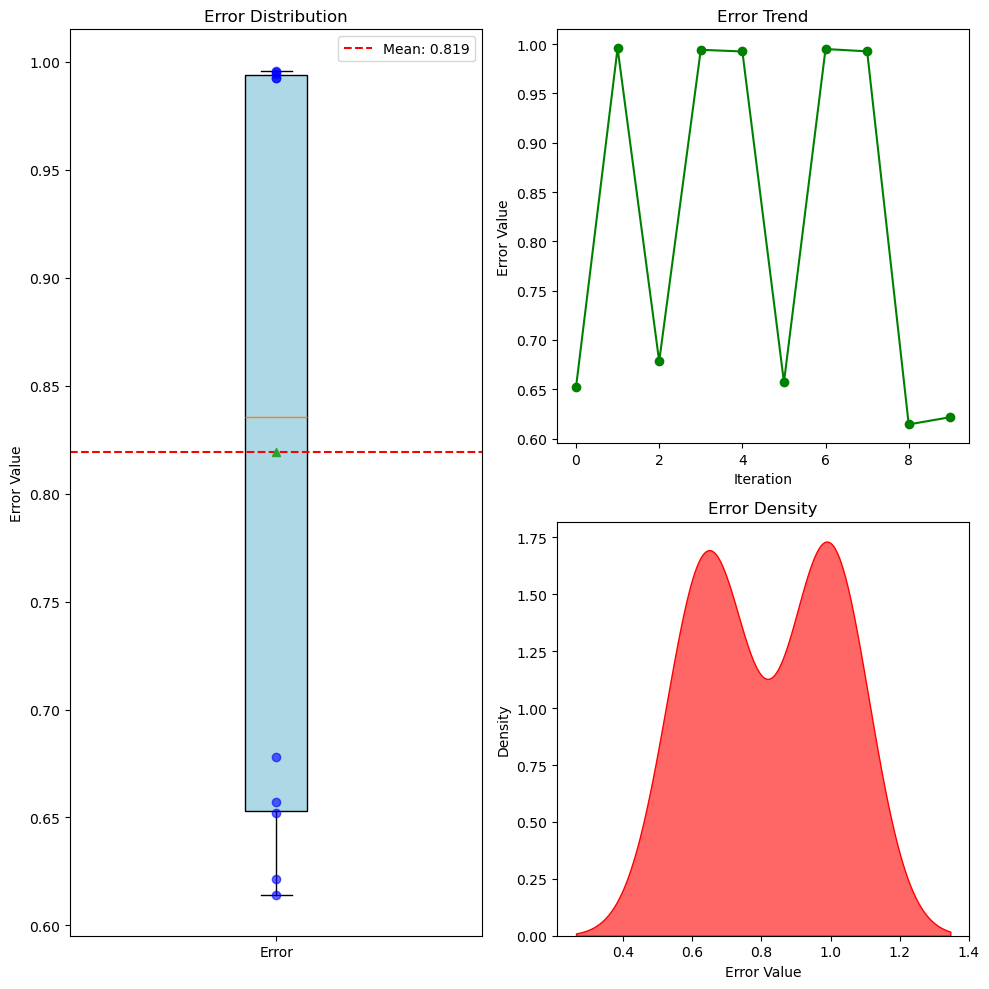

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5947221810612215, 0.7854634881268653, 1.0077722585678006, 0.5954742844285305, 0.4649590589316285, 0.41386083036181925, 0.6378457066743762, 0.6927021776896086, 0.44767318125257183, 0.28146649498710496, 0.8736713565859818, 0.8516792798779166, 0.37395951530223476, 0.8027823282496178, 0.804560887597274, 0.5182202889333846, 0.18454925778730633, 0.20862581035873265, 0.3739223144578929, 0.528249522241707]

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

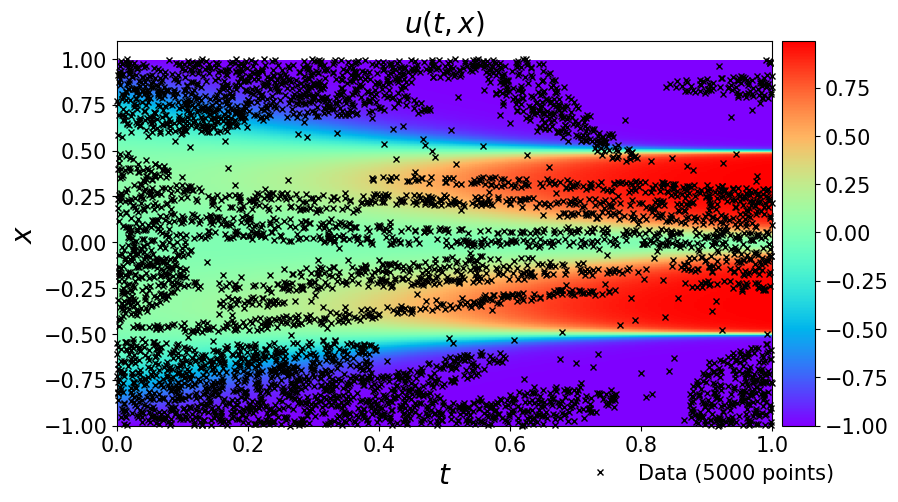

In [10]:
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]   #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组     
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')

###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f_train[:,1], 
    X_f_train[:,0], 
    'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [11]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


18919


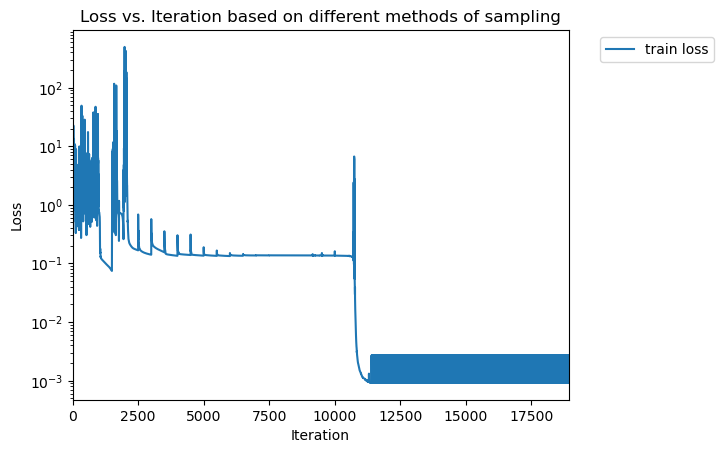

In [12]:
print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,len(trainloss)]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


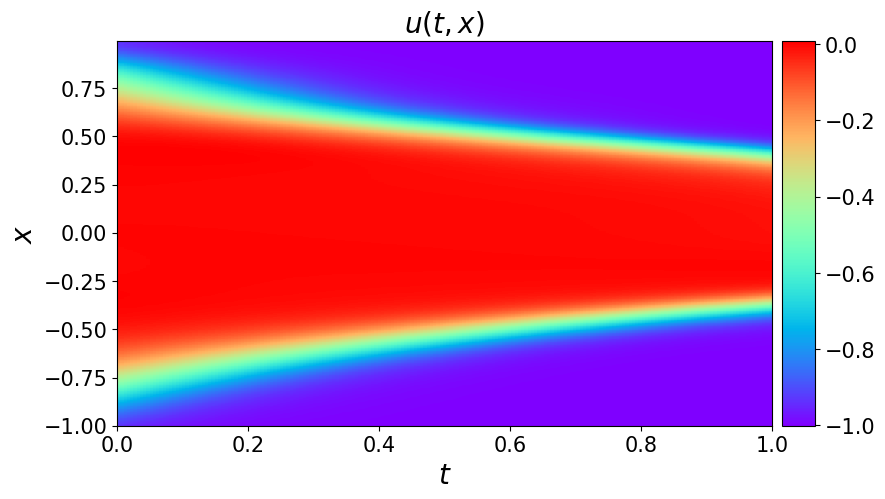

In [13]:
# data = scipy.io.loadmat('../../data/burgers_shock.mat')
# #从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
# t = data['t'].flatten()[:,None]
# x = data['x'].flatten()[:,None]
# Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
# #生成一个二位网络，X和T是输出的二维数组
# #这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

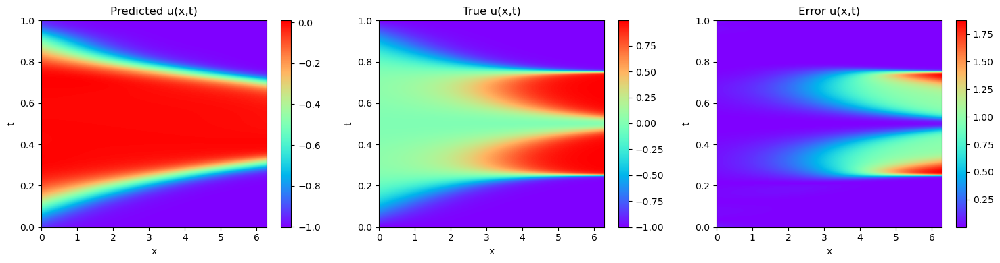

In [14]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [15]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

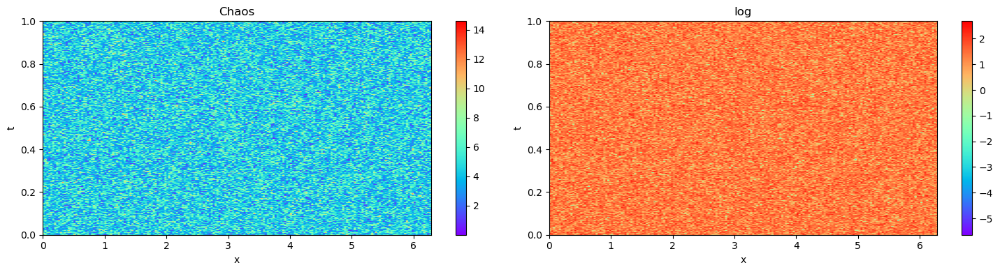

In [16]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()